# Assignment 2

In [1]:
import numpy as np
import pandas as pd
import os
import networkx as nx
import re
import io
import math
import PIL
import wordcloud
from wordcloud import WordCloud
from collections import Counter
from fa2 import ForceAtlas2
import matplotlib.pyplot as plt
from nltk import word_tokenize
from nltk.corpus import stopwords

## Importing data

In [2]:
df_115 = pd.read_csv('../Week8/H115_tw_2019.csv', encoding = 'utf-8')
# Sorting by names
df = df_115.sort_values("Name")

In [3]:
path_folder = "../Week8/tweets_2019/"

# Part 3: Sentiment analysis

### Tokenizing tweets

In [4]:
rep_tweets = []
dem_tweets = []

df = pd.read_csv('../Week8/H115_tw_2019.csv',encoding='utf-8')

WikiNames = list(df['WikiPageName'])
TwitterNames = list(df['tw_name'])

banned_words = set(stopwords.words('english'))
banned_words.add('http')
banned_words.add('https')
banned_words.add('rt')

In [5]:
# For every member
for ii in WikiNames:
    path=os.getcwd()+'/tweets_2019_full/'+ii
    
    if os.path.isfile(path):
        # Get the tweets (one per line)
        file_tweets = io.open(path, encoding='utf-8').read().split('\n')
        file_tweets = list(filter(lambda a: a != '', file_tweets))
              
        # Tokenizing, excluding stopwords, punctuation & numbers
        for tweet in file_tweets:
            good_words = []
            
            # Tokenizing
            t = word_tokenize(tweet)
            
            # To lowercase
            t = [tt.lower() for tt in t]
            
            # Excluding punctuation and numbers
            for word in t:
                if word.isalpha() and word!='' and word not in banned_words:
                    good_words.append(word)
            
            # Excluding twitter handles
            good_words = [t for t in good_words if not t in TwitterNames]
            
            print(good_words)
            
            # Check the party
            if (df.loc[df['WikiPageName'] == ii]).iloc[0]['Party']=='Democratic':
                dem_tweets.append(good_words)
            else:
                rep_tweets.append(good_words)

[]
['veteran', 'proud', 'four', 'fellow', 'veterans', 'staff', 'grateful', 'three', 'able', 'join', 'today', 'way', 'fully', 'repay', 'service', 'care', 'packages', 'one', 'small', 'way', 'remind', 'troops', 'home']
['troops', 'deployed', 'overseas', 'make', 'many', 'sacrifices', 'keep', 'country', 'safe', 'important', 'know', 'much', 'appreciate', 'everything', 'today', 'team', 'joined', 'help', 'assemble', 'care', 'packages', 'deployed', 'deploying', 'servicemembers']
['nat', 'l', 'fish', 'wildlife', 'foundation', 'valued', 'partner', 'alaska', 'since', 'creation', 'must', 'make', 'sure', 'continues', 'important', 'mission', 'conservation', 'proud', 'intro', 'reauthorization', 'bill', 'good', 'friend', 'repdebdingell', 'read']
['bright', 'young', 'alaskan', 'interested', 'coding', 'congressionalac', 'great', 'way', 'show', 'accomplishments', 'app', 'development', 'deadline', 'submit', 'entries', 'click', 'learn', 'enter']
['timber', 'harvest', 'historically', 'important', 'part', 'al

['alaska', 'roosevelt', 'conservation', 'caucus', 'rcc', 'proud', 'say', 'entire', 'alaska', 'congressional', 'alaska', 'roosevelt', 'conservation', 'caucus', 'rcc', 'proud', 'say', 'entire', 'alaska', 'congressional', 'delegation', 'joined']
['thank', 'sendansullivan', 'lisamurkowski', 'continued', 'leadership', 'rcc']
['proud', 'announce', 'million', 'funding', 'help', 'support', 'alaska', 'precious', 'wildlife', 'notably', 'beluga', 'whales', 'steller', 'sea', 'lions', 'read', 'funding', 'help', 'ak', 'dept', 'fish', 'game', 'protect', 'precious', 'wildlife']
['know', 'folks', 'trying', 'set', 'policy', 'alaska', 'never', 'even', 'alaska', 'centerforbiodiv', 'suing', 'prevent', 'king', 'cove', 'building', 'road', 'claims', 'town', 'way', 'aleutians']
['fact', 'almost', 'miles', 'away']
['nick', 'hanson', 'unalakleet', 'christi', 'hannah', 'fairbanks', 'made', 'alaska', 'proud', 'ninjawarrior', 'took', 'one', 'toughest', 'obstacle', 'courses', 'world', 'best', 'luck', 'nick', 'moves'

['staff', 'sergeant', 'james', 'leroy', 'bondsteel', 'willow', 'awarded', 'medal', 'honor', 'president', 'nixon', 'bravery', 'vietnam', 'war', 'although', 'wounded', 'refused', 'medical', 'attention', 'continued', 'leading', 'men', 'enemy', 'read']
['despite', 'bullet', 'shattering', 'arm', 'grenade', 'wounding', 'chest', 'staff', 'sergeant', 'van', 'winkle', 'refused', 'evacuation', 'continued', 'leading', 'men', 'enemy', 'attack', 'read', 'hero', 'medalofhonorday']
['staff', 'sergeant', 'archie', 'van', 'winkle', 'born', 'juneau', 'retired', 'ketchikan', 'awarded', 'medal', 'honor', 'conspicuous', 'gallantry', 'service', 'korean', 'war']
['national', 'medalofhonorday', 'pause', 'gratitude', 'men', 'women', 'went', 'beyond', 'call', 'duty', 'keep', 'nation', 'safe', 'learn', 'medal', 'honor', 'read', 'stories', 'heroes', 'received', 'click']
['pleased', 'share', 'fema', 'awarded', 'alaska', 'grant', 'nearly', 'million', 'permanent', 'repairs', 'gravel', 'dike', 'damaged', 'flooding', 

['repdelgado', 'join', 'colleagues', 'sides', 'aisle', 'thanking', 'jimpressoffice', 'years', 'service', 'behalf', 'join', 'colleagues', 'sides', 'aisle', 'thanking', 'jimpressoffice', 'years', 'service', 'behalf', 'wisconsin', 'fifth', 'district', 'amp', 'wish', 'best', 'retirement', 'thank', 'partnership', 'amp', 'collaboration', 'pass', 'family', 'farmer', 'relief', 'act']
['repbryansteil', 'discussing', 'jim', 'sensenbrenner', 'legacy', 'wisconsin', 'congress', 'wtmjsteve', 'tune', 'discussing', 'jim', 'sensenbrenner', 'legacy', 'wisconsin', 'congress', 'wtmjsteve', 'tune', 'jimpressoffice']
['repdougcollins', 'jimpressoffice', 'already', 'legend', 'judiciarygop', 'house', 'decades', 'legislated', 'boldly', 'jimpressoffice', 'already', 'legend', 'judiciarygop', 'house', 'decades', 'legislated', 'boldly', 'holding', 'thousands', 'town', 'halls', 'fellow', 'wisconsinites', 'miss', 'insight', 'leadership']
['jrrosswrites', 'wispolitics', 'speakerryan', 'calls', 'jimpressoffice', 'ment

['gopleader', 'flags', 'fly', 'memory', 'law', 'enforcement', 'officers', 'died', 'line', 'duty', 'last', 'flags', 'fly', 'memory', 'law', 'enforcement', 'officers', 'died', 'line', 'duty', 'last', 'year', 'peaceofficersmemorialday', 'honor', 'selfless', 'courage', 'grieve', 'families', 'fallen', 'heroes']
['adamneylonpress', 'senatorkapenga', 'yesterday', 'trade', 'manufacturing', 'policy', 'roundtable', 'jimpressoffice', 'repseanduffy', 'senatorkapenga', 'yesterday', 'trade', 'manufacturing', 'policy', 'roundtable', 'jimpressoffice', 'repseanduffy', 'paulfarrowwi', 'elected', 'officials', 'great', 'thanks', 'wisconsinmc', 'wctc', 'assistant', 'potus', 'dir', 'trade', 'manufacturing', 'policy', 'peter', 'navarro']
['senatorkapenga', 'great', 'time', 'participating', 'roundtable', 'discussion', 'manufacturing', 'amp', 'workforce', 'development', 'congressmen', 'great', 'time', 'participating', 'roundtable', 'discussion', 'manufacturing', 'amp', 'workforce', 'development', 'congressmen'

['supported', 'efforts', 'beef', 'border', 'security', 'throughout', 'career', 'proud', 'reintroduced', 'build', 'wall', 'act', 'would', 'divert', 'money', 'assets', 'seized', 'drug', 'cartels', 'fund', 'southern', 'border']
['experts', 'agree', 'physical', 'barriers', 'coupled', 'solutions', 'work', 'needed']
['sensenbrenner', 'sotu', 'imperative', 'congress', 'provide', 'much', 'needed', 'resources', 'secure', 'borders', 'cut', 'flow', 'drugs', 'illegal', 'immigration', 'ensure', 'safety', 'american', 'people']
['tbt', 'criminaljusticereform', 'sotu']
['rather', 'promising', 'raise', 'taxes', 'hardworking', 'american', 'families', 'businesses', 'urge', 'democratic', 'colleagues', 'join', 'efforts', 'expanding', 'prosperity']
['doubt', 'tax', 'cuts', 'amp', 'jobs', 'act', 'regulatory', 'reforms', 'passed', 'last', 'congress', 'contributed', 'robust', 'economy', 'american', 'people', 'deserve']
['sensenbrenner', 'sotu', 'americans', 'reaping', 'benefits', 'booming', 'economy', 'economi

['house', 'overwhelmingly', 'passed', 'stopping', 'bad', 'robocalls', 'act', 'afternoon', 'proud', 'cosponsor', 'bill', 'block', 'scammers', 'targeting', 'seniors', 'others', 'across', 'country', 'learn']
['kyedworkforce', 'announced', 'kystats', 'new', 'career', 'explorer', 'tool', 'helps', 'match', 'kentuckians', 'future', 'careers', 'tool', 'allow', 'announced', 'kystats', 'new', 'career', 'explorer', 'tool', 'helps', 'match', 'kentuckians', 'future', 'careers', 'tool', 'allow', 'students', 'amp', 'jobseekers', 'match', 'careers', 'best', 'match', 'knowledge', 'skills', 'amp', 'abilities']
['prichardcom', 'dyk', 'east', 'ky', 'science', 'center', 'amp', 'varia', 'planetarium', 'serves', 'hub', 'stem', 'education', 'eastern', 'ky', 'features', 'dyk', 'east', 'ky', 'science', 'center', 'amp', 'varia', 'planetarium', 'serves', 'hub', 'stem', 'education', 'eastern', 'ky', 'features', 'dome', 'amp', 'spitz', 'projection', 'system', 'one', 'two', 'dozen', 'world', 'varia', 'planetarium', 

['rxsummit', 'inspiring', 'opening', 'day', 'bringing', 'together', 'stakeholders', 'atlanta', 'four', 'powerful', 'inspiring', 'opening', 'day', 'bringing', 'together', 'stakeholders', 'atlanta', 'four', 'powerful', 'days', 'education', 'collaboration', 'order', 'find', 'solutions', 'opioid', 'epidemic', 'save', 'lives', 'restore', 'hope', 'thisiswhywemeet', 'uniteky']
['congratulations', 'friend', 'john', 'eadie', 'named', 'beacon', 'hope', 'recipient', 'rxsummit', 'driver', 'amp', 'pioneer', 'prescription', 'drug', 'monitoring', 'programs', 'across', 'country', 'thank', 'tireless', 'work', 'impact', 'opioid', 'abuse', 'epidemic']
['vice', 'commandant', 'coast', 'guard', 'admiral', 'charles', 'ray', 'service', 'men', 'women', 'deserve', 'great', 'debt', 'gratitude', 'efforts', 'fight', 'transnational', 'crime', 'coast']
['special', 'thanks', 'robert', 'redfield', 'director', 'cdc', 'sharing', 'important', 'update', 'drug', 'abuse', 'epidemic', 'reported', 'reduction', 'opioid', 'pres

['consolidated', 'appropriations', 'act', 'signed', 'law', 'today', 'addresses', 'many', 'nation', 'needs', 'want', 'applaud', 'congress', 'prevents', 'treats', 'enforces', 'drug', 'abuse', 'issues', 'plaguing', 'countless', 'families', 'every', 'day', 'details']
[]
['applaud', 'congressional', 'approval', 'comprehensive', 'federal', 'funding', 'amp', 'border', 'security', 'pkg', 'includes', 'several', 'critical', 'wins', 'federal', 'programs', 'southern', 'eastern', 'ky', 'including', 'round', 'funding', 'aml', 'pilot', 'program', 'learn']
['decided', 'speak', 'unborn', 'newborn', 'children', 'deserve', 'chance', 'loved', 'click', 'link', 'learn', 'important', 'proposed', 'federal', 'legislation', 'would', 'protect', 'sanctity', 'life']
[]
['mill', 'springs', 'battlefield', 'another', 'step', 'closer', 'receiving', 'due', 'recognition', 'historical', 'value', 'mcconnell', 'amp', 'diligently', 'worked', 'bring', 'civil', 'war', 'site', 'nps', 'national', 'monument', 'amp', 'look', 'for

['thank', 'billspadea', 'guest', 'today', 'show', 'talk', 'passage', 'hr', 'autism', 'cares', 'act']
[]
['wh', 'signing', 'children', 'families', 'across', 'nation', 'benefit', 'greatly', 'thank']
['autismcares']
[]
['thanks', 'senate', 'esp', 'senatemajldr', 'chairman', 'senalexander', 'today', 'passage', 'hr', 'autism', 'cares', 'act', 'billion', 'years', 'research', 'education', 'treatment']
['senalexander', 'autism', 'cares', 'act', 'headed', 'potus', 'signed', 'law', 'senate', 'passed', 'repchrissmith', 'autism', 'cares', 'act', 'headed', 'potus', 'signed', 'law', 'senate', 'passed', 'repchrissmith', 'usrepmikedoyle', 'senatorenzi', 'senatormenendez', 'legislation', 'renews', 'federal', 'programs', 'activities', 'assist', 'children', 'adults', 'autism', 'families']
['today', 'press', 'conference', 'hosted', 'bipartisan', 'group', 'democrat', 'amp', 'republican', 'lawmakers', 'vowed', 'move', 'hong', 'kong', 'human', 'rights', 'amp', 'democracy', 'act', 'hr']
['much', 'repchrissmit

['nominated', 'eric', 'mellinger', 'academy', 'distinguished', 'career', 'lifetime', 'service', 'recently', 'retired', 'semper', 'fi']
['flags', 'uscapitol', 'honor', 'peace', 'officers', 'memorial', 'day', 'always', 'honor', 'made', 'ultimate', 'sacrifice', 'protect', 'us']
['tbt', 'president', 'george', 'bush', 'signs', 'tvpa', 'reauthorization', 'law', 'time', 'pass', 'frederick', 'douglass', 'tvpa', 'strengthen']
['allairecomfarm', 'wall', 'twp', 'uses', 'rescued', 'animals', 'empower', 'individuals', 'disabilities', 'incl', 'autism', 'thank', 'important', 'work']
['thank', 'uscg', 'cwo', 'sparkman', 'service', 'manasquan', 'inlet', 'station', 'good', 'hands', 'new', 'commanding', 'officer', 'cwo', 'carlino']
['congratulations', 'congressionalartcompetition', 'winner', 'tallia', 'maglione', 'wall', 'work', 'carousel']
['icymi']
['abramskl', 'imperative', 'get', 'tip', 'report', 'right', 'repchrissmith', 'could', 'agree', 'endtrafficking', 'douglasstvpart', 'imperative', 'get', 'tip

['today', 'house', 'pass', 'resolution', 'recognizing', 'horrific', 'amp', 'systematic', 'efforts', 'commit', 'genocide', 'armenian', 'people', 'vote', 'resolution', 'let', 'us', 'also', 'keep', 'focused', 'populations', 'subjected', 'ethnic', 'cleansing', 'forced', 'relocation', 'today']
['vetaffairsdems', 'today', 'republican', 'members', 'house', 'committee', 'veterans', 'affairs', 'walked', 'vote', 'pass', 'historic', 'today', 'republican', 'members', 'house', 'committee', 'veterans', 'affairs', 'walked', 'vote', 'pass', 'historic', 'deborah', 'sampson', 'act', 'extend', 'care', 'benefits', 'women', 'veterans', 'left', 'veterans', 'repmarktakano']
['house', 'democrats', 'working', 'hard', 'bring', 'cost', 'higher', 'education', 'students', 'around', 'country', 'thank', 'edandlaborcmte', 'marking', 'collegeaffordibilityact', 'put', 'affordable', 'higher', 'education', 'reach', 'americans']
['also', 'discussed', 'legislation', 'take', 'next', 'work', 'period', 'including', 'funding',

['join', 'thanking', 'energycommerce', 'holding', 'markup', 'lowerdrugcostsnow', 'act', 'critical', 'legislation', 'lower', 'cost', 'prescription', 'drugs', 'americans', 'paying', 'far', 'abroad', 'pay', 'amp', 'bill', 'ensure', 'americans', 'afford', 'prescription', 'drugs']
['theblackcaucus']
['nation']
['city', 'baltimore']
['state', 'maryland']
['united', 'states', 'congress', 'suffered']
['nation']
['city', 'baltimore']
['state', 'maryland']
['united', 'states', 'congress', 'suffered', 'tremendous', 'loss']
['waysmeanscmte', 'bottom', 'line', 'choose', 'paying', 'monthly', 'bills', 'paying', 'prescription', 'drugs', 'bottom', 'line', 'choose', 'paying', 'monthly', 'bills', 'paying', 'prescription', 'drugs', 'really', 'simple', 'agree', 'must', 'lowerdrugcosts']
['waysmeanscmte', 'four', 'years', 'cost', 'insulin', 'doubled', 'ridiculous', 'able', 'afford', 'medicine', 'four', 'years', 'cost', 'insulin', 'doubled', 'ridiculous', 'able', 'afford', 'medicine', 'need', 'stay', 'alive'

['air', 'pollution', 'continues', 'public', 'health', 'risk', 'especially', 'communities', 'color', 'hispanicheritagemonth', 'house', 'dems', 'remain', 'committed', 'protecting', 'clear', 'air', 'amp', 'water', 'fighting', 'back', 'trump', 'admin', 'efforts', 'roll', 'back', 'protections']
['transportdems', 'earlier', 'year', 'members', 'congress', 'came', 'committee', 'made', 'clear', 'everyone', 'stake', 'earlier', 'year', 'members', 'congress', 'came', 'committee', 'made', 'clear', 'everyone', 'stake', 'robust', 'infrastructure', 'package', 'addresses', 'massive', 'backlog', 'infrastructure', 'projects', 'infrastructureforall']
['shameful', 'trump', 'administration', 'would', 'pull', 'forces', 'northern', 'syria', 'allow', 'conditions', 'could', 'return', 'isis', 'power', 'strongly', 'urge', 'reconsider', 'misguided', 'decision', 'read', 'full', 'statement']
['happy', 'birthday', 'friend', 'physicist', 'amp', 'proud', 'member', 'repbillfoster', 'experience', 'science', 'amp', 'busin

['great', 'idea', 'cityofsandusky', 'sandusky', 'makes', 'election', 'day', 'paid', 'holiday', 'making', 'easier', 'vote', 'help', 'polls', 'hope', 'see', 'municipalities', 'future']
['dark', 'dark', 'day', 'united', 'states', 'opens', 'drawbidge', 'stands', 'aside', 'let', 'tyranny']
['grateful', 'nitalowey', 'dedicated', 'honorable', 'service', 'gracious', 'style', 'decades', 'accomplishments', 'legacy', 'serve', 'guiding', 'light', 'generations', 'come']
['state', 'department', 'preventing', 'key', 'witnesses', 'ukraine', 'investigation', 'testifying', 'hiding']
['president', 'trump', 'decision', 'withdraw', 'troops', 'syria', 'dangerous', 'move', 'wipe', 'america', 'kurdish', 'allies', 'set', 'stage', 'major', 'isis', 'resurgence', 'region', 'serves', 'interests', 'russia', 'iran', 'isis', 'expense']
['trump', 'busts', 'another', 'norm', 'gop', 'responds', 'silence', 'support']
[]
['cuyahoga', 'river', 'powerful', 'symbol', 'environmental', 'revival', 'important', 'reminder', 'duty

['vaannarbor', 'miss', 'va', 'resource', 'enrollment', 'fair', 'coming', 'va', 'toledo', 'community', 'based', 'outpatient', 'clinic', 'tues', 'august', 'miss', 'va', 'resource', 'enrollment', 'fair', 'coming', 'va', 'toledo', 'community', 'based', 'outpatient', 'clinic', 'tues', 'august', 'come', 'learn', 'programs', 'services', 'vets', 'va', 'several', 'agencies', 'offices', 'repmarcykaptur', 'vavetbenefits', 'socialsecurity']
['globalized', 'world', 'need', 'fair', 'trade', 'among', 'free', 'people', 'calling', 'swift', 'action', 'independent', 'secretariat', 'fair', 'trade', 'deals', 'act']
['president', 'expects', 'usmca', 'ratified', 'congress', 'amend', 'text', 'agreement', 'include', 'equal', 'labor', 'standards', 'enforcement', 'mechanisms', 'referenced', 'legislation']
['bill', 'requires', 'trade', 'agreement', 'include', 'enforceable', 'labor', 'standards', 'protections', 'sets', 'congress', 'expectations', 'objectives', 'apply', 'workers', 'regardless', 'immigration', 'stat

['memorialday', 'honored', 'join', 'friends', 'wwiimemorial', 'grateful', 'nation', 'remembers', 'every', 'american', 'made', 'ultimate', 'sacrifice', 'live', 'free', 'america', 'heroes', 'amp', 'forever', 'owe', 'debt', 'gratitude']
['watch', 'live']
['statement', 'response', 'supreme', 'court', 'stay', 'ohio', 'michigan', 'gerrymandering', 'cases']
['house', 'gop', 'objection', 'bipartisan', 'bill', 'means', 'americans', 'impacted', 'natural', 'disasters', 'wait', 'even', 'longer', 'assistance', 'need']
['republican', 'politicians', 'playing', 'games', 'people', 'homes', 'literally', 'underwater', 'enough', 'enough']
['week', 'marked', 'important', 'victory', 'fight', 'prevent', 'asian', 'carp', 'taking', 'hold', 'great', 'lakes', 'tuesday', 'appropsdems', 'approved', 'bill', 'supporting', 'brandon', 'road', 'project', 'amp', 'today', 'army', 'corps', 'engineers', 'chief', 'signed', 'report', 'moving', 'project', 'forward']
['nrdcfedgov', 'thank', 'repmarcykaptur', 'committee', 'demo

['remain', 'committed', 'supporting', 'investments', 'transportation', 'infrastructure', 'including', 'efforts', 'improve', 'safety', 'efficiency', 'railroad', 'crossings', 'expansion', 'recapitalization', 'south', 'shore', 'rail', 'line']
['thank', 'students', 'parents', 'attended', 'military', 'academy', 'night', 'last', 'week', 'please', 'click', 'link', 'access', 'application', 'information', 'questions', 'please', 'contact', 'merrillville', 'office']
['grateful', 'actions', 'courageous', 'women', 'fought', 'passage', 'amendment', 'must', 'continue', 'follow', 'example', 'reach', 'full', 'equality', 'recognize', 'invaluable', 'contributions', 'women', 'society']
['aauniversities', 'thank', 'repcarolmiller', 'amp', 'repvisclosky', 'joining', 'today', 'briefing', 'coalition', 'national', 'security', 'thank', 'repcarolmiller', 'amp', 'repvisclosky', 'joining', 'today', 'briefing', 'coalition', 'national', 'security', 'research', 'deptofdefense', 'basic', 'research', 'crucial', 'innova

['remember', 'ed', 'good', 'friend', 'one', 'kindest', 'individuals', 'ever', 'met', 'remain', 'epitome', 'sincere', 'public', 'servants', 'strive', 'thoughts', 'prayers', 'family', 'friends', 'difficult', 'time']
['deeply', 'regrettable', 'today', 'decision', 'damage', 'country', 'credibility', 'negotiator', 'relationships', 'critical', 'allies', 'partners', 'ability', 'lead', 'future', 'efforts', 'prevent', 'spread', 'nuclear', 'weapons', 'materials', 'around', 'world', 'irandeal']
['click', 'details', 'military', 'academy', 'night', 'encourage', 'students', 'interested', 'military', 'service', 'attending', 'military', 'academy', 'stop', 'event', 'take', 'place', 'next', 'monday', 'may', 'iu', 'northwest']
['great', 'tour', 'saic', 'office', 'purdue', 'technology', 'center', 'crown', 'point', 'week', 'enjoyed', 'hearing', 'exciting', 'work', 'microelectronics', 'thank', 'developing', 'growing', 'new', 'technology', 'northwest', 'indiana']
['pleased', 'attend', 'ceremony', 'new', 'ind

['pleased', 'able', 'talk', 'secretary', 'perry', 'members', 'nuclear', 'security', 'working', 'group', 'department', 'energy', 'important', 'nuclear', 'nonproliferation', 'programs']
['aisisteel', 'steel', 'caucus', 'urges', 'potus', 'defend', 'american', 'steel', 'visit', 'china', 'reprickcrawford', 'steel', 'caucus', 'urges', 'potus', 'defend', 'american', 'steel', 'visit', 'china', 'reprickcrawford', 'repvisclosky', 'repbost']
['pleased', 'speak', 'wbez', 'last', 'week', 'exciting', 'work', 'happening', 'northwest', 'indiana', 'create', 'jobs', 'transform', 'regional', 'economy']
['pleased', 'office', 'able', 'provide', 'ron', 'cortez', 'vietnam', 'veteran', 'hamburger', 'hill', 'survivor', 'flag', 'flown', 'capitol', 'qovfoundation', 'presentation', 'ceremony', 'residence', 'today', 'schererville']
['currently', 'open', 'enrollment', 'period', 'coverage', 'click', 'site', 'information', 'hesitate', 'contact', 'merrillville', 'office', 'need', 'information', 'assistance']
['today',

['stand', 'millions', 'young', 'people', 'around', 'world', 'speaking', 'today', 'climate', 'action', 'time', 'leaders', 'take', 'meaningful', 'steps', 'address', 'climate', 'change', 'go', 'back', 'kids', 'looking', 'forward', 'future', 'climateactionnow']
['proud', 'stand', 'scotus', 'today', 'young', 'oregonians', 'behind', 'juliana', 'v', 'landmark', 'lawsuit', 'call', 'climate', 'justice', 'join', 'global', 'climate', 'strike', 'sept', 'demand', 'action', 'reluctant', 'colleagues']
['transportdems', 'chair', 'reppeterdefazio', 'trump', 'administration', 'dirtywaterrule', 'leading', 'campaign', 'dismantle', 'chair', 'reppeterdefazio', 'trump', 'administration', 'dirtywaterrule', 'leading', 'campaign', 'dismantle', 'clean', 'water', 'act', 'pushed', 'mining', 'industry', 'oil', 'gas', 'small', 'large', 'industrial', 'polluters']
['today', 'dave', 'ross', 'head', 'epa', 'office', 'water', 'going', 'try', 'defend', 'trump', 'dirty', 'water', 'agenda', 'front', 'today', 'dave', 'ross',

['today', 'alleyesonjuliana', 'oral', 'arguments', 'started', 'children', 'trust', 'case', 'vs', 'us', 'govt', 'inaction', 'climate', 'change', 'proud', 'young', 'plaintiffs', 'work', 'require', 'federal', 'government', 'act', 'climate', 'crisis']
['traveling', 'germany', 'last', 'week', 'ran', 'jonathan', 'dahl', 'constituent', 'roseburg', 'security', 'forces', 'member', 'security', 'forces', 'squadron', 'ramstein', 'airbase', 'jonathan', 'thanks', 'service', 'hope', 'see', 'home', 'roseburg', 'soon']
['wearealpa', 'thank', 'reppeterdefazio', 'friend', 'alpa', 'pilots', 'commitment', 'keepflyingsafe', 'thank', 'reppeterdefazio', 'friend', 'alpa', 'pilots', 'commitment', 'keepflyingsafe']
['transportdems', 'long', 'history', 'fighting', 'infrastructure', 'investment', 'apprentice', 'gavel', 'today', 'reppeterdefazio', 'long', 'history', 'fighting', 'infrastructure', 'investment', 'apprentice', 'gavel', 'today', 'reppeterdefazio', 'still', 'hopeful', 'move', 'forward', 'invest', 'crumbl

['eugenepw', 'plow', 'operators', 'hustling', 'much', 'snow', 'help', 'us', 'staying', 'roads', 'helps', 'plow', 'operators', 'hustling', 'much', 'snow', 'help', 'us', 'staying', 'roads', 'helps', 'keep', 'safe', 'gives', 'us', 'room', 'safely', 'work', 'clear', 'snow']
['lanetransit', 'update', 'due', 'inclement', 'weather', 'road', 'conditions', 'ltd', 'ltd', 'connector', 'diamond', 'express', 'suspended', 'service', 'update', 'due', 'inclement', 'weather', 'road', 'conditions', 'ltd', 'ltd', 'connector', 'diamond', 'express', 'suspended', 'service', 'time', 'stay', 'visiting']
['great', 'visit', 'defunkifyme', 'innovative', 'eugene', 'company', 'using', 'uoregon', 'green', 'chemistry', 'research', 'create', 'cleaning', 'laundry', 'products']
['trump', 'administration', 'department', 'education', 'continues', 'hurt', 'students', 'allowing', 'student', 'loan', 'servicers', 'pocket', 'funds', 'gouging', 'student', 'borrowers']
['transportdems', 'nation', 'interstate', 'bridges', 'repai

['time', 'year', 'tens', 'millions', 'americans', 'working', 'file', 'taxes', 'april', 'proud', 'work', 'improve', 'taxpayer', 'service', 'protect', 'taxpayers', 'enforcement', 'enhance', 'appeals', 'process']
['waysmeanscmte', 'president', 'pledged', 'protect', 'socialsecurity', 'suggesting', 'slash', 'funding', 'president', 'pledged', 'protect', 'socialsecurity', 'suggesting', 'slash', 'funding']
['build', 'society', 'peace', 'sow', 'seeds', 'hatred', 'division', 'hate', 'heavy', 'burden', 'bear', 'love', 'way']
['overwhelmed', 'sadness', 'murder', 'souls', 'christchurch', 'new', 'zealand', 'room', 'society', 'hate', 'especially', 'basis', 'religion', 'pray', 'muslim', 'brothers', 'sisters', 'hope', 'world', 'community', 'come', 'see', 'love', 'better', 'way']
['today', 'questioned', 'treasury', 'secretary', 'steve', 'mnuchin', 'tax', 'disclosures', 'waysmeanscmte', 'hearing', 'president', 'budget']
['first', 'met', 'louise', 'slaughter', 'years', 'ago', 'freshman', 'orientation', 'f

['never', 'important', 'time', 'guarantee', 'voice', 'freely', 'speak', 'speak', 'allow', 'powerful', 'companies', 'control', 'see', 'internet', 'must', 'save', 'netneutrality', 'guarantee', 'free', 'amp', 'open', 'internet', 'goodtrouble']
['speakerryan', 'speaker', 'time', 'action', 'know', 'facts', 'many', 'guns', 'many', 'children', 'must', 'die', 'many', 'students', 'many', 'teachers', 'people', 'willing', 'lead', 'get', 'way']
['unbelievable', 'unreal', 'consider', 'bill', 'turns', 'clock', 'backwards', 'strikes', 'devastating', 'blow', 'fight', 'civil', 'rights']
['shocked', 'numb', 'many', 'must', 'die', 'conscience', 'must', 'move', 'us', 'action', 'time', 'american', 'people', 'demand', 'action', 'elected', 'leaders']
['budget', 'seeks', 'dismantle', 'social', 'safety', 'net', 'right', 'fair', 'every', 'person', 'watching', 'understand', 'budget', 'dangerous', 'unrealistic']
['climatereality', 'blackhistorymonth', 'know', 'penned', 'environmental', 'justice', 'legislation', '

['proud', 'cosponsor', 'bill', 'protecting', 'small', 'innocent', 'animals', 'torture', 'important', 'priority', 'folks', 'across', 'nation', 'glad', 'see', 'animal', 'welfare', 'legislation', 'pass', 'house']
['speaker', 'pelosi', 'partisan', 'drug', 'pricing', 'plan', 'bipartisan', 'support', 'bill', 'stifles', 'innovation', 'would', 'result', 'fewer', 'cures', 'let', 'get', 'work', 'find', 'bipartisan', 'solution']
['otd', 'terrorists', 'bombed', 'marine', 'barracks', 'beirut', 'american', 'service', 'members', 'people', 'total', 'died', 'day', 'honor', 'fallen', 'must', 'never', 'forget', 'heroes', 'sacrificed', 'freedom']
['pipeline', 'safety', 'important', 'issue', 'dems', 'playing', 'politics', 'divided', 'amp', 'need', 'work', 'together', 'introduced', 'bill', 'actually', 'get', 'bipartisan', 'support', 'let', 'work', 'together', 'deliver', 'usa']
['glad', 'see', 'house', 'unanimously', 'pass', 'resolution', 'condemning', 'russian', 'government', 'detaining', 'paul', 'whelan', 

['national', 'manufacturing', 'day', 'thank', 'manufacturers', 'hard', 'workers', 'helped', 'make', 'michigan', 'one', 'world', 'leaders', 'manufacturing', 'fighting', 'hard', 'everyday', 'protect', 'manufacturing', 'industry', 'jobs', 'workers']
['cnbc', 'breaking', 'september', 'unemployment', 'rate', 'falls', 'low', 'payrolls', 'rise', 'breaking', 'september', 'unemployment', 'rate', 'falls', 'low', 'payrolls', 'rise']
['new', 'job', 'numbers', 'show', 'unemployment', 'rate', 'fallen', 'new', 'low', 'need', 'keep', 'amp', 'remain', 'focused', 'job', 'creation', 'amp', 'economic', 'growth']
[]
[]
['great', 'campus', 'kcollege', 'today', 'update', 'president', 'gonzalez', 'things', 'matter', 'students', 'faculty', 'southwest', 'michigan', 'school', 'makes', 'us', 'district', 'proud', 'keep', 'good', 'work']
['great', 'conversation', 'good', 'friend', 'repdebdingell', 'deteconomicclub', 'today', 'discussed', 'many', 'important', 'issues', 'possible', 'republican', 'democrat', 'work', '

['housecommerce', 'four', 'bipartisan', 'energy', 'environment', 'bills', 'passed', 'house']
['advance', 'nuclear', 'four', 'bipartisan', 'energy', 'environment', 'bills', 'passed', 'house']
['advance', 'nuclear', 'energy']
['efficiency']
['pollution']
['electric', 'grid']
['great', 'day', 'yesterday', 'niles', 'honored', 'part', 'cleaner', 'energy', 'better', 'jobs', 'homes', 'businesses', 'powered', 'clean', 'natural', 'gas', 'thanks', 'new', 'indeck', 'energy', 'center', 'niles', 'read']
['read', 'incredible', 'story', 'heraldpalladium']
['indeck', 'niles', 'energy', 'center', 'broke', 'ground', 'billion', 'dollar', 'project', 'yesterday', 'deliver', 'cleaner', 'efficient', 'energy', 'homes', 'businesses', 'community']
['one', 'top', 'priorities', 'congress', 'deliver', 'cleaner', 'safer', 'better', 'energy', 'people', 'southwest', 'michigan']
['great', 'event', 'niles', 'morning', 'broke', 'ground', 'new', 'indeck', 'niles', 'energy', 'center', 'billion', 'project', 'create', 'jobs

['secretary', 'health', 'amp', 'human', 'services', 'clinton', 'administration', 'repshalala', 'fought', 'allow', 'medicare', 'negotiate', 'lower', 'drug', 'prices', 'making', 'happen', 'lowerdrugcosts', 'act', 'forthepeople']
['yesterday', 'realdonaldtrump', 'top', 'staffer', 'joined', 'trump', 'lawyer', 'diplomats', 'confessing', 'trump', 'admin', 'used', 'military', 'aid', 'pressure', 'ukraine', 'interfering', 'election', 'simple', 'question', 'facing', 'republicans', 'truthexposed']
['nasa', 'captured', 'imaginations', 'world', 'generations', 'congratulations', 'amp', 'leaving', 'mark', 'history', 'today', 'allwomanspacewalk', 'inspiration', 'women', 'amp', 'girls', 'across', 'america']
['read', 'full', 'statement', 'senschumer']
['yesterday', 'house', 'sent', 'overwhelming', 'bipartisan', 'message', 'demanding', 'clear', 'strategy', 'defeat', 'isis', 'senate', 'immediately']
['sham', 'ceasefire', 'nothing', 'stop', 'thousands', 'isis', 'prisoners', 'escaping', 'shows', 'president'

['responsibility', 'protect', 'democracy', 'future', 'generations', 'must', 'abandon', 'duty', 'exposethetruth']
['yet', 'proud', 'sign', 'send', 'realdonaldtrump', 'desk', 'bipartisan', 'legislation', 'terminating', 'fake', 'emergency', 'declaration']
['get', 'serious', 'betrayal', 'oath', 'office', 'president', 'trump', 'pressure', 'foreign', 'country', 'interfere', 'elections', 'yet', 'exactly', 'realdonaldtrump', 'truthexposed']
['yesterday', 'evening', 'following', 'senate', 'passage', 'continuing', 'resolution', 'signed', 'bill', 'upholding', 'responsibility', 'keep', 'government', 'open', 'amp', 'working', 'forthepeople']
['days', 'senatemajldr', 'mcconnell', 'still', 'refusing', 'allow', 'vote', 'forthepeople', 'act', 'time', 'senate', 'job', 'vote']
['days', 'ago', 'house', 'passed', 'ambitious', 'set', 'ethics', 'standards', 'amp', 'election', 'reforms', 'generation', 'forthepeople', 'act']
['tune', 'et', 'call', 'senate', 'hold', 'vote']
['looking', 'forward', 'speaking', 'm

['noted', 'last', 'week', 'energycommerce', 'hearing', 'children', 'health', 'programs', 'bipartisan', 'trump', 'admin', 'throwing', 'roadblocks', 'ronwyden', 'sent', 'letter', 'secazar', 'get', 'answers', 'protectourcare']
['today', 'committee', 'holding', 'hearing', 'trump', 'administration', 'undercutting', 'renewable', 'fuel', 'standard', 'potus', 'captive', 'oil', 'industry', 'exacerbating', 'climatecrisis', 'devastating', 'rural', 'communities', 'working', 'hard', 'produce', 'ethanol']
['energycommerce', 'hearing', 'today', 'urged', 'fcc', 'hold', 'fair', 'transparent', 'competitive', 'public', 'auction', 'would', 'reap', 'billions', 'dollars', 'funds', 'could', 'used', 'improve', 'public', 'safety', 'connect', 'americans', 'broadband']
['intro', 'bipartisan', 'legislation', 'today', 'support', 'universities', 'including', 'rutgersu', 'developing', 'new', 'technology', 'hope', 'limit', 'drug', 'shortages', 'future', 'spur', 'new', 'generation', 'century', 'manufacturing', 'jobs',

['global', 'temperatures', 'rise', 'birds', 'animals', 'forced', 'natural', 'habitats', 'new', 'jersey', 'iconic', 'goldfinch', 'risk', 'fail', 'actonclimate', 'bringbirdsback']
[]
['burdensome', 'paperwork', 'requirements', 'harm', 'working', 'families', 'trying', 'make', 'ends', 'meet', 'tying', 'red', 'tape', 'depriving', 'critical', 'health', 'care', 'requirements', 'boondoggle', 'start', 'ended', 'immediately']
['today', 'usgao', 'released', 'findings', 'report', 'requested', 'found', 'trump', 'admin', 'medicaid', 'work', 'requirements', 'cost', 'taxpayers', 'tens', 'millions', 'dollars', 'administrative', 'costs']
['long', 'past', 'time', 'end', 'stigmas', 'associated', 'mental', 'health', 'working', 'congress', 'promote', 'parity', 'mental', 'health', 'care', 'needs', 'treated', 'compassion', 'care', 'patients', 'deserve', 'worldmentalhealthday']
['president', 'abandoned', 'kurdish', 'allies', 'put', 'lives', 'risk', 'appease', 'foreign', 'autocrat', 'unconscionable', 'decision'

['middle', 'high', 'school', 'students', 'district', 'office', 'participating', 'year', 'congressional', 'app', 'challenge', 'congressionalac', 'students', 'november', 'enter', 'submissions', 'click', 'info']
[]
['likely', 'decarbonize', 'certain', 'sectors', 'like', 'power', 'even', 'faster', 'goal', 'share', 'global', 'scientific', 'consensus', 'makes', 'clear', 'sectors', 'entire', 'country', 'must', 'carbon', 'neutral', 'climatefriday', 'actonclimate']
['july', 'announced', 'plan', 'develop', 'bold', 'comprehensive', 'legislation', 'decarbonize', 'entire', 'economy', 'achieve', 'net', 'zero', 'greenhouse', 'gas', 'pollution', 'later']
['could', 'agree', 'climatechange', 'crisis', 'demands', 'immediate', 'action', 'heard', 'calls', 'unite', 'behind', 'science', 'let', 'science', 'dictate', 'proceed']
['last', 'year', 'americans', 'take', 'medication', 'prescribed', 'due', 'high', 'costs']
[]
['speakerpelosi', 'introduced', 'lowerdrugcosts', 'act', 'cut', 'prescription', 'drug', 'pri

['easy', 'see', 'foreign', 'powers', 'could', 'attempt', 'curry', 'favor', 'president', 'whose', 'main', 'concern', 'enriching']
['nbcpolitics', 'us', 'house', 'foreign', 'affairs', 'cmte', 'chairman', 'engel', 'issues', 'extraordinary', 'joint', 'statement', 'counterparts', 'us', 'house', 'foreign', 'affairs', 'cmte', 'chairman', 'engel', 'issues', 'extraordinary', 'joint', 'statement', 'counterparts', 'germany', 'france', 'uk', 'european', 'parliament', 'condemning', 'turkish', 'invasion', 'northern', 'syria', 'abandonment', 'syrian', 'kurds', 'wrong']
['houseforeign', 'hearings', 'week']
['humanrights', 'south', 'asia']
['protecting', 'good', 'friday', 'agreement', 'brexit']
['hearings', 'week']
['humanrights', 'south', 'asia']
['protecting', 'good', 'friday', 'agreement', 'brexit']
['betrayal', 'syrian', 'kurdish', 'partners']
['policy', 'toward', 'latin', 'america', 'amp', 'caribbean']
['grateful', 'meet', 'estheratnafsa', 'benefits', 'economically', 'amp', 'culturally', 'intlstud

['houseforeign', 'houseintel', 'oversightdems', 'whitehouse', 'repadamschiff', 'repcummings', 'repeliotengel', 'white', 'house', 'refused', 'houseintel', 'oversightdems', 'whitehouse', 'repadamschiff', 'repcummings', 'repeliotengel', 'white', 'house', 'refused', 'produce', 'docs', 'requested', 'weeks', 'ago']
['whitehouse', 'flagrant', 'disregard', 'multiple', 'requests', 'docs', 'left', 'us', 'choice']
['chairmen', 'consider', 'compulsory', 'measures', 'wh', 'refuses', 'comply']
[]
['jeffreydinowitz', 'set', 'year', 'flu', 'season', 'come', 'saint', 'gabriel', 'free', 'flu', 'shot', 'courtesy', 'nyphospital', 'set', 'year', 'flu', 'season', 'come', 'saint', 'gabriel', 'free', 'flu', 'shot', 'courtesy', 'nyphospital', 'repeliotengel', 'senatorbiaggi', 'andrewcohennyc', 'hosting', 'event']
['houseforeign', 'breaking', 'repadamschiff', 'repcummings', 'repeliotengel', 'warn', 'statedept', 'attempt', 'secpompeo', 'intimidate', 'breaking', 'repadamschiff', 'repcummings', 'repeliotengel', 'w

['neverforget', 'means', 'caring', 'families']
['rubendiazjr', 'struggling', 'suicidal', 'thoughts', 'okay', 'seek', 'help', 'talk', 'family', 'member', 'friend', 'call', 'struggling', 'suicidal', 'thoughts', 'okay', 'seek', 'help', 'talk', 'family', 'member', 'friend', 'call', 'national', 'suicide', 'prevention', 'lifeline', 'alone', 'worldsuicidepreventionday']
['clear', 'housedemocrats', 'serious', 'gunviolenceprevention']
['joined', 'colleagues', 'house', 'gun', 'violence', 'prevention', 'task', 'force', 'forum', 'today', 'hear', 'impacted', 'gunviolence']
['mcconnell', 'must', 'act', 'housegvp']
['president', 'needs', 'immediately', 'appoint', 'qualified', 'replacement', 'respects', 'humanrights', 'democracy', 'supports', 'diplomacy', 'development', 'recognizes', 'alliances', 'engagement', 'pillars', 'american', 'foreign', 'policy']
['administration', 'wilbur', 'ross', 'threatening', 'noaa', 'officials', 'would', 'major', 'scandal', 'trump', 'administration', 'another', 'day']
['e

['quick', 'reminder', 'bills', 'mitch', 'mcconnell', 'still', 'blocking', 'quick', 'reminder', 'bills', 'mitch', 'mcconnell', 'still', 'blocking']
['great', 'news', 'add', 'fuel', 'fight', 'bring', 'federal', 'dollars', 'ny', 'promising', 'new', 'results', 'let', 'ny', 'example', 'smart', 'investments', 'state', 'federal', 'governments', 'bring', 'end', 'hiv', 'epidemic']
['emergencydocs', 'thank', 'continued', 'efforts', 'protect', 'patients', 'surprise', 'billing', 'repjohnjoyce']
['repsmucker', 'repstefanik', 'thank', 'continued', 'efforts', 'protect', 'patients', 'surprise', 'billing', 'repjohnjoyce']
['repsmucker', 'repstefanik', 'congressmangt', 'repronwright', 'donaldnorcross', 'nitalowey', 'repcardenas', 'repdesaulnier', 'reprobinkelly', 'repdlamborn', 'repyvetteclarke', 'repjimbaird']
['must', 'continue', 'support', 'press', 'freedom', 'rights', 'journalists', 'worldwide']
['hard', 'believe', 'year', 'since', 'jamal', 'khashoggi', 'murdered', 'simply', 'speaking', 'pushing', '

['usgao', 'among', 'important', 'watchdogs', 'findings', 'respected', 'amp', 'secbernhardt', 'fix', 'damage', 'done']
[]
['president', 'lying', 'stealing', 'funds', 'school', 'children', 'brave', 'service', 'members', 'pay', 'fool', 'errand', 'wall', 'insists', 'mexico', 'paying']
['appropsdems', 'president', 'trump', 'thinks', 'border', 'wall', 'important']
['training', 'amp', 'readiness', 'facilities', 'troops']
['president', 'trump', 'thinks', 'border', 'wall', 'important']
['training', 'amp', 'readiness', 'facilities', 'troops']
['child', 'care', 'amp', 'education', 'military', 'families']
['repairs', 'amp', 'reconstruction', 'bases', 'damaged', 'hurricane', 'maria', 'puerto', 'rico']
[]
['appropsdems', 'fighting', 'back', 'protecting', 'future', 'military', 'construction', 'funds', 'abused', 'president']
['critical', 'military', 'construction', 'improvements', 'wasteful', 'misguided', 'border', 'wall', 'projects']
[]
['yet', 'another', 'senseless', 'attempt', 'realdonaldtrump', 'f

['housedemocrats', 'led', 'appropsdems', 'chairs', 'nitalowey', 'amp', 'repmarcykaptur', 'sounding', 'alarm', 'potentially', 'dangerous', 'effects']
['read']
[]
['women', 'attacked', 'represent', 'america', 'represent', 'districts', 'made', 'cultures', 'religions', 'occupant', 'white', 'house', 'completely', 'disconnected', 'actually', 'makes', 'america', 'great', 'instead', 'fueling', 'racism', 'white', 'supremacy']
['trump', 'continuing', 'hateful', 'comments', 'disgusting', 'unbecoming', 'president', 'us', 'completely', 'unproductive', 'country']
['new', 'restrictions', 'continuation', 'xenophobia', 'discrimination', 'hate', 'dictate', 'administration', 'policies']
['president', 'spent', 'time', 'consulting', 'experts', 'less', 'time', 'governing', 'twitter', 'would', 'know', 'law', 'clear', 'new', 'proposed', 'rule', 'violates', 'immigration', 'nationality', 'act']
['appropsdems', 'watch', 'appropsdems', 'conducting', 'oversight', 'conditions', 'homestead', 'influx', 'facility', 'f

['ty', 'holding', 'waysmeanscmte', 'hearing', 'public', 'health', 'consequences', 'amp', 'costs', 'gun', 'violence', 'residual', 'effects', 'include', 'costs', 'individuals', 'families', 'communities', 'amp', 'health', 'care', 'providers', 'must', 'continue', 'work', 'together', 'address', 'crisis']
['strongly', 'back', 'speaker', 'house', 'nancy', 'pelosi', 'call', 'today', 'formal', 'impeachment', 'inquiry', 'president', 'donald', 'trump', 'american', 'people', 'expect', 'truth', 'transparency', 'government']
['agree', 'repdankildee', 'people', 'michigan', 'massachusetts', 'across', 'country', 'worry', 'water', 'contaminated', 'proud', 'stand', 'urging', 'lawmakers', 'keep', 'pfas', 'provisions', 'ndaa']
['must', 'continue', 'fight', 'lowerdrugcosts', 'american', 'families', 'choose', 'paying', 'bills', 'paying', 'medicine', 'recap', 'waysmeanscmte', 'addressing', 'important', 'issue']
[]
['waysmeanscmte', 'absolutely', 'right', 'according', 'new', 'report', 'released', 'ways', 'amp'

['iambobmartinez', 'thank', 'machinistsunion', 'members', 'called', 'member', 'congress', 'protect', 'earned', 'thank', 'machinistsunion', 'members', 'called', 'member', 'congress', 'protect', 'earned', 'retirements', 'working', 'americans']
['proud', 'fight', 'alongside', 'reprichardneal', 'pass', 'butchlewisact', 'house', 'senate', 'must', 'job']
['starting', 'shortly', 'waysmeanscmte', 'holds', 'hearing', 'repjohnlarson', 'bill', 'social', 'security', 'act', 'watch']
['machinistsunion', 'news']
['house', 'passed', 'butchlewisact', 'help', 'protect', 'retirements', 'working', 'news']
['house', 'passed', 'butchlewisact', 'help', 'protect', 'retirements', 'working', 'americans']
['thank', 'reprichardneal', 'champion', 'let', 'keep', 'fight']
['waysmeanscmte', 'big', 'thanks', 'rita', 'lewis', 'thousands', 'retirees', 'fought', 'tooth', 'nail', 'last', 'seven', 'years', 'save', 'big', 'thanks', 'rita', 'lewis', 'thousands', 'retirees', 'fought', 'tooth', 'nail', 'last', 'seven', 'years'

['waysmeanscmte', 'w', 'amp', 'dems', 'serious', 'providing', 'families', 'working', 'americans', 'significant', 'tax', 'relief', 'w', 'amp', 'dems', 'serious', 'providing', 'families', 'working', 'americans', 'significant', 'tax', 'relief', 'advanced', 'economic', 'mobility', 'act', 'week', 'committee', 'read', 'historic', 'bill']
['waysmeanscmte', 'morning', 'speakerpelosi', 'signed', 'taxpayer', 'first', 'act', 'alongside', 'chairman', 'reprichardneal', 'amp', 'longtime', 'leader', 'morning', 'speakerpelosi', 'signed', 'taxpayer', 'first', 'act', 'alongside', 'chairman', 'reprichardneal', 'amp', 'longtime', 'leader', 'issue', 'commonsense', 'bill', 'win', 'taxpayers', 'amp', 'one', 'step', 'closer', 'president', 'trump', 'desk', 'spread', 'good', 'news']
['today', 'attended', 'signing', 'bipartisan', 'taxpayer', 'first', 'act', 'first', 'irs', 'reform', 'legislation', 'decades', 'thanks', 'leadership', 'important', 'initiative', 'onto', 'potus']
['senwarren', 'great', 'news', 'thank

['proud', 'happy', 'represent', 'congressional', 'district', 'bronx', 'home', 'yankee', 'stadium', 'yankees', 'congrats', 'win', 'clinching', 'al', 'east', 'title', 'beginning', 'yankees', 'realmichaelkay']
['tune', 'chair', 'appropsdems', 'cjs', 'subcommittee', 'hearing', 'nasa', 'amp', 'nsf', 'ask', 'implementation', 'stem', 'funds']
['committed', 'funding', 'training', 'future', 'stem', 'workforce', 'amp', 'propel', 'scientific', 'research', 'watch']
['days', 'days', 'since', 'house', 'passed', 'bipartisan', 'commonsense', 'legislation', 'expand', 'background', 'checks', 'necessary', 'step', 'work', 'endgunviolence', 'yet', 'senatemajldr', 'mcconnell', 'refuses', 'hold', 'vote']
['hispanicheritagemonth', 'recommit', 'making', 'smithsonian', 'american', 'latino', 'museum', 'reality', 'proud', 'lead', 'bill', 'would', 'make', 'happen', 'hurdonthehill', 'thanks', 'latinomuseum', 'support']
['stand', 'solidarity', 'nearly', 'uaw', 'workers', 'bravely', 'exercise', 'right', 'strike', 'be

['hosted', 'noaa', 'amp', 'local', 'environmental', 'advocacy', 'groups', 'thepointcdc', 'thebronx', 'address', 'climatechange', 'resiliency', 'ny', 'chairman', 'appropsdems', 'subcommittee', 'overseeing', 'funding', 'noaa', 'continue', 'support', 'funding', 'address', 'climatechange']
['wishing', 'son', 'senatorserrano', 'happy', 'birthday']
['protection', 'civil', 'rights', 'million', 'increase', 'useeoc', 'increasing', 'funding', 'access', 'legal', 'services', 'poor', 'communities', 'amp', 'improving', 'doj', 'capacity', 'enforce', 'civil', 'rights', 'laws', 'encourage', 'colleagues', 'support', 'bill']
['doj', 'help', 'stem', 'opioid', 'abuse', 'amp', 'expand', 'addiction', 'treatment', 'along', 'funding', 'fight', 'drug', 'trafficking', 'reduce', 'crime', 'help', 'address', 'gun', 'violence']
['significant', 'funding', 'increase', 'censusbureau', 'amp', 'provision', 'block', 'inclusion', 'citizenship', 'question']
['billion', 'noaa', 'climatechange', 'research', 'weather', 'foreca

['proud', 'announce', 'appropsdems', 'bill', 'chairman', 'cjs', 'subcommittee', 'successfully', 'worked', 'colleagues', 'address', 'several', 'key', 'issues', 'bill']
['tackle', 'climatechange', 'rejecting', 'trump', 'proposed', 'budget', 'cuts']
['appropsdems', 'new', 'draft', 'bill', 'released', 'providing', 'key', 'investments', 'research', 'combating', 'new', 'draft', 'bill', 'released', 'providing', 'key', 'investments', 'research', 'combating', 'climate', 'change', 'state', 'amp', 'local', 'law', 'enforcement', 'amp']
['read', 'bill', 'amp', 'chairman', 'repjoseserrano', 'full', 'statement']
['democrats', 'committed', 'lowering', 'prescription', 'drug', 'costs', 'forthepeople', 'taking', 'legislative', 'action', 'support', 'bill', 'floor', 'week', 'would', 'stop', 'drug', 'companies', 'gaming', 'system', 'unfairly', 'raising', 'drug', 'prices', 'american', 'families', 'protectourcare']
['happy', 'mother', 'day', 'wonderful', 'moms', 'throughout', 'world', 'thank', 'us', 'remember

['morning', 'delighted', 'join', 'colleague', 'gkbutterfield', 'celebrating', 'dedication', 'united', 'states', 'courthouse', 'honor', 'john', 'hervey', 'wheeler', 'african', 'american', 'businessman', 'civil', 'rights', 'leader', 'educator', 'durham', 'resident']
['trump', 'reckless', 'freelancing', 'abandoned', 'kurdish', 'ppl', 'helped', 'combat', 'created', 'crisis', 'syria', 'important', 'bipartisan', 'consensus', 'emerging', 'oppose', 'president', 'irresponsible', 'actions', 'afraid', 'damage', 'already', 'done']
['appropsdems', 'chairman', 'repdavideprice', 'leads', 'subcommittee', 'oversight', 'hearing', 'hudgov', 'holding', 'chairman', 'repdavideprice', 'leads', 'subcommittee', 'oversight', 'hearing', 'hudgov', 'holding', 'disaster', 'recovery', 'funds', 'still', 'blocking', 'billions', 'grant', 'dollars', 'reaching']
[]
['durhamchamber', 'exciting', 'unveiling', 'john', 'hervey', 'wheeler', 'us', 'courthouse', 'downtown', 'exciting', 'unveiling', 'john', 'hervey', 'wheeler', 

['tonight', 'awarded', 'medal', 'courage', 'americanhumane']
['bibi', 'campaign', 'stunt', 'promising', 'unilaterally', 'annex', 'jordan', 'valley', 'amp', 'settlements', 'west', 'bank', 'recklessly', 'threatens', 'israel', 'security', 'democracy', 'prospects', 'solution', 'must', 'oppose', 'efforts', 'amp', 'protect', 'possibility', 'peace']
['atwateramber', 'thank', 'representative', 'david', 'price', 'nora', 'blalock', 'meeting', 'us', 'today', 'discuss', 'importance', 'sunscreen', 'thank', 'representative', 'david', 'price', 'nora', 'blalock', 'meeting', 'us', 'today', 'discuss', 'importance', 'sunscreen', 'drug', 'affordability', 'medicare', 'access', 'aadaonthehill', 'aadmember', 'ncmedsoc', 'repdavideprice']
['theblackcaucus', 'dutch', 'slave', 'ship', 'arrived', 'jamestown', 'africans', 'purchased', 'indentured', 'workers', 'dutch', 'slave', 'ship', 'arrived', 'jamestown', 'africans', 'purchased', 'indentured', 'workers', 'first', 'africans', 'english', 'north', 'american', 'co

['today', 'house', 'took', 'important', 'first', 'step', 'toward', 'addressing', 'youth', 'vaping', 'epidemic', 'passing', 'reparmstrongnd', 'bill', 'preventing', 'online', 'sales', 'children', 'act']
['shameful', 'working', 'legislation', 'fix', 'keep', 'families', 'together']
['eddebtjustice', 'breaking', 'court', 'holds', 'betsydevosed', 'contempt', 'court', 'assesses', 'sanctions', 'collecting', 'former', 'corinthian', 'breaking', 'court', 'holds', 'betsydevosed', 'contempt', 'court', 'assesses', 'sanctions', 'collecting', 'former', 'corinthian', 'students', 'violation', 'court', 'order', 'case']
[]
['betsydevosed', 'contempt', 'law', 'students', 'disgraceful', 'students', 'borrowers', 'teachers', 'families', 'deserve', 'better']
[]
['new', 'fair', 'scheduling', 'roundtable', 'edelia', 'huerta', 'talks', 'new', 'fair', 'scheduling', 'roundtable', 'edelia', 'huerta', 'talks', 'work', 'extra', 'hours', 'hotel', 'cleaning', 'job', 'without', 'extra', 'pay']
['new', 'tackling', 'schedu

['every', 'day', 'witness', 'devastating', 'effects', 'climate', 'change', 'country', 'gone', 'backward', 'trump', 'administration', 'time', 'bold', 'solutions', 'like', 'green', 'new', 'deal', 'invests', 'green', 'jobs', 'amp', 'green', 'technology', 'wait', 'longer', 'climatestrike']
['spend', 'billion', 'student', 'loan', 'servicing', 'anything', 'questionable', 'quality', 'service', 'borrowers', 'receive', 'subcommittee', 'funds', 'usedgov', 'keep', 'fighting', 'bring', 'accountability', 'amp', 'oversight', 'broken', 'system']
['outrageous', 'actually', 'believes', 'make', 'food', 'safer']
['youth', 'vaping', 'reaching', 'epidemic', 'levels', 'chemicals', 'dangerous', 'causing', 'people', 'fall', 'ill', 'die', 'proud', 'founding', 'member', 'congrassional', 'caucus', 'endyouthvaping']
['proud', 'fight', 'advocates', 'medical', 'professionals', 'fund', 'groundbreaking', 'medical', 'research', 'better', 'treatments', 'rare', 'cancer']
['colinoneil', 'thank', 'work', 'protect', 'consu

['separating', 'children', 'families', 'cruel', 'heartless', 'raids', 'part', 'president', 'trump', 'policy', 'child', 'abuse', 'traumatizing', 'children', 'values', 'familiesbelongtogether']
['research', 'critical', 'addressing', 'gun', 'violence', 'epidemic', 'proud', 'lead', 'fight', 'house', 'nitalowey', 'amp', 'appropsdems']
['year', 'funding', 'bill', 'secured', 'million', 'gun', 'violence', 'prevention', 'research', 'hhs', 'sec', 'azar', 'cdc', 'dir', 'redfield', 'agree', 'current', 'law', 'prevent', 'pursuit', 'research', 'need', 'funding', 'senate', 'needs', 'support']
['every', 'american', 'affordable', 'health', 'coverage', 'without', 'worrying', 'discrimination', 'based', 'conditions', 'stop', 'fighting', 'protectourcare', 'million', 'ct', 'residents', 'americans', 'across', 'country']
['trump', 'administration', 'latest', 'move', 'rip', 'coverage', 'lgbtq', 'individuals', 'particularly', 'cruel', 'extension', 'discriminatory', 'agenda', 'must', 'putpatientsfirst', 'protect

['trump', 'amp', 'sycophants', 'tried', 'cover', 'transcripts', 'phone', 'call', 'ukraine', 'president', 'hiding', 'info', 'server', 'reserved', 'highly', 'classified', 'info', 'work', 'caught', 'red', 'handed', 'thinking', 'impeachment', 'impeachment', 'way']
['know', 'trump', 'called', 'whistleblower', 'others', 'disclosed', 'impeachable', 'activities', 'spies', 'insinuated', 'killed', 'trump', 'crook', 'hoodlum']
['one', 'whistleblower', 'one', 'telephone', 'call', 'make', 'difference', 'us', 'power', 'dare', 'use', 'change', 'world']
['shout', 'millennials', 'staying', 'woke', 'supporting', 'time', 'warning', 'congress', 'trump', 'needed', 'impeach', 'remember', 'always', 'said', 'fight', 'win']
['suspect', 'pence', 'part', 'conspiracy', 'repmaxinewaters', 'discusses', 'believes', 'happen', 'vp', 'mike', 'pence', 'suspect', 'pence', 'part', 'conspiracy', 'repmaxinewaters', 'discusses', 'believes', 'happen', 'vp', 'mike', 'pence', 'light', 'trump', 'attempted', 'deal', 'ukraine']
['

['trump', 'know', 'angling', 'war', 'iran', 'stop', 'iran', 'compliance', 'jcpoa', 'netanyahu', 'better', 'try', 'take', 'us', 'war', 'need', 'amp', 'israel', 'need']
['trump', 'started', 'confrontation', 'iran', 'unilaterally', 'renege', 'jcpoa', 'agreement', 'us', 'six', 'countries', 'avoid', 'iran', 'nuclear', 'buildup']
['trump', 'get', 'credit', 'stopping', 'strike', 'iran', 'unmanned', 'drone', 'iran', 'airspace', 'surveillance', 'provoke', 'pretend', 'innocence']
['nomorewars', 'president', 'old', 'tricks', 'allowing', 'bolton', 'pompeo', 'war', 'hawks', 'pretends', 'reasonable', 'strikes', 'iran', 'say', 'tried', 'strike', 'real', 'trying', 'diplomacy', 'back']
['cnbcclosingbell', 'repmaxinewaters', 'saraeisen', 'wilfredfrost', 'president', 'business', 'interfering', 'fed', 'repmaxinewaters', 'saraeisen', 'wilfredfrost', 'president', 'business', 'interfering', 'fed']
['cnbcclosingbell', 'repmaxinewaters', 'calling', 'facebook', 'halt', 'work', 'libra', 'cryptocurrency', 'joins'

['amjoyshow', 'week', 'joyannreid', 'pick', 'repmaxinewaters', 'amjoy', 'week', 'joyannreid', 'pick', 'repmaxinewaters', 'amjoy']
['amjoyshow', 'repmaxinewaters', 'end', 'anything', 'end', 'report', 'investigation', 'mueller', 'repmaxinewaters', 'end', 'anything', 'end', 'report', 'investigation', 'mueller', 'us', 'chair', 'committees', 'responsibility', 'continue', 'oversight', 'end', 'everything', 'amjoy', 'muellerreport']
['mueller', 'report', 'released', 'attorney', 'general', 'barr', 'waiting', 'two', 'years', 'barr', 'discretion', 'releases', 'public', 'let', 'tweet', 'tweet', 'tweet', 'demand', 'entire', 'report', 'released', 'deserve', 'nothing', 'less']
['sarahdwire', 'repmaxinewaters', 'notes', 'news', 'release', 'since', 'trump', 'took', 'office', 'four', 'men', 'convicted', 'threatening', 'repmaxinewaters', 'notes', 'news', 'release', 'since', 'trump', 'took', 'office', 'four', 'men', 'convicted', 'threatening', 'kill']
['fifth', 'man', 'arrested', 'february', 'threatening'

['right', 'vote', 'lies', 'core', 'democracy', 'today', 'housejudiciary', 'passed', 'voting', 'rights', 'advancement', 'act', 'restore', 'vra', 'reverse', 'tide', 'discriminatory', 'voter', 'suppression', 'laws']
['lgbt', 'history', 'american', 'history', 'mark', 'lgbthistorymonth', 'proud', 'helped', 'create', 'first', 'national', 'monument', 'dedicated', 'lgbt', 'history', 'stonewall', 'inn', 'recognizing', 'spark', 'galvanized', 'nationwide', 'movement']
['preetbharara', 'man', 'served', 'acting', 'attorney', 'general', 'united', 'states', 'america', 'man', 'served', 'acting', 'attorney', 'general', 'united', 'states', 'america']
['issues', 'partisan', 'even', 'washington', 'proud', 'support', 'pactact', 'makes', 'animal', 'cruelty', 'federal', 'crime', 'animal', 'abuse', 'place', 'society', 'protectourpets']
['nwlc', 'today', 'congress', 'holding', 'hearing', 'pregnant', 'workers', 'fairness', 'act', 'would', 'strengthen', 'laws', 'today', 'congress', 'holding', 'hearing', 'pregnan

['repjerrynadler', 'bill', 'called', 'repdougcollins', 'voted', 'ask', 'senatemajldr', 'mcconnell', 'support', 'bill', 'called', 'repdougcollins', 'voted', 'ask', 'senatemajldr', 'mcconnell', 'support', 'since', 'agreement', 'need', 'election', 'security']
['humbled', 'meet', 'juliana', 'plaintiffs', 'jacob', 'lebel', 'vic', 'barrett', 'today', 'discuss', 'constitutional', 'climate', 'lawsuit', 'young', 'people', 'disproportionately', 'impacted', 'climate', 'crisis', 'legal', 'right', 'live', 'healthy', 'planet', 'youthvgov']
['bill', 'called', 'repdougcollins', 'voted', 'ask', 'senatemajldr', 'mcconnell', 'support', 'since', 'agreement', 'need', 'election', 'security']
['repthompson', 'days', 'senatemajldr', 'refused', 'hold', 'vote', 'bipartisan', 'bill', 'help', 'prevent', 'gun', 'violence', 'days', 'senatemajldr', 'refused', 'hold', 'vote', 'bipartisan', 'bill', 'help', 'prevent', 'gun', 'violence', 'thousands', 'children', 'already', 'killed', 'injured', 'someone', 'gun', 'year', 

['said', 'filing', 'mcgahn', 'committee', 'critical', 'witness', 'refusal', 'testify', 'depriving', 'us', 'information', 'essential', 'investigation', 'impedes', 'ability', 'exercise', 'article', 'functions', 'including', 'whether', 'recommend', 'articles', 'impeachment']
['today', 'housejudiciary', 'filed', 'complaint', 'compel', 'former', 'wh', 'counsel', 'mcgahn', 'testify', 'committee', 'actively', 'consider', 'whether', 'recommend', 'articles', 'impeachment', 'president']
['past', 'sunday', 'joined', 'ncjwny', 'annual', 'store', 'uws', 'wonderful', 'job', 'equipping', 'kids', 'supplies', 'need', 'succeed', 'school']
['new', 'york', 'continues', 'evolve', 'thank', 'meatpackingny', 'championing', 'new', 'public', 'plazas', 'amp', 'bringing', 'together', 'city', 'state', 'amp', 'federal', 'support', 'create', 'new', 'open', 'space']
['busy', 'evening', 'nyc', 'tonight', 'proud', 'participate', 'nationalnightout', 'district', 'thank', 'precinct', 'councils', 'nypdnews', 'keeping', 'ne

['yesterday', 'students', 'academy', 'hickory', 'hollow', 'asked', 'questions', 'register', 'vote', 'today', 'davidson', 'election', 'commission', 'registered', 'eligible', 'students', 'bigpicnashville', 'yarbro', 'spoke', 'republichs', 'students', 'importance', 'registering', 'vote']
['president', 'decision', 'abandon', 'kurdish', 'allies', 'syria', 'disastrous', 'effects', 'watch', 'questioning', 'today', 'house', 'oversight', 'reform', 'subcommittee', 'national', 'security', 'hearing', 'president', 'syria', 'policy']
['oversightdems', 'hearing', 'syria', 'watch', 'live']
['famous', 'tn', 'republican', 'howard', 'baker', 'asked', 'watergate', 'investigation', 'president', 'nixon', 'president', 'know', 'know', 'impeachment', 'investigation', 'important', 'know', 'facts']
['vanderbiltu', 'interim', 'chancellor', 'susan', 'wente', 'team', 'great', 'job', 'nashville', 'fortunate', 'universities', 'impressive', 'research', 'developing', 'leaders', 'future']
['tennessee', 'percentage', 'ch

['reason', 'state', 'pursuing', 'dangerous', 'plan', 'real', 'solution', 'legislature', 'expand', 'medicaid', 'encourage', 'everyone', 'provide', 'input', 'public', 'comment', 'period']
[]
['governor', 'block', 'grant', 'proposal', 'nothing', 'provide', 'coverage', 'tennesseans', 'without', 'health', 'insurance', 'also', 'risks', 'benefits', 'coverage', 'current', 'medicaid', 'enrollees']
[]
['al', 'gore', 'giant', 'south', 'voting', 'rights', 'civil', 'rights', 'great', 'panel', 'yesterday', 'legacy', 'author', 'anthony', 'badger', 'mtsu', 'algore']
['thanks', 'vumctrauma', 'teaching', 'staff', 'stopthebleed', 'emergency', 'situation']
['new', 'data', 'census', 'bureau', 'shows', 'main', 'change', 'uninsured', 'rates', 'came', 'declines', 'medicaid', 'coverage', 'instead', 'increasing', 'rolls', 'tn', 'cutting', 'including', 'children']
['today', 'marks', 'years', 'violence', 'women', 'act', 'earlier', 'year', 'house', 'voted', 'reauthorize', 'act', 'senate', 'needs', 'vawa']
['last',

['today', 'voted', 'legislation', 'impose', 'sanctions', 'turkey', 'response', 'offensive', 'kurdish', 'troops', 'northern', 'syria', 'send', 'clear', 'message', 'aggression', 'unacceptable']
['long', 'supported', 'united', 'states', 'officially', 'recognize', 'armenian', 'genocide', 'atrocities', 'took', 'place', 'cosponsored', 'voted', 'passage', 'today', 'house']
['thank', 'us', 'esperdod', 'stop', 'gap', 'funding', 'measures', 'threaten', 'national', 'security', 'continue', 'urge', 'colleagues', 'take', 'action', 'providing', 'critical', 'resources', 'troops']
['earlier', 'today', 'met', 'orange', 'county', 'supervisors', 'andrew', 'doug', 'chaffee', 'ongoing', 'santa', 'ana', 'river', 'mainstem', 'project', 'provides', 'critical', 'flood', 'protection', 'riverside', 'orange', 'san', 'bernardino', 'counties']
['impeachment', 'process', 'resoundingly', 'criticized', 'speaker', 'rushing', 'bill', 'house', 'floor', 'designed', 'fool', 'americans', 'thinking', 'process', 'fair', 'amp',

['earlier', 'today', 'discussed', 'number', 'health', 'care', 'issues', 'lluhealth', 'ceo', 'kerry', 'heinrich', 'including', 'surprise', 'medical', 'billing', 'health', 'region', 'fortunate', 'access', 'tremendous', 'care', 'lluhealth', 'provides']
['great', 'meet', 'officials', 'eastern', 'municipal', 'water', 'district', 'talk', 'meeting', 'water', 'challenges', 'region']
['important', 'issues', 'house', 'democrats', 'losing', 'focus', 'march', 'impeachment', 'path']
['humanitarian', 'crisis', 'southern', 'border']
['new', 'trade', 'deal']
['homeless', 'crisis']
['reducing', 'prescription', 'drug', 'prices']
['terrific', 'meeting', 'yesterday', 'participants', 'riverside', 'county', 'workforce', 'innovation', 'opportunity', 'youth', 'program', 'discuss', 'best', 'provide', 'young', 'people', 'access', 'core', 'skills', 'needed', 'succeed', 'today', 'economy']
['economic', 'agenda', 'providing', 'tremendous', 'economic', 'opportunities', 'veterans']
['together', 'senatorshaheen', 'we

['agree', 'find', 'ways', 'stop', 'horrific', 'attacks', 'let', 'focus', 'solutions', 'compassion', 'fellow', 'americans', 'rather', 'rhetoric', 'division']
['must', 'root', 'hate', 'driven', 'ideologies', 'like', 'white', 'supremacy', 'antifa', 'others', 'use', 'violence', 'terrorize', 'communities']
['democrats', 'california', 'imposed', 'nation', 'highest', 'state', 'sales', 'tax', 'highest', 'income', 'tax', 'highest', 'gas', 'tax', 'trying', 'weaken', 'prop', 'tax', 'protections', 'coming', 'hard', 'earned', 'money', 'pay', 'socialist', 'policies']
['thank', 'rso', 'murrietapd', 'working', 'lapdhq', 'important', 'case']
['whitehousecea', 'unemployment', 'rate', 'remains', 'near', 'lowest', 'rate', 'nearly', 'years', 'holding', 'steady', 'making', 'july', 'unemployment', 'rate', 'remains', 'near', 'lowest', 'rate', 'nearly', 'years', 'holding', 'steady', 'making', 'july', 'consecutive', 'month', 'number', 'weeks', 'unemployed', 'individuals', 'july', 'reached', 'lowest', 'number', 

['republicans', 'get', 'equal', 'time', 'ask', 'questions', 'amp', 'follow', 'questions', 'notion', 'something', 'secret', 'absolutely', 'true']
['shameful', 'misrepresenting', 'guess', 'climate', 'live']
['well', 'done', 'good', 'faithful', 'servant']
['rest', 'power', 'dear', 'friend']
['housedemocrats', 'repcummings', 'dedicated', 'life', 'fighting', 'forthepeople']
['true', 'patriot', 'leader', 'public', 'servant', 'continues', 'repcummings', 'dedicated', 'life', 'fighting', 'forthepeople']
['true', 'patriot', 'leader', 'public', 'servant', 'continues', 'inspire', 'us', 'every', 'day']
['nation', 'never', 'fight', 'justice', 'equality', 'go', 'honor']
['restinpower']
['whipclyburn', 'says', 'cummings', 'notion', 'serve', 'whipclyburn', 'says', 'cummings', 'notion', 'serve']
['congressman', 'elijah', 'cummings', 'legacy', 'remembered', 'two', 'ways']
['matters', 'start', 'life', 'finish']
['goodness', 'people', 'dictate', 'greatness', 'country']
['via']
['senbooker', 'national', 'ho

['house', 'must', 'complete', 'impeachment', 'inquiry', 'deliberate', 'speed', 'resolve', 'abuse', 'presidential', 'powers', 'tremendous', 'bearing', 'future', 'republic']
['whistleblower', 'complaint', 'shows', 'instead', 'seeking', 'solely', 'advance', 'america', 'national', 'interest', 'president', 'trump', 'sought', 'advance', 'political', 'interest']
['rather', 'putting', 'america', 'national', 'security', 'first', 'president', 'trump', 'put', 'first']
['protecting', 'national', 'security', 'standing', 'rule', 'law', 'patriotism']
['support', 'official', 'impeachment', 'inquiry', 'announced', 'speaker', 'today']
['recent', 'revelations', 'amp', 'allegations', 'president', 'used', 'power', 'office', 'force', 'foreign', 'government', 'attack', 'political', 'rival', 'amp', 'may', 'directing', 'subordinates', 'violate', 'law', 'constitute', 'egregious', 'violation', 'constitutional', 'duties']
['want', 'extend', 'deepest', 'gratitude', 'shared', 'memories', 'amp', 'offered', 'prayers'

['leaving', 'coast', 'please', 'pack', 'following', 'items', 'required', 'medications', 'adequate', 'clothing', 'essential', 'personal', 'items']
['residents', 'going', 'evacuation', 'shelters', 'bring', 'blankets', 'pillows', 'cots', 'special', 'food', 'items', 'restricted', 'diets']
['based', 'storm', 'projected', 'path', 'along', 'predicted', 'storm', 'surge', 'high', 'tides', 'roads', 'may', 'inaccessible', 'due', 'flooding', 'bridges', 'may', 'closed', 'due', 'high', 'winds', 'emergency', 'help', 'may', 'available']
['please', 'seek', 'shelter', 'soon', 'possible']
['south', 'carolina', 'residents', 'advised', 'lane', 'reversal', 'operations', 'cease', 'noon', 'today', 'crews', 'seek', 'shelter', 'safe', 'locations', 'outside', 'hurricanedorian', 'projected', 'path']
['repdonbeyer', 'texas', 'shooter', 'tried', 'buy', 'gun', 'failed', 'background', 'check', 'used', 'loophole', 'obtain', 'weapon', 'texas', 'shooter', 'tried', 'buy', 'gun', 'failed', 'background', 'check', 'used', '

['congress', 'bring', 'price', 'rx', 'drugs', 'save', 'billions', 'passing', 'allows', 'medicare', 'negotiate', 'directly', 'drug', 'companies', 'extends', 'lower', 'prices', 'medications', 'every', 'american', 'lowerdrugcosts']
['complexities', 'middle', 'east', 'civilian', 'casualties', 'displacement', 'emboldened', 'russia', 'isis', 'legacy', 'donald', 'trump', 'foreign', 'policy']
['appalled', 'president', 'decision', 'put', 'interests', 'foreign', 'dictators', 'ahead', 'national', 'security', 'foreign', 'allies', 'allowing', 'turkey', 'launch', 'military', 'offensive', 'syria', 'reckless', 'confirms', 'president', 'understand']
['relevant', 'committees', 'issuing', 'subpoenas', 'ambassador', 'sondland', 'testimony', 'documents', 'follow', 'updates', 'impeachment', 'inquiry', 'visit', 'website']
['today', 'trump', 'administration', 'barred', 'ambassador', 'gordon', 'sondland', 'appearing', 'investigators', 'congress', 'white', 'house', 'interference', 'obstruction', 'congress', 'im

['health', 'subcommittee', 'examined', 'proposals', 'today', 'end', 'surprise', 'medical', 'billing', 'protecting', 'patients', 'payment', 'disagreements', 'providers', 'insurers', 'unplanned', 'visit', 'never', 'leave', 'insured', 'patients', 'thousands', 'dollars', 'debt']
['surprise', 'medical', 'bills', 'occur', 'patients', 'caught', 'insurers', 'health', 'care', 'providers', 'often', 'leaves', 'exorbitant', 'debts', 'wreak', 'havoc', 'family', 'finances', 'learn', 'treated', 'physician']
['pridemonth', 'celebrate', 'victories', 'remember', 'losses', 'long', 'march', 'equality', 'three', 'years', 'ago', 'today', 'lives', 'lost', 'pulse', 'nightclub', 'massacre', 'take', 'time', 'remember', 'victims', 'thoughts', 'families', 'today']
['senmarkey', 'senate', 'democrats', 'demand', 'leader', 'mcconnell', 'bring', 'legislation', 'restore', 'netneutrality', 'floor', 'immediate', 'vote', 'senate', 'democrats', 'demand', 'leader', 'mcconnell', 'bring', 'legislation', 'restore', 'netneutra

['behalf', 'people', 'california', 'congressional', 'district', 'join', 'world', 'community', 'mourning', 'new', 'zealand', 'loss', 'lives', 'reaffirm', 'condemnation', 'forms', 'hatred', 'intolerance', 'carry', 'families', 'victims', 'hearts', 'prayers']
['hard', 'believe', 'states', 'allow', 'housing', 'employment', 'discrimination', 'based', 'sexual', 'orientation', 'amp', 'states', 'lack', 'laws', 'gender', 'identity', 'cosponsoring', 'equalityact', 'protect', 'civil', 'rights', 'lgbt', 'people', 'across', 'every', 'state', 'country']
['reminder', 'join', 'second', 'telephone', 'town', 'hall', 'meeting', 'tonight', 'pst', 'tune', 'via', 'live', 'webstream', 'submit', 'questions', 'look', 'forward', 'hearing']
['thatmomentwhen', 'trump', 'secretary', 'health', 'acts', 'like', 'budget', 'taking', 'hatchet', 'every', 'part', 'health', 'care', 'system', 'undermining', 'affordable', 'care', 'act', 'block', 'granting', 'medicaid', 'slashing', 'medicare', 'spending', 'got', 'receipts', 's

['schiff', 'secret', 'hearings', 'respect', 'intelligence', 'american', 'people', 'speakerpelosi', 'remove', 'immediately']
['week', 'colleagues', 'voting', 'hold', 'repadamschiff', 'accountable', 'lies', 'corruption', 'want', 'people', 'know', 'stand']
['repandybiggsaz', 'voting', 'tonight', 'motion', 'condemn', 'censure', 'adam', 'schiff', 'must', 'held', 'accountable', 'misleading', 'voting', 'tonight', 'motion', 'condemn', 'censure', 'adam', 'schiff', 'must', 'held', 'accountable', 'misleading', 'american', 'people']
['proud', 'introduce', 'companion', 'sentedcruz', 'bill', 'establish', 'assistant', 'secretary', 'defense', 'space', 'china', 'russia', 'develop', 'capabilities', 'laser', 'weapons', 'missiles', 'must', 'protect', 'nation', 'security', 'space']
['repadamschiff', 'scheduling', 'witnesses', 'day', 'plans', 'conduct', 'depositions', 'simultaneously', 'repadamschiff', 'scheduling', 'witnesses', 'day', 'plans', 'conduct', 'depositions', 'simultaneously', 'members', 'places'

['tonight', 'led', 'debate', 'house', 'floor', 'sanctuary', 'cities', 'introduced', 'motion', 'ensure', 'stories', 'victims', 'families', 'told', 'facts', 'cities', 'constitute', 'direct', 'threat', 'public', 'safety']
['live', 'house', 'floor', 'leading', 'fight', 'sanctuary', 'cities']
['recap', 'ukrainetranscript']
['democrats', 'reveal', 'impeachment', 'really', 'country', 'imperative', 'maintain', 'power', 'reverse', 'people', 'undermine', 'president']
['president', 'realdonaldtrump', 'said', 'president', 'ukraine', 'said', 'friendly', 'conversation']
['thoughts', 'speakerpelosi', 'impeachment', 'probe']
['great', 'join', 'cvpayne', 'foxnews', 'earlier', 'joebiden', 'lot', 'worry', 'one', 'used', 'billion', 'dollar', 'loan', 'pressure', 'ukraine', 'government', 'fire', 'inspector', 'getting', 'little', 'close', 'son', 'million', 'deal', 'get', 'interesting', 'fast']
['thank', 'president', 'trump', 'standing', 'life', 'un']
['eagleforum', 'thank', 'eagleforum', 'leadership', 'behal

['housejudiciary', 'president', 'allowed', 'ask', 'foreign', 'governments', 'interfere', 'america', 'presidential', 'elections']
['president', 'allowed', 'ask', 'foreign', 'governments', 'interfere', 'america', 'presidential', 'elections']
['answer']
['know', 'cruelty', 'animals', 'federal', 'offense', 'voted', 'change', 'passing', 'pactact', 'animal', 'abuse', 'place', 'society', 'protectourpets', 'petsforpact']
['theblackcaucus', 'lynching']
['horrific', 'stain', 'country', 'history']
['president', 'tweet', 'comparing', 'constitutional', 'lynching']
['horrific', 'stain', 'country', 'history']
['president', 'tweet', 'comparing', 'constitutional', 'process', 'prevalent', 'systematic', 'brutal', 'torture', 'murder', 'thousands']
['repeat']
['thousands', 'african', 'americans']
['country']
['unacceptable']
['much', 'work', 'ahead', 'truly', 'improve', 'state', 'fair', 'housing', 'residential', 'segregation', 'florida', 'across', 'nation', 'unfortunately', 'hud', 'misguided', 'proposed', 

['helsinkicomm', 'starting', 'second', 'panel', 'helsinkicomm', 'hearing', 'diversity', 'inclusion', 'europe', 'featuring', 'irene', 'appiah', 'starting', 'second', 'panel', 'helsinkicomm', 'hearing', 'diversity', 'inclusion', 'europe', 'featuring', 'irene', 'appiah', 'domenicaghideib']
['solemn', 'let', 'us', 'take', 'pause', 'honor', 'amp', 'remember', 'lives', 'lost', 'absolute', 'bravery', 'amp', 'sacrifice', 'first', 'responders', 'years', 'ago', 'heroism', 'spirit', 'american', 'people', 'proved', 'stronger', 'tragedy', 'neverforget']
['usrepkcastor', 'protectourcoast', 'risk', 'another', 'oil', 'drilling', 'disaster', 'coasts', 'today', 'house', 'vote', 'protectourcoast', 'risk', 'another', 'oil', 'drilling', 'disaster', 'coasts', 'today', 'house', 'vote', 'bipartisan', 'bill', 'reprooney', 'make', 'oil', 'drilling', 'moratorium', 'florida', 'coasts', 'permanent', 'moratorium', 'set', 'expire', 'time', 'act']
['pleased', 'host', 'congressional', 'homelessness', 'caucus', 'briefi

['pbcgov', 'palmbeachcounty', 'tropical', 'storm', 'warning', 'means', 'tropical', 'winds', 'expected', 'within', 'hours', 'palmbeachcounty', 'tropical', 'storm', 'warning', 'means', 'tropical', 'winds', 'expected', 'within', 'hours', 'area', 'also', 'hurricane', 'watch', 'means', 'conditions', 'possible', 'within', 'hours', 'dorian']
['readybroward', 'drawbridges', 'broward', 'county', 'locked', 'position', 'drawbridges', 'broward', 'county', 'locked', 'position']
['pbcgov', 'mandatory', 'evacuations', 'ordered', 'residential', 'structures', 'zone', 'zone', 'b', 'palm', 'beach', 'county', 'effective', 'mandatory', 'evacuations', 'ordered', 'residential', 'structures', 'zone', 'zone', 'b', 'palm', 'beach', 'county', 'effective', 'sunday', 'september', 'palm', 'beach', 'county', 'emergency', 'information', 'center', 'number', 'details', 'link']
['pbcgov', 'palm', 'tran', 'transport', 'homeless', 'john', 'prince', 'park', 'phil', 'foster', 'park', 'jim', 'berry', 'park', 'curry', 'park',

['years', 'ago', 'americans', 'walked', 'moon', 'first', 'time', 'est', 'people', 'worked', 'together', 'apollo', 'missions', 'achieve', 'extraordinary', 'moment', 'history', 'week', 'celebrate', 'insights', 'amp', 'inspiration', 'crew', 'brought', 'back', 'earth']
['families', 'across', 'america', 'deserve', 'raise', 'proud', 'vote', 'raisethewage', 'act', 'today', 'benefit', 'hard', 'working', 'people', 'district', 'alone', 'increasing', 'wages', 'workforce']
['longest', 'period', 'history', 'increase', 'min', 'wage', 'housedemocrats', 'advancing', 'raisethewage', 'act']
['raise', 'min', 'wage']
['million', 'americans', 'raise']
['least', 'million', 'americans', 'poverty']
['hslegfund', 'kudos', 'rephastingsfl', 'amp', 'vernbuchanan', 'working', 'well', 'together', 'end', 'cruel', 'dog', 'amp', 'cat', 'meat', 'trade', 'along', 'kudos', 'rephastingsfl', 'amp', 'vernbuchanan', 'working', 'well', 'together', 'end', 'cruel', 'dog', 'amp', 'cat', 'meat', 'trade', 'along', 'hsiglobal', 'th

['repjoshg', 'thank', 'repmaloney', 'repjerrynadler', 'reppeteking', 'leadership', 'ensuring', 'everything', 'thank', 'repmaloney', 'repjerrynadler', 'reppeteking', 'leadership', 'ensuring', 'everything', 'care', 'first', 'responders', 'survivors', 'horrific', 'terrorists', 'attacks']
['standing', 'firstresponders', 'ahead', 'house', 'vote', 'neverforget', 'heroes', 'act']
[]
['standing', 'firstresponders', 'ahead', 'house', 'vote', 'neverforget', 'heroes', 'act']
[]
['thank', 'repmaloney', 'reppeteking', 'entire', 'nydelegation', 'bringing', 'important', 'legislation', 'floor']
['never', 'forget']
[]
[]
['iaffnewsdesk', 'reppeteking', 'press', 'conference', 'ufanyc', 'reppeteking', 'press', 'conference', 'ufanyc']
['today', 'day', 'house', 'vote', 'morning', 'pass', 'victims', 'compensation', 'fund', 'essential', 'vote', 'overwhelming', 'proud', 'cosponsor', 'speaking', 'house', 'floor', 'support', 'historic', 'legislation']
['morning', 'guest', 'joepiscoposhow', 'discuss', 'protectin

['main', 'cosponsor', 'preventing', 'maternal', 'deaths', 'act', 'proud', 'join', 'cturlington', 'program', 'dc', 'raising', 'awareness', 'rising', 'maternal', 'mortality', 'rate', 'particularly', 'among', 'women', 'life', 'amp', 'death', 'issue', 'must', 'b', 'addressed', 'commend', 'christy', 'leadership']
['attended', 'homeland', 'security', 'intelligence', 'amp', 'counterterrorism', 'field', 'hearing', 'staten', 'island', 'borough', 'hall', 'efforts', 'detect', 'prevent', 'terror', 'attacks', 'key', 'witnesses', 'nypd', 'fdny', 'amp', 'port', 'authority', 'pd', 'informative']
['newwombat']
['massive', 'rocket', 'attacks', 'israel', 'hamas', 'amp', 'palestinian', 'islamic', 'jihad', 'iranian', 'support', 'demonstrate', 'vital', 'stand', 'strong', 'israel', 'apologies']
['congrats', 'daughter', 'hempstead', 'town', 'councilwoman', 'erinkingsweeney', 'running', 'marathon', 'rain', 'weeks', 'finishing', 'radiation', 'treatments', 'breast', 'cancer', 'great', 'job', 'erin']
['susangkome

['hboushey', 'recently', 'senschumer', 'martinheinrich', 'amp', 'repmaloney', 'introduced', 'legislation', 'measure', 'actually', 'prospers', 'recently', 'senschumer', 'martinheinrich', 'amp', 'repmaloney', 'introduced', 'legislation', 'measure', 'actually', 'prospers', 'economy', 'grows', 'acknowledgement', 'gdp', 'growth', 'longer', 'sufficient', 'measure', 'understanding', 'health', 'economy']
['students', 'nyc', 'public', 'schools', 'experiencing', 'homelessness', 'housing', 'instability', 'city', 'crisis', 'need', 'invest', 'affordable', 'housing', 'programs', 'address', 'problem', 'housingisahumanright']
[]
['jecdems', 'great', 'hboushey', 'need', 'data', 'income', 'growth', 'income', 'bracket', 'vice', 'chair', 'great', 'hboushey', 'need', 'data', 'income', 'growth', 'income', 'bracket', 'vice', 'chair', 'repmaloney', 'long', 'pushed', 'idea', 'see', 'measuring', 'real', 'income', 'growth', 'act', 'presided', 'hearing', 'discuss', 'check', 'boushey', 'testimony']
['badge', 'give

['inspiredbyher', 'fri', 'celebrate', 'jessica', 'meir', 'amp', 'christina', 'koch', 'took', 'spacewalk', 'according', 'many', 'astronauts', 'spacewalks', 'among', 'strenuous', 'amp', 'difficult', 'tasks', 'done', 'space', 'ty', 'koch', 'amp', 'meir', 'shining', 'examples', 'women', 'stem']
['jecdems', 'vice', 'chair', 'repmaloney', 'push', 'government', 'report', 'gdp', 'growth', 'income', 'decile', 'top', 'noted', 'vice', 'chair', 'repmaloney', 'push', 'government', 'report', 'gdp', 'growth', 'income', 'decile', 'top', 'noted', 'week', 'hearing', 'help', 'us', 'understand', 'fast', 'economy', 'growing', 'benefiting', 'growth']
[]
['nydiavelazquez', 'today', 'mick', 'mulvaney', 'compared', 'puerto', 'rico', 'ukraine', 'suggesting', 'foreign', 'entities']
['since', 'white', 'today', 'mick', 'mulvaney', 'compared', 'puerto', 'rico', 'ukraine', 'suggesting', 'foreign', 'entities']
['since', 'white', 'house', 'likes', 'sharpies', 'much', 'thought', 'help', 'clear']
['popinstitute', 'congr

['gretathunberg', 'nevertheless', 'shepersisted']
[]
['incredible', 'role', 'model', 'us']
[]
['climateactionnow', 'actonclimate']
['join', 'amp', 'fmr', 'elizabeth', 'holtzman', 'thurs', 'oct', 'impeachment', 'town', 'hall', 'brooklyn', 'discussing', 'impeachment', 'means', 'next', 'steps', 'amp', 'holtzman', 'experience', 'nixon', 'impeachment', 'wo', 'want', 'miss', 'event']
['today', 'celebrate', 'annie', 'dodge', 'wauneka', 'legendary', 'mother', 'navajo', 'nation', 'leader', 'navajo', 'nation', 'well', 'determined', 'health', 'activist', 'presidential', 'medal', 'freedom', 'inspiredbyher']
['assuming', 'president', 'z', 'elensky', 'convinces', 'trump', 'nail', 'date', 'visit', 'washington', 'quid', 'pro', 'quo']
['jecdems', 'economic', 'expansion', 'continues', 'weather', 'trump', 'administration', 'erratic', 'policies', 'though', 'economic', 'growth', 'economic', 'expansion', 'continues', 'weather', 'trump', 'administration', 'erratic', 'policies', 'though', 'economic', 'growth'

['thank', 'dreamandpromiseact', 'stop', 'fighting', 'dreamers', 'protectthedream']
['thanks', 'reproybalallard', 'speaking', 'alejandra', 'us', 'compassion', 'heart', 'efforts', 'thanks', 'reproybalallard', 'speaking', 'alejandra', 'us', 'compassion', 'heart', 'efforts', 'protect', 'vulnerable', 'populations', 'detention', 'asked', 'alejandra', 'thoughtful', 'detailed', 'questions', 'conditions', 'faced', 'detained']
['mayitaalcaldesa', 'enjoyed', 'meeting', 'lucille', 'last', 'month', 'washingtondc', 'beginning', 'enjoyed', 'meeting', 'lucille', 'last', 'month', 'washingtondc', 'beginning', 'hispanicheritagemonth']
['reproybalallard', 'first', 'woman', 'chair', 'hispaniccaucus', 'thank', 'leadership', 'house', 'floor', 'lift', 'latino', 'community']
['hope', 'excellent', 'editorial', 'remind', 'us', 'congressional', 'oath', 'support', 'amp', 'defend', 'certainly', 'president', 'regularly', 'violates', 'constitution', 'attacks', 'democracy', 'amp', 'contradicts', 'decency']
['thank', '

['attendees', 'citizenship', 'immigration', 'workshop', 'today', 'saturday', 'able', 'receive', 'assistance', 'citizenship', 'fee', 'waiver', 'applications', 'attorneys', 'available', 'answer', 'immigration', 'questions', 'know', 'rights', 'presentations', 'offered']
['le', 'invito', 'un', 'taller', 'de', 'ciudadanía', 'e', 'inmigración', 'hoy', 'sábado', 'de', 'octubre', 'de', 'pm', 'en', 'la', 'escuela', 'secundaria', 'esteban', 'la', 'academia', 'de', 'liderazgo', 'en', 'justicia', 'social', 'ubicada', 'en', 'dozier', 'street', 'en', 'east', 'la', 'se', 'ofrecerán', 'servicios', 'gratis', 'en', 'inglés', 'en', 'español']
['office', 'host', 'citizenship', 'amp', 'immigration', 'workshop', 'today', 'saturday', 'october', 'pm', 'esteban', 'torres', 'high', 'school', 'social', 'justice', 'leadership', 'academy', 'located', 'dozier', 'street', 'east', 'la', 'services', 'offered', 'free', 'english', 'amp', 'spanish']
['honor', 'meet', 'sylvia', 'mendez', 'amp', 'sandy', 'mendez', 'duran',

['reproybalallard', 'district', 'student', 'interested', 'attending', 'service', 'westpoint', 'annapolis', 'airforce', 'district', 'student', 'interested', 'attending', 'service', 'westpoint', 'annapolis', 'airforce', 'coastguard', 'merchantmarine', 'come', 'free', 'informational', 'workshop', 'saturday', 'downey', 'city', 'hall', 'registration', 'open']
['countyofla', 'give', 'county', 'new', 'voting', 'system', 'test', 'run', 'weekend', 'mock', 'elections']
['amp', 'sunday', 'sep', 'amp']
['give', 'county', 'new', 'voting', 'system', 'test', 'run', 'weekend', 'mock', 'elections']
['amp', 'sunday', 'sep', 'amp']
[]
['locations']
['ages', 'welcome']
['lacountyrrcc']
['great', 'celebrating', 'anniversary', 'ahrqnews', 'tonight', 'director', 'gopal', 'khanna', 'hhsgov', 'depsechargan', 'amp', 'great', 'celebrating', 'anniversary', 'ahrqnews', 'tonight', 'director', 'gopal', 'khanna', 'hhsgov', 'depsechargan', 'amp', 'congressional', 'champion', 'reproybalallard', 'thanks', 'academyhealth

['calstatela', 'proud', 'call', 'reproybalallard', 'calstatela', 'alumna', 'hispanicheritagemonth', 'proud', 'call', 'reproybalallard', 'calstatela', 'alumna', 'hispanicheritagemonth']
['dhs', 'approps', 'chair', 'fighting', 'fix', 'broken', 'immigration', 'system', 'ensure', 'every', 'migrant', 'treated', 'humanely', 'also', 'led', 'house', 'passage', 'dreamandpromiseact', 'protect', 'nation', 'dreamers', 'senate', 'needs', 'join', 'us', 'amp', 'pass', 'bill', 'protectthedream']
['fight', 'build', 'america', 'works', 'residents', 'leave', 'latinos', 'behind', 'want', 'every', 'american', 'regardless', 'race', 'ethnicity', 'access', 'good', 'job', 'fair', 'wage', 'education', 'affordable', 'health', 'care']
['first', 'mexicanamerican', 'congresswoman', 'wish', 'happy', 'hispanicheritagemonth', 'latino', 'community', 'diverse', 'dynamic', 'talented', 'hardworking', 'central', 'america', 'history', 'essential', 'america', 'greatness']
['jparkabc', 'discrimination', 'repbobbyrush', 'wonde

['look', 'forward', 'discussing', 'congress', 'support', 'power', 'sector', 'transition', 'net', 'zero', 'carbon', 'pollution']
['find', 'pizza', 'party', 'scif', 'sound']
['oh', 'snacks', 'moment', 'got', 'excited', 'thought', 'said', 'spines']
['last', 'night', 'took', 'house', 'floor', 'remind', 'colleagues', 'president', 'amp', 'lynched']
['encourage', 'colleagues', 'support', 'bill', 'emmett', 'till', 'antilynching', 'act', 'reject', 'president', 'vile', 'rhetoric']
['says', 'man', 'midnight']
['bill', 'blue', 'collar', 'amp', 'green', 'collar', 'jobs', 'development', 'act', 'bipartisan', 'support', 'help', 'correct', 'inequity', 'increasing', 'training', 'opportunities', 'women', 'people', 'color', 'veterans', 'amp', 'workers', 'transitioning', 'energy', 'fields']
['energy', 'industry', 'largest', 'industry', 'remains', 'less', 'diverse', 'national', 'workforce', 'haste', 'address', 'climatechange', 'must', 'allow', 'minorities', 'vulnerable', 'communities', 'economically', 'left

['looks', 'like', 'guys', 'really', 'dropped', 'ball', 'one']
['republicans', 'play', 'politics', 'defend', 'crimes', 'committed', 'president']
['election']
['guncontrolnow']
['healthcare', 'costs']
['housedemocrats', 'mission', 'stays']
['since', 'day', 'one', 'house', 'democrats', 'fought', 'forthepeople', 'work', 'nowhere', 'near', 'mission', 'stays']
['since', 'day', 'one', 'house', 'democrats', 'fought', 'forthepeople', 'work', 'nowhere', 'near', 'finished']
['okay']
['want', 'know', 'gop', 'leader', 'mccarthy', 'going', 'tomorrow', 'watch', 'president', 'tweets', 'tonight', 'mccarthy', 'surrendered', 'trump', 'americans', 'paying', 'price']
['old', 'saying', 'goes', 'master', 'words', 'say', 'slave', 'ones', 'say']
['seen', 'ukrainetranscripts', 'seen', 'whistleblowercomplaint']
['president', 'words', 'impeached']
['however', 'even', 'done', 'lowerdrugcosts', 'energycommerce', 'subcommittee', 'health', 'held', 'hearing', 'discuss', 'bill', 'would', 'direct', 'hhs', 'negotiate', '

['congratulations', 'rev', 'reginald', 'woodhouse', 'anniversary', 'pastor', 'first', 'baptist', 'church', 'jefferson', 'park', 'pictured', 'rev', 'woodhouse', 'first', 'lady', 'sheila', 'woodhouse']
['congratulations', 'recipients', 'annual', 'njguide', 'impacting', 'lives', 'community', 'awards', 'pictured', 'kennyalexander', 'repelaineluria', 'njguide', 'publisher', 'brenda', 'andrews', 'councilwoman', 'ella', 'ward', 'bobbydyervb', 'amp', 'former', 'vb', 'councilwoman', 'amp', 'award', 'recipient', 'amelia']
['earlier', 'week', 'spoke', 'house', 'floor', 'passing', 'friend', 'repcummings']
['repjoeneguse', 'one', 'choose']
['paying', 'bills']
[]
['filling', 'prescriptions']
['one', 'choose']
['paying', 'bills']
[]
['filling', 'prescriptions']
['housedemocrats', 'taking', 'action', 'lowerdrugcosts', 'years', 'republican', 'inaction']
['housedemocrats', 'repcummings', 'dedicated', 'life', 'fighting', 'forthepeople']
['true', 'patriot', 'leader', 'public', 'servant', 'continues', 'rep

['frankpallone', 'years', 'big', 'pharma', 'sent', 'prices', 'lifesaving', 'medication', 'soaring', 'little', 'regard', 'impact', 'years', 'big', 'pharma', 'sent', 'prices', 'lifesaving', 'medication', 'soaring', 'little', 'regard', 'impact', 'working', 'americans', 'ends', 'today', 'tune', 'et', 'housedemocrats', 'unveil', 'lowerdrugcosts', 'act']
['attended', 'peninsula', 'reads', 'annual', 'rise', 'shine', 'literacy', 'breakfast', 'morning']
['edlaborcmte', 'chairman', 'bobbyscott', 'talk', 'house', 'floor', 'critical', 'invest', 'historically', 'chairman', 'bobbyscott', 'talk', 'house', 'floor', 'critical', 'invest', 'historically', 'underserved', 'institutions']
['pleased', 'join', 'repelaineluria', 'cosponsor', 'bipartisan', 'amp', 'bicameral', 'fort', 'monroe', 'national', 'monument', 'land', 'acquisition', 'act', 'bill', 'foster', 'expanded', 'economic', 'amp', 'educational', 'opportunities', 'hampton', 'rest', 'virginia', 'unify', 'park', 'future', 'generations']
['looking', '

['time', 'give', 'workers', 'raise']
['also', 'attended', 'city', 'suffolk', 'national', 'night', 'pictured', 'members', 'suffolk', 'va', 'chapter', 'links', 'community', 'members', 'deputies', 'suffolk', 'sheriff', 'department']
['great', 'time', 'mayor', 'mckinley', 'price', 'chief', 'steve', 'drew', 'newport', 'news', 'law', 'enforcement', 'officers', 'residents', 'national', 'night', 'festivities', 'evening', 'nno']
['gave', 'remarks', 'last', 'evening', 'forum', 'hosted', 'hampton', 'branch', 'naacp', 'racial', 'disparities', 'hair', 'follicle', 'testing']
['yesterday', 'given', 'tour', 'hampton', 'roads', 'community', 'health', 'center', 'portsmouth', 'location', 'also', 'participated', 'discussion', 'officials', 'regarding', 'affordable', 'heathcare', 'options', 'prescription', 'medication']
['less', 'hours', 'later', 'dayton', 'community', 'devastated', 'another', 'gun', 'violence', 'massacre', 'accept', 'normal', 'elected', 'officials', 'helpless', 'prevent', 'violence']
['tho

['derricknaacp', 'realdonaldtrump', 'compare', 'painful', 'history', 'lynching', 'impeachment', 'obscene', 'insulting', 'must', 'realdonaldtrump', 'compare', 'painful', 'history', 'lynching', 'impeachment', 'obscene', 'insulting', 'must', 'remember', 'truly', 'witnessing', 'racism', 'fueled', 'white', 'house', 'continues', 'permeate', 'legislation', 'language', 'country']
['derricknaacp', 'proud', 'stand', 'uaw', 'workers', 'strike', 'fighting', 'fair', 'wages', 'affordable', 'health', 'care', 'job', 'proud', 'stand', 'uaw', 'workers', 'strike', 'fighting', 'fair', 'wages', 'affordable', 'health', 'care', 'job', 'security', 'standwithus', 'uaw']
[]
['president', 'attempted', 'distract', 'american', 'people', 'wrongdoings', 'shortcomings', 'use', 'word', 'lynching', 'racially', 'insensitive', 'abuses', 'power', 'violates', 'constitution', 'obstructs', 'justice', 'ignorant', 'illegitimate', 'president', 'unfit', 'lead']
['despicable']
['know', 'many', 'times', 'say', 'president', 'racist

['today', 'senior', 'member', 'homelanddems', 'traveled', 'pittsburgh', 'home', 'treeoflife', 'synagogue', 'discuss', 'today', 'senior', 'member', 'homelanddems', 'traveled', 'pittsburgh', 'home', 'treeoflife', 'synagogue', 'discuss', 'growing', 'incidences', 'white', 'nationalism', 'white', 'supremacy', 'racism', 'national', 'security', 'threat', 'commend', 'benniegthompson', 'leadership', 'matter']
['blackburn', 'students', 'learn', 'careers', 'seafood', 'industry']
['good', 'news', 'hbcustrong', 'via', 'watchtheyard']
['mvsudevils', 'still', 'time', 'register', 'fall', 'semester', 'mvsu', 'registration', 'closes', 'monday', 'still', 'time', 'register', 'fall', 'semester', 'mvsu', 'registration', 'closes', 'monday']
['years', 'ago', 'today', 'marched', 'washington', 'jobs', 'freedom', 'today', 'continue', 'fight', 'progress', 'years', 'ago', 'today', 'marched', 'washington', 'jobs', 'freedom', 'today', 'continue', 'fight', 'progress', 'sought', 'wages', 'fair', 'housing', 'equal', 'e

['derricknaacp', 'today', 'celebrate', 'juneteenth', 'commemorate', 'end', 'slavery', 'us', 'honor', 'african', 'american', 'freedom', 'today', 'celebrate', 'juneteenth', 'commemorate', 'end', 'slavery', 'us', 'honor', 'african', 'american', 'freedom', 'achievement', 'celebrate', 'black', 'liberation', 'let', 'us', 'continue', 'unite', 'fight', 'together', 'confront', 'challenges', 'face', 'today']
['borderalliance', 'thank', 'benniegthompson', 'chance', 'talk', 'chairmanship', 'house', 'homeland', 'security', 'committee', 'thank', 'benniegthompson', 'chance', 'talk', 'chairmanship', 'house', 'homeland', 'security', 'committee', 'great', 'partner', 'keeping', 'commerce', 'flowing', 'border', 'secure']
['years', 'america', 'laws', 'cultivated', 'system', 'enslaved', 'black', 'people', 'divided', 'families', 'treated', 'human', 'beings', 'livestock']
[]
['homelanddems', 'watch', 'live', 'chairman', 'benniegthompson', 'gaveled', 'markup', 'protecting', 'securing', 'chemical', 'watch', 'li

['hope', 'see', 'next', 'town', 'hall', 'meeting']
['tune', 'kgfycountry', 'home', 'country', 'red', 'dirt', 'music', 'stillwater', 'also', 'find', 'morning']
['live', 'kgfycountry', 'morning', 'miss']
['tomorrow', 'holding', 'town', 'hall', 'meetings', 'stillwaterokgov', 'pawnee', 'pawhuska', 'see']
[]
[]
['info']
[]
['tomorrow', 'holding', 'town', 'hall', 'meetings', 'cityofyukonok', 'perry', 'poncacityokgov', 'see']
[]
[]
['info']
[]
['housesciencegop', 'repfranklucas', 'visited', 'klemme', 'range', 'research', 'station', 'today', 'part', 'nsf', 'project', 'collect', 'repfranklucas', 'visited', 'klemme', 'range', 'research', 'station', 'today', 'part', 'nsf', 'project', 'collect', 'standardized', 'amp', 'consistent', 'data', 'environment', 'amp', 'ecology', 'across', 'states', 'researchers', 'demonstrate', 'sample', 'collection', 'process']
['pleasure', 'thanks', 'taking', 'time', 'sharing', 'importance', 'research', 'done', 'klemme', 'range', 'research', 'station', 'western', 'okla

['pleased', 'hear', 'cityofokc', 'stillwaterokgov', 'poncacityokgov', 'receiving', 'total', 'million', 'airport', 'infrastructure', 'upgrades', 'projects', 'support', 'economic', 'growth', 'well', 'increase', 'safety', 'emergency', 'response', 'capabilities', 'communities']
['icymi', 'google', 'continuing', 'provide', 'countless', 'opportunities', 'students', 'coding', 'computer', 'programming', 'investing', 'rural', 'stem', 'education', 'empower', 'students', 'create', 'technology', 'benefiting', 'future', 'industries', 'communities', 'throughout', 'nation']
['years', 'usarmy', 'defended', 'freedom', 'american', 'values', 'oklahoma', 'home', 'veterans', 'number', 'served', 'army', 'today', 'celebrate', 'institution', 'usarmy', 'gallant', 'soldiers', 'served', 'ranks']
['oldest', 'continuous', 'plots', 'west', 'mississippi', 'river', 'magruder', 'plots', 'provided', 'research', 'opportunities', 'students', 'generations', 'looking', 'forward', 'many', 'generations', 'research', 'coming'

['exploration', 'dna', 'nation', 'embraces', 'gift', 'united', 'states', 'continuing', 'investments', 'made', 'last', 'two', 'decades', 'progressing', 'towards', 'national', 'goal', 'send', 'americans', 'moon', 'mars', 'beyond']
['agriculture', 'backbone', 'oklahoma', 'economy', 'farm', 'credit', 'western', 'oklahoma', 'understands', 'today', 'enjoyed', 'great', 'conversation', 'around', 'legacy', 'farm', 'bill', 'implementation', 'farm', 'bill', 'future', 'ag', 'oklahoma']
['working', 'uofoklahoma', 'improving', 'forecasting', 'supercell', 'thunderstorms', 'funding', 'program', 'okstate', 'give', 'scientists', 'skills', 'entrepreneurs', 'start', 'new', 'small', 'businesses', 'nsf', 'supports', 'fundamental', 'research']
['icymi', 'added', 'new', 'jobs', 'unemployment', 'rate', 'fell', 'last', 'month', 'economy', 'seeing', 'lowest', 'unemployment', 'rate', 'since', 'december', 'also', 'seen', 'creation', 'million', 'jobs', 'since', 'november']
[]
['dyk', 'oklahoma', 'home', 'small', 'b

['glad', 'see', 'strong', 'turnout', 'week', 'hydrocephalus', 'briefing', 'advocates', 'hydroassoc', 'hydrokids', 'done', 'spectacular', 'job', 'raising', 'awareness', 'condition', 'taking', 'us', 'one', 'step', 'closer', 'better', 'treatment', 'hopefully', 'cure']
['libby', 'amp', 'always', 'enjoy', 'participating', 'kyle', 'founders', 'day', 'parade', 'usual', 'tomorrow', 'coming', 'center', 'street', 'park', 'look', 'forward', 'celebration', 'visiting', 'matter', 'concern', 'parade', 'gazebo']
['good', 'visit', 'johanna', 'moya', 'fabregas', 'exec', 'director', 'amp', 'veronica', 'rosas', 'fernandez', 'conmimadre', 'work', 'young', 'latinas', 'amp', 'mothers', 'exciting', 'plans', 'increase', 'voter', 'engagement', 'amp', 'civic', 'ed', 'among', 'families', 'serve', 'atx', 'fort', 'worth', 'amp', 'el', 'paso']
['please', 'join', 'libby', 'amp', 'tomorrow', 'creedmoor', 'oktoberfest', 'festival', 'available', 'visit', 'discuss', 'matter', 'concern', 'creedmoor', 'elementary', 'school

['let', 'pledge', 'better', 'better', 'new', 'become', 'best', 'versions', 'wishing', 'jewish', 'community', 'easy', 'fast', 'g', 'mar', 'chatima', 'tova']
['judaism', 'time', 'rosh', 'hashanah', 'yom', 'kippur', 'known', 'ten', 'days', 'repentance', 'jewish', 'community', 'reflects', 'repents', 'asks', 'forgiveness', 'possible', 'us', 'benefit', 'meaningful', 'essential', 'introspection']
['see', 'something', 'say', 'courageous', 'patriotic', 'whistleblowers', 'ukraine']
['must', 'listen']
['isaiah', 'mora', 'team', 'joined', 'orgullo', 'de', 'san', 'antonio', 'lgbtq', 'lulac', 'council', 'baile', 'con', 'orgullo', 'prepares', 'host', 'national', 'lulac', 'latinx', 'leadership', 'summit', 'next', 'year', 'councils', 'like', 'working', 'hard', 'bring', 'equality']
['trump', 'impeached', 'crimes', 'confessed', 'using', 'tax', 'money', 'caught', 'extorting', 'foreign', 'country', 'interfere', 'election', 'tried', 'cover', 'bragged', 'amp', 'requested', 'similar', 'communist', 'china', 'j

['temperatures', 'amp', 'populations', 'continue', 'rise', 'texas', 'water', 'shortage', 'threat', 'investing', 'smart', 'solutions', 'like', 'san', 'antonio', 'aquifer', 'recharge', 'program', 'amp', 'austin', 'water', 'forward', 'plan', 'ensure', 'water', 'continues', 'flows', 'texans']
['replloyddoggett', 'nothing', 'demonstrates', 'innocence', 'like', 'threatening', 'life', 'person', 'told', 'truth']
['nothing', 'demonstrates', 'innocence', 'like', 'threatening', 'life', 'person', 'told', 'truth']
[]
['like', 'calling', 'press', 'enemy', 'people', 'trump', 'takes', 'another', 'dark', 'page', 'stalin', 'methods']
['audio']
['nothing', 'demonstrates', 'innocence', 'like', 'threatening', 'life', 'person', 'told', 'truth']
[]
['pleasure', 'meet', 'steelworkers', 'proud', 'cosponsor', 'protecting', 'right', 'organize', 'act', 'workplace', 'violence', 'prevention', 'health', 'care', 'social', 'service', 'workers', 'act', 'ensure', 'workers', 'compensation', 'working', 'conditions', 'dese

['oceans', 'absorb', 'pollution', 'heat', 'increased', 'carbon', 'emissions', 'destroying', 'bodies', 'water', 'habitats', 'marine', 'life', 'report', 'climate', 'change', 'calls', 'us', 'urgently', 'actonclimate', 'starting', 'oceanclimateaction']
['powerful', 'words', 'president', 'deep', 'commitment', 'constitution', 'rule', 'law', 'hope', 'colleagues', 'sides', 'aisle', 'join', 'putting', 'loyalty', 'country', 'loyalty', 'party', 'president', 'impeachtrump']
['allegations', 'whistleblower', 'report', 'president', 'trump', 'calls', 'ukraine', 'called', 'impeachment', 'inquiry', 'months', 'ago', 'glad', 'many', 'colleagues', 'joined', 'pushing', 'important', 'action']
['september', 'national', 'recoverymonth', 'substance', 'use', 'disorders', 'impact', 'families', 'communities', 'must', 'draw', 'awareness', 'issue', 'end', 'stigma', 'encourage', 'americans', 'struggling', 'substance', 'use', 'disorders', 'seek', 'treatment', 'endtheaddictioncrisis']
['saturday', 'joined', 'croatian',

['hope', 'everyone', 'great', 'laborday', 'pgh', 'important', 'celebrate', 'hardworking', 'americans', 'role', 'unions', 'making', 'workplaces', 'better', 'thanks', 'clip']
['dorian', 'already', 'hit', 'devastating', 'impact', 'bahamas', 'claimed', 'five', 'lives', 'wishing', 'safety', 'families', 'path', 'please', 'take', 'precautions', 'next', 'days']
['grieving', 'texas', 'senseless', 'mass', 'shooting', 'saturday', 'heart', 'goes', 'victims', 'families', 'friends', 'thanks', 'brave', 'first', 'responders', 'enoughisenough']
['laborday', 'honor', 'american', 'workers', 'remember', 'fought', 'safe', 'working', 'conditions', 'fair', 'compensation', 'better', 'future', 'workers', 'today', 'every', 'day', 'must', 'keep', 'promises', 'workers', 'protect', 'rights']
['great', 'celebrate', 'wilkinsburg', 'community', 'day', 'nice', 'see', 'mayor', 'marita', 'garrett']
['yesterday', 'joined', 'brookline', 'honor', 'roll', 'plaque', 'dedication', 'honoring', 'servicemen', 'made', 'ultimate',

['houstontx', 'let', 'go', 'houston', 'tonight', 'night', 'takeitback', 'astros', 'worldseries', 'let', 'go', 'houston', 'tonight', 'night', 'takeitback', 'astros', 'worldseries']
['publicpoleecy', 'defend', 'nation', 'defend', 'nation']
['carlquintanilla']
[]
['anthony']
[]
['anthony']
['speakerpelosi', 'enduring', 'bravery', 'firefighters', 'first', 'responders', 'state', 'leaders', 'amp', 'national', 'guard', 'responding', 'fires', 'across', 'enduring', 'bravery', 'firefighters', 'first', 'responders', 'state', 'leaders', 'amp', 'national', 'guard', 'responding', 'fires', 'across', 'california', 'reminds', 'us', 'urgent', 'threat', 'climate', 'crisis']
['dems', 'keep', 'fighting', 'gop', 'agenda', 'amp', 'urging', 'senate', 'pass', 'climateactionnow']
['jojofromjerz', 'ananavarro', 'ananavarro']
['sfpelosi', 'icymi', 'icymi']
['kenburns', 'remember', 'vindman', 'boys', 'fondly', 'story', 'america', 'best', 'remember', 'vindman', 'boys', 'fondly', 'story', 'america', 'best']
['earlie

['adamparkhomenko', 'two', 'american', 'pastimes', 'one', 'photo', 'baseball', 'protesting', 'tyrant', 'two', 'american', 'pastimes', 'one', 'photo', 'baseball', 'protesting', 'tyrant']
['reap', 'sow', 'reap', 'sow']
['rewatched', 'crowd', 'yelling', 'lockhimup', 'trump', 'joyous', 'thoughts', 'thinking', 'humiliating', 'must', 'rewatched', 'crowd', 'yelling', 'lockhimup', 'trump', 'joyous', 'thoughts', 'thinking', 'humiliating', 'must', 'pos']
['soledadobrien', 'oh', 'boy', 'oh', 'boy']
['adamparkhomenko', 'amazing', 'got', 'booed', 'got', 'hit', 'lock', 'right', 'behind', 'home', 'plate', 'man', 'holding', 'sign', 'said', 'amazing', 'got', 'booed', 'got', 'hit', 'lock', 'right', 'behind', 'home', 'plate', 'man', 'holding', 'sign', 'said', 'veterans', 'country', 'perfect', 'lot', 'better', 'trump']
['nbcpolitics', 'lock', 'chants', 'break', 'nationals', 'park', 'president', 'trump', 'attends', 'world', 'series', 'sunday', 'night', 'lock', 'chants', 'break', 'nationals', 'park', 'presi

['commend', 'passage', 'shieldact', 'pleased', 'bill', 'substantially', 'incorporates', 'legislation', 'duty', 'refuse', 'report', 'act', 'like', 'shield', 'act', 'creates', 'duty', 'refuse', 'offers', 'foreign', 'assistance', 'amp', 'report', 'offers', 'fbi']
['grant', 'programs', 'resulted', 'forensic', 'laboratories', 'clearing', 'houstonpolice', 'backlog', 'untested', 'dna', 'benefiting', 'type', 'legislation', 'past', 'year', 'rapekits', 'sat', 'untested', 'houston', 'identified', 'potential', 'offenders']
['kyledcheney', 'kind', 'significant', 'trump', 'says', 'know', 'ambassador', 'ukraine', 'despite', 'focused', 'kind', 'significant', 'trump', 'says', 'know', 'ambassador', 'ukraine', 'despite', 'focused', 'ukraine', 'dispatched', 'rudy', 'giuliani', 'handle', 'ukraine', 'policy']
['heard', 'civil', 'service', 'reform', 'act', 'heard', 'civil', 'service', 'reform', 'act']
['mayawiley', 'victory', 'process', 'probably', 'huge', 'toll', 'lauracooper', 'swim', 'currents', 'victory'

['since', 'white', 'house', 'likes', 'sharpies', 'much', 'thought', 'help', 'clear']
['trump', 'hosting', 'summit', 'property', 'blatant', 'emolumentsclause', 'violation']
['accuse', 'others', 'conflicts', 'interest', 'consistently', 'uses', 'office', 'presidency']
['even', 'trying', 'hide', 'corruption', 'anymore']
['next', 'q', 'amp', 'transparency', 'meets', 'security', 'panel']
['leave', 'questions', 'comments', 'next', 'q', 'amp', 'transparency', 'meets', 'security', 'panel']
['leave', 'questions', 'comments']
['question', 'bulk', 'data', 'task', 'force', 'panel']
['tweet', 'question', 'chance', 'included', 'question', 'bulk', 'data', 'task', 'force', 'panel']
['tweet', 'question', 'chance', 'included', 'q', 'amp', 'session']
['consider', 'honored', 'worked', 'elijah', 'cummings', 'years', 'congress']
['repcummings', 'refused', 'accept', 'injustices', 'amp', 'stood', 'core', 'american', 'values', 'end']
['country', 'lost', 'champion']
['see', 'woman', 'table', 'literally', 'standi

['immivoice', 'breakingnews', 'repzoelofgren', 'amp', 'repkenbuck', 'greencardequality', 'passed', 'house', 'breakingnews', 'repzoelofgren', 'amp', 'repkenbuck', 'greencardequality', 'passed', 'house']
['house', 'passed', 'repkenbuck', 'bipartisan', 'bill', 'make', 'visa', 'system', 'fairer', 'skilled', 'immigrants', 'legally', 'working', 'us', 'dem', 'gop', 'cosponsors', 'potus', 'serious', 'legal', 'immigration', 'help', 'usher', 'bill', 'law']
['america', 'elections', 'core', 'democracy', 'must', 'ensure', 'truly', 'represent', 'people', 'proud', 'know', 'taken', 'important', 'steps', 'protecting', 'national', 'security', 'passing', 'safeact', 'last', 'week']
['speakerpelosi', 'long', 'president', 'trump', 'amp', 'republicans', 'congress', 'ignored', 'attacks', 'democracy', 'yesterday', 'long', 'president', 'trump', 'amp', 'republicans', 'congress', 'ignored', 'attacks', 'democracy', 'yesterday', 'house', 'led', 'repzoelofgren', 'took', 'crucial', 'step', 'passing', 'securing', 'ame

['congresswoman', 'zoelofgren', 'joined', 'chipfranklin', 'amp', 'nikkimedoro', 'talk', 'giving', 'people', 'voice', 'vote', 'america', 'amp', 'congresswoman', 'zoelofgren', 'joined', 'chipfranklin', 'amp', 'nikkimedoro', 'talk', 'giving', 'people', 'voice', 'vote', 'america', 'amp', 'hr', 'necessary']
[]
['great', 'meet', 'local', 'discuss', 'firefighting', 'issues', 'santa', 'clara', 'county']
['proud', 'stand', 'housedemocrats', 'supporting', 'equalityact', 'time', 'end', 'discrimination', 'lgbtq', 'americans']
['fwdus', 'repzoelofgren', 'dreamers', 'americans', 'every', 'way', 'piece', 'paper', 'ripping', 'country', 'would', 'us', 'harm', 'repzoelofgren', 'dreamers', 'americans', 'every', 'way', 'piece', 'paper', 'ripping', 'country', 'would', 'us', 'harm', 'protecthedream']
['fairness', 'amp', 'equality', 'core', 'american', 'values', 'make', 'sure', 'law', 'land', 'well', 'passing', 'protecting', 'lgbtq', 'americans', 'discrimination']
['repandykimnj', 'week', 'housedemocrats', '

['coloradochamber', 'press', 'release', 'thornberry', 'addresses', 'colorado', 'chamber', 'business', 'leaders', 'must', 'stay', 'engaged', 'world', 'press', 'release', 'thornberry', 'addresses', 'colorado', 'chamber', 'business', 'leaders', 'must', 'stay', 'engaged', 'world', 'mactxpress']
['aspeninstitute', 'think', 'number', 'people', 'sides', 'aisle', 'take', 'words', 'mactxpress', 'talks', 'congress', 'think', 'number', 'people', 'sides', 'aisle', 'take', 'words', 'mactxpress', 'talks', 'congress', 'role', 'authorizing', 'force', 'tune', 'live', 'aspensecurity']
['texascorn', 'dropped', 'mactxpress', 'office', 'discuss', 'ag', 'dropped', 'mactxpress', 'office', 'discuss', 'ag']
['leoshane', 'mactxpress', 'motion', 'recommit', 'expected', 'succeed', 'includes', 'boost', 'military', 'pay', 'raise', 'mactxpress', 'motion', 'recommit', 'expected', 'succeed', 'includes', 'boost', 'military', 'pay', 'raise', 'percent', 'bill', 'raises', 'defense', 'spending', 'topline', 'billion']
['has

['even', 'emergency', 'however', 'funding', 'troops', 'diverted', 'purposes']
['hascrepublicans', 'intransigence', 'democrats', 'congress', 'played', 'large', 'part', 'bringing', 'us', 'point', 'president', 'intransigence', 'democrats', 'congress', 'played', 'large', 'part', 'bringing', 'us', 'point', 'president', 'request', 'funding', 'secure', 'southern', 'border', 'unreasonable', 'better', 'compromise', 'found']
['hascrepublicans', 'mactxpress', 'disapproval', 'resolution']
['believe', 'security', 'situation', 'southern', 'border', 'critical', 'mactxpress', 'disapproval', 'resolution']
['believe', 'security', 'situation', 'southern', 'border', 'critical', 'circumstances', 'never', 'address', 'reasonable', 'conclude', 'national', 'emergency']
['dexterlearning', 'honor', 'today', 'mactxpress', 'thank', 'everything', 'country', 'honor', 'today', 'mactxpress', 'thank', 'everything', 'country']
['hascrepublicans', 'proposal', 'record', 'attracting', 'bipartisan', 'support', 'congress', '

['today', 'anniversary', 'allied', 'troops', 'landed', 'along', 'french', 'coastline', 'allied', 'soldiers', 'killed', 'wounded', 'today', 'remember', 'honor', 'courage', 'sacrifice', 'amp', 'achievement']
['anyone', 'know', 'part', 'texas', 'looking', 'resources', 'combat', 'opioid', 'addiction', 'please', 'click', 'link']
[]
['according', 'report', 'amarillo', 'ranks', 'nation', 'percentage', 'people', 'abusing', 'opioids', 'amount', 'opioid', 'prescriptions', 'abused', 'pain', 'management', 'lead', 'addiction']
[]
['hascrepublicans', 'house', 'passes', 'straight', 'year', 'house', 'passed', 'ndaa', 'overwhelming', 'bipartisan', 'support', 'house', 'passes', 'straight', 'year', 'house', 'passed', 'ndaa', 'overwhelming', 'bipartisan', 'support', 'time', 'come', 'together', 'support', 'men', 'amp', 'women', 'risk', 'lives', 'defend', 'country', 'protect', 'freedoms', 'chairman', 'mactxpress']
['housegop', 'servicemen', 'women', 'stand', 'defense', 'honor', 'support', 'care', 'serviceme

['today', 'team', 'maryland', 'sent', 'letter', 'trump', 'admin', 'requesting', 'reconsider', 'proposed', 'change', 'snap', 'program', 'would', 'hurt', 'maryland', 'families', 'possibly', 'cause', 'marylanders', 'lose', 'snap', 'benefits']
['release']
['oversightdems', 'breaking', 'chairmen', 'repcummings', 'congressmanraja', 'launch', 'investigation', 'ethics', 'allegations', 'transportation', 'breaking', 'chairmen', 'repcummings', 'congressmanraja', 'launch', 'investigation', 'ethics', 'allegations', 'transportation', 'secretary', 'elaine', 'chao']
['repsarbanes', 'amp', 'sent', 'letter', 'icegov', 'requesting', 'ice', 'immediately', 'cease', 'predatory', 'bait', 'switch', 'tactics', 'arrest', 'immigrants', 'attending', 'interviews', 'part', 'lawful', 'immigration', 'process']
['full', 'release']
['baltimoresun', 'three', 'maryland', 'representatives', 'urge', 'ice', 'stop', 'using', 'bait', 'switch', 'tactic', 'arrest', 'immigrants', 'attending', 'three', 'maryland', 'representative

['oversightdems', 'breaking', 'chairman', 'repcummings', 'seeks', 'docs', 'cbp', 'investigation', 'secret', 'facebook', 'groups', 'containing', 'offensive', 'breaking', 'chairman', 'repcummings', 'seeks', 'docs', 'cbp', 'investigation', 'secret', 'facebook', 'groups', 'containing', 'offensive', 'content', 'posted', 'current', 'former', 'cbp', 'agents', 'may', 'still', 'working', 'immigrants', 'children', 'full']
[]
['less', 'year', 'away', 'census', 'amp', 'crucial', 'everyone', 'gets', 'counted', 'make', 'sure', 'communities', 'receive', 'fair', 'share', 'federal', 'resources', 'questions', 'census', 'ensure', 'get', 'counted', 'please', 'call']
['jayperman', 'repcummings', 'district', 'today', 'talking', 'w', 'youthworks', 'students', 'summer', 'bioscience', 'internship', 'program', 'repcummings', 'district', 'today', 'talking', 'w', 'youthworks', 'students', 'summer', 'bioscience', 'internship', 'program', 'baltmoed', 'place', 'city', 'students', 'paid', 'internships', 'umbaltimore'

['saddened', 'learn', 'loss', 'john', 'sykes', 'city', 'college', 'morgan', 'state', 'football', 'legend', 'true', 'role', 'model', 'many', 'young', 'people', 'community', 'thoughts', 'prayers', 'loved', 'ones']
['oversightdems', 'today', 'examine', 'trumpadmin', 'inhumane', 'policy', 'separating', 'children', 'parents', 'southern', 'today', 'examine', 'trumpadmin', 'inhumane', 'policy', 'separating', 'children', 'parents', 'southern', 'chairman', 'repcummings']
['today', 'chairing', 'oversight', 'committee', 'hearing', 'hear', 'conditions', 'members', 'congress', 'witnessed', 'firsthand', 'also', 'hear', 'inspectors', 'general', 'dhs', 'hhs', 'advocates', 'children']
['tune']
['americans', 'across', 'country', 'shocked', 'deeply', 'concerned', 'cruel', 'inhumane', 'detention', 'centers', 'border', 'trump', 'administration', 'unacceptable', 'family', 'separation', 'policy']
['administration', 'needs', 'turn', 'documents', 'committee', 'subpoenaed', 'bipartisan', 'basis', 'else', 'house

['yesterday', 'turning', 'point', 'thoughts', 'thread']
['exciting', 'long', 'overdue', 'house', 'representatives', 'start', 'acting', 'impeachment']
['cathyloftus', 'timbersarmy', 'thank', 'portland', 'thorns', 'pdxriveterssg', 'baonpdx']
['day', 'keeps', 'getting', 'better', 'great', 'decision', 'thanks', 'timbersarmy', 'others', 'standing', 'ground', 'rctid', 'aunitedfront']
[]
['boycottfredmeyer']
['one', 'first', 'congress', 'support']
['right', 'others']
['tide', 'turning', 'keep', 'calling', 'impeachmentinquirynow']
['perfectly', 'stated', 'thanks', 'joannpdx', 'truenkenge']
['advancing', 'resolution', 'aoc', 'amp', 'sensanders', 'declare', 'climateemergency']
['galvanized', 'energy', 'seen']
['thank', 'millions', 'showed', 'past', 'week', 'committed', 'joining', 'fight', 'climateaction', 'climatejustice']
['opalschool', 'climatestrike', 'youth', 'stand', 'across', 'globe', 'reminded', 'leadership', 'age', 'opal', 'climatestrike', 'youth', 'stand', 'across', 'globe', 'reminded',

['trump', 'failed', 'leadership', 'gutting', 'environmental', 'regulations', 'refusing', 'listen', 'climate', 'scientists']
['united', 'states', 'must', 'join', 'local', 'governments', 'amp', 'countries', 'declaring', 'climateemergency', 'must', 'stand', 'rest', 'world', 'amp', 'act']
['berniesanders', 'today', 'introduced', 'legislation', 'aoc', 'declare', 'climate', 'change', 'national', 'emergency']
['today', 'introduced', 'legislation', 'aoc', 'declare', 'climate', 'change', 'national', 'emergency']
['global', 'emergency', 'less', 'years', 'take', 'real', 'action']
['must', 'courage', 'stand', 'fossil', 'fuel', 'industry']
['nothing', 'short', 'urgent', 'action', 'massive', 'scale', 'address', 'climate', 'crisis', 'climateemergency', 'time', 'congress', 'act', 'like']
['cjaourpower', 'leadership', 'climate', 'fight', 'fundamental', 'look', 'forward', 'working', 'continue', 'push', 'equitable', 'sustainable', 'future', 'climateemergency']
['sunrisemvmt', 'emergency', 'time', 'congre

['sorry', 'hear', 'news', 'rod', 'wife', 'ability', 'radio', 'make', 'action', 'field', 'come', 'alive', 'listening', 'talent', 'rod', 'master', 'art', 'saturdays', 'fall', 'never', 'wareagle']
['family', 'praying', 'bramblett', 'family', 'tonight', 'ask', 'please', 'join']
['proudly', 'built', 'american', 'soil', 'ula', 'built', 'atlasv', 'starliner', 'million', 'square', 'foot', 'manufacturing', 'facility', 'decatur', 'alabama', 'started', 'raw', 'materials', 'soon', 'launch', 'american', 'astronauts']
['redstone', 'arsenal', 'named', 'short', 'list', 'headquarters', 'space', 'force', 'great', 'north', 'alabama', 'importantly', 'america', 'national', 'security', 'redstone', 'would', 'excellent', 'choice']
['national', 'travel', 'amp', 'tourism', 'week', 'areas', 'much', 'see', 'alabama', 'congressional', 'district', 'also', 'unbelievably', 'beautiful', 'travelmatters']
['today', 'asked', 'house', 'consider', 'bill', 'protects', 'infants', 'born', 'alive', 'abortions', 'democrats', 'r

['office', 'proud', 'able', 'american', 'flag', 'flown', 'united', 'states', 'capitol', 'request', 'students', 'fairview', 'elementary', 'cullman', 'county']
['johnhmerrill', 'today', 'national', 'voter', 'registration', 'day', 'desire', 'ensure', 'every', 'eligible', 'us', 'citizen', 'today', 'national', 'voter', 'registration', 'day', 'desire', 'ensure', 'every', 'eligible', 'us', 'citizen', 'resident', 'alabama', 'registered', 'vote', 'photo', 'id', 'please', 'visit', 'website', 'download', 'app', 'vote', 'alabama']
['thanks', 'sharing', 'great']
['secpompeo', 'ensure', 'fire', 'faith', 'hearts', 'exercise', 'right', 'express', 'iranian', 'ensure', 'fire', 'faith', 'hearts', 'exercise', 'right', 'express', 'iranian', 'christians', 'amp', 'uighur', 'muslims', 'detainees', 'north', 'korea', 'amp', 'turkey', 'wo', 'rest', 'believers', 'free', 'live', 'faith', 'without', 'fear', 'persecution']
['continue', 'battle', 'ongoing', 'opioid', 'epidemic', 'announcing', 'today', 'one', 'million

['got', 'faith', 'astros', 'great', 'players', 'manager', 'amp', 'organization', 'best', 'everything', 'line']
['tonite', 'takeitback']
['icymi', 'led', 'letter', 'repronwright', 'oppose', 'texas', 'central', 'railway', 'tcr', 'petition', 'surface', 'transportation', 'board', 'authority', 'houston', 'dallas', 'rail', 'project']
['read', 'full', 'letter']
['waysandmeansgop', 'economy', 'setting', 'record', 'record', 'thanks', 'goptaxcuts', 'potus', 'whitehouse', 'housegop', 'economy', 'setting', 'record', 'record', 'thanks', 'goptaxcuts', 'potus', 'whitehouse', 'housegop', 'working', 'families', 'taking', 'home', 'money', 'paychecks', 'job', 'opportunities', 'continue', 'exceed', 'number', 'workers', 'available', 'fill']
['legislative', 'days', 'left', 'year']
['instead', 'focusing', 'usmca', 'lowering', 'drug', 'prices', 'securing']
['dems', 'focused', 'one', 'thing']
['sham', 'impeachment', 'process', 'donothingdems']
['wow', 'financial', 'calamity', 'predicted']
['families', 'pay', '

['economists', 'constantly', 'debate', 'figures', 'mean', 'politifacttexas', 'declare', 'one', 'report', 'definitive', 'citing', 'two', 'liberal', 'economists', 'reach', 'conclusion', 'mostly', 'false', 'credible']
['next', 'time', 'maybe', 'less', 'politics', 'amp', 'fact']
['another', 'key', 'measure', 'share', 'money', 'income', 'reinforces', 'income', 'inequality', 'declined']
['share', 'pie', 'lowest', 'second', 'middle', 'fifths', 'americans', 'grew', 'improved', 'highest', 'earners', 'share', 'shrunk']
['good', 'news']
['ca', 'serious']
['current', 'population', 'survey', 'cited', 'respected', 'compiled', 'nationally', 'census', 'bureau', 'amp', 'bureau', 'labor', 'statistics']
['measures', 'gini', 'theil', 'atkinson', 'amp', 'mld', 'show', 'income', 'inequality', 'decreased']
[]
['repdavid', 'address', 'lowering', 'prescription', 'drug', 'prices', 'must', 'discuss', 'development', 'innovative', 'drugs', 'help', 'cure', 'address', 'lowering', 'prescription', 'drug', 'prices', 'm

['due', 'goptaxcuts', 'leadership', 'realdonaldtrump']
[]
['stevescalise', 'dems', 'lost', 'minds']
['scheme', 'impeach', 'realdonaldtrump', 'using', 'mueller', 'report', 'fell', 'apart', 'since', 'dems', 'lost', 'minds']
['scheme', 'impeach', 'realdonaldtrump', 'using', 'mueller', 'report', 'fell', 'apart', 'since', 'showed', 'collusion']
['sunk', 'grasping', 'secondhand', 'rumors', 'transcript', 'reveal', 'crime', 'either']
['enough', 'already']
['kimstrassel', 'read', 'doj', 'release', 'real', 'story', 'another', 'internal', 'attempt', 'take', 'read', 'doj', 'release', 'real', 'story', 'another', 'internal', 'attempt', 'take', 'president', 'basis', 'another']
['waysandmeansgop', 'applaud', 'potus', 'team', 'diligent', 'work', 'administration', 'opens', 'market', 'applaud', 'potus', 'team', 'diligent', 'work', 'administration', 'opens', 'market', 'farmers', 'ranchers', 'removes', 'barriers', 'digital', 'trade', 'read', 'repkevinbrady', 'announcement']
['dems', 'shown', 'hatred', 'pre

['spinning', 'done', 'president', 'defenders', 'last', 'since', 'damaging', 'whistleblower', 'spinning', 'done', 'president', 'defenders', 'last', 'since', 'damaging', 'whistleblower', 'complaint', 'came', 'deeply', 'misleading', 'chris', 'wallace', 'fox', 'news']
[]
['historical', 'black', 'white']
['reprichardneal', 'news', 'morning', 'introduced', 'legislation', 'fix', 'windfall', 'elimination', 'provision', 'wep', 'amp', 'improve', 'public', 'news', 'morning', 'introduced', 'legislation', 'fix', 'windfall', 'elimination', 'provision', 'wep', 'amp', 'improve', 'public', 'employees', 'retirement', 'security', 'wep', 'negatively', 'affects', 'nearly', 'million', 'retired', 'public', 'servants', 'across', 'country', 'including']
['great', 'see', 'bipartisan', 'support', 'reducing', 'barriers', 'aotc', 'refundable', 'highered', 'tax', 'credit', 'benefits', 'low', 'great', 'see', 'bipartisan', 'support', 'reducing', 'barriers', 'aotc', 'refundable', 'highered', 'tax', 'credit', 'benefits

['acreform', 'repdannydavis', 'lead', 'sponsor', 'bill', 'would', 'expand', 'charitable', 'deduction', 'taxpayers', 'repdannydavis', 'lead', 'sponsor', 'bill', 'would', 'expand', 'charitable', 'deduction', 'taxpayers', 'whether', 'itemize', 'americans', 'receive', 'benefit', 'individual', 'charitable', 'giving']
['almost', 'magical', 'one', 'person', 'change', 'storyline', 'gdp', 'numbers', 'friday', 'showing', 'downgraded', 'quarter', 'think', 'would', 'see', 'serious', 'reporting', 'pump', 'fake']
[]
['wonder', 'next', 'president', 'direct', 'defense', 'funds', 'shore', 'healthcare', 'renewable', 'energy', 'combat', 'climate', 'change', 'well', 'nevermind']
['maywood', 'residents', 'please', 'join', 'learn', 'legislative', 'initiatives', 'introduced', 'signed', 'law', 'first', 'days', 'session', 'want', 'hear', 'thoughts', 'looking', 'forward', 'hearing', 'maywoodtalks']
['nprpolitics', 'breaking', 'senate', 'intelligence', 'committee', 'released', 'new', 'report', 'russian', 'interf

['democracy', 'attacked', 'sit', 'idly', 'let', 'happen']
['kurds', 'one', 'closest', 'allies']
[]
['trump', 'betrayed', 'amp', 'left', 'die']
[]
['gave', 'turkey', 'greenlight', 'drive', 'homes']
[]
['claiming', 'victory', 'amp', 'rewarding', 'turkey']
[]
['none', 'america', 'best', 'interest']
['energycommerce', 'old', 'song', 'dance', 'trump', 'administration', 'supports', 'lawsuit', 'would', 'eliminate', 'aca', 'old', 'song', 'dance', 'trump', 'administration', 'supports', 'lawsuit', 'would', 'eliminate', 'aca', 'protections', 'plan', 'protect', 'americans', 'health', 'care', 'fallout']
['amp', 'chair', 'repdianadegette', 'falling', 'spin', 'protectourcare']
['cms', 'admin', 'verma', 'refused', 'tell', 'panel', 'many', 'people', 'lose', 'health', 'insurance', 'aca', 'repealed', 'would', 'say', 'president', 'asked', 'show', 'us', 'plan', 'said', 'going', 'get']
['cms', 'admin', 'seema', 'verma', 'refuses', 'say', 'many', 'americans', 'lose', 'healthcare', 'coverage', 'trump', 'admin

['happening', 'amazon', 'right', 'demands', 'hands', 'deck', 'rainforest', 'produces', 'world', 'oxygen', 'helps', 'regulate', 'planet', 'climate', 'protecting', 'crucial', 'combating', 'climatecrisis']
['throwbackthursday', 'wilderness', 'hike', 'daughters', 'fighting', 'hard', 'protect', 'wilderness', 'areas', 'state', 'excited', 'heading', 'montezuma', 'county', 'next', 'week', 'visit', 'areas', 'working', 'protect', 'coloradowildernessact']
['today', 'marks', 'blackwomensequalpay', 'day', 'date', 'new', 'year', 'black', 'women', 'finally', 'earn', 'white', 'men', 'made', 'last', 'year', 'alone', 'unacceptable']
['senate', 'must', 'pass', 'paycheckfairness', 'act', 'house', 'passed', 'march', 'right', 'wrong']
['house', 'judiciary', 'committee', 'coming', 'back', 'recess', 'early', 'take', 'bill', 'repteddeutch', 'introduced', 'ban', 'sale', 'manufacture', 'possession', 'magazines', 'hold', 'rounds', 'need', 'enact', 'common', 'sense', 'legislation']
['jane', 'daugherty', 'lost', 's

['going', 'turn', 'back', 'kids', 'hold', 'administration', 'responsible', 'care']
[]
['yesterday', 'hearing', 'significant', 'step', 'getting', 'coloradowildernessact', 'approved', 'working', 'legislation', 'protect', 'acres', 'colorado', 'wilderness', 'nearly', 'years', 'ready', 'passed', 'confident', 'get', 'done']
['alert', 'ice', 'reportedly', 'planning', 'begin', 'nationwide', 'raids', 'immigrants', 'cities', 'sunday', 'one', 'cities', 'targeted', 'denver']
['ice', 'agent', 'shows', 'door', 'need', 'know', 'rights']
['jaden', 'one', 'million', 'americans', 'living', 'diabetes', 'one', 'worry', 'losing', 'access', 'drug', 'keeps', 'alive', 'kids', 'like', 'jaden', 'fighting', 'hard', 'lower', 'cost', 'insulin', 'secure', 'additional', 'funding', 'research', 'cure']
['uswnt', 'turned', 'amazing', 'world', 'cup', 'victory', 'call', 'action', 'one', 'support', 'sponsored', 'new', 'legislation', 'ensure', 'women', 'soccer', 'teams', 'paid', 'men', 'team', 'onenationoneteam']
['repfred

['mohmuseum', 'excited', 'share', 'arlington', 'texas', 'future', 'home', 'opening', 'public', 'mohmuseum', 'arlington', 'excited', 'share', 'arlington', 'texas', 'future', 'home', 'opening', 'public', 'mohmuseum', 'arlington', 'texas', 'medalofhonor']
['missed', 'last', 'week', 'hazelwood', 'act', 'read', 'online', 'hazelwood', 'act', 'valuable', 'benefit', 'veterans', 'families', 'learn', 'higher', 'education', 'opportunities']
['grammyadvocacy', 'thank', 'repkaygranger', 'staff', 'listening', 'stories', 'music', 'legislation', 'important', 'thank', 'repkaygranger', 'staff', 'listening', 'stories', 'music', 'legislation', 'important', 'districtadvocate']
['happy', 'birthday', 'nasfortworthjrb', 'honor', 'part', 'efforts', 'quarter', 'century']
['today', 'met', 'head', 'government', 'morocco', 'discussed', 'new', 'purchasing', 'fort', 'worth', 'produced', 'first', 'years', 'later', 'outstanding', 'workforce', 'produced', 'popular', 'fighter', 'jets', 'world']
['suicide', 'awareness', 

['usnationalguard', 'years', 'national', 'guard', 'always', 'ready', 'always', 'answer', 'call', 'state', 'years', 'national', 'guard', 'always', 'ready', 'always', 'answer', 'call', 'state', 'nation']
['happy', 'birthday', 'usnationalguard', 'happybirthday', 'nationalguard']
['yesterday', 'pleasure', 'joining', 'colleagues', 'commemorating', 'life', 'former', 'president', 'george', 'bush', 'truly', 'admire', 'dedication', 'showed', 'family', 'country']
['learn', 'internship', 'opportunities', 'offer', 'please', 'visit']
[]
['fort', 'worth', 'office', 'currently', 'looking', 'spring', 'interns', 'interns', 'may', 'asked', 'variety', 'things', 'including', 'office', 'work', 'answering', 'phones', 'writing', 'letters', 'assisting', 'media', 'clips']
['usnavy', 'pearlharborday', 'date', 'live', 'infamy', 'remember', 'honor', 'fallen', 'usnavy', 'pearlharborday', 'date', 'live', 'infamy', 'remember', 'honor', 'fallen', 'usnavy', 'shipmates']
['housegop', 'months', 'nation', 'said', 'goodby

['happens', 'congress', 'passes', 'massive', 'unpaid', 'tax', 'cuts', 'billionaires', 'special', 'interests', 'expense', 'wisconsin', 'future', 'keep', 'racking', 'bills', 'nation', 'credit', 'card', 'expecting', 'kids', 'foot', 'bill']
['wdnr', 'outwigo', 'autumn', 'get', 'inside', 'scoop', 'best', 'wistateparks', 'fall', 'color', 'outwigo', 'autumn', 'get', 'inside', 'scoop', 'best', 'wistateparks', 'fall', 'color']
['yesterday', 'hearing', 'lowering', 'cost', 'prescription', 'drugs', 'spoke', 'urged', 'colleagues', 'support', 'legislation', 'would', 'allow', 'medicare', 'negotiate', 'prescription', 'drug', 'prices', 'watch']
['today', 'waysmeanscmte', 'holding', 'hearing', 'top', 'priority', 'mine', 'lowering', 'costs', 'prescription', 'drugs', 'tune']
['curd', 'news', 'nationalcheesecurdday']
['white', 'yellow']
['squeaky', 'fried']
['cheese', 'curds', 'bring', 'wisconsinites', 'pride']
['want', 'know', 'wisconsin', 'go', 'get', 'best', 'curds']
['farmers', 'backbone', 'wisconsin',

['honor', 'tomah', 'va', 'last', 'friday', 'groundbreaking', 'jason', 'simcakoski', 'memorial', 'golf', 'course', 'updated', 'course', 'help', 'western', 'central', 'wisconsin', 'veterans', 'get', 'exercise', 'decompress', 'fun', 'read']
['farmersfortrade', 'thanks', 'repronkind', 'joining', 'motorcadefortrade', 'wifarmbureau', 'morning', 'creamerycreek', 'bangor', 'thanks', 'repronkind', 'joining', 'motorcadefortrade', 'wifarmbureau', 'morning', 'creamerycreek', 'bangor']
['need', 'end', 'trade', 'war', 'lift', 'tariffs', 'hurting', 'family', 'farmers', 'read', 'recent', 'roundtable', 'wisconsin', 'farmers', 'agriculture', 'leaders']
['farm', 'subsidy', 'system', 'country', 'broken', 'instead', 'crop', 'dairy', 'subsidies', 'going', 'wisconsin', 'family', 'farmers', 'need', 'help', 'going', 'right', 'big', 'agribusiness', 'people', 'never', 'step', 'foot', 'farm']
['happy', 'earthday', 'today', 'celebrate', 'wisconsin', 'beautiful', 'outdoors', 'honor', 'late', 'gaylord', 'nelson', 'w

['taking', 'action', 'gun', 'violence', 'respectful', 'second', 'amendment', 'rights', 'mutually', 'exclusive', 'working', 'together', 'prevent', 'mass', 'shootings', 'happening']
['today', 'remember', 'lives', 'lost', 'horrific', 'parkland', 'shooting']
['gun', 'violence', 'new', 'normal']
['time', 'move', 'forward', 'commonsense', 'gun', 'safety', 'measures', 'new', 'congress', 'protect', 'children', 'families']
['sustainable', 'fair', 'next', 'generation', 'kids', 'grandkids', 'going', 'paying', 'price', 'washington', 'fiscal', 'irresponsibility', 'years', 'come']
[]
['today', 'introduced', 'bill', 'help', 'grow', 'wi', 'craft', 'breweries', 'reducing', 'tax', 'burdens', 'restrictive', 'regulations', 'brewers', 'easier', 'business', 'leads', 'even', 'meaningful', 'jobs', 'wi', 'cheers']
['learn']
['representatives', 'office', 'holding', 'open', 'office', 'hours', 'community', 'near']
['great', 'opportunity', 'meet', 'talented', 'caseworkers', 'get', 'assistance', 'may', 'need', 'cut

['tomorrow', 'saturday', 'october']
[]
['welcome']
['realdonaldtrump', 'full', 'statement']
['shutting', 'flights', 'stupid', 'political', 'stunt']
['realdonaldtrump', 'administration']
['absurd', 'taking', 'away', 'freedom', 'american', 'travelers', 'fly', 'wherever', 'want']
['repjoeneguse', 'one', 'choose']
['paying', 'bills']
[]
['filling', 'prescriptions']
['one', 'choose']
['paying', 'bills']
[]
['filling', 'prescriptions']
['housedemocrats', 'taking', 'action', 'lowerdrugcosts', 'years', 'republican', 'inaction']
['sometimes', 'medicareforall', 'feels', 'beyond', 'reach', 'road', 'ahead', 'feels', 'steep', 'listen', 'adybarkan', 'feel', 'hope', 'strengthened', 'confidence', 'restored']
['thank', 'ady', 'fight', 'every', 'person', 'country', 'healthcare', 'deserve', 'win']
['proud', 'support', 'important', 'bill']
['foreign', 'adversaries', 'engaged', 'democracy', 'amp', 'stand', 'idly', 'try']
['today', 'housedemocrats', 'passed', 'shieldact', 'legislation', 'limits', 'influence

['continue', 'fight', 'equalityact', 'every', 'single', 'person', 'deserves', 'nothing', 'less', 'comprehensive', 'explicit', 'nationwide', 'protection', 'discrimination']
['william', 'perry', 'pendley']
['hole', 'ozone', 'layer', 'hoax']
['protecting', 'sacred', 'native', 'sites']
['absurd', 'conspiracy', 'theories', 'muslims']
['realdonaldtrump', 'pick', 'lead', 'bureau', 'land', 'management']
['unfit', 'job']
['thank', 'president', 'leshin', 'facilitating', 'fantastic', 'conversation']
['especially', 'honor', 'welcome', 'nihdirector', 'collins', 'featured', 'speaker', 'year', 'meeting']
['worcester', 'continues', 'expand', 'research', 'conducted', 'grateful', 'visionary', 'leadership', 'nih']
[]
['thank', 'worcester', 'regional', 'research', 'bureau', 'wrrbureau', 'inviting', 'deliver', 'opening', 'remarks', 'annual', 'meeting', 'today', 'facts', 'analysis', 'insight', 'provide', 'region', 'leads', 'solutions', 'improve', 'communities', 'change', 'lives']
['grateful', 'nihdirector',

['repdianadegette', 'insulin', 'prices', 'control', 'families', 'across', 'america', 'struggling', 'need', 'pass', 'insulin', 'prices', 'control', 'families', 'across', 'america', 'struggling', 'need', 'pass', 'lowerdrugcosts', 'act']
['today', 'met', 'marc', 'debra', 'tice', 'parents', 'captured', 'american', 'journalist', 'amp', 'marine', 'corps', 'veteran', 'austin', 'tice']
['told', 'full', 'unwavering', 'support', 'whitehouse', 'amp', 'statedept', 'must', 'absolutely', 'everything', 'necessary', 'freeaustintice']
['september', 'nativewomensequalpay', 'day', 'day', 'native', 'women', 'must', 'work', 'new', 'year', 'make', 'white', 'men', 'made', 'last', 'year']
['right', 'way', 'beyond', 'time', 'senatemajldr', 'bring', 'paycheckfairness', 'act', 'vote']
['earlier', 'year', 'house', 'amp', 'senate', 'passed', 'bipartisan', 'resolutions', 'disapproval', 'block', 'arms', 'sales', 'saudi', 'arabia', 'outrageous', 'escalation', 'direct', 'contradiction', 'congress']
['war', 'american',

['single', 'underlying', 'principle', 'entire', 'republican', 'party', 'become', 'leader', 'always']
['icymi', 'trump', 'wh', 'admitted', 'trump', 'committed', 'treachery', 'america', 'single', 'republican', 'congress', 'condemned']
['admiral', 'mcraven', 'patriot', 'one', 'great', 'american', 'heroes', 'age', 'understands', 'trump', 'hostility', 'democracy', 'repugnance', 'rule', 'law', 'bless', 'wisdom', 'courage']
[]
['today', 'honor', 'meeting', 'president', 'italy', 'sergio', 'mattarella', 'colleagues', 'discussed', 'relationship', 'importance', 'always', 'maintaining', 'unshakable', 'political', 'cultural', 'ties', 'italy']
['wrote', 'trump', 'letter', 'asking', 'donate', 'every', 'taxpayer', 'foreign', 'cent', 'makes', 'summit', 'held', 'failed', 'golf', 'resort']
['today', 'committee', 'discussed', 'comprehensive', 'legislation', 'provide', 'long', 'last', 'real', 'reform', 'lower', 'drug', 'prices', 'health', 'costs', 'americans', 'going', 'name', 'friend', 'elijah', 'cummings

['trump', 'says', 'concerned', 'corruption', 'remember', 'presiding', 'corrupt', 'admin', 'us', 'history', 'trump', 'converted', 'presidency', 'cash', 'register', 'family', 'plundering', 'every', 'day']
[]
['orwell', 'warned', 'see', 'front', 'one', 'nose', 'needs', 'constant', 'struggle']
['republican', 'leaders', 'defense', 'trump', 'treachery', 'shriek', 'look']
['trump', 'extorting', 'foreign', 'govt', 'attack', 'us', 'elections', 'live', 'front', 'white', 'house']
['billpascrell', 'translation']
['war', 'peace']
['freedom', 'slavery']
['ignorance', 'strength']
[]
['trump', 'republican', 'leaders', 'defend', 'translation']
['war', 'peace']
['freedom', 'slavery']
['ignorance', 'strength']
[]
['trump', 'republican', 'leaders', 'defend', 'trump', 'treachery', 'gaslighting', 'nation', 'orwellian', 'lies']
['translation']
['war', 'peace']
['freedom', 'slavery']
['ignorance', 'strength']
[]
['trump', 'republican', 'leaders', 'defend', 'trump', 'treachery', 'gaslighting', 'nation', 'orwel

['today', 'federal', 'court', 'upheld', 'repeal', 'netneutrality', 'said', 'fcc', 'ca', 'preempt', 'state', 'net', 'neutrality', 'laws', 'house', 'colleagues', 'amp', 'stood', 'open', 'internet', 'today', 'mixed', 'ruling', 'ensures', 'debate', 'amp', 'fight', 'continue']
['houseforeign', 'effort', 'intimidate', 'witnesses', 'prevent', 'talking', 'statedept', 'effort', 'intimidate', 'witnesses', 'prevent', 'talking', 'statedept', 'illegal', 'amp', 'constitute', 'evidence', 'obstruction', 'impeachment', 'inquiry']
['repeliotengel', 'repadamschiff', 'amp', 'repcummings']
[]
['would', 'like', 'congratulate', 'people', 'republic', 'cyprus', 'anniversary', 'cyprusindependenceday', 'relationship', 'amp', 'cyprus', 'time', 'high', 'work', 'closely', 'expand', 'commercial', 'ties', 'develop', 'natural', 'resources', 'promote', 'stability']
['housedpcc', 'dpcc', 'repdebdingell', 'right', 'appropriate', 'committees', 'investigate', 'continue', 'legislate', 'dpcc', 'repdebdingell', 'right', 'appr

['occasion', 'south', 'korea', 'independence', 'day', 'want', 'extend', 'best', 'wishes', 'korean', 'friends', 'countries', 'share', 'common', 'values', 'interests', 'look', 'forward', 'continuing', 'work', 'southkorea', 'promote', 'peace', 'prosperity']
['marcorubio', 'disagree', 'tlaib', 'amp', 'omar', 'israel', 'amp', 'author', 'antibds', 'bill', 'passed', 'senate']
['disagree', 'tlaib', 'amp', 'omar', 'israel', 'amp', 'author', 'antibds', 'bill', 'passed', 'senate']
['denying', 'entry', 'israel', 'mistake']
['blocked', 'really', 'hoped', 'along', 'order', 'bolster', 'attacks', 'jewish', 'state']
['even', 'shameful', 'would', 'coerce', 'ally', 'thwart', 'congress', 'performance', 'constitutional', 'duties', 'even', 'shameful', 'would', 'deliberately', 'undermine', 'support', 'israel', 'among', 'large', 'portion', 'us', 'public', 'political', 'gain', 'pseudozionist']
['israel', 'dedicated', 'democracy', 'openness', 'welcomed', 'muslim', 'government', 'officials', 'many', 'countries',

['housegop', 'repbyrne', 'supported', 'landmark', 'taxreform', 'bill', 'think', 'country', 'better', 'american', 'people', 'repbyrne', 'supported', 'landmark', 'taxreform', 'bill', 'think', 'country', 'better', 'american', 'people', 'money', 'pockets', 'let', 'us', 'never', 'forget', 'government', 'intended', 'serve', 'people', 'way', 'around']
['samuel', 'house', 'kingdom', 'shall', 'endure', 'forever', 'throne', 'shall', 'endure', 'shall', 'established', 'forever']
['another', 'week', 'brings', 'good', 'economic', 'news', 'marketplace', 'labor', 'market', 'strong', 'even', 'drawing', 'back', 'another', 'week', 'brings', 'good', 'economic', 'news', 'marketplace', 'labor', 'market', 'strong', 'even', 'drawing', 'back', 'people', 'workforce', 'years', 'show', 'sign', 'letting']
[]
['psalm', 'gods', 'people', 'idols', 'lord', 'made', 'heavens']
['thanks', 'taxreform', 'one', 'company', 'may', 'heard', 'mcdoubling', 'amount', 'workers', 'eligible', 'tuition', 'benefits', 'super', 'sizing'

['joshua', 'word', 'moses', 'commanded', 'joshua', 'read', 'assembly', 'women', 'little', 'ones', 'strangers', 'living', 'among']
['stevescalise', 'economy', 'making', 'comeback', 'unemployment', 'claims', 'fell', 'lowest', 'point', 'since']
['economy', 'making', 'comeback', 'unemployment', 'claims', 'fell', 'lowest', 'point', 'since']
[]
['new', 'tax', 'code', 'might', 'time', 'checkup', 'make', 'sure', 'see', 'tax', 'cuts', 'properly', 'reflected', 'withholdings', 'helpful', 'tool']
['joshua', 'book', 'law', 'shall', 'depart', 'mouth', 'shall', 'meditate', 'day', 'night', 'may', 'careful', 'acoording', 'written', 'make', 'way', 'prosperous', 'success']
['kinds', 'vehicles', 'road', 'years', 'decades', 'come', 'fuel', 'consumers', 'want', 'lots', 'important', 'questions', 'explore', 'next', 'week']
['effort', 'fact', 'supported', 'comprehensive', 'addiction', 'amp', 'recovery', 'act', 'century', 'cures', 'act', 'bipartisan', 'bills', 'signed', 'law', 'president', 'obama']
['important'

['repraulgrijalva', 'trump', 'threatening', 'publiclands']
[]
['housedemocrats', 'voting', 'today', 'put', 'peopleoverpolluters', 'trump', 'threatening', 'publiclands']
[]
['housedemocrats', 'voting', 'today', 'put', 'peopleoverpolluters', 'protecting', 'grandcanyonnps', 'public', 'lands', 'mining', 'drilling', 'let', 'trump', 'inflict', 'irreparable', 'damage', 'public', 'lands']
['last', 'call', 'join', 'congressionalappchallenge', 'friday', 'see', 'app', 'featured', 'capitol', 'sign', 'link', 'reach', 'office', 'questions']
[]
['million', 'breast', 'cancer', 'survivors', 'united', 'states', 'earlier', 'detected', 'higher', 'survival', 'rate', 'breastcancerawarenessmonth', 'sure', 'speak', 'doctor', 'screenings', 'taking', 'preventative', 'measures']
['thank', 'first', 'responders', 'across', 'country', 'dedicating', 'lives', 'keeping', 'communities', 'safe', 'firstrespondersday']
['united', 'states', 'must', 'remain', 'vigilant', 'fight', 'terrorism', 'death', 'consequential', 'must

['gun', 'violence', 'epidemic', 'going', 'away', 'without', 'action', 'continue', 'pay', 'cost', 'innocent', 'lives', 'lost', 'across', 'country', 'house', 'passed', 'bipartisan', 'background', 'check', 'act', 'enhanced', 'background', 'checks', 'act', 'done', 'part', 'senategop', 'must']
['usrepkcastor', 'protectourcoast', 'risk', 'another', 'oil', 'drilling', 'disaster', 'coasts', 'today', 'house', 'vote', 'protectourcoast', 'risk', 'another', 'oil', 'drilling', 'disaster', 'coasts', 'today', 'house', 'vote', 'bipartisan', 'bill', 'reprooney', 'make', 'oil', 'drilling', 'moratorium', 'florida', 'coasts', 'permanent', 'moratorium', 'set', 'expire', 'time', 'act']
['years', 'passed', 'never', 'forget', 'never', 'feel', 'less', 'surreal', 'memories', 'day', 'never', 'fade', 'never', 'forget', 'thousands', 'lost']
['remember', 'bravery', 'first', 'responders', 'unwavering', 'spirit', 'nation']
['opening', 'drilling', 'arctic', 'refuge', 'would', 'death', 'sentence', 'diverse', 'wildlife'

['hascdemocrats', 'chairman', 'repadamsmith', 'response', 'trump', 'lies', 'regarding', 'transgender', 'service', 'members', 'president', 'known', 'chairman', 'repadamsmith', 'response', 'trump', 'lies', 'regarding', 'transgender', 'service', 'members', 'president', 'known', 'stretch', 'truth', 'outright', 'lie', 'regular', 'basis', 'talks', 'men', 'women', 'uniform', 'stick', 'facts']
['proud', 'voted', 'dreamandpromiseact', 'house', 'floor', 'today', 'house', 'sent', 'clear', 'message', 'today', 'stand', 'support', 'immigrant', 'community', 'continue', 'push', 'back', 'administration', 'dangerous', 'actions']
['wishing', 'families', 'celebrating', 'washington', 'around', 'globe', 'peaceful', 'joyous', 'eidmubarak']
['celebrate', 'pridemonth', 'must', 'recommit', 'ensuring', 'dignity', 'respect', 'equal', 'rights', 'extended', 'everyone', 'continue', 'fight', 'discrimination', 'efforts', 'target', 'community']
['today', 'staff', 'tabling', 'highline', 'college', 'unitedwaykc', 'family

['msnbc', 'eu', 'amb', 'gordon', 'sondland', 'tells', 'congress', 'quid', 'pro', 'quo', 'involved', 'ukraine', 'previously', 'denying', 'eu', 'amb', 'gordon', 'sondland', 'tells', 'congress', 'quid', 'pro', 'quo', 'involved', 'ukraine', 'previously', 'denying', 'wall', 'street', 'journal', 'reports']
['speakerpelosi', 'everybody', 'read', 'words', 'call', 'ukrainian', 'president', 'asks', 'military', 'aid', 'fend', 'russian', 'attack', 'everybody', 'read', 'words', 'call', 'ukrainian', 'president', 'asks', 'military', 'aid', 'fend', 'russian', 'attack', 'say', 'want', 'us', 'favor', 'though', 'spend', 'rest', 'call', 'asking', 'bogus', 'investigations', 'smear', 'political', 'opponents']
['jonfavs', 'tonight', 'foxnews', 'accused', 'iraq', 'war', 'hero', 'betraying', 'country', 'thought', 'wrong', 'donald', 'trump', 'tried', 'tonight', 'foxnews', 'accused', 'iraq', 'war', 'hero', 'betraying', 'country', 'thought', 'wrong', 'donald', 'trump', 'tried', 'bully', 'foreign', 'government', '

['markberman', 'decision', 'bring', 'hundreds', 'diplomats', 'media', 'security', 'personnel', 'trump', 'financially', 'struggling', 'resort', 'decision', 'bring', 'hundreds', 'diplomats', 'media', 'security', 'personnel', 'trump', 'financially', 'struggling', 'resort', 'appears', 'first', 'time', 'american', 'history', 'president', 'given', 'massive', 'contract']
['advertising', 'coming', 'straight', 'white', 'house']
['unbelievably', 'brazen', 'taxpayer', 'foreign', 'money', 'funneled', 'right', 'club', 'result', 'decision', 'making', 'president']
['came', 'congress', 'elijah', 'came', 'two', 'years', 'among', 'first', 'make', 'feel', 'home', 'always', 'moved', 'voice', 'carried', 'command', 'garnered', 'respect', 'inspired', 'hope', 'glad', 'got', 'know', 'could', 'say', 'friend', 'may', 'god', 'bless', 'soul']
['nations', 'taking', 'united', 'states', 'seriously', 'result', 'administration', 'incoherent', 'foreign', 'policy']
['gives', 'another', 'reason']
['nbcnews', 'romney', 'us

['b', 'erdogan', 'brutal', 'autocrat', 'trump', 'betray', 'kurds']
['business', 'interests', 'turkey']
['b', 'erdogan', 'brutal', 'autocrat', 'kind', 'guy']
['c', 'boss', 'vladimir', 'putin', 'told']
['remarkable', 'three', 'stories', 'perfectly', 'plausible']
['jaketapper']
['helenrosenthal', 'insights', 'address', 'gun', 'violence', 'se', 'queens']
['youth', 'involved', 'violence']
['small', 'insights', 'address', 'gun', 'violence', 'se', 'queens']
['youth', 'involved', 'violence']
['small', 'local', 'cbo', 'businesses', 'best', 'interrupters']
['kids', 'need', 'jobs']
['powerful', 'unifying', 'closer', 'repgregorymeeks']
['hosted', 'town', 'hall', 'today', 'gun', 'violence', 'gun', 'reform', 'house', 'job', 'senate', 'must', 'stop', 'stonewalling', 'legislation', 'implement', 'universal', 'background', 'checks', 'close', 'gun', 'show', 'loophole']
['thank', 'everyone', 'came']
['icymi']
['davidaxelrod', 'times', 'feel', 'like', 'passenger', 'jet', 'somehow', 'old', 'slipped', 'times

['country', 'built', 'continues', 'stand', 'strength', 'immigrants', 'plain', 'wrong', 'deny', 'immigrants', 'green', 'card', 'using', 'basic', 'needs', 'programs', 'let', 'say', 'trump', 'cruel', 'xenophobic', 'publiccharge', 'rule']
['tune', 'congressional', 'colleagues', 'speak', 'press', 'conference', 'highlighting', 'positive', 'impact', 'immigrants', 'american', 'society', 'calling', 'trump', 'administration', 'rescind', 'xenophobic', 'publiccharge', 'rule', 'notopubliccharge']
['ebrpd', 'east', 'bay', 'regional', 'parks', 'amp', 'regional', 'trails', 'continue', 'closed', 'park', 'staff', 'begun', 'east', 'bay', 'regional', 'parks', 'amp', 'regional', 'trails', 'continue', 'closed', 'park', 'staff', 'begun', 'assessing', 'damage', 'safety', 'hazards', 'clean', 'taking', 'place', 'throughout', 'day', 'reports', 'downed', 'trees', 'power', 'lines']
['years', 'old', 'old', 'average', 'daca', 'recipient', 'arrived', 'us', 'homeishere', 'dreamers', 'always', 'always', 'protectthedrea

['last', 'year', 'new', 'hiv', 'diagnoses', 'us', 'latinx', 'community', 'national', 'latinx', 'aids', 'awareness', 'day', 'let', 'commit', 'stophivstigma', 'getting', 'tested', 'sharing', 'facts', 'hiv', 'prevention', 'options', 'nlaad']
['indigenouspeoplesday', 'let', 'us', 'recognize', 'historic', 'struggles', 'immeasurable', 'contributions', 'native', 'americans', 'continue', 'fight', 'protect', 'rights']
['william', 'perry', 'pendley', 'radical', 'place', 'leading', 'bureau', 'land', 'management']
[]
['youth', 'climate', 'activists']
['climatechange', 'junk', 'science']
['dem', 'lawmakers', 'placing', 'trans', 'pride', 'flags', 'outside', 'offices']
['hyde', 'disproportionately', 'affects', 'people', 'color']
['one', 'denied', 'abortion', 'care', 'income', 'abortion', 'care', 'health', 'care', 'health', 'care', 'human', 'right', 'time', 'beboldendhyde']
['private', 'prison', 'industry', 'goals', 'maximize', 'profits', 'matter', 'cost', 'california', 'banned', 'private', 'prisons',

['time', 'months', 'house', 'senate', 'came', 'together', 'stop', 'trump', 'fakeemergency', 'allowed', 'circumvent', 'congress', 'raid', 'funding', 'military', 'families', 'veterans', 'build', 'ineffective', 'xenophobic', 'border', 'wall']
['trump', 'decision', 'cut', 'refugee', 'admittance', 'shameful']
['must', 'keep', 'fighting', 'trump', 'xenophobic', 'inhumane', 'policies', 'standwithrefugees']
['great', 'meet', 'anayvette', 'martinez', 'daughter', 'lupita', 'founders', 'radical', 'monarchs', 'based', 'oakland', 'radical', 'monarchs', 'scouting', 'organization', 'girls', 'color', 'empowers', 'youth', 'celebrate', 'identities', 'contribute', 'communities']
['trump', 'cronies', 'one', 'step', 'closer', 'eliminating', 'access', 'comprehensive', 'reproductive', 'health', 'care', 'country', 'everything', 'protect', 'titlex', 'end', 'global', 'gag', 'rule', 'protectx', 'nogagrule']
['bigger', 'occupant', 'white', 'house', 'democracy', 'democracy', 'fails', 'duty', 'address', 'lawless', 

['part', 'visit', 'springboro', 'yesterday', 'toured', 'kaskell', 'manufacturing', 'springboro', 'veterans', 'memorial', 'performing', 'arts', 'center', 'thank', 'everyone', 'took', 'time', 'meet']
['today', 'spent', 'time', 'men', 'women', 'uniform', 'proudly', 'serve', 'people', 'springboro', 'firefighters', 'police', 'also', 'honor', 'meeting', 'springboro', 'police', 'department', 'newest', 'member', 'blue']
['today', 'marks', 'anniversary', 'brutal', 'murder', 'washington', 'post', 'columnist', 'resident', 'jamal', 'khashoggi', 'please', 'read', 'thoughts']
['today', 'lunch', 'mayor', 'springboro', 'john', 'agenbroad', 'leaders', 'warren', 'county', 'thank', 'updates', 'conversation']
['morning', 'finished', 'visiting', 'graders', 'donovan', 'elementary', 'school', 'lebanon', 'thank', 'students', 'staff', 'warm', 'welcome']
['evening', 'stopped', 'harrison', 'police', 'department', 'listen', 'concerns', 'express', 'support', 'thank', 'police', 'chief', 'lindsey', 'team', 'taking',

['betsy', 'dougert', 'scorementors', 'bonded', 'tribe', 'always', 'tribe', 'chairman', 'repstevechabot']
['betsy', 'dougert', 'scorementors', 'bonded', 'college', 'days', 'williamandmary', 'today', 'full', 'committee', 'hearing']
['krogernews', 'speakerryan', 'repstevechabot', 'visited', 'springdale', 'ice', 'cream', 'beverage', 'plant', 'laud', 'feed', 'future', 'kroger', 'speakerryan', 'repstevechabot', 'visited', 'springdale', 'ice', 'cream', 'beverage', 'plant', 'laud', 'feed', 'future', 'kroger', 'associate', 'education', 'lifelong', 'learning', 'program', 'resulting', 'tax', 'cuts', 'jobs', 'act']
['housesmallbiz', 'real', 'tangible', 'results', 'good', 'common', 'sense', 'policy', 'making', 'glad', 'see', 'taxcutsandjobsact', 'working', 'everyday', 'real', 'tangible', 'results', 'good', 'common', 'sense', 'policy', 'making', 'glad', 'see', 'taxcutsandjobsact', 'working', 'everyday', 'americans', 'across', 'country', 'chairman', 'repstevechabot', 'district']
['looking', 'forward'

['mitchellreports', 'wilbur', 'joecrowleyny', 'think', 'likelihood', 'needs', 'investigated', 'subject', 'talked', 'wilbur', 'joecrowleyny', 'think', 'likelihood', 'needs', 'investigated', 'subject', 'talked', 'water', 'information', 'critically', 'important', 'people', 'lives', 'amp', 'played', 'politics', 'scientists', 'need', 'job', 'amrstaff']
['anniversary', 'let', 'us', 'remember', 'brave', 'individuals', 'went', 'danger', 'save', 'fellow', 'americans', 'grieve', 'lost', 'family', 'friends', 'colleagues', 'attacks', 'aftermath']
['neverforget']
['today', 'remember', 'honor', 'cousin', 'john', 'fdny', 'battalion', 'chief', 'died', 'fulfilling', 'duty', 'firefighter', 'wtc', 'tower', 'years', 'ago']
['congratulations', 'kasie', 'matt']
['heidiheitkamp', 'joecrowleyny', 'thanks', 'joe', 'let', 'keep', 'working', 'together', 'get', 'joecrowleyny', 'thanks', 'joe', 'let', 'keep', 'working', 'together', 'get', 'done']
['know', 'require', 'tests', 'enrollment', 'government', 'requires',

['thank', 'sbanypd', 'honoring', 'monthly', 'luncheon', 'support', 'heroes', 'medal', 'valor', 'act', 'proud', 'fully', 'honor', 'heroes', 'served', 'country', 'subsequently', 'died', 'illnesses']
['closely', 'monitoring', 'situation', 'nyc', 'elsewhere', 'always', 'thank', 'courageous', 'men', 'women', 'law', 'enforcement', 'work', 'dangerous', 'situation']
['assemblyman', 'butler', 'champion', 'community', 'wonderful', 'pay', 'tribute', 'service', 'dedication', 'assemblyman', 'dennis', 'butler', 'way', 'astoria']
['one', 'discriminated', 'love', 'proud', 'fight', 'lgbtq', 'equality', 'congress', 'grateful', 'recognition', 'hrc', 'hrcscorecard']
[]
['one', 'five', 'bronxites', 'lack', 'access', 'traditional', 'bank', 'hurt', 'financial', 'stability', 'repjoseserrano', 'others', 'proud', 'call', 'establishment', 'postal', 'banking', 'program', 'bronx', 'provide', 'needed', 'services']
['jodi', 'son', 'diagnosed', 'type', 'diabetes', 'family', 'everything', 'could', 'keep', 'rising', 'j

['allow', 'trump', 'administration', 'politicize', 'adding', 'citizenship', 'question', 'purely', 'racist', 'policy', 'meant', 'eliminate', 'political', 'representation', 'resources', 'communities', 'need', 'deserve']
[]
['putin', 'undermined', 'democracy', 'abused', 'power', 'president', 'trump', 'inviting', 'white', 'house', 'strong']
['incredibly', 'excited', 'senkamalaharris', 'introduced', 'bill', 'rent', 'relief', 'act', 'bring', 'housing', 'affordability', 'renters', 'rents', 'skyrocketing', 'wages', 'stagnant', 'families', 'need', 'relief']
['proud', 'see', 'repannwagner', 'bill', 'help', 'prevent', 'mass', 'atrocities', 'pass', 'house', 'yesterday', 'important', 'first', 'step', 'future', 'fight', 'genocide', 'across', 'world']
['wishing', 'johndankosky', 'best', 'starts', 'next', 'chapter', 'missed', 'wnprwheelhouse']
['american', 'people', 'tired', 'thoughts', 'prayers', 'senatemajldr', 'senategop', 'honor', 'lost', 'gun', 'violence', 'taking', 'endgunviolence']
['potus', 'd

['american', 'people', 'tired', 'thoughts', 'prayers', 'proposed', 'passed', 'solutions', 'house', 'time', 'senatemajldr', 'senategop', 'dosomething', 'endgunviolence']
['october', 'hosting', 'senior', 'fair', 'easthartford', 'hope', 'see', 'please', 'rsvp']
[]
['waysmeanscmte', 'anyone', 'surprised', 'goptaxlaw', 'written', 'two', 'types', 'people', 'mind', 'anyone', 'surprised', 'goptaxlaw', 'written', 'two', 'types', 'people', 'mind']
['everyday', 'senatemajldr', 'refuses', 'address', 'gun', 'violence', 'epidemic', 'average', 'people', 'die', 'senseless', 'gun', 'violence', 'least', 'could', 'take', 'dosomething', 'endgunviolence']
['every', 'american', 'appalled', 'treatment', 'migrant', 'families', 'children', 'seeking', 'refuge', 'asylum', 'country', 'week', 'voted', 'critical', 'protections', 'families']
['backing', 'american', 'people', 'continue', 'demand', 'vote', 'senatemajldr', 'senategop', 'time', 'dosomething']
['congratulations', 'glastonbury', 'ocean', 'vuong', 'manches

['administration', 'effort', 'reverse', 'flores', 'settlement', 'agreement', 'assault', 'american', 'values', 'cruel', 'policy', 'worsen', 'humanitarian', 'crisis', 'border']
[]
['reminder', 'september', 'hosting', 'senior', 'fair', 'wethersfield', 'hope', 'see', 'information', 'follow', 'link']
['thank', 'everyone', 'west', 'hartford', 'senior', 'center', 'joined', 'celebrating', 'social', 'security', 'birthday', 'great', 'speaking', 'plan', 'strengthen', 'protect', 'social', 'security', 'social', 'security', 'act']
['much', 'longer', 'families', 'connecticut', 'wait', 'see', 'senategop', 'finally', 'dosomething', 'end', 'gun', 'violence']
['morning', 'presented', 'bristol', 'resident', 'army', 'veteran', 'carl', 'veilleux', 'service', 'medals', 'carl', 'deserves', 'thanks', 'courage', 'determination', 'sacrifice', 'country']
['great', 'town', 'hall', 'today', 'thehartford', 'employees']
['long', 'overdue', 'senatemajldr', 'listen', 'demands', 'american', 'people', 'bring', 'senate', 

['hispaniccaucus', 'homeishere', 'dreamers', 'families', 'friends', 'lives']
['hispaniccaucus', 'proud', 'homeishere', 'dreamers', 'families', 'friends', 'lives']
['hispaniccaucus', 'proud', 'support', 'daca', 'dreamandpromiseact']
['must', 'protectthedream', 'congress', 'supreme', 'court']
['recently', 'introduced', 'legislation', 'reinforce', 'message', 'reduce', 'stigma', 'open', 'doors', 'care', 'need', 'someone', 'know', 'needs', 'help', 'call']
['mental', 'health', 'stigma', 'hispanic', 'community', 'due', 'machismo', 'amp', 'cultural', 'tendencies', 'prevents', 'many', 'loved', 'ones', 'honest', 'might', 'troubling', 'absolutely', 'zero', 'shame', 'asking', 'help', 'amp', 'seeking', 'support', 'sign', 'strength']
['courage', 'character', 'sacrifice', 'master', 'sergeant', 'jose', 'gonzalez', 'la', 'puente', 'made', 'protect', 'country', 'never', 'forgotten']
['repadamschiff', 'complaint', 'never', 'withheld', 'provides', 'roadmap', 'investigation']
['complaint', 'never', 'withhe

['san', 'gabriel', 'valley', 'working', 'collaboratively', 'cities', 'cog', 'amp', 'county', 'combat', 'homelessness', 'increasing', 'mental', 'health', 'access', 'must', 'part', 'equation', 'thanks', 'fscdems', 'chairwoman', 'repmaxinewaters', 'inviting', 'us', 'participte', 'today', 'field', 'hearing']
['sgvwa', 'quarterly', 'breakfast', 'morning', 'presenting', 'basin', 'outreach', 'campaign', 'thewatersthatconnectus', 'thank', 'sgvwa', 'quarterly', 'breakfast', 'morning', 'presenting', 'basin', 'outreach', 'campaign', 'thewatersthatconnectus', 'thank', 'support']
['agree', 'time', 'senate', 'republicans', 'dosomething', 'endgunviolence', 'take', 'pass', 'expand', 'background', 'checks', 'right', 'send', 'bill', 'president', 'desk', 'signature']
['join', 'colleagues', 'calling', 'senatemajldr', 'listen', 'majority', 'republicans', 'support', 'comprehensive', 'background', 'checks', 'amp', 'bring', 'senate', 'floor', 'vote', 'house', 'passed', 'bill', 'bipartisan', 'support', 'time',

['thehillevents', 'watch', 'live', 'conversation', 'lourdesgnavarro', 'let', 'us', 'know', 'thoughts', 'thehilllatina', 'watch', 'live', 'conversation', 'lourdesgnavarro', 'let', 'us', 'know', 'thoughts', 'thehilllatina']
['repjerrynadler', 'tune', 'special', 'counsel', 'robert', 'mueller', 'appears', 'housejudiciary', 'committee', 'starting', 'et', 'tune', 'special', 'counsel', 'robert', 'mueller', 'appears', 'housejudiciary', 'committee', 'starting', 'et']
['fire', 'mueller']
['witnesses']
['muellerreport', 'debunked', 'president', 'trump', 'lies', 'see', 'examples', 'searching', 'retweetthereport']
['time', 'put', 'rest', 'russia', 'attacked', 'democracy', 'help', 'trump', 'campaign', 'campaign', 'welcomed', 'help', 'retweetthereport']
['house', 'democrats', 'made', 'promise', 'raise', 'wages', 'american', 'workers', 'today', 'delivered', 'raisethewage', 'forthepeople']
['hispaniccaucus', 'starting', 'oversightdems', 'holding', 'acting', 'secretary', 'dhsmcaleenan', 'accountable', '

['since', 'reduced', 'wild', 'polio', 'cases', 'wiped', 'wild', 'virus', 'countries', 'pakistan', 'amp', 'afghanistan', 'historic', 'effort', 'estimated', 'million', 'people', 'walking', 'today', 'otherwise', 'paralyzed', 'endpolio', 'worldpolioday']
['today', 'worldpolioday', 'celebrate', 'us', 'support', 'global', 'fight', 'endpolio', 'support', 'rotary', 'shotatlife', 'amp', 'global', 'partners', 'reduced', 'polio', 'cases', 'since', 'working', 'governments', 'health', 'workers', 'amp', 'donors', 'together', 'end', 'polio']
['replindasanchez', 'know', 'lgbtq', 'students', 'experience', 'bullying', 'greater', 'rates']
['lgbthistorymonth', 'amp', 'know', 'lgbtq', 'students', 'experience', 'bullying', 'greater', 'rates']
['lgbthistorymonth', 'amp', 'bullyingpreventionmonth', 'want', 'highlight', 'bipartisan', 'bill', 'make', 'schools', 'safer', 'children', 'deserve', 'learn', 'thrive', 'environments', 'free', 'bullying', 'harassment']
['housedemocrats', 'repcummings', 'dedicated', 'lif

['housedemocrats', 'americans', 'pay', 'health', 'care', 'ever']
['house', 'democrats', 'committed', 'making', 'sure', 'every', 'americans', 'pay', 'health', 'care', 'ever']
['house', 'democrats', 'committed', 'making', 'sure', 'every', 'american', 'receives', 'quality', 'affordable', 'health', 'care', 'deserve', 'forthepeople']
[]
['loyolaforus', 'happy', 'anniversary', 'loyolachicago']
['two', 'years', 'ago', 'administration', 'sent', 'grad', 'workers', 'official', 'notice', 'happy', 'anniversary', 'loyolachicago']
['two', 'years', 'ago', 'administration', 'sent', 'grad', 'workers', 'official', 'notice', 'recognize', 'certified', 'union', 'since', 'still', 'several', 'gains', 'organizing', 'direct', 'action']
[]
['definitely', 'crook']
[]
['wishing', 'everyone', 'happy', 'new', 'year', 'yomkippur', 'may', 'inscribed', 'book', 'life']
['g', 'mar', 'chatimah', 'tovah']
['great', 'saru', 'rocunited', 'today', 'chicago', 'needs', 'onefairwage', 'ever', 'disastrous', 'trump', 'administrat

['housejudiciary', 'crimes', 'corruption', 'coming', 'white', 'house', 'unprecedented']
[]
['coverup', 'plain', 'simple']
[]
['crimes', 'corruption', 'coming', 'white', 'house', 'unprecedented']
[]
['coverup', 'plain', 'simple']
[]
['housejudiciary', 'continue', 'investigation', 'get', 'truth', 'american', 'people']
[]
['one', 'law']
[]
['even', 'realdonaldtrump']
['nydiavelazquez', 'two', 'years', 'ago', 'hurricane', 'maria', 'made', 'landfall', 'hometown', 'yabucoa', 'puertorico', 'must', 'continue', 'standing', 'two', 'years', 'ago', 'hurricane', 'maria', 'made', 'landfall', 'hometown', 'yabucoa', 'puertorico', 'must', 'continue', 'standing', 'solidarity', 'people', 'puerto', 'rico', 'fighting', 'ensure', 'receive', 'aid', 'deserve']
['nickmiroff', 'breaking', 'trump', 'admin', 'reaches', 'deal', 'send', 'asylum', 'seekers', 'el', 'salvador', 'deter', 'migrants', 'entering', 'united', 'breaking', 'trump', 'admin', 'reaches', 'deal', 'send', 'asylum', 'seekers', 'el', 'salvador', 'de

['stanley', 'redfish', 'trail', 'provide', 'incredible', 'economic', 'recreational', 'benefits', 'communities', 'privilege', 'part', 'project']
['inl', 'last', 'week', 'inl', 'hosted', 'research', 'collaboration', 'building', 'collaborative', 'working', 'space', 'training', 'last', 'week', 'inl', 'hosted', 'research', 'collaboration', 'building', 'collaborative', 'working', 'space', 'training', 'area', 'growing', 'number', 'university', 'students', 'visiting', 'scientists', 'postdoctoral', 'researchers', 'mfc']
['learn']
['thank', 'college', 'students', 'arco', 'mackay', 'working', 'deferred', 'maintenance', 'craters', 'moon', 'fixourparks']
['great', 'afternoon', 'discussing', 'immigration', 'taking', 'questions', 'idaho', 'falls', 'rotary', 'club']
['bsdeducation', 'congrats', 'borah', 'high', 'senior', 'earning', 'highest', 'possible', 'act', 'composite', 'score', 'less', 'congrats', 'borah', 'high', 'senior', 'earning', 'highest', 'possible', 'act', 'composite', 'score', 'less', 's

['housecommerce', 'saturday', 'deahq', 'national', 'prescription', 'drug', 'takebackday']
[]
['learn', 'part', 'saturday', 'deahq', 'national', 'prescription', 'drug', 'takebackday']
[]
['learn', 'part', 'combat', 'opioid', 'crisis', 'safely', 'disposing', 'unused', 'expired', 'prescription', 'medications', 'gt', 'gt']
['join', 'celebrating', 'amazing', 'natlparkservice', 'sites', 'national', 'park', 'week', 'get', 'inspired', 'details', 'goparks']
['findyourpark']
['statement', 'muellerreport']
['thank', 'coming', 'discussing', 'help', 'keep', 'hearts', 'idaho', 'healthy']
['icymi', 'great', 'time', 'kevinmillershow', 'yesterday', 'discussed', 'everything', 'immigration', 'mueller', 'report', 'amendment', 'working', 'reprussfulcher']
['catch', 'conversation']
['governorlittle', 'welcome', 'home', 'airmen', 'squadron', 'welcome', 'home', 'airmen', 'squadron']
['repkevinbrady', 'bad', 'news', 'goptaxcuts', 'kidding']
['job', 'offers', 'higher', 'salaries', 'americans', 'looking', 'new',

['cityofsantarosa', 'pg', 'amp', 'e', 'restoring', 'power', 'santa', 'rosa', 'today', 'power', 'restored', 'pg', 'amp', 'e', 'currently', 'time', 'frame', 'pg', 'amp', 'e', 'restoring', 'power', 'santa', 'rosa', 'today', 'power', 'restored', 'pg', 'amp', 'e', 'currently', 'time', 'frame', 'restoration', 'determine', 'located', 'area', 'without', 'power', 'visit']
['tips', 'resources', 'visit']
['countyofsonoma', 'reponer', 'su', 'receta', 'durante', 'la', 'emergencia', 'póngase', 'en', 'contacto', 'con', 'su', 'proveedor', 'médico', 'visite', 'uno', 'dentro', 'de', 'reponer', 'su', 'receta', 'durante', 'la', 'emergencia', 'póngase', 'en', 'contacto', 'con', 'su', 'proveedor', 'médico', 'visite', 'uno', 'dentro', 'de', 'la', 'misma', 'cadena', 'si', 'esa', 'es', 'una', 'opción', 'traiga', 'el', 'recipiente', 'con', 'su', 'nombre', 'la', 'dosis', 'del', 'medicamento', 'en', 'todo', 'caso', 'traiga', 'su', 'identificación', 'kincadefire']
['countyofsonoma', 'need', 'refill', 'prescription

['abiertos', 'de', 'hasta', 'pm', 'estas', 'son', 'refugios', 'nocturnos', 'son', 'estaciones', 'de', 'recarga', 'hay', 'agua', 'embotellada', 'bocadillos', 'disponibles']
['student', 'staff', 'safety', 'top', 'priority', 'cadepted']
['unforeseen', 'event', 'public', 'safety', 'power', 'shutoff', 'student', 'staff', 'safety', 'top', 'priority', 'cadepted']
['unforeseen', 'event', 'public', 'safety', 'power', 'shutoff', 'psps', 'wildfire', 'incident', 'impacted', 'contact', 'emergencyservices']
['info']
['calfirelnu', 'kincadefire', 'evening', 'press', 'conference', 'announcement']
['calfirelnu', 'calfire', 'kincadefire', 'evening', 'press', 'conference', 'announcement']
['calfirelnu', 'calfire']
['nwsbayarea', 'winds', 'started', 'subside', 'want', 'remind', 'everyone', 'red', 'flag', 'warning', 'remains', 'effect', 'winds', 'started', 'subside', 'want', 'remind', 'everyone', 'red', 'flag', 'warning', 'remains', 'effect', 'today', 'dry', 'air', 'remains', 'bayarea', 'fire', 'start', 'm

['cityofvallejo', 'thanks', 'tour', 'fire', 'damage', 'repthompson', 'billdoddca', 'asmgrayson', 'thanks', 'tour', 'fire', 'damage', 'repthompson', 'billdoddca', 'asmgrayson', 'support', 'pippindew', 'vjoccmcconnell', 'katymiessner', 'rozzanaverder', 'rozzanaverderaliga', 'katymiessner', 'hermiesunga']
['napacoe', 'napa', 'co', 'schools', 'hmesd', 'except', 'napa', 'co', 'schools', 'hmesd', 'except', 'calistoga', 'preschool', 'ace', 'calistoga', 'acenapa', 'calserves', 'naparegister']
['cityofsantarosa', 'la', 'iglesia', 'comuntaria', 'bautista', 'ubicada', 'en', 'el', 'hoen', 'ave', 'estará', 'abierta', 'desde', 'las', 'este', 'martes', 'de', 'la', 'iglesia', 'comuntaria', 'bautista', 'ubicada', 'en', 'el', 'hoen', 'ave', 'estará', 'abierta', 'desde', 'las', 'este', 'martes', 'de', 'octubre', 'hasta', 'las', 'de', 'mañana', 'para', 'aquellos', 'que', 'necesiten', 'un', 'lugar', 'caluroso', 'para', 'dormir']
['cityofsantarosa', 'en', 'español', 'abajo', 'community', 'baptist', 'church'

['updated', 'cal', 'oes', 'fire', 'rescue', 'resources', 'anticipation', 'critical', 'fire', 'weather', 'updated', 'cal', 'oes', 'fire', 'rescue', 'resources', 'anticipation', 'critical', 'fire', 'weather']
['sonomasheriff', 'questions', 'kincadefire', 'call', 'county', 'call']
['questions', 'kincadefire', 'call', 'county', 'call']
['usted', 'preguntas', 'sobre', 'el', 'incendio', 'kincade', 'llame', 'al', 'si', 'está', 'fuera', 'del', 'condado', 'llame', 'al']
['cityofvallejo', 'update', 'vallejo', 'city', 'hall', 'open', 'october', 'commercial', 'billing', 'update', 'vallejo', 'city', 'hall', 'open', 'october', 'commercial', 'billing', 'first', 'floor', 'city', 'hall', 'operate', 'via', 'emergency', 'generator', 'updates', 'visit', 'follow']
['cityofvallejo', 'update', 'areas', 'vallejo', 'remain', 'without', 'power', 'another', 'power', 'shutoff', 'expected', 'today', 'due', 'high', 'wind', 'update', 'areas', 'vallejo', 'remain', 'without', 'power', 'another', 'power', 'shutoff', 'e

['still', 'time', 'apply', 'congressional', 'app', 'challenge', 'look', 'forward', 'seeing', 'digital', 'expertise', 'students', 'congressional', 'district', 'submissions', 'due', 'friday', 'november', 'pt', 'learn']
['housecommerce', 'e', 'amp', 'c', 'gop', 'leader', 'joins', 'flotus', 'secazar', 'leaders', 'including', 'e', 'amp', 'c', 'members', 'e', 'amp', 'c', 'gop', 'leader', 'joins', 'flotus', 'secazar', 'leaders', 'including', 'e', 'amp', 'c', 'members', 'repwalberg', 'reprichhudson', 'bebest', 'event', 'celebrating', 'anniversary', 'support', 'act', 'becoming', 'law', 'moving', 'forwardwithsupport']
['saturday', 'october', 'national', 'prescription', 'drug', 'take', 'back', 'day', 'great', 'opportunity', 'people', 'across', 'country', 'help', 'address', 'opioid', 'abuse', 'communities', 'learn', 'participate', 'housecommerce']
['addition', 'celilo', 'village', 'help', 'shrink', 'digital', 'divide', 'bring', 'residents', 'greater', 'access', 'telemedicine', 'remote', 'learning'

['student', 'interested', 'pursuing', 'nomination', 'service', 'academy', 'start', 'visiting', 'link', 'filling', 'request', 'service', 'academy', 'nomination']
[]
['currently', 'amy', 'serves', 'lieutenant', 'junior', 'grade', 'ltjg', 'aboard', 'uss', 'paul', 'hamilton', 'san', 'diego', 'ca', 'speaking', 'usna', 'today', 'amy', 'says', 'experiences', 'gained', 'opportunity', 'immeasurable']
['meet', 'amy', 'krick', 'medford', 'oregon', 'nominated', 'amy', 'united', 'states', 'naval', 'academy', 'amy', 'graduated', 'may', 'bachelor', 'degree', 'chemistry', 'awarded', 'military', 'outstanding', 'volunteer', 'service', 'medal']
['last', 'week', 'chance', 'visit', 'crooked', 'river', 'ranch', 'talk', 'fire', 'safety', 'amp', 'celebrate', 'potus', 'signing', 'law', 'crooked', 'river', 'ranch', 'fire', 'protection', 'act', 'critical', 'safety', 'people', 'living', 'area']
['nomination', 'packets', 'requested', 'items', 'must', 'submitted', 'medford', 'office', 'friday', 'october']
['thank',

['housecommerce', 'watch', 'full', 'committee', 'markup', 'bills', 'aimed', 'moving', 'following', 'issues', 'closer', 'becoming', 'law', 'stopping', 'watch', 'full', 'committee', 'markup', 'bills', 'aimed', 'moving', 'following', 'issues', 'closer', 'becoming', 'law', 'stopping', 'illegal', 'robocalls', 'surprise', 'medical', 'bills', 'energy', 'cybersecurity', 'consumer', 'protection', 'public', 'health']
['hearing', 'deadly', 'fentanyl', 'underway', 'read', 'opening', 'statement']
['today', 'attended', 'made', 'america', 'day', 'white', 'house', 'northwest', 'well', 'represented', 'apples', 'cherries', 'washington', 'knives', 'idaho', 'wines', 'oregon']
['past', 'weekend', 'went', 'trip', 'border', 'trip', 'mission', 'clear', 'objective', 'get', 'answers', 'congress', 'work', 'toward', 'solution', 'read', 'trip']
['check', 'highlights', 'july', 'break', 'see', 'great', 'work', 'housegop', 'members', 'across', 'america']
['today', 'proud', 'vote', 'permanent', 'extension', 'victims',

['humansareawesme', 'girlswhocode', 'let', 'houseofcode', 'womeninstem', 'girlsinstem', 'girlswhocode', 'let', 'houseofcode', 'womeninstem', 'girlsinstem']
['hey', 'high', 'school', 'coders', 'congress', 'wants', 'see', 'best', 'apps', 'register', 'today', 'congressionalappchallenge', 'win', 'free', 'trip', 'washington', 'dc', 'houseofcode', 'deadline', 'november']
['paw', 'spurs', 'good', 'doggie']
['brave', 'puppy', 'paw', 'spurs', 'go', 'army']
['blackwomenviews', 'kamalaharris', 'calls', 'ban', 'box', 'criminaljusticereform', 'plan', 'importantly', 'kamalaharris', 'calls', 'ban', 'box', 'criminaljusticereform', 'plan', 'importantly', 'discover', 'issue', 'presidential', 'campaign', 'kamala', 'called', 'inclusion', 'dnc', 'platform']
['benniegthompson', 'america', 'suffered', 'two', 'great', 'champions', 'justice', 'equality', 'month', 'however', 'legacy', 'live', 'america', 'suffered', 'two', 'great', 'champions', 'justice', 'equality', 'month', 'however', 'legacy', 'live', 'tasked

['davidjollyfl', 'house', 'republicans', 'frustrated', 'ca', 'attend', 'hearing', 'frustrated', 'president', 'got', 'caught', 'house', 'republicans', 'frustrated', 'ca', 'attend', 'hearing', 'frustrated', 'president', 'got', 'caught', 'nothing']
['wheels', 'justice', 'grind', 'slowly', 'exceedingly', 'fine']
['oversightdems', 'repcummings', 'senwarren', 'chairman', 'repcummings', 'questioned', 'former', 'dhs', 'secretary', 'mcaleenan', 'inhumane', 'conditions', 'repcummings', 'senwarren', 'chairman', 'repcummings', 'questioned', 'former', 'dhs', 'secretary', 'mcaleenan', 'inhumane', 'conditions', 'border', 'facilities']
['said', 'united', 'states', 'america', 'greatest', 'country', 'world', 'come', 'better']
[]
['cbsnews', 'nancy', 'pelosi', 'praises', 'late', 'elijah', 'cummings', 'elijah', 'truly', 'master', 'house', 'respected', 'history', 'nancy', 'pelosi', 'praises', 'late', 'elijah', 'cummings', 'elijah', 'truly', 'master', 'house', 'respected', 'history', 'helped', 'shape', 'ame

['speakerpelosi', 'brother', 'tommy', 'finest', 'public', 'servant', 'ever', 'known', 'life', 'tommy', 'worked', 'side', 'brother', 'tommy', 'finest', 'public', 'servant', 'ever', 'known', 'life', 'tommy', 'worked', 'side', 'angels']
['joncoopertweets', 'new', 'americans', 'support', 'impeachment', 'inquiry']
['impeachmenttaskforce', 'new', 'americans', 'support', 'impeachment', 'inquiry']
['impeachmenttaskforce']
['letter', 'want', 'thank', 'williams', 'lacy', 'clay', 'ann', 'wagner', 'bipartisan', 'actions', 'help', 'eradicate', 'letter', 'want', 'thank', 'williams', 'lacy', 'clay', 'ann', 'wagner', 'bipartisan', 'actions', 'help', 'eradicate', 'world', 'hunger', 'cosponsoring', 'house', 'resolution', 'repannwagner', 'royblunt', 'hawleymo', 'investinnutrition']
['truthexposed']
['americanhero', 'elijahcummings', 'teampelosi']
['house', 'vote', 'today', 'legislation', 'protect', 'environment', 'including', 'bill', 'ban', 'mining', 'nearly', 'one', 'million', 'acres', 'public', 'land',

['war', 'iran', 'unless', 'authorized', 'congress']
['support', 'saudi', 'arabia', 'war', 'yemen']
['repeal', 'authorization', 'use', 'military', 'force', 'iraq']
['voted', 'amendments', 'stop', 'trump', 'using', 'military', 'enforce', 'immigration', 'policies']
['using', 'dod', 'facilities']
['migrant', 'children']
['deploying', 'troops', 'southern', 'border']
['funds', 'detain', 'undocumented', 'immigrants', 'dod', 'facilities']
['child', 'go', 'hungry', 'let', 'alone', 'children', 'servicemembers', 'joined', 'senduckworth', 'introduce', 'legislation', 'end', 'military', 'hunger', 'thank', 'todayshow', 'bringing', 'attention', 'issue', 'amp', 'feedingsandiego', 'taking', 'care', 'military', 'families']
['house', 'voted', 'strong', 'support', 'reverse', 'president', 'trump', 'transgender', 'ban', 'ban', 'endangers', 'transgender', 'troops', 'tells', 'transgender', 'americans', 'fit', 'serve', 'country']
['family', 'approached', 'ice', 'remember', 'rights']
['hi', 'number', 'times', 's

['distraught', 'flames', 'destruction', 'notre', 'dame', 'cathedral', 'french', 'people', 'declare', 'hope', 'rebuild', 'save', 'precious', 'art', 'architecture', 'acknowledge', 'pain', 'love', 'represents']
[]
['frasier', 'gives', 'award', 'humanesociety', 'two', 'paws']
['housedemocrats', 'getting', 'things', 'done', 'forthepeople', 'first', 'days', 'working', 'passed', 'legislation', 'protect', 'health', 'care', 'raise', 'wages', 'end', 'corruption', 'amp', 'gerrymandering', 'restore', 'voting', 'rights', 'fight', 'climate', 'change', 'protect', 'dreamers']
['proud', 'fight', 'repeal', 'ask', 'tell', 'proud', 'work', 'taking', 'transmilitaryban', 'ban', 'transgender', 'troops', 'based', 'science', 'readiness', 'based', 'solely', 'discrimination', 'fighttheban']
['office', 'received', 'almost', 'cards', 'constituents', 'thank', 'much', 'sending', 'strong', 'first', 'step', 'toward', 'ending', 'gun', 'violence', 'house', 'passed', 'bipartisan', 'requiring', 'background', 'checks', 'fi

['border', 'wall', 'update']
['miles', 'done']
['miles', 'construction']
['miles', 'expected', 'done']
['brick', 'brick', 'getting', 'wall', 'built', 'securing', 'border', 'thank', 'realdonaldtrump']
['better', 'comes', 'river', 'management', 'flood', 'recovery', 'flood', 'prevention']
['week', 'held', 'hearing', 'shed', 'light', 'ask', 'tough', 'questions', 'fema', 'arbitrary', 'disaster', 'declaration', 'dates']
[]
['joined', 'khqa', 'yesterday', 'talk', 'important', 'good', 'trade', 'deals', 'missouri', 'families', 'need', 'pass', 'usmca', 'need', 'stop', 'political', 'games', 'washington', 'get', 'real', 'deal', 'done', 'fix', 'crumbling', 'infrastructure']
['repsamgraves', 'impeachment', 'obviously', 'witch', 'hunt', 'opinion', 'going', 'transparent', 'process', 'repsamgraves', 'impeachment', 'obviously', 'witch', 'hunt', 'opinion', 'going', 'transparent', 'process', 'first', 'let', 'vote', 'let', 'vote', 'open', 'inquiry', 'khqa']
['today', 'marks', 'anniversary', 'passage', 'bip

['instead', 'playing', 'political', 'games', 'passing', 'good', 'legislation', 'like', 'usmcanow']
['kmabroadcasting', 'northern', 'missouri', 'sam', 'graves', 'among', 'supporters', 'bill', 'creating', 'revolving', 'loan', 'fund', 'assist', 'northern', 'missouri', 'sam', 'graves', 'among', 'supporters', 'bill', 'creating', 'revolving', 'loan', 'fund', 'assist', 'repairing', 'private', 'levees', 'damaged', 'recent', 'flooding']
['congrats', 'clarksville', 'mayor', 'jo', 'anne', 'smiley', 'mark', 'twain', 'regional', 'council', 'governments', 'worked', 'hard', 'secure', 'important', 'grant']
['great', 'news', 'city', 'important', 'step', 'towards', 'finally', 'protecting', 'historic', 'mississippi', 'river', 'town', 'flooding']
[]
['sarah', 'kansas', 'city', 'missouri', 'police', 'department', 'officer', 'diagnosed', 'als', 'last', 'year']
[]
['new', 'treatment', 'nurown', 'sarah', 'fighting', 'potentially', 'lifesaving', 'treatment']
['wasted', 'enough', 'time', 'amp', 'money', 'imagin

['big', 'win', 'farmers', 'like', 'america']
[]
['getting', 'short', 'end', 'stick', 'years', 'trade']
[]
['time', 'flip', 'script', 'pass', 'usmcanow']
[]
['video', 'shows', 'men', 'trying', 'illegally', 'cross', 'border', 'new', 'wall', 'stop', 'cbp', 'agents', 'could', 'arrest']
[]
['wall', 'gives', 'cbp', 'agents', 'another', 'tool', 'help', 'slow', 'catch', 'illegal', 'immigrants', 'human', 'traffickers', 'drug', 'smugglers', 'buildthewall']
['friends', 'mofarmbureau', 'message', 'washington', 'worth', 'listen']
['time', 'set', 'partisan', 'differences', 'aside', 'pass', 'new', 'trade', 'deal', 'benefit', 'american', 'farmers', 'american', 'workers', 'amp', 'american', 'businesses', 'usmcanow']
['led', 'house', 'passing', 'disaster', 'act', 'online', 'accountability', 'bring', 'transparency', 'spending', 'disaster', 'recovery', 'funds', 'also', 'continuing', 'fight', 'prioritize', 'flood', 'control', 'missouri', 'river']
['failure', 'prioritize', 'flood', 'control', 'missouri', 'r

['national', 'disability', 'employment', 'awareness', 'month', 'recognize', 'josh', 'others', 'like', 'demonstrating', 'incredible', 'value', 'people', 'disabilities', 'bring', 'workplace']
['pleasure', 'meet', 'ajcglobal', 'representatives', 'amp', 'new', 'england', 'director', 'robleikind', 'thank', 'briefing', 'latest', 'efforts']
['icymi', 'spoke', 'fairinstitute', 'policymakers', 'need', 'better', 'cyber', 'risk', 'quantification']
['reploritrahan', 'tour', 'psi', 'instanteye', 'robotics', 'drone', 'manufacturer', 'supplies', 'reconnaissance', 'systems', 'save', 'lives', 'including', 'natural', 'disasters', 'humanitarian', 'emergencies']
['happy', 'national', 'cybersecurity', 'awareness', 'month', 'rhode', 'island', 'make', 'sure', 'follow', 'cyber', 'cybersecurity', 'tips', 'throughout', 'month', 'amp', 'check', 'cisagov', 'website', 'info', 'becybersmart', 'stay', 'safe', 'online']
['today', 'marks', 'ricadv', 'anniversary', 'thank', 'incredible', 'work', 'done', 'behalf', 'ri',

['honored', 'esperdod', 'accepted', 'invitation', 'us', 'defenseinnovationdays', 'thank', 'coming', 'ri', 'engage', 'patriotic', 'talented', 'defense', 'industrial', 'base']
['speaking', 'defenseinnovationdays', 'main', 'message', 'thanks', 'attendees', 'helping', 'ensure', 'service', 'members', 'never', 'sent', 'fair', 'fight']
['congratulations', 'matunuckoyster', 'perry', 'raso', 'member', 'foodfirst', 'advisory', 'committee', 'named', 'finalist', 'new', 'england', 'region', 'leopold', 'conservation', 'award']
['womensequalityday', 'celebrate', 'passage', 'amendment', 'constitution', 'guarantees', 'women', 'right', 'vote', 'reaffirm', 'commitment', 'ongoing', 'fight', 'women', 'equality', 'walks', 'life']
['town', 'hall', 'meeting', 'coming', 'thursday', 'want', 'hear', 'please', 'join', 'westerly', 'library']
['michael', 'van', 'leesten', 'extraordinary', 'civil', 'rights', 'leader', 'state', 'missed', 'dearly']
[]
['icymi', 'announced', 'support', 'impeachment', 'inquiry', 'presid

['thehillevents', 'repricklarsen', 'safety', 'important', 'people', 'feel', 'comfortable', 'flying', 'airplanes', 'repricklarsen', 'safety', 'important', 'people', 'feel', 'comfortable', 'flying', 'airplanes', 'fly', 'one', 'flying', 'need', 'airlines', 'buy', 'airplanes', 'reason', 'make', 'airplanes', 'eliminates', 'thehillaviation']
['thehillevents', 'technology', 'got', 'way', 'ahead', 'regulatory', 'structure', 'make', 'sure', 'safe', 'catching', 'faa', 'technology', 'got', 'way', 'ahead', 'regulatory', 'structure', 'make', 'sure', 'safe', 'catching', 'faa', 'learning', 'lesson', 'let', 'new', 'technologies', 'space', 'repricklarsen', 'thehillaviation']
['repricklarsen', 'bobcusack', 'thehillevents', 'glad', 'hear', 'rick', 'larsen', 'working', 'congress', 'improve', 'travel', 'repricklarsen', 'bobcusack', 'thehillevents', 'glad', 'hear', 'rick', 'larsen', 'working', 'congress', 'improve', 'travel', 'customer', 'experience', 'input', 'folks', 'different', 'mobilities', 'amp', 'abi

['sea', 'sj']
['sjvsea']
['atrupar', 'watch', 'chris', 'wallace', 'grill', 'stephen', 'miller', 'trump', 'thought', 'appropriate', 'use', 'watch', 'chris', 'wallace', 'grill', 'stephen', 'miller', 'trump', 'thought', 'appropriate', 'use', 'private', 'attorney', 'dig', 'dirt', 'biden', 'let', 'miller', 'get', 'away', 'obfuscating']
['wishing', 'happy', 'healthy', 'new', 'year', 'celebrating', 'roshhashanah', 'around', 'world', 'shana', 'tova']
['husky', 'rowing', 'teams', 'honored', 'today', 'game', 'thanks', 'dawg', 'fans', 'attendance']
['rowingu', 'x', 'husky', 'rowing', 'teams', 'honored', 'today', 'game', 'thanks', 'dawg', 'fans', 'attendance']
['rowingu', 'x', 'rowtownusa', 'x', 'purplereign']
['soundslikepuget', 'soundsliketreason']
['simonwdc', 'lowest', 'moment', 'us', 'presidency', 'history', 'lowest', 'moment', 'us', 'presidency', 'history']
['thank', 'continue', 'support', 'improved', 'accessibility', 'air', 'travel', 'passengers', 'disabilities']
['upcoming', 'veterans', 'f

['yesterday', 'toured', 'public', 'works', 'projects', 'stanwood', 'officials', 'learn', 'fed', 'funding', 'used', 'improve', 'local', 'infrastructure', 'continue', 'push', 'fed', 'investment', 'local', 'infrastructure', 'ensure', 'safety', 'grow', 'economy', 'amp', 'create', 'jobs']
['uuhhh', 'came', 'impeachment', 'weeks', 'ago']
['home', 'many', 'manufacturing', 'businesses', 'contribute', 'wa', 'economy', 'yesterday', 'toured', 'qualitel', 'everett', 'facility', 'qualitel', 'manufactures', 'electronic', 'parts', 'found', 'commercial', 'well', 'ultrasound', 'tech', 'amp', 'surgical', 'instruments']
['addiction', 'moral', 'failing', 'disease', 'requires', 'medical', 'treatment']
['icymi', 'joined', 'everett', 'mayorcassie', 'health', 'care', 'professionals', 'law', 'enforcement', 'amp', 'community', 'members', 'impt', 'discussion', 'efforts', 'combat', 'opioid', 'crisis', 'snohomish', 'county']
['morningedition', 'oklahoma', 'judge', 'ruled', 'johnson', 'amp', 'johnson', 'owes', 'mil

['subcommittee', 'hears', 'chronic', 'wasting', 'disease', 'amp', 'whether', 'changing', 'land', 'amp', 'wildlife', 'management', 'decisions']
['congressman', 'cummings', 'powerful', 'voice', 'justice', 'fairness', 'congress', 'never', 'stopped', 'fighting', 'less', 'fortunate', 'grateful', 'known', 'amp', 'worked', 'heart', 'goes', 'loved', 'ones', 'morning', 'rest', 'peace']
['spoke', 'house', 'floor', 'today', 'pres', 'trump', 'recent', 'rally', 'amp', 'racist', 'attacks', 'mn', 'somali', 'community', 'message', 'somali', 'constituents', 'amp', 'neighbors', 'clear', 'welcome', 'minnesota']
['president', 'trump', 'conduct', 'meeting', 'today', 'speakerpelosi', 'congressional', 'leaders', 'alarming', 'unbecoming', 'president', 'crisis', 'syria', 'serious', 'national', 'security', 'situation', 'president', 'trump', 'must', 'treat', 'seriously']
['staff', 'honored', 'join', 'every', 'brick', 'counts', 'ceremony', 'afternoon', 'rondo', 'commemorative', 'plaza', 'remember', 'amp', 'celebr

['prince', 'harry', 'walked', 'across', 'angola', 'minefield', 'today', 'like', 'mother', 'two', 'decades', 'delta', 'act', 'boosting', 'efforts', 'region', 'benefit', 'local', 'communities', 'wildlife', 'proud', 'important', 'work']
['lots', 'happening', 'washington', 'amp', 'home', 'looking', 'forward', 'joining', 'fourth', 'district', 'residents', 'next', 'wednesday', 'town', 'hall', 'stillwater', 'info']
['access', 'contraception', 'important', 'part', 'health', 'care', 'gives', 'women', 'greater', 'control', 'bodies', 'amp', 'lives', 'worldcontraceptionday', 'amp', 'every', 'day', 'fighting', 'back', 'globalgagrule', 'jeopardizing', 'health', 'care', 'millions', 'nogagrule']
['applaud', 'govtimwalz', 'bold', 'initiative', 'fight', 'climate', 'change', 'reduce', 'carbon', 'emissions', 'mn', 'better', 'fuel', 'efficiency', 'amp', 'electric', 'vehicle', 'options', 'build', 'mn', 'record', 'clean', 'energy', 'leader', 'cleancarsmn']
['trump', 'making', 'threats', 'likening', 'whistleb

['profound', 'thanks', 'brave', 'service', 'members', 'intel', 'officers', 'involved']
['end', 'isis', 'struggle', 'go']
['one', 'less', 'murderous', 'thug']
['white', 'house', 'stonewall', 'continues', 'crumble']
['judge', 'confirmed', 'house', 'right', 'mueller', 'grand', 'jury', 'materials']
['one', 'law']
['years', 'making', 'thanks', 'tireless', 'advocacy', 'insisted', 'us', 'must', 'never', 'party', 'genocide', 'denial', 'hope', 'members', 'join', 'next', 'week', 'voting', 'recognize', 'armenian', 'genocide']
[]
['never', 'forget', 'never', 'silent']
['ever', 'since', 'supreme', 'court', 'gutted', 'voting', 'rights', 'act', 'far', 'many', 'people', 'color', 'students', 'low', 'income', 'voting', 'rights', 'attack', 'right', 'vote', 'foundational', 'rights', 'fighting', 'protect']
['today', 'laura', 'cooper', 'lawful', 'duty', 'answered', 'questions', 'parties']
['notwithstanding', 'efforts', 'president', 'stop', 'failed', 'efforts', 'gop', 'allies', 'congress']
['deterred', 'reve

['one', 'thing', 'done', 'court', 'jester', 'another', 'done', 'man', 'would', 'king']
['nothing', 'wrong', 'trump', 'call', 'ukrainian', 'president', 'claims', 'release', 'transcript']
['nothing', 'implicate', 'trump', 'whistleblower', 'complaint', 'release', 'congress']
['clearly', 'afraid', 'must', 'see']
['effort', 'trump', 'pressure', 'foreign', 'government', 'dig', 'dirt', 'political', 'opponent', 'holding', 'vital', 'military', 'aid', 'country', 'corrupt', 'grave', 'threat', 'american', 'interests']
['explicit', 'quid', 'pro', 'quo', 'necessary', 'betray', 'country']
['whistleblower', 'protections', 'sacrosanct', 'democracy', 'president']
['attack', 'whistleblower', 'increases', 'chance', 'corruption', 'goes', 'unreported', 'heightens', 'risk', 'illegal', 'reprisal']
['everything', 'protect', 'every', 'whistleblower']
['inspector', 'general', 'found', 'whistleblower', 'complaint', 'alleging', 'serious', 'misconduct', 'credible', 'urgent']
['yet', 'acting', 'dni', 'withheld', 'co

['trump', 'flawed', 'legal', 'arguments', 'doj', 'flawed', 'arguments']
['public', 'interest', 'justice', 'irrelevant', 'least', 'barr']
['recently', 'met', 'lost', 'daughter', 'jaime', 'parkland', 'discuss', 'two', 'bills', 'address', 'gun', 'violence', 'epidemic']
['access', 'justice', 'victims', 'gun', 'violence', 'act']
['law']
['since', 'met', 'mass', 'shootings']
[]
['must', 'act']
['fault', 'press', 'immigration', 'video', 'games']
[]
['rise', 'white', 'supremacist', 'terror', 'causes']
[]
['trump', 'wants', 'end', 'bloodshed', 'must', 'begin', 'looking', 'inward']
['words', 'power', 'president', 'words', 'inciting', 'horror']
['ugly', 'truth']
['white', 'supremacist', 'terrorism', 'real', 'present', 'danger']
['president', 'leaders', 'use', 'racist', 'dehumanizing', 'language', 'describe', 'immigrants', 'muslims', 'invaders', 'angry', 'isolated', 'men', 'guns', 'listening']
['acting']
['second', 'mass', 'shooting', 'hours', 'add', 'dayton', 'terrible', 'list']
['need', 'live', 

['ohiobrt', 'pattiberi', 'discusses', 'massive', 'impact', 'tourism', 'ohio', 'economy', 'dsa', 'director', 'lydiamihalik', 'mayorginther', 'pattiberi', 'discusses', 'massive', 'impact', 'tourism', 'ohio', 'economy', 'dsa', 'director', 'lydiamihalik', 'mayorginther', 'ohiotravel', 'melinda', 'huntley', 'expcols', 'president', 'amp', 'ceo', 'brian', 'ross', 'travelworks', 'roadshow', 'sponsored', 'ustravel', 'ohiofindithere', 'expcols']
['ohiobrt', 'tom', 'feeney', 'safelite', 'group', 'president', 'amp', 'ceo', 'acquisition', 'powered', 'customer', 'driven', 'strategy', 'aligns', 'tom', 'feeney', 'safelite', 'group', 'president', 'amp', 'ceo', 'acquisition', 'powered', 'customer', 'driven', 'strategy', 'aligns', 'truroad', 'easily', 'service', 'locally', 'business', 'philosophy', 'congrats', 'safelite', 'continued', 'growth', 'success']
[]
['jessicawehrman', 'big', 'loss', 'dispatch', 'central', 'ohio', 'readers', 'best', 'luck']
['ohiobrt', 'honda', 'transformative', 'impact', 'ohio',

['kennymcdon', 'cbusregion', 'fortunate', 'best', 'big', 'businesses', 'united', 'states', 'major', 'employers', 'corporate', 'cbusregion', 'fortunate', 'best', 'big', 'businesses', 'united', 'states', 'major', 'employers', 'corporate', 'citizens', 'economic', 'development', 'supporters', 'thank']
['columbiagasohio', 'expecting', 'record', 'usage', 'customers', 'tomorrow', 'demand', 'high', 'supply', 'available', 'expecting', 'record', 'usage', 'customers', 'tomorrow', 'demand', 'high', 'supply', 'available', 'ready', 'keep', 'everyone', 'warm']
['greifinc', 'greif', 'excited', 'announce', 'achievement', 'environmental', 'sustainability', 'awarded', 'leadership', 'score', 'greif', 'excited', 'announce', 'achievement', 'environmental', 'sustainability', 'awarded', 'leadership', 'score', 'organization', 'cdp']
['hondainamerica', 'dyk', 'honda', 'r', 'amp', 'americas', 'invested', 'nearly', 'billion', 'dollars', 'advance', 'development', 'new', 'products', 'dyk', 'honda', 'r', 'amp', 'ame

['investing', 'opportunity', 'act', 'would', 'help', 'oh', 'communities', 'fight', 'poverty', 'amp', 'bring', 'jobs', 'distressed', 'neighborhoods']
['work', 'reform', 'broken', 'tax', 'code', 'let', 'us', 'know', 'important']
['achieve', 'taxreform']
['lower', 'taxes']
['higher', 'wages']
['jobs']
['ohio']
[]
['dive', 'framework', 'taxreform']
['icymi', 'testimony', 'sept', 'usitc', 'voted', 'favor', 'whirlpool', 'good', 'news', 'ohio', 'jobs']
['waysandmeansgop', 'happy', 'birthday', 'sam', 'johnson', 'true', 'patriot', 'public', 'servant', 'inspire', 'us', 'every', 'day', 'happy', 'birthday', 'sam', 'johnson', 'true', 'patriot', 'public', 'servant', 'inspire', 'us', 'every', 'day']
['live', 'sign', 'updates']
['richardrubindc', 'hey', 'richardrubindc', 'always', 'front']
['richardrubindc', 'live', 'footage', 'tax', 'reporters', 'near', 'house', 'floor']
['time', 'completely', 'overhaul', 'tax', 'code']
['jecrepublicans', 'per', 'wsjopinion', 'real', 'threat', 'continuation', 'slow',

['everyone', 'celebrating', 'roshhashanah', 'sundown', 'evening', 'wish', 'happy', 'healthy', 'safe', 'new', 'year', 'shanatova']
['paul', 'mcmurtry', 'clerk', 'paul', 'munchbach', 'bos', 'chair', 'dennis', 'guilfoyle', 'volunteers', 'hosting', 'good', 'luck', 'everyone', 'purchased', 'deed', 'win', 'annual', 'mega', 'muffin', 'cow', 'plop', 'featuring', 'famous', 'juliette', 'cow', 'never', 'win']
['wonderful', 'time', 'annual', 'dedham', 'day', 'today', 'huge', 'crowds', 'enjoying', 'spectacular', 'day', 'great', 'see', 'many', 'families', 'enjoying', 'rides', 'games', 'entertainment', 'thanks', 'friends', 'dedham', 'recreation', 'friends', 'dedham', 'pool']
['good', 'see', 'former', 'police', 'chief', 'warren', 'phillips', 'senator', 'timilty', 'da', 'mike', 'morrissey', 'congratulations', 'chief', 'jeff', 'bukunt', 'taxpayers', 'avon', 'beautiful', 'new', 'station']
['great', 'attend', 'avon', 'police', 'station', 'ribbon', 'cutting', 'ceremony', 'morning', 'wonderful', 'see', 'man

['pleased', 'see', 'bridgewater', 'fire', 'department', 'recipient', 'assistance', 'firefighters', 'grants', 'afg', 'fema', 'one', 'afgs', 'awarded', 'first', 'round', 'nationwide', 'bwaterfd']
['hosting', 'town', 'hall', 'tonight', 'braintree', 'town', 'hall', 'auditorium', 'handicap', 'accessible', 'north', 'end', 'building', 'elevator', 'inside', 'well', 'look', 'forward', 'seeing']
['strongly', 'encourage', 'students', 'skill', 'levels', 'participate', 'congressional', 'app', 'challenge', 'learn', 'create', 'apps']
['happy', 'announce', 'congressional', 'app', 'competition', 'middle', 'high', 'school', 'students', 'congressional', 'district', 'officially', 'open', 'submissions', 'please', 'visit', 'register', 'information', 'competition']
['thank', 'wework', 'general', 'manager', 'dave', 'mclaughlin', 'general', 'manager', 'lex', 'miller', 'senior', 'manager', 'elizabeth', 'hockersmith', 'tour', 'hospitality']
['great', 'visit', 'one', 'innovative', 'wework', 'boston', 'locations',

['days', 'left', 'enter', 'congressional', 'app', 'challenge', 'encourage', 'students', 'interested', 'apply']
['information']
['reprickallen', 'army', 'corps', 'engineers', 'south', 'atlantic', 'division', 'announced', 'proceed', 'removal', 'lock', 'dam', 'army', 'corps', 'engineers', 'south', 'atlantic', 'division', 'announced', 'proceed', 'removal', 'lock', 'dam', 'move', 'forward', 'alternative', 'simulated', 'february', 'disastrous', 'results', 'statement', 'repjoewilson']
['read', 'statement', 'reprickallen', 'army', 'corps', 'engineers', 'south', 'atlantic', 'division', 'outrageous', 'new', 'savannah', 'bluff', 'lock', 'dam', 'decision']
['underwrites', 'assad', 'killing', 'machine', 'helps', 'solidify', 'grip', 'power', 'hr', 'ensure', 'millions', 'send', 'every', 'year', 'un', 'operations', 'syria', 'go', 'towards', 'funding', 'humanitarian', 'programs', 'help', 'innocent', 'syrians', 'instead', 'padding', 'assad', 'bloody', 'coffers']
['donated', 'billion', 'un', 'operations'

['grateful', 'incredible', 'visit', 'thank', 'new', 'banner', 'south', 'carolinians', 'come', 'office', 'love', 'congratulations', 'president', 'james', 'clark', 'best', 'wishes']
['colachamber', 'team', 'members', 'came', 'office', 'yesterday', 'grateful', 'named', 'american', 'defense', 'community', 'amp', 'continue', 'support', 'servicemembers', 'veterans', 'families']
['grateful', 'service', 'country', 'thank']
['new', 'savannah', 'bluff', 'lock', 'dam', 'today', 'continue', 'work', 'toward', 'protecting', 'beautiful', 'savannah', 'riverfront', 'solution', 'maintains', 'used', 'municipal', 'industrial', 'recreation', 'waterfront', 'development', 'north', 'augusta']
['thanks', 'colonel', 'daniel', 'hibner', 'commander', 'savannah', 'district', 'army', 'corps', 'engineers', 'erik', 'blechinger', 'deputy', 'planning', 'programs', 'project', 'management', 'mackie', 'mcintosh', 'chief', 'civil', 'works', 'project', 'management', 'great', 'discussion']
['today', 'designation', 'ustreasur

['happy', 'nationalsmallbusinessweek', 'local', 'entrepreneurs', 'important', 'role', 'growing', 'businesses', 'creating', 'jobs', 'communities']
['grateful', 'kick', 'small', 'business', 'week', 'colachamber', 'highlight', 'small', 'businesses', 'cityofcolumbia', 'columbiaobo']
['happy', 'nationalnursesweek', 'military', 'nurses']
['addressed', 'members', 'american', 'association', 'physicians', 'indian', 'origin', 'discuss', 'immigration', 'reform', 'well', 'challenges', 'healthcare', 'field', 'thanks']
['great', 'news', 'unemployment', 'fell', 'percent', 'lowest', 'since']
['incredible', 'see', 'military', 'surviving', 'spouses', 'equity', 'act', 'appreciate', 'colleagues', 'joining', 'us', 'support', 'important', 'legislation', 'axewidowstax']
['bipartisanship', 'often', 'portrayed', 'something', 'achieved', 'congress', 'grateful', 'share', 'good', 'news', 'republicans', 'democrats', 'coming', 'together', 'put', 'end', 'widow', 'tax']
['helsinkicomm', 'helsinkicomm', 'leaders', 're

['appreciate', 'secretaryperry', 'efforts', 'restore', 'consumer', 'choice', 'consumer', 'lightbulb', 'market', 'effort', 'spent', 'many', 'years', 'working', 'read', 'letter', 'sent', 'former', 'governor']
['congratulations', 'texastech', 'student', 'former', 'intern', 'oscar', 'wu', 'receiving', 'goldwater', 'scholar', 'award']
['recent', 'attacks', 'oil', 'processing', 'facility', 'saudi', 'arabia', 'could', 'strained', 'national', 'energy', 'resources', 'hurt', 'growing', 'economy', 'hear', 'thoughts', 'happen', 'week', 'address', 'via', 'youtube']
['example', 'legislation', 'hurdonthehill', 'housecommerce']
['republican', 'leader', 'housecommerce', 'health', 'subcommittee', 'goal', 'achieve', 'bipartisan', 'success', 'establishing', 'pathways', 'new', 'innovative', 'drugs', 'cures', 'come', 'market', 'proposal', 'simply']
['week', 'voted', 'continuing', 'resolution', 'would', 'extend', 'funding', 'government', 'coming', 'weeks', 'congress', 'must', 'job', 'going', 'transparently',

['next', 'saturday', 'hosting', 'annual', 'energy', 'summit', 'amp', 'fair', 'unt', 'discovery', 'park', 'welcome', 'join', 'us', 'learn', 'energy', 'efficiency', 'solutions']
['important', 'fareedzakaria', 'amp', 'others', 'opening', 'eyes', 'reality', 'border', 'said', 'since', 'unprecedented', 'crisis', 'requires', 'congress', 'pass', 'effective', 'solutions', 'end', 'dangerous', 'cycle', 'irregular', 'migration']
['responding', 'humanitarian', 'amp', 'security', 'crisis', 'southern', 'border', 'requires', 'team', 'effort', 'fully', 'equipping', 'agencies', 'step', 'forward', 'congress', 'must', 'pass', 'real', 'solutions', 'fix', 'laws', 'incentivize', 'dangerous', 'migration', 'read', 'dentonrc']
['fireworks', 'festive', 'fourthofjuly', 'tradition', 'cause', 'serious', 'injuries', 'grateful', 'uscpsc', 'work', 'protect', 'americans', 'dangerous', 'fireworks', 'accidents', 'please', 'celebrate', 'safely', 'week']
['america', 'celebrates', 'years', 'independence', 'grateful', 'gener

['fathom', 'academy', 'indoor', 'swift', 'water', 'amp', 'flood', 'rescue', 'training', 'facility', 'world', 'amp', 'right', 'georgetown']
['yesterday', 'great', 'discussion', 'make', 'swift', 'water', 'training', 'accessible', 'firstresponders', 'across', 'country']
['congratulations', 'congressional', 'veteran', 'commendation', 'recipients', 'awardees', 'served', 'us', 'armed', 'forces', 'continued', 'spirit', 'service', 'within', 'community', 'behalf', 'grateful', 'nation', 'thank', 'appreciate', 'veterans']
['govabbott', 'texas', 'best', 'state', 'women', 'start', 'business', 'great', 'way', 'kick', 'national', 'women', 'small', 'business', 'texas', 'best', 'state', 'women', 'start', 'business', 'great', 'way', 'kick', 'national', 'women', 'small', 'business', 'month', 'texasbests', 'txlege']
['welcome', 'glad']
['taylor', 'tx', 'big', 'success', 'national', 'night', 'fosters', 'positive', 'relationships', 'local', 'law', 'enforcement', 'communities', 'serve', 'great', 'job', 'tayl

['brandon', 'jdrf', 'delegate', 'cityoftaylor', 'today', 'shared', 'scrapbook', 'describing', 'journey', 'type', 'diabetes', 'talked', 'funding', 'find', 'cure', 'rising', 'cost', 'insulin', 'brandon', 'great', 'advocate']
['president', 'budget', 'request', 'well', 'america', 'generals', 'requested']
['cuts', 'billions', 'readiness', 'programs', 'military']
['time', 'growing', 'threats', 'need', 'invest', 'america', 'military', 'house', 'democrats', 'ndaa', 'fails']
['week', 'house', 'consider', 'ndaa', 'typically', 'bipartisan', 'bill', 'time']
['military', 'personnel', 'funding', 'accounts', 'accounts', 'fund', 'troop', 'pay', 'benefits', 'amp', 'housing']
['rules', 'transferring', 'detainees', 'gitmo', 'us']
['roundrockleader', 'column', 'carter', 'says', 'new', 'trade', 'agreement', 'canada', 'mexico', 'must', 'mirror', 'modern', 'world', 'column', 'carter', 'says', 'new', 'trade', 'agreement', 'canada', 'mexico', 'must', 'mirror', 'modern', 'world']
['jessica', 'father', 'mark', '

['allied', 'fleet', 'unleashed', 'bombardment', 'normandy', 'coast', 'among', 'warships', 'uss', 'texas', 'fired', 'german', 'artillery', 'positioned', 'pointe', 'du', 'hoc']
['early', 'hours', 'june', 'allied', 'paratroopers', 'dropped', 'behind', 'enemy', 'lines', 'secure', 'roads', 'bridges', 'destroy', 'german', 'coastal', 'defenses', 'famed', 'amp', 'leapt', 'perfectly', 'good', 'airplanes', 'pave', 'way', 'successful', 'invasion']
['today', 'marks', 'anniversary', 'operationneptune', 'largest', 'combined', 'land', 'sea', 'air', 'invasion', 'history']
['dday', 'thread']
['mflaction', 'hi', 'rose', 'signed', 'bornalive', 'discharge', 'petition', 'cosponsor', 'legislation', 'thank', 'reaching']
['graydcnews', 'finishing', 'mission', 'fort', 'hood', 'central', 'texas', 'heading', 'virginia', 'lead', 'army', 'finishing', 'mission', 'fort', 'hood', 'central', 'texas', 'heading', 'virginia', 'lead', 'army', 'training', 'doctrine', 'command', 'jlangeline', 'spoke', 'lawmakers', 'judgecar

['know', 'way', 'improve', 'america', 'economy', 'amp', 'create', 'jobs', 'long', 'house', 'democrats', 'fail', 'act', 'usmca', 'american', 'entrepreneurs', 'farmers', 'amp', 'ranchers', 'miss', 'benefits', 'need', 'advance', 'usmcanow']
['reminder', 'congress', 'returns', 'legislative', 'session', 'next', 'week', 'hosting', 'one', 'town', 'hall', 'today', 'noon', 'meeting', 'moore', 'public', 'library', 'hope', 'see']
['disappointed', 'potus', 'forced', 'direct', 'deferral', 'military', 'construction', 'projects', 'order', 'secure', 'border', 'right', 'visited', 'border', 'amp', 'agree', 'efforts', 'strengthen', 'security', 'must', 'delayed']
['last', 'night', 'returned', 'trip', 'border', 'sencapito', 'amp', 'royblunt', 'visit', 'grateful', 'observe', 'situation', 'amp', 'hear', 'directly', 'monitoring', 'amp', 'managing', 'various', 'humanitarian', 'amp', 'security', 'needs', 'read']
['tomorrow', 'hosting', 'town', 'hall', 'meeting', 'moore', 'noon', 'area', 'hope', 'join', 'discuss

['housebudgetgop', 'imposing', 'health', 'care', 'system', 'democrats', 'medicareforall', 'would', 'could', 'serious', 'side', 'imposing', 'health', 'care', 'system', 'democrats', 'medicareforall', 'would', 'could', 'serious', 'side', 'effects', 'according', 'recent', 'report', 'uscbo']
['looking', 'special', 'way', 'honor', 'loved', 'one', 'commemorate', 'special', 'event', 'office', 'help', 'order', 'american', 'flag', 'flown', 'capitol', 'orders', 'placed', 'website', 'questions', 'call', 'office']
['point', 'actually', 'start', 'governing', 'recognizing', 'work', 'together', 'tonight', 'vote', 'democrats', 'making', 'even', 'bipartisan', 'partisan', 'forthepolitics']
['thehill', 'gopleader', 'rising', 'trend', 'across', 'world', 'elected', 'leaders', 'duty', 'address', 'gopleader', 'rising', 'trend', 'across', 'world', 'elected', 'leaders', 'duty', 'address', 'one', 'particular', 'example', 'trend', 'growing', 'participation', 'ugly', 'boycott', 'sanction', 'divestment', 'movement'

['today', 'hosting', 'two', 'town', 'hall', 'meetings', 'first', 'stop', 'ada', 'mcswain', 'theater', 'see', 'noon']
['onthisday', 'fourth', 'district', 'national', 'park', 'chickasaw', 'national', 'recreation', 'area', 'started', 'go', 'current', 'name', 'remains', 'enduring', 'oasis', 'treasured', 'special', 'history', 'learn']
['next', 'month', 'office', 'host', 'academy', 'day', 'informational', 'event', 'fourth', 'district', 'high', 'school', 'students', 'interested', 'part', 'tradition', 'military', 'excellence', 'learn']
['onthisday', 'first', 'military', 'service', 'academy', 'established', 'greatest', 'leaders', 'history', 'graduates', 'five', 'prestigious', 'academies']
['look', 'forward', 'talking', 'constituents', 'town', 'hall', 'meetings', 'ada', 'ardmore', 'monday', 'march', 'time', 'location', 'details']
['proud', 'generosity', 'ada', 'walmart', 'store', 'customers', 'okchf', 'capacity', 'fund', 'critical', 'pediatric', 'research', 'education', 'programs', 'children', '

['nrdems', 'extremists', 'treat', 'federal', 'employees', 'enemies', 'subject', 'illegal', 'threats', 'abuse', 'extremists', 'treat', 'federal', 'employees', 'enemies', 'subject', 'illegal', 'threats', 'abuse', 'stoppubliclandsextremism', 'publiclands', 'people', 'protect', 'risk']
[]
['watch', 'hearing', 'learn']
['puerto', 'rico', 'ignored', 'far', 'long', 'nrdems', 'colleagues', 'working', 'improve', 'promesa', 'rebuild', 'puerto', 'rico', 'fair', 'way', 'follow', 'conversation', 'listentopuertorico', 'watch', 'live']
['nrdems', 'promesa', 'help', 'puerto', 'ricans', 'treat', 'like', 'citizens']
['hosting', 'hearing', 'chair', 'promesa', 'help', 'puerto', 'ricans', 'treat', 'like', 'citizens']
['hosting', 'hearing', 'chair', 'repraulgrijalva', 'draft', 'bill', 'revise', 'promesa', 'prioritize', 'health', 'education', 'amp', 'welfare']
['watch', 'live', 'listentopuertorico']
['colleague', 'repadamschiff', 'working', 'tirelessly', 'day', 'night', 'defend', 'democracy', 'expose', 'trut

['nrdems', 'house', 'voted', 'end', 'trump', 'borderwall', 'power', 'grab', 'senate', 'passed', 'bill', 'days', 'ago']
['words', 'house', 'voted', 'end', 'trump', 'borderwall', 'power', 'grab', 'senate', 'passed', 'bill', 'days', 'ago']
['words', 'trump', 'emergency', 'declaration', 'ridiculous', 'houses', 'congress', 'voted', 'repeal', 'care']
['noborderwall']
[]
['economy', 'mean', 'everyone', 'better', 'income', 'inequality', 'new', 'high']
['working', 'families', 'still', 'struggling', 'make', 'ends', 'meet', 'giant', 'corporations', 'receive', 'tax', 'breaks', 'thanks', 'goptaxscam']
['president', 'trump', 'decision', 'close', 'america', 'doors', 'world', 'vulnerable', 'demonstrates', 'complete', 'disregard', 'values', 'history', 'america', 'arizona', 'made', 'stronger', 'diverse', 'communities']
['trump', 'fakeemergency', 'pathetic', 'attempt', 'circumvent', 'congress', 'refused', 'spend', 'taxpayer', 'dollars', 'vanity', 'wall']
['stolen', 'billions', 'military', 'funding', 'bul

['two', 'sets', 'priorities', 'one', 'popular']
['nrdems', 'today', 'anniversary', 'violence', 'women', 'act']
['supreme', 'court', 'amp', 'previous', 'congresses', 'left', 'native', 'american', 'today', 'anniversary', 'violence', 'women', 'act']
['supreme', 'court', 'amp', 'previous', 'congresses', 'left', 'native', 'american', 'women', 'vulnerable', 'attacks', 'men', 'come', 'onto', 'reservations', 'commit', 'violence', 'leave']
['close', 'loopholes', 'women', 'get', 'hurt']
[]
['nrdems', 'trump', 'wants', 'move', 'blmnational', 'dc', 'colorado']
['according', 'chief', 'staff', 'moves', 'like', 'one', 'trump', 'wants', 'move', 'blmnational', 'dc', 'colorado']
['according', 'chief', 'staff', 'moves', 'like', 'one', 'efficiency', 'forcing', 'staff', 'quit']
['blm', 'acting', 'director', 'william', 'pendley', 'asked', 'employees', 'whether', 'leave', 'stay', 'move']
['eitc', 'childtaxcredit', 'boosts', 'kids', 'alone', 'pulled', 'million', 'kids', 'poverty', 'workingfamilies']
['rephuff

['case', 'missed', 'point', 'building', 'wall', 'stop', 'coming', 'around', 'end', 'result', 'miles', 'wall']
['long', 'said', 'advocating', 'entire', 'mile', 'wall', 'need', 'build', 'stop', 'going', 'around', 'example', 'sasabe', 'hardly', 'anyone', 'uses', 'port', 'en', 'drug', 'cartels', 'control', 'crossings', 'either', 'side']
['secretary', 'nielsen', 'tells', 'king', 'judiciary', 'committee', 'tens', 'millions', 'illegal', 'aliens', 'america', 'thousands', 'thousands', 'thousands', 'would', 'illegals', 'died', 'way', 'southern', 'border']
['aoc', 'amp', 'quadsquad', 'even', 'constituents', 'still', 'believing', 'putting', 'kids', 'cages', 'objective', 'article', 'real', 'conditions', 'visited', 'recently', 'took', 'drink', 'toilet']
['sengillibrand', 'kirsten', 'prophesy', 'came', 'fruition', 'sooner', 'even', 'expected', 'maybe', 'learned', 'lesson', 'jesus', 'taught', 'judge', 'lest', 'ye']
['sengillibrand', 'kirsten', 'chance', 'take', 'advice', 'al', 'franken', 'work']
['obi

['stevekingia', 'slavery', 'common', 'civilizations', 'one', 'civilization', 'developed', 'moral', 'revulsion', 'western', 'slavery', 'common', 'civilizations', 'one', 'civilization', 'developed', 'moral', 'revulsion', 'western', 'civilization', 'thomas', 'sowell']
['let', 'us', 'return', 'winnebago', 'lands', 'winnebago', 'started', 'frank', 'lamere', 'amp', 'omaha', 'airport', 'informal', 'conversation', 'let', 'finished', 'frank', 'memory']
['siouxland', 'mourns', 'passing', 'frank', 'lamere', 'strong', 'leader', 'advocate', 'winnebagos', 'native', 'americans', 'planning', 'visit', 'frank', 'today', 'learned', 'passing', 'miss', 'already', 'dedicate', 'finishing', 'work']
['excellent', 'celebration', 'today', 'lemars', 'sesquicentennial', 'years', 'barbeque', 'contest', 'ribs', 'amp', 'loins', 'featuring', 'un', 'grumpy', 'bbq', 'amp', 'berkshire', 'bbq', 'wells', 'blue', 'bunny', 'ice', 'cream', 'lemars', 'lemars', 'without', 'blue', 'bunny']
['another', 'nice', 'town', 'hall', 'me

['thank', 'ncemergency', 'natlparkservice', 'capehatterasnps', 'local', 'hyde', 'county', 'officials', 'showing', 'damage', 'impacts', 'hurricanedorain', 'ocracoke', 'island', 'nc']
['thank', 'graham', 'boyd', 'tobacco', 'growers', 'association', 'north', 'carolina', 'coming', 'discuss', 'importance', 'tobacco', 'production', 'eastern', 'north', 'carolina']
['always', 'enjoy', 'sitting', 'ncfarmbureau', 'president', 'larry', 'wooten', 'discuss', 'agriculture', 'issues', 'importance', 'eastern', 'nc', 'economy']
[]
['stevescalise', 'breaking', 'new', 'gop', 'congressmen', 'rep', 'dan', 'bishop', 'amp', 'rep', 'greg', 'murphy', 'signed', 'discharge', 'petition', 'force', 'vote', 'breaking', 'new', 'gop', 'congressmen', 'rep', 'dan', 'bishop', 'amp', 'rep', 'greg', 'murphy', 'signed', 'discharge', 'petition', 'force', 'vote', 'repannwagner', 'bornalive', 'act']
['need', 'democrats', 'stand', 'life', 'amp', 'join', 'us', 'endinfanticide', 'rep', 'signed']
[]
['kevinfreytv', 'process', 'und

['video', 'interview', 'foxnewssunday']
['fakenews']
['thehill', 'fakenews']
['foxnewssunday', 'tmw', 'pt', 'hour', 'fox', 'networks', 'fresno', 'amp', 'foxnews', 'amp']
['dropping', 'rayappletonkmj', 'show', 'kmjnow', 'today', 'pst', 'fm', 'listen', 'live']
['discussing', 'realdonaldtrump', 'transition', 'shannonbream', 'megynkelly', 'show', 'tonight', 'foxnews', 'pst', 'hour']
['realdonaldtrump', 'picks', 'mattis', 'secdef', 'hard', 'think', 'better', 'candidate']
['congrats', 'ktmcfarland', 'another', 'great', 'pick', 'realdonaldtrump', 'national', 'security', 'team']
['good', 'read', 'realdonaldtrump', 'effect']
['calling', 'rayappletonkmj', 'show', 'today', 'noon', 'pst', 'listen', 'live', 'fm', 'kmjnow', 'website']
['congrats', 'repmikepompeo', 'senatorsessions', 'amp', 'genflynn', 'discussed', 'trump', 'transition', 'bretbaier', 'yesterday']
['specialreport', 'bretbaier', 'today', 'foxnews', 'pst', 'hour']
['honored', 'named', 'realdonaldtrump', 'transition', 'team']
['thoughts'

['gopleader', 'chairman', 'adam', 'schiff', 'repeatedly', 'lied', 'tried', 'hide', 'many', 'facts', 'anyone', 'trust', 'anything', 'else', 'says', 'chairman', 'adam', 'schiff', 'repeatedly', 'lied', 'tried', 'hide', 'many', 'facts', 'anyone', 'trust', 'anything', 'else', 'says']
['held', 'accountable', 'censured']
['behind', 'closed', 'door', 'meetings', 'open', 'members', 'congress', 'amp', 'american', 'people', 'house', 'democrats', 'continued', 'refusal', 'share', 'information', 'even', 'bring', 'vote', 'floor', 'impeachment', 'inquiry', 'shows', 'disregard', 'fairness']
['gopleader', 'chairman', 'adam', 'schiff']
['claimed', 'circumstantial', 'evidence', 'collusion']
['fabricated', 'fake', 'transcript', 'chairman', 'adam', 'schiff']
['claimed', 'circumstantial', 'evidence', 'collusion']
['fabricated', 'fake', 'transcript', 'call', 'president', 'trump', 'president', 'ukraine']
['said', 'staff', 'never', 'spoken', 'directly', 'whistleblower']
['lies']
['stevescalise', 'dems', 'claim'

['repvantaylor', 'breaking', 'house', 'passed', 'bill', 'provide', 'certainty', 'going', 'airport', 'security', 'critical', 'supplies', 'breaking', 'house', 'passed', 'bill', 'provide', 'certainty', 'going', 'airport', 'security', 'critical', 'supplies', 'children', 'traveling', 'kids', 'difficult', 'enough', 'amp', 'excited', 'one', 'step', 'closer', 'reducing', 'difficulty', 'parents', 'face', 'flying']
['repdlesko', 'soon', 'house', 'voting', 'bill', 'helping', 'families', 'fly', 'act', 'improve', 'airport', 'experience', 'soon', 'house', 'voting', 'bill', 'helping', 'families', 'fly', 'act', 'improve', 'airport', 'experience', 'young', 'families', 'pregnant', 'women', 'watch', 'debate', 'results']
['repmarkgreen', 'first', 'time', 'one', 'bills', 'floor', 'today', 'tune', 'first', 'time', 'one', 'bills', 'floor', 'today', 'tune']
['meeting', 'folks', 'main', 'street', 'alabama', 'main', 'street', 'revitalization', 'places', 'like', 'alexander', 'city', 'anniston', 'heflin', 'opelik

['repbarbaralee', 'saddened', 'hear', 'passing', 'congressman', 'john', 'conyers', 'tireless', 'advocate', 'racial', 'economic', 'saddened', 'hear', 'passing', 'congressman', 'john', 'conyers', 'tireless', 'advocate', 'racial', 'economic', 'justice', 'years', 'cbc', 'focused', 'nation', 'attention', 'inequality', 'many', 'overlooked', 'issues', 'heart', 'family', 'today']
['theblackcaucus', 'congressional', 'black', 'caucus', 'mourns']
['loss', 'one', 'founding', 'members']
['african', 'american', 'congressional', 'black', 'caucus', 'mourns']
['loss', 'one', 'founding', 'members']
['african', 'american', 'congress']
['former', 'dean', 'house']
['congressman', 'john', 'conyers']
['former', 'ranking', 'member', 'houseintelcomm', 'l', 'say', 'realdonaldtrump', 'notifying', 'congress', 'baghdadi', 'soon', 'saluting', 'joint', 'special', 'ops', 'intel', 'community', 'allies', 'job', 'well', 'done', 'safer', 'today', 'yesterday']
['halliewellsms', 'celebrating', 'make', 'professions', 'mdpub

['proud', 'help', 'secure', 'close', 'hudgov', 'eliminate', 'paint', 'hazards', 'baltimorecity', 'lead', 'poisoning', 'entirely', 'preventable', 'disease', 'disproportionately', 'affects', 'children', 'communities', 'poses', 'health', 'risks']
['pleasure', 'chatting', 'mdheadstart', 'mhsa', 'team', 'hill', 'earlier', 'today', 'discuss', 'challenges', 'may', 'limit', 'mhsa', 'reach', 'across', 'maryland', 'fantastic', 'see', 'organizations', 'advocating', 'important', 'causes']
['memo', 'validates', 'need', 'formal', 'impeachment', 'inquiry', 'realdonaldtrump', 'admitted', 'undermining', 'natl', 'security', 'political', 'gain', 'held', 'military', 'aid', 'days', 'asking', 'foreign', 'leader', 'political', 'must', 'get', 'full', 'facts', 'american', 'ppl']
['repadamschiff', 'bad', 'enough', 'trump', 'sought', 'help', 'foreign', 'power', 'last', 'election']
['worse', 'still', 'obstructed', 'bad', 'enough', 'trump', 'sought', 'help', 'foreign', 'power', 'last', 'election']
['worse', 'still

['hchomeless', 'pleasure', 'host', 'staffers', 'offices', 'senatorcardin', 'johnsarbanes', 'pleasure', 'host', 'staffers', 'offices', 'senatorcardin', 'johnsarbanes', 'chrisvanhollen', 'site', 'visit', 'conversation', 'hchomeless', 'staff', 'members', 'clients']
['near', 'ftmeademd', 'rush', 'hour', 'know', 'need', 'infrastructure', 'upgrades', 'realdonaldtrump', 'stealing', 'funds', 'improvements', 'troops', 'intel', 'officers', 'cyber', 'warriors', 'pay', 'senseless', 'border', 'wall']
['repmarktakano', 'week', 'marks', 'beginning', 'national', 'suicide', 'prevention', 'awareness', 'month', 'veterans', 'servicemembers', 'week', 'marks', 'beginning', 'national', 'suicide', 'prevention', 'awareness', 'month', 'veterans', 'servicemembers', 'reservists', 'members', 'national', 'guard', 'dying', 'suicide', 'day', 'clear', 'national', 'public', 'health', 'crisis', 'top', 'priority']
['speakerpelosi', 'enough', 'enough', 'every', 'day', 'gun', 'violence', 'epidemic', 'inflicts', 'devastatin

['iduncan', 'also', 'city', 'quietly', 'put', 'faq', 'says', 'forensic', 'teams', 'hired', 'found', 'evidence', 'nsa', 'tool', 'used', 'also', 'city', 'quietly', 'put', 'faq', 'says', 'forensic', 'teams', 'hired', 'found', 'evidence', 'nsa', 'tool', 'used', 'carry', 'ransomware', 'attack']
['pumpkin', 'carving', 'halloweeneve', 'wait', 'two', 'goals']
['excited', 'steelworkers', 'ohio', 'dc', 'today', 'proud', 'fight', 'alongside', 'fair', 'wages', 'secure', 'retirement', 'better', 'health', 'care', 'right', 'organize']
['always', 'got', 'backs', 'steelworkers']
['back', 'warned', 'trump', 'elected', 'would', 'gut', 'working', 'people', 'climb', 'cold', 'dead', 'bodies', 'wo', 'even', 'flinch']
['since', 'done', 'exactly', 'came', 'community', 'lied', 'friends', 'neighbors', 'nowhere', 'seen']
['great', 'meet', 'andrew', 'j', 'short', 'army', 'corps', 'engineers', 'morning', 'talked', 'current', 'projects', 'ohio', 'district', 'helping', 'improve', 'waterways', 'community', 'thank', 'w

['incredible', 'honor', 'work', 'alongside', 'chairwoman', 'nitalowey', 'congress', 'house', 'appropriations', 'committee', 'people', 'new', 'york', 'district', 'better', 'leadership', 'proud', 'call', 'colleague', 'friend']
['worldmentalhealthday', 'let', 'recommit', 'investing', 'mental', 'health', 'support', 'treatment', 'ending', 'stigma', 'around', 'mental', 'health']
['check', 'friends', 'family', 'supportive', 'listen', 'one', 'another']
['ever', 'forget', 'alone']
['kevinlove', 'worldmentalhealthday', 'start', 'day', 'checking', 'friends', 'family', 'importantly', 'worldmentalhealthday', 'start', 'day', 'checking', 'friends', 'family', 'importantly', 'lend', 'ear', 'listen', 'start', 'conversation', 'join', 'cause', 'help', 'end', 'stigma']
['bottom', 'trump', 'disgusting', 'reprehensible', 'supposed', 'powerful', 'country', 'world', 'president', 'treating', 'foreign', 'policy', 'like', 'one', 'failed', 'shoulders', 'turning', 'blind', 'eye', 'consequences']
['donald', 'trump',

['worldsuicidepreventionday', 'know', 'alone', 'loved', 'matter', 'today', 'every', 'day']
['need', 'talk', 'somebody', 'need', 'help', 'call', 'text', 'twt', 'hours', 'day', 'days', 'week']
['trump', 'amp', 'gop', 'need', 'stop', 'attacks', 'reproductive', 'health', 'care', 'two', 'planned', 'parenthood', 'health', 'centers', 'ohio', 'closing', 'leaving', 'thousands', 'women', 'without', 'health', 'care', 'provider', 'basic', 'care', 'like', 'birth', 'control', 'cancer', 'screenings', 'std', 'testing']
['sigh', 'possibly', 'another', 'tax', 'scam', 'trump', 'reminder', 'last', 'one', 'still', 'paid']
['congress', 'back', 'session', 'today', 'senatemajldr', 'mitch', 'mcconnell', 'time', 'action', 'end', 'gun', 'violence']
['senate', 'needs', 'take', 'vote', 'gun', 'reform', 'bills', 'many', 'lives', 'need', 'taken', 'decide', 'dosomething']
['herrerabeutler', 'sadly', 'wa', 'state', 'one', 'worst', 'chronic', 'absenteeism', 'rates', 'nation', 'amp', 'must', 'work', 'eliminate', 'obstac

['happening', 'house', 'ways', 'amp', 'means', 'committee', 'holding', 'hearing', 'lowerdrugcosts', 'housedemocrats', 'committed', 'lowering', 'cost', 'prescription', 'drugs', 'forthepeople', 'tune', 'watch', 'hearing', 'live']
['today', 'heartbroken', 'learn', 'passing', 'elijah', 'cummings']
['honor', 'serving', 'house', 'benghazi', 'committee', 'truly', 'embodied', 'principle', 'decency', 'expect', 'elected', 'leaders']
['missed', 'dearly', 'friend']
['today', 'house', 'representatives', 'passed', 'legislation', 'rename', 'post', 'office', 'whittier', 'vietnam', 'veteran', 'jose', 'ramos', 'watch', 'floor', 'speech', 'lasting', 'impact', 'ramos', 'community']
['make', 'country', 'stronger', 'majority', 'californians', 'agree']
['people', 'lost', 'lives', 'vile', 'hatred', 'spewed', 'groups', 'white', 'supremacist', 'groups', 'status']
[]
['part', 'agenda', 'trump', 'admin', 'wants', 'strip', 'rights', 'immigration', 'judges', 'never', 'important', 'maintain', 'fair', 'amp', 'imparti

['constitution', 'guarantees', 'us', 'equal', 'protection', 'law', 'yet', 'washingtonians', 'voting', 'representation', 'congress', 'residents', 'nation', 'capital', 'pay', 'taxes', 'serve', 'military', 'deserve', 'equal', 'rights', 'time', 'dcstatehood']
['heart', 'goes', 'dear', 'friend', 'whipclyburn', 'entire', 'family', 'mourn', 'passing', 'emily', 'england', 'clyburn']
['devoted', 'wife', 'mother', 'advocate', 'educator', 'emily', 'leaves', 'behind', 'indelible', 'legacy']
['prayers']
['recent', 'years', 'seen', 'true', 'devastation', 'hate', 'groups', 'lax', 'guns', 'laws', 'communities', 'across', 'country', 'tune', 'morning', 'colleagues', 'look', 'hate', 'groups', 'able', 'use', 'tax', 'code', 'fund', 'hate']
[]
['thank', 'katyturnbc', 'chance', 'talk', 'national', 'paid', 'family', 'leave']
['critical', 'issue', 'many', 'families', 'country', 'need', 'keep', 'talking', 'affects', 'us', 'together', 'make', 'change', 'happen']
['watch', 'full', 'interview']
['repsusielee', 'si

['repgilcisneros', 'children', 'must', 'counted', 'schools', 'get', 'resources', 'need', 'undercount', 'would', 'children', 'must', 'counted', 'schools', 'get', 'resources', 'need', 'undercount', 'would', 'marginalize', 'underrepresented', 'communities', 'administration', 'must', 'ensure', 'fair', 'amp', 'accurate', 'census', 'counts', 'everyone']
['dorismatsui', 'uswnt', 'inspired', 'women', 'across', 'nation', 'demand', 'less', 'deserve', 'equalpay', 'equal', 'work', 'uswnt', 'inspired', 'women', 'across', 'nation', 'demand', 'less', 'deserve', 'equalpay', 'equal', 'work', 'proud', 'introduce', 'goals', 'act', 'blocks', 'federal', 'funds', 'wc', 'uswnt', 'gets', 'equitable', 'pay']
['wishing', 'dear', 'friend', 'colleague', 'repjohnlarson', 'wonderful', 'birthday', 'today', 'working', 'strengthen', 'social', 'security', 'create', 'fairer', 'tax', 'code', 'american', 'people', 'continues', 'joy']
['hispaniccaucus', 'latinos', 'must', 'counted', 'receive', 'fair', 'representation', 'go

['iresearchatl', 'congressman', 'host', 'annual', 'health', 'fair', 'august', 'mundy', 'mill', 'high', 'school']
['congressman', 'host', 'annual', 'health', 'fair', 'august', 'mundy', 'mill', 'high', 'school']
['health', 'fair', 'provide', 'vital', 'health', 'screenings', 'amp', 'information', 'cost', 'iresearch', 'atlanta', 'attendance', 'learn', 'visit']
['join', 'us', 'partner', 'annual', 'health', 'fair', 'sharing', 'information', 'homesafe', 'join', 'us', 'partner', 'annual', 'health', 'fair', 'sharing', 'information', 'homesafe', 'mortgage', 'assistance', 'program']
['learn']
[]
['thank', 'outstanding', 'summer', 'interns', 'washington', 'district', 'dedication', 'hard', 'work', 'service', 'happy', 'nationalinternday']
['houseagdems', 'today', 'usda', 'proposed', 'rule', 'could', 'lead', 'millions', 'americans', 'losing', 'food', 'security', 'repmarciafudge', 'today', 'usda', 'proposed', 'rule', 'could', 'lead', 'millions', 'americans', 'losing', 'food', 'security', 'repmarciafud

['calling', 'high', 'school', 'artists', 'proud', 'share', 'annual', 'congressional', 'art', 'competition', 'open', 'competition', 'guidelines', 'scholarship', 'awards', 'information', 'visit']
['today', 'introduced', 'improving', 'access', 'traditional', 'banking', 'act', 'address', 'needs', 'communities', 'far', 'often', 'across', 'america', 'people', 'using', 'financial', 'services', 'outside', 'traditional', 'banking', 'system']
['honored', 'join', 'douglas', 'county', 'leaders', 'tonight', 'annual', 'winter', 'meeting']
['kpgeorgia', 'members', 'kp', 'douglasville', 'team', 'honored', 'support', 'dcchamber', 'annual', 'meeting', 'kpgacommunity', 'members', 'kp', 'douglasville', 'team', 'honored', 'support', 'dcchamber', 'annual', 'meeting', 'kpgacommunity', 'healthcare', 'douglas']
['healthmpowersu', 'ga', 'representatives', 'met', 'us', 'congressman', 'talk', 'work', 'done', 'district', 'ga', 'representatives', 'met', 'us', 'congressman', 'talk', 'work', 'done', 'district', 'acro

['honored', 'serve', 'farm', 'bill', 'conference', 'committee', 'use', 'opportunity', 'fight', 'protect', 'snap', 'expand', 'student', 'scholarships', 'land', 'grant', 'colleges', 'amp', 'universities', 'amp', 'strengthen', 'resources', 'ga', 'farmers', 'producers']
['member', 'nato', 'pa', 'know', 'value', 'transatlantic', 'alliance', 'amp', 'russia', 'foe', 'amp', 'democratic', 'values', 'president', 'disturbing', 'pattern', 'coddling', 'adversary', 'weakens', 'alliances', 'undermines', 'intelligence', 'agencies', 'amp', 'helps', 'prop', 'dictator']
['watch', 'fsc', 'hearing', 'remarks', 'pressing', 'ustreasury', 'sec', 'mnuchin', 'tell', 'president', 'damaging', 'trade', 'war', 'tariffs', 'georgia', 'businesses', 'georgia', 'farmers', 'georgia', 'manufacturers', 'georgia', 'workers']
['enjoyed', 'meeting', 'constituents', 'visiting', 'capitol', 'hill', 'week', 'ugacobbext', 'program', 'delta']
[]
['proud', 'welcome', 'congressionalartcompetition', 'winner', 'mahagoni', 'bracey', 'al

['joining', 'foxnews', 'sundayfutures', 'mariabartiromo', 'discuss', 'iran', 'tune']
['yesterday', 'capitol', 'rotunda', 'proudly', 'watched', 'daughter', 'carolyn', 'commissioned', 'second', 'lieutenant', 'pursuing', 'degree', 'become', 'physician', 'usairforce', 'incredible', 'honor', 'watch', 'one', 'children', 'dedicate', 'serving', 'nation']
['today', 'honored', 'present', 'students', 'congressional', 'award', 'gold', 'medal', 'initiative', 'service', 'achievement', 'proud', 'recipients', 'achieving', 'incredible', 'honor', 'look', 'forward', 'seeing', 'future', 'store']
['americanewsroom', 'watch', 'billhemmer', 'sandrasmithfox', 'spoke', 'repmiketurner', 'iran', 'tensions', 'escalate', 'watch', 'billhemmer', 'sandrasmithfox', 'spoke', 'repmiketurner', 'iran', 'tensions', 'escalate']
['great', 'discussion', 'morning', 'cnn', 'newday', 'alisyn', 'camerota', 'rising', 'tensions', 'iran']
['joining', 'teamcavuto', 'live', 'foxbusiness', 'discuss', 'escalating', 'tensions', 'iran', '

['repeatedly', 'stated', 'special', 'counsel', 'report', 'must', 'made', 'public', 'continue', 'faith', 'electoral', 'system', 'member', 'houseintelcomm', 'continuously', 'supported', 'releasing', 'transcripts', 'investigation', 'public']
['great', 'meeting', 'yesterday', 'dc', 'office', 'members', 'hhohio', 'discuss', 'infrastructure', 'investment', 'improvements', 'community', 'nlcccc']
['mcaleeseassocpc', 'honorable', 'repmiketurner']
['remarks', 'national', 'defense', 'authorization', 'act', 'past', 'bipartisan', 'honorable', 'repmiketurner']
['remarks', 'national', 'defense', 'authorization', 'act', 'past', 'bipartisan', 'expects', 'continue', 'budget', 'cycle']
['mcaleese']
['step', 'securing', 'remaining', 'funds', 'wrightpattafb', 'new', 'nasic', 'building', 'whitehouse', 'budget', 'read', 'full', 'statement']
['preservationact', 'thank', 'repmiketurner', 'speaking', 'advocates', 'across', 'country', 'preservation', 'advocacy', 'week', 'rep', 'thank', 'repmiketurner', 'speaking

['know', 'many', 'people', 'look', 'like', 'think', 'impeachment', 'lynching', 'hell', 'wrong']
['know', 'many', 'people', 'look', 'like', 'lynched', 'since', 'inception', 'country', 'people', 'look', 'like', 'delete', 'tweet']
['congressman', 'butterfield', 'pays', 'tribute', 'honorable', 'elijah', 'cummings', 'house', 'floor', 'elijah', 'cummings', 'friend', 'love', 'love', 'america', 'loves', 'rest', 'peace', 'ripelijahcummings', 'theblackcaucus']
[]
['honored', 'gkbutterfield', 'repguthrie', 'dropped', 'support', 'share', 'experiences', 'honored', 'gkbutterfield', 'repguthrie', 'dropped', 'support', 'share', 'experiences', 'states']
['congressman', 'butterfield', 'statement', 'passing', 'congressman', 'elijah', 'cummings', 'representative', 'butterfield']
['proud', 'served', 'congress', 'alongside', 'colleague', 'honored', 'call', 'friend', 'true', 'champion', 'people', 'missed', 'never', 'forgotten', 'thankyou', 'congressman', 'elijah', 'cummings', 'repcummings']
['barackobama', '

['butterfield', 'statement', 'state', 'court', 'ruling', 'finding', 'legislative', 'districts', 'unconstitutional', 'political', 'gerrymanders', 'call', 'general', 'assembly', 'convene', 'release', 'new', 'maps', 'fair']
['fema', 'prolonged', 'approach', 'large', 'storm', 'like', 'dorian', 'normal', 'experience', 'feelings', 'stress', 'anxiety']
['help', 'prolonged', 'approach', 'large', 'storm', 'like', 'dorian', 'normal', 'experience', 'feelings', 'stress', 'anxiety']
['help', 'available', 'reach', 'distressline', 'get', 'support']
['call', 'text', 'talkwithus']
[]
['repmarktakano', 'week', 'marks', 'beginning', 'national', 'suicide', 'prevention', 'awareness', 'month', 'veterans', 'servicemembers', 'week', 'marks', 'beginning', 'national', 'suicide', 'prevention', 'awareness', 'month', 'veterans', 'servicemembers', 'reservists', 'members', 'national', 'guard', 'dying', 'suicide', 'day', 'clear', 'national', 'public', 'health', 'crisis', 'top', 'priority']
['residents', 'carolinas', 

['great', 'news', 'house', 'passed', 'bipartisan', 'stopbadrobocalls', 'act', 'stop', 'onslaught', 'robocalls', 'comprehensive', 'bill', 'requires', 'every', 'call', 'verified', 'allows', 'blocking', 'spam', 'calls', 'empowers', 'fcc', 'protect', 'americans', 'scammers']
['nearly', 'half', 'calls', 'placed', 'cell', 'phones', 'year', 'scam', 'calls', 'voicing', 'support', 'stopbadrobocalls', 'act', 'house', 'floor', 'put', 'stop', 'onslaught', 'robocalls']
['houseintel', 'russian', 'intelligence', 'launched', 'sophisticated', 'social', 'media', 'campaign', 'amp', 'email', 'hacking', 'attack', 'help', 'trump', 'campaign']
['russian', 'intelligence', 'launched', 'sophisticated', 'social', 'media', 'campaign', 'amp', 'email', 'hacking', 'attack', 'help', 'trump', 'campaign']
['trump', 'campaign', 'knew', 'planned', 'attack', 'report', 'fbi', 'lied', 'fact']
['muellerreport']
['followthefacts', 'muellerhearings']
['yahoonews', 'new']
['repspeier', 'would', 'agree', 'hoax', 'russians', 'eng

['want', 'learn', 'legislation', 'made', 'congress', 'functions', 'apply', 'spring', 'internship', 'office']
['apply']
['today', 'two', 'former', 'presidents', 'attended', 'funeral', 'amp', 'honored', 'life', 'son', 'two', 'sharecroppers', 'mississippi']
['promise', 'america', 'ideals', 'fully', 'realized']
['america', 'elijah', 'cummings', 'fought']
['hope', 'continue', 'legacy']
['nothing', 'weak', 'honorable', 'sucker', 'integrity', 'treat', 'others', 'respect', 'barackobama']
['newday', 'elijah', 'cummings', 'symbol', 'never', 'thought', 'would', 'leave', 'us', 'says', 'gave', 'speech', 'capitol', 'elijah', 'cummings', 'symbol', 'never', 'thought', 'would', 'leave', 'us', 'says', 'gave', 'speech', 'capitol', 'hill', 'honor', 'late', 'elijah', 'cummings', 'probably', 'people', 'least', 'thought', 'best', 'friend']
[]
['read', 'bill']
[]
['ludicrous', 'allow', 'students', 'take', 'tens', 'thousands', 'dollars', 'debt', 'without', 'fully', 'understanding', 'consequences', 'repjimbanks

['housedemocrats', 'working', 'hard', 'forthepeople', 'senate', 'majority', 'leader', 'lived', 'grim', 'reaper', 'title', 'killing', 'every', 'piece', 'legislation', 'would', 'benefit', 'working', 'class', 'americans']
['small', 'businesses', 'great', 'position', 'primed', 'growth', 'kc', 'region', 'happy', 'work', 'repdavids', 'housesmallbiz', 'committee', 'ways', 'help', 'facilitate', 'growth', 'betterment', 'greater', 'kansas', 'city', 'area']
['reminder', 'republicans', 'still', 'trying', 'repeal', 'aca', 'courts', 'successful', 'upending', 'american', 'healthcare', 'system', 'viable', 'plans', 'replacing', 'critical', 'health', 'benefits', 'millions', 'americans']
['protectourcare']
[]
['first', 'time', 'record', 'wealthiest', 'americans', 'last', 'year', 'paid', 'lower', 'total', 'tax', 'federal', 'state', 'local', 'income', 'group']
[]
['trump', 'administration', 'everything', 'possible', 'normalize', 'president', 'call', 'foreign', 'government', 'investigate', 'political', 'riv

['men', 'women', 'democrats', 'republicans', 'ceos', 'workers', 'teachers', 'american', 'people', 'made', 'clear', 'want', 'congressional', 'action', 'gun', 'violence', 'epidemic']
['yet', 'one', 'man', 'senate', 'blocking', 'legislation']
[]
['either', 'proactive', 'address', 'climatechange', 'innovating', 'incentivizing', 'clean', 'energy', 'technology', 'would', 'create', 'millions', 'jobs', 'reactive', 'continue', 'pay', 'billions', 'dollars', 'disaster', 'relief', 'year', 'year']
[]
['choice', 'clear']
['today', 'held', 'hearing', 'macroeconomic', 'effects', 'climatechange']
[]
['billion', 'billion', 'worth', 'existing', 'coastal', 'property', 'likely', 'sea', 'level']
[]
['states', 'risk', 'loss', 'average', 'annual', 'crop', 'yields']
[]
['watching', 'fscdems', 'hearing', 'macroeconomic', 'impacts', 'climatechange', 'led', 'chair']
['watch', 'watching', 'fscdems', 'hearing', 'macroeconomic', 'impacts', 'climatechange', 'led', 'chair']
['watch']
['suicide', 'senseless', 'preventa

['wreck', 'em']
['houseaggop', 'amp', 'underscore', 'importance', 'equivalence', 'agreement', 'call', 'improved', 'international', 'amp', 'underscore', 'importance', 'equivalence', 'agreement', 'call', 'improved', 'international', 'regulatory', 'coordination', 'read']
['texans', 'tend', 'way', 'saying', 'things', 'staff', 'colleages', 'keeping', 'use', 'time', 'time', 'turns', 'folks', 'speed', 'check', 'video', 'link']
[]
['repstefanik', 'repadamschiff', 'believe', 'today', 'told', 'comey', 'circumvented', 'congress', 'opening', 'investigation', 'repadamschiff', 'believe', 'today', 'told', 'comey', 'circumvented', 'congress', 'opening', 'investigation', 'trump', 'campaign', 'maybe', 'change', 'mind', 'hears', 'straight', 'comey', 'mouth', 'watch']
['dynamic', 'economy', 'texas']
[]
['amazing', 'staff', 'surprised', 'homemade', 'texas', 'cookie', 'cake', 'birthday', 'thank', 'making', 'another', 'day', 'hill', 'special', 'delicious']
['beautiful', 'miracle']
[]
['proud', 'whitehouse', 

['years', 'since', 'end', 'world', 'war', 'one', 'done', 'much', 'good', 'rest', 'world', 'asked', 'little', 'return', 'united', 'states', 'america', 'god', 'bless', 'troops', 'may', 'celebrate', 'honor', 'sacrifice', 'everyday']
['thank', 'voters', 'congressional', 'district', 'texas', 'support', 'honored', 'representative', 'congress', 'continue', 'fight', 'constituents', 'families']
['happy', 'election', 'day', 'sure', 'get', 'vote']
[]
['suzanne', 'blast', 'handing', 'candy', 'midland', 'office', 'yesterday', 'top', 'notch', 'happyhallloween']
['geigerreports', 'house', 'ag', 'chairman', 'iowa', 'congressman', 'davidyoungia', 'adel', 'today', 'talking', 'farm', 'bill', 'house', 'ag', 'chairman', 'iowa', 'congressman', 'davidyoungia', 'adel', 'today', 'talking', 'farm', 'bill', 'iowa', 'agriculture', 'leaders']
['economy', 'thriving', 'unemployment', 'rate', 'lowest', 'since', 'amp', 'economy', 'added', 'million', 'jobs', 'since', 'realdonaldtrump', 'took', 'office']
['houseagnews',

['trade', 'incredibly', 'important', 'california', 'agriculture', 'hopeful', 'continue', 'improve', 'usmca', 'get', 'passed']
['hispaniccaucus', 'last', 'week', 'hispaniccaucus', 'met', 'brave', 'daca', 'plaintiffs', 'taking', 'fight', 'president', 'trump', 'last', 'week', 'hispaniccaucus', 'met', 'brave', 'daca', 'plaintiffs', 'taking', 'fight', 'president', 'trump', 'scotus', 'always', 'support', 'dreamers', 'never', 'stop', 'fighting', 'protectthedream', 'homeishere']
['three', 'ten', 'adults', 'reported', 'taking', 'medicines', 'prescribed', 'point', 'past', 'year', 'cost', 'proud', 'support', 'lowerdrugcosts', 'act', 'make', 'prescription', 'drugs', 'affordable', 'america', 'forthepeople']
['mark', 'lgbthistorymonth', 'proud', 'reaffirm', 'support', 'lgbtq', 'friends', 'deserve', 'nothing', 'less', 'comprehensive', 'explicit', 'nationwide', 'protection', 'discrimination', 'continue', 'fight', 'equalityact']
['said', 'proposals', 'nothing', 'excuse', 'administration', 'kick', 'hung

['frank', 'paredes', 'family', 'reached', 'office', 'seeking', 'help', 'getting', 'recognition', 'deserved', 'serving', 'wwii', 'honor', 'surprise', 'medals', 'due', 'sacrifice']
['thank', 'frank', 'forever', 'indebted', 'service']
['opportunity', 'work', 'together', 'address', 'california', 'water', 'problems', 'unfortunately', 'unless', 'amended', 'senate', 'bill', 'would', 'take', 'us', 'wrong', 'direction', 'urge', 'legislature', 'amend', 'bill', 'reaches', 'governor', 'desk']
['destruction', 'bahamas', 'requires', 'worldwide', 'response', 'hope', 'entire', 'international', 'community', 'come', 'together', 'provide', 'aid', 'assistance', 'long', 'needed', 'must', 'always', 'stand', 'friends', 'disasters', 'magnitude', 'strike']
['challenging', 'middle', 'high', 'school', 'students', 'across', 'district', 'create', 'submit', 'original', 'apps', 'opportunity', 'win', 'congressional', 'app', 'challenge']
['info', 'go']
['great', 'news', 'mercedcollege', 'fresnocity', 'named', 'one', '

['california', 'dairies', 'move', 'become', 'energy', 'efficient', 'also', 'help', 'reduce', 'impact', 'rising', 'energy', 'costs', 'nationaldairymonth', 'californiaag', 'californiadairy']
['ice', 'raids', 'targeting', 'migrant', 'families', 'planned', 'weekend', 'regardless', 'immigration', 'status', 'rights', 'learn', 'prepared', 'knowyourrights']
['san', 'joaquin', 'valley', 'farmers', 'produce', 'best', 'delicious', 'food', 'planet', 'use', 'tool', 'find', 'find', 'best', 'farmers', 'markets', 'area', 'help', 'support', 'local', 'farmers']
['need', 'work', 'allies', 'long', 'term', 'strategy', 'ease', 'tensions', 'prevent', 'hostilities', 'iran', 'resolution', 'reassert', 'congress', 'role', 'determining', 'take', 'retaliatory', 'action', 'cooler', 'heads', 'common', 'sense', 'must', 'prevail']
['june', 'pride', 'month', 'proud', 'global', 'respect', 'act', 'lgbtq', 'people', 'around', 'world', 'continue', 'face', 'harassment', 'violence', 'bigotry', 'around', 'world', 'simply', 'a

['according', 'latest', 'census', 'data', 'snap', 'lifted', 'million', 'people', 'including', 'million', 'children', 'poverty', 'appropsdems', 'amp', 'committed', 'protecting', 'vital', 'program']
['bridges', 'amp', 'ii', 'laredo', 'critical', 'community', 'nation', 'economic', 'prosperity', 'million', 'secured', 'expansion', 'modernization', 'two', 'bridges', 'accelerate', 'millions', 'dollars', 'international', 'trade', 'go', 'texas']
['payday', 'cities', 'get', 'big', 'government', 'reimbursements', 'migrant', 'aid', 'payday', 'cities', 'get', 'big', 'government', 'reimbursements', 'migrant', 'aid']
['attention', 'laredo', 'residents', 'crews', 'american', 'electric', 'power', 'say', 'currently', 'working', 'restoring', 'power', 'however', 'might', 'restored']
['great', 'time', 'floresville', 'better', 'way', 'celebrate', 'impact', 'peanut', 'agriculture', 'southwestern', 'texas', 'eating', 'homemade', 'peanut', 'brittle', 'watching', 'parade']
['thank', 'borderalliance', 'amp', 'th

['colleagues', 'house', 'passed', 'hr', 'amp', 'hr', 'commonsense', 'gun', 'violence', 'prevention', 'legislation', 'urge', 'senatemajldr', 'take', 'action', 'vote', 'bipartisan', 'bills', 'longer', 'stand', 'back', 'let', 'gun', 'violence', 'occur']
['proudly', 'voted', 'american', 'dream', 'amp', 'promise', 'act', 'bill', 'protects', 'young', 'adults', 'give', 'pathway', 'citizenship', 'important', 'step', 'towards', 'comprehensive', 'immigration', 'reform']
['hurdonthehill', 'mysaws', 'usairforce', 'amp', 'broke', 'ground', 'sewer', 'line', 'near', 'jbsalackland', 'project', 'advance', 'military', 'readiness', 'amp', 'serve', 'bexar', 'residents', 'continue', 'fund', 'projects', 'advance', 'national', 'security', 'amp', 'promote', 'economic', 'growth']
['extreme', 'risk', 'protection', 'order', 'act', 'red', 'flag', 'measure', 'allows', 'courts', 'amp', 'law', 'enforcement', 'officials', 'prohibit', 'certain', 'individuals', 'pose', 'increased', 'risk', 'others', 'possessing', 'acqu

['proud', 'support', 'assists', 'military', 'families', 'nation', 'security', 'must', 'ensure', 'continue', 'protecting', 'rights', 'service', 'men', 'women', 'providing', 'best', 'resources', 'families']
['honor', 'presided', 'house', 'representatives', 'speaker', 'pro', 'tempore', 'last', 'week', 'thank', 'speakerpelosi', 'opportunity', 'take', 'gavel', 'via', 'cspan']
[]
['sept', 'america', 'suffered', 'unimaginable', 'tragedy', 'witnessed', 'incredible', 'heroism', 'hundreds', 'first', 'responders', 'rushed', 'world', 'trade', 'center', 'save', 'lives', 'job', 'help', 'permanently', 'reauthorize', 'victim', 'compensation', 'fund']
['yesterday', 'met', 'clarkson', 'clarkson', 'aerospace', 'houston', 'texas', 'meeting', 'discussed', 'minority', 'leaders', 'program', 'focuses', 'workforce', 'development', 'specifically', 'meet', 'department', 'defense', 'personnel', 'needs']
['morning', 'met', 'mexican', 'business', 'community', 'leadership', 'delegation', 'discuss', 'usmca', 'continu

['rawa', 'exciting', 'public', 'policy', 'development', 'conservation', 'decades', 'protects', 'ecosystems', 'enhances', 'community', 'supports', 'recreation', 'diverse', 'group', 'persons', 'across', 'political', 'spectrum', 'aligned', 'beautifully', 'around']
['important', 'discussion', 'egyptian', 'prime', 'minister', 'moustafa', 'madbouly', 'helping', 'american', 'companies', 'business', 'egypt']
['pleased', 'welcome', 'president', 'italy', 'sergio', 'mattarella', 'united', 'states', 'capitol', 'told', 'story', 'giuseppe', 'antonio', 'lamendola', 'came', 'america', 'alia', 'sicily', 'began', 'life', 'sugar', 'cane', 'fields', 'worked', 'cents', 'day']
['thank', 'vice', 'president', 'pence', 'secretary', 'pompeo', 'working', 'diligently', 'secure', 'northern', 'syria', 'vp', 'secpompeo', 'syria']
['cordial', 'productive', 'discussion', 'japanese', 'ambassador', 'sugiyama', 'friendship', 'countries', 'real', 'prospects', 'better', 'ag', 'trade', 'japanembdc']
['colleague', 'congressm

['great', 'hear', 'leaders', 'leading', 'tech', 'companies', 'lincoln', 'young', 'person', 'skilled', 'tech', 'better', 'place', 'low', 'cost', 'living', 'commute', 'great', 'people', 'thegoodlife', 'nebraskatech']
['good', 'discussion', 'yesterday', 'citizens', 'climate', 'lobby', 'bipartisan', 'bills', 'backed', 'water', 'conservation', 'fund', 'national', 'parks', 'bill', 'amp', 'recovering', 'america', 'wildlife', 'act', 'rawa', 'conservation', 'trifecta', 'around', 'stewardship', 'natural', 'environment']
['look', 'forward', 'joining', 'jon', 'taryn', 'vanderford', 'pure', 'nebraska', 'morning', 'discuss', 'efforts', 'congress', 'help', 'flood', 'recovery', 'nebraskastrong']
['recently', 'cosponsored', 'bipartisan', 'preventing', 'animal', 'cruelty', 'amp', 'torture', 'pact', 'act', 'prohibits', 'barbaric', 'practice', 'animal', 'crushing', 'exploitation', 'amp', 'videos', 'monstrous', 'cruelty', 'proud', 'owner', 'loving', 'beagle', 'active', 'australian', 'shepherd', 'mini']
['s

['invite', 'view', 'video', 'former', 'intern', 'nibras', 'khudaida', 'inspiring', 'story', 'escape', 'isis', 'genocide', 'high', 'school', 'valedictorian', 'creighton', 'undergrad', 'proud', 'nibras', 'lincoln', 'yazidi', 'community', 'nation', 'largest', 'yazidis']
['mueller', 'report', 'thoroughly', 'evaluated', 'used', 'create', 'permanent', 'political', 'crisis', 'mullerreport']
['family']
['happy', 'passover', 'blessed', 'easter']
['one', 'pastor', 'john', 'kunze', 'ministry', 'team', 'messiah', 'lutheran', 'church', 'offered', 'faithful', 'beautiful', 'funeral', 'service', 'today', 'remembrance', 'coby', 'mach', 'painful', 'reality', 'death', 'reconciled', 'message', 'hope', 'healing', 'salvation']
['new', 'national', 'survey', 'found', 'americans', 'believe', 'six', 'million', 'jews', 'killed', 'holocaust', 'americans', 'never', 'heard', 'auschwitz', 'half', 'could', 'name', 'single', 'concentration', 'camp', 'ghetto']
['met', 'nebraska', 'state', 'bar', 'association', 'informe

['edlaborgop', 'ahead', 'week', 'vote', 'federally', 'mandated', 'minimum', 'wage', 'republican', 'leader', 'spoke', 'members', 'ahead', 'week', 'vote', 'federally', 'mandated', 'minimum', 'wage', 'republican', 'leader', 'spoke', 'members', 'nfib', 'legislation', 'would', 'negatively', 'impact', 'smallbiz']
['edlaborgop', 'would', 'lose', 'form', 'job', 'would', 'wind', 'less', 'pay', 'pay', 'read', 'would', 'lose', 'form', 'job', 'would', 'wind', 'less', 'pay', 'pay', 'read', 'washingtonpost']
[]
['edlaborgop', 'cbo', 'report', 'remind', 'lawmakers', 'raising', 'minimum', 'wage', 'cbo', 'report', 'remind', 'lawmakers', 'raising', 'minimum', 'wage', 'substantially', 'upside', 'would', 'accrue', 'society', 'vulnerable', 'would', 'downside']
['lunch', 'capitol', 'teachers', 'congress', 'jody', 'carpenter', 'ahssparta', 'justin', 'colbert', 'wilkescentralhs', 'great', 'outstanding', 'educators', 'dc', 'view', 'congress', 'week']
['unfortunately', 'today', 'ndaa', 'reflects', 'another', 'g

['edlaborgop', 'almost', 'hear', 'republican', 'leader', 'say', 'committee', 'democrats', 'almost', 'hear', 'republican', 'leader', 'say', 'committee', 'democrats', 'failed', 'fully', 'consider', 'committee', 'jurisdiction', 'bills', 'like', 'vawa', 'give', 'full', 'attention', 'taking', 'away', 'health', 'options']
['proud', 'continue', 'support', 'policies', 'congress', 'receive', 'uschamber', 'spirit', 'enterprise', 'award']
['republicanstudy', 'every', 'single', 'american', 'able', 'agree', 'living', 'breathing', 'babies', 'deserve', 'protection']
['conservatives', 'every', 'single', 'american', 'able', 'agree', 'living', 'breathing', 'babies', 'deserve', 'protection']
['conservatives', 'congress', 'fighting', 'ensure', 'happens', 'endinfanticide', 'letusvote', 'prolife']
['many', 'schools', 'built', 'help', 'julius', 'rosenwald', 'booker', 'washington', 'lincoln', 'heights', 'one', 'remaining', 'speaking', 'remarkable', 'history', 'gets', 'choked', 'proud', 'important', 'site', 'n

['dems', 'display', 'yet', 'willingness', 'play', 'politics', 'expense', 'american', 'people', 'senate', 'floor', 'tonight', 'along', 'colleague', 'senatorlankford', 'confused', 'sensherrodbrown', 'opposes', 'transparency', 'taxpayers', 'efficiency', 'grant', 'recipients']
['second', 'wednesday', 'every', 'month', 'go', 'live', 'wata', 'billfishernews', 'get', 'inside', 'scoop', 'happening', 'washington', 'listen', 'week', 'interview']
['absolutely', 'place', 'sexual', 'harassment', 'congress', 'must', 'hold', 'standard', 'workplace', 'welcome', 'reforms', 'passed', 'congressional', 'accountability', 'act', 'yesterday', 'improve', 'response', 'harassment', 'allegations', 'protect', 'come', 'forward']
['house', 'sent', 'jjdpa', 'reauthorization', 'president', 'desk', 'proud', 'finally', 'take', 'bipartisan', 'step', 'reform', 'juvenile', 'justice', 'system', 'nation', 'young', 'people', 'juvenilejustice']
['stay', 'safe', 'prepared', 'winter', 'storm', 'headed', 'towards', 'follow', 'nc

['exclusive', 'gohmert', 'impeachment', 'lawless', 'coup', 'attempt', 'duly', 'elected', 'president', 'realdonaldtrump']
['siriusxmpatriot', 'today', 'breitbartnews', 'daily', 'est', 'hosted', 'themightygwinn']
['charliespiering']
['smith', 'today', 'breitbartnews', 'daily', 'est', 'hosted', 'themightygwinn']
['charliespiering']
['smith', 'whitehouse']
[]
['call']
['siriusxmpatriot']
['honored', 'heroic', 'wounded', 'warriors', 'today', 'event', 'hosted', 'saints', 'episcopal', 'school', 'god', 'bless', 'troops']
['enjoyed', 'attending', 'texas', 'veterans', 'classic', 'car', 'military', 'show', 'weekend', 'bullard', 'texas']
['participated', 'longview', 'texas', 'walk', 'end', 'alzheimer', 'weekend', 'great', 'see', 'many', 'people', 'come', 'support', 'finding', 'cure', 'horrible', 'disease']
['icymi', 'questioned', 'witnesses', 'today', 'house', 'judiciary', 'hearing', 'importance', 'safeguarding', 'america', 'elections']
['right', 'house', 'judiciary', 'hearing', 'securing', 'ameri

['calling', 'morning', 'talk', 'marthazoller', 'central', 'listen', 'live', 'muellerhearings', 'congress']
['yesterday', 'opportunity', 'speak', 'press', 'conference', 'outside', 'border', 'got', 'see', 'great', 'accomplishment', 'webuildthewall', 'securetheborder']
['realdonaldtrump', 'real', 'collusion', 'conspiracy', 'crime', 'clinton', 'campaign', 'dnc', 'fusion', 'gps', 'christopher', 'real', 'collusion', 'conspiracy', 'crime', 'clinton', 'campaign', 'dnc', 'fusion', 'gps', 'christopher', 'steele', 'many', 'others', 'including', 'comey', 'mccabe', 'lisa', 'page', 'lover', 'ohr', 'wonderful', 'wife']
['wattersworld', 'watch', 'repmattgaetz', 'talk', 'mueller', 'hearing', 'aftermath', 'jessebwatters', 'watch', 'repmattgaetz', 'talk', 'mueller', 'hearing', 'aftermath', 'jessebwatters']
['briankolfage', 'live', 'wall', 'live', 'wall']
['wattersworld', 'repmattgaetz', 'talk', 'mueller', 'hearing', 'next', 'repmattgaetz', 'talk', 'mueller', 'hearing', 'next']
['wattersworld', 'sure', 'w

['democracynow', 'repalgreen', 'first', 'call', 'trump', 'impeachment', 'house', 'floor', 'welcomes', 'formal', 'repalgreen', 'first', 'call', 'trump', 'impeachment', 'house', 'floor', 'welcomes', 'formal', 'impeachment', 'inquiry', 'grateful', 'nearly', 'persons', 'board', 'need', 'people', 'impeach', 'think', 'reached', 'critical', 'mass']
['nicholsuprising', 'join', 'amy', 'goodman', 'democracynow', 'morning', 'explain', 'congress', 'moving', 'impeachtrump', 'join', 'amy', 'goodman', 'democracynow', 'morning', 'explain', 'congress', 'moving', 'impeachtrump', 'done', 'bit', 'history', 'honored', 'repalgreen', 'great', 'visionary', 'issues']
['catch', 'live', 'democracynow', 'cst']
['catch', 'live', 'madisonsiriusxm', 'discuss', 'impeachment']
['nearly', 'members', 'house', 'representatives', 'favoring', 'impeachment', 'inquiry']
['vindicated', 'impeachment']
[]
['rashidatlaib', 'repalgreen', 'said', 'something', 'yesterday', 'empowers', 'today', 'would', 'country', 'martin', 'luther'

['condemn', 'nra']
['condemn', 'white', 'nationalism']
['declare', 'national', 'emergency']
['call', 'congress', 'end', 'august', 'recess', 'deal', 'domestic', 'terrorism', 'emergency']
['enoughisenough', 'daytonshooting', 'elpasoterroristattack']
['rashidatlaib', 'yesterday', 'residents', 'felt', 'seen', 'amp', 'heard', 'thanks', 'leadership', 'fscdems', 'chairwoman', 'repmaxinewaters', 'chairman', 'yesterday', 'residents', 'felt', 'seen', 'amp', 'heard', 'thanks', 'leadership', 'fscdems', 'chairwoman', 'repmaxinewaters', 'chairman', 'repalgreen', 'amp', 'repsylviagarcia', 'subcom', 'oversight']
['bringing', 'congress', 'begin', 'act', 'amp', 'address', 'housingcrisis']
['tune', 'watch', 'chair', 'fscdems', 'oversight', 'amp', 'investigations', 'subcommittee', 'hearing', 'housing', 'crisis', 'michigan', 'colleagues', 'reprashida', 'lacongresista', 'replawrence', 'repdebdingell', 'via']
['majority', 'house', 'democrats', 'board', 'impeachment', 'inquiry', 'question', 'longer', 'among',

['projects', 'like', 'chandler', 'street', 'remind', 'us', 'success', 'historictaxcredit', 'also', 'even', 'effective', 'supporter', 'hr', 'htc', 'growth', 'opportunity', 'act']
['two', 'buildings', 'part', 'project', 'funded', 'part', 'million', 'federal', 'historictaxcredits', 'renovate', 'four', 'buildings', 'total', 'years', 'old', 'chandler', 'street', 'buffalo', 'historic', 'black', 'rock', 'neighborhood', 'bringing', 'private', 'sector', 'investment', 'amp', 'jobs']
['historic', 'tax', 'credits', 'making', 'development', 'opportunity', 'possible', 'wny', 'today', 'chandler', 'street', 'new', 'incubator', 'space', 'celebrated', 'opening', 'chandler', 'long', 'abandoned', 'buildings', 'hold', 'approximately', 'square', 'feet', 'work', 'space']
['read', 'bipartisan', 'cold', 'war', 'service', 'medal', 'act', 'introduced', 'today', 'repmckinley', 'repbrianhiggins', 'read', 'bipartisan', 'cold', 'war', 'service', 'medal', 'act', 'introduced', 'today', 'repmckinley', 'repbrianhiggins'

['joined', 'ubuffalo', 'nystateparks', 'niagara', 'river', 'greenway', 'commission', 'amp', 'niagara', 'river', 'ramsar', 'steering', 'committee', 'announce', 'niagara', 'river', 'corridor', 'ramsar', 'site', 'us', 'recognizing', 'importance', 'river', 'biodiversity', 'unique', 'habitat']
['fought', 'major', 'battles', 'throughout', 'wwii', 'amp', 'honorably', 'discharged', 'today', 'honored', 'joined', 'usarmy', 'buffalo', 'legislator', 'kevinhardwick', 'amp', 'present', 'medals', 'earned', 'decades', 'ago', 'warrior', 'flight', 'washington', 'dc', 'tomorrow']
['carl', 'koeppelle', 'born', 'raised', 'buffalo', 'time', 'usarmy', 'began', 'age', 'drafted', 'serve', 'wwii', 'member', 'infantry', 'division', 'participated', 'mediterranean', 'theater', 'quickly', 'rose', 'rank', 'staff', 'sergeant']
['congress', 'corner', 'schedule', 'events', 'october', 'announced']
[]
['yesterday', 'announced', 'three', 'year', 'nearly', 'million', 'usedgov', 'grant', 'dyouville', 'train', 'dozens', 'wny

['yesterday', 'congressman', 'brian', 'higgins', 'announced', 'read', 'succeed', 'buffalo', 'niagara', 'falls', 'memorial', 'medical', 'yesterday', 'congressman', 'brian', 'higgins', 'announced', 'read', 'succeed', 'buffalo', 'niagara', 'falls', 'memorial', 'medical', 'center', 'selected', 'september', 'national', 'day', 'service', 'remembrance', 'grant', 'awards', 'corporation', 'national', 'community', 'service']
['ntpolicedept', 'neverforget', 'neverforget']
['office', 'joined', 'amherstpoliceny', 'willeasthigh', 'getzville', 'fire', 'department', 'local', 'leaders', 'amp', 'members', 'community', 'anniversary', 'ceremony', 'amherst', 'memorial', 'hill', 'neverforget']
['redcrosswcny', 'dozens', 'wcny', 'volunteers', 'deployed', 'ground', 'zero', 'part', 'relief', 'efforts', 'proud', 'continue', 'support', 'dozens', 'wcny', 'volunteers', 'deployed', 'ground', 'zero', 'part', 'relief', 'efforts', 'proud', 'continue', 'support', 'wny', 'families', 'today', 'annual', 'flag', 'tribute',

['students', 'applying', 'service', 'academy', 'nomination', 'applications', 'due', 'november', 'learn', 'thank', 'interest', 'serving', 'country']
['thank', 'bipartisan', 'colleagues', 'housescience', 'voting', 'advance', 'sustainablechemistry', 'bill', 'introduced', 'repmoolenaar', 'look', 'forward', 'important', 'measure', 'grow', 'economy', 'amp', 'protect', 'environmental', 'health', 'brought', 'floor', 'full']
['hoping', 'strike', 'reaches', 'swift', 'resolution', 'teachers', 'get', 'back', 'vital', 'work', 'educating', 'students', 'amp', 'preparing', 'success', 'life', 'former', 'teacher', 'know', 'difficult', 'job', 'amp', 'thank', 'educators', 'service']
[]
['saddened', 'hear', 'loss', 'colleague', 'elijah', 'cummings', 'thoughtful', 'committed', 'representative', 'district', 'strong', 'voice', 'congress', 'many', 'looked', 'lost', 'great', 'american', 'leader', 'condolences', 'family', 'friends', 'staff']
['standwithhongkong', 'protesters', 'continue', 'fight', 'justice', 'fa

['throughout', 'time', 'congress', 'focused', 'bringing', 'people', 'together', 'solve', 'problems', 'privilege', 'work', 'colleagues', 'bipartisan', 'probsolvecaucus', 'get', 'things', 'done', 'american', 'people', 'learn', 'problemsolverscaucus', 'site']
['powmiaday', 'remember', 'sacrificed', 'liberty', 'security', 'defend', 'nation', 'military', 'conflict', 'honor', 'incredible', 'courage', 'strength', 'youarenotforgotten']
['yesterday', 'discussed', 'greatlakesrestorationinitiative', 'transportdems', 'support', 'bill', 'greatlakeswaterprotection', 'greatlakes', 'disruption', 'imperative', 'maintaining', 'clean', 'fresh', 'water', 'supply', 'protecting', 'public', 'health', 'amp', 'preserving', 'native', 'ecosystems']
['today', 'tens', 'thousands', 'students', 'across', 'country', 'marching', 'solidarity', 'voice', 'concerns', 'climate', 'change', 'global', 'movement', 'continues', 'build', 'momentum', 'inspiring', 'see', 'young', 'people', 'take', 'active', 'role', 'protecting', '

['first', 'installment', 'dan', 'service', 'series', 'today', 'visited', 'xocome', 'antojeria', 'archer', 'ave', 'try', 'hand', 'serving', 'delicious', 'cuisine', 'xocome', 'one', 'favorite', 'new', 'restaurants', 'amp', 'thank', 'bertha', 'inviting', 'chat', 'customers', 'try', 'pambazo']
['methane', 'powerful', 'greenhouse', 'gas', 'fought', 'reduce', 'introduced', 'legislation', 'help', 'capture', 'methane', 'emissions', 'public', 'lands', 'must', 'reject', 'epa', 'proposal', 'deregulate', 'greenhouse', 'gasses', 'put', 'health', 'amp', 'safety', 'workers', 'children', 'amp', 'environment', 'risk']
['il', 'congressional', 'delegation', 'urged', 'president', 'trump', 'support', 'state', 'request', 'fema', 'flood', 'assistance', 'il', 'experienced', 'longest', 'flood', 'event', 'history', 'amp', 'working', 'ensure', 'state', 'receives', 'assistance', 'needs', 'recover']
['day', 'martin', 'luther', 'king', 'delivered', 'famous', 'dream', 'speech', 'hundreds', 'thousands', 'joined', 'ma

['waysandmeansgop', 'child', 'social', 'security', 'number', 'incredibly', 'valuable', 'identity', 'thieves', 'repkenmarchant', 'repcurbelo', 'child', 'social', 'security', 'number', 'incredibly', 'valuable', 'identity', 'thieves', 'repkenmarchant', 'repcurbelo', 'led', 'charge', 'committee', 'protect', 'children', 'identity', 'theft']
['happy', 'halloween', 'stay', 'safe', 'everyone']
[]
['today', 'administration', 'announced', 'withdrawing', 'united', 'states', 'universal', 'postal', 'union', 'big', 'win', 'american', 'taxpayers']
['see', 'full', 'press', 'release']
[]
['happy', 'birthday', 'usnavy']
['two', 'years', 'detainment', 'pastor', 'andrew', 'brunson', 'released', 'house', 'arrest', 'returning', 'home', 'family', 'soon', 'welcome', 'news', 'long', 'overdue', 'prayers', 'finally', 'answered', 'look', 'forward', 'return', 'pastor']
[]
['happy', 'birthday', 'congressman', 'sam', 'johnson', 'thank', 'enough', 'countless', 'memories', 'years', 'public', 'service', 'nothing', 'ins

['great', 'visit', 'middle', 'schoolers', 'north', 'texas', 'show', 'uscapitol', 'trip', 'washington', 'next', 'generation', 'leaders', 'great', 'state', 'texas', 'bright', 'future']
['pearlharbor', 'remembrance']
['day', 'hear', 'story', 'petty', 'officer', 'barton', 'dale', 'messler', 'usn', 'irving', 'pearl', 'harbor', 'survivor', 'graciously', 'part', 'veterans', 'history', 'project']
[]
['commemorate', 'pearlharbor', 'remembrance', 'day', 'laid', 'wreath', 'earlier', 'today', 'wwii', 'memorial', 'washington', 'let', 'us', 'never', 'forget', 'sailors', 'marines', 'soldiers', 'civilians', 'lost', 'life', 'surprise', 'attack', 'december']
['states', 'country', 'concealed', 'carry', 'reciprocity', 'texas', 'like', 'driver', 'license', 'ensures', 'right', 'folks', 'goes', 'every', 'state']
['statement']
['constitutional', 'rights', 'gun', 'owners', 'north', 'texas', 'end', 'travel', 'across', 'state', 'lines', 'ensures', 'right', 'travels']
['house', 'voted', 'ensure', 'rights', 'trave

['astros', 'world', 'series', 'bound', 'takeitback', 'alcschamps']
['houseforeigngop', 'icymi', 'concerns', 'withdrawal', 'syria', 'particularly', 'pertains', 'protecting', 'homeland', 'icymi', 'concerns', 'withdrawal', 'syria', 'particularly', 'pertains', 'protecting', 'homeland', 'number', 'one', 'position', 'got', 'iraq', 'isis', 'reared', 'ugly', 'head', 'want', 'see', 'thing', 'happen', 'syria', 'repmccaul']
['everything', 'bigger', 'texas', 'including', 'designer', 'handbags']
[]
['great', 'news', 'thejusticedept', 'office', 'violence', 'women', 'awarded', 'grants', 'organizations', 'better', 'help', 'victims', 'violence']
['resources', 'women', 'fall', 'prey', 'abuse', 'readily', 'available', 'grants', 'ensure']
[]
['icymi', 'joined', 'marthamaccallum', 'discuss', 'latest', 'impeachment', 'turkey', 'ceasefire']
[]
[]
['coming', 'marthamaccallum', 'soon', 'discuss', 'syria', 'latest', 'impeachment']
['houseforeigngop', 'shameful', 'another', 'one', 'world', 'leading', 'human', 'r

['mccaulmorningreads', 'impeachment', 'vladimir', 'putin', 'wants']
[]
['austin', 'tice', 'american', 'journalist', 'law', 'student', 'detained', 'syria', 'day', 'planned', 'return', 'states']
['marcatice', 'debratice', 'thank', 'opportunity', 'meet', 'make', 'every', 'effort', 'bring', 'austin', 'home', 'freeaustintice']
['today', 'day', 'houseforeigngop', 'marking', 'hongkonghumanrightsanddemocracyact', 'committee', 'send', 'strong', 'message', 'communist', 'party', 'china', 'stand', 'people', 'hong', 'kong']
[]
[]
['tune']
['houseforeigngop', 'support', 'hong', 'kong', 'needed', 'turn', 'tide', 'tyranny', 'around', 'world', 'repmccaul', 'wrote', 'foxnewsopinion', 'support', 'hong', 'kong', 'needed', 'turn', 'tide', 'tyranny', 'around', 'world', 'repmccaul', 'wrote', 'foxnewsopinion', 'piece', 'ahead', 'houseforeigngop', 'markup', 'hongkonghumanrightsanddemocracyact', 'today']
['read']
['houseforeigngop', 'repmccaul', 'foxnewsopinion', 'human', 'rights', 'abuses', 'committed', 'chine

['read', 'chairman', 'repeliotengel', 'amp', 'rm', 'repmccaul', 'full', 'joint', 'statement', 'hong', 'kong']
['thank', 'tour', 'great', 'visit', 'everyone', 'see', 'completed', 'project', 'austincml', 'abchouston']
['katyfootball', 'win', 'last', 'night']
['continually', 'advocate', 'new', 'innovative', 'cancer', 'research', 'find', 'cure', 'pediatric', 'cancer', 'let', 'endchildhoodcancer']
['thank', 'potus', 'founder', 'childhood', 'cancer', 'caucus', 'could', 'pleased', 'news', 'legislation', 'like', 'staract', 'introduced', 'law', 'realdonaldtrump', 'support']
['dyk', 'texas', 'jobs', 'supported', 'trade', 'mexico', 'canada']
['passage', 'usmca', 'would', 'benefit', 'texas', 'farmers', 'ranchers', 'auto', 'manufacturers', 'small', 'businesses', 'encourage', 'colleagues', 'support', 'usmcanow']
['free', 'world', 'must', 'stand', 'unified', 'people', 'hong', 'kong', 'peacefully', 'political', 'freedoms']
['houseforeigngop', 'chinese', 'communist', 'party', 'claims', 'respect', 'hong

['rather', 'working', 'bipartisan', 'fashion', 'securetheborder', 'ratify', 'usmca', 'countless', 'priorities', 'could', 'pursue', 'would', 'actually', 'help', 'american', 'people']
['since', 'congress', 'began', 'january', 'clear', 'house', 'democrats', 'ultimate', 'goal', 'undo', 'results', 'election', 'remove', 'realdonaldtrump', 'office', 'yesterday', 'speaker', 'pelosi', 'made', 'official']
['today', 'proud', 'introduce', 'bill', 'address', 'growing', 'cybersecurity', 'threat', 'facing', 'american', 'consumers', 'learn', 'bill', 'address', 'one', 'biggest', 'issues', 'seen', 'impacting', 'nation', 'financial', 'institutions']
['incredible', 'story', 'mile', 'nonstop', 'flight', 'heroism', 'troops', 'fought', 'save', 'life', 'one', 'fellow', 'soldiers', 'read', 'impossible', 'mission']
['one', 'biggest', 'issues', 'seen', 'impacting', 'nation', 'financial', 'institutions', 'consumers', 'cyberattacks', 'week', 'joined', 'cheddar', 'discuss', 'growing', 'issue', 'facebook', 'projectl

['appropriate', 'levels', 'mitigation', 'funding']
['protect', 'taxpayers']
['financialcmte', 'happeningnow', 'committee', 'convened', 'markup', 'happeningnow', 'committee', 'convened', 'markup', 'national', 'flood', 'insurance', 'program', 'reauthorization', 'act', 'watch', 'live']
['live', 'catawbacountync', 'suffered', 'damage', 'due', 'recent', 'flooding', 'please', 'sure', 'contact', 'catcoem', 'report', 'damage', 'incurred', 'help', 'officials', 'assist', 'begin', 'recover', 'rebuild']
['another', 'great', 'resource', 'impacted', 'prepared', 'stay', 'safe', 'flooding']
['ncemergency', 'flooding', 'happen', 'anywhere', 'include', 'mountains', 'foothills', 'inland', 'communities', 'sign', 'get', 'flood', 'warnings', 'flooding', 'happen', 'anywhere', 'include', 'mountains', 'foothills', 'inland', 'communities', 'sign', 'get', 'flood', 'warnings', 'live', 'ncwx']
['helpful', 'information', 'road', 'closures', 'nc']
['hickoryrecord', 'also', 'helpful', 'info', 'impacted', 'catawbacoun

['second', 'creates', 'specific', 'subcommittee', 'devoted', 'advancement', 'mobility', 'access']
['news', 'yesterday', 'released', 'draft', 'language', 'autonomous', 'vehicle', 'bill', 'included', 'provisions', 'ensure', 'written', 'people', 'disabilities', 'mind']
['soon', 'talking', 'usdot', 'access', 'amp', 'mobility', 'summit', 'details']
['speaking', 'usdot', 'access', 'mobility', 'summit', 'autonomous', 'vehicles', 'transform', 'america', 'leadership', 'global', 'economy', 'amp', 'give', 'people', 'disabilities', 'opportunities', 'independence']
[]
['matter', 'title', 'name', 'led', 'pioneering', 'spirit', 'always', 'clear', 'focus', 'big', 'solutions', 'stronger', 'tomorrow', 'america', 'greg', 'thank', 'service']
['housecommerce', 'last', 'congress', 'e', 'amp', 'c', 'opened', 'doors', 'patients', 'families', 'impacted', 'opioidcrisis', 'stories', 'helped', 'craft', 'last', 'congress', 'e', 'amp', 'c', 'opened', 'doors', 'patients', 'families', 'impacted', 'opioidcrisis', 'sto

['housecommerce', 'e', 'amp', 'c', 'gop', 'leaders', 'billion', 'dollar', 'fine', 'ftc', 'issued', 'facebook']
[]
['e', 'amp', 'c', 'gop', 'leaders', 'billion', 'dollar', 'fine', 'ftc', 'issued', 'facebook']
[]
['must', 'ensure', 'settlement', 'order', 'terms', 'enforced', 'protect', 'american', 'public']
[]
['america', 'done', 'lift', 'people', 'poverty', 'amp', 'raise', 'standard', 'living', 'country', 'world', 'free', 'people', 'able', 'take', 'creative', 'ideas', 'make', 'reality', 'solve', 'problems', 'remarks', 'heritage']
['four', 'principles', 'must', 'included', 'national', 'standard', 'dataprivacy']
['discussion', 'dataprivacy', 'miss', 'check', 'thank', 'chair', 'amp', 'chartergov']
['thank', 'heritage', 'summit', 'restoring', 'federalism', 'empowering', 'people', 'make', 'best', 'decisions', 'government', 'decides', 'us']
['today', 'celebrating', 'years', 'huttonsett', 'achievement', 'amazing', 'milestone', 'testament', 'thousands', 'children', 'helped', 'find', 'hope', 'am

['heartless', 'stark', 'message', 'world', 'longer', 'safe', 'fleeing', 'violence', 'poverty', 'amp', 'persecution', 'better', 'signed', 'onto', 'letter', 'urging', 'trump', 'raise', 'refugee', 'cap']
['trump', 'gop', 'found', 'various', 'ways', 'jeopardize', 'americans', 'access', 'health', 'care']
['repeal', 'aca', 'cut', 'medicaid']
['putting', 'bureaucratic', 'barriers', 'medicaid', 'chip']
['aca', 'enrollment', 'outreach']
[]
['million', 'women', 'giving', 'birth', 'medicaid', 'every', 'year', 'expanding', 'access', 'doulas', 'midwives', 'make', 'huge', 'difference', 'mother', 'life', 'legislation', 'would', 'widen', 'access', 'emotional', 'support', 'services', 'mothers']
[]
['always', 'happy', 'exchange', 'notes', 'activist', 'thegoodplace']
['legislation', 'puts', 'students', 'first', 'expanding', 'support', 'services', 'like', 'childcare', 'works', 'immediately', 'lower', 'cost', 'college', 'among', 'provisions', 'truly', 'help', 'americans', 'access', 'higher', 'education']
[

['vawa', 'provides', 'survivors', 'domestic', 'violence', 'critical', 'services', 'like', 'emergency', 'housing', 'amp', 'legal', 'help', 'house', 'passed', 'vawa', 'april', 'amp', 'bipartisan', 'support', 'years', 'senatemajldr', 'needs', 'end', 'obstruction', 'allow', 'vote', 'vawa', 'domesticviolenceawarenessmonth']
['senronjohnson', 'want', 'discuss', 'facts', 'knowledge', 'amp', 'culpability', 'resorts', 'spinning', 'wild', 'conspiracy', 'theories', 'watched', 'trump', 'illegal', 'scheme', 'extort', 'personal', 'gain', 'official', 'action', 'transpire']
['people', 'wi', 'deserve', 'know', 'truth']
['know', 'firsthand', 'strong', 'support', 'system', 'make', 'difference', 'eop', 'continue', 'empower', 'students', 'marquette', 'years']
['tonight', 'joined', 'educational', 'opportunity', 'program', 'alum', 'amp', 'faculty', 'celebrating', 'anniversary', 'first', 'eop', 'class', 'benefitted', 'immensely', 'caring', 'faculty', 'investing', 'eop', 'evolved', 'continues', 'reach', 'first

['helsinkicomm', 'repgwenmoore', 'increasingly', 'citizens', 'democracies', 'turning', 'one', 'another', 'people', 'places', 'repgwenmoore', 'increasingly', 'citizens', 'democracies', 'turning', 'one', 'another', 'people', 'places', 'simply', 'look', 'pray', 'love', 'think', 'differently']
['helsinkicomm', 'helsinkicomm', 'hearing', 'diversity', 'inclusion', 'europe', 'featuring', 'irene', 'appiah', 'domenicaghideib', 'helsinkicomm', 'hearing', 'diversity', 'inclusion', 'europe', 'featuring', 'irene', 'appiah', 'domenicaghideib', 'pierrette', 'evinincir', 'samiraraf', 'watch', 'live']
['uninsured', 'rates', 'rose', 'disappointing', 'unsurprising', 'news', 'following', 'trump', 'amp', 'gop', 'continuous', 'attacks', 'affordable', 'health', 'care', 'including', 'conditions', 'administration', 'efforts', 'sabotage', 'aca']
['commemorates', 'untold', 'parts', 'history', 'silence', 'denial', 'continue', 'perpetuate', 'inequity', 'amp', 'injustices']
['let', 'us', 'never', 'forget', 'day']
[

['housedemwomen', 'fighting', 'forthepeople', 'new', 'policy', 'agenda', 'unleashes', 'power', 'amp', 'promise', 'women', 'girls', 'opportunity', 'thrive']
['comparing', 'congressional', 'oversight', 'abuse', 'power', 'corruption', 'systemic', 'murder', 'terrorizing', 'black', 'people', 'ignorant', 'repulsive', 'damaging']
['yet', 'another', 'stain', 'grimy', 'legacy']
['house', 'already', 'passed', 'temporary', 'protected', 'status', 'venezuelans', 'awaits', 'senate', 'need', 'congressional', 'action', 'president', 'grant', 'tps', 'status', 'venezuelans', 'today', 'venezuelans', 'seeking', 'escape', 'humanitarian', 'crisis', 'time', 'wait']
['spoke', 'kickoff', 'usaid', 'better', 'together', 'challenge', 'proud', 'stand', 'alongside', 'house', 'colleagues', 'ambassador', 'carlos', 'vecchio', 'highlight', 'ways', 'support', 'people', 'venezuela', 'crisis']
['repshalala', 'government', 'negotiates', 'better', 'prices', 'everything', 'military', 'equipment', 'contractors', 'pharmaceutica

['federal', 'judge', 'stopped', 'trump', 'rule', 'indefinitely', 'detain', 'families', 'amp', 'roll', 'back', 'protections', 'children', 'violates', 'flores', 'settlement', 'agreement']
['flores', 'notaloophole', 'must', 'uphold', 'amp', 'protect', 'children', 'dhsgov', 'custody']
[]
['appropsdems', 'serious', 'concerns']
['appropsdems', 'amp', 'housebudgetdems', 'chairs', 'demand', 'answers', 'whitehouse', 'amid', 'reports', 'serious', 'concerns']
['appropsdems', 'amp', 'housebudgetdems', 'chairs', 'demand', 'answers', 'whitehouse', 'amid', 'reports', 'potus', 'instructing', 'omb', 'withhold', 'foreign', 'assistance', 'ukraine']
['read', 'nitalowey', 'amp', 'repjohnyarmuth', 'letter']
[]
['appropsdems', 'watch', 'voting', 'terminate', 'potus', 'fakeemergency', 'appropsdems', 'chair', 'nitalowey', 'amp', 'military', 'construction', 'watch', 'voting', 'terminate', 'potus', 'fakeemergency', 'appropsdems', 'chair', 'nitalowey', 'amp', 'military', 'construction', 'subcommittee', 'chair', '

['congress', 'allocated', 'nearly', 'disaster', 'recovery', 'funding', 'hurricane', 'maria', 'devastated', 'puerto', 'rico', 'paid']
['administration', 'hostility', 'towards', 'fellow', 'americans', 'puerto', 'rico', 'unacceptable']
[]
['florida', 'publiccharge', 'rule', 'could', 'chilling', 'effect', 'million', 'people', 'including', 'half', 'million', 'children', 'many', 'live', 'florida', 'district']
['notopubliccharge', 'protectfamilies']
[]
['immigrant', 'families', 'choose', 'obtaining', 'visa', 'providing', 'food', 'children', 'joining', 'colleagues', 'congress', 'speak', 'publiccharge', 'notopubliccharge', 'protectfamilies']
['believe', 'deborah', 'ramirez']
['believe', 'christine', 'blasey', 'ford']
['believe', 'survivors']
['data', 'pay', 'gaps', 'ca', 'address', 'wo', 'even', 'know', 'exist']
['move', 'trump', 'administration', 'allows', 'companies', 'discriminate', 'public', 'transparency']
['opposite', 'working', 'equalpayforequalwork']
[]
['brutality', 'accidental', 'feat

['mayorcabaldon', 'every', 'one', 'departments', 'steps', 'keep', 'west', 'sacramento', 'safe', 'work', 'schedule', 'month', 'every', 'one', 'departments', 'steps', 'keep', 'west', 'sacramento', 'safe', 'work', 'schedule', 'month', 'public', 'works', 'amp', 'parks', 'taking', 'care', 'aftermath', 'weekend', 'something', 'report', 'app']
[]
['may', 'remember', 'light', 'always', 'triumphs', 'darkness', 'happy', 'diwali', 'celebrate']
['today', 'worldpolioday', 'celebrate', 'us', 'support', 'global', 'fight', 'endpolio', 'support', 'rotary', 'shotatlife', 'amp', 'global', 'partners', 'reduced', 'polio', 'cases', 'since', 'working', 'governments', 'health', 'workers', 'amp', 'donors', 'together', 'end', 'polio']
['mark', 'lgbthistorymonth', 'proud', 'reaffirm', 'support', 'lgbtq', 'community', 'sac', 'across', 'country', 'deserve', 'nothing', 'less', 'comprehensive', 'explicit', 'nationwide', 'protection', 'discrimination', 'continue', 'fight', 'equalityact']
['ca', 'stop', 'smiling', 'ml

['president', 'trump', 'systemic', 'efforts', 'dismantle', 'aca', 'forcing', 'americans', 'go', 'without', 'coverage', 'colleagues', 'energycommerce', 'committee', 'focused', 'reversing', 'damage', 'moving', 'toward', 'universal', 'coverage']
['proud', 'house', 'passed', 'bipartisan', 'bill', 'diesel', 'emission', 'reduction', 'act', 'replaces', 'older', 'dirtier', 'diesel', 'engines', 'rails', 'waterways', 'roadways', 'leading', 'better', 'air', 'quality', 'cleaner', 'environment', 'improved', 'public', 'health']
['alznorcalnornev', 'thanks', 'office', 'congresswoman', 'dorismatsui', 'collaborating', 'us', 'yesterday', 'alzheimers', 'research', 'thanks', 'office', 'congresswoman', 'dorismatsui', 'collaborating', 'us', 'yesterday', 'alzheimers', 'research', 'forum', 'thank', 'markomijic', 'amp', 'natasha', 'pavlovich', 'remarks', 'amp', 'attended', 'endalz']
['astct', 'september', 'bloodcancerawarenessmonth', 'want', 'honor', 'work', 'members', 'partners', 'everyone', 'else', 'involved

['years', 'ago', 'today', 'seneca', 'falls', 'convention', 'catalyzed', 'movement', 'women', 'equality', 'country', 'celebrate', 'anniversary', 'honor', 'five', 'trailblazing', 'leaders', 'amp', 'countless', 'others', 'since', 'continue', 'advocate', 'women', 'world']
['hearing', 'chant', 'send', 'back', 'trump', 'rally', 'last', 'night', 'send', 'chill', 'spine', 'americans', 'pride', 'beacon', 'hope', 'world']
['women', 'color', 'likely', 'workers', 'raisethewageact', 'give', 'women', 'workers', 'boost', 'paychecks', 'including', 'black', 'women', 'amp', 'latinas', 'helping', 'better', 'provide', 'amp', 'families']
['women', 'make', 'minimum', 'wage', 'workers', 'also', 'face', 'wage', 'gap', 'holds', 'back', 'reaching', 'full', 'economic', 'potential', 'proud', 'support', 'raisethewageact', 'giving', 'million', 'women', 'raise']
['sickened', 'mother', 'grandmother', 'american', 'citizen', 'born', 'internment', 'camp', 'sickened', 'mother', 'grandmother', 'american', 'citizen', 'born

['embajadachileus', 'unhumanrights', 'iachr', 'apec', 'work', 'allies', 'continue', 'supporting', 'global', 'effort', 'combat', 'climate', 'change']
['embajadachileus', 'unhumanrights', 'iachr', 'disappointed', 'hear', 'upcoming', 'apec', 'conferences', 'scheduled', 'take', 'place', 'chile', 'abruptly', 'canceled', 'climatecrisis', 'greatest', 'challenge', 'face']
['houseforeign', 'would', 'like', 'thank', 'colleagues', 'supporting', 'resolution', 'awaits', 'action', 'house', 'floor', 'read', 'full', 'statement']
['houseforeign', 'russia', 'must', 'allowed', 'participate', 'continue', 'illegally', 'occupy', 'parts', 'eastern', 'ukraine', 'destabilize', 'middle', 'east', 'commit', 'numerous', 'human', 'rights', 'abuses']
['houseforeign', 'committee', 'unanimously', 'passed', 'resolution', 'disapproving', 'russia', 'inclusion', 'future', 'summits', 'respects', 'territorial', 'sovereignty', 'neighbors', 'standards', 'democratic', 'societies']
['today', 'attended', 'houseforeign', 'markup'

['es', 'incomprensible', 'que', 'los', 'miembros', 'de', 'la', 'un', 'hayan', 'votado', 'favor', 'del', 'régimen', 'de', 'maduro', 'para', 'darle', 'representación', 'en', 'el', 'consejo', 'de', 'derechos', 'humanos', 'de', 'la', 'onu', 'sus', 'fuerzas', 'han', 'cometido', 'casi', 'mil', 'ejecuciones', 'extrajudiciales', 'desde', 'según', 'las', 'cifras', 'manejadas', 'por', 'la', 'onu']
['un', 'international', 'community', 'denouncing', 'maduro', 'egregious', 'violations', 'human', 'rights', 'elevating', 'murderous', 'regime']
['appalled', 'maduro', 'dictatorship', 'given', 'seat', 'un', 'human', 'rights', 'council', 'maduro', 'thugs', 'murdered', 'nearly', 'venezuelans', 'cold', 'blood', 'since', 'according', 'un', 'numbers']
['administration', 'spent', 'last', 'two', 'half', 'years', 'trying', 'dismantle', 'clean', 'water', 'act', 'keep', 'fighting', 'protect', 'environment', 'waterways', 'generations', 'us', 'continue', 'use', 'enjoy']
['otd', 'clean', 'water', 'act', 'signed', 'la

['housebudgetdems', 'spoke', 'commitment', 'provide', 'funding', 'gateway', 'project', 'includes', 'hudson', 'river', 'tunnels', 'portal', 'north', 'bridge', 'along', 'essential', 'transportation', 'networks', 'district']
['today', 'attended', 'housebudgetdems', 'hearing', 'need', 'federal', 'investment', 'infrastructure']
['support', 'speakerpelosi', 'decision', 'open', 'formal', 'impeachment', 'inquiry', 'government', 'created', 'checks', 'balances', 'president', 'must', 'know', 'one', 'law']
['president', 'past', 'obstructions', 'events', 'last', 'hours', 'believe', 'house', 'representatives', 'must', 'begin', 'impeachment', 'inquiry', 'read', 'full', 'statement']
['ayer', 'fui', 'al', 'desfile', 'nacional', 'de', 'la', 'republica', 'dominicana', 'reconociendo', 'las', 'contribuciones', 'importantes', 'de', 'la', 'comunidad', 'dominicana', 'new', 'jersey', 'es', 'un', 'lugar', 'mejor', 'con', 'todos', 'ustedes', 'dominicanparade']
['yesterday', 'marched', 'annual', 'dominican', 'day

['week', 'privilege', 'meeting', 'members', 'independence', 'fund', 'organization', 'committed', 'empowering', 'nation', 'catastrophically', 'wounded', 'injured', 'ill', 'veterans', 'overcome', 'physical', 'mental', 'emotional', 'wounds', 'incurred', 'line', 'duty']
['tourism', 'crucial', 'economy', 'brand', 'usa', 'already', 'yielded', 'significant', 'benefits', 'proud', 'effort', 'continue', 'strong', 'trajectory', 'towards', 'one', 'popular', 'travel', 'destinations', 'workers', 'families', 'globetrotters', 'alike']
['bill', 'student', 'veteran', 'empowerment', 'act', 'passed', 'house', 'va', 'committee', 'today', 'protects', 'veterans', 'gi', 'bill', 'benefits', 'unexpected', 'school', 'closures', 'also', 'puts', 'safeguards', 'place', 'prevent', 'school', 'closures', 'occurring']
['wonderful', 'speak', 'constituents', 'top', 'world', 'clearwater', 'last', 'night', 'provided', 'brief', 'update', 'work', 'help', 'veterans', 'reduce', 'price', 'prescription', 'drugs', 'protect', 'sen

['must', 'everything', 'power', 'support', 'families', 'fallen', 'heroes', 'bill', 'allow', 'spouses', 'children', 'reservists', 'die', 'condition', 'active', 'duty', 'time', 'death', 'participate', 'fry', 'scholarship', 'program', 'passed']
['bill', 'ryan', 'kules', 'specially', 'adaptive', 'housing', 'sah', 'improvement', 'act', 'passed', 'house', 'expands', 'sah', 'helps', 'severely', 'injured', 'vets', 'like', 'ryan', 'modify', 'homes', 'accessibility', 'bill', 'provides', 'flexibility', 'meet', 'changing', 'needs', 'participants']
['congressional', 'hellenic', 'caucus', 'continue', 'voice', 'justice', 'cyprus']
['turkey', 'must', 'withdraw', 'nearly', 'troops', 'cyprus', 'stop', 'desecrating', 'religious', 'heritage', 'sites', 'churches', 'cemeteries', 'account', 'thousands', 'missing', 'cypriots', 'negotiate', 'good', 'faith', 'settlement', 'division']
['still', 'impossible', 'fathom', 'years', 'later', 'nato', 'ally', 'turkey', 'brutally', 'invade', 'still', 'occupy', 'eu', 'mem

['want', 'ensure', 'veterans', 'able', 'access', 'care', 'va', 'facilities', 'however', 'current', 'law', 'prohibits', 'va', 'making', 'necessary', 'improvements', 'land', 'owned', 'operated', 'va', 'filed', 'bipartisan', 'legislation', 'fix', 'problem']
['proud', 'efforts', 'ensure', 'important', 'local', 'project', 'moves', 'forward', 'paid']
['abcactionnews', 'protecting', 'children', 'top', 'priority', 'disease', 'preventable', 'proud', 'work', 'bipartisan', 'group', 'author', 'vaccines', 'act', 'improve', 'vaccination', 'rates', 'avoid', 'spread', 'dangerous', 'diseases', 'save', 'lives']
['today', 'team', 'joined', 'men', 'women', 'soccent', 'macdill', 'honor', 'legacy', 'navy', 'michael', 'murphy', 'participation', 'murph', 'challenge', 'murphy', 'killed', 'action', 'afghanistan', 'may', 'memory', 'eternal', 'murphchallenge', 'airborne']
['week', 'health', 'subcommittee', 'hearing', 'examined', 'current', 'proposals', 'lowering', 'prescription', 'drug', 'costs', 'know', 'priorit

['rephastingsfl', 'honored', 'receive', 'award', 'friend', 'vernbuchanan', 'hslegfund', 'amp', 'hsiglobal', 'last', 'congress', 'honored', 'receive', 'award', 'friend', 'vernbuchanan', 'hslegfund', 'amp', 'hsiglobal', 'last', 'congress', 'accomplished', 'passing', 'resolution', 'condemning', 'harsh', 'dogandcatmeattrade', 'also', 'us', 'ban', 'matter', 'live', 'animal', 'cruelty', 'unacceptable']
['build', 'wall']
['usfsm', 'usfsm', 'iss', 'major', 'usarmy', 'veteran', 'seth', 'coston', 'recently', 'finished', 'two', 'internships', 'international', 'trade', 'hub', 'usfsm', 'iss', 'major', 'usarmy', 'veteran', 'seth', 'coston', 'recently', 'finished', 'two', 'internships', 'international', 'trade', 'hub', 'congressman', 'vernbuchanan', 'district', 'office', 'spotlight', 'gobulls']
['torturing', 'innocent', 'animals', 'abhorrent', 'punished', 'fullest', 'extent', 'law', 'repteddeutch', 'continue', 'bipartisan', 'fight', 'pactact', 'protectourpets']
['repteddeutch', 'effort', 'stop', 'ani

['manateepac', 'want', 'thank', 'vernbuchanan', 'stopping', 'afternoon', 'speaking', 'parents', 'kids', 'service', 'academy', 'want', 'thank', 'vernbuchanan', 'stopping', 'afternoon', 'speaking', 'parents', 'kids', 'service', 'academy', 'reception']
['jfedsrq', 'thank', 'vernbuchanan', 'supporting', 'israel', 'critical', 'time', 'thank', 'vernbuchanan', 'supporting', 'israel', 'critical', 'time']
['aipac', 'thank', 'vernbuchanan', 'standing', 'ally', 'israel', 'supporting', 'right', 'thank', 'vernbuchanan', 'standing', 'ally', 'israel', 'supporting', 'right']
['hslegfund', 'ty', 'vernbuchanan', 'continued', 'commitment', 'animals', 'award', 'well', 'deserved', 'ty', 'vernbuchanan', 'continued', 'commitment', 'animals', 'award', 'well', 'deserved']
['imagine', 'neighboring', 'terrorists', 'firing', 'rockets', 'killing', 'americans', 'weekend', 'attacks', 'israel', 'barbaric', 'remain', 'hopeful', 'ceasefire', 'continues', 'combating', 'terrorism', 'daylight', 'america', 'jewish', 'state

['meeting', 'moments', 'ago', 'michael', 'crosby', 'president', 'mote', 'marine', 'head', 'florida', 'congressional', 'delegation', 'hearing', 'morning', 'water', 'quality', 'issues']
['americans', 'die', 'year', 'drug', 'overdoses', 'crisis', 'border', 'must', 'addressed', 'support', 'president', 'emergency', 'declaration', 'support', 'using', 'billion', 'seized', 'drug', 'kingpin', 'el', 'chapo', 'pay', 'border', 'security']
['new', 'trade', 'deal', 'china', 'must', 'come', 'enforcement', 'interview', 'varneyco', 'trade']
['tedcruz', 'vernbuchanan', 'president', 'trump', 'looks', 'secure', 'southern', 'border', 'congress', 'pass', 'commonsense', 'measure', 'vernbuchanan', 'president', 'trump', 'looks', 'secure', 'southern', 'border', 'congress', 'pass', 'commonsense', 'measure', 'use', 'seized', 'drug', 'money', 'staunch', 'flow', 'drugs', 'violence']
['wednesday', 'looking', 'forward', 'chairing', 'bipartisan', 'florida', 'congressional', 'delegation', 'hearing', 'rephastingsfl', 'w

['climatecrisis', 'usrepkcastor', 'whether', 'mangroves', 'florida', 'marshes', 'coastal', 'louisiana', 'wetlands', 'highly', 'effective', 'usrepkcastor', 'whether', 'mangroves', 'florida', 'marshes', 'coastal', 'louisiana', 'wetlands', 'highly', 'effective', 'storing', 'carbon', 'also', 'make', 'coastal', 'communities', 'resilient', 'buffering', 'impacts', 'reducing', 'costs', 'storm', 'surge', 'sea', 'level', 'rise', 'flooding']
['climatecrisis', 'usrepkcastor', 'world', 'ecosystems', 'help', 'us', 'solve', 'climate', 'crisis', 'protecting', 'restoring', 'lands', 'usrepkcastor', 'world', 'ecosystems', 'help', 'us', 'solve', 'climate', 'crisis', 'protecting', 'restoring', 'lands', 'waterways', 'natural', 'spaces', 'provide', 'tremendous', 'opportunity', 'capture', 'store', 'significant', 'amounts', 'carbon']
['climatecrisis', 'forests', 'wetlands', 'grasslands', 'hearing', 'today', 'focus', 'natural', 'climate', 'solutions']
['watch', 'live', 'forests', 'wetlands', 'grasslands', 'hear

['americans', 'enjoy', 'cleaner', 'air', 'lower', 'costs', 'amp', 'less', 'carbon', 'pollution', 'transition', 'clean', 'electric', 'vehicles']
['many', 'working', 'together', 'chart', 'cleanenergy', 'future', 'time', 'essence', 'climateactionnow', 'climatecrisis', 'craigtimes']
['disaster', 'unfolding', 'tonight', 'syria', 'predictable', 'moment', 'trump', 'made', 'clear', 'wanted', 'leave', 'disaster', 'unfolding', 'tonight', 'syria', 'predictable', 'moment', 'trump', 'made', 'clear', 'wanted', 'leave', 'wrote', 'washingtonpost', 'resignation', 'ten', 'months', 'ago', 'four', 'hard', 'truths', 'immediately', 'guided', 'policy', 'back']
['ourdailyplanet', 'unbelievable', 'trump', 'admin', 'wants', 'privatize', 'national', 'park', 'campgrounds']
['discounts', 'seniors']
['unbelievable', 'trump', 'admin', 'wants', 'privatize', 'national', 'park', 'campgrounds']
['discounts', 'seniors']
['campground', 'services', 'lieu', 'market', 'pricing', 'offered', 'options']
['food', 'trucks', 'amp'

['ensure', 'americans', 'w', 'private', 'insurance', 'see', 'lower', 'prices']
['limit', 'costs', 'neighbors', 'rely', 'medicare']
['repadamschiff', 'effort', 'sec', 'pompeo', 'intimidate', 'prevent', 'witnesses', 'testifying', 'add', 'evidence', 'trump', 'admin', 'effort', 'sec', 'pompeo', 'intimidate', 'prevent', 'witnesses', 'testifying', 'add', 'evidence', 'trump', 'admin', 'obstructing', 'congress']
['given', 'pompeo', 'potential', 'role', 'affair', 'also', 'create', 'inference', 'trying', 'cover', 'illicit', 'activity']
['housedemocrats', 'never', 'stop', 'working', 'forthepeople']
['house', 'democrats', 'fighting', 'lower', 'prescription', 'drug', 'prices', 'defend', 'never', 'stop', 'working', 'forthepeople']
['house', 'democrats', 'fighting', 'lower', 'prescription', 'drug', 'prices', 'defend', 'planet', 'protect', 'american', 'dream', 'every', 'person']
['information', 'benefits', 'available', 'women', 'veterans', 'florida', 'including', 'get', 'license', 'plate']
['cool', 'c

['cheddar', 'asked', 'repyvetteclarke', 'happens', 'trump', 'administration', 'keeps', 'stonewalling', 'impeachment', 'inquiry', 'cheddarlive', 'asked', 'repyvetteclarke', 'happens', 'trump', 'administration', 'keeps', 'stonewalling', 'impeachment', 'inquiry', 'cheddarlive']
['talking', 'impeachment', 'cheddar']
[]
['check', 'cheddar', 'today', 'discussing', 'things', 'impeachment']
['join', 'us', 'live']
['repjayapal', 'administration', 'cruelty', 'callousness', 'towards', 'immigrants', 'bounds']
['introduced', 'administration', 'cruelty', 'callousness', 'towards', 'immigrants', 'bounds']
['introduced', 'dignityfordetainedimmigrants', 'act', 'repadamsmith', 'support', 'capac', 'hispaniccaucus', 'amp', 'theblackcaucus', 'bring', 'justice', 'due', 'process', 'immigration', 'detention']
['thank', 'mary', 'scott', 'year', 'old', 'constituent', 'crown', 'heights', 'beautiful', 'origami', 'community', 'blessed', 'leadership', 'brooklynstandup']
['energycommerce', 'trauma', 'effects', 'gun',

['everyone', 'despite', 'place', 'birth', 'deserves', 'fair', 'chance', 'achieving', 'american', 'dream']
['general', 'sentiment', 'tonight', 'smart', 'cities', 'climatechange', 'panel', 'discussion', 'time', 'act', 'climateactionnow']
['kicked', 'tonight', 'smart', 'cities', 'round', 'table', 'hosting', 'brooklyn']
['denying', 'climatechange', 'real', 'existential', 'threat']
['must', 'act', 'much', 'stake', 'future', 'generations']
['happening', 'today', 'smartcities', 'brooklynstandup']
['miss', 'roundtable', 'tomorrow', 'technology', 'positively', 'impact', 'brooklyn', 'combat', 'climate', 'change', 'community']
['looking', 'forward', 'seeing', 'smartcities', 'brooklynstandup']
['rsvp']
['working', 'hard', 'make', 'sure', 'every', 'person', 'counted', 'census', 'learn', 'politico', 'article', 'viacristiano']
[]
['visiting', 'james', 'davis', 'post', 'office', 'brooklyn', 'address', 'community', 'concerns', 'mail', 'system', 'continue', 'work', 'everyone', 'receives', 'mail', 'timel

['today', 'house', 'impeachment', 'investigators', 'hear', 'army', 'alexander', 'vindman', 'decorated', 'veteran', 'firsthand', 'knowledge', 'call', 'trump', 'amp', 'president', 'ukraine', 'true', 'american', 'hero', 'placing', 'career', 'line', 'protect', 'democracy']
['repcohen', 'intelligence', 'kurdish', 'allies', 'made', 'raid', 'possible', 'kurds', 'critical', 'operations', 'intelligence', 'kurdish', 'allies', 'made', 'raid', 'possible', 'kurds', 'critical', 'operations', 'region', 'trump', 'decision', 'abandon', 'likely', 'make', 'future', 'operations', 'like', 'difficult', 'impossible', 'syria']
[]
['repcohen', 'trump', 'wants', 'take', 'full', 'credit', 'success', 'raid', 'mission', 'success', 'trump', 'wants', 'take', 'full', 'credit', 'success', 'raid', 'mission', 'success', 'without', 'intelligence', 'community', 'kurdish', 'allies', 'trump', 'repeatedly', 'denigrated', 'syria', 'trumpbetrayedthekurds']
['intelligence', 'kurdish', 'allies', 'made', 'raid', 'possible', 'kurd

['trump', 'first', 'proposed', 'holding', 'next', 'summit', 'doral', 'property', 'repjerrynadler', 'sent', 'letter', 'white', 'house', 'demanding', 'information', 'received', 'response', 'emoluments']
['read', 'letter']
[]
['taxpayer', 'funds', 'used', 'personally', 'enrich', 'president', 'trump', 'family', 'companies', 'hosting', 'summit', 'trump', 'doral', 'property', 'violation', 'domestic', 'foreign', 'emolumentsclause', 'constitution']
[]
[]
['honor', 'served', 'amp', 'chairman', 'elijahcummings', 'gentleman', 'scholar']
['elijah', 'cummings', 'dedicated', 'public', 'servant', 'inspiration', 'ongoing', 'efforts', 'defend', 'constitution', 'head', 'committee', 'oversight', 'reform', 'always', 'acted', 'grace', 'passion', 'life', 'missed', 'rest', 'peace', 'friend']
['trump', 'awarded', 'next', 'year', 'summit', 'world', 'leaders', 'resort', 'white', 'house', 'said', 'washington', 'post', 'pass', 'smell', 'test', 'stinks', 'emolumentsclause']
['washingtonpost', 'giant', 'integrity',

['trump', 'seems', 'think', 'law', 'apply', 'mueller', 'investigated', 'foreign', 'interference', 'election', 'amp', 'fbi', 'director', 'wray', 'told', 'illegal', 'accept', 'foreign', 'campaign', 'assistance', 'still', 'pressured', 'ukraine', 'investigate', 'political', 'rival', 'lawlesspresident']
['trump', 'inviting', 'foreign', 'governments', 'interfere', 'election', 'undermining', 'national', 'security', 'personal', 'political', 'gain', 'alarm', 'americans', 'impeachmentinquiry']
['leftwingcracker', 'thanks', 'sending', 'probably', 'nicest', 'reflection', 'career', 'ever', 'read', 'always', 'better', 'luck', 'commentary', 'nashville', 'locally', 'nice', 'pieces', 'especially', 'lottery', 'passage', 'wow', 'years']
['usprogressives', 'general', 'motors', 'workers', 'strike', 'days', 'seeking', 'fair', 'contract', 'decent', 'wages', 'affordable', 'health', 'general', 'motors', 'workers', 'strike', 'days', 'seeking', 'fair', 'contract', 'decent', 'wages', 'affordable', 'health', 'care

['passing', 'elijah', 'cummings', 'terrible', 'loss', 'family', 'community', 'nation', 'deeply', 'principled', 'person', 'treated', 'others', 'respect', 'compassion', 'sorely', 'missed', 'especially', 'critical', 'point', 'history', 'prayers', 'family']
['hongkongprotesters', 'fighting', 'democratic', 'ideals', 'defend', 'america', 'last', 'night', 'house', 'voted', 'pass', 'bills', 'supporthongkong', 'human', 'rights', 'amp', 'democracy', 'protect', 'peaceful', 'protesters', 'amp', 'condemn', 'china', 'actions', 'standwithhongkong']
['house', 'voted', 'overwhelmingly', 'bipartisan', 'basis', 'rebuke', 'trump', 'reckless', 'decision', 'abandon', 'kurdish', 'allies', 'kurdish', 'forces', 'northern', 'syria', 'fought', 'alongside', 'us', 'troops', 'abandon', 'abandon', 'decades', 'american', 'leadership', 'region']
['securing', 'tax', 'break', 'corporations', 'amp', 'wealthy', 'trump', 'admin', 'moved', 'push', 'hundreds', 'thousands', 'kids', 'middle', 'amp', 'families', 'free', 'school

['wednesday', 'pm', 'towns', 'vernon', 'ellington', 'amp', 'stafford', 'hosting', 'informational', 'forum', 'homeowners', 'cdbg', 'pyrrhotite', 'testing', 'program', 'crumbling', 'foundations', 'amp', 'application', 'process']
['new', 'developments', 'regarding', 'whistleblower', 'complaint', 'rapidly', 'changed', 'situation', 'regarding', 'investigations', 'president', 'today', 'called', 'formal', 'impeachmentinquiry', 'related', 'president', 'actions']
['committed', 'taking', 'process', 'investigating', 'president', 'actions', 'one', 'step', 'time', 'new', 'developments', 'rapidly', 'changed', 'situation', 'law', 'clear', 'today', 'called', 'formal', 'impeachment', 'inquiry', 'full', 'statement']
['potus', 'remarks', 'un', 'reflect', 'complete', 'lack', 'awareness', 'dire', 'current', 'position', 'continuing', 'stonewall', 'amp', 'dismiss', 'whistleblower', 'law', 'exists', 'protect', 'ruleoflaw', 'amp', 'nat', 'l', 'security', 'going', 'force', 'congressional']
['repdianadegette', '

['repmarktakano', 'week', 'marks', 'beginning', 'national', 'suicide', 'prevention', 'awareness', 'month', 'veterans', 'servicemembers', 'week', 'marks', 'beginning', 'national', 'suicide', 'prevention', 'awareness', 'month', 'veterans', 'servicemembers', 'reservists', 'members', 'national', 'guard', 'dying', 'suicide', 'day', 'clear', 'national', 'public', 'health', 'crisis', 'top', 'priority']
['time', 'democratic', 'nations', 'call', 'china', 'unacceptable', 'violation', 'human', 'rights', 'hongkong', 'one', 'country', 'two', 'systems', 'treaty', 'created', 'protect']
['everyone', 'agrees', 'china', 'bad', 'actor', 'economically', 'tradewar', 'hurting', 'ct', 'businesses', 'committed', 'working', 'alongside', 'colleagues', 'amp', 'across', 'aisle', 'ensure', 'protect', 'firms', 'impacted', 'fighting', 'better', 'way', 'address', 'china', 'behavior']
['glad', 'meet', 'cnc', 'software', 'amp', 'ceo', 'meghan', 'west', 'tolland', 'yesterday', 'talk', 'impact', 'president', 'tradewar', 

['congrats', 'rahna', 'epting', 'exec', 'director', 'brings', 'spirit', 'welcoming', 'immigrants', 'scapegoating', 'creating', 'amp', 'fair', 'economy', 'eliminating', 'gun', 'violence', 'supporting', 'amp', 'ensuring', 'reproductive', 'rights', 'combating', 'amp', 'islamophobia', 'amp', 'much']
['charlotteswwweb', 'bergmayer', 'great', 'questions', 'rephankjohnson', 'interoperability', 'yes', 'interoperability', 'better', 'competition', 'bergmayer', 'great', 'questions', 'rephankjohnson', 'interoperability', 'yes', 'interoperability', 'better', 'competition', 'data', 'portability', 'furman', 'adds', 'help', 'users', 'easily', 'multiple', 'networks', 'want', 'platformcompetition']
['thanks', 'people', 'like', 'stella', 'pavlides', 'american', 'vitiligo', 'research', 'foundation', 'amp', 'natasha', 'pierre', 'mccarthy', 'thevitchick', 'ceo', 'vitiligo', 'bond', 'working', 'produce', 'real', 'change', 'lives', 'afflicted', 'vitiligo', 'amp', 'increase', 'awareness', 'worldwide']
['nydiav

['ericgarner', 'repeated', 'breathe', 'times', 'face', 'sidewalk', 'still', 'thejusticedept', 'william', 'barr', 'decided', 'former', 'nypd', 'officer', 'danpantaleo', 'nothing', 'wrong', 'must', 'accountability', 'policeoversighthearing']
['nowthisnews', 'gretathunberg', 'met', 'president', 'obama', 'day', 'received', 'prestigious', 'award', 'gretathunberg', 'met', 'president', 'obama', 'day', 'received', 'prestigious', 'award']
['look', 'forward', 'seeing', 'everyone', 'tuesday', 'culpepper', 'drive', 'conyers', 'pm', 'rsvp']
['frankpallone', 'years', 'big', 'pharma', 'sent', 'prices', 'lifesaving', 'medication', 'soaring', 'little', 'regard', 'impact', 'years', 'big', 'pharma', 'sent', 'prices', 'lifesaving', 'medication', 'soaring', 'little', 'regard', 'impact', 'working', 'americans', 'ends', 'today', 'tune', 'et', 'housedemocrats', 'unveil', 'lowerdrugcosts', 'act']
['madisonsiriusxm', 'invited', 'rephankjohnson', 'break', 'exactly', 'coreylewandowski', 'revealed', 'week', 'heari

['fantastic', 'day', 'district', 'newbirthmbc', 'shoe', 'giveaway', 'beverly', 'cunningham', 'outreach', 'program', 'annual', 'back', 'school', 'bash', 'amp', 'clarkstoncenter', 'national', 'day', 'action', 'riseforrefuge', 'amp', 'stand', 'solidarity', 'refugees', 'amp', 'asylum', 'seekers', 'demsatwork']
['housejudiciary', 'day', 'paul', 'manafort', 'conviction', 'eight', 'felony', 'charges', 'realdonaldtrump', 'said', 'flipping', 'fair', 'day', 'paul', 'manafort', 'conviction', 'eight', 'felony', 'charges', 'realdonaldtrump', 'said', 'flipping', 'fair', 'almost', 'ought', 'outlawed']
[]
['anyone', 'else', 'would', 'prosecuted']
[]
['one', 'even', 'president', 'law']
['repraskin', 'solid']
['singular', 'honor', 'join', 'amp', 'accompany', 'speakerpelosi', 'repbarbaralee', 'whipclyburn', 'ilhan', 'repbobbyrush', 'repbeatty', 'repyvetteclarke', 'repterrisewell', 'repmarciafudge', 'repwilson', 'amp', 'repkarenbass', 'historic', 'trip']
['housejudiciary', 'crime', 'number', 'two']
[]
['f

['whistleblower', 'hide', 'icig', 'met', 'repadamschiff', 'staff', 'checking', 'box', 'whistleblower', 'form', 'indicating', 'spoken', 'congress']
['whistleblower', 'communicate', 'repadamschiff', 'staff', 'filing', 'complaint']
['whistleblower', 'wait', 'days', 'file', 'complaint', 'describing', 'call', 'frightening', 'memo']
['whistleblower', 'write', 'word', 'memo', 'describing', 'president', 'trump', 'president', 'zelensky', 'call', 'based', 'information', 'gleaned', 'conversation', 'lasted', 'minutes']
['lot', 'noise', 'since', 'speakerpelosi', 'decided', 'call', 'impeachment', 'facts', 'important', 'questions']
['freedomcaucus', 'democrats', 'trying', 'impeach', 'president', 'donald', 'trump', 'months', 'american', 'people', 'go', 'democrats', 'trying', 'impeach', 'president', 'donald', 'trump', 'months', 'american', 'people', 'go']
['freedomcaucus', 'contact', 'key', 'witness', 'lying', 'renders', 'adam', 'schiff', 'unqualified', 'lead', 'fair', 'contact', 'key', 'witness', 'lyi

['democrats', 'trying', 'impeach', 'president', 'since', 'beginning', 'congress']
['cohen', 'testimony', 'bust']
['dean', 'testimony', 'waste', 'time']
['mueller', 'report', 'live', 'hype']
[]
['nateonthehill', 'scoop', 'house', 'oversight', 'ranking', 'member', 'sends', 'letter', 'federal', 'tax', 'watchdog', 'tigta', 'two', 'house', 'democrats', 'scoop', 'house', 'oversight', 'ranking', 'member', 'sends', 'letter', 'federal', 'tax', 'watchdog', 'tigta', 'two', 'house', 'democrats', 'efforts', 'revive', 'complaints', 'handling', 'irs', 'tax', 'scandal']
['w', 'e', 'hope', 'intimidated', 'actions']
['great', 'speech', 'un', 'america', 'leading', 'front']
['iran', 'deal']
['jerusalem']
['territory', 'taken', 'back', 'isis']
['home', 'north', 'korea']
['china', 'accountable']
['mexico', 'secure', 'border']
['president', 'said']
['jordan', 'always', 'accuse', 'us']
[]
['freedomcaucus', 'icymi', 'freedomcaucus', 'takes', 'official', 'position', 'proposed', 'gun', 'legislation', 'icymi', 'f

['tomfitton', 'breaking', 'fbi', 'reports', 'bruce', 'ohr', 'released', 'judicialwatch', 'confirm', 'fbi', 'warned', 'steele', 'desperate', 'breaking', 'fbi', 'reports', 'bruce', 'ohr', 'released', 'judicialwatch', 'confirm', 'fbi', 'warned', 'steele', 'desperate', 'realdonaldtrump', 'get', 'elected', 'passionate', 'president']
['thanks', 'hard', 'working', 'men', 'women', 'border', 'patrol', 'everyone', 'else', 'giving', 'deal', 'crisis']
[]
['stand', 'fighting', 'end', 'unprecedented', 'humanitarian', 'crisis', 'secure', 'southern', 'border']
['senatemajldr', 'house', 'democrats', 'impeachment', 'resolution', 'would', 'codify', 'unfair', 'process', 'contemplates']
['due', 'house', 'democrats', 'impeachment', 'resolution', 'would', 'codify', 'unfair', 'process', 'contemplates']
['due', 'process']
['maybe', 'later']
['feel', 'like']
['american', 'president', 'anyone', 'else', 'subjected', 'kind', 'unfairness']
['dems', 'impeachment', 'resolution']
['houseintel', 'house', 'permanent', '

['spacecom', 'play', 'central', 'role', 'maintaining', 'america', 'primacy', 'space', 'decades', 'come', 'supremely', 'confident', 'fine', 'space', 'professionals', 'leverage', 'advantages', 'existing', 'infrastructure', 'resources', 'personnel', 'already', 'district']
['also', 'great', 'discuss', 'space', 'command', 'future', 'colorado', 'springs', 'actingsecaf', 'donovan', 'china', 'russia', 'continue', 'aggressively', 'militarize', 'space', 'domain', 'allow', 'erode', 'competitive', 'advantage']
['today', 'coloradosprings', 'ceremony', 'held', 'recognize', 'establishment', 'peteafb', 'excited', 'join', 'general', 'raymond', 'commander', 'space', 'command', 'well', 'general', 'dunford', 'chairman', 'thejointstaff']
[]
['excited', 'see', 'moving', 'forward', 'district', 'proud', 'support', 'space', 'warfighters']
['sight', 'see', 'blackhawks', 'ft', 'carson', 'completing', 'training', 'exercise', 'pikes', 'peak', 'region', 'today', 'honor', 'serve', 'active', 'duty', 'military', 'fami

['top', 'priority', 'congress', 'providing', 'defense', 'nation', 'rather', 'focusing', 'task', 'front', 'us', 'democrats', 'chose', 'put', 'politics', 'first', 'inserting', 'partisan', 'poison', 'pill', 'amendments', 'historically', 'bipartisan', 'years']
['democrats', 'harming', 'national', 'security', 'adding', 'damaging', 'partisan', 'provisions', 'ndaa', 'include']
['arbitrary', 'budget', 'would', 'undercut', 'military', 'readiness']
['close', 'guantánamo', 'bay']
['block', 'president', 'alleviating', 'border', 'crisis']
['focused', 'growing', 'economy', 'creating', 'jobs', 'house', 'democrats', 'would', 'rather', 'give', 'washington', 'control', 'live', 'lives']
[]
['according', 'nonpartisan', 'cbo', 'federally', 'mandated', 'minimum', 'wage', 'increase', 'would', 'mean', 'millions', 'americans', 'put', 'work']
['continue', 'fight', 'radical', 'policy', 'leftover', 'obama', 'administration']
['dems', 'trying', 'use', 'backdoor', 'methods', 'highly', 'partisan', 'version', 'ndaa',

['today', 'worldsuicidepreventionday', 'together', 'create', 'world', 'without', 'suicide', 'crisis', 'need', 'assistance', 'call', 'national', 'suicide', 'prevention', 'lifeline', 'text', 'talk']
['loebsack', 'usreplong', 'repmceachin', 'introduce', 'legislation', 'improve', 'broadband', 'data', 'maps']
['laborday', 'remember', 'fought', 'workers', 'rights', 'shop', 'floor', 'streets', 'picket', 'line', 'whether', 'weekends', 'holidays', 'like', 'one', 'thank', 'nation', 'labor', 'movement', 'backs', 'hard', 'working', 'families']
['happy', 'welcome', 'nasa', 'administrator', 'jimbridenstine', 'uofiowa', 'today', 'discuss', 'million', 'contract', 'tracers', 'mission', 'happens', 'iowa', 'transform', 'future', 'space', 'exploration', 'benefit', 'nasa', 'artemis', 'program']
['davis', 'appanoose', 'counties', 'take', 'shelter', 'safe', 'bad', 'weather', 'area', 'iawx']
['involved', 'arts', 'amp', 'need', 'grant', 'writing', 'assistance', 'join', 'neaarts', 'amp', 'uiowa', 'intermedia', 

['big', 'congrats', 'hawkeyefootball', 'noah', 'fant', 'selected', 'nfldraft', 'broncos']
['congrats', 'chariton', 'hockenson', 'drafted', 'tonight', 'nfldraft', 'lions']
['loebsack', 'announces', 'start', 'online', 'voting', 'congressional', 'art', 'contest', 'vote', 'gt', 'gt', 'gt']
['earthday', 'let', 'start', 'taking', 'small', 'steps', 'help', 'protect', 'planet']
['loebsack', 'statement', 'release', 'mueller', 'report']
['sent', 'letter', 'havenpark', 'capital', 'pushing', 'engage', 'residents', 'hardships', 'face', 'see', 'large', 'increase', 'rent', 'click', 'see', 'letter']
['folks', 'living', 'mobile', 'home', 'parks', 'deserve', 'heard', 'amp', 'get', 'answers', 'concerned', 'many', 'live', 'fixed', 'income', 'amp', 'raising', 'rent', 'force', 'home']
['amyklobuchar', 'thank', 'kind', 'words', 'always', 'enjoyed', 'working', 'look', 'forward', 'continuing']
['thank', 'kind', 'words', 'looking', 'forward', 'continuing', 'work', 'issues', 'facing', 'iowa']
['chuckgrassley', '

['reppaulmitchell', 'month', 'house', 'impeachment', 'inquiry', 'conducted', 'entirely', 'behind', 'closed', 'doors', 'month', 'house', 'impeachment', 'inquiry', 'conducted', 'entirely', 'behind', 'closed', 'doors', 'repjackbergman', 'repwalberg', 'rephuizenga', 'repmoolenaar', 'repfredupton', 'amp', 'sent', 'letter', 'today', 'speaker', 'pelosi', 'urging', 'increase', 'transparency', 'amp', 'due', 'process']
['repdlesko', 'sent', 'letter', 'chairmen', 'schiff', 'engel', 'maloney', 'exercising', 'right', 'receive', 'review', 'documents', 'related', 'sent', 'letter', 'chairmen', 'schiff', 'engel', 'maloney', 'exercising', 'right', 'receive', 'review', 'documents', 'related', 'joint', 'investigation', 'pursuant', 'house', 'rules']
['one', 'week', 'later', 'turned', 'documents', 'clear', 'violation', 'house', 'rules']
['repmarkgreen', 'job', 'description', 'intel', 'chair']
['secret']
['honest', 'trustworthy']
['classified', 'info']
['let', 'see', 'job', 'description', 'intel', 'chair']
[

['repdlamborn', 'letter', 'exercised', 'right', 'review', 'committee', 'testimonies', 'schiff', 'spent', 'years', 'creating', 'false', 'narrative', 'letter', 'exercised', 'right', 'review', 'committee', 'testimonies', 'schiff', 'spent', 'years', 'creating', 'false', 'narrative', 'realdonaldtrump', 'amp', 'lied', 'american', 'people', 'seems', 'easier', 'get', 'information', 'china', 'sham', 'investigation']
['democrats', 'shoved', 'election', 'bill', 'house', 'even', 'aclu', 'significant', 'first', 'amendment', 'concerns']
[]
['want', 'undo', 'election', 'want', 'silence', 'voters', 'future', 'elections']
['reploudermilk', 'speaker', 'pelosi', 'bring', 'usmca', 'vote', 'boost', 'economy', 'benefit', 'americans', 'speaker', 'pelosi', 'bring', 'usmca', 'vote', 'boost', 'economy', 'benefit', 'americans']
['repwalberg', 'conducting', 'impeachment', 'inquiry', 'secret', 'hiding', 'process', 'american', 'people', 'wrong', 'robwittman', 'conducting', 'impeachment', 'inquiry', 'secret', 'hidin

['reptedbudd', 'glad', 'part', 'effort', 'censure', 'repadamschiff', 'secret', 'investigation', 'profoundly', 'unfair', 'glad', 'part', 'effort', 'censure', 'repadamschiff', 'secret', 'investigation', 'profoundly', 'unfair', 'worthy', 'congress']
['repfredupton', 'signed', 'cosponsor', 'resolution', 'censure', 'chairman', 'adam', 'schiff', 'process', 'house', 'going', 'signed', 'cosponsor', 'resolution', 'censure', 'chairman', 'adam', 'schiff', 'process', 'house', 'going', 'must', 'open', 'fair']
['repmichaelwaltz', 'resolution', 'censure', 'repadamschiff']
['something', 'significant', 'impeaching', 'president', 'resolution', 'censure', 'repadamschiff']
['something', 'significant', 'impeaching', 'president', 'united', 'states', 'repadamschiff', 'misleading', 'american', 'people', 'keeping', 'process', 'secret']
['repwesterman', 'impeachment', 'congress', 'serious', 'tool', 'must', 'treat', 'time', 'repadamschiff', 'impeachment', 'congress', 'serious', 'tool', 'must', 'treat', 'time', '

['waysandmeansgop', 'lower', 'drug', 'prices', 'seniors', 'workers', 'amp', 'families', 'help', 'american', 'people', 'work', 'together', 'lower', 'drug', 'prices', 'seniors', 'workers', 'amp', 'families', 'help', 'american', 'people', 'work', 'together', 'way', 'madame', 'speaker', 'read', 'dangers', 'fewercures', 'repkevinbrady', 'amp']
['repdustyjohnson', 'constitution', 'authority', 'launch', 'impeachment', 'rests', 'house', 'constitution', 'authority', 'launch', 'impeachment', 'rests', 'house', 'speaker', 'chair', 'house', 'intelligence']
['housecommerce', 'congressman', 'soto', 'democrat', 'florida', 'accepts', 'speaker', 'pelosi', 'partisan', 'drug', 'pricing', 'scheme', 'result', 'congressman', 'soto', 'democrat', 'florida', 'accepts', 'speaker', 'pelosi', 'partisan', 'drug', 'pricing', 'scheme', 'result', 'fewercures']
[]
['says', 'frankly', 'think', 'worth']
[]
['sir', 'one', 'new', 'cure', 'stopped', 'one', 'many']
['elijah', 'cummings', 'fighter', 'told', 'said', 'yes']
['l

['thousands', 'dreamers', 'district', 'amp', 'across', 'country', 'need', 'permanent', 'protection', 'deportation', 'trump', 'administration', 'threatens', 'legal', 'status', 'forcing', 'live', 'fear', 'thedemocrats', 'working', 'protectthedream', 'daca', 'tps', 'amp', 'ded', 'recipients']
['great', 'turnout', 'last', 'week', 'town', 'halls', 'many', 'came', 'important', 'questions', 'nation', 'pressing', 'issues', 'informative', 'discussion', 'move', 'country', 'forward']
['repdesaulnier', 'join', 'amp', 'repmcnerney', 'thursday', 'august', 'antioch', 'town', 'hall', 'happening', 'washington', 'news', 'join', 'amp', 'repmcnerney', 'thursday', 'august', 'antioch', 'town', 'hall', 'happening', 'washington', 'news', 'day', 'look', 'forward', 'answering', 'questions', 'rsvp']
['hope', 'join', 'town', 'hall', 'stockton', 'friday', 'august', 'pm', 'pm', 'cesar', 'chavez', 'high', 'school']
['president', 'playing', 'political', 'games', 'backpedaling', 'commitments', 'gun', 'violence', 'cont

['months', 'since', 'house', 'passed', 'savethenet', 'act', 'americans', 'across', 'political', 'spectrum', 'agree', 'need', 'restore', 'netneutrality', 'rules', 'today', 'senatemajldr', 'blocked', 'vote', 'senate', 'burying', 'legislative', 'graveyard']
['one', 'darkest', 'days', 'nation', 'history', 'first', 'responders', 'risked', 'everything', 'help', 'fellow', 'americans', 'victim', 'compensation', 'fund', 'set', 'expire', 'turn', 'backs', 'heroes']
['celebrate', 'immigrantheritagemonth', 'house', 'passage', 'dream', 'amp', 'promise', 'act', 'reminder', 'much', 'nation', 'success', 'due', 'commitment', 'welcoming', 'new', 'communities']
['great', 'conversations', 'yesterday', 'scienceonthehill', 'event', 'thanks', 'attended', 'participated']
['anniversary', 'remember', 'bravery', 'sacrifice', 'fought', 'normandy', 'honor', 'legacy']
['officialcbc', 'worldenvironmentday', 'let', 'forget', 'black', 'americans', 'tend', 'live', 'areas', 'air', 'pollution', 'worldenvironmentday', 'let

['fcc', 'moved', 'repeal', 'netneutrality', 'constituents', 'reached', 'office', 'express', 'concerns', 'savethenet', 'act', 'restore', 'crucial', 'protections', 'proud', 'original', 'cosponsor', 'important', 'legislation']
['today', 'good', 'day', 'washington', 'house', 'passed', 'forthepeople', 'act', 'proud', 'right', 'side', 'history', 'cosponsor', 'important', 'legislation', 'would', 'put', 'government', 'back', 'hands', 'american', 'people']
['internationalwomensday', 'proud', 'celebrate', 'record', 'number', 'women', 'privilege', 'serving', 'alongside', 'congress', 'today', 'everyday', 'let', 'us', 'recommit', 'fight', 'equality']
['today', 'port', 'stockton', 'director', 'richard', 'aschieris', 'amp', 'discussed', 'port', 'future', 'amp', 'contributions', 'community', 'busiest', 'port', 'california', 'amp', 'employs', 'people', 'member', 'congressional', 'ports', 'caucus', 'continue', 'fight', 'success']
['bipartisan', 'campaignfinance', 'reform', 'caucus', 'committed', 'fixing

['fscdems', 'tria', 'signed', 'law', 'devastating', 'attacks', 'keep', 'terrorism', 'coverage', 'affordable', 'amp', 'available', 'today', 'tria', 'signed', 'law', 'devastating', 'attacks', 'keep', 'terrorism', 'coverage', 'affordable', 'amp', 'available', 'today', 'fscdems', 'working', 'ensure', 'entities', 'nation', 'schools', 'amp', 'small', 'businesses', 'continue', 'protected', 'costs', 'terrorist', 'attack']
['nytimes', 'breaking', 'news', 'house', 'voted', 'overwhelmingly', 'condemn', 'president', 'trump', 'withdrawal', 'troops', 'syria', 'paved', 'breaking', 'news', 'house', 'voted', 'overwhelmingly', 'condemn', 'president', 'trump', 'withdrawal', 'troops', 'syria', 'paved', 'way', 'turkish', 'attacks', 'kurds']
['appreciate', 'patriotism', 'come', 'congress', 'far', 'house', 'constitutional', 'responsibility', 'investigate', 'amp', 'effort', 'cooperate', 'obstruction', 'must', 'keep', 'moving', 'forward', 'shed', 'much', 'light', 'possible']
['time', 'republicans', 'right', 't

['conflict', 'state', 'amp', 'federal', 'law', 'means', 'legal', 'legitimate', 'businesses', 'forced', 'operate', 'basis', 'creating', 'serious', 'public', 'safety', 'risk', 'amp', 'providing', 'opportunity', 'tax', 'evasion', 'money', 'laundering', 'crimes', 'time', 'pass', 'safebankingact']
['safebanking', 'public', 'safety', 'accountability', 'respecting', 'states', 'rights', 'join', 'passing', 'safebankingact', 'today']
['cuna', 'happening', 'repperlmutter', 'speaking', 'house', 'floor', 'safebankingact', 'cuna', 'firmly', 'supported', 'bill', 'day', 'happening', 'repperlmutter', 'speaking', 'house', 'floor', 'safebankingact', 'cuna', 'firmly', 'supported', 'bill', 'day', 'bill', 'provide', 'legal', 'protections', 'creditunions', 'serving', 'cannabis', 'based', 'businesses', 'states', 'legal', 'stay', 'tuned', 'live', 'updates']
['safebankingact', 'clarifies', 'protections', 'farm', 'bill', 'allow', 'hemp', 'businesses', 'gain', 'better', 'access', 'financial', 'services']
['follow

['repkevinbrady', 'great', 'man', 'leaves', 'capitol', 'last', 'time', 'great', 'man', 'leaves', 'capitol', 'last', 'time']
['thank', 'peterroskam', 'excellent', 'leadership', 'strong', 'support', 'iriglobal', 'look', 'thank', 'peterroskam', 'excellent', 'leadership', 'strong', 'support', 'iriglobal', 'look', 'forward', 'continuing', 'work', 'together', 'advance', 'strong', 'legislatures', 'around', 'world']
['second', 'diya', 'lighting', 'tonight', 'featured', 'rep', 'peterroskam', 'rep', 'normajtorres', 'second', 'diya', 'lighting', 'tonight', 'featured', 'rep', 'peterroskam', 'rep', 'normajtorres']
['members', 'baps', 'temple', 'chicago', 'visited', 'peterroskam', 'thank', 'many', 'years', 'service', 'members', 'baps', 'temple', 'chicago', 'visited', 'peterroskam', 'thank', 'many', 'years', 'service', 'district', 'illinois', 'help', 'support', 'offered', 'community', 'groups', 'like', 'bapsadvocacyday']
['adammilstein', 'light', 'heartbreaking', 'attack', 'tree', 'life', 'synagogue'

['repkevinbrady', 'america', 'finally', 'get', 'back', 'work', 'since', 'tax', 'cuts', 'jobs', 'act', 'became', 'law', 'million', 'new', 'america', 'finally', 'get', 'back', 'work', 'since', 'tax', 'cuts', 'jobs', 'act', 'became', 'law', 'million', 'new', 'jobs', 'created', 'definitely', 'betteroffnow']
['advocate', 'aurora', 'pleased', 'testify', 'tuesday', 'waysandmeansgop', 'waysmeanscmte', 'discuss', 'regulatory', 'reform', 'advocate', 'aurora', 'pleased', 'testify', 'tuesday', 'waysandmeansgop', 'waysmeanscmte', 'discuss', 'regulatory', 'reform', 'hhsgov', 'regulatory', 'sprint', 'coordinated', 'care', 'thank', 'peterroskam', 'depsechargan', 'leadership', 'important', 'issue']
['video', 'congressman', 'peterroskam', 'message', 'ahmadiyya', 'muslim', 'community', 'usa', 'convention', 'jalsausa', 'video', 'congressman', 'peterroskam', 'message', 'ahmadiyya', 'muslim', 'community', 'usa', 'convention', 'jalsausa']
['must', 'maintain', 'united', 'front', 'partners', 'around', 'world',

['peterroskam', 'tells', 'trump', 'admin', 'revoke', 'licenses', 'necessary', 'western', 'companies', 'sell', 'iran', 'peterroskam', 'tells', 'trump', 'admin', 'revoke', 'licenses', 'necessary', 'western', 'companies', 'sell', 'iran', 'aircraft', 'serve', 'irgc', 'terror', 'efforts']
['roskam', 'supports', 'withdrawal', 'jcpoa', 'read', 'statement']
[]
['according', 'nytimes', 'much', 'success', 'national', 'unemployment', 'rate', 'since', 'one', 'benefit', 'taxcutsandjobsact']
['need', 'new', 'job', 'better', 'job', 'job', 'taxreform', 'million', 'open', 'jobs', 'record', 'high', 'moregoodjobs']
[]
['great', 'meet', 'learn', 'great', 'things']
['okamotooffice', 'wonderful', 'meeting', 'congressman', 'peterroskam', 'addition', 'japanese', 'corporations', 'activities', 'illinois', 'state', 'wonderful', 'meeting', 'congressman', 'peterroskam', 'addition', 'japanese', 'corporations', 'activities', 'illinois', 'state', 'discussed', 'north', 'korean', 'trade', 'issues', 'impressed', 'charac

['great', 'meeting', 'ameriburn', 'association', 'nurses', 'loyola', 'universities', 'burn', 'center', 'surgeons', 'hinesvah', 'national', 'burn', 'awareness', 'week', 'discussed', 'military', 'burn', 'research', 'program', 'importance', 'district', 'nbaw', 'burnsawaremonth']
['waysandmeansgop', 'focus', 'finding', 'solutions', 'health', 'subcmte', 'chair', 'peterroskam', 'ended', 'yesterday', 'hearing', 'opioidcrisis', 'focus', 'finding', 'solutions', 'health', 'subcmte', 'chair', 'peterroskam', 'ended', 'yesterday', 'hearing', 'opioidcrisis', 'asking', 'expert', 'communicate', 'one', 'thing', 'group', 'today', 'would', 'answers']
['live', 'waysandmeansgop', 'hearing', 'year', 'opioidcrisis', 'focused', 'ways', 'protect', 'americans', 'opioid', 'live', 'waysandmeansgop', 'hearing', 'year', 'opioidcrisis', 'focused', 'ways', 'protect', 'americans', 'opioid', 'abuse', 'amp', 'overdose', 'medicare', 'us', 'approach', 'issue', 'humility', 'us', 'looking', 'peterroskam']
['ajcglobal', 'bip

['dems', 'ok', 'passed', 'house', 'increase', 'transparency', 'get', 'money', 'politics', 'help', 'us', 'pass', 'senate']
['republicans']
['trump']
['republican', 'donors']
[]
['great', 'news', 'chesapeake', 'bay', 'must', 'continue', 'making', 'critical', 'investments', 'improve', 'health', 'bay', 'years', 'come']
['repdmp', 'modern', 'day', 'poll', 'tax', 'period', 'florida', 'voted', 'expand', 'voting', 'rights', 'amp', 'allow', 'voices', 'suppressed', 'modern', 'day', 'poll', 'tax', 'period', 'florida', 'voted', 'expand', 'voting', 'rights', 'amp', 'allow', 'voices', 'suppressed', 'minority', 'exactly', 'fought', 'pass', 'dismantle', 'voter', 'suppression', 'forthepeople']
['repjimmygomez', 'thank', 'gavinnewsom', 'signing', 'new', 'law', 'expand', 'voterregistration', 'ca']
['law', 'makes', 'sure', 'thank', 'gavinnewsom', 'signing', 'new', 'law', 'expand', 'voterregistration', 'ca']
['law', 'makes', 'sure', 'people', 'heard', 'ballot', 'box']
['senategop', 'must', 'pass', 'impleme

['proud', 'announce', 'new', 'grant', 'nationalservice', 'montcovolunteer', 'help', 'engage', 'people', 'public', 'service', 'projects', 'next', 'year', 'mlk', 'day', 'service']
['get', 'facts', 'american', 'people', 'relating', 'trump', 'administration', 'blatant', 'corruption']
['nooneisabovethelaw']
['call', 'trump', 'administration', 'officials', 'violating', 'federal', 'law']
['expose', 'resist', 'attempts', 'president', 'enrich', 'family', 'taxpayer', 'dollars']
['fight', 'courts', 'get', 'information', 'trump', 'organization', 'shady', 'financial', 'dealings']
['sit', 'judiciary', 'committee', 'member', 'oversightdems', 'work', 'closely', 'chairman', 'repcummings', 'hold', 'trump', 'administration', 'accountable', 'several', 'fronts']
['support', 'housejudiciary', 'plan', 'formalize', 'procedures', 'impeachment', 'investigation']
['housedemocrats', 'fight', 'every', 'fiber', 'trump', 'administration', 'disastrous', 'health', 'care', 'policies', 'build', 'progress', 'already', 'm

['today', 'urged', 'colleagues', 'reconsider', 'unilaterally', 'rushing', 'forward', 'impeachment', 'important', 'timely', 'bipartisan', 'issues', 'work', 'passing', 'usmca', 'watch']
['staff', 'host', 'mobile', 'office', 'hour', 'geneva', 'pawnee', 'city', 'today', 'thoughts', 'share', 'need', 'help', 'va', 'social', 'security', 'medicare', 'uscis', 'irs', 'fema', 'usda', 'federal', 'agencies', 'please', 'stop']
['medicare', 'open', 'enrollment', 'period', 'important', 'review', 'options', 'find', 'plan', 'best', 'fits', 'needs', 'even', 'means', 'sticking', 'current', 'plan', 'column']
['great', 'time', 'watching', 'huskervball', 'get', 'big', 'win', 'maryland', 'weekend', 'gbr']
['witnesses', 'today', 'ways', 'amp', 'means', 'hearing', 'speakerpelosi', 'drug', 'pricing', 'bill', 'think', 'medicareforall']
['today', 'proposed', 'rfs', 'rule', 'epa', 'appear', 'fulfill', 'commitments', 'made', 'realdonaldtrump', 'undermines', 'oct', 'announcement', 'continue', 'working', 'ensure', 'fi

['transportation', 'ag', 'commodities', 'across', 'highways', 'rail', 'amp', 'rivers', 'movement', 'energy', 'grid', 'infrastructure', 'backbone', 'ne', 'economy', 'continue', 'work', 'potus', 'address', 'unique', 'needs', 'ne', 'column']
['participated', 'heartland', 'expressway', 'annual', 'meeting', 'today', 'continue', 'support', 'transportation', 'funding', 'rural', 'areas', 'highway', 'bill', 'congress', 'needs', 'take', 'appropriate', 'action', 'address', 'national', 'infrastructure']
['pqhh', 'thanks', 'repadriansmith', 'supporting', 'home', 'health', 'payment', 'innovation', 'act', 'thanks', 'repadriansmith', 'supporting', 'home', 'health', 'payment', 'innovation', 'act']
['welcome', 'secretarysonny', 'visit', 'nebraska', 'sure', 'visit', 'home', 'nestatefair', 'productive', 'ag', 'district', 'congress', 'worth', 'time']
['participated', 'unlextension', 'hosted', 'laramie', 'irrigation', 'district', 'public', 'meeting', 'canal', 'tunnel', 'repairs', 'today', 'must', 'continue'

['affected', 'march', 'floods', 'registered', 'assistance', 'please', 'visit', 'call', 'tty', 'deadline', 'apply', 'individual', 'disaster', 'assistance', 'sba', 'loans', 'june', 'nebraskastrong']
['encouraged', 'numbers', 'young', 'leaders', 'embracing', 'opportunity', 'across', 'highlight', 'commitment', 'expanded', 'annual', 'program', 'celebrating', 'work', 'highlight', 'young', 'entrepreneurs', 'submissions', 'due', 'office', 'june']
['casework', 'staff', 'beatricelibrary', 'today', 'need', 'assistance', 'flood', 'recovery', 'irs', 'uscis', 'usda', 'fema', 'federal', 'agencies', 'stop']
['enjoyed', 'meeting', 'students', 'oshkosh', 'lisco', 'sidney', 'lodgepole', 'capitol', 'steps', 'yesterday', 'many', 'first', 'time', 'washington']
['today', 'w', 'amp', 'hearing', 'medicare', 'raised', 'concerns', 'trillion', 'price', 'tag', 'massive', 'tax', 'increase', 'middle', 'class', 'americans', 'comes', 'dire', 'risk', 'presents', 'rural', 'providers', 'statement']
['thank', 'everyone', 

['govtimwalz', 'woke', 'morning', 'deep', 'gratitude', 'people', 'state', 'honored', 'humbled', 'sworn', 'today', 'woke', 'morning', 'deep', 'gratitude', 'people', 'state', 'honored', 'humbled', 'sworn', 'today', 'governor', 'minnesota', 'thank']
['traveled', 'across', 'minnesota', 'share', 'positive', 'vision', 'oneminnesota', 'everyone', 'matter', 'come', 'look', 'like', 'opportunity', 'succeed', 'together', 'make', 'vision', 'reality']
['look', 'forward', 'brings', 'happynewyear']
['year', 'endlessly', 'grateful', 'wife', 'kids', 'peggyflanagan', 'friends', 'importantly', 'thank', 'us', 'amazing', 'journey', 'welcoming', 'us', 'communities', 'talking', 'neighbors']
['hey', 'minnesota', 'looking', 'forward', 'upcoming', 'inauguration', 'want', 'celebrate', 'learn', 'events', 'make', 'sure', 'reserve', 'tickets', 'oneminnesota', 'inaugural', 'party', 'january']
[]
['govtimwalz', 'department', 'education', 'mary', 'cathryn', 'ricker']
['office', 'higher', 'education', 'dennis', 'olson'

['gretchenwhitmer', 'meet', 'new', 'great', 'lakes', 'governors', 'wethestates', 'meet', 'new', 'great', 'lakes', 'governors', 'wethestates']
['today', 'last', 'day', 'national', 'governors', 'association', 'training', 'session', 'great', 'excited', 'head', 'back', 'minnesota', 'get', 'work']
['last', 'night', 'got', 'hang', 'fellow', 'midwestern', 'governor', 'elects', 'excited', 'work', 'together', 'south', 'dakota', 'wisconsin']
['veteran', 'teacher', 'early', 'everything', 'first', 'meeting', 'new', 'governor', 'elects', 'exception', 'new', 'governors', 'first', 'one']
['spending', 'weekend', 'meeting', 'attending', 'trainings', 'new', 'governors', 'across', 'country', 'like', 'call', 'governor']
[]
['made', 'folks', 'variety', 'backgrounds', 'advisory', 'board', 'oneminnesota', 'action', 'lt', 'believe', 'everyone', 'deserves', 'seat', 'table', 'pulling', 'chairs', 'first', 'time', 'excited', 'hear', 'counsel', 'get', 'work']
['last', 'tuesday', 'lt', 'peggyflanagan', 'broke', 'ba

['time', 'congress', 'tell', 'bigpharma', 'stop', 'ripping', 'us', 'one', 'choose', 'putting', 'food', 'table', 'medication', 'need', 'vtpoli', 'stoprxgreed']
['immediacy', 'violence', 'amp', 'heartbreaking', 'loss', 'life', 'seared', 'september', 'collective', 'memory', 'response', 'americans', 'day', 'unprecedented', 'display', 'bright', 'light', 'human', 'spirit', 'american', 'spirit', 'defines', 'us', 'neverforget']
['world', 'medicare', 'prohibited', 'negotiating', 'bulk', 'price', 'drug', 'discounts', 'big', 'pharma', 'ripping', 'taxpayers', 'seniors', 'congress', 'must', 'empower', 'medicare', 'negotiate', 'lower', 'drug', 'prices', 'vtpoli', 'stoprxgreed']
['ap', 'president', 'donald', 'trump', 'heads', 'group', 'seven', 'summit', 'france', 'next', 'week', 'america', 'first', 'agenda', 'house', 'president', 'donald', 'trump', 'heads', 'group', 'seven', 'summit', 'france', 'next', 'week', 'america', 'first', 'agenda', 'house', 'speaker', 'nancy', 'pelosi', 'quietly', 'engaging',

['morning', 'met', 'vera', 'proudly', 'representing', 'vermont', 'finalist', 'neaarts', 'poetry', 'loud', 'contest', 'good', 'luck', 'vera', 'thank', 'sharing', 'wonderful', 'poem', 'iampoetryoutloud']
['happy', 'welcome', 'repspanberger', 'cosponsor', 'creates', 'act', 'great', 'bipartisan', 'bill', 'lower', 'prescription', 'drug', 'prices']
['ag', 'barr', 'must', 'appear', 'house', 'committees', 'seeking', 'testimony', 'muellerreport', 'time', 'decide', 'chief', 'law', 'enforcement', 'officer', 'nation', 'president', 'personal', 'attorney']
['great', 'join', 'ecfibernet', 'representatives', 'community', 'leaders', 'randolph', 'yesterday', 'hear', 'innovative', 'community', 'broadband', 'models', 'rural', 'communities', 'know', 'reliable', 'internet', 'mandatory', 'modern', 'economy', 'rural', 'broadband', 'top', 'priority', 'mine']
['dartmouthhitch', 'health', 'policy', 'grand', 'rounds', 'today', 'dhmc', 'vt', 'peterwelch', 'vtpoli', 'nhpolitics', 'healthpolicy', 'health', 'policy',

['met', 'homeowners', 'bennington', 'could', 'drink', 'water', 'due', 'pfoa', 'contamination', 'realdonaldtrump', 'refusing', 'impose', 'safe', 'limits', 'toxic', 'chemical', 'called', 'epa', 'keep', 'us', 'safe', 'ending', 'practice', 'choosing', 'polluters', 'public', 'health']
['three', 'cheers', 'vt', 'hillfarmstead', 'named', 'number', 'best', 'brewer', 'world', 'wait', 'come', 'back', 'greensboro', 'aaron']
['repcummings', 'oversightdems', 'hearing', 'today', 'cutting', 'prescription', 'drug', 'prices', 'pharma', 'maneuvers', 'endless', 'relentless', 'unconscionable', 'mission', 'sides', 'aisle', 'restore', 'competition', 'restore', 'transparency', 'lower']
['oversightdems', 'est', 'committee', 'hearing', 'congress', 'examining', 'actions', 'drug', 'companies', 'est', 'committee', 'hearing', 'congress', 'examining', 'actions', 'drug', 'companies', 'raising', 'prescriptiondrugprices']
['peter', 'statement', 'reopening', 'government', 'vtpoli']
['proof', 'positive', 'realdonaldtrum

['housebudgetdems', 'country', 'top', 'getting', 'richer', 'many', 'working', 'families', 'living', 'paycheck', 'country', 'top', 'getting', 'richer', 'many', 'working', 'families', 'living', 'paycheck', 'paycheck']
['tomorrow', 'housebudgetdems', 'holding', 'hearing', 'real', 'harm', 'inequality', 'amp', 'possible', 'solutions']
['uofl', 'happy', 'constitutionday']
['celebrate', 'occasion', 'uoflsga', 'hosting', 'fancyville', 'day', 'red', 'barn', 'happy', 'constitutionday']
['celebrate', 'occasion', 'uoflsga', 'hosting', 'fancyville', 'day', 'red', 'barn', 'repjohnyarmuth', 'councilmanjames', 'morganmcgarvey', 'jrajra', 'jmnemes', 'check']
['amazing', 'time', 'meeting', 'students', 'donnamneary', 'accelerate', 'graduate', 'social', 'studies', 'class', 'today', 'discussing', 'us', 'constitution', 'civic', 'duties', 'young', 'people', 'make', 'proud', 'call', 'louisville', 'home']
['optimum', 'efficiency', 'congress', 'moves', 'mph', 'mitch', 'mcconnell', 'charge', 'senate', 'drops', '

['repcolinallred', 'affordable', 'care', 'act', 'helped', 'millions', 'get', 'access', 'quality', 'health', 'care', 'without', 'denied', 'coverage', 'affordable', 'care', 'act', 'helped', 'millions', 'get', 'access', 'quality', 'health', 'care', 'without', 'denied', 'coverage', 'condition']
['trump', 'lawsuit', 'succeeds', 'millions', 'see', 'coverage', 'threatened', 'let', 'work', 'together', 'stop', 'sabotage', 'protectourcare']
['want', 'know', 'human', 'impact', 'mountaintop', 'removal', 'coal', 'mining', 'appalachia', 'watch', 'nrdems']
['today', 'house', 'vote', 'ndaa', 'rule', 'includes', 'amendment', 'repeal', 'offset', 'end', 'widow', 'tax', 'families', 'fallen', 'heroes', 'sacrificed', 'enough', 'urge', 'colleagues', 'vote', 'yes', 'axewidowstax']
['grateful', 'hascdemocrats', 'rulesdemocrats', 'included', 'amendment', 'repjoewilson', 'repeal', 'offset', 'ndaa', 'rule', 'headed', 'floor', 'discuss', 'important', 'axewidowstax']
['believe', 'win', 'congratulations', 'uswnt']
[

['metrounitedway', 'keystone', 'early', 'learning', 'center', 'today', 'soon', 'welcome', 'repjohnyarmuth', 'share', 'immediate', 'positive', 'impacts', 'keystone', 'early', 'learning', 'center', 'today', 'soon', 'welcome', 'repjohnyarmuth', 'share', 'immediate', 'positive', 'impacts', 'child', 'care', 'assistance', 'program', 'ccap', 'investment', 'needed', 'kids', 'across', 'kentucky', 'access', 'affordable', 'quality', 'childcare']
['wishing', 'best', 'luck', 'grader', 'gabriella', 'velinova', 'competing', 'annual', 'scrippsbee', 'week', 'louisville', 'bluegrasslit']
['today', 'memorial', 'day', 'reflect', 'lincoln', 'gettysburg', 'address', 'reminder', 'must', 'work', 'day', 'ensure', 'gave', 'name', 'freedom', 'vain']
['joined', 'alexwitt', 'conversation', 'impeachment', 'continued', 'leadership', 'speakerpelosi', 'constitutional', 'responsibilities', 'duties', 'believe', 'keep', 'reckless', 'president', 'check']
['great', 'join', 'davidgura', 'uponmsnbc', 'morning', 'talking', 'i

['housecommerce', 'e', 'amp', 'c', 'republicans', 'criticize', 'speakerpelosi', 'putting', 'politics', 'progress', 'call', 'bipartisan', 'e', 'amp', 'c', 'republicans', 'criticize', 'speakerpelosi', 'putting', 'politics', 'progress', 'call', 'bipartisan', 'solutions', 'bring', 'drug', 'prices', 'patients', 'full', 'statement']
['savemomsandbabies', 'act', 'helps', 'ensure', 'abortion', 'method', 'recognized', 'dangerous']
['without', 'proper', 'medical', 'oversight', 'resulted', 'hospitalizations', 'severe', 'complications', 'several', 'deaths', 'lawmakers', 'advocates', 'pushing', 'pill', 'available', 'demand', 'counter', 'neglecting', 'safety', 'health', 'women', 'across', 'country']
['national', 'abortion', 'rate', 'decline', 'welcome', 'sign', 'dramatic', 'rise', 'use', 'abortion', 'pill', 'worry', 'activists', 'alike', 'know', 'patient', 'testimonies', 'fda', 'studies', 'nothing', 'simple', 'easy', 'chemical', 'abortion', 'pill']
['today', 'introduced', 'savemomsandbabies', 'act',

['great', 'joined', 'fellow', 'nfib', 'member', 'congressman', 'nw', 'ohio', 'get', 'update', 'washington', 'dc', 'issues', 'great', 'joined', 'fellow', 'nfib', 'member', 'congressman', 'nw', 'ohio', 'get', 'update', 'washington', 'dc', 'issues', 'impacting', 'smallbiz', 'owners', 'congress']
['housecommerce', 'policy', 'initiatives', 'cut', 'line', 'illegal', 'robocalls']
['bad', 'robocalls', 'act']
['baum', 'act']
['fcc', 'policy', 'initiatives', 'cut', 'line', 'illegal', 'robocalls']
['bad', 'robocalls', 'act']
['baum', 'act']
['fcc', 'rules']
['read', 'fcc', 'chairman', 'ajitpaifcc']
['one', 'latest', 'robocalls', 'scams', 'attempt', 'steal', 'identity', 'social', 'security', 'benefits', 'someone', 'calls', 'claiming', 'social', 'security', 'employee', 'emails', 'give', 'information', 'click', 'links', 'without', 'verifying', 'real']
[]
['icymi', 'ajitpaifcc', 'wrote', 'theplaindealer', 'work', 'combat', 'scams', 'illegal', 'robocalls', 'time', 'make', 'pesky', 'invasive', 'calls',

['vets', 'sacrificed', 'us', 'must', 'right', 'proud', 'cosponsor', 'legislation', 'hope', 'colleagues', 'senate', 'take', 'immediately']
['million', 'veterans', 'veterantreatmentcourtcoordinationact', 'help', 'state', 'local', 'governments', 'set', 'vet', 'courts', 'none', 'veterans', 'get', 'left', 'behind']
['agree', 'w', 'usnavycno', 'importance', 'training', 'maintenance', 'keep', 'usnavy', 'strongest', 'capable', 'world', 'never', 'allow', 'us', 'forces', 'enter', 'fair', 'fight', 'continue', 'support', 'time', 'full', 'military', 'funding']
[]
['attention', 'va', 'hunters', 'muzzleloader', 'season', 'starts', 'saturday', 'click', 'information', 'state', 'regulations', 'important', 'information', 'deer', 'season', 'year', 'muzzleloader', 'firearms', 'archery', 'well', 'bag', 'limits', 'earn', 'buck']
[]
['want', 'stay', 'date', 'latest', 'news', 'information', 'washington', 'around', 'area', 'click', 'sign', 'weekly', 'newsletter', 'issues', 'matter', 'national', 'defense', 'tran

['without', 'waiting', 'call', 'transcripts', 'house', 'democrats', 'chose', 'rely', 'unconfirmed', 'secondhand', 'accusations', 'launch', 'partisan', 'impeachment', 'inquiry', 'president', 'putting', 'politics', 'first', 'needs', 'stop']
['continue', 'advocate', 'improvements', 'va', 'infrastructure', 'improving', 'virginians', 'quality', 'life', 'vitally', 'important', 'although', 'need', 'addressing', 'immediate', 'problems', 'also', 'must', 'prioritize', 'investing', 'century', 'infrastructure']
['former', 'state', 'health', 'official', 'conducted', 'field', 'research', 'chesapeake', 'bay', 'aware', 'ecological', 'challenges', 'facing', 'virginia', 'waters', 'great', 'program', 'help', 'keep', 'waterways', 'clean', 'thriving']
[]
['going', 'fiscal', 'year', 'chance', 'get', 'back', 'regular', 'order', 'budget', 'process', 'remain', 'committed', 'providing', 'path', 'fiscal', 'certainty', 'armed', 'services', 'government', 'agencies']
['cr', 'leads', 'insufficient', 'training', 'unm

['years', 'ago', 'today', 'va', 'ravaged', 'hurricane', 'camille', 'winds', 'storm', 'surge', 'affected', 'hundreds', 'virginians', 'incredible', 'rainfall', 'flooding', 'impacted', 'commonwealth', 'stark', 'reminder', 'prepare', 'hurricane', 'season']
[]
['right', 'middle', 'hurricane', 'season', 'prepared', 'informed', 'knowing', 'emergency', 'create', 'family', 'emergency', 'plan', 'time', 'prepare']
['day', 'years', 'ago', 'wwii', 'ended', 'surrender', 'imperial', 'japanese', 'forces', 'hope', 'take', 'moment', 'today', 'remember', 'service', 'fought', 'freedoms', 'enjoy', 'today', 'continue', 'fight', 'fought', 'us']
['port', 'virginia', 'national', 'gateway', 'commerce', 'supporting', 'businesses', 'lower', 'states', 'handling', 'cargo', 'volumes', 'driving', 'expansion', 'read', 'latest', 'hill']
[]
['last', 'week', 'guard', 'honor', 'jumped', 'stafford', 'part', 'training', 'exercise', 'great', 'reminder', 'important', 'role', 'virginia', 'plays', 'defense', 'nation', 'continue

['transportdems', 'october', 'faa', 'reauthorization', 'act', 'signed', 'law', 'becoming', 'longest', 'federal', 'aviation', 'october', 'faa', 'reauthorization', 'act', 'signed', 'law', 'becoming', 'longest', 'federal', 'aviation', 'administration', 'reauthorization', 'enacted', 'decades', 'contains', 'mandates', 'faa', 'dot', 'making', 'progress', 'many', 'remain', 'incomplete']
['houseintel', 'hearing', 'questioned', 'acting', 'dni', 'joseph', 'maguire', 'need', 'submit', 'whistleblower', 'complaints', 'congress', 'law', 'clearly', 'states', 'disregard', 'law', 'one', 'startling', 'aspects', 'story', 'ca', 'happen', 'watch']
['houseintel', 'hearing', 'today', 'important', 'read', 'complaint']
[]
['whistleblower', 'complaint', 'released', 'americans', 'see', 'plain', 'view', 'extent', 'administration', 'wrongdoing', 'written', 'ca', 'muddied', 'gaslighting', 'false', 'equivalencies', 'spin', 'president', 'allies', 'abuse', 'clear', 'day']
['spoke', 'house', 'floor', 'urging', 'colleag

['thursday', 'excited', 'hosting', 'annual', 'central', 'indiana', 'job', 'fair', 'looking', 'job', 'want', 'see', 'career', 'opportunities', 'exist', 'community', 'encourage', 'stop', 'helpful', 'event', 'learn']
['america', 'midst', 'epidemic', 'violence', 'fueled', 'hate', 'exacerbated', 'easy', 'access', 'weapons', 'war', 'need', 'bold', 'leadership', 'stop', 'president', 'incapable', 'bringing', 'solutions', 'part', 'problem']
['president', 'trump', 'remarks', 'bare', 'minimum', 'simply', 'paid', 'lip', 'service', 'real', 'plan', 'substantive', 'reform', 'take', 'responsibility', 'reckless', 'words', 'actions', 'incite', 'extremists', 'commit', 'unspeakable', 'horrors']
['watching', 'developing', 'situation', 'kashmir', 'deep', 'concern', 'state', 'autonomy', 'must', 'respected', 'play', 'lead', 'role', 'maintaining', 'delicate', 'balance', 'border', 'disputes', 'important', 'counterterrorism', 'proliferation', 'concerns', 'play']
['heart', 'breaks', 'victims', 'shooting', 'el', '

['honored', 'help', 'imam', 'muhammad', 'siddeeq', 'celebrate', 'birthday', 'work', 'uplift', 'muslim', 'americans', 'amp', 'encourage', 'interfaith', 'dialogue', 'amp', 'positive', 'global', 'exchanges', 'remarkable', 'wrote', 'statement', 'congressional', 'record', 'recognizing', 'years', 'service']
['busy', 'productive', 'week', 'congress', 'check', 'highlights', 'week', 'edition', 'carson', 'courier']
['team', 'carson', 'hand', 'celebrate', 'opening', 'cleo', 'bodega', 'grocer', 'provide', 'greater', 'access', 'fresh', 'foods', 'many', 'thanks', 'flanner', 'house', 'making', 'goal', 'reality', 'keep', 'working', 'support', 'efforts', 'fight', 'food', 'deserts']
['setback', 'ca', 'give', 'fight', 'stop', 'gag', 'rule', 'tries', 'prevent', 'doctors', 'nurses', 'titlex', 'funded', 'clinics', 'even', 'mentioning', 'abortion', 'patients', 'extreme', 'policy', 'threatens', 'millions', 'families']
['worldrefugeeday', 'recognize', 'pledge', 'support', 'people', 'fleeing', 'persecution', 's

['potus', 'saying', 'humanitarian', 'crisis', 'created', 'syria', 'problem', 'cuts', 'heart', 'malignant', 'narcissism', 'nothing', 'problem', 'unless', 'impacts', 'needs', 'even', 'means', 'undercutting', 'delegation', 'sent', 'turkey', 'deaths', 'civilians', 'amp', 'allies']
['thank', 'courage', 'speaking', 'repgwenmoore', 'proud', 'fight', 'housedemocrats', 'ensuring', 'survivors', 'future', 'generations', 'work', 'live', 'free', 'sexual', 'violence', 'harassment']
['reading', 'redacted', 'comments', 'statedept', 'employees', 'culture', 'harassment', 'amp', 'retaliation', 'endured', 'also', 'raises', 'serious', 'state', 'ability', 'protect', 'workers', 'amp', 'hold', 'perpetrators', 'accountable']
['must', 'stop', 'everyone', 'free', 'sexual', 'violence', 'workplace', 'boardrooms', 'breakrooms', 'federal', 'government', 'farm', 'fields', 'survivors', 'future', 'generations', 'demand', 'nothing', 'less', 'metoo', 'timesup']
['call', 'presidential', 'candidates', 'join', 'recommitting

['told', 'amazing', 'women', 'gathered', 'see', 'constitution', 'means', 'work', 'progress', 'evolved', 'must', 'continue', 'evolve', 'recognizes', 'rights', 'women', 'well', 'men']
['ravinranta', 'deptofdefense', 'must', 'help', 'families', 'access', 'prevention', 'response', 'resources', 'many', 'even', 'know', 'exists']
['ravinranta', 'heartbreaking', 'survivors', 'stories', 'show', 'us', 'conflicts', 'interest', 'prevent', 'lower', 'level', 'commanders', 'holding', 'perpetrators', 'domestic', 'violence', 'accountable', 'sexual', 'assault', 'higher', 'level', 'commanders', 'need', 'scrutinize', 'prosecute', 'cases']
['chairing', 'hasc', 'milpers', 'hearing', 'military', 'domestic', 'violence', 'amp', 'servicemembers', 'including', 'ravinranta', 'whose', 'husband', 'shot', 'amp', 'father', 'point', 'blank', 'range', 'son', 'watched', 'begged', 'daddy', 'shoot', 'mommy']
['lewandowski', 'obstruction', 'judiciary', 'committee', 'investigation', 'invoking', 'privilege', 'one', 'presiden

['cnn', 'dem', 'repspeier', 'says', 'inappropriate', 'president', 'divert', 'fema', 'funds', 'support', 'immigration', 'policies', 'ahead', 'dem', 'repspeier', 'says', 'inappropriate', 'president', 'divert', 'fema', 'funds', 'support', 'immigration', 'policies', 'ahead', 'hurricane', 'season', 'going', 'mother', 'nature', 'inflicting', 'serious', 'damage', 'country', 'next', 'months', 'got', 'prepared', 'says']
['lady', 'justice', 'manhandled', 'blindfold', 'askew', 'amp', 'scales', 'stacked', 'expense', 'victims', 'robbed', 'right', 'heard', 'amp', 'respected', 'congress', 'duty', 'shine', 'light', 'shadowy', 'circumstances', 'surrounding', 'epstein', 'plea', 'deal']
['maliacohen', 'wmarchsf', 'repspeier', 'carmenchusf', 'wmarchsf', 'repspeier', 'carmenchusf']
['standing', 'steps', 'san', 'francisco', 'city', 'hall', 'womensequalityday', 'imperative', 'recognize', 'need', 'pass', 'era']
['women', 'granted', 'right', 'vote', 'years', 'ago', 'yet', 'still', 'equal', 'law', 'violated', '

['reprussfulcher', 'democrats', 'house', 'push', 'toward', 'vote', 'impeachment', 'simultaneously', 'keeping', 'vital', 'information', 'secret', 'democrats', 'house', 'push', 'toward', 'vote', 'impeachment', 'simultaneously', 'keeping', 'vital', 'information', 'secret', 'members', 'expected', 'take', 'vote']
['details', 'press', 'conference', 'stevescalise']
['repronestes', 'week', 'democrats', 'rejected', 'vote', 'resolution', 'cosponsored', 'censure', 'schiff', 'refused', 'allow', 'week', 'democrats', 'rejected', 'vote', 'resolution', 'cosponsored', 'censure', 'schiff', 'refused', 'allow', 'colleagues', 'room', 'hearings', 'instead', 'hiding', 'behind', 'closed', 'doors', 'leaking', 'info', 'members', 'congress', 'american', 'people', 'deserve', 'transparency']
['breaking', 'colleagues', 'amp', 'went', 'confront', 'schiff', 'locked', 'room', 'capitol', 'basement', 'see', 'hiding']
['got', 'immediately', 'shut', 'hearing', 'amp', 'fled', 'witness']
['republicans', 'wo', 'back', 'deman

['repandybiggsaz', 'voting', 'tonight', 'motion', 'condemn', 'censure', 'adam', 'schiff', 'must', 'held', 'accountable', 'misleading', 'voting', 'tonight', 'motion', 'condemn', 'censure', 'adam', 'schiff', 'must', 'held', 'accountable', 'misleading', 'american', 'people']
['dems', 'claim', 'scheme', 'impeach', 'realdonaldtrump', 'fair']
['reality']
['done', 'secret']
['led', 'adam', 'schiff']
['authorization', 'house']
['full', 'misleading', 'leaks', 'dems']
['members', 'congress', 'denied', 'access']
['process', 'rotten', 'core']
['repandybiggsaz', 'stevescalise', 'exactly', 'right', 'members', 'congress', 'deserve', 'know', 'said', 'done', 'within', 'adam', 'stevescalise', 'exactly', 'right', 'members', 'congress', 'deserve', 'know', 'said', 'done', 'within', 'adam', 'schiff', 'secret', 'hearings', 'impeach', 'potus', 'realdonaldtrump', 'cosponsoring', 'whip', 'scalise', 'rule', 'change', 'urge', 'democrat', 'colleagues', 'embrace', 'full', 'transparency']
['another', 'great', 'win',

['usmca', 'passed', 'would', 'usmca', 'brought', 'house', 'floor', 'would', 'pass', 'overwhelmingly']
[]
['usmca', 'passed', 'would', 'increased', 'economic', 'growth', 'thousands', 'new', 'jobs']
[]
['pass', 'deal', 'read', 'latest', 'ajc', 'column', 'find']
[]
['rephuizenga', 'thank', 'rephuizenga']
['repfredkeller', 'thank', 'repfredkeller']
['housegop', 'thank']
['repralphnorman', 'thank', 'repralphnorman']
['repmikejohnson', 'thank', 'repmikejohnson']
['breaking', 'already', 'firsthand', 'shows', 'quid', 'pro', 'quo', 'zero', 'impeachable', 'offenses', 'realdonaldtrump']
['democrats', 'desperate']
['whitehouse']
['pelosi', 'launched', 'impeachment', 'saga', 'seeing', 'transcript', 'without', 'holding', 'house', 'vote']
['says', 'need', 'much', 'inquiry']
['democrats', 'refusing', 'give', 'realdonaldtrump', 'due', 'unacceptable', 'abuse', 'power']
['congpalazzo', 'democrats', 'looking', 'ways', 'impeach', 'realdonaldtrump', 'since', 'first', 'sworn', 'office']
['democrats', 'lookin

['gun', 'violence']
['minimum', 'wage']
['food', 'assistance', 'programs']
['cost', 'college']
['sending', 'condolences', 'speakerpelosi', 'family', 'loss', 'brother', 'former', 'baltimore', 'mayor', 'thomas', 'alesandro', 'iii', 'selfless', 'public', 'servant', 'committed', 'uplifting', 'city', 'baltimore', 'displaying', 'courage', 'strength', 'leadership', 'missed']
['fact', 'american', 'girls', 'missed', 'school', 'period', 'products', 'goods', 'necessities', 'yet', 'states', 'still', 'tax', 'let', 'end', 'tampontax']
['cuyahoga', 'river', 'fire', 'led', 'enactment', 'clean', 'water', 'act', 'years', 'ago', 'today']
['nearly', 'half', 'century', 'later', 'must', 'continue', 'protectourwater', 'oppose', 'administration', 'attempts', 'roll', 'back', 'clean', 'water', 'air', 'protections']
['first', 'allwomanspacewalk', 'happening', 'congratulations', 'amp', 'historic', 'achievement']
['create', 'roadblocks', 'ballot', 'box', 'constitution', 'says', 'right', 'unfettered', 'unabridged',

['reptedlieu', 'childhoodobesityawareness', 'month', 'comes', 'close', 'encourage', 'children', 'help', 'plan', 'cook', 'healthy', 'meals', 'childhoodobesityawareness', 'month', 'comes', 'close', 'encourage', 'children', 'help', 'plan', 'cook', 'healthy', 'meals', 'learn']
['childhood', 'obesity', 'affects', 'children', 'united', 'states', 'childhoodobesityawareness', 'month', 'must', 'renew', 'childhood', 'obesity', 'affects', 'children', 'united', 'states', 'childhoodobesityawareness', 'month', 'must', 'renew', 'commitment', 'america', 'future', 'endchildhoodobesity']
['staceyplaskett', 'september', 'national', 'childhood', 'obesity', 'awareness', 'month', 'learn', 'promote', 'healthy', 'growth', 'children', 'september', 'national', 'childhood', 'obesity', 'awareness', 'month', 'learn', 'promote', 'healthy', 'growth', 'children', 'endchildhoodobesity', 'year', 'long', 'visit', 'information']
['reprobinkelly', 'one', 'five', 'american', 'kids', 'obese', 'childhoodobesityawareness', 'm

['sufficient', 'number', 'trained', 'emergency', 'responders', 'ensures', 'safety', 'communities', 'join', 'akronohiomayor', 'akron', 'fire', 'department', 'dedication', 'two', 'new', 'fire', 'stations', 'akron']
['information']
['otd', 'years', 'ago', 'people', 'gathered', 'march', 'washington', 'jobs', 'freedom', 'anniversary', 'let', 'us', 'continue', 'fight', 'jobs', 'justice', 'equality', 'voting', 'rights', 'someday', 'fulfill', 'king', 'dream']
['vaccines', 'safe', 'effective', 'way', 'protect', 'preventable', 'diseases', 'national', 'immunization', 'awareness', 'month', 'comes', 'close', 'week', 'remember', 'take', 'time', 'make', 'sure', 'family', 'immunizations']
['didyouknow', 'cleveland', 'welcomed', 'record', 'million', 'visitors', 'eighth', 'year', 'row', 'city', 'visitor', 'growth', 'outperformed', 'rest', 'united', 'states', 'thisiscle']
['august', 'amendment', 'became', 'law', 'guaranteeing', 'women', 'right', 'vote', 'celebrate', 'womensequalityday', 'years', 'progres

['trump', 'admin', 'fighting', 'overturn', 'aca', 'protections', 'people', 'conditions', 'court', 'nearly', 'million', 'americans', 'million', 'virginians', 'conditions', 'would', 'make', 'uninsurable', 'trump', 'succeed']
['deadly', 'adversaries', 'republican', 'government', 'might', 'make', 'approaches', 'chiefly', 'desire', 'foreign', 'powers', 'gain', 'improper', 'ascendant', 'councils']
['alexander', 'hamilton']
['pestilence', 'foreign', 'influence', 'angel', 'destruction', 'elective']
['john', 'adams']
['insidious', 'wiles', 'foreign', 'influence', 'jealousy', 'free', 'people', 'ought', 'constantly', 'awake', 'since', 'history', 'experience', 'prove', 'foreign', 'influence', 'one', 'baneful', 'foes', 'republican', 'government']
['george', 'washington']
['founders', 'saw', 'foreign', 'interference', 'democracy', 'existential', 'threat', 'entire', 'american', 'experiment', 'middle', 'nightmare', 'feared', 'would', 'foolish', 'ignore', 'warnings']
['gop', 'colleagues', 'tried', 'sug

['president', 'trump', 'continues', 'push', 'failed', 'foreign', 'policy', 'retreat', 'speakerpelosi', 'taken', 'responsibility', 'promoting', 'american', 'values', 'demonstrating', 'thoughtful', 'diplomacy', 'allies', 'voice', 'needed', 'global', 'stage']
[]
['outfrontcnn', 'think', 'us', 'notice', 'collapse', 'foreign', 'policy']
['gerryconnolly', 'reacts', 'reports', 'think', 'us', 'notice', 'collapse', 'foreign', 'policy']
['gerryconnolly', 'reacts', 'reports', 'president', 'trump', 'interested', 'purchasing', 'greenland']
['think', 'trump', 'folly', 'erin', 'greenland', 'one', 'giant', 'golf', 'course', 'adds']
[]
['barring', 'colleagues', 'entering', 'israel', 'wrong', 'decision', 'diminishes', 'democratic', 'israel', 'sadly', 'hardly', 'expect', 'better', 'trump', 'bibi', 'politically', 'cynical', 'shameless', 'undemocratic']
['meetthepress', 'watch', 'much', 'president', 'racially', 'divisive', 'language', 'last', 'month', 'play', 'gerryconnolly', 'impeachment', 'watch', 'much'

['thrilled', 'george', 'mason', 'university', 'received', 'million', 'grant', 'hhs', 'support', 'drug', 'abuse', 'addiction', 'research', 'programs', 'money', 'help', 'gmu', 'research', 'provide', 'real', 'benefits', 'community', 'congratulations', 'georgemasonu']
['welcome', 'decision', 'doj', 'inspector', 'general', 'investigate', 'fbi', 'hq', 'decision', 'way', 'get', 'answers', 'need', 'decision', 'made']
[]
['today', 'decision', 'print', 'census', 'without', 'harmful', 'citizenship', 'question', 'win', 'democracy', 'vindication', 'oversight', 'oversightdems', 'suppressing', 'people', 'lying', 'ok']
['join', 'wolfblitzer', 'cnnsitroom']
['bad', 'may', 'always', 'horace', 'odes']
['reinlwapo', 'usda', 'employees', 'move', 'kansas', 'city', 'lose', 'jobs', 'could', 'mean', 'big', 'brain', 'drain', 'federal', 'usda', 'employees', 'move', 'kansas', 'city', 'lose', 'jobs', 'could', 'mean', 'big', 'brain', 'drain', 'federal', 'insider', 'joedavidsonwp']
[]
['govmatterstv', 'interview', '

['hardincoschools', 'central', 'hardin', 'high', 'school', 'senior', 'jackson', 'flanagan', 'received', 'word', 'today', 'repguthrie', 'application', 'central', 'hardin', 'high', 'school', 'senior', 'jackson', 'flanagan', 'received', 'word', 'today', 'repguthrie', 'application', 'us', 'naval', 'academy', 'approved', 'tremendous', 'accomplishment', 'hard', 'work', 'pay', 'hcsstrongertogether']
['congratulations', 'jordan', 'appointment', 'make', 'second', 'district', 'proud']
['thank', 'repguthrie', 'meeting', 'us', 'discuss', 'issues', 'important', 'fire', 'fighters', 'nation', 'amp', 'ky', 'iaff', 'thank', 'repguthrie', 'meeting', 'us', 'discuss', 'issues', 'important', 'fire', 'fighters', 'nation', 'amp', 'ky', 'iaff', 'iafflegcon']
['eastern', 'oregon', 'telecom', 'joefranell', 'eastoregonian', 'today', 'republicans', 'democrats', 'actually', 'agree', 'key', 'eastern', 'oregon', 'telecom', 'joefranell', 'eastoregonian', 'today', 'republicans', 'democrats', 'actually', 'agree', 'key'

['today', 'housecommerce', 'approved', 'fda', 'reauthorization', 'act', 'bill', 'important']
['repfredupton', 'great', 'piece', 'amp', 'repguthrie', 'need', 'reauthorize', 'fda', 'vitally', 'important', 'user', 'fee', 'programs', 'great', 'piece', 'amp', 'repguthrie', 'need', 'reauthorize', 'fda', 'vitally', 'important', 'user', 'fee', 'programs']
['thank', 'kcadvtweets', 'meeting', 'discuss', 'helping', 'domestic', 'violence', 'victims', 'need', 'help', 'click']
['drones', 'future', 'delivery', 'systems', 'watch', 'questions', 'yesterday', 'subdccp', 'hearing', 'drone', 'delivery']
['rainy', 'day', 'never', 'stops', 'postal', 'workers']
['thank', 'kyleaguecities', 'stopping', 'dc', 'office', 'afternoon']
['bill', 'improving', 'support', 'missing', 'exploited', 'children', 'act', 'passed', 'house']
['great', 'hear', 'kentucky', 'cpas', 'morning', 'congress', 'works', 'make', 'tax', 'code', 'simpler', 'fairer']
['first', 'meeting', 'week', 'dc', 'uofl', 'president', 'greg', 'postel', 't

['caroljoynt', 'watch', 'morning', 'facethenation', 'margbrennan', 'latest', 'political', 'amp', 'foreign', 'policy', 'issues', 'covered', 'watch', 'morning', 'facethenation', 'margbrennan', 'latest', 'political', 'amp', 'foreign', 'policy', 'issues', 'covered', 'repeliotengel', 'royblunt', 'plus', 'panelists', 'peterbakernyt', 'juliehdavis', 'rameshponnuru', 'realbobwoodward', 'jbouie', 'susanpage']
['wrap']
['theyearofelan', 'time', 'compressible', 'dimension']
['billdomeika', 'well', 'recently', 'helped', 'secure', 'million', 'grant', 'reduce', 'youth', 'homelessness', 'bridgeport', 'announcement', 'next', 'monday', 'bridgeport', 'want', 'come', 'sit', 'walk', 'everything', 'else']
['really', 'room', 'ratcliffe', 'working', 'embarrassing', 'line', 'well', 'embarrassing']
['constant', 'threat', 'attack', 'places', 'like', 'peshawar', 'often', 'work', 'days', 'week', 'good', 'time', 'remember', 'cherish']
['real', 'treat', 'visit', 'pal', 'repseanmaloney', 'whiz', 'makes', 'look', 'go

['thank', 'walmart', 'taking', 'steps', 'save', 'lives', 'hey', 'pitch', 'help', 'stop', 'bloodbath']
['posteverything', 'archives']
['walked', 'house', 'moment', 'silence', 'orlando', 'archives']
['walked', 'house', 'moment', 'silence', 'orlando']
['good', 'question', 'yes', 'moderation']
['lots', 'beautiful', 'places', 'country', 'hard', 'top', 'new', 'england', 'summer']
['jasonbordoff', 'true', 'us', 'net', 'zero', 'oil', 'admin', 'policies', 'indeed', 'higher', 'true', 'us', 'net', 'zero', 'oil', 'admin', 'policies', 'indeed', 'higher', 'fuel', 'eco', 'stds', 'would', 'help', 'us', 'import', 'balance', 'even', 'although', 'right', 'triggering', 'concerns', 'global', 'econ', 'downturn', 'helps', 'keep', 'oil', 'price', 'check']
['congratulations', 'single', 'one', 'statements', 'accurate']
['hard', 'come', 'policy', 'demeans', 'service', 'men', 'women', 'adds', 'stress', 'inconsistent', 'values', 'course']
['much', 'winning']
['remember', 'controversy', 'coming', 'white', 'house', 

['every', 'individual', 'held', 'cbp', 'facilities', 'monitored', 'computers', 'ensure', 'showers', 'health', 'food', 'processing', 'also', 'laundry', 'facilities']
['potus', 'realdonaldtrump']
['borderpatrol', 'southernborder', 'cbp', 'bordercrisis']
['texas', 'new', 'mexico', 'get', 'firsthand', 'look', 'conditions', 'portion', 'southern', 'border', 'thanks', 'cbp', 'agents', 'hosting', 'congressional', 'delegation', 'showing', 'us', 'real', 'situation', 'border']
['potus', 'realdonaldtrump']
['borderpatrol']
['update', 'dehesafire']
['fire', 'contained', 'forward', 'progression', 'stopped', 'always', 'want', 'thank', 'firefighters', 'first', 'responders', 'sacrifice', 'service', 'protecting', 'communities']
['info']
['today', 'marks', 'national', 'hire', 'veteran', 'day', 'celebrate', 'valuable', 'experience', 'skills', 'veterans', 'bring', 'workforce', 'proud', 'welcomed', 'many', 'veterans', 'military', 'staff', 'thank', 'continued', 'service', 'nation', 'hireourheroes']
['yesterd

['housegop', 'situation', 'border', 'humanitarian', 'amp', 'national', 'security', 'disaster', 'repandybiggsaz', 'repseanduffy', 'situation', 'border', 'humanitarian', 'amp', 'national', 'security', 'disaster', 'repandybiggsaz', 'repseanduffy', 'repjohnjoyce', 'repmattgaetz', 'amp', 'detail', 'crisis', 'saw', 'recent', 'trip', 'border', 'foxnews']
['joining', 'seanhannity', 'show', 'sean', 'gallagher', 'afternoon', 'give', 'update', 'navy', 'seal', 'chief', 'eddiegallagher', 'tune', 'pt', 'potus', 'realdonaldtrump']
['repandybiggsaz', 'grateful', 'colleagues', 'accompanied', 'border', 'view', 'crisis', 'eyes', 'one', 'thing', 'grateful', 'colleagues', 'accompanied', 'border', 'view', 'crisis', 'eyes', 'one', 'thing', 'talk', 'crisis', 'districts', 'another', 'entirely', 'walk', 'agents', 'ground', 'experience', 'everyday', 'realities']
['icymi', 'sat', 'oann', 'discuss', 'irregularities', 'clint', 'lorance', 'case', 'presidential', 'pardon', 'watch', 'full', 'interview']
['also', 'want

['yesterday', 'federal', 'home', 'loan', 'bank', 'des', 'moines', 'presented', 'grants', 'providing', 'critical', 'housing', 'resources', 'domestic', 'violence', 'victims', 'seniors', 'honor', 'see', 'investment', 'community']
['please', 'join', 'keeping', 'heroes', 'families', 'thoughts', 'prayers']
['shocking', 'numbers', 'company', 'majority', 'market', 'share', 'private', 'education', 'lending']
['cecl', 'affect', 'student', 'loan', 'borrowers', 'fasb', 'yet', 'comprehensive', 'analysis', 'simply', 'put', 'know']
['today', 'marks', 'years', 'great', 'state', 'missouri']
['today', 'every', 'day', 'stand', 'awe', 'tremendous', 'bravery', 'sacrifice', 'men', 'women', 'uniform', 'purpleheartday', 'honor', 'put', 'fellow', 'americans', 'paid', 'ultimate', 'price', 'forever', 'grateful', 'service']
['farmers', 'across', 'missouri', 'face', 'undue', 'hardship', 'due', 'trade', 'tensions', 'thank', 'potus', 'secretarysonny', 'prioritizing', 'efforts', 'provide', 'support', 'urge', 'farmers

['good', 'luck', 'hometown', 'basketball', 'team', 'compete', 'class', 'state', 'semifinals', 'tonight', 'gohornets', 'finalfour']
['icymi', 'house', 'democrats', 'believe', 'increasing', 'government', 'bureaucracy', 'trampling', 'states', 'rights', 'best', 'ways', 'empower', 'american', 'people']
['hr', 'politicians', 'people']
['calling', 'high', 'school', 'artists']
['announced', 'congressional', 'art', 'competition', 'details', 'please', 'click', 'information']
['repjasonsmith', 'saw', 'missouri', 'cows', 'morning', 'heart', 'tell', 'gases', 'cause', 'climate', 'change', 'saw', 'missouri', 'cows', 'morning', 'heart', 'tell', 'gases', 'cause', 'climate', 'change', 'least', 'radicals', 'washington', 'green', 'new', 'deal', 'think']
['icymi', 'financialcmte', 'members', 'sides', 'aisle', 'raised', 'cecl', 'concerns', 'questions', 'federalreserve', 'chair', 'powell', 'yesterday']
['overcoming', 'difficult', 'season', 'happy', 'congratulate', 'eldonmustang', 'senior', 'isaiah', 'simmons

['chaco', 'canyon', 'significant', 'religious', 'cultural', 'linguistic', 'value', 'original', 'peoples', 'southwest']
['drilling', 'extraction', 'threatens', 'sacred', 'lands']
['must', 'stop', 'degradation', 'land', 'passing', 'legislation', 'protectchaco']
[]
['thank', 'amp', 'pueblo', 'council', 'governors', 'leaders', 'standing', 'tribal', 'communities', 'protectchaco', 'thank', 'amp', 'pueblo', 'council', 'governors', 'leaders', 'standing', 'tribal', 'communities', 'protectchaco', 'irreplaceable', 'landscapes', 'region']
['joining', 'pueblo', 'council', 'governors', 'chairman', 'torres', 'cochiti', 'gov', 'herrera', 'cochiti', 'gov', 'quintana', 'discuss', 'critical', 'vote', 'house', 'take', 'next', 'week', 'protectchaco']
['watch', 'live']
['president', 'trump', 'welcomed', 'foreign', 'governments', 'undermine', 'elections', 'must', 'take', 'steps', 'prevent', 'happening', 'proud', 'support', 'shieldact', 'bolster', 'election', 'security', 'prevent', 'foreign', 'adversaries', '

['individuals', 'disabilities', 'continue', 'face', 'barriers', 'workforce', 'including', 'unfair', 'wage', 'practices', 'discrimination', 'national', 'disability', 'employment', 'awareness', 'month', 'let', 'continue', 'progress', 'towards', 'inclusive', 'future']
['average', 'american', 'women', 'make', 'cents', 'every', 'dollar', 'earned', 'men', 'number', 'even', 'lower', 'women', 'color', 'individuals']
[]
['unacceptable']
[]
['proud', 'vote', 'paycheck', 'fairness', 'act', 'time', 'mitch', 'mcconnell', 'pass', 'legislation']
['happy', 'ada', 'lovelace', 'day', 'ada', 'english', 'mathematician', 'one', 'programmers', 'true', 'trailblazer', 'women', 'science']
['want', 'follow', 'ada', 'footsteps', 'register', 'congressional', 'app', 'challenge', 'clicking', 'link']
[]
['today', 'supreme', 'court', 'hear', 'arguments', 'rights', 'individuals', 'work']
['sincerely', 'hope', 'court', 'choose', 'uphold', 'justice', 'amp', 'protect', 'workers', 'discrimination', 'one', 'fired', 'based'

['tomorrow', 'usciscuccinelli', 'headlining', 'event']
['great', 'meeting', 'new', 'mexico', 'head', 'start']
['proud', 'head', 'start', 'kid', 'grateful', 'hard', 'work', 'providing', 'early', 'childhood', 'education', 'kids', 'need']
['katesanguinetti', 'welcome', 'continue', 'fulfill', 'constitutional', 'duty', 'hold', 'realdonaldtrump', 'accountable']
['shadure']
['phone', 'call', 'foreign', 'leaders']
['shakedown']
['president', 'trump', 'betrayed', 'oath', 'office', 'put', 'national', 'security', 'risk', 'seeking', 'manufacture', 'dirt', 'political', 'opponent']
['trump', 'calls', 'favor']
['evening', 'thelastword', 'lawrence', 'hope', 'tune']
['previously', 'called', 'impeachment', 'inquiry', 'president', 'corruption', 'jeopardizing', 'national', 'security', 'elections', 'amp', 'democracy', 'recent', 'allegations', 'amp', 'today', 'announcement', 'moving', 'forward', 'impeachment', 'process', 'shows', 'urgency', 'moment']
['president', 'trump', 'betrayed', 'oath', 'office', 'bet

['voted', 'yesterday', 'res', 'disapproving', 'president', 'declaration', 'emergency']
[]
['interview', 'democrats', 'introducing', 'resolution', 'block', 'border', 'emergency', 'declaration', 'california', 'high', 'speed', 'rail']
['interview', 'tuesday', 'emergency', 'border', 'declaration', 'lawsuit', 'mccabe']
[]
['interview', 'california', 'report', 'president', 'declaring', 'national', 'emergency', 'border', 'morning', 'edition', 'npr', 'capital', 'public', 'radio', 'fm', 'sacramento']
[]
['voted', 'approps', 'bill', 'bill', 'fails', 'defend', 'borders', 'brings', 'us', 'closer', 'catastrophic', 'fiscal', 'insolvency', 'pres', 'statutory', 'authority', 'reprogram', 'billion', 'military', 'construction', 'funds', 'border', 'wall', 'construction', 'full', 'vote', 'note']
['vote', 'note', 'appropriations', 'bill', 'voted', 'last', 'night', 'president', 'statutory', 'authority', 'reprogram', 'billion', 'military', 'construction', 'funds', 'border', 'wall', 'construction', 'full', 'vo

['house', 'floor', 'offer', 'amendment', 'cutting', 'wasteful', 'essential', 'air', 'service', 'directing', 'savings', 'deficit', 'reduction', 'live', 'cspan']
['daca', 'statement']
['peakfire', 'update', 'indian', 'peak', 'rd', 'usona', 'rd', 'miles', 'southeast', 'mariposa', 'mariposa', 'county', 'acres', 'peakfire', 'update', 'indian', 'peak', 'rd', 'usona', 'rd', 'miles', 'southeast', 'mariposa', 'mariposa', 'county', 'acres', 'contained']
['maderasheriff', 'missionfire', 'morning', 'update', 'currently', 'estimated', 'acres', 'containment', 'personnel', 'assigned', 'missionfire', 'morning', 'update', 'currently', 'estimated', 'acres', 'containment', 'personnel', 'assigned']
['maderasheriff', 'railroadfire', 'morning', 'update', 'currently', 'estimated', 'acres', 'containment', 'personnel', 'assigned', 'railroadfire', 'morning', 'update', 'currently', 'estimated', 'acres', 'containment', 'personnel', 'assigned']
['peakfire', 'update', 'indian', 'peak', 'rd', 'usona', 'rd', 'miles',

['honored', 'receive', 'ourhospitals', 'congressional', 'leader', 'award', 'work', 'helping', 'hospitals', 'serving', 'disadvantaged', 'communities', 'bill', 'allows', 'hospitals', 'serving', 'disproportionate', 'number', 'uninsured', 'patients', 'continue', 'delivering', 'quality', 'care']
['know', 'astros', 'selected', 'first', 'colony', 'mall', 'location', 'playoff', 'mural', 'sugar', 'land', 'firefighters', 'sure', 'ready', 'takeitback', 'game', 'worldseries', 'tonight']
['otd', 'marines', 'service', 'personnel', 'killed', 'hezbollah', 'truck', 'bomb', 'marine', 'compound', 'beirut', 'deadliest', 'attack', 'usmc', 'since', 'iwo', 'jima', 'today', 'remember', 'ultimate', 'sacrifice', 'nation', 'semperfi']
['snowmanblues', 'repmattgaetz', 'every', 'member', 'congress', 'duty', 'oversee', 'activities', 'executive', 'branch', 'amp', 'legislative', 'branch', 'texans', 'expect', 'adhere', 'constitutional', 'duty', 'sorry', 'never', 'give', 'voice', 'democrat', 'republican', 'like', 'want

['kicking', 'texasdragonboat', 'regatta', 'morning', 'glad', 'assist', 'waking', 'dragon', 'honored', 'receive', 'texasdragonboat', 'association', 'lifetime', 'achievement', 'award', 'thank']
['housecommerce', 'e', 'amp', 'c', 'gop', 'leader', 'slams', 'rushed', 'cbo', 'score', 'partisan', 'pelosi', 'plan', 'e', 'amp', 'c', 'gop', 'leader', 'slams', 'rushed', 'cbo', 'score', 'partisan', 'pelosi', 'plan']
['snowmanblues', 'alzassociation', 'alztex', 'sugarlandtxgov', 'read', 'congresswoman', 'sherrill', 'letter', 'attached', 'would', 'know', 'democrat', 'letter', 'article', 'says', 'democratic', 'house', 'members', 'issued', 'open', 'letter', 'wednesday', 'president', 'trump', 'bipartisan', 'lie', 'truth', 'powerful', 'welcome']
['thanks', 'david', 'amp', 'alicia', 'herrera', 'creating', 'jobs', 'richmond', 'family', 'restaurant', 'alicia', 'mexican', 'grille', 'nancy', 'amp', 'got', 'ready', 'great', 'weekend', 'enjoying', 'great', 'texmex', 'definitely', 'back', 'lot', 'soon']
['welco

['read', 'washingtonpost', 'former', 'usda', 'employee', 'whose', 'expertise', 'lost', 'trump', 'admin', 'decision', 'uproot', 'researchers', 'dc', 'kansas', 'city', 'effort', 'force', 'quit', 'political', 'attack', 'science', 'cost', 'nation', 'invaluable', 'expertise']
['usda', 'newest', 'round', 'proposed', 'snap', 'cuts', 'threatens', 'reduce', 'food', 'assistance', 'gt', 'maine', 'recipients', 'snap', 'important', 'food', 'insecure', 'states', 'unbelievable', 'usda', 'keeps', 'undermining', 'health', 'amp', 'encouraging', 'hunger']
[]
[]
['emt', 'rn', 'firefighter', 'katie', 'hennessy', 'female', 'firefighter', 'waterville', 'history', 'katie', 'blazing', 'path', 'waterville', 'young', 'women', 'thank', 'service', 'community', 'mepolitics']
['president', 'attempting', 'enrich', 'plain', 'sight', 'exactly', 'house', 'appropsdems', 'included', 'provisions', 'two', 'appropriations', 'bills', 'prevent', 'trump', 'spending', 'taxpayer', 'funds', 'properties']
['heartbroken', 'chairman'

['worldsuicidepreventionday', 'want', 'thank', 'colleague', 'repsusanwild', 'sharing', 'story', 'end', 'stigma', 'around', 'mental', 'health', 'mental', 'health', 'issues', 'know', 'boundaries']
[]
['someone', 'know', 'needs', 'talk', 'call']
['made', 'huge', 'strides', 'school', 'food', 'policy', 'past', 'decade', 'let', 'keep', 'improving', 'giving', 'kids', 'access', 'school', 'lunches', 'locally', 'sourced', 'ingredients', 'backyards', 'bipartisan', 'bill', 'jefffortenberry', 'help']
['office', 'cityportland', 'looking', 'fall', 'intern', 'someone', 'know', 'interested', 'working', 'behalf', 'maine', 'congressional', 'district', 'please', 'visit', 'website']
['confusing', 'labels', 'like', 'buy', 'sell', 'amp', 'freshest', 'contribute', 'food', 'waste', 'bipartisan', 'bill', 'repnewhouse', 'food', 'date', 'labeling', 'act', 'would', 'help', 'standardize', 'labels', 'end', 'consumer', 'confusion', 'around', 'expiration', 'dates', 'reduce', 'food', 'landfills']
['world', 'food', 'ton

['housejudiciary', 'russian', 'government', 'interfered', 'presidential', 'election', 'sweeping', 'systematic', 'fashion']
['counsel', 'robert', 'mueller']
['today', 'first', 'time', 'americans', 'hear', 'special', 'counsel', 'mueller', 'answer', 'questions', 'facts', 'contained', 'investigation', 'russian', 'election', 'interference', 'housejudiciary', 'proceedings', 'begin', 'watch']
['years', 'ecologyschoolme', 'place', 'kids', 'adults', 'connect', 'world', 'around', 'learn', 'place', 'great', 'break', 'ground', 'new', 'river', 'bend', 'farm', 'site', 'morning']
['mainers', 'enrolled', 'snap', 'child', 'living', 'house']
['elderly', 'disabled', 'family', 'member']
[]
['trump', 'admin', 'wants', 'take', 'food', 'plates', 'hungry', 'kids', 'seniors', 'attack', 'snap', 'cuts', 'critical', 'lifeline', 'vulnerable']
['mainers', 'innovative', 'comes', 'saving', 'planet', 'us', 'climate', 'change', 'nonpartisan', 'issue', 'joined', 'citizensclimate', 'portland', 'celebrate', 'activism', 'a

['fpl', 'expects', 'complete', 'power', 'restoration', 'essentially', 'customers', 'following', 'hurricane', 'matthew', 'end', 'day', 'sunday']
['news', 'releases']
['important', 'insurance', 'resources']
['fpl', 'working', 'restore', 'brevard', 'power', 'map', 'check', 'progress']
['power', 'restored', 'total', 'customers', 'indian', 'river', 'county']
['irc', 'power', 'update', 'noon', 'fpl', 'customers', 'affected', 'restored', 'still', 'working']
['irc', 'power', 'update', 'current', 'outage', 'city', 'vero', 'beach', 'electric', 'power', 'restored', 'working', 'remaining']
['service', 'update', 'florida', 'power', 'amp', 'light']
['hurricane', 'preparedness', 'resources', 'contacts']
['historic', 'veto', 'override', 'congress', 'approves', 'legislation', 'ensure', 'justice', 'victims', 'terrorism']
['house', 'passes', 'legislation', 'combat', 'citrus', 'disease']
['recognizing', 'national', 'estuaries', 'week', 'via', 'youtube']
['house', 'passes', 'va', 'accountability', 'legisla

['repdougcollins', 'myth', 'democrats', 'need', 'hold', 'house', 'vote', 'authorize', 'legitimate', 'impeachment', 'inquiry', 'voting', 'myth', 'democrats', 'need', 'hold', 'house', 'vote', 'authorize', 'legitimate', 'impeachment', 'inquiry', 'voting', 'impeach', 'president']
['fact', 'nullifying', 'national', 'election', 'severe', 'house', 'always', 'voted', 'authorize', 'presidential', 'impeachment', 'inquiry']
['mythbustingmonday']
['repdougcollins', 'myth', 'republicans', 'subpoena', 'power', 'democrats', 'clinton', 'impeachment']
['fact', 'republicans', 'myth', 'republicans', 'subpoena', 'power', 'democrats', 'clinton', 'impeachment']
['fact', 'republicans', 'subpoena', 'witnesses', 'documents', 'even', 'force', 'committee', 'vote', 'subpoenas']
['mythbustingmonday']
['huge', 'congratulations', 'high', 'school', 'teacher', 'kristina', 'krautkremer', 'receiving', 'presidential', 'award', 'excellence', 'mathematics', 'science', 'teaching', 'incredibly', 'grateful', 'teachers', 'like

['housegop', 'house', 'dems', 'radical', 'minimum', 'wage', 'bring', 'maximum', 'damage', 'workers', 'families', 'resulting', 'nearly', 'million', 'lost', 'house', 'dems', 'radical', 'minimum', 'wage', 'bring', 'maximum', 'damage', 'workers', 'families', 'resulting', 'nearly', 'million', 'lost', 'jobs', 'billion', 'decrease', 'real', 'household', 'income']
['pcaky', 'thank', 'repandybarr', 'amp', 'drphilroe', 'along', 'several', 'housevetaffairs', 'members', 'introduced', 'va', 'child', 'care', 'thank', 'repandybarr', 'amp', 'drphilroe', 'along', 'several', 'housevetaffairs', 'members', 'introduced', 'va', 'child', 'care', 'protection', 'act', 'ensure', 'safety', 'veterans', 'children', 'va', 'child', 'care', 'programs', 'greatchildhoods', 'committoprevent']
['fantastic', 'day', 'washington', 'dondeplowman', 'discussing', 'university', 'tennessee', 'impact', 'fantastic', 'day', 'washington', 'dondeplowman', 'discussing', 'university', 'tennessee', 'impact', 'elected', 'officials', 'tha

['honor', 'getting', 'speak', 'hhsgov', 'pain', 'management', 'best', 'practices', 'task', 'force', 'yesterday', 'even', 'better', 'getting', 'work', 'task', 'force', 'member', 'fellow', 'east', 'tennessean', 'jjmcgrawmd', 'important', 'subject']
['spouses', 'men', 'women', 'uniform', 'serve', 'vital', 'role', 'country', 'rocks', 'behind', 'servicemembers', 'thank', 'enough', 'strength', 'militaryspouseappreciationday']
['repamata', 'gopleader', 'great', 'working', 'serve', 'great', 'veterans']
['jjmcgrawmd', 'hhs', 'thank']
['excited', 'new', 'bipartisan', 'women', 'veteran', 'task', 'force', 'look', 'forward', 'working', 'group', 'ensure', 'women', 'veterans', 'receive', 'best', 'care']
['housevetaffairs', 'glad', 'see', 'vettec', 'pilot', 'program', 'live', 'fearless', 'gopleader', 'introduced', 'legislation', 'glad', 'see', 'vettec', 'pilot', 'program', 'live', 'fearless', 'gopleader', 'introduced', 'legislation', 'allows', 'student', 'veterans', 'use', 'gibill', 'benefits', 'take'

['vetaffairsdems', 'suicidepreventionmonth', 'vetaffairsdems', 'womenvetstaskforce', 'pledge', 'bethere', 'million', 'women', 'suicidepreventionmonth', 'vetaffairsdems', 'womenvetstaskforce', 'pledge', 'bethere', 'million', 'women', 'veterans', 'man', 'left', 'behind', 'woman', 'left', 'behind']
['proud', 'cosponsor', 'legislation', 'continue', 'urge', 'senate', 'colleagues', 'pass', 'background', 'checks', 'measures', 'like', 'oregon', 'time', 'make', 'american', 'schools', 'communities', 'safer', 'kids']
['thank', 'herrerabeutler', 'work', 'bill', 'lucky', 'live', 'represent', 'great', 'pacific', 'northwest']
['thank', 'today', 'important', 'work']
['proud', 'cosponsor', 'hr', 'bipartisan', 'bill', 'would', 'expand', 'opportunities', 'military', 'veterans', 'heal', 'seek', 'treatment', 'outdoor', 'recreation', 'usage', 'public', 'lands']
['bethere', 'suicidepreventionmonth']
['violence', 'drives', 'health', 'care', 'costs', 'contributes', 'crime', 'causes', 'lasting', 'harm', 'famili

['lasted', 'hours', 'passed', 'health', 'care', 'bills', 'subcommittee', 'bipartisan', 'basis', 'today', 'work', 'shows', 'indeed', 'bipartisan', 'path', 'forward', 'urgency', 'get', 'things', 'done', 'help', 'american', 'people']
['energycommerce']
['member', 'energy', 'commerce', 'committee', 'glad', 'took', 'important', 'step', 'passing', 'committee', 'today', 'bill', 'extends', 'advanced', 'education', 'nursing', 'grants', 'support', 'clinical', 'nurse', 'specialist', 'programs', 'nurses', 'critical', 'lifesaving', 'work', 'every', 'day']
['save', 'date', 'veterans', 'caregivers', 'join', 'community', 'discussion', 'va', 'mission', 'act', 'july']
['proud', 'original', 'cosponsor', 'bill', 'designates', 'today', 'national', 'lineworker', 'appreciation', 'day', 'lineworkers', 'maintain', 'enhance', 'energy', 'grid', 'ensure', 'customers', 'reliable', 'safe', 'access', 'energy', 'need', 'power', 'lives']
['thankalineworker']
['proud', 'leader', 'fight', 'end', 'horse', 'soring', 'urge

['floor', 'recognize', 'october', 'nationalfarmtoschoolmonth']
['farmtoschoolnetwork', 'strives', 'strengthen', 'relationship', 'nation', 'schools', 'fresh', 'healthy', 'food', 'local', 'farms', 'aged', 'agriculture', 'farmersfeed']
['committee', 'markup', 'hr', 'latest', 'extreme', 'socialist', 'politics', 'championed', 'democrat', 'colleagues', 'outrageous', 'prescription', 'cost', 'drug', 'bipartisan', 'concern', 'bill', 'drafted', 'secret', 'speakerpelosi', 'without', 'member', 'input', 'bipartisan', 'solution']
['floor', 'recognize', 'warrencounty', 'bicentennial', 'celebration', 'pennsylvania', 'general', 'assembly', 'approved', 'legislation', 'establishing', 'warren', 'county', 'march', 'congratulations', 'incredible', 'year', 'milestone']
['join', 'colleagues', 'mourning', 'loss', 'elijah', 'cummings', 'passed', 'away', 'morning', 'passionately', 'served', 'beloved', 'city', 'baltimore', 'amp', 'constituents', 'two', 'decades', 'congress', 'thoughts', 'amp', 'prayers', 'cumming

['cambriacounty', 'touring', 'pennhighlands', 'communitycollege', 'amp', 'meeting', 'president', 'asonevich', 'well', 'students', 'staff', 'amp', 'faculty', 'great', 'school', 'providing', 'pathwaystoopportunity', 'cte', 'thank', 'hospitality']
['vote', 'usmca', 'long', 'overdue', 'lets', 'make', 'trade', 'deal', 'reality', 'asap', 'farmers', 'ranchers', 'ag']
['pleasure', 'celebrate', 'ethan', 'amp', 'matt', 'philipsburg', 'founders', 'dbackcovers', 'amp', 'winners', 'sbagov', 'pennsylvania', 'small', 'business', 'year', 'diamondback', 'testament', 'entrepreneurship', 'ingenuity', 'opportunity', 'exists', 'small', 'town', 'usa']
['september', 'deadline', 'enroll', 'usda', 'dairy', 'margin', 'coverage', 'program', 'approaching', 'visit', 'learn', 'coverage', 'options', 'ag']
['former', 'healthcare', 'provider', 'amp', 'licensed', 'nursing', 'home', 'administrator', 'tell', 'governor', 'decision', 'close', 'polkcenter', 'take', 'account', 'physical', 'emotional', 'amp', 'mental', 'wellb

['great', 'discussion', 'today', 'ag', 'choice', 'farm', 'credit', 'farm', 'economy', 'amp', 'outreach', 'pa', 'farmers', 'thanks', 'coming', 'ag']
['floor', 'support', 'usda', 'new', 'rule', 'addresses', 'categorical', 'snap', 'eligibility', 'change', 'assures', 'truly', 'financial', 'need', 'receive', 'extra', 'nutrition', 'support', 'program', 'takes', 'resources', 'actually', 'struggling', 'need']
['usmca', 'win', 'fair', 'trade', 'agreement', 'pennsylvania', 'agriculture', 'manufacturing', 'small', 'business', 'compete', 'global', 'market', 'usmcanow', 'trade']
['autismvotes', 'thank', 'congressmangt', 'cosponsoring', 'autismcares', 'act', 'supporting', 'people', 'autism', 'thank', 'congressmangt', 'cosponsoring', 'autismcares', 'act', 'supporting', 'people', 'autism', 'pennsylvania', 'whyautismcares']
['floor', 'support', 'hr', 'educational', 'opportunities', 'amp', 'success', 'act', 'reauthorize', 'trio', 'programs', 'additional', 'years', 'legislation', 'eases', 'higher', 'educ

['repscottpeters', 'good', 'environmental', 'health', 'policy', 'must', 'based', 'science', 'cosponsored', 'scientificintegrityact', 'ensure', 'good', 'environmental', 'health', 'policy', 'must', 'based', 'science', 'cosponsored', 'scientificintegrityact', 'ensure', 'federal', 'agencies', 'maintain', 'clear', 'scientific', 'principles', 'free', 'political', 'financial', 'ideological', 'conflicts', 'interest', 'defendscience']
[]
['repcummings', 'baseless', 'gop', 'attacks', 'repadamschiff', 'beneath', 'dignity', 'house', 'damage', 'institution', 'amp', 'baseless', 'gop', 'attacks', 'repadamschiff', 'beneath', 'dignity', 'house', 'damage', 'institution', 'amp', 'degrade', 'ability', 'serve', 'independent', 'check', 'executive', 'branch']
['repadamschiff', 'thank', 'tirelessly', 'protecting', 'democracy', 'istandwithschiff']
['abbysmithdc', 'learn', 'obvious', 'becomes', 'must', 'make', 'dramatic', 'greenhouse', 'gas', 'reductions', 'soon', 'possible', 'learn', 'obvious', 'becomes', 'mus

['repdelgado', 'honored', 'join', 'friend', 'reppaultonko', 'senschumer', 'families', 'lost', 'schoharie', 'first', 'honored', 'join', 'friend', 'reppaultonko', 'senschumer', 'families', 'lost', 'schoharie', 'first', 'responders', 'paying', 'tribute', 'memories', 'announcing', 'national', 'limo', 'safety', 'plan', 'ensure', 'tragedy', 'like', 'ever', 'happens']
['schumer', 'tonko', 'delgado', 'introduce', 'limo', 'safety', 'bills', 'wamcnewsrt', 'schumer', 'tonko', 'delgado', 'introduce', 'limo', 'safety', 'bills', 'wamcnews']
['wmhtpubmedia', 'press', 'conference', 'today', 'senschumer', 'reppaultonko', 'repdelgado', 'talked', 'plan', 'introduce', 'legislation', 'press', 'conference', 'today', 'senschumer', 'reppaultonko', 'repdelgado', 'talked', 'plan', 'introduce', 'legislation', 'increase', 'safety', 'stretch', 'limousines', 'joined', 'families', 'lost', 'loved', 'ones', 'last', 'year', 'tragic', 'schoharie', 'country', 'limo', 'crash']
[]
['schoharie', 'limo', 'crash', 'deadliest'

['whistleblower', 'alerts', 'kind', 'required', 'law', 'reported', 'congress', 'either', 'openly', 'classified', 'setting', 'blocking', 'disclosure', 'clear', 'violation', 'unconstitutional', 'act', 'obstruction', 'congress', 'must', 'allow']
['irinamarkinaeu', 'show', 'force', 'solidarity', 'youth', 'climate', 'activists', 'ahead', 'un', 'antonioguterres', 'climate', 'action', 'summit', 'show', 'force', 'solidarity', 'youth', 'climate', 'activists', 'ahead', 'un', 'antonioguterres', 'climate', 'action', 'summit', 'euclimateaction', 'us', 'congress', 'reppaultonko', 'european', 'ivestment', 'bank', 'eib', 'industry', 'civil', 'society', 'community', 'leaders']
['reppaultonko', 'capitol', 'hill', 'washington', 'dc', 'climatestrike', 'fridaysforfuture', 'capitol', 'hill', 'washington', 'dc', 'climatestrike', 'fridaysforfuture']
['randyshowstack', 'live', 'cynicism', 'live', 'optimism', 'let', 'get', 'done', 'planet', 'deserves', 'attention', 'live', 'cynicism', 'live', 'optimism', 'let',

['appropsdems', 'house', 'takes', 'shieldact', 'safeguard', 'democracy', 'appropsdems', 'fighting', 'robust', 'federal', 'funding', 'house', 'takes', 'shieldact', 'safeguard', 'democracy', 'appropsdems', 'fighting', 'robust', 'federal', 'funding', 'improve', 'election', 'security', 'defend', 'votes', 'american', 'people']
[]
['read', 'nitalowey', 'amp', 'repmikequigley']
[]
['forget', 'stop', 'la', 'grange', 'park', 'village', 'hall', 'today', 'pm', 'chance', 'talk', 'staff', 'issues', 'concern']
['today', 'house', 'passed', 'bipartisan', 'bill', 'curb', 'corruption', 'stop', 'companies', 'dodging', 'taxes', 'prevent', 'corporations', 'hiding', 'true', 'ownership', 'one', 'step', 'efforts', 'increase', 'corporate', 'transparency']
['republicans', 'find', 'way', 'distract', 'president', 'done']
['week', 'strategy', 'attack', 'distinguished', 'members', 'like', 'repadamschiff', 'leading', 'fight', 'defend', 'constitution']
['join', 'district', 'staff', 'tomorrow', 'la', 'grange', 'park',

['let', 'say', 'president', 'nothing', 'wrong', 'everyone', 'administration', 'acting', 'like', 'something', 'hide']
['observing', 'yomkippur', 'wish', 'easy', 'fast', 'day', 'peace', 'thoughtful', 'reflection', 'chatimah', 'tovah']
['today', 'scotus', 'heard', 'oral', 'arguments', 'landmark', 'cases', 'lgbtq', 'protections', 'proud', 'one', 'members', 'congress', 'sent', 'brief', 'calling', 'scotus', 'recognize', 'federal', 'law', 'protects', 'people', 'one', 'fear', 'fired', 'living', 'truth']
['least', 'bird', 'species', 'regularly', 'ingest', 'plastic', 'mistaking', 'food', 'reducing', 'use', 'plastic', 'help', 'bringbirdsback', 'federal', 'level', 'birdsafebuildingsact', 'would', 'help', 'cut', 'bird', 'collision', 'deaths', 'together', 'save', 'wildlife']
['president', 'nothing', 'wrong', 'white', 'house', 'keep', 'acting', 'like', 'something', 'hide']
['last', 'week', 'made', 'brief', 'trip', 'back', 'washington', 'dc', 'help', 'continue', 'intelligence', 'committee', 'investiga

['dog', 'say', 'left', 'work']
['another', 'day']
['blast', 'saying', 'hello', 'pupular', 'adoptable', 'dogs', 'cats', 'visiting', 'congress', 'aspca']
['know', 'dc', 'population', 'larger', 'wyoming', 'vermont', 'met', 'constitutional', 'requirements', 'statehood', 'residents', 'living', 'capital', 'deserve', 'equality', 'time', 'dcstatehood', 'watch', 'today', 'historic']
['awionline', 'thank', 'nrdems', 'passing', 'big', 'cat', 'public', 'safety', 'act', 'sponsored', 'repmikequigley', 'repbrianfitz', 'bill', 'thank', 'nrdems', 'passing', 'big', 'cat', 'public', 'safety', 'act', 'sponsored', 'repmikequigley', 'repbrianfitz', 'bill', 'would', 'prohibit', 'anyone', 'keeping', 'bigcat', 'protect', 'animals', 'public']
['climate', 'change', 'increasing', 'water', 'temperatures', 'world', 'damaging', 'fish', 'populations', 'salmon', 'idaho', 'bigeye', 'tuna', 'hawaii', 'walleye', 'great', 'lakes', 'region', 'face', 'severe', 'declines', 'climate', 'change', 'happening', 'climatechangeisre

['anthonyadragna', 'new', 'california', 'democrats', 'write', 'epaawheeler', 'oppose', 'attacks', 'state']
['new', 'california', 'democrats', 'write', 'epaawheeler', 'oppose', 'attacks', 'state']
[]
['john', 'kelly', 'pushed', 'take', 'children', 'parents', 'hoping', 'cruelty', 'would', 'deter', 'immigration', 'helping', 'company', 'get', 'rich', 'running', 'daycare', 'kidnapped', 'children', 'homestead', 'trump', 'immigration', 'policy', 'moral', 'stain', 'country']
['congressional', 'armenian', 'caucus', 'repspeier', 'repjudychu', 'arrive', 'first', 'visit', 'artsakh', 'republic', 'congressional', 'armenian', 'caucus', 'repspeier', 'repjudychu', 'arrive', 'first', 'visit', 'artsakh', 'republic', 'sending', 'powerful', 'message', 'azerbaijan', 'aliyev', 'regime', 'threats', 'blacklist', 'legislators', 'deter', 'traveling', 'free', 'republic']
['decades', 'america', 'refugees', 'fleeing', 'war', 'famine', 'persecution', 'many', 'us', 'today', 'america', 'meant', 'safety', 'relatives', 

['going', 'gun', 'violence', 'question', 'heard', 'constituents', 'throughout', 'august', 'well', 'today', 'return', 'washington', 'amp', 'work', 'increase', 'background', 'checks', 'keep', 'dangerous', 'weapons', 'dangerous', 'hands', 'enoughisenough']
['something', 'know', 'save', 'lives', 'afraid', 'leadership', 'cowardice', 'need', 'need', 'universal', 'background', 'checks', 'almost', 'americans', 'support', 'know', 'could', 'prevent', 'mass', 'shootings', 'enoughisenough']
['years', 'daca', 'helped', 'people', 'work', 'go', 'college', 'amp', 'build', 'lives', 'despite', 'accomplishments', 'status', 'threatened', 'trump', 'everyday', 'faces', 'aspiring', 'americans', 'displayed', 'outside', 'office', 'urging', 'vote', 'protectthedream']
['yesterday', 'community', 'forum', 'excellent', 'great', 'talk', 'constituents', 'important', 'topics', 'facing', 'country', 'gun', 'control', 'immigration', 'women', 'rights', 'much', 'thank', 'pasadena', 'jewish', 'temple', 'center', 'hosting', 

['keeping', 'families', 'apart', 'make', 'america', 'safer', 'create', 'jobs', 'cheaper', 'alternatives', 'would', 'humane', 'father', 'case', 'processed', 'trump', 'admission', 'abusing', 'order', 'scare', 'others', 'results', 'tragic']
['nobody', 'working', 'full', 'time', 'much', 'days', 'week', 'homeless', 'unable', 'pay', 'bills', 'years', 'since', 'last', 'increase', 'minimum', 'wage', 'case', 'millions', 'today', 'voted', 'raisethewage', 'make', 'work', 'pay']
['california', 'already', 'raised', 'minimum', 'wage', 'economy', 'continues', 'boom', 'time', 'workers', 'earn', 'decent', 'living', 'wage', 'words', 'work', 'sweat', 'put', 'check', 'raisethewage']
['today', 'republican', 'senate', 'democratic', 'house', 'agreed', 'block', 'sale', 'weapons', 'saudi', 'arabia', 'uae', 'continued', 'war', 'yemen', 'created', 'one', 'worst', 'humanitarian', 'crises', 'world', 'selling', 'weapons', 'use', 'civilians']
['instead', 'prioritizing', 'white', 'immigrants', 'like', 'trump', 'wants

['joined', 'jimsciutto', 'morning', 'discuss', 'latest', 'house', 'impeachment', 'inquiry', 'president', 'trump', 'watch', 'full', 'discussion']
['cnnnewsroom', 'planned', 'remarks', 'alexander', 'vindman', 'nsc', 'top', 'ukraine', 'expert', 'appear', 'contradict', 'previous', 'testimony', 'eu', 'planned', 'remarks', 'alexander', 'vindman', 'nsc', 'top', 'ukraine', 'expert', 'appear', 'contradict', 'previous', 'testimony', 'eu', 'ambassador', 'gordon', 'sondland']
['certainly', 'raises', 'would', 'something', 'go', 'jail', 'fact', 'lied', 'oath', 'garamendi', 'says']
['joining', 'jimsciutto', 'poppyharlowcnn', 'cnnnewsroom', 'pt', 'discuss', 'news', 'day', 'hope', 'tune']
['fairfield', 'residents', 'please', 'see', 'update', 'fairfield', 'fire', 'department']
['solanooes', 'advising', 'another', 'weather', 'event', 'expected', 'trigger', 'psps', 'early', 'tues', 'wed', 'advising', 'another', 'weather', 'event', 'expected', 'trigger', 'psps', 'early', 'tues', 'wed', 'pm', 'info', 'come'

['today', 'marks', 'eighth', 'annual', 'national', 'manufacturing', 'day', 'leading', 'voice', 'house', 'representatives', 'make', 'america', 'policies', 'introduced', 'legislation', 'ensure', 'products', 'americans', 'buy', 'made', 'american', 'workers', 'american', 'factories']
['environment', 'speak', 'repgaramendi', 'military', 'cleaning', 'polluted', 'military', 'sites']
['apple', 'podcasts', 'speak', 'repgaramendi', 'military', 'cleaning', 'polluted', 'military', 'sites']
['apple', 'podcasts']
['stitcher']
['spotify']
['patti', 'deeply', 'saddened', 'learn', 'passing', 'deputy', 'sandeep', 'singh', 'dhaliwal', 'week', 'thoughts', 'family', 'friends', 'difficult', 'time']
['grammyadvocacy', 'another', 'great', 'districtadvocate', 'meeting', 'office', 'repgaramendi', 'another', 'great', 'districtadvocate', 'meeting', 'office', 'repgaramendi']
['interested', 'learning', 'opportunity', 'please', 'join', 'staff', 'academy', 'representatives', 'tonight', 'service', 'academy', 'informat

['joining', 'melissaafrancis', 'connellmcshane', 'afterthebell', 'today', 'pm', 'pm', 'pt', 'discuss', 'saudi', 'oil', 'attacks', 'news', 'day', 'watch', 'live', 'foxbusiness']
['unprecedented', 'attack', 'nation', 'waters', 'president', 'trump', 'epa', 'reorienting', 'agency', 'toward', 'interests', 'together', 'transportdems', 'pushing', 'back', 'trump', 'administration', 'put', 'peoplebeforepolluters']
['also', 'ensure', 'support', 'helped', 'secure', 'missions', 'travis', 'beale', 'air', 'force', 'bases', 'district', 'supported', 'final', 'version', 'legislation', 'reaches', 'president', 'desk']
['fight', 'ensure', 'strong', 'language', 'secured', 'ndaa', 'remains', 'final', 'bill']
['also', 'acted', 'address', 'privatized', 'military', 'housing', 'crisis', 'provide', 'relief', 'veterans', 'service', 'members', 'experiencing', 'health', 'issues', 'exposure', 'agent', 'orange', 'pfas', 'toxins']
['readiness', 'subcommittee', 'took', 'bold', 'steps', 'subcommittee', 'mark', 'address'

['icymi', 'yesterday', 'house', 'passed', 'pact', 'act', 'make', 'animal', 'cruelty', 'federal', 'felony', 'protectourpets']
['housejudiciary', 'president', 'allowed', 'ask', 'foreign', 'governments', 'interfere', 'america', 'presidential', 'elections']
['president', 'allowed', 'ask', 'foreign', 'governments', 'interfere', 'america', 'presidential', 'elections']
['answer']
['cnn', 'house', 'unanimously', 'passed', 'bill', 'makes', 'animal', 'cruelty', 'federal', 'felony', 'house', 'unanimously', 'passed', 'bill', 'makes', 'animal', 'cruelty', 'federal', 'felony']
['repcindyaxne', 'spoke', 'horrific', 'acts', 'animal', 'abuse', 'occur', 'past', 'time', 'better', 'protection', 'spoke', 'horrific', 'acts', 'animal', 'abuse', 'occur', 'past', 'time', 'better', 'protection', 'animals', 'pactact', 'passed', 'yesterday', 'bipartisan', 'support', 'thank', 'repteddeutch', 'animalwelfare', 'advocates', 'fought', 'hard']
['although', 'time', 'seen', 'details', 'trump', 'call', 'zelenskyy', 'menti

['hslegfund', 'ty', 'repteddeutch', 'leadership', 'pactact', 'time', 'make', 'animal', 'cruelty', 'federal', 'crime', 'protectourpets', 'ty', 'repteddeutch', 'leadership', 'pactact', 'time', 'make', 'animal', 'cruelty', 'federal', 'crime', 'protectourpets']
['animal', 'lovers', 'understand', 'important', 'protect', 'animals']
['every', 'animal', 'brings', 'us', 'joy', 'including', 'staff', 'many', 'companion']
['proud', 'pass', 'pactact', 'make', 'animal', 'abuse', 'federal', 'offense']
['passed', 'pactact', 'thank', 'rep', 'vernbuchanan', 'amp', 'animalwelfare', 'advocates', 'helped', 'get', 'us']
['special', 'thank', 'animal', 'lovers', 'everywhere', 'know', 'simply', 'right', 'thing']
['major', 'step', 'end', 'animal', 'abuse', 'amp', 'protectourpets']
['americans', 'care', 'animal', 'welfare', 'pactact', 'shows', 'issue', 'goes', 'beyond', 'party', 'lines', 'today', 'committed', 'protecting', 'animals', 'extreme', 'senseless', 'acts', 'violence', 'protectourpets']
['repanniekuster'

['thehill', 'repteddeutch', 'trumpvideo', 'funny', 'outrageous', 'dangerous', 'ought', 'good', 'sense', 'least', 'repteddeutch', 'trumpvideo', 'funny', 'outrageous', 'dangerous', 'ought', 'good', 'sense', 'least', 'one', 'occasion', 'stand', 'speak']
['church', 'amp', 'synagogue', 'mass', 'shootings']
['members', 'congress', 'nearly', 'killed', 'baseball', 'field']
['reporters', 'killed', 'capital', 'gazette']
['trump', 'supporters', 'glorify', 'violence', 'political', 'opponents', 'amp', 'media', 'church']
['must', 'demand', 'better']
['newday', 'president', 'made', 'decision', 'betray', 'allies', 'kurds', 'fought', 'valiantly', 'us', 'defeat', 'isis', 'says', 'president', 'made', 'decision', 'betray', 'allies', 'kurds', 'fought', 'valiantly', 'us', 'defeat', 'isis', 'says', 'repteddeutch', 'trump', 'order', 'move', 'remaining', 'us', 'troops', 'northern', 'syria', 'put', 'risk', 'slaughter']
[]
['according', 'boca', 'police', 'active', 'shooter', 'awaiting', 'information']
['town', '

['big', 'georgiafootball', 'game', 'tmrw', 'amp', 'right', 'around', 'corner', 'kicking', 'countdown', 'introducing', 'former', 'uga', 'amp', 'nfl', 'player', 'one', 'year', 'keynote', 'speakers', 'telling', 'inspiring', 'story', 'unleashing', 'success', 'godawgs']
['appreciation', 'chairman', 'repderekkilmer', 'vice', 'chairman', 'reptomgraves', 'amp', 'members', 'modernizecmte', 'appreciation', 'chairman', 'repderekkilmer', 'vice', 'chairman', 'reptomgraves', 'amp', 'members', 'modernizecmte', 'inviting', 'share', 'perspectives', 'work', 'joint', 'select', 'committee', 'budget', 'appropriations', 'process', 'reform', 'privileged', 'last', 'year']
['impt', 'responsibility', 'using', 'taxpayer', 'effectively', 'amp', 'wisely']
['comes', 'current', 'funding', 'process', 'congress', 'better', 'american', 'ppl', 'expect', 'us', 'better']
['watch', 'modernizecmte', 'budget', 'amp', 'appropriations', 'reform', 'hearing']
['modernizecmte']
['modernizecmte', 'holding', 'hearing', 'titled', 'r

['register', 'congressional', 'app', 'challenge', 'learn', 'amp', 'register']
[]
['hold', 'truths', 'men', 'created', 'equal', 'endowed', 'creator', 'certain', 'unalienable', 'rights', 'among', 'life', 'liberty', 'pursuit', 'happiness']
['happy', 'independenceday', 'god', 'bless', 'america']
['become', 'norm', 'growing', 'cyber', 'crime', 'crisis', 'country', 'amp', 'need', 'tools', 'fight', 'back']
['geappliancesco', 'innovative', 'manufacturers', 'like', 'backbone', 'nation', 'economy', 'long', 'part', 'innovative', 'manufacturers', 'like', 'backbone', 'nation', 'economy', 'long', 'part', 'northwest', 'georgia', 'reptomgraves']
['read', 'recent', 'million', 'investment', 'georgia', 'wearemfg']
['repderekkilmer', 'amp', 'talked', 'federalnewsnet', 'tteminwfed', 'modernizecmte', 'work', 'open', 'congress', 'amp', 'make', 'legislative', 'branch', 'accountable', 'american', 'ppl']
['tune']
['thx', 'keishabottoms', 'testifying', 'house', 'week', 'agree', 'cyber', 'crisis', 'need', 'amp', 

['pelosi', 'partisan', 'drug', 'pricing', 'plan', 'cost', 'ny', 'jobs', 'result', 'fewer', 'new', 'cures', 'diseases', 'democrats', 'focused', 'working', 'republicans', 'lower', 'drug', 'costs', 'instead', 'partisan', 'exercises', 'zero', 'chance', 'signed', 'law']
['waysandmeansgop', 'passing', 'usmca', 'auto', 'jobs', 'created', 'billion', 'invested', 'auto', 'industry', 'unleashing', 'passing', 'usmca', 'auto', 'jobs', 'created', 'billion', 'invested', 'auto', 'industry', 'unleashing', 'jobs', 'opportunities', 'american', 'people', 'usmcanow']
['new', 'york', 'climate', 'victory', 'new', 'pipeline', 'left', 'people', 'without', 'gas', 'heat', 'homes', 'new', 'york', 'climate', 'victory', 'new', 'pipeline', 'left', 'people', 'without', 'gas', 'heat', 'homes', 'via', 'business']
['cuomo', 'habit', 'bullying', 'others', 'cover', 'fix', 'policy', 'blunders', 'another', 'display', 'political', 'grace', 'cuomo', 'ordered', 'utility', 'national', 'grid', 'resume', 'hookups', 'suspended', '

['bullsbearsfbn', 'ten', 'percent', 'tariffs', 'remaining', 'billion', 'worth', 'chinese', 'goods', 'going', 'bring', 'china', 'ten', 'percent', 'tariffs', 'remaining', 'billion', 'worth', 'chinese', 'goods', 'going', 'bring', 'china', 'back', 'table', 'davidasmanfox', 'jonathanhoenig', 'garykaltbaum', 'lizclaman', 'zacharykarabell', 'reptomreed']
['enough', 'enough', 'time', 'nygovcuomo', 'set', 'aside', 'political', 'differences', 'seneca', 'nation', 'fix', 'dangerous', 'road', 'conditions']
['sent', 'formal', 'letter', 'defective', 'conditions', 'holding', 'ny', 'state', 'liable', 'deaths', 'injuries', 'damages', 'road']
['reptomreed', 'getting', 'involved', 'matter', 'crumbling', 'part', 'thruway', 'cattaraugus', 'reptomreed', 'getting', 'involved', 'matter', 'crumbling', 'part', 'thruway', 'cattaraugus', 'reported', 'putting', 'nys', 'notice', 'defective', 'conditions', 'amp', 'warns', 'state', 'liable', 'injuries', 'vehicle', 'damage', 'wgrz']
['news', 'american', 'worker']
['wag

['congress', 'must', 'come', 'together', 'act', 'infrastructure', 'later', 'always', 'better', 'country', 'act', 'together']
['thank', 'secretarysonny', 'joining', 'us', 'tour', 'ravines', 'winery', 'discussion', 'local', 'farmers', 'stakeholders', 'speakerpelosi', 'must', 'allow', 'vote', 'usmca', 'asap', 'big', 'benefits', 'farmers']
['secretarysonny', 'geneva', 'new', 'york', 'morning', 'reptomreed', 'visiting', 'ravines', 'wine', 'cellars', 'owned', 'operated', 'hallgren', 'geneva', 'new', 'york', 'morning', 'reptomreed', 'visiting', 'ravines', 'wine', 'cellars', 'owned', 'operated', 'hallgren', 'family', 'great', 'tour', 'discussion', 'local', 'producers', 'importance', 'trade', 'passing', 'usmca']
['looking', 'charliecrist', 'hidden', 'fan']
['wow', 'right', 'ahead', 'memorial', 'day', 'going', 'release', 'man', 'still', 'praising', 'isis']
['many', 'dangerous', 'convicted', 'extremist', 'terrorists', 'scheduled', 'released', 'communites']
['housecommerce', 'government', 'takeove

['approaching', 'year', 'paul', 'whelan', 'unjustly', 'detained', 'russian', 'government', 'without', 'due', 'process', 'little', 'regard', 'health', 'today', 'congress', 'spoke', 'one', 'voice', 'past', 'time', 'bring', 'paul', 'home', 'michigan']
['great', 'lakes', 'restoration', 'initiative', 'supported', 'many', 'successful', 'clean', 'projects', 'pleased', 'see', 'epa', 'take', 'important', 'action', 'expand', 'efforts', 'help', 'ensure', 'great', 'lakes', 'good', 'health', 'future', 'generations']
['chairman', 'adam', 'schiff', 'repeatedly', 'used', 'position', 'peddle', 'falsehoods', 'mislead', 'american', 'people', 'tonight', 'voted', 'measure', 'call', 'censure']
['housecommerce', 'many', 'fewercures', 'lost', 'partisan', 'drug', 'pricing', 'bill', 'one', 'new', 'drugs', 'many', 'fewercures', 'lost', 'partisan', 'drug', 'pricing', 'bill', 'one', 'new', 'drugs', 'cure', 'alzheimer', 'cancer', 'als']
[]
['read', 'else', 'e', 'amp', 'c', 'republicans', 'pushing', 'back', 'bill', 

['today', 'hearing', 'nothing', 'political', 'theater', 'democrats', 'march', 'towards', 'impeachment', 'time', 'turn', 'page', 'country', 'address', 'kitchen', 'table', 'concerns', 'hardworking', 'families']
['mueller', 'report', 'found', 'collusion', 'public', 'months', 'available', 'anyone', 'everyone', 'read']
['america', 'support', 'israel', 'longstanding', 'unwavering', 'must', 'continue', 'reject', 'attempts', 'undermine', 'close', 'ally']
['core', 'bds', 'movement', 'designed', 'weaken', 'delegitimize', 'israel', 'tonight', 'joined', 'majority', 'colleagues', 'passing', 'legislation', 'condemn', 'dangerous', 'movement', 'views', 'espouses']
['provide', 'americans', 'information', 'tax', 'dollars', 'spent', 'help', 'eliminate', 'duplicative', 'provide', 'americans', 'information', 'tax', 'dollars', 'spent', 'help', 'eliminate', 'duplicative', 'wasteful', 'government', 'programs', 'repwalberg', 'reintroducing', 'bipartisan', 'taxpayers', 'act']
['nasa', 'years', 'ago', 'today', '

['great', 'discussion', 'replbr', 'thehillevents', 'future', 'work', 'bipartisan', 'ways', 'strengthen', 'retirement', 'security', 'thehillworkforceinno']
['great', 'time', 'visiting', 'graders', 'today', 'answering', 'questions', 'work', 'congress']
['pleasure', 'speak', 'natesafety', 'importance', 'developing', 'highly', 'skilled', 'professional', 'workforce', 'build', 'century', 'communications', 'infrastructure']
['grade', 'dc', 'adventure']
['second', 'stop', 'day']
['capital', 'building', 'meeting', 'michigan', 'tim', 'walberg', 'repwalberg', 'grade', 'dc', 'adventure']
['second', 'stop', 'day']
['capital', 'building', 'meeting', 'michigan', 'tim', 'walberg', 'repwalberg']
['housecommerce', 'house', 'democrats', 'spiking', 'opportunity', 'lower', 'drug', 'prices', 'forthepolitics', 'check', 'house', 'democrats', 'spiking', 'opportunity', 'lower', 'drug', 'prices', 'forthepolitics', 'check', 'headline', 'washingtonpost', 'health']
['democrats', 'putting', 'political', 'pothole', '

['today', 'joined', 'repjasoncrow', 'house', 'colleagues', 'demanding', 'answers', 'realdonaldtrump', 'plan', 'syria', 'erratic', 'actions', 'created', 'dangerous', 'situation']
['housedemocrats', 'last', 'year', 'working', 'families', 'paid', 'taxes', 'nation', 'richest', 'help', 'last', 'year', 'working', 'families', 'paid', 'taxes', 'nation', 'richest', 'help', 'goptaxscam']
['house', 'democrats', 'focused', 'working', 'forthepeople', 'privileged']
[]
['realdonaldtrump', 'concerned', 'appeasing', 'authoritarian', 'strongmen', 'maintaining', 'commitment', 'allies', 'disturbing']
['president', 'trump', 'erratic', 'decision', 'abandon', 'kurdish', 'allies', 'betrayal', 'america', 'word', 'leaves', 'vulnerable', 'attack']
['pregnancy', 'discrimination', 'workplaces', 'illegal', 'unacceptable', 'women', 'come', 'forward', 'report', 'know', 'happening', 'decades', 'important', 'listen', 'stories', 'work', 'reverse', 'pervasive', 'bias']
['thanks', 'everyone', 'joined', 'repunderwood', 've

['years', 'vawa', 'kept', 'women', 'alive', 'amp', 'made', 'communities', 'safer', 'trained', 'law', 'enforcement', 'strengthened', 'legal', 'systems', 'lifeline', 'survivors', 'time', 'put', 'politics', 'aside', 'honor', 'legacy', 'passing', 'vawa', 'reauthorization']
['housescience', 'years', 'ago', 'today', 'president', 'kennedy', 'spoke', 'riceuniversity', 'nasa', 'mission', 'go', 'moon', 'less', 'years', 'ago', 'today', 'president', 'kennedy', 'spoke', 'riceuniversity', 'nasa', 'mission', 'go', 'moon', 'less', 'decade', 'later', 'promise', 'became', 'bounds', 'seemed', 'possible', 'putting', 'us', 'path', 'lead', 'world', 'discovery', 'amp', 'exploration', 'otd']
['nrdems', 'housedemocrats', 'voted', 'pass', 'rephuffman', 'bill', 'protectthearctic']
['million', 'acres', 'arctic', 'refuge', 'housedemocrats', 'voted', 'pass', 'rephuffman', 'bill', 'protectthearctic']
['million', 'acres', 'arctic', 'refuge', 'home', 'caribou', 'birds', 'polar', 'bears', 'whales', 'oil', 'rigs', 'bull

['meetthepress', 'tomorrow', 'mtp', 'exclusive', 'interview', 'plus', 'interviews', 'presidential', 'candidate', 'mayor', 'tomorrow', 'mtp', 'exclusive', 'interview', 'plus', 'interviews', 'presidential', 'candidate', 'mayor', 'petebuttigieg', 'fmr', 'special', 'presidential', 'envoy', 'global', 'coalition', 'defeat', 'isis', 'tune', 'ifitssunday']
['distinguishes', 'america', 'political', 'system', 'adherence', 'process', 'constitution', 'rule', 'law', 'important', 'achieving', 'specific', 'outcome', 'specific', 'instance', 'tyranny', 'ends', 'matter', 'group', 'power', 'whatever', 'want']
['heard', 'hillary', 'remarks', 'knew', 'exactly', 'right', 'would', 'say', 'left', 'smears', 'anyone', 'like', 'dem', 'friends', 'recognize', 'plays', 'right', 'trump', 'hands', 'diminishes', 'legitimate', 'inquiry', 'russia', 'bolsters', 'trump', 'hoax', 'nonsense']
['hillary', 'many', 'people', 'arms', 'donald', 'trump', 'attack', 'tulsi', 'likewise', 'district', 'trump', 'worse', 'republican', '

['congress', 'need', 'legislation', 'hold', 'president', 'accountable', 'even', 'good', 'policy', 'allow', 'sitting', 'president', 'indicted', 'moreover', 'constitution', 'already', 'provides', 'remedy', 'called', 'impeachment', 'available', 'serve', 'speaker', 'help']
['president', 'trump', 'insisted', 'selling', 'arms', 'saudi', 'arabia', 'uae', 'insists', 'sending', 'young', 'americans', 'saudi', 'arabia', 'uae']
['forces', 'used', 'world', 'police']
['congress', 'must', 'access', 'whistleblower', 'complaint', 'allegedly', 'involving', 'ukraine', 'reports', 'suggest', 'president', 'abused', 'position', 'engaging', 'conduct', 'violates', 'public', 'trust', 'let', 'hear', 'whistleblower', 'clear', 'president', 'hold', 'accountable']
['easily', 'passed', 'note', 'triumvirate', 'pelosi', 'mcconnell', 'trump', 'set', 'expire', 'right', 'thanksgiving', 'even', 'worse', 'spending', 'bill', 'comes', 'next', 'leaders', 'want', 'able', 'threaten', 'congress', 'home', 'holiday', 'pass']
['toda

['one', 'year', 'ago', 'today', 'people', 'killed', 'tree', 'life', 'synagogue', 'mass', 'shooting', 'pittsburgh']
['last', 'night', 'people', 'killed', 'homecoming', 'party', 'mass', 'shooting', 'texas']
['take', 'senate', 'act']
['reminder', 'family', 'separation', 'border', 'continues', 'day']
['government', 'needs', 'pay', 'reunification', 'families', 'pay', 'damages', 'children', 'families']
['attorney', 'general', 'barr', 'trump', 'roy', 'cohn', 'joseph', 'mccarthy']
['fixer', 'teammate', 'dismemberment', 'democracy']
['dam', 'breaking']
['abc', 'karen', 'bass', 'cbc', 'chair', 'elijah', 'congressional', 'black', 'caucus', 'family', 'best', 'honor', 'continuing', 'stand', 'karen', 'bass', 'cbc', 'chair', 'elijah', 'congressional', 'black', 'caucus', 'family', 'best', 'honor', 'continuing', 'stand', 'defend', 'democracy', 'passion', 'vigor', 'determination', 'exemplified', 'us']
['evanmcmurry', 'members', 'congressional', 'black', 'caucus', 'gather', 'around', 'casket', 'late', 'e

['call', 'south', 'african', 'nigerian', 'governments', 'stand', 'solidarity', 'isolated', 'malicious', 'attacks', 'people', 'nigeria', 'south', 'africa']
['ending', 'policy', 'separation', 'good', 'solve', 'lifelong', 'trauma', 'caused']
['must', 'help', 'children']
[]
['challenging', 'thing', 'lack', 'time', 'due', 'caseloads', 'concern', 'always', 'whether', 'quality', 'therapy', 'suffers', 'becomes', 'strain', 'us']
['lead', 'mental', 'health', 'clinician']
['physical', 'symptoms', 'felt', 'children', 'manifestations', 'psychological', 'pain']
['get', 'lot', 'chest', 'hurts', 'even', 'though', 'everything', 'fine']
['children', 'describe', 'symptoms', 'every', 'heartbeat', 'hurts', 'feel', 'heart', 'emotional', 'pain']
['medical', 'director']
['boy', 'separated', 'father', 'without', 'explanation']
['child', 'delusion', 'father', 'killed', 'believed', 'would', 'also', 'killed']
['child', 'ultimately', 'required', 'emergency', 'psychiatric', 'care']
['program', 'director']
['thread'

['words', 'touch', 'scared', 'continue', 'work']
['proud', 'call', 'mentor', 'look', 'forward', 'continuing', 'work', 'alongside']
['join', 'us', 'sunday', 'pm', 'south', 'central', 'avenue', 'hope', 'see']
['right', 'countries', 'retain', 'death', 'penalty', 'active', 'use', 'compared', 'countries', 'abolished']
['death', 'penalty', 'barbaric']
['anyone', 'else', 'ordered', 'witness', 'create', 'false', 'record', 'cover', 'acts', 'subject', 'law', 'enforcement', 'investigation', 'person', 'would', 'facing', 'criminal', 'charges']
['today', 'would', 'emmett', 'till', 'birthday', 'still', 'say', 'lynching', 'federal', 'hate', 'crime']
['one', 'great', 'challenges', 'race', 'country', 'know', 'history']
['goal', 'yesterday', 'hearing', 'expose', 'american', 'people', 'robert', 'mueller', 'damning', 'report']
['trump', 'exonerated']
['newday', 'completely', 'inappropriate', 'way', 'deal', 'situation', 'frankly', 'believe', 'child', 'abuse', 'completely', 'inappropriate', 'way', 'deal', 's

['reprutherfordfl', 'american', 'people', 'deserve', 'know', 'going', 'secretive', 'impeachment', 'process', 'realdonaldtrump', 'american', 'people', 'deserve', 'know', 'going', 'secretive', 'impeachment', 'process', 'realdonaldtrump', 'insult', 'fairness', 'mockery', 'justice', 'political', 'witch', 'hunt', 'designed', 'nullify', 'votes', 'almost', 'million', 'americans']
['thanks', 'repjohncurtis', 'reprutherfordfl', 'repdlamborn', 'repdanbishop', 'repblaine', 'repmckinley', 'amp', 'repjohnrose', 'cosponsoring', 'resolution', 'demanding', 'impeachment', 'inquiry', 'proceedings', 'public']
['chairmanlathan', 'thanks', 'bradleybyrne', 'repmartharoby', 'repmikerogersal', 'repmobrooks', 'usrepgarypalmer', 'voting', 'thanks', 'bradleybyrne', 'repmartharoby', 'repmikerogersal', 'repmobrooks', 'usrepgarypalmer', 'voting', 'table', 'adamschiff', 'censure', 'resolution', 'bald', 'faced', 'lied', 'live', 'america', 'chair', 'democrats', 'stopped', 'censure', 'lies', 'alpolitics']
['truly', 'tr

['patricia', 'illegal', 'alien', 'crime', 'data', 'cite', 'official', 'federal', 'govt', 'crime', 'databases', 'agencies', 'unlike', 'misleading', 'fake', 'propaganda', 'crime', 'stats', 'open', 'border', 'advocates', 'cite', 'insult', 'us', 'claiming', 'even', 'illegal', 'aliens', 'commit', 'fewer', 'crimes', 'american', 'citizens', 'mo']
['realdonaldtrump', 'great', 'friend', 'repmarkmeadows', 'excellent', 'chairman', 'house', 'freedomcaucus', 'great', 'friend', 'repmarkmeadows', 'excellent', 'chairman', 'house', 'freedomcaucus', 'tremendous', 'success', 'looking', 'forward', 'close', 'collaboration', 'successor', 'starting', 'tuesday', 'strong', 'leader', 'repandybiggsaz']
['mactxpress']
['rep', 'mac', 'thornberry', 'past', 'armed', 'service', 'comm', 'chair', 'retire', 'congress', 'gop', 'texas', 'rep', 'seek', 'reelection', 'mo', 'brooks', 'mac', 'national', 'security', 'leadership', 'sorely', 'missed', 'gop', 'keep', 'seat', 'hard', 'mo']
['repadamschiff', 'fit', 'head', 'housein

['statistical', 'evidence', 'global', 'warming', 'intensifying', 'hurricanes', 'floods', 'droughts', 'suchlike', 'natural', 'disasters', 'making', 'frequent', 'however', 'measures', 'damaging', 'need', 'research', 'one', 'mo']
['climate', 'models', 'many', 'shortcomings', 'remotely', 'plausible', 'policy', 'tools', 'moreover', 'likely', 'exaggerate', 'effect', 'greenhouse', 'gases', 'addition', 'ignore', 'fact', 'enriching', 'atmosphere', 'hmmmm', 'mo']
['world', 'warmed', 'less', 'half', 'rate', 'less', 'half', 'rate', 'expected', 'basis', 'net', 'anthropogenic', 'forcing', 'radiative', 'imbalance', 'tells', 'us', 'far', 'understanding', 'climate', 'great', 'point', 'mo']
['geological', 'archive', 'reveals', 'earth', 'climate', 'varied', 'long', 'planet', 'existed', 'natural', 'cold', 'warm', 'phases', 'little', 'ice', 'age', 'ended', 'recently', 'therefore', 'surprise', 'experiencing', 'period', 'concur', 'mo']
['letter', 'content', 'urge', 'follow', 'climate', 'policy', 'based', 'so

['today', 'met', 'vermillion', 'county', 'chamber', 'commerce', 'paradise', 'bowl', 'clinton', 'indiana', 'established', 'mission', 'promote', 'business', 'development', 'within', 'around', 'clinton', 'outlying', 'communities', 'vermillion', 'county', 'great', 'lunch']
['great', 'meeting', 'today', 'jasonville', 'traver', 'wolf', 'owner', 'shakamak', 'pharmacy', 'local', 'pharmacists', 'working', 'help', 'keep', 'community', 'pharmacies', 'competitive', 'many', 'challenges', 'facing']
['stopped', 'linton', 'today', 'one', 'favorite', 'coffee', 'shops', 'muffin', 'chai', 'tea']
['great', 'meeting', 'today', 'pike', 'gibson', 'water', 'state', 'senator', 'jim', 'tomes', 'discussed', 'federal', 'state', 'roles', 'assisting', 'rural', 'water', 'utilities']
['gopleader', 'reminder', 'democrats', 'already', 'voted', 'failed', 'three', 'times', 'try', 'impeach', 'mueller', 'reminder', 'democrats', 'already', 'voted', 'failed', 'three', 'times', 'try', 'impeach', 'mueller', 'report', 'even']
[

['joined', 'ribbon', 'cutting', 'ceremony', 'shelburn', 'depot', 'shelburn', 'indiana', 'local', 'landmark', 'earned', 'place', 'national', 'register', 'historic', 'places', 'december', 'transformed', 'hub', 'entrepreneurial', 'spirit', 'hereforhoosiers']
['look', 'forward', 'tackling', 'climate', 'change', 'policy', 'removing', 'barriers', 'innovation', 'incentivizing', 'clean', 'energy', 'putting', 'forth', 'realistic', 'solutions', 'driven', 'american', 'consumer', 'hereforhoosiers']
['morning', 'office', 'held', 'annual', 'veterans', 'seminar', 'resource', 'fair', 'greene', 'activities', 'center', 'vincennes', 'indiana', 'veterans', 'sacrificed', 'serve', 'country', 'honor', 'serve', 'thank', 'everyone', 'participated']
['hoosiers', 'able', 'make', 'informed', 'decision', 'best', 'way', 'pay', 'medications', 'physician', 'support', 'increased', 'transparency', 'drug', 'pricing', 'helps', 'patients', 'save', 'money', 'purchasing', 'prescription', 'drugs', 'hereforhoosiers']
['may', 

['today', 'end', 'partisan', 'spectacle', 'american', 'people', 'want', 'government', 'focus', 'solving', 'problems', 'impacting', 'everyday', 'lives']
['mueller', 'testimony', 'go', 'beyond', 'report', 'found', 'evidence', 'collusion', 'russians', 'find', 'sufficient', 'evidence', 'doj', 'charge', 'president', 'obstruction', 'justice']
['today', 'hearings', 'director', 'mueller', 'nothing', 'demonstration', 'house', 'democrats', 'obsession', 'taking', 'president', 'trump']
['restore', 'harmony', 'way', 'bridge', 'act', 'convey', 'bridge', 'indiana', 'illinois', 'bridge', 'authorities', 'remove', 'federal', 'conditions', 'set', 'bridge', 'glad', 'see', 'bill', 'pass', 'house', 'today']
[]
['joining', 'chrislhayes', 'couple', 'minutes', 'allinwithchris', 'sure', 'tune']
['spent', 'part', 'today', 'tweeting', 'name', 'person', 'think', 'whistleblower', 'probably', 'need', 'life']
['allinwithchris', 'joining', 'chrislhayes', 'tonight']
['michelleinbklyn']
['costareports']
['ianbassin']
['

['karlherk', 'chopraftc', 'tells', 'reporters', 'great', 'concern', 'tech', 'companies', 'disproportionate', 'influence', 'chopraftc', 'tells', 'reporters', 'great', 'concern', 'tech', 'companies', 'disproportionate', 'influence', 'regulatory', 'process', 'chopra', 'concerns', 'serious', 'share']
['great', 'point', 'information', 'asymmetry', 'technology', 'means', 'big', 'firms', 'huge', 'advantages', 'great', 'point', 'information', 'asymmetry', 'technology', 'means', 'big', 'firms', 'huge', 'advantages', 'potential', 'competitors', 'suppliers', 'workers', 'work', 'platformcompetition']
['matthewstoller', 'repjerrynadler', 'tomvalletti', 'chopraftc', 'roslynlayton', 'repjayapal', 'repvaldemings', 'repjerrynadler', 'tomvalletti', 'chopraftc', 'roslynlayton', 'repjayapal', 'repvaldemings', 'asks', 'whether', 'consider', 'remedies', 'like', 'bell', 'labs', 'consent', 'decree', 'chopraftc', 'says', 'think', 'opening', 'intellectual', 'property', 'discussion', 'must', 'bigger', 'break', '

['statements', 'contrary', 'president', 'trump', 'members', 'administration', 'misguided', 'underestimate', 'statements', 'contrary', 'president', 'trump', 'members', 'administration', 'misguided', 'underestimate', 'level', 'commitment', 'congress', 'continued', 'implementation', 'agreement', 'securing', 'enduring', 'peace', 'republic', 'ireland', 'ni', 'uk']
['bostonglobe', 'repjoekennedy', 'reprichardneal', 'usrepkeating', 'quotes', 'congress', 'support', 'bostonglobe', 'repjoekennedy', 'reprichardneal', 'usrepkeating', 'quotes', 'congress', 'support', 'bilateral', 'trade', 'agreement', 'united', 'kingdom', 'government', 'abandons', 'commitment', 'good', 'friday', 'agreement']
['powerful', 'brexit', 'bostonglobe', 'four', 'new', 'england', 'congressmen', 'repjoekennedy', 'reprichardneal', 'usrepkeating', 'powerful', 'brexit', 'bostonglobe', 'four', 'new', 'england', 'congressmen', 'repjoekennedy', 'reprichardneal', 'usrepkeating', 'actions', 'weaken', 'good', 'friday', 'agreement', '

['thehonorablecsc']
['guypbenson']
['drdrew', 'foxbusiness', 'investedinyou', 'sendmemoney']
[]
['aisisteel', 'thank', 'reprickcrawford', 'speaking', 'grand', 'opening', 'new', 'specialty', 'cold', 'mill', 'nucor', 'hickman', 'earlier', 'thank', 'reprickcrawford', 'speaking', 'grand', 'opening', 'new', 'specialty', 'cold', 'mill', 'nucor', 'hickman', 'earlier', 'week', 'continuing', 'represent', 'nation', 'steelworkers', 'families']
['aisisteel', 'grand', 'opening', 'new', 'specialty', 'cold', 'mill', 'nucor', 'hickman', 'featured', 'attendees', 'ladd', 'hall', 'executive', 'vp', 'nucor', 'grand', 'opening', 'new', 'specialty', 'cold', 'mill', 'nucor', 'hickman', 'featured', 'attendees', 'ladd', 'hall', 'executive', 'vp', 'nucor', 'corporation', 'governor', 'asahutchinson', 'james', 'sanders', 'mayor', 'coblytheville', 'jay', 'henderson', 'vp', 'general', 'manager', 'nucor', 'steel', 'arkansas', 'reprickcrawford']
['got', 'point', 'schiffshow']
[]
['one', 'biggest', 'challenges', 'over

['randpaul', 'agree', 'four', 'democrat', 'senators', 'directly', 'telling', 'ukraine', 'leaders', 'withhold', 'aid', 'sent', 'letter', 'senate', 'leaders', 'asking', 'look', 'bad', 'mainstream', 'media', 'give', 'much', 'attention']
['eat', 'involved', 'agriculture', 'america', 'lucky', 'enough', 'home', 'abundant', 'food', 'supply', 'happy', 'national', 'farmers', 'day', 'play', 'vital', 'role', 'feeding', 'world', 'nationalfamersday']
['secretarysonny', 'hard', 'work', 'family', 'dedication', 'nation', 'dna', 'virtues', 'embodied', 'perfectly', 'american', 'hard', 'work', 'family', 'dedication', 'nation', 'dna', 'virtues', 'embodied', 'perfectly', 'american', 'farmer', 'nationalfarmersday']
['members', 'house', 'taking', 'speaker', 'adam', 'schiff', 'impeachment', 'proceedings', 'dangerous', 'new', 'lows', 'saying', 'president', 'must', 'prove', 'innocence', 'first', 'last', 'time', 'checked', 'everyone', 'presumption', 'innocence', 'guilt']
[]
['good', 'see', 'president', 'giving',

['learn', 'lot', 'whistleblower', 'report', 'hpsci', 'hearing', 'schiff', 'recklessly', 'makes', 'narrative', 'mob', 'boss', 'shaking', 'someone', 'making', 'happened', 'nothing', 'impeachment', 'theater', 'hearing']
['hearing', 'scheduled', 'acting', 'dni', 'director', 'maguire', 'discuss', 'whistleblower', 'disseminating', 'claim', 'congress', 'required', 'law', 'morning', 'whistleblower', 'report', 'released', 'american', 'people', 'findings']
['contents', 'call', 'made', 'public', 'american', 'people', 'see', 'many', 'media', 'reports', 'call', 'wrong', 'impeachment', 'inquiry', 'already', 'afoot', 'whistleblower', 'report', 'released', 'impeachment', 'anyone', 'talk']
['soon', 'president', 'pledges', 'make', 'contents', 'call', 'public', 'midst', 'media', 'reports', 'withholding', 'aid', 'talking', 'many', 'many', 'times', 'joe', 'biden', 'unfounded', 'impeachment', 'inquiry', 'announced', 'nancy', 'pelosi']
['soon', 'emergence', 'whistleblower', 'complaint', 'reported', 'know', '

['grand', 'inquisitor', 'schiff', 'locked', 'room', 'conducting', 'secret', 'impeachment', 'inquiry', 'staff', 'helped', 'craft', 'partisan', 'complaint', 'launched', 'latest', 'witch', 'hunt', 'must', 'oversight', 'avoid', 'another', 'fraud', 'like', 'russia', 'hoax']
['housemfgcaucus', 'demanding', 'china', 'open', 'market', 'us', 'polysilicon', 'realdonaldtrump', 'driving', 'hard', 'bargain', 'trade', 'negotiations', 'critical', 'wackerchemcorp', 'employees', 'bradley', 'industrial', 'base', 'openpolytrade', 'ustraderep']
['excuse', 'democrats', 'giving', 'holding', 'secret', 'kangaroo', 'courts', 'special', 'counsel', 'appointed', 'hoping', 'forget', 'special', 'counsel', 'investigation', 'finished', 'dud', 'like', 'latest', 'impeachment', 'charade']
['repdavidrouzer', 'next', 'national', 'prescription', 'drug', 'take', 'back', 'day', 'held', 'coming', 'saturday', 'october', 'click', 'next', 'national', 'prescription', 'drug', 'take', 'back', 'day', 'held', 'coming', 'saturday', 'o

['heard', 'recession', 'news', 'lately', 'neither', 'fake', 'news', 'media', 'recession', 'obsession', 'hit', 'brick', 'wall', 'great', 'economic', 'numbers', 'wages', 'incomes', 'labor', 'force', 'participation', 'stocks', 'reaching', 'record', 'highs', 'almost', 'like', 'liberal', 'reporters', 'ulterior', 'motive']
['solution', 'affordable', 'housing', 'build', 'homes', 'housing', 'starts', 'august', 'big', 'spike', 'industrial', 'output', 'manufacturing', 'also', 'surged', 'financial', 'markets', 'reaching', 'record', 'highs', 'fake', 'news', 'media', 'recession', 'obsession', 'goes', 'poof', 'like', 'others']
['gopleader', 'last', 'month', 'mexico', 'became', 'top', 'trading', 'partner', 'canada', 'china']
['new', 'trade', 'agreement', 'last', 'month', 'mexico', 'became', 'top', 'trading', 'partner', 'canada', 'china']
['new', 'trade', 'agreement', 'top', 'two', 'would', 'make', 'us', 'much', 'stronger', 'negotiations', 'number', 'three', 'speaker', 'pelosi', 'let', 'us', 'vote', '

['vp', 'united', 'states', 'stands', 'without', 'apology', 'strong', 'prosperous', 'free', 'united', 'kingdom', 'fully', 'support', 'decision', 'united', 'states', 'stands', 'without', 'apology', 'strong', 'prosperous', 'free', 'united', 'kingdom', 'fully', 'support', 'decision', 'leave', 'european', 'union', 'thank', 'prime', 'minister', 'borisjohnson', 'great', 'visit']
['space', 'exploration', 'propelled', 'innovation', 'leading', 'economy', 'american', 'greatness', 'administration', 'making', 'space', 'exploration', 'priority', 'last', 'month', 'announced', 'artemis', 'lunar', 'lander', 'program', 'space', 'command', 'space', 'force', 'coming']
['low', 'fuel', 'prices', 'keeping', 'inflation', 'consumers', 'another', 'reason', 'americans', 'showing', 'economic', 'confidence', 'united', 'states', 'developing', 'domestic', 'oil', 'gas', 'virtually', 'energy', 'independent', 'green', 'new', 'deal', 'would', 'destroy', 'major', 'economic', 'security', 'asset']
['american', 'workers', '

['one', 'five', 'households', 'receiving', 'food', 'stamps', 'assets', 'tens', 'thousands', 'million', 'assets']
['tried', 'stop', 'abuse', 'democrats', 'refuse', 'reform', 'say', 'depriving', 'millionaires', 'food', 'stamps', 'trump', 'admin', 'addressing', 'problem']
['one']
['surplus']
['today', 'foreign', 'concept', 'great', 'economies', 'like', 'one', 'government', 'generate', 'budget', 'surpluses', 'rainy', 'day', 'even', 'lower', 'tax', 'rates']
['trick', 'today', 'budget', 'deal', 'voted', 'deficits', 'debt']
['thank', 'great', 'interns']
['evansfarmstwh', 'alabamian', 'thanks', 'standing', 'loved', 'twh', 'ca', 'say', 'enough', 'thank', 'alabamian', 'thanks', 'standing', 'loved', 'twh', 'ca', 'say', 'enough', 'thank']
['carolbshelton', 'thank', 'congressman', 'best', 'tnwalkersarethebestrt', 'thank', 'congressman', 'best', 'tnwalkersarethebest']
['last', 'week', 'impeachment', 'vote', 'fizzled', 'week', 'mueller', 'hearings', 'went', 'kerplunk', 'amazing', 'think', 'two', 'mai

['housecommerce', 'instead', 'drug', 'pricing', 'bill', 'based', 'bipartisan', 'negotiations', 'table', 'today', 'markup', 'speaker', 'pelosi', 'instead', 'drug', 'pricing', 'bill', 'based', 'bipartisan', 'negotiations', 'table', 'today', 'markup', 'speaker', 'pelosi', 'partisan', 'drug', 'pricing', 'scheme']
[]
['watch', 'markup', 'live']
['sad', 'news', 'morning', 'lifting', 'cummings', 'family', 'prayer', 'difficult', 'time']
['nuclearsciweek', 'jeff', 'duncan', 'also', 'speaking', 'hill', 'day', 'nuclearsciweek', 'nuclear', 'nuclearenergy', 'nuclearmedicine', 'jeff', 'duncan', 'also', 'speaking', 'hill', 'day', 'nuclearsciweek', 'nuclear', 'nuclearenergy', 'nuclearmedicine']
['simple', 'house', 'authorized', 'conduct', 'impeachment', 'inquiry', 'stevescalise', 'mic', 'cut', 'dems', 'want', 'tough', 'questions', 'american', 'sham', 'impeachment', 'proceedings', 'held', 'secret']
[]
['repmobrooks', 'thanks', 'repralphnorman', 'repronwright']
['repjeffduncan', 'repbobgibbs', 'reptipto

['dems', 'stomach', 'thought', 'realdonaldtrump', 'whitehouse', 'years', 'continuing', 'witch', 'hunts', 'without', 'facts', 'instead', 'helping', 'american', 'people', 'dems', 'wasted', 'everyone', 'time']
[]
['democrats', 'already', 'holding', 'hearing', 'speakerpelosi', 'destructive', 'socialist', 'drug', 'pricing', 'plan', 'abandoning', 'real', 'reforms', 'would', 'bring', 'prices', 'patients', 'create', 'real', 'transparency', 'accountability', 'system']
['housecommerce', 'examined', 'public', 'health', 'risks', 'particularly', 'youth', 'needs', 'done', 'mitigate', 'risks']
['like', 'russian', 'collusion', 'fairy', 'tale', 'democrats', 'clinging', 'next', 'want', 'potus', 'office', 'defense', 'reckless', 'impeachment', 'pursuit', 'oh', 'well', 'hate', 'guy']
['none', 'democrats', 'said', 'happened', 'call', 'realdonaldtrump', 'amp', 'ukrainian', 'president', 'zelensky', 'true', 'quid', 'pro', 'quo', 'talk', 'aid', 'crimes', 'committed', 'moved', 'impeach', 'yesterday', 'even', 'kn

['might', 'making', 'headlines', 'every', 'day', 'crisis', 'southern', 'border', 'persists', 'impacts', 'entirety', 'nation', 'remain', 'focused', 'securing', 'border', 'numbers', 'remain', 'astoundingly', 'high']
['according', 'house', 'rule', 'xi', 'clause', 'e', 'records', 'property', 'house', 'amp', 'therefore', 'available', 'member', 'democrats', 'ignored', 'rule', 'amp', 'stand', 'anymore', 'time', 'open', 'doors', 'amp', 'let', 'americans', 'see', 'hiding']
['signed', 'letter', 'adam', 'schiff', 'demanding', 'records', 'documents', 'transcripts', 'amp', 'materials', 'possession', 'committee', 'related', 'impeachment', 'behind', 'closed', 'doors', 'made', 'available', 'noon', 'october']
['realdonaldtrump', 'declassified', 'picture', 'wonderful', 'dog', 'name', 'declassified', 'great', 'job', 'capturing', 'declassified', 'picture', 'wonderful', 'dog', 'name', 'declassified', 'great', 'job', 'capturing', 'killing', 'leader', 'isis', 'abu', 'bakr']
['monday', 'reminder', 'government

['cbpmarkmorgan', 'thank', 'potus', 'listening', 'subject', 'matter', 'experts', 'border', 'patrol', 'needed', 'secure', 'thank', 'potus', 'listening', 'subject', 'matter', 'experts', 'border', 'patrol', 'needed', 'secure', 'border', 'usbp', 'leadership', 'advocated', 'border', 'wall', 'helps', 'impede', 'amp', 'deny', 'attempted', 'illegal', 'entries', 'creating', 'additional', 'time', 'usbp', 'agents', 'respond']
['thanks', 'usda', 'investing', 'providing', 'funds', 'anderson', 'county', 'volunteer', 'fire', 'department', 'units', 'briceville', 'amp', 'medford', 'dollars', 'used', 'new', 'equipment', 'amp', 'facilities', 'ensure', 'first', 'responders', 'protect', 'rural', 'tn']
[]
['nation', 'heroes', 'yet', 'return', 'home', 'loved', 'ones', 'since', 'wwii', 'somber', 'reminder', 'cost', 'freedom', 'time', 'think', 'families', 'praying', 'whole', 'honorthem', 'youarenotforgotten', 'powmiarecognitionday']
['plans', 'saturday']
['encourage', 'come', 'second', 'military', 'academy', '

['gopleader', 'united', 'states', 'joins', 'hands', 'people', 'hong', 'kong', 'peacefully', 'ask', 'world', 'hear', 'hopes', 'united', 'states', 'joins', 'hands', 'people', 'hong', 'kong', 'peacefully', 'ask', 'world', 'hear', 'hopes', 'freedom']
['see', 'inspired', 'support', 'hongkongway']
['rich', 'history', 'encourage', 'east', 'tennesseans', 'take', 'advantage', 'opportunity', 'tour', 'vessel', 'take', 'moment', 'appreciate', 'courage', 'sacrifice', 'greatest']
['details', 'tours', 'tickets']
['privilege', 'captain', 'bob', 'kubota', 'welcome', 'iconic', 'wwii', 'ship', 'chattanooga', 'week']
['wrcb', 'ranked', 'number', 'tennessee', 'residents', 'noted', 'classic', 'southern', 'charm', 'eagerness', 'show', 'city', 'ranked', 'number', 'tennessee', 'residents', 'noted', 'classic', 'southern', 'charm', 'eagerness', 'show', 'city']
[]
['tn', 'known', 'volunteer', 'state', 'good', 'reason', 'volunteering', 'military', 'service', 'long', 'proud', 'tradition', 'honoring', 'service', 'me

['rebeccabeitsch', 'sitting', 'legislators', 'talk', 'fix', 'nation', 'ethanol', 'program', 'spending', 'months', 'watching', 'corn', 'sitting', 'legislators', 'talk', 'fix', 'nation', 'ethanol', 'program', 'spending', 'months', 'watching', 'corn', 'oil', 'interests', 'fight']
['repbillflores', 'said', 'best', 'going', 'find', 'perfect', 'solution', 'give', 'everyone', 'want']
['brithume', 'article', 'andrewcmccarthy', 'democrats', 'may', 'raw', 'power', 'conduct', 'inquiry', 'without', 'taking', 'vote', 'article', 'andrewcmccarthy', 'democrats', 'may', 'raw', 'power', 'conduct', 'inquiry', 'without', 'taking', 'vote', 'mean', 'public', 'see', 'investigation']
['gop', 'sign', 'messed', 'dems', 'priorities', 'voting', 'impeachment', 'charade']
['pass', 'usmca']
['sign', 'messed', 'dems', 'priorities', 'voting', 'impeachment', 'charade']
['pass', 'usmca']
['lowering', 'prescription', 'drug', 'prices']
['opioid', 'crisis']
['infrastructure', 'improvements']
[]
['nedryun', 'unfortunate', '

['housegop', 'last', 'night', 'gop', 'efforts', 'hold', 'adam', 'schiff', 'accountable', 'reckless', 'disregard', 'truth', 'blocked']
[]
['democrats', 'last', 'night', 'gop', 'efforts', 'hold', 'adam', 'schiff', 'accountable', 'reckless', 'disregard', 'truth', 'blocked']
[]
['democrats', 'refuse', 'hold', 'accountable']
[]
['track', 'record', 'lying', 'deceiving', 'american', 'people', 'speaks']
['gopleader', 'republican', 'speaker', 'provided', 'due', 'process', 'clinton', 'impeachment']
['democrat', 'speaker', 'provided', 'due', 'process', 'nixon', 'republican', 'speaker', 'provided', 'due', 'process', 'clinton', 'impeachment']
['democrat', 'speaker', 'provided', 'due', 'process', 'nixon', 'impeachment']
['speaker', 'pelosi', 'provide', 'due', 'process']
['repdougcollins', 'myth', 'democrats', 'impeaching', 'realdonaldtrump', 'politics', 'ukraine']
['fact', 'democrats', 'myth', 'democrats', 'impeaching', 'realdonaldtrump', 'politics', 'ukraine']
['fact', 'democrats', 'introduced', 'a

['devinnunes', 'anyone', 'know', 'date', 'photo', 'anyone', 'know', 'date', 'photo']
['dancrenshawtx', 'one', 'key', 'fact', 'yesterday', 'witness', 'interview']
['republicans', 'ones', 'calling', 'public', 'release', 'one', 'key', 'fact', 'yesterday', 'witness', 'interview']
['republicans', 'ones', 'calling', 'public', 'release', 'deposition', 'transcript']
['tell', 'something', 'democrats', 'prefer', 'narratives', 'facts']
[]
['tedcruz', 'reminder', 'federal', 'officials']
['limit', 'number', 'individuals', 'use', 'whistleblower', 'statute']
['reminder', 'federal', 'officials']
['limit', 'number', 'individuals', 'use', 'whistleblower', 'statute']
['think', 'involved', 'unlawful', 'activity', 'result', 'directive', 'obama', 'brennan', 'time', 'report']
['jtilovetx', 'petesessions', 'better', 'sources', 'buddy']
['repratcliffe', 'since', 'icig', 'evidence', 'whatsoever', 'relationship', 'contacts', 'whistleblower', 'schiff', 'since', 'icig', 'evidence', 'whatsoever', 'relationship', 'c

['gopleader', 'democrats', 'impeachment', 'inquiry', 'would', 'never', 'moved', 'forward', 'speaker', 'house', 'would', 'simply', 'waited', 'democrats', 'impeachment', 'inquiry', 'would', 'never', 'moved', 'forward', 'speaker', 'house', 'would', 'simply', 'waited', 'hours', 'actually', 'read', 'transcript']
['gopleader', 'important', 'facts']
['whistleblower', 'call']
['ig', 'read', 'transcript', 'important', 'facts']
['whistleblower', 'call']
['ig', 'read', 'transcript', 'acting', 'whistleblower', 'complaint']
['wh', 'released', 'clearly', 'shows', 'president', 'nothing', 'would', 'impeachable']
['housegop', 'house', 'democrats', 'interested', 'picking', 'fights', 'white', 'house', 'clinching', 'bipartisan', 'victories', 'house', 'democrats', 'interested', 'picking', 'fights', 'white', 'house', 'clinching', 'bipartisan', 'victories', 'america']
['must', 'read', 'gopleader', 'amp', 'senatemajldr', 'democrats', 'preventing', 'win', 'workers', 'approving', 'usmca']
['stevescalise', 'wo',

['housegop', 'housedemocrats', 'rejected', 'efforts', 'times', 'take', 'bipartisan', 'bill', 'provides', 'humanitarian', 'aid', 'critical', 'housedemocrats', 'rejected', 'efforts', 'times', 'take', 'bipartisan', 'bill', 'provides', 'humanitarian', 'aid', 'critical', 'resources', 'address', 'crisis', 'border']
['senate', 'overwhelmingly', 'passed', 'bipartisan', 'bill', 'fund', 'humanitarian', 'aid', 'border', 'amp', 'help', 'federal', 'immigration', 'officials', 'job', 'housedemocrats', 'preventing', 'vote', 'house', 'time', 'pass', 'bipartisan', 'border', 'amp', 'humanitarian', 'relief']
['transportgop', 'transportdems', 'passed', 'committee', 'morning', 'coastguard', 'authorization', 'act', 'benefits']
['uscg', 'personnel']
['maritime', 'safety']
['drug', 'interdiction', 'efforts']
['great', 'lakes']
['coastal', 'ports']
['inland', 'waterways']
['american', 'commerce']
['bill', 'recognizes', 'important', 'amp', 'unique', 'role', 'uscg', 'plays', 'national', 'security', 'maritime', 's

['met', 'canada', 'consul', 'general', 'ohio', 'indiana', 'michigan', 'amp', 'kentucky', 'yesterday', 'talked', 'trade', 'passing', 'usmca', 'continued', 'cooperation', 'important', 'bilateral', 'relationship']
['transportgop', 'committee', 'approved', 'two', 'bills', 'ensure', 'gov', 'shutdowns', 'faa', 'continue', 'funded', 'committee', 'approved', 'two', 'bills', 'ensure', 'gov', 'shutdowns', 'faa', 'continue', 'funded', 'men', 'amp', 'women', 'uscg', 'continue', 'get', 'paid']
['transportgop', 'transportdems', 'sent', 'hr', 'pay', 'coast', 'guard', 'parity', 'act', 'house', 'approval', 'makes', 'sure', 'members', 'uscg', 'get', 'paid', 'shutdown', 'showing', 'work', 'get', 'paid']
['housegop', 'senate', 'voting', 'democrats', 'greennewdeal', 'socialist', 'vision', 'would', 'upend', 'entire', 'economy', 'senate', 'voting', 'democrats', 'greennewdeal', 'socialist', 'vision', 'would', 'upend', 'entire', 'economy', 'eliminate', 'countless', 'number', 'jobs', 'cost', 'families']
['radic

['weeks', 'adam', 'schiff', 'mislead', 'american', 'people', 'trying', 'impeach', 'realdonaldtrump', 'secret', 'nancy', 'pelosi', 'wants', 'formalize', 'already', 'compromised', 'process', 'cut', 'houseforeigngop', 'amp', 'gopoversight', 'members', 'many', 'sat', 'interviews', 'sham']
['jordan', 'house', 'impeachment', 'vote', 'wo', 'change', 'anything']
['jordan', 'house', 'impeachment', 'vote', 'wo', 'change', 'anything']
[]
['read', 'transcript']
['quid', 'pro', 'quo']
['pressure']
['westerncaucus', 'madisongesiotto', 'fracking', 'ban', 'would', 'tear', 'gaping', 'hole', 'fabric', 'ohio', 'economy', 'benefited', 'madisongesiotto', 'fracking', 'ban', 'would', 'tear', 'gaping', 'hole', 'fabric', 'ohio', 'economy', 'benefited', 'greatly', 'shale', 'boom']
['realdonaldtrump', 'declassified', 'picture', 'wonderful', 'dog', 'name', 'declassified', 'great', 'job', 'capturing', 'declassified', 'picture', 'wonderful', 'dog', 'name', 'declassified', 'great', 'job', 'capturing', 'killing', 'le

['trump', 'media', 'ridicule', 'correct', 'saying', 'potential', 'terrorists', 'illegally', 'crossed', 'united', 'states', 'southern', 'border', 'abdulahi', 'hasan', 'sharif', 'somalia', 'buildthewall']
['westerncaucus', 'california', 'prides', 'global', 'leader', 'climatechange', 'last', 'week', 'unprecedented', 'power', 'outages', 'california', 'prides', 'global', 'leader', 'climatechange', 'last', 'week', 'unprecedented', 'power', 'outages', 'raised', 'questions', 'progressive', 'environmental', 'practices', 'contributed', 'putting', 'two', 'million', 'residents', 'dark']
['america', 'top', 'newspapers', 'new', 'york', 'times', 'washington', 'post', 'called', 'speakerpelosi', 'hold', 'vote', 'full', 'house', 'representatives', 'make', 'impeachment', 'inquiry', 'truly', 'official']
['adam', 'schiff', 'conducting', 'secret', 'unauthorized', 'impeachment', 'process', 'behind', 'closed', 'doors', 'schiff', 'wo', 'release', 'interview', 'transcripts', 'yesterday', 'schiff', 'kicked', 'ma

['adam', 'schiff', 'shame', 'recent', 'falsification', 'president', 'phone', 'call', 'beyond', 'pale']
['also', 'signed', 'resolution', 'censure', 'schiff']
['westerncaucus', 'modernizing', 'endangered', 'species', 'act']
['recover', 'endangered', 'species']
['decrease', 'regulatory', 'burdens', 'modernizing', 'endangered', 'species', 'act']
['recover', 'endangered', 'species']
['decrease', 'regulatory', 'burdens', 'communities']
['increase', 'transparency']
['strengthen', 'relationship', 'states', 'amp', 'federal', 'government']
[]
['honor', 'receive', 'spirit', 'enterprise', 'award', 'uschamber']
['green', 'card', 'giveaway', 'nothing', 'gift', 'big', 'tech', 'expense', 'american', 'workers']
['westerncaucus', 'one', 'works', 'harder', 'kate', 'macgregor', 'look', 'forward', 'swift', 'confirmation', 'continued', 'success', 'one', 'works', 'harder', 'kate', 'macgregor', 'look', 'forward', 'swift', 'confirmation', 'continued', 'success']
['westerncaucus', 'rather', 'relying', 'hostile'

['brendancarrfcc', 'fcc', 'advancing', 'million', 'telehealth', 'initiative', 'build', 'innovative', 'work', 'seeing', 'fcc', 'advancing', 'million', 'telehealth', 'initiative', 'build', 'innovative', 'work', 'seeing', 'laurel', 'fork', 'virginia', 'technology', 'bringing', 'affordable', 'care', 'amp', 'leading', 'specialists', 'heart', 'appalachia']
['remarks']
[]
['congressman', 'griffith', 'weekly', 'topics', 'setting', 'table', 'economic', 'growth', 'michelle', 'jenkins']
['happy', 'father', 'day', 'dads', 'today']
['welcomed', 'secretaryross', 'salem', 'discussed', 'commerce', 'economic', 'development', 'wabtec', 'manufacturer', 'transportation', 'industry', 'since', 'founding', 'frantz', 'family', 'thanks', 'director', 'operations', 'dan', 'hughes', 'facility', 'hosting', 'us']
['congressman', 'griffith', 'weekly', 'topics', 'wrong', 'approach', 'immigration', 'reform', 'part', 'iii']
['honor', 'repmgriffith', 'attended', 'anniversary', 'ceremony', 'normandy', 'france', 'morning'

['celebrated', 'good', 'news', 'henry', 'county', 'yesterday', 'monogram', 'foods', 'investing', 'million', 'expansion', 'create', 'new', 'jobs']
['learned', 'research', 'development', 'taking', 'place', 'virginia', 'tech', 'corporate', 'research', 'center', 'today', 'vtcrcmediaday']
['congressman', 'griffith', 'weekly', 'topics', 'bipartisan', 'health', 'care', 'legislation', 'good', 'news', 'american', 'energy']
['pumped', 'storage', 'hydropower', 'technology', 'great', 'promise', 'southwest', 'virginia', 'legislation', 'streamlines', 'federal', 'permitting', 'prevent', 'red', 'tape', 'obstructing', 'benefits', 'pumped', 'storage', 'hydropower', 'projects']
['good', 'see', 'dan', 'boyer', 'galax', 'member', 'veterans', 'foreign', 'wars', 'national', 'legislative', 'committee']
['president', 'trump', 'declared', 'state', 'emergency', 'va', 'response', 'request', 'made', 'gov', 'northam', 'endorsed', 'congressional', 'delegation', 'action', 'provides', 'federal', 'assistance', 'prepare

['mar', 'one', 'could', 'look', 'figures', 'see', 'trend']
['apprehensions', 'southwest', 'border']
['jan']
['feb']
['mar']
['april']
['doourjob', 'securetheborder']
['oppose', 'increasing', 'spending', 'busting', 'budget', 'caps', 'agree', 'president', 'trump', 'must', 'get', 'deficits', 'control', 'must', 'address', 'national', 'security', 'threat', 'sake', 'children', 'grandchildren', 'holdtothecaps']
['economy', 'booming', 'per', 'april', 'jobs', 'report', 'department', 'labor', 'currently', 'low', 'unemployment', 'rate', 'lowest', 'since', 'april', 'new', 'hires', 'beat', 'wall', 'street', 'expectations']
[]
['donaldjtrumpjr', 'stomach', 'curling', 'makes', 'ralph', 'northam', 'look', 'like', 'moderate', 'abortion']
['every', 'democrat', 'running', 'stomach', 'curling', 'makes', 'ralph', 'northam', 'look', 'like', 'moderate', 'abortion']
['every', 'democrat', 'running', 'president', 'needs', 'asked', 'stand', 'extreme', 'turn', 'seen', 'dems', 'abortion', 'recently', 'truly', 'sic

['negotiate', 'compromise']
['govtshutdown', 'foxbusiness']
['looking', 'forward', 'speaking', 'prolifecon', 'tomorrow', 'americans', 'across', 'nation', 'gather', 'march', 'anniversary', 'roe', 'wade']
['affordable', 'dental', 'health', 'care', 'community']
['proud', 'announce', 'west', 'cecil', 'health', 'center', 'receive', 'receive', 'grant', 'department', 'health', 'human', 'services', 'community', 'health', 'center', 'thank', 'west', 'cecil', 'health', 'center', 'hard', 'work', 'providing', 'quality']
['must', 'everything', 'secure', 'borders', 'failure', 'option']
['congpalazzo', 'firmly', 'believe', 'american', 'people', 'wiling', 'put', 'country', 'best', 'interests', 'ahead', 'politics', 'sponsored', 'border', 'bonds', 'bill']
[]
['truly', 'tough', 'news', 'hear', 'wishing', 'maryland', 'senate', 'president', 'mike', 'miller', 'well', 'know', 'courage', 'strength', 'carry', 'battle', 'family', 'prayers']
[]
['get', 'paid', 'eventually', 'speaker', 'pelosi', 'minority', 'leade

['marcspunaugle', 'rephartzler', 'thank', 'taking', 'time', 'visit', 'us', 'today', 'school', 'safety', 'mental', 'health', 'resources', 'rephartzler', 'thank', 'taking', 'time', 'visit', 'us', 'today', 'school', 'safety', 'mental', 'health', 'resources', 'school', 'funding', 'thankaprincipal', 'mlds', 'nassp', 'moassp']
['wanted', 'congratulate', 'secpompeo', 'friend', 'vp', 'mike', 'pence', 'helping', 'broker', 'ceasefire', 'syria']
['agreement', 'give', 'peace', 'chance', 'encourage', 'turkey', 'arrive', 'diplomatic', 'solution', 'save', 'massive', 'amount', 'lives']
['week', 'attended', 'trade', 'briefing', 'ambassador', 'doud', 'trade', 'representative', 'office']
['applaud', 'realdonaldtrump', 'team', 'work', 'trade', 'look', 'forward', 'continue', 'working', 'administration', 'keep', 'moving', 'missouri', 'agriculture', 'forward']
['filed', 'amicus', 'brief', 'along', 'congressmanhice', 'marshablackburn', 'behalf', 'barronelle', 'stutzman', 'arlene', 'flowers']
['first', 'amendm

['says', 'everything', 'need', 'know', 'democrats', 'real', 'intentions']
['realdonaldtrump', 'secretary', 'state', 'pompeo', 'recieved', 'permission', 'ukraine', 'government', 'release', 'transcript', 'telephone', 'secretary', 'state', 'pompeo', 'recieved', 'permission', 'ukraine', 'government', 'release', 'transcript', 'telephone', 'call', 'president', 'know', 'either', 'big', 'deal', 'total', 'witch', 'hunt', 'scam', 'democrats']
['repmarkmeadows', 'clear', 'happening', 'house', 'democrats', 'supposedly', 'beginning', 'impeachment', 'inquiry', 'building', 'clear', 'happening', 'house', 'democrats', 'supposedly', 'beginning', 'impeachment', 'inquiry', 'building', 'anonymous', 'secondhand', 'complaint', 'seen', 'describes', 'call', 'transcript', 'read']
['ca', 'make']
['gopleader', 'democrats', 'wanted', 'impeach', 'president', 'realdonaldtrump', 'day', 'bear', 'results', 'democrats', 'wanted', 'impeach', 'president', 'realdonaldtrump', 'day', 'bear', 'results', 'election']
['tune', '

['agree', 'repdougcollins', 'dems', 'pushing', 'impeachment', 'even', 'though', 'mueller', 'recommend', 'indictments']
['let', 'clear', 'stand', 'president', 'hope', 'dems', 'put', 'charades', 'aside', 'work', 'housegop', 'president', 'trump', 'keep', 'america', 'moving', 'forward']
['housegop', 'gopleader', 'thing', 'coming', 'back', 'right', 'pass', 'usmca', 'one', 'person', 'power', 'gopleader', 'thing', 'coming', 'back', 'right', 'pass', 'usmca', 'one', 'person', 'power', 'speaker', 'house', 'delays', 'politics', 'instead', 'putting', 'america', 'first']
[]
['nancy', 'pelosi', 'bring', 'usmca', 'vote', 'immediately']
['usmca', 'huge', 'win', 'us', 'farmers']
['opens', 'markets', 'canada', 'mexico']
['protects', 'farmers', 'unfair', 'pricing']
['creates', 'new', 'jobs']
['read', 'mondaymorning', 'foxnews', 'urging', 'dems', 'work', 'housegop', 'agree', 'usmcanow']
[]
['applaud', 'realdonaldtrump', 'decision', 'cancel', 'meeting', 'taliban', 'camp', 'david']
['taliban', 'negotiating'

['newborn', 'screenings', 'saves', 'lives', 'mom', 'three', 'amp', 'behalf', 'southwest', 'washington', 'moms', 'amp', 'pleased', 'advanced', 'bipartisan', 'solution', 'allow', 'babies', 'receive', 'screenings']
['let', 'get', 'passed', 'senate']
['years', 'ago', 'today', 'nation', 'reeled', 'witnessed', 'deadliest', 'terrorist', 'attack', 'soil']
['today', 'honor', 'remember', 'victims', 'sacrifices', 'brave', 'first', 'responders', 'ordinary', 'citizens', 'risked', 'everything', 'acts', 'heroism', 'neverforget']
['congratulations', 'camas', 'amy', 'campbell', 'special', 'education', 'teacher', 'helen', 'baller', 'elementary', 'named', 'washington', 'teacher', 'year', 'thank', 'amy', 'hard', 'work', 'dedication', 'serving', 'students', 'families', 'camas']
['thank', 'dropping', 'great', 'conversation', 'importance', 'early', 'childhood', 'education', 'continuing', 'advocate', 'kids', 'southwest', 'washington']
['essential', 'vancouver', 'firefighters', 'tools', 'need', 'carry', 'dutie

['years', 'ago', 'first', 'man', 'stepped', 'foot', 'moon', 'part', 'sharing', 'favorite', 'pictures', 'historic', 'day', 'nasa']
['disagree', 'policy', 'matters', 'dem', 'congresswomen', 'subject', 'president', 'tweets', 'wkd', 'americans', 'president', 'amp', 'must', 'defend', 'ideas', 'improve', 'country', 'descending', 'divisive', 'amp', 'demeaning', 'language']
['week', 'celebrating', 'anniversary', 'sending', 'first', 'man', 'moon', 'member', 'housesciencegop', 'committee', 'excited', 'share', 'little', 'history', 'tomorrow', 'courtesy', 'awesome', 'nasa', 'photos']
['congrats', 'thea', 'natasha', 'jade', 'hope', 'fun', 'great', 'see', 'young', 'women', 'getting', 'involved', 'expanded', 'stem', 'opportunities', 'let', 'keep', 'going', 'girls']
['waemd', 'want', 'something', 'weekend', 'expensive', 'tv', 'house', 'secured', 'earthquake', 'doomed', 'want', 'something', 'weekend', 'expensive', 'tv', 'house', 'secured', 'earthquake', 'doomed', 'unsecured', 'bookshelves', 'could', 'c

['actually', 'polarbarrett', 'sent', 'request', 'intel', 'comm', 'exactly', 'one', 'week', 'ago', 'still', 'waiting', 'reply', 'committee', 'rep', 'schiff', 'speaker', 'pelosi']
['seemacms', 'told', 'patientsoverpaperwork', 'initiative', 'yielded', 'savings', 'estimated', 'billion', 'reduction', 'told', 'patientsoverpaperwork', 'initiative', 'yielded', 'savings', 'estimated', 'billion', 'reduction', 'million', 'hours', 'burden', 'still', 'work']
['congratulations', 'officer', 'glass', 'thank', 'willingness', 'protect', 'serve', 'westmichigan', 'walker', 'blessed']
['thank', 'elite', 'special', 'forces', 'risked', 'lives', 'make', 'world', 'safer', 'place']
['removing', 'al', 'baghdadi', 'battlefield', 'victory', 'united', 'states', 'freedom', 'loving', 'people', 'across', 'globe', 'eliminating', 'leader', 'isis', 'shows', 'terrorists', 'run', 'justice', 'find']
['whitehouse', 'national', 'take', 'back', 'day', 'today', 'americans', 'work', 'together', 'prevent', 'opioid', 'addiction', 

['calling', 'impeachment', 'inquiry', 'fully', 'grasping', 'discussed', 'defense', 'constitution', 'merely', 'craven', 'political', 'move', 'try', 'invalidate', 'millions', 'americans', 'voted', 'elect', 'president', 'trump', 'full', 'statement']
['cspan', 'securities', 'exchange', 'commission', 'commissioners', 'testify', 'financialcmte', 'fscdems', 'live', 'online', 'securities', 'exchange', 'commission', 'commissioners', 'testify', 'financialcmte', 'fscdems', 'live', 'online']
['good', 'working', 'ben', 'glad', 'see', 'strong', 'showing', 'financial', 'services', 'committee', 'support', 'bipartisan', 'effort']
['financialcmte', 'democrats', 'blocked', 'consideration', 'republican', 'amendment', 'stop', 'humantrafficking', 'border', 'democrats', 'blocked', 'consideration', 'republican', 'amendment', 'stop', 'humantrafficking', 'border', 'according', 'dhsgov']
['women', 'sexually', 'assaulted', 'en', 'route', 'border']
['year', 'ice', 'made', 'human', 'trafficking', 'arrests']
['inter

['whitehouse', 'national', 'association', 'manufacturers', 'pledging', 'give', 'american', 'workers', 'opportunities', 'training', 'national', 'association', 'manufacturers', 'pledging', 'give', 'american', 'workers', 'opportunities', 'training', 'development', 'enhance', 'skills', 'prepare', 'next', 'step', 'career', 'journey']
['thank', 'shopfloornam']
['marketwatch', 'jobless', 'claims', 'fall', 'lowest', 'level', 'three', 'months', 'labor', 'market', 'still', 'jobless', 'claims', 'fall', 'lowest', 'level', 'three', 'months', 'labor', 'market', 'still']
['good', 'example', 'important', 'ensure', 'harbors', 'ports', 'across', 'greatlakes', 'properly', 'maintained', 'dredged', 'latest', 'ships', 'log', 'grand']
['today', 'honor', 'remember', 'officer', 'chestnut', 'detective', 'gibson', 'bravely', 'made', 'ultimate', 'sacrifice', 'protecting', 'uscapitol', 'day', 'thinblueline']
['case', 'missed', 'today', 'joined', 'overwhelming', 'bipartisan', 'majority', 'voting', 'crack', 'abusive

['joined', 'dozens', 'colleagues', 'incl', 'stevescalise', 'repmattgaetz', 'demand', 'access', 'room', 'dems', 'conducting', 'secret', 'impeachment', 'proceedings', 'gained', 'entry', 'instead', 'answering', 'questions', 'refused', 'access', 'adam', 'schiff', 'left']
['democrats', 'since', 'realdonaldtrump', 'walked', 'pennsylvania', 'avenue', 'january', 'spoke', 'house', 'floor', 'tonight', 'guilty', 'proven', 'innocent', 'tactics', 'house', 'democrats', 'stoptheschiffshow']
[]
['meet', 'bruce', 'wright', 'president', 'air', 'force', 'association', 'afternoon', 'airforceassoc', 'airmenforlife']
['house', 'passed', 'support', 'act', 'yr', 'ago', 'sent', 'sweeping', 'bipartisan', 'bill', 'potus', 'significant', 'legislative', 'response', 'ever', 'opioid', 'crisis']
['providing', 'support', 'opioid', 'addiction', 'scourge', 'housecommerce', 'salemnewsoh']
['voted', 'yes', 'house', 'measure', 'censure', 'intelligence', 'committee', 'chairman', 'schiff', 'abusing', 'power', 'chairmanship',

['ncsteliverpool', 'morning', 'meeting', 'students', 'trades', 'taking', 'tour']
['marietta', 'ymca', 'cut', 'ribbon', 'morning', 'new', 'location']
['speaking', 'members', 'ohio', 'township', 'association', 'morning']
[]
['america', 'news', 'hq', 'anhqdc', 'foxnews', 'around', 'today', 'hope', 'tune']
['great', 'news', 'local', 'coal', 'energy', 'costs', 'northern', 'appalachia', 'sees', 'highest', 'quarterly', 'coal', 'production', 'since', 'pres', 'obama', 'activist', 'administration', 'waged', 'war', 'coal', 'industry', 'things', 'changing', 'spglobalplatts']
[]
['groundbreaking', 'today', 'new', 'amg', 'facility', 'zanesville', 'local', 'job', 'creator', 'expanding']
['statement', 'concerning', 'impending', 'closure', 'ohio', 'valley', 'medical', 'center', 'wheeling', 'east', 'ohio', 'regional', 'hospital', 'martins', 'ferry']
['today', 'purple', 'heart', 'day', 'honor', 'service', 'members', 'wounded', 'killed', 'defending', 'united', 'states', 'america', 'gratitude', 'never', 'e

['july', 'president', 'trump', 'decision', 'withhold', 'million', 'aid', 'ukraine', 'made', 'public']
['bit', 'understatement', 'lot', 'questions', 'need', 'answers']
['proud', 'walk', 'alongside', 'gretathunberg', 'amp', 'head', 'capitol', 'supreme', 'court', 'continue', 'climate', 'change', 'activism', 'climatecrisis']
['hope', 'testimony', 'today', 'help', 'galvanize', 'us', 'act', 'truly', 'time', 'climatecrisis']
['gretathunberg']
[]
[]
['benjibacker']
['paris', 'agreement', 'reached', 'decades', 'ago', 'well', 'way', 'towards', 'far', 'aggressive', 'targets', 'giving', 'communities', 'industries', 'time', 'adapt', 'giving', 'much', 'hopeful', 'outlook', 'future']
['like', 'thank', 'witnesses', 'also', 'say', 'sorry', 'climatecrisis']
['scientists', 'gravely', 'concerned', 'sea', 'level', 'rise', 'next', 'hundred', 'years', 'could', 'even', 'faster', 'last', 'hundred', 'years']
['ipcc', 'report', 'warns', 'us', 'without', 'cuts', 'carbon', 'emissions', 'world', 'could', 'see', 'av

['treatment', 'detained', 'immigrants', 'dramatically', 'highlights', 'need', 'pass', 'mandates', 'basic', 'humanitarian', 'standards', 'detainees']
['regardless', 'immigration', 'status', 'every', 'human', 'deserves', 'treated', 'respect', 'dignity', 'trump', 'administration', 'refuses', 'uphold', 'basic', 'american', 'value', 'congress', 'must', 'act']
['report', 'conditions', 'border', 'issued', 'yesterday', 'overcrowded', 'cells', 'families', 'cages', 'children', 'separated', 'parents', 'denied', 'showers', 'warm', 'meals', 'clean', 'clothing', 'many', 'detained', 'longer', 'hours', 'allowed', 'law']
['friday', 'attended', 'ribbon', 'cutting', 'outercapehealth', 'new', 'wellfleet', 'community', 'health', 'center', 'able', 'share', 'news', 'amendment', 'passed', 'bipartisan', 'support', 'protectourcare', 'healthcareweekend']
['since', 'start', 'congress', 'forthepeople', 'housedemocrats', 'working', 'improve', 'health', 'care', 'week', 'passed', 'amendment', 'provide', 'funding', 'c

['every', 'day', 'less', 'less', 'service', 'members', 'tragedy', 'represent', 'truly', 'great', 'america', 'service', 'inspired', 'generations', 'americans', 'follow', 'lead', 'service', 'country', 'always', 'owe', 'debt', 'gratitude']
['laid', 'rest', 'president', 'george', 'bush', 'true', 'hero', 'greatest', 'generation', 'let', 'us', 'remember', 'brothers', 'sisters', 'defended', 'country', 'attack', 'pearl', 'harbor']
['united', 'states', 'would', 'better', 'place', 'men', 'women', 'like', 'george', 'bush', 'government']
['born', 'massachusetts', 'president', 'bush', 'navy', 'man', 'dedicated', 'life', 'public', 'service', 'one', 'distinguished', 'experts', 'foreign', 'policy', 'history', 'presidency', 'respected', 'moderating', 'voice', 'important', 'issues', 'facing', 'nation']
['condolences', 'president', 'george', 'bush', 'bush', 'family', 'passing', 'president', 'george', 'bush']
['thoughts', 'prayers', 'remain', 'sgt', 'emond', 'wife', 'children', 'family', 'well', 'families

['signed', 'repandybiggsaz', 'resolution', 'censure', 'repadamschiff', 'lying', 'public', 'potus', 'realdonaldtrump', 'call', 'ukrainian', 'president', 'also', 'misled', 'americans', 'many', 'times', 'russia', 'collusion', 'hoax', 'investigation', 'behavior', 'inexcusable']
['incredible', 'news', 'september', 'jobsreport', 'says', 'unemployment', 'rate', 'dropped', 'first', 'time', 'since']
['opportunity']
['let', 'keep', 'foot', 'gas', 'pass', 'usmca', 'october', 'report', 'even', 'better']
['good', 'news', 'america', 'energy', 'independence']
['far', 'natural', 'gas', 'appalachian', 'basin', 'previously', 'estimated', 'much', 'right', 'western', 'pennsylvania']
['great', 'work', 'usgs']
['socialist', 'dems', 'accepted', 'americans', 'chose', 'realdonaldtrump', 'surprise', 'speakerpelosi', 'announced', 'impeachment', 'evidence', 'back', 'allegations', 'text', 'convo', 'ukraine', 'president', 'shows', 'another', 'crying', 'wolf', 'moment', 'housedemocrats']
['today', 'annual', 'childho

['uncertainty', 'farmers', 'amp', 'ranchers']
['good', 'consumers', 'amp', 'producers', 'let', 'get', 'done']
['housegop', 'president', 'trump', 'already', 'fostered', 'economic', 'resurgence', 'policies', 'usmca', 'president', 'trump', 'already', 'fostered', 'economic', 'resurgence', 'policies', 'usmca', 'progress', 'congress', 'approve', 'historic', 'deal', 'must', 'read', 'greschenthaler', 'need', 'pass', 'usmca']
['repkevinbrady', 'berniesanders', 'delighted', 'send', 'washington', 'berniesanders', 'delighted', 'send', 'washington', 'squandered']
['americans', 'already', 'work', 'new', 'years', 'day', 'pay', 'taxes']
['freedom']
[]
['usarmy', 'years', 'usarmy', 'rich', 'history', 'longstanding', 'mission', 'support', 'nation', 'support', 'years', 'usarmy', 'rich', 'history', 'longstanding', 'mission', 'support', 'nation', 'support', 'people', 'another', 'year', 'force', 'securing', 'america', 'freedom']
[]
['armybday', 'freedomfriday', 'flagday']
['happy', 'flag', 'day', 'june', 'c

['proud', 'uniquely', 'able', 'help', 'support', 'historic', 'coalition', 'fund', 'infrastructure', 'needs', 'without', 'raising', 'taxes', 'proud', 'uniquely', 'able', 'help', 'support', 'historic', 'coalition', 'fund', 'infrastructure', 'needs', 'without', 'raising', 'taxes', 'increasing', 'debt', 'mikekellypa', 'reptedbudd', 'repwilson', 'repalexmooney', 'warrendavidson']
['last', 'year', 'lacy', 'clay', 'colleagues', 'sought', 'fund', 'infrastructure', 'projects', 'without', 'raising', 'taxes', 'gaiin', 'act', 'result', 'looking', 'ways', 'rebuild', 'rails', 'roads', 'runways', 'bridges']
[]
['westerncaucus', 'mikekellypa', 'whole', 'job', 'coming', 'people', 'house', 'defend', 'american', 'people', 'need', 'mikekellypa', 'whole', 'job', 'coming', 'people', 'house', 'defend', 'american', 'people', 'need', 'take', 'real', 'long', 'look', 'trying']
['grovecityms', 'special', 'thanks', 'congressman', 'mike', 'kelly', 'coming', 'speak', 'answer', 'questions', 'grade', 'students', 'toda

['frcaction', 'mike', 'kelly', 'scores', 'percent', 'frc', 'action', 'new', 'scorecard', 'mikekellypa', 'trueblueaward', 'mike', 'kelly', 'scores', 'percent', 'frc', 'action', 'new', 'scorecard', 'mikekellypa', 'trueblueaward']
['housegop', 'asked', 'housedemocrats', 'times', 'let', 'us', 'vote', 'abortion', 'survivors', 'protection', 'act', 'time', 'democrats', 'refused', 'object', 'protecting', 'children', 'infanticide']
['senategop', 'math', 'hard', 'greennewdeal', 'add', 'math', 'hard', 'greennewdeal', 'add']
['years', 'ago', 'today', 'still', 'one', 'best', 'worldseries', 'moments', 'time', 'perfect', 'example', 'america', 'patriotism', 'amp', 'resilience', 'terrorism', 'never', 'win', 'thank', 'usa', 'usa', 'mlb', 'thebushcenter']
['hometown', 'heroes', 'across', 'country', 'put', 'lives', 'line', 'thank', 'today', 'every', 'day', 'thank', 'brave', 'first', 'responders', 'work', 'tirelessly', 'front', 'lines', 'keep', 'us', 'safe', 'nationalfirstrespondersday', 'thankafirstrespon

['nimhgov', 'top', 'priority', 'nimhgov', 'conduct', 'research', 'aimed', 'reversing', 'increasing', 'national', 'suicide', 'rate', 'goal', 'top', 'priority', 'nimhgov', 'conduct', 'research', 'aimed', 'reversing', 'increasing', 'national', 'suicide', 'rate', 'goal', 'efforts', 'identify', 'individuals', 'help', 'improve', 'quality', 'life', 'amp', 'prevent', 'suicide', 'attempts', 'worldsuicidepreventionday']
['wonder', 'terrorists', 'going', 'follow', 'suit', 'end', 'endless', 'war']
['wow']
['never', 'leaders', 'terrorist', 'organization', 'renounced', 'continues', 'evil', 'allowed', 'great', 'country', 'never', 'full', 'stop']
['please', 'move', 'president', 'beyond', 'silly']
['operated', 'almost', 'years', 'alliancegrainco', 'prioritizes', 'profitability', 'valuable', 'ag', 'resources', 'best', 'part', 'recent', 'visit', 'going', 'rail', 'cars', 'see', 'load', 'grain']
['call', 'old', 'school', 'want', 'back', 'day', 'negotiate', 'terrorists', 'exhibit', 'taliban', 'terrorists']


['america', 'facing', 'crisis', 'confidence', 'obama', 'decision', 'cancel', 'strike', 'syria', 'ramifications', 'still', 'felt', 'today', 'let', 'provocations', 'attacks', 'iran', 'go', 'unanswered']
['us', 'easily', 'act', 'proportional', 'simultaneously', 'sending', 'message', 'iran', 'provocation', 'met', 'far', 'significant', 'reaction']
['one', 'syrian', 'children', 'living', 'refugees', 'settlements', 'lebanon', 'recognize', 'worldrefugeeday', 'today', 'may', 'inspired', 'children', 'like', 'continue', 'smile', 'strength', 'resilience', 'hopes', 'brighter', 'tomorrow']
['attack', 'america', 'international', 'airspace', 'bridge', 'far', 'another', 'miscalculated', 'escalation', 'iran', 'desperate', 'weakened', 'iranian', 'regime', 'playing', 'dangerous', 'game', 'may', 'god', 'military']
['riponsociety', 'riponadvance', 'repkinzinger', 'pushes', 'fair', 'pricing', 'medicaid', 'drug', 'rebate', 'program', 'riponadvance', 'repkinzinger', 'pushes', 'fair', 'pricing', 'medicaid', 'dr

['stevescalise', 'pelosi', 'let', 'schiff', 'hold', 'secret', 'hearings', 'leak', 'misleading', 'info', 'attack', 'realdonaldtrump', 'weeks']
['wants', 'pelosi', 'let', 'schiff', 'hold', 'secret', 'hearings', 'leak', 'misleading', 'info', 'attack', 'realdonaldtrump', 'weeks']
['wants', 'vote', 'formalize', 'process', 'already', 'tainted']
['dems', 'trying', 'change', 'impeachment', 'process', 'formally', 'endorsing']
['gopleader', 'days', 'since', 'nancy', 'pelosi', 'unilaterally', 'declared', 'impeachment', 'inquiry']
[]
['today', 'backtracking', 'admission', 'days', 'since', 'nancy', 'pelosi', 'unilaterally', 'declared', 'impeachment', 'inquiry']
[]
['today', 'backtracking', 'admission', 'process', 'botched', 'start']
['legitimize', 'sham', 'impeachment']
['wishing', 'good', 'boy', 'speedy', 'recovery']
['mean', 'adam', 'schiff', 'finally', 'discontinue', 'secret', 'investigation', 'conducting', 'capitol', 'basement', 'asking', 'friends', 'left', 'dark', 'thus', 'far']
['gopleader', 

['hard', 'believe', 'impeachmentinquiry', 'political', 'gain', 'sitting', 'members', 'congress', 'denied', 'access', 'information', 'need', 'order', 'make', 'informed', 'decision', 'left', 'rely', 'read', 'news']
['herrerabeutler', 'top', 'secret', 'clearance', 'sitting', 'member', 'congress', 'denied', 'access', 'unclassified', 'written', 'transcript', 'special', 'envoy', 'ukraine', 'testimony', 'two', 'weeks', 'ago']
['agree', 'cost', 'prescriptiondrugs', 'high', 'working', 'several', 'bipartisan', 'bills', 'address', 'issue', 'speaker', 'introduced', 'partisan', 'plan', 'owe', 'americans', 'right', 'way', 'way', 'could', 'squash', 'treatment', 'innovation']
['waysandmeansgop', 'nancy', 'pelosi', 'partisan', 'drug', 'pricing', 'bill', 'forthepeople', 'forthepolitics']
[]
['higher', 'launch', 'prices', 'nancy', 'pelosi', 'partisan', 'drug', 'pricing', 'bill', 'forthepeople', 'forthepolitics']
[]
['higher', 'launch', 'prices', 'cures']
['reduced', 'investment', 'research', 'development

['schiff', 'say', 'anything', 'discredit', 'realdonaldtrump', 'liar', 'plain', 'simple']
['washington', 'post', 'gives', 'latest', 'lie', 'american', 'people']
[]
['vp', 'president', 'realdonaldtrump']
['hispanic', 'american', 'women', 'entered', 'workforce', 'since', 'election', 'day']
['income', 'president', 'realdonaldtrump']
['hispanic', 'american', 'women', 'entered', 'workforce', 'since', 'election', 'day']
['income', 'hispanic', 'households', 'surpassed', 'first', 'time', 'record']
['unemployment', 'record', 'months']
['fight', 'life', 'return', 'supremecourt', 'decided', 'review', 'louisiana', 'newest', 'laws', 'prolife']
[]
['gopleader', 'unemployment', 'dropped']
['includes', 'unemployment', 'among', 'hispanics', 'african', 'unemployment', 'dropped']
['includes', 'unemployment', 'among', 'hispanics', 'african', 'americans', 'republican', 'policies', 'american', 'comeback', 'working', 'americans']
['unemployment', 'rate', 'fallen', 'low', 'realdonaldtrump', 'economy', 'continu

['wonderful', 'opportunity', 'last', 'week', 'address', 'advisory', 'board', 'wvu', 'school', 'engineering', 'school', 'gaining', 'national', 'respect', 'growth', 'research', 'advances', 'women', 'engineering', 'focus', 'stem', 'education']
['last', 'large', 'company', 'paying', 'pension', 'fund', 'bankruptcy', 'moves', 'forward', 'timeline', 'insolvency', 'urge', 'speaker', 'pelosi', 'see', 'gravity', 'situation', 'bring', 'legislation', 'miners', 'pension', 'protection', 'act', 'floor', 'vote']
['murray', 'energy', 'announcement', 'highlights', 'dire', 'state', 'coal', 'insolvency', 'umwa', 'pension', 'fund']
['face', 'yet', 'another', 'coal', 'bankruptcy', 'must', 'look', 'ways', 'help', 'ensure', 'market', 'coal', 'exists', 'promoting', 'fuel', 'security', 'grid', 'resilience']
['hope', 'murray', 'energy', 'works', 'find', 'solution', 'allow', 'continue', 'operate', 'remember', 'thousands', 'people', 'depend', 'livelihoods']
['murray', 'energy', 'one', 'largest', 'coal', 'companies

['housegop', 'bringing', 'dishonor', 'hypocrisy', 'country', 'speakerpelosi', 'bringing', 'dishonor', 'hypocrisy', 'country', 'speakerpelosi']
['yesterday', 'privilege', 'speaking', 'west', 'virginia', 'credit', 'union', 'league', 'annual', 'luncheon', 'credit', 'unions', 'work', 'hard', 'server', 'communities', 'across', 'country']
['wvu', 'work', 'develop', 'domestic', 'source', 'critical', 'funding', 'go', 'long', 'way', 'helping', 'continue', 'research', 'research', 'done', 'wvu', 'help', 'build', 'american', 'supply', 'chain', 'ensure', 'dependent', 'nations', 'supply']
['cell', 'phone', 'weapons', 'systems', 'rare', 'earth', 'elements', 'increasingly', 'important', 'manufacturing', 'currently', 'china', 'controls', 'vast', 'majority', 'rare', 'earth', 'element', 'supply', 'puts', 'united', 'states', 'risk']
['water', 'research', 'institute', 'west', 'virginia', 'university', 'wvu', 'awarded', 'million', 'department', 'energy', 'conduct', 'phase', 'three', 'groundbreaking', 'rare'

['wonderful', 'tour', 'new', 'hino', 'facility', 'mineral', 'wells', 'join', 'tree', 'planting', 'ceremony', 'honor', 'opening', 'new', 'factory']
['oil', 'natural', 'gas', 'production', 'across', 'state', 'hit', 'record', 'numbers', 'rise', 'production', 'helped', 'fund', 'fund', 'road', 'improvements', 'health', 'care', 'also', 'creating', 'jobs']
['someone', 'struggling', 'thoughts', 'suicide', 'mental', 'health', 'crisis', 'last', 'thing', 'thinking', 'looking', 'number', 'call', 'easy', 'remember', 'number', 'provide', 'someone', 'struggling', 'easy', 'access', 'help', 'need']
['repchrisstewart', 'thrilled', 'fcc', 'determined', 'dialing', 'code', 'feasible', 'national', 'suicide', 'hotline', 'crisis', 'thrilled', 'fcc', 'determined', 'dialing', 'code', 'feasible', 'national', 'suicide', 'hotline', 'crisis', 'center', 'another', 'important', 'step', 'towards', 'saving', 'lives']
['good', 'news', 'state', 'wvsosoffice', 'released', 'report', 'emphasizing', 'economic', 'growth', 'ne

['bill', 'made', 'significant', 'progress', 'us', 'work', 'done']
['forwardwithsupport']
['every', 'october', 'observe', 'domesticviolenceawarenessmonth']
['monthly', 'average', 'women', 'shot', 'killed', 'intimate', 'partner', 'us', 'amp', 'many', 'injured']
['together', 'end', 'violence', 'abuse', 'voiceshavepower']
['repleezeldin', 'big', 'tp', 'incorrectly', 'states', 'gop', 'attacking', 'process', 'bc', 'ca', 'defend', 'substance', 'wrong', 'big', 'tp', 'incorrectly', 'states', 'gop', 'attacking', 'process', 'bc', 'ca', 'defend', 'substance', 'wrong', 'true', 'process', 'transparency', 'credibility', 'fairness', 'sat', 'every', 'deposition', 'thus', 'far', 'nothing', 'impeach', 'potus']
['housegop', 'billion', 'new', 'economic', 'growth', 'billion', 'new', 'auto', 'manufacturing', 'investment', 'new', 'american', 'jobs', 'billion', 'new', 'economic', 'growth', 'billion', 'new', 'auto', 'manufacturing', 'investment', 'new', 'american', 'jobs', 'line']
[]
['democrats', 'delayed', 'p

['grateful', 'member', 'house', 'army', 'caucus', 'amp', 'ensure', 'goal', 'remains', 'troops', 'tools', 'need', 'succeed']
['chance', 'take', 'murphy', 'children', 'long', 'beach', 'onto', 'house', 'floor', 'today']
['able', 'show', 'way', 'cast', 'votes', 'house', 'introduce', 'members', 'congress', 'around', 'us']
['always', 'great', 'welcome', 'mississippians', 'dc']
['interested', 'attending', 'us', 'service', 'academy', 'begin', 'military', 'service', 'career', 'check', 'link', 'learn', 'congressional', 'nomination', 'process']
['link']
['today', 'pause', 'reflect', 'sacrifices', 'made', 'many', 'brave', 'servicemembers', 'either', 'imprisoned', 'remain', 'missing', 'result', 'military', 'service']
['forgotten']
['powmiarecognitionday']
[]
['nasa', 'centers', 'use', 'eul', 'lease', 'underutilized', 'areas', 'properties', 'private', 'entities', 'state', 'amp', 'local', 'govs', 'well', 'academic', 'institutions', 'funds', 'generated', 'eul', 'nasa', 'uses', 'money', 'facilities', '

['never', 'truly', 'repay', 'given', 'much', 'defend', 'country', 'strong', 'step', 'forward', 'thank', 'served']
[]
['discussing', 'array', 'issues', 'today', 'thejtshow', 'listen', 'live']
[]
['joining', 'thejtshow', 'live']
['listen']
[]
['interested', 'attending', 'us', 'service', 'academy', 'begin', 'military', 'service', 'career', 'check', 'link', 'learn', 'congressional', 'nomination', 'process']
['link']
['recently', 'announced', 'grant', 'rebuild', 'timberton', 'park', 'damaged', 'tornadoes']
['great', 'community', 'able', 'repair', 'complex', 'place', 'play', 'exercise']
[]
['whitehouse', 'wall', 'construction', 'underway', 'near', 'otay', 'mesa', 'california', 'wall', 'construction', 'underway', 'near', 'otay', 'mesa', 'california']
['colleagues', 'side', 'aisle', 'turn', 'blind', 'eye', 'refuse', 'take', 'bornaliveact', 'continue', 'fighting', 'right']
['child', 'survives', 'botched', 'abortion', 'receive', 'care']
[]
['kenklippenstein', 'genuinely', 'proudest', 'moment', '

['reprwilliams', 'someone', 'whose', 'life', 'shaped', 'america', 'greatest', 'pastime', 'proud', 'introduce', 'integration', 'someone', 'whose', 'life', 'shaped', 'america', 'greatest', 'pastime', 'proud', 'introduce', 'integration', 'baseball', 'commemorative', 'coin', 'act', 'reprichmond', 'colleagues', 'house']
[]
['good', 'read', 'ahead', 'tomorrow', 'game']
['whipclyburn', 'celebrate', 'juneteenth', 'let', 'us', 'remember', 'lack', 'communication', 'gave', 'rise', 'celebration']
['celebrate', 'juneteenth', 'let', 'us', 'remember', 'lack', 'communication', 'gave', 'rise', 'celebration']
['going', 'forward', 'ought', 'communicate', 'help', 'obtain', 'freedoms', 'slaves', 'amp', 'descendants', 'still', 'cry', 'today']
['one', 'greatest', 'joys', 'responsibilities', 'life', 'fatherhood', 'leading', 'example', 'must', 'since', 'children', 'always', 'watching', 'might', 'even', 'follow', 'footsteps', 'one', 'day', 'happy', 'fathersday']
['june', 'immigrantheritagemonth', 'let', 'celebr

['congratulations', 'new', 'orleans', 'resident', 'historic', 'oscar', 'win', 'last', 'night', 'production', 'design', 'work', 'black', 'panther', 'make', 'nola', 'proud', 'hannah']
['lademos', 'reprichmond', 'made', 'history', 'became', 'first', 'legislator', 'louisiana', 'become', 'chair', 'congressional', 'reprichmond', 'made', 'history', 'became', 'first', 'legislator', 'louisiana', 'become', 'chair', 'congressional', 'black', 'caucus', 'continuing', 'serve', 'louisiana', 'assistant', 'majority', 'whip', 'blackhistorymonth']
['iampowerrising', 'reprichmond', 'opening', 'iampowerrising', 'nola', 'sharing', 'story', 'black', 'women', 'shaped', 'life', 'reprichmond', 'opening', 'iampowerrising', 'nola', 'sharing', 'story', 'black', 'women', 'shaped', 'life', 'shaping', 'lives', 'others', 'across', 'country', 'iampowerrising']
['appreciate', 'stopping']
['officialcbc', 'happeningnow', 'cbc', 'joining', 'repmarciafudge', 'voting', 'rights', 'elections', 'administration', 'field', 'heari

['dothaneagle', 'roby', 'vows', 'commitment', 'congressional', 'district', 'final', 'year', 'office', 'roby', 'vows', 'commitment', 'congressional', 'district', 'final', 'year', 'office']
['honor', 'speak', 'congressional', 'district', 'dinner', 'dothan', 'last', 'night', 'event', 'gives', 'community', 'leaders', 'opportunity', 'meet', 'year', 'amp', 'discuss', 'ways', 'better', 'meet', 'needs', 'constituents', 'thanks', 'attended', 'important', 'event']
['governorkayivey', 'today', 'nationalfirstrespondersday', 'say', 'thank', 'heroic', 'men', 'amp', 'women', 'always', 'rush', 'aid', 'others', 'today', 'nationalfirstrespondersday', 'say', 'thank', 'heroic', 'men', 'amp', 'women', 'always', 'rush', 'aid', 'others', 'year', 'experienced', 'loss', 'several', 'members', 'alabama', 'first', 'responder', 'community', 'pay', 'homage', 'amp', 'keep', 'families', 'prayers']
['happy', 'birthday', 'lady', 'liberty', 'gifted', 'france', 'statue', 'liberty', 'represents', 'freedom', 'amp', 'longst

['last', 'week', 'local', 'officials', 'announced', 'million', 'whitewater', 'park', 'outdoor', 'fun', 'center', 'open', 'adjacent', 'maxwell', 'air', 'force', 'base']
['read', 'park', 'features', 'economic', 'impact', 'via', 'mgmadvertiser']
['newsletter', 'monday', 'already', 'receive', 'weekly', 'sign', 'get', 'inbox', 'tonight']
['housegop', 'day', 'amendment', 'officially', 'ratified', 'guaranteeing', 'women', 'right', 'vote']
['years', 'later', 'day', 'amendment', 'officially', 'ratified', 'guaranteeing', 'women', 'right', 'vote']
['years', 'later', 'celebrate', 'honor', 'courage', 'fought', 'give', 'women', 'voice', 'democracy']
['yesterday', 'stopped', 'red', 'level', 'municipal', 'complex', 'visited', 'mayor', 'willie', 'hendrix', 'sandy', 'williamson', 'amp', 'tonya', 'cook', 'discussed', 'ways', 'office', 'helpful', 'work', 'assist', 'shared', 'constituency', 'thanks', 'time', 'leadership']
['today', 'stopped', 'south', 'alabama', 'regional', 'airport', 'sara', 'tour', 'amp'

['teamcongress', 'quite', 'pull', 'w', 'last', 'night', 'cwsoftballgame', 'could', 'proud', 'accomplished', 'raised', 'yscbuzz', 'support', 'women', 'battling', 'breast', 'cancer', 'teamcongress', 'amp', 'teamroby', 'ready', 'beatthepress', 'next', 'year']
['great', 'another', 'friend', 'amp', 'colleague', 'cheering', 'teamcongress', 'tonight', 'cwsoftballgame', 'thanks', 'help', 'us', 'beatcancer', 'amp', 'beatthepress', 'stevescalise']
['thanks', 'coming', 'cwsoftballgame', 'show', 'support', 'gopleader', 'teamcongress', 'beatcancer', 'beatthepress']
['bad', 'news', 'badnewsbabes', 'teamcongress', 'knows', 'run', 'amp', 'win', 'tonight', 'cwsoftballgame', 'ready', 'beatcancer', 'amp', 'beatthepress', 'game', 'starts', 'est', 'gt']
['members', 'alabama', 'music', 'educators', 'association', 'stopped', 'office', 'morning', 'amp', 'discussed', 'importance', 'music', 'education', 'amp', 'congress', 'supportive', 'thanks', 'meeting', 'amp', 'invaluable', 'work', 'educate', 'alabama', 'stu

['update', 'stepped', 'house', 'intelligence', 'comm', 'meeting', 'vote', 'unfortunately', 'chairman', 'schiff', 'immediately', 'stopped', 'hearing', 'amp', 'left', 'witness', 'upon', 'arrival', 'stoptheschiffshow']
['cheathwftv', 'background', 'two', 'florida', 'reps']
['repmattgaetz', 'amp', 'reprossspano', 'background', 'two', 'florida', 'reps']
['repmattgaetz', 'amp', 'reprossspano']
['even', 'losing', 'voice', 'going', 'stop', 'drawing', 'attention', 'important', 'issue']
['impeachment', 'inquiry', 'nothing', 'short', 'mess', 'process', 'democrats', 'leading', 'unilateral', 'secretive', 'unacceptable', 'stoptheschiffshow']
['want', 'transparency', 'plain', 'simple', 'make', 'decisions', 'access', 'info', 'americans', 'deserve', 'transparency', 'stoptheschiffshow']
['republicanstudy', 'working', 'develop', 'personalized', 'plan']
['someone', 'preexisting', 'condition', 'know', 'importance', 'meaningful', 'healthcare', 'plan']
['repdarrensoto', 'great', 'news', 'years', 'waiting', '

['continue', 'remember', 'lives', 'lost', 'let', 'us', 'focus', 'next', 'yrs', 'better', 'serve', 'communities', 'teach', 'younger', 'generations', 'incredible', 'lives', 'lost', 'amp', 'preserve', 'spirit', 'makes', 'country', 'great']
['read', 'earlier', 'morning', 'bears', 'repeating', 'best', 'way', 'could', 'ever', 'honor', 'lost', 'live', 'day', 'like', 'september', 'neverforget']
['read', 'stories', 'seen', 'footage', 'great', 'acts', 'bravery', 'selflessness', 'following', 'attacks', 'continues', 'remind', 'proud', 'american', 'neverforget']
['september', 'scar', 'hearts', 'many', 'americans', 'forever', 'day', 'lost', 'much', 'however', 'symbol', 'sorrow', 'also', 'one', 'growth', 'neverforget']
['senrickscott', 'thank', 'reprossspano', 'introducing', 'house', 'companion', 'bill', 'protecting', 'patients', 'surprise', 'medical', 'thank', 'reprossspano', 'introducing', 'house', 'companion', 'bill', 'protecting', 'patients', 'surprise', 'medical', 'bills', 'act']
['glad', 'join'

['look', 'emergency', 'shelter', 'locations']
['sign', 'localized', 'nws', 'weather', 'alerts', 'locations']
['download']
['wrnambassadors', 'post', 'infographic', 'often', 'important']
['dorian', 'approaching', 'southeast', 'post', 'infographic', 'often', 'important']
['dorian', 'approaching', 'southeast', 'time', 'prepare', 'step', 'staying', 'frequent', 'contact', 'latest', 'forecast', 'local', 'emergency', 'management', 'information', 'weatherready']
['thank', 'sherry', 'wheelock', 'soflinfo', 'team', 'allowing', 'tour', 'facility', 'today']
['fl', 'specialolympics']
['happy', 'international', 'dog', 'day', 'charlie', 'cutest', 'dachshund', 'world', 'internationaldogday', 'mansbestfriend']
['santiagocorrada', 'visittampabay', 'leadership', 'ustravel', 'talking', 'power', 'travel', 'amp', 'tourism', 'reprossspano', 'today', 'thanks', 'visittampabay', 'leadership', 'ustravel', 'talking', 'power', 'travel', 'amp', 'tourism', 'reprossspano', 'today', 'thanks', 'topgolf', 'hosting', 'us

['repfrenchhill', 'fair', 'investment', 'opportunities', 'professional', 'experts', 'act', 'expand', 'definition', 'accredited', 'investor', 'allowing', 'relevant', 'experience', 'invest', 'private', 'offerings', 'based', 'knowledge', 'rather', 'wealth']
['subscribe', 'yet', 'sign', 'receive', 'reviews', 'work', 'week']
['sign']
['address', 'lowering', 'prescription', 'drug', 'prices', 'must', 'discuss', 'development', 'innovative', 'drugs', 'help', 'cure', 'brothers', 'sisters', 'chronic', 'conditions']
['would', 'create', 'fewercures']
['wrote', 'letter', 'congressional', 'blockchain', 'caucus', 'repdarrensoto', 'applauding', 'new', 'blueprint', 'new', 'era', 'smarter', 'food', 'safety', 'focus', 'using', 'blockchain', 'technology', 'food', 'safety']
['learn']
['congressman', 'elijah', 'cummings', 'icon', 'public', 'service', 'fairness', 'thoughts', 'prayers', 'cummings', 'family', 'time', 'grief', 'healing']
['privilege', 'meet', 'thomas', 'collins', 'iii', 'pow', 'years', 'hanoi', 

['everyone', 'sure', 'look', 'byron', 'murphy', 'scottsdale', 'native', 'saguaro', 'high', 'school', 'alum', 'making', 'debut', 'cornerback', 'azcardinals', 'today', 'redsea']
['payroll', 'employment', 'increases', 'august', 'unemployment', 'rate', 'unchanged', 'jobsreport', 'payroll', 'employment', 'increases', 'august', 'unemployment', 'rate', 'unchanged', 'jobsreport', 'blsdata']
['week', 'arizona', 'celebrate', 'arizona', 'blood', 'donation', 'week', 'week', 'proclaimed', 'gov', 'dougducey', 'help', 'support', 'arizonans', 'need', 'blood', 'donations', 'encourage', 'everyone', 'able', 'donate', 'blood', 'neighbors', 'need', 'find', 'help']
['every', 'weeks', 'adelyn', 'relies', 'generous', 'donations', 'blood', 'donors', 'keep', 'alive', 'family', 'truly', 'pleasure', 'meet', 'thank', 'sharing', 'strength', 'story']
['thank', 'vitalantaz', 'inviting', 'tour', 'headquarters', 'learn', 'blood', 'storage', 'importance', 'blood', 'donations', 'visit', 'met', 'adelyn', 'received', 'bloo

['already', 'seen', 'legislation', 'positively', 'effect', 'economy', 'usmca', 'economy', 'success', 'modernizing', 'strengthening', 'trade', 'agreements', 'time', 'congress', 'add', 'trade', 'priority', 'usmcanow']
['chamberbiznews', 'repdavid', 'repgonzalez', 'penned', 'bipartisan', 'letter', 'asking', 'trump', 'administration', 'exclude', 'seasonality', 'repdavid', 'repgonzalez', 'penned', 'bipartisan', 'letter', 'asking', 'trump', 'administration', 'exclude', 'seasonality', 'provision', 'usmca', 'trade', 'deal', 'gt', 'gt', 'gt']
['one', 'favorite', 'landmarks']
['great', 'evening', 'enjoying', 'barbecue', 'scottsdale', 'shadows', 'ready', 'stop', 'celebrating', 'nation', 'independence']
['arizona', 'trade', 'relationships', 'extremely', 'important', 'economy', 'jobs', 'time', 'ratify', 'usmca', 'bring', 'house', 'floor', 'usmcanow', 'usmcacostofdelay']
['whether', 'crime', 'expect', 'speakerpelosi', 'pelosi', 'lead', 'impeachment', 'vote', 'president', 'whether', 'crime', 'expect'

['ag', 'committee', 'great', 'work', 'farm', 'bill', 'ensure', 'usda', 'tools', 'needs', 'bridge', 'rural', 'america', 'digital', 'divide', 'committed', 'finding', 'rural', 'broadband', 'solutions', 'amp', 'continue', 'oversee', 'rural', 'broadband', 'improvements', 'farm', 'bill']
['americans', 'rural', 'communities', 'broadband', 'access', 'amp', 'lack', 'infrastructure', 'reliable', 'affordable', 'connection', 'improving', 'edu', 'opportunities', 'accessing', 'health', 'care', 'innovative', 'farming', 'tech', 'broadband', 'access', 'key', 'rural', 'communities']
['great', 'meeting', 'valdostastate', 'president', 'carvajal', 'yesterday', 'discuss', 'great', 'things', 'happening', 'campus', 'amp', 'vsu', 'work', 'region', 'center', 'south', 'ga', 'regional', 'impact', 'also', 'celebrated', 'valdostastatefb', 'ncaadii', 'national', 'championship', 'blazernation']
['houseaggop', 'tune', 'et', 'houseag', 'commodity', 'exchanges', 'energy', 'amp', 'credit', 'subcmte', 'hearing', 'affordab

['brendancarrfcc', 'many', 'thanks', 'congressman', 'scott', 'amp', 'congressman', 'carter', 'repbuddycarter', 'chance', 'join', 'many', 'thanks', 'congressman', 'scott', 'amp', 'congressman', 'carter', 'repbuddycarter', 'chance', 'join', 'tifton', 'georgia', 'precision', 'ag', 'round', 'table']
['heard', 'farmers', 'opportunity', 'rural', 'broadband', 'enables', 'amp', 'challenges', 'remain', 'carrtrip']
['reprobwoodall', 'recently', 'testified', 'rulesreps', 'amendment', 'would', 'provided', 'recently', 'testified', 'rulesreps', 'amendment', 'would', 'provided', 'emergency', 'disaster', 'relief', 'farmers', 'amp', 'others', 'harmed', 'natural', 'disasters']
['introduced', 'motion', 'include', 'amendment', 'help', 'georgia', 'farmers']
['outstanding', 'program', 'provides', 'young', 'people', 'opportunities', 'educational', 'amp', 'professional', 'development', 'former', 'member', 'enjoyed', 'meeting', 'two', 'fine', 'young', 'men', 'amp', 'adviser', 'dc', 'national', 'conference']
['

['protecting', 'health', 'care', 'raising', 'minimum', 'wage', 'defending', 'democracy', 'ending', 'gun', 'violence', 'house', 'democrats', 'tirelessly', 'advancing', 'progress', 'forthepeople']
['senatemajldr', 'proudly', 'calls', 'grim', 'reaper', 'put', 'politics', 'aside', 'amp', 'job']
['thank', 'awesome', 'dc', 'interns', 'hard', 'work', 'semester']
['civilrightsorg', 'today', 'marks', 'eight', 'months', 'since', 'repterrisewell', 'senatorleahy', 'reintroduced', 'voting', 'rights', 'advancement', 'act', 'today', 'marks', 'eight', 'months', 'since', 'repterrisewell', 'senatorleahy', 'reintroduced', 'voting', 'rights', 'advancement', 'act', 'help', 'restore', 'voting', 'rights', 'act', 'committed', 'working', 'lawmakers', 'landmark', 'civil', 'rights', 'law', 'fully', 'restored', 'restorethevote']
['mourn', 'passing', 'longest', 'serving', 'african', 'american', 'congressman', 'michigan', 'john', 'conyers', 'whose', 'years', 'service', 'included', 'passage', 'voting', 'rts', 'act',

['gnyha', 'repterrisewell', 'explains', 'resident', 'physician', 'shortage', 'reduction', 'act', 'help', 'alleviate', 'nation', 'worsening', 'repterrisewell', 'explains', 'resident', 'physician', 'shortage', 'reduction', 'act', 'help', 'alleviate', 'nation', 'worsening', 'docshortage']
['time', 'every', 'year', 'honor', 'nominate', 'qualified', 'applicants', 'nation', 'service', 'academies', 'someone', 'know', 'interested', 'securing', 'nomination', 'please', 'visit', 'website', 'make', 'sure', 'complete', 'app']
['proud', 'amp', 'impressed', 'next', 'generation', 'commitment', 'improving', 'planet', 'political', 'engagement', 'amp', 'activism', 'climate', 'crisis', 'real', 'amp', 'wait', 'act']
[]
['tuscaloosa', 'area', 'please', 'join', 'community', 'honoring', 'life', 'legacy', 'officer', 'cousette', 'candlelit', 'vigil', 'government', 'plaza', 'pm', 'tonight', 'true', 'american', 'hero', 'heart', 'generosity', 'unmatched']
[]
['sending', 'well', 'wishes', 'governorkayivey', 'speedy

['chrissearcynews', 'annual', 'congressional', 'job', 'fair', 'underway', 'catch', 'repterrisewell', 'live', 'alabama', 'news', 'network', 'amp', 'noon', 'annual', 'congressional', 'job', 'fair', 'underway', 'catch', 'repterrisewell', 'live', 'alabama', 'news', 'network', 'amp', 'noon']
['today', 'day', 'looking', 'new', 'job', 'better', 'opportunity', 'hope', 'see', 'wallace', 'community', 'college', 'selma', 'annual', 'job', 'fair', 'doors', 'open', 'admission', 'free']
['job', 'fair', 'repterrisewell', 'host', 'annual', 'job', 'fair', 'selma', 'thursday', 'job', 'fair', 'repterrisewell', 'host', 'annual', 'job', 'fair', 'selma', 'thursday']
['members', 'congress', 'elected', 'people', 'represent', 'special', 'interests', 'sent', 'letter', 'today', 'repthompson', 'urging', 'senatemajldr', 'work', 'forthepeople', 'amp', 'pass', 'universal', 'background', 'checks', 'help', 'protect', 'communities', 'gun', 'violence', 'dosomething']
['thanks', 'joining', 'us', 'tomorrow', 'austal', 'hir

['toured', 'rickenbacker', 'intermodal', 'area', 'pickaway', 'see', 'companies', 'amazon', 'delong', 'company', 'adding', 'jobs', 'helping', 'farmers', 'providing', 'capital', 'investment', 'proud', 'led', 'tiger', 'grant', 'helped', 'developing', 'area']
['kicked', 'early', 'week', 'visit', 'pcc', 'air', 'foils', 'crooksville', 'thanks', 'workers', 'throughout', 'across', 'country', 'make', 'products', 'use', 'every', 'day']
['great', 'hear', 'kroger', 'zero', 'hunger', 'zero', 'waste', 'social', 'impact', 'plan', 'implementing', 'circleville', 'across', 'nation', 'grateful', 'partner', 'working', 'towards', 'strong', 'innovative', 'prosperous', 'community']
['great', 'conversation', 'today', 'folks', 'pickaway', 'help', 'currently', 'agriculture', 'community', 'encourage', 'next', 'generation', 'enter', 'industry', 'glad', 'also', 'provide', 'update', 'legislation', 'including', 'usmca', 'support', 'farmers']
['spent', 'great', 'morning', 'visiting', 'students', 'crooksville', 'schoo

['turn', 'backs', 'put', 'lives', 'line', 'nation', 'introduced', 'paws', 'act', 'close', 'loophole', 'allow', 'veterans', 'suffering', 'mental', 'illness', 'benefit', 'service', 'dog', 'nationalptsdawarenessday', 'read']
['senators', 'sides', 'aisle', 'including', 'democrat', 'leadership', 'voted', 'favor', 'package', 'house', 'follow', 'suit', 'send', 'president', 'desk']
['address', 'crisis', 'southern', 'border', 'today', 'senate', 'passed', 'bipartisan', 'package', 'billion', 'humanitarian', 'aid', 'including', 'funds', 'take', 'care', 'children', 'hire', 'judges', 'clear', 'backlog', 'give', 'families', 'chance', 'claims', 'heard']
['one', 'best', 'nights', 'year', 'congressional', 'baseball', 'game', 'democrats', 'republicans', 'american']
['staff', 'sgt', 'david', 'bellavia', 'truly', 'deserving', 'medal', 'honor', 'served', 'nation', 'set', 'positive', 'example', 'generations', 'come']
['families', 'would', 'separated', 'children', 'would', 'detained', 'indefinitely', 'asylum'

['good', 'news', 'franklin', 'county', 'still', 'work', 'done', 'yesterday', 'repeliotengel', 'reintroduced', 'quality', 'care', 'moms', 'babies', 'act', 'codify', 'high', 'standards', 'metrics', 'infant', 'maternal', 'care']
['vfwhq', 'ouhcom', 'tsalliance']
['appreciated', 'chance', 'meet', 'folks', 'across', 'hear', 'issues', 'matter', 'bgccan', 'alleninstitute', 'rockygear']
['great', 'see', 'hit', 'milestone', 'creative', 'solutions', 'essential', 'combatting', 'opioid', 'epidemic']
['onthisday', 'yellowstone', 'became', 'nation', 'first', 'national', 'park', 'home', 'wayne', 'national', 'forest', 'protecting', 'public', 'lands', 'waterways', 'important', 'week', 'voted', 'one', 'biggest', 'public', 'lands', 'bills', 'passed', 'congress', 'yet']
['happy', 'birthday', 'great', 'state', 'ohio', 'joined', 'union', 'day']
['appreciated', 'opportunity', 'visit', 'columbus', 'share', 'many', 'common', 'goals', 'including', 'suicide', 'prevention', 'stopping', 'misuse', 'opiate', 'prescr

['usarmy', 'otdih', 'nationalairborneday', 'established', 'commemorate', 'first', 'official', 'american', 'parachute', 'jump', 'made', 'fortbenning', 'otdih', 'nationalairborneday', 'established', 'commemorate', 'first', 'official', 'american', 'parachute', 'jump', 'made', 'fortbenning', 'august']
['basic', 'airborne', 'course', 'trains', 'military', 'personnel', 'year', 'military', 'parachutists']
['video', 'kesean', 'johnson']
['armyhistory']
['staff', 'always', 'available', 'help', 'federal', 'agency', 'reach', 'office', 'nearest', 'pueblo', 'alamosa', 'durango', 'grand', 'junction', 'need', 'assistance']
['fmcsa', 'breaking', 'news', 'fmcsa', 'announcing', 'proposed', 'rule', 'changes', 'hours', 'service', 'regulations', 'improve', 'safety', 'provide', 'breaking', 'news', 'fmcsa', 'announcing', 'proposed', 'rule', 'changes', 'hours', 'service', 'regulations', 'improve', 'safety', 'provide', 'flexibility', 'america', 'commercial', 'drivers', 'learn', 'share', 'thoughts']
['natresour

['applaud', 'dailysentinelgj', 'editorial', 'board', 'recent', 'piece', 'blm', 'relocation', 'governor', 'acknowledged', 'blm', 'would', 'economic', 'grand', 'junction', 'would', 'drop', 'ocean', 'denver', 'economic', 'might']
[]
['opinion', 'reasons', 'blmnational', 'relocate', 'headquarters', 'grandjunction']
['enstromcandies', 'days']
['opinion', 'reasons', 'blmnational', 'relocate', 'headquarters', 'grandjunction']
['enstromcandies', 'days']
['los', 'jilbertos', 'loaded', 'fries', 'amp', 'hour', 'drive', 'thru', 'google']
['coloradomesau', 'turning', 'smart', 'creative', 'folks']
['visit', 'sells']
[]
['thread']
['america', 'needs', 'robust', 'energy', 'strategy', 'meet', 'needs', 'families', 'neutral', 'jordan', 'cove', 'support', 'sides', 'isle', 'past', 'importance', 'colorado', 'rest', 'world', 'overstated']
['creates', 'market', 'russians', 'adversaries', 'export', 'countries', 'intentions', 'reduce', 'pollution']
['fails', 'replace', 'average', 'salary', 'jobs', 'tens', 'thou

['houseadmngop', 'republicans', 'want', 'help', 'states', 'bolster', 'election', 'security', 'without', 'implementing', 'federal', 'mandates', 'taking', 'away', 'republicans', 'want', 'help', 'states', 'bolster', 'election', 'security', 'without', 'implementing', 'federal', 'mandates', 'taking', 'away', 'states', 'constitutional', 'right', 'run', 'elections', 'introduced', 'election', 'security', 'assistance', 'act', 'electionsecurity']
['report', 'shows', 'could', 'cost', 'fl', 'households', 'trillion', 'implement', 'least', 'first', 'year']
['today', 'delivered', 'backpacks', 'school', 'supplies', 'ymcasuncoast', 'amp', 'backpack', 'project', 'allows', 'provide', 'students', 'essential', 'supplies', 'thereby', 'contribute', 'excitement', 'starting', 'new', 'school', 'year', 'encourage', 'academic', 'success']
['congressman', 'webster', 'backs', 'measure', 'cutting', 'double', 'tax', 'social', 'security', 'congressman', 'webster', 'backs', 'measure', 'cutting', 'double', 'tax', 'socia

['crisis', 'costing', 'american', 'lives', 'amp', 'breaking', 'hearts']
['yesterday', 'took', 'oath', 'office', 'serve', 'congress', 'honor', 'represent', 'floridians', 'district', 'house', 'representatives']
['full', 'jobsreport', 'statement']
['great', 'news', 'today', 'jobs', 'earnings', 'report', 'exceeded', 'expectations']
['jobs', 'added']
['increased', 'percent', 'december', 'last', 'year']
[]
['thank', 'redcross', 'hosting', 'holiday', 'mail', 'heroes', 'sending', 'christmas', 'cards', 'thanks', 'small', 'expression', 'gratitude', 'service']
['heart', 'goes', 'friend', 'jebbush', 'entire', 'bush', 'family', 'thank', 'sharing', 'dad', 'us', 'sandy', 'praying']
['deeply', 'saddened', 'hear', 'passing', 'president', 'george', 'bush', 'american', 'hero', 'loved', 'family', 'country', 'dedicated', 'entire', 'life', 'serving', 'legacy', 'integrity', 'patriotism', 'kindness', 'servant', 'leadership', 'example', 'us']
['smallbizsat', 'celebrate', 'support', 'small', 'businesses', 'help

['elijahcummings', 'left', 'indelible', 'mark', 'lives', 'hearts', 'minds', 'honor', 'blessing', 'know', 'colleague', 'important', 'friend', 'longer', 'pain', 'may', 'rest', 'peace', 'repmaxinewaters']
['refuse', 'turn', 'blind', 'eye', 'boko', 'haram', 'humanitarian', 'abuses', 'bringbackourgirls']
['man', 'walked', 'game', 'players', 'knelt', 'exercise', 'freedom', 'speech', 'hypocrisy']
['years', 'history', 'looks', 'back', 'high', 'school', 'prank', 'seem', 'stupid', 'today', 'smdh']
[]
['family', 'grows', 'grows', 'welcome']
['looking', 'lindseygrahamsc']
['comparing', 'impeachment', 'lynching', 'one', 'despicable', 'disgusting', 'things', 'come', 'president', 'mouth', 'really', 'saying', 'something', 'anyone', 'tries', 'defend', 'remark', 'reprehensible']
[]
['neeratanden', 'using', 'term', 'lynching', 'offensive', 'hurts', 'trump', 'racist', 'full', 'stop', 'also', 'criminal', 'using', 'term', 'lynching', 'offensive', 'hurts', 'trump', 'racist', 'full', 'stop', 'also', 'criminal

['colbertmagnet', 'cohgov', 'hollywoodflpd', 'browardospa', 'browardschools', 'great', 'work', 'proud']
['bringbackourgirls', 'repyvetteclarke', 'repadams', 'repandrecarson']
['fight', 'still', 'matters', 'chibokgirls', 'remain', 'missing', 'separated', 'loved', 'ones', 'bringbackourgirls']
['look', 'forward', 'continuing', 'work', 'health', 'foundation', 'south', 'florida', 'president', 'ceo', 'steven', 'marcus', 'make', 'community', 'healthier', 'ever', 'healthsfl', 'repdwstweets']
['bannerite', 'joyce', 'jones']
['women', 'rights', 'human', 'rights', 'boko', 'haram', 'treatment', 'young', 'girls', 'appalling', 'stop', 'fighting', 'bring', 'justice', 'bbog', 'repgwenmoore', 'repandylevin', 'repswalwell', 'normajtorres', 'reprashida', 'repcicilline', 'repkatiehill', 'repaoc', 'repmgs']
['since', 'founding', 'healthfsl', 'awarded', 'million', 'nonprofits', 'community', 'generosity', 'indispensable', 'invaluable', 'state', 'failure', 'step', 'protect', 'health', 'interests', 'vulnerable

['honoring', 'laid', 'lives', 'freedom', 'arkansas', 'run', 'fallen', 'heroes', 'sacrificed', 'fame', 'fortune', 'love', 'country', 'replaced', 'remembered', 'today', 'honorthem']
['one', 'day', 'left', 'first', 'global', 'challenge', 'proud', 'dtsoi', 'students', 'wait', 'come', 'home', 'one', 'day', 'left', 'first', 'global', 'challenge', 'proud', 'dtsoi', 'students', 'wait', 'come', 'home', 'share', 'amazing', 'experience', 'phoenixfam']
['isis', 'leader', 'abu', 'bakr', 'confirmed', 'dead', 'eliminating', 'terrorist', 'another', 'victory', 'evil', 'shows', 'hide', 'united', 'states', 'god', 'bless', 'special', 'forces', 'ensured', 'mission', 'completed']
['prayers', 'settle', 'family', 'tragic', 'time', 'dedicated', 'justice', 'respected', 'throughout', 'community', 'may', 'rest', 'peace']
['today', 'national', 'prescription', 'drug', 'takebackday', 'opportunity', 'dispose', 'expired', 'unwanted', 'prescription', 'drugs', 'safe', 'way', 'help', 'prevent', 'risk', 'drug', 'abuse', '

['made', 'manufacturing', 'critical', 'district', 'country', 'supports', 'jobs', 'drives', 'innovation', 'strengthens', 'economic', 'growth', 'proud', 'products', 'manufactured', 'third', 'district', 'nationalmanufacturingday']
['september', 'jobsreport']
['unemployment', 'rate', 'fell', 'lowest', 'years']
['new', 'jobs', 'added', 'economy']
['hourly', 'earnings', 'rose']
['policies', 'creating', 'opportunity', 'let', 'continue', 'supporting', 'strong', 'economy', 'passing', 'usmca']
['great', 'walmart', 'hvac', 'technicians', 'many', 'employees', 'former', 'veterans', 'amp', 'using', 'trade', 'skills', 'support', 'company', 'building', 'pipeline', 'skilled', 'workers', 'important', 'glad', 'see', 'company', 'invest', 'workforce', 'training', 'amp', 'veterans']
['uarkansas', 'glad', 'congressman', 'steve', 'womack', 'campus', 'week', 'thanks', 'bringing', 'along', 'washington', 'state', 'glad', 'congressman', 'steve', 'womack', 'campus', 'week', 'thanks', 'bringing', 'along', 'washingt

['modernizecmte', 'chairman', 'repderekkilmer', 'vice', 'chairman', 'reptomgraves', 'amp', 'bipartisan', 'committee', 'members', 'welcomed', 'chairman', 'repderekkilmer', 'vice', 'chairman', 'reptomgraves', 'amp', 'bipartisan', 'committee', 'members', 'welcomed', 'repjohnyarmuth', 'housebudgetgop', 'housebudgetdems', 'yesterday', 'talk', 'appropriations', 'budget', 'process', 'reform']
['stay', 'tuned', 'updates']
['whether', 'winter', 'helping', 'farmer', 'fort', 'smith', 'sully', 'bush', 'supporting', 'veterans', 'walter', 'reed', 'canines', 'important', 'defended', 'freedom', 'thankful', 'incredible', 'work', 'americasvetdogs']
['leroy', 'farmer', 'received', 'americasvetdogs', 'service', 'dog', 'winter', 'farmer', 'said', 'winter', 'made', 'life', 'much', 'easier', 'helps', 'better', 'interact', 'people', 'fall', 'stairs', 'always', 'goes', 'gets', 'help', 'companion', 'amp', 'best']
['said', 'dogs', 'man', 'best', 'veterans', 'service', 'dogs', 'incredible', 'impact', 'lives', 'he

['congress', 'first', 'passed', 'bank', 'secrecy', 'act', 'unanimously', 'today', 'rules', 'debate', 'argued', 'followed', 'historical', 'precedent', 'instead', 'succumbing', 'partisanship']
['rulesreps', 'remarks']
['rulesreps', 'floor', 'alert', 'democrats', 'blocked', 'reprobwoodall', 'amp', 'repdlesko', 'request', 'house', 'stop', 'partisan', 'nonsense', 'amp', 'floor', 'alert', 'democrats', 'blocked', 'reprobwoodall', 'amp', 'repdlesko', 'request', 'house', 'stop', 'partisan', 'nonsense', 'amp', 'address', 'real', 'legislative', 'priorities', 'like', 'trade', 'deals', 'actually', 'help', 'americans', 'time', 'put', 'americans', 'first', 'amp', 'pass', 'usmcanow']
['rulesreps', 'happening', 'debate', 'rule', 'reprobwoodall', 'managing', 'republicans', 'watch', 'live', 'happening', 'debate', 'rule', 'reprobwoodall', 'managing', 'republicans', 'watch', 'live']
['last', 'years', 'collinshill', 'principal', 'kerensa', 'wing', 'put', 'gwinnett', 'students', 'first']
['congratulations', 

['recently', 'pleasure', 'meeting', 'chapter', 'citizensclimate', 'lobby', 'discussed', 'support', 'energy', 'innovation', 'carbon', 'dividend', 'act', 'congress', 'needs', 'advance', 'climate', 'change', 'solutions', 'ccl', 'climateaction']
['ghmsinc', 'serves', 'patients', 'community', 'living', 'poverty', 'line', 'amp']
[]
['georgia', 'highlands', 'medical', 'services', 'leveraged', 'federal', 'investment', 'provide', 'health', 'care', 'congratulations', 'years']
['medicare', 'fall', 'open', 'enrollment', 'period', 'around', 'corner', 'wanted', 'bring', 'medicare', 'upgraded', 'plan', 'finder', 'tool', 'attention']
['tool', 'makes', 'easier', 'compare', 'coverage', 'options', 'shop', 'plans', 'even']
['learn']
[]
['download', 'fema', 'app', 'preparedness', 'tips', 'shelter', 'information', 'weather', 'alerts', 'also', 'visit', 'information', 'ahead', 'dangerous', 'storm']
['year', 'deaths', 'occur', 'due', 'flooding', 'severe', 'hazard', 'walk', 'swim', 'drive', 'flood', 'waters']
[

['payroll', 'growth', 'rebounded', 'sharply', 'june', 'economy', 'added', 'jobs', 'best', 'gain', 'since', 'january']
['jobsreport']
['learn']
['happy', 'independence', 'day', 'today', 'encourage', 'take', 'moment', 'think', 'legacy', 'founding', 'fathers', 'creating', 'nation', 'despite', 'differences', 'come', 'together', 'voice', 'thoughts', 'strengthen', 'republic', 'wish', 'family', 'happy']
['founded', 'vvamerica', 'national', 'vietnam', 'veterans', 'organization', 'congressionally', 'chartered', 'help', 'veterans', 'amp', 'families', 'thank', 'inviting', 'listen', 'issues', 'important', 'vietnam', 'veterans', 'amp', 'discuss', 'help', 'heroes']
['saluderecovery', 'ranks', 'among', 'top', 'skilled', 'nursing', 'facilities', 'snfs', 'nation']
['thank', 'inviting', 'discuss', 'salude', 'differs', 'snfs', 'congress', 'remove', 'regulatory', 'burdens', 'inhibit', 'patients', 'operators']
['nation', 'legislative', 'branch', 'executive', 'branch', 'judicial', 'branch', 'fallen', 'dange

['special', 'thanks', 'graders', 'brown', 'elementary', 'reno', 'inviting', 'read', 'super', 'hero', 'day', 'thanks', 'wcsdtweet']
['congrats', 'davidson', 'academy', 'reno', 'recently', 'winning', 'regional', 'competition', 'national', 'science', 'bowl', 'students', 'chance', 'compete', 'national', 'finals', 'spring', 'dc', 'great', 'work', 'best', 'luck', 'thedavidsonacad']
['congrats', 'wolfpack', 'win', 'season', 'semifinals', 'packpride', 'battleborn', 'nevadahoops']
['reminder', 'high', 'school', 'students', 'interested', 'attending', 'one', 'nation', 'five', 'service', 'academies', 'encouraged', 'attend', 'service', 'academy', 'information', 'day', 'saturday', 'march', 'reno', 'click', 'register', 'amp', 'info']
['filling', 'ranking', 'member', 'today', 'houseappropsgop', 'financial', 'services', 'subcommittee', 'hearing', 'treasury', 'role', 'combating', 'financial', 'crimes', 'tune', 'live']
['officially', 'accepting', 'submissions', 'congressional', 'art', 'competition', 'str

['today', 'nvhistory', 'clara', 'crowell', 'became', 'lander', 'county', 'woman', 'sheriff', 'please', 'join', 'honoring', 'women', 'leaders', 'worldwide']
['streamline', 'small', 'land', 'transfers', 'local', 'priorities', 'currently', 'take', 'decade', 'complete']
['teamed', 'sendeanheller', 'intro', 'bill', 'spur', 'economic', 'development', 'amp', 'promote', 'conservation', 'pershing', 'county']
['congrats', 'reno', 'davidsongifted', 'winning', 'regional', 'science', 'bowl', 'good', 'luck', 'nationals']
['reminder', 'hosting', 'veterans', 'town', 'hall', 'tomorrow', 'winnemucca', 'details']
['vietnam', 'helicopter', 'crewmembers', 'account', 'nearly', 'vietnam', 'casualties', 'proud', 'support', 'heroes']
['gave', 'week', 'westerncaucus', 'address', 'watch', 'amp', 'learn', 'unique', 'challenges', 'facing', 'nevada']
['teamed', 'colleagues', 'intro', 'bill', 'protect', 'country', 'amp', 'protect', 'flag', 'protectourflag']
['hosting', 'veterans', 'town', 'hall', 'winnemucca', 'feb'

['thank', 'repbonamici', 'recognizing', 'urgency', 'ohaishabab', 'research', 'findings', 'amp', 'leading', 'letter', 'thank', 'repbonamici', 'recognizing', 'urgency', 'ohaishabab', 'research', 'findings', 'amp', 'leading', 'letter', 'demand', 'answers', 'betsydevosed']
['lgbtprogress', 'thank', 'repbonamici', 'leading', 'effort', 'protect', 'lgbtq', 'students', 'hold', 'trump', 'administration', 'thank', 'repbonamici', 'leading', 'effort', 'protect', 'lgbtq', 'students', 'hold', 'trump', 'administration', 'accountable', 'read', 'see', 'letter', 'usedgov', 'sent', 'house', 'members', 'want', 'answers', 'handling', 'complaints', 'discrimination', 'lgbtq', 'students']
['immense', 'power', 'diverse', 'ecosystems', 'amp', 'undiscovered', 'potential', 'forests', 'ocean', 'amp', 'wetlands', 'help', 'mitigate', 'climatecrisis', 'house', 'oceans', 'caucus', 'amp', 'estuary', 'caucus', 'working', 'bill', 'strengthen', 'restore', 'amp', 'protect', 'wetlands', 'store', 'blue', 'carbon']
['unconsci

['town', 'hall', 'meeting', 'fall', 'still', 'one', 'chance', 'thursday', 'pm', 'conestoga', 'rec', 'center', 'beaverton']
['classic', 'rainy', 'day', 'coast', 'stop', 'people', 'coming', 'gearhart', 'town', 'hall', 'meeting', 'discussing', 'issues', 'matter']
['especially', 'challenging', 'marginalized', 'groups', 'like', 'students', 'color', 'students', 'first', 'generation', 'students', 'amp', 'others', 'access', 'higher', 'education', 'complete', 'degree', 'applaud', 'new', 'effort', 'clatsopcc', 'help', 'diverse', 'students', 'enter', 'higher', 'ed', 'amp', 'succeed']
['warriorstem', 'national', 'manufacturing', 'day', 'warriorstem', 'cte', 'students', 'got', 'tour', 'oregon', 'manufacturing', 'innovation', 'center', 'national', 'manufacturing', 'day', 'warriorstem', 'cte', 'students', 'got', 'tour', 'oregon', 'manufacturing', 'innovation', 'center', 'scappoose', 'thanks', 'senbetsyjohnson', 'repbonamici', 'welcome', 'speeches', 'wonderful', 'experience', 'students', 'stemoregon',

['additionally', 'programs', 'allow', 'employers', 'align', 'quality', 'training', 'local', 'needs', 'global', 'economy', 'continues', 'evolve', 'need', 'make', 'significant', 'investments', 'federal', 'workforce', 'development', 'programs', 'prepare', 'workers', 'industries']
['workforce', 'development', 'programs', 'provide', 'pathways', 'workers', 'jobs', 'amp', 'economic', 'security', 'programs', 'provide', 'critical', 'support', 'women', 'people', 'color', 'dislocated', 'workers', 'disconnected', 'youth', 'people', 'disabilities', 'amp', 'others', 'may', 'face', 'barriers', 'employment']
['child', 'go', 'hungry', 'joined', 'colleagues', 'edlaborcmte', 'standing', 'trump', 'administration', 'cruel', 'proposal', 'take', 'meals', 'away', 'hungry', 'children']
['today', 'nationalvoterregistrationday', 'right', 'vote', 'taken', 'granted', 'take', 'moment', 'make', 'sure', 'registered', 'share', 'friend', 'ourrightsourvote']
['employees', 'paid', 'fairly', 'hours', 'work', 'today', 'man

['newdemcoalition', 'information', 'transparency', 'amp', 'personal', 'data', 'control', 'act', 'introduced', 'newdem', 'vice', 'chair', 'repdelbene', 'would', 'give', 'information', 'transparency', 'amp', 'personal', 'data', 'control', 'act', 'introduced', 'newdem', 'vice', 'chair', 'repdelbene', 'would', 'give', 'people', 'control', 'sensitive', 'information', 'amp', 'improve', 'enforceability', 'ftc', 'bill']
['thank', 'newdemcoalition', 'support', 'bill', 'protect', 'consumer', 'sensitive', 'information', 'keep', 'working', 'hard', 'get', 'congress', 'finally', 'protect', 'consumer', 'privacy', 'suzanshowsup']
['viacristiano', 'bit', 'news', 'morningtech']
['repdelbene', 'privacy', 'bill', 'picked', 'endorsement', 'house', 'democrats', 'largest', 'bit', 'news', 'morningtech']
['repdelbene', 'privacy', 'bill', 'picked', 'endorsement', 'house', 'democrats', 'largest', 'caucus', 'newdemcoalition']
['indigenouspeoplesday', 'take', 'time', 'honor', 'learn', 'region', 'rich', 'native', '

['crystal', 'ellis', 'amp', 'advocacy', 'group', 'parentsagainsttipovers', 'worked', 'tirelessly', 'prevent', 'children', 'dying', 'due', 'unstable', 'storage', 'furniture', 'proud', 'support', 'sturdy', 'act', 'passage', 'set', 'standard', 'safe', 'amp', 'sturdy', 'furniture', 'protect', 'kids']
['cokie', 'roberts', 'groundbreaking', 'journalist', 'inspiration', 'women', 'across', 'nation']
['hispanic', 'americans', 'contributed', 'immeasurably', 'country', 'doctors', 'teachers', 'first', 'responders', 'scientists', 'organizers', 'entrepreneurs', 'thank', 'hard', 'work', 'hispanicheritagemonth']
['honored', 'speak', 'year', 'relations', 'retreat', 'importance', 'higher', 'ed', 'communities', 'amp', 'challenges', 'facing', 'public', 'private', 'universities', 'thank']
['totally', 'blown', 'away', 'kirsten', 'wind', 'tunnel', 'uw', 'thank', 'today', 'tour', 'dept', 'aeronautics', 'amp', 'astronautics']
['climate', 'change', 'real', 'without', 'action', 'consequences', 'greatly', 'alter'

['time', 'got', 'booed', 'swamp', 'simply', 'asking', 'colleagues', 'go', 'record', 'votes']
[]
['nice', 'spin', 'taken', 'advantage', 'subordinate', 'staff', 'resigning', 'lgbtq']
['lissagirlonfire', 'great', 'thanks', 'asking', 'free', 'ranging', 'ones', 'hiding', 'eggs', 'tho']
['robinenochs', 'wow', 'playing', 'part', 'victim', 'bold', 'move', 'someone', 'preyed', 'staff']
['toffachandler', 'looked', 'seriously', 'numbers', 'work', 'well', 'situation']
['toffachandler', 'awesome', 'snapshot', 'crash', 'dash', 'today', 'started', 'cloudy', 'cleared']
['saddest', 'part', 'headline', 'congress', 'months', 'report', 'staffers']
[]
['goppollanalyst', 'currently', 'use', 'campaign', 'account', 'personal', 'account', 'pierredelecto', 'account', 'scammers', 'trying', 'pose', 'various', 'social', 'media', 'accounts', 'order', 'defraud', 'constituents', 'think', 'actually', 'asked', 'twitter', 'suspend', 'dormant', 'campaign', 'account']
['whoops', 'sassywithmassie']
['sassywithmasie']
[]
['

['obama', 'ignored', 'constitution', 'words', 'years', 'began', 'sending', 'troops', 'syria', 'without', 'congressional', 'authorization', 'eventually', 'troops', 'followed']
[]
['according', 'articles', 'printed', 'later', 'obama', 'congress', 'ramped', 'secret', 'war', 'consisting', 'primarily', 'funneling', 'equipment', 'insurgents', 'syria', 'ended', 'hands', 'al', 'qaeda', 'became', 'isis']
[]
['congress', 'waffled', 'vote', 'never', 'happened', 'end', 'month', 'government', 'shut', 'fact', 'authorization', 'wage', 'war', 'syria', 'never', 'materialized', 'forgotten', 'obama', 'saved', 'embarrassment', 'support']
[]
[]
['sept', 'obama', 'came', 'congress', 'approval', 'wage', 'war', 'syria', 'americans', 'overwhelmingly', 'opposed', 'calls', 'ran', 'office', 'congressmen', 'supported', 'war', 'courage', 'vote', 'yea', 'nay']
[]
[]
['troops', 'syria', 'important', 'congress', 'ever', 'voted', 'send', 'troops']
['history']
['bricebone', 'realdonaldtrump', 'delete', 'insult', 'decide

['stevesebelius', 'tbh', 'would', 'want', 'investigating', 'either', 'tbh', 'would', 'want', 'investigating', 'either']
['nevadaday', 'celebrate', 'years', 'since', 'state', 'admission', 'union', 'let', 'unite', 'recommit', 'building', 'better', 'nevada', 'everyone', 'calls', 'silver', 'state', 'home']
['johnnaccarato', 'yes', 'voted', 'case', 'act', 'thanks', 'note']
['recognition', 'domesticviolenceawarenessmonth', 'joined', 'cityoflasvegas', 'rapecrisisctrlv', 'shadetreevegas', 'safenest', 'lvmpd', 'remind', 'us', 'voiceshavepower']
['tonight', 'teamtitus', 'helped', 'welcome', 'naleo', 'annual', 'conference', 'las', 'vegas', 'joined', 'attendees', 'legislative', 'briefing', 'lvlcc']
['today', 'discussed', 'actions', 'taken', 'house', 'secure', 'retirement', 'savings', 'reduce', 'cost', 'prescription', 'drugs', 'invest', 'lifesaving', 'medical', 'research', 'osher', 'lifelong', 'learning', 'institute', 'retired', 'adults', 'unlv']
['committee', 'issued', 'subpoena', 'documents', 're

['come', 'stop', 'veteran', 'service', 'fair', 'dula', 'gymnasium', 'today', 'see', 'teamtitus', 'thank', 'nvdeptveterans', 'working', 'office', 'assist', 'veterans', 'issues', 'federal', 'benefits']
['happy', 'anniversary', 'rosemanuhs', 'looking', 'forward', 'many', 'years', 'improving', 'health', 'care', 'southern', 'nevada', 'teamtitus']
['wishing', 'meaningful', 'yomkippur', 'easy', 'fast', 'observing']
['october', 'nationalartsandhumanitiesmonth', 'check', 'short', 'video', 'nevada', 'created', 'neaarts']
['tolerate', 'stonewalling', 'impeachment', 'inquiry', 'allow', 'one', 'abuse', 'power', 'cover', 'another']
['failure', 'cooperate', 'impeachment', 'inquiry', 'considered', 'evidence', 'obstruction', 'justice']
['commemoration', 'anniversary', 'transcontential', 'railroad', 'visited', 'historic', 'unionpacific', 'locomotive', 'nicknamed', 'big', 'boy', 'tour', 'across', 'southwest', 'largest', 'operating', 'steam', 'engine', 'world']
['sddoebler', 'thanks', 'fantastic', 'experi

['congratulations', 'clarkcountysch', 'students', 'participated', 'artistic', 'interpretation', 'japanese', 'moon', 'legend', 'tsuki', 'usagi', 'moon', 'rabbit', 'teamtitus', 'grateful', 'celebrate', 'festival', 'chinese', 'american', 'citizens', 'alliance', 'today']
['today', 'teamtitus', 'recognized', 'courage', 'strength', 'military', 'service', 'members', 'prisoners', 'war', 'still', 'missing', 'action', 'owe', 'enormous', 'debt', 'gratitude', 'service', 'sacrifice', 'country', 'powmia', 'honorthem']
['behind', 'glitz', 'glamour', 'las', 'vegas', 'lies', 'unique', 'art', 'music', 'delicious', 'food', 'wishing', 'everyone', 'attending', 'lifeisbeautiful', 'iheartradio', 'safe', 'memorable', 'weekend']
['community', 'country', 'immune', 'gun', 'violence', 'epidemic', 'thank', 'newtownaction', 'stopping', 'today', 'discuss', 'urgent', 'need', 'action', 'senatemajldr', 'need', 'dosomething']
['already', 'feeling', 'consequences', 'climate', 'change', 'deny', 'settled', 'science', 'done

['amendments', 'making', 'easier', 'hemp', 'cbd', 'industries', 'access', 'banking', 'financial', 'services', 'passed', 'house', 'part', 'secure', 'fair', 'enforcement', 'safe', 'banking', 'act']
['spoke', 'house', 'floor', 'today', 'support', 'provisions', 'included', 'secure', 'fair', 'enforcement', 'safe', 'banking', 'act', 'watch']
['american', 'people', 'sick', 'tired', 'washington', 'democrats', 'careening', 'one', 'baseless', 'impeachment', 'theory', 'another', 'time', 'democrats', 'stop', 'obstructionist', 'politically', 'motivated', 'witchhunt', 'start', 'focusing', 'work', 'american', 'people']
['aarpky', 'thank', 'repandybarr', 'meeting', 'state', 'president', 'barr', 'supports', 'creates', 'bills', 'thank', 'repandybarr', 'meeting', 'state', 'president', 'barr', 'supports', 'creates', 'bills', 'passed', 'energycommerce', 'bipartisan', 'basis', 'says', 'came', 'standalone', 'house', 'would', 'pass', 'stoprxgreed']
['toyotapolicy', 'thank', 'repandybarr', 'meeting', 'toyota',

['pcaky', 'thank', 'repandybarr', 'amp', 'drphilroe', 'along', 'several', 'housevetaffairs', 'members', 'introduced', 'va', 'child', 'care', 'thank', 'repandybarr', 'amp', 'drphilroe', 'along', 'several', 'housevetaffairs', 'members', 'introduced', 'va', 'child', 'care', 'protection', 'act', 'ensure', 'safety', 'veterans', 'children', 'va', 'child', 'care', 'programs', 'greatchildhoods', 'committoprevent']
['today', 'drphilroe', 'along', 'several', 'housevetaffairs', 'members', 'introduced', 'va', 'child', 'care', 'protection', 'act', 'ensure', 'safety', 'veterans', 'children', 'va', 'child', 'care', 'programs', 'thank', 'also', 'pcaky', 'support', 'read']
[]
['proud', 'david', 'blackburn', 'zach', 'tweardy', 'jim', 'garrapy', 'qualex', 'manufacturing', 'lexington', 'georgetown', 'richmond', 'white', 'house', 'made', 'america', 'event', 'glad', 'hear', 'tax', 'cuts', 'deregulation', 'helped', 'qualex', 'add', 'jobs', 'last', 'three', 'years']
['always', 'great', 'see', 'elainechao', 'h

['stroke', 'survivor', 'proud', 'see', 'progress', 'friend', 'mikjaxon', 'making', 'keep', 'mike']
[]
['women', 'experienced', 'form', 'physical', 'violence', 'hands', 'intimate', 'partner', 'holds', 'true', 'men', 'utmost', 'importance', 'stop', 'silence', 'surrounding', 'domestic', 'violence', 'stopthesilence']
[]
['forthepeople']
['medicare', 'negotiating', 'power']
['everyone', 'benefit', 'negotiations']
['big', 'pharma', 'ripping', 'americans']
['innovation']
['housegop', 'ridiculous', 'stunts', 'prove', 'fear', 'truth', 'truth', 'always', 'come']
[]
['big', 'props', 'one', 'notorious', 'rbg']
[]
['else', 'excited', 'see', 'ohio', 'become', 'latest', 'state', 'repeal', 'pinktax']
[]
['commit', 'looking', 'past', 'perceived', 'disabilities', 'work', 'empower', 'hardworking', 'americans', 'ndeam']
[]
['receipts', 'truthexposed']
['numbers', 'tell', 'story', 'save', 'huge', 'amounts', 'money', 'forthepeople']
['housedemocrats', 'tolerate', 'foreign', 'interference', 'elections', 'mus

[]
['americans', 'like', 'president', 'criminal']
[]
['housedemocrats', 'house', 'democrats', 'committed', 'fighting', 'matter', 'come', 'house', 'democrats', 'committed', 'fighting', 'matter', 'come', 'love']
['fact', 'whitehouse', 'latest', 'move', 'would', 'force', 'millions', 'vulnerable', 'americans', 'go', 'hungry', 'protectsnap']
[]
['income', 'inequality', 'tearing', 'nation', 'apart', 'need', 'repeal', 'goptaxscam', 'make', 'sure', 'tax', 'system', 'works', 'forthepeople']
[]
['adults', 'experience', 'mental', 'illness', 'year', 'know', 'alone', 'mentalillnessawarenessweek', 'endthestigma']
[]
['americans', 'know', 'power', 'diversityandinclusion', 'hopefully', 'excited', 'month', 'diversity', 'inclusion', 'subcommittee', 'hearing']
[]
['housedemocrats', 'pray', 'families', 'communities', 'devastated', 'gun', 'violence', 'every', 'day', 'across', 'nation']
['enough', 'pray', 'families', 'communities', 'devastated', 'gun', 'violence', 'every', 'day', 'across', 'nation']
['enoug

['ohioaflcio', 'honor', 'tonight', 'know', 'conversation', 'honor', 'tonight', 'know', 'conversation', 'improving', 'lives', 'working', 'people']
['repbera', 'today', 'releasing', 'standact', 'would', 'strengthen', 'statedept', 'diplomacy', 'requiring', 'least', 'ambassador', 'today', 'releasing', 'standact', 'would', 'strengthen', 'statedept', 'diplomacy', 'requiring', 'least', 'ambassador', 'appointments', 'career', 'state', 'department', 'officials']
[]
['statedept', 'must', 'send', 'strong', 'signal', 'diplomats', 'valued', 'starts', 'retaining', 'promoting', 'best', 'brightest', 'public', 'servants', 'standact']
['statedept', 'career', 'diplomats', 'dedicate', 'lives', 'serving', 'american', 'people', 'government', 'home', 'abroad']
['serve', 'front', 'lines', 'american', 'diplomacy', 'helping', 'mitigate', 'prevent', 'country', 'pressing', 'foreignpolicy', 'issues']
['statedept', 'time', 'deeply', 'troubled', 'reports', 'trump', 'administration', 'sidelining', 'statedept', 'polic

['repbera', 'affordablecareact', 'saving', 'lives', 'making', 'people', 'healthier', 'despite', 'trump', 'administration', 'ongoing', 'attempts', 'affordablecareact', 'saving', 'lives', 'making', 'people', 'healthier', 'despite', 'trump', 'administration', 'ongoing', 'attempts', 'dismantle']
['continue', 'fight', 'protect', 'strengthen', 'law', 'protectourcare']
[]
['happy', 'birthday', 'president', 'jimmy', 'carter']
[]
['years', 'hydeamendment', 'limited', 'woman', 'right', 'make', 'reproductive', 'decisions', 'denying', 'critical', 'services', 'women', 'need', 'amp', 'unable', 'afford']
['one', 'denied', 'access', 'health', 'service', 'income', 'beboldendhyde']
['affordablecareact', 'saving', 'lives', 'making', 'people', 'healthier', 'despite', 'trump', 'administration', 'ongoing', 'attempts', 'dismantle']
['continue', 'fight', 'protect', 'strengthen', 'law', 'protectourcare']
[]
['happy', 'new', 'year', 'celebrating', 'roshhashanah', 'tova']
['repbera', 'joined', 'repkimschrier', '

['past', 'time', 'senatemajldr', 'senate', 'dosomething', 'pass', 'lifesaving', 'measures', 'endgunviolence']
['afspnational', 'today', 'worldsuicidepreventionday', 'let', 'create', 'without', 'suicide', 'together']
['esylarur', 'today', 'worldsuicidepreventionday', 'let', 'create', 'without', 'suicide', 'together']
['esylarur']
['enjoyed', 'touring', 'sanjuanwtrdist', 'water', 'treatment', 'plant', 'provides', 'drinking', 'water', 'many', 'parts', 'sacramentocounty']
['interested', 'attending', 'military', 'service', 'academy']
['every', 'year', 'nominate', 'hardworking', 'students', 'nation', 'military', 'academies', 'office', 'hosting', 'information', 'day', 'students', 'learn']
[]
['doctor', 'know', 'toll', 'stressful', 'situations', 'take', 'first', 'responders', 'mental', 'health', 'introduced', 'hero', 'act', 'make', 'mental', 'health', 'counseling', 'resources', 'available', 'help', 'first', 'responders']
['week', 'nationalsuicidepreventionweek', 'mental', 'health', 'conditions

['houseforeigngop', 'reploisfrankel', 'today', 'million', 'girls', 'worldwide', 'school', 'economic', 'benefits', 'girls', 'education', 'substantial', 'amp', 'help', 'lift', 'communities', 'amp', 'nations', 'poverty', 'keepinggirlsinschoolact', 'works', 'support', 'economic', 'amp', 'educational', 'empowerment', 'girls', 'worldwide']
['morning', 'houseforeigngop', 'marked', 'keepinggirlsinschoolact', 'making', 'one', 'step', 'closer', 'full', 'house', 'vote', 'honored', 'sponsor', 'bipartisan', 'legislation', 'good', 'friend', 'reploisfrankel', 'works', 'remove', 'barriers', 'girls', 'face', 'accessing', 'education']
['heart', 'wrenching', 'story', 'brave', 'trace', 'bulger', 'amp', 'beautiful', 'poetry', 'heart', 'goes', 'friends', 'family', 'amp', 'loved', 'ones', 'trace', 'courageousness', 'amp', 'positivity', 'forever', 'remembered', 'community', 'gt', 'gt']
['congress', 'introduced', 'two', 'important', 'pieces', 'legislation', 'good', 'friend', 'amp', 'cancer', 'survivor', 'repdw

['challenging', 'factors', 'students', 'must', 'consider', 'deciding', 'whether', 'pursue', 'higher', 'education', 'financial', 'burden', 'enrollment', 'repderekkilmer', 'amp', 'introduced', 'pellplusact', 'give', 'students', 'need', 'access', 'financial', 'aid', 'gt', 'gt']
['thank', 'showing', 'around', 'appreciated', 'learning', 'new', 'amp', 'exciting', 'projects', 'worked', 'fishersin']
['lab', 'opens', 'doors', 'creative', 'minds', 'community', 'serves', 'hub', 'innovation', 'unique', 'space', 'perfect', 'spot', 'workshops', 'seminars', 'meetups', 'amp']
['first', 'kind', 'hoosier', 'state', 'allowing', 'entrepreneurs', 'coworking', 'space', 'collaborate', 'network', 'amp', 'grow', 'business', 'products']
['pleasure', 'speak', 'students', 'alma', 'mater', 'iumckinney', 'school', 'law', 'amp', 'former', 'iupui', 'chancellor', 'gbepko', 'amp', 'dean', 'iumckinney', 'anrklein', 'thanks', 'iu', 'law', 'students', 'listening', 'remarks', 'beautiful', 'friday', 'afternoon']
['shopfloor

['fishersin', 'fishers', 'mayor', 'scott', 'fadness', 'part', 'board', 'tasked', 'selecting', 'culinary', 'entrepreneurs', 'says', 'accelerator', 'next', 'step', 'fishers', 'becoming', 'entrepreneurial', 'gt', 'gt']
['congratulations', 'chef', 'berg', 'chef', 'salazar', 'chef', 'john', 'amp', 'chef', 'kim', 'selected', 'participate', 'fishersin', 'test', 'kitchen']
['nobschools', 'congratulations', 'joined', 'noblesville', 'schools', 'serving', 'previous', 'leadership', 'roles', 'hamilton', 'southeastern', 'schools', 'metropolitan', 'school', 'district', 'pike', 'township', 'fort', 'wayne', 'community', 'gt', 'gt']
['named', 'beth', 'niedermeyer', 'superintendent', 'nobschools', 'superintendent', 'year', 'central', 'indiana', 'recognition', 'speaks', 'volumes', 'commitment', 'amp', 'dedication', 'students', 'faculty', 'leadership', 'noblesville', 'schools']
['thank', 'intlctr', 'meeting', 'today']
['nationalpassportmonth', 'travelgov', 'encouraging', 'people', 'apply', 'passport', 'fal

['redcrossccr', 'anyone', 'impacted', 'easyfire', 'simivalley', 'evacuation', 'center', 'opened', 'community', 'center', 'anyone', 'impacted', 'easyfire', 'simivalley', 'evacuation', 'center', 'opened', 'community', 'center', 'n', 'moorpark', 'road', 'thousand', 'oaks']
['venturacoe', 'moorpark', 'unified', 'school', 'district', 'announced', 'schools', 'closed', 'today', 'wednesday', 'october', 'moorpark', 'unified', 'school', 'district', 'announced', 'schools', 'closed', 'today', 'wednesday', 'october', 'latest', 'school', 'closures', 'listed']
['venturacoe', 'ventura', 'county', 'school', 'closures', 'wednesday', 'october', 'ace', 'charter', 'hs', 'briggs', 'school', 'district', 'fillmore', 'usd', 'ventura', 'county', 'school', 'closures', 'wednesday', 'october', 'ace', 'charter', 'hs', 'briggs', 'school', 'district', 'fillmore', 'usd', 'santa', 'clara', 'elementary', 'school', 'santa', 'paula', 'usd', 'simi', 'valley', 'usd', 'latest', 'closures', 'listed']
['easyfire', 'mandatory',

['vetaffairsdems', 'repbrownley', 'bill', 'ensures', 'homeless', 'veterans', 'children', 'get', 'financial', 'assistance', 'need', 'veteran', 'repbrownley', 'bill', 'ensures', 'homeless', 'veterans', 'children', 'get', 'financial', 'assistance', 'need', 'veteran', 'forced', 'choose', 'housing', 'caring', 'children']
[]
['lgbtq', 'men', 'women', 'serve', 'military', 'today', 'lgbtqhistorymonth', 'womenvetstaskforce', 'honors', 'individuals', 'served', 'nation', 'uniform']
['repbrianhiggins', 'homeless', 'veterans', 'family', 'act', 'passed', 'house', 'extending', 'reimbursement', 'agencies', 'serve', 'homeless', 'veterans', 'family', 'act', 'passed', 'house', 'extending', 'reimbursement', 'agencies', 'serve', 'children', 'homeless', 'veterans', 'proud', 'cosponsor', 'bill', 'introduced', 'repbrownley']
['truthexposed', 'four', 'text', 'messages']
['read', 'bill']
['today', 'house', 'passed', 'homeless', 'veteran', 'families', 'act', 'legislation', 'authored', 'help', 'homeless', 'vets',

['better', 'known', 'ramba', 'brigadier', 'general', 'irene', 'zoppi', 'first', 'puerto', 'rican', 'woman', 'promoted', 'rank', 'general', 'army', 'reserve', 'hispanicheritagemonth', 'womenvetstaskforce', 'salutes', 'drzoppi', 'service', 'country']
['dreamers', 'integral', 'part', 'communities', 'valuable', 'contributors', 'nation', 'joined', 'bipartisan', 'group', 'members', 'congress', 'filing', 'amicus', 'brief', 'scotus', 'asking', 'reject', 'president', 'repeal', 'daca']
['president', 'reckless', 'decision', 'abandon', 'kurdish', 'allies', 'face', 'guaranteed', 'assault', 'turkey', 'unconscionable', 'move', 'shows', 'america', 'unreliable', 'ally', 'facilitate', 'resurgence', 'isis', 'amp', 'inevitably', 'set', 'another', 'humanitarian', 'disaster']
['recently', 'thurgood', 'marshall', 'school', 'transitioned', 'school', 'school', 'join', 'principal', 'lepe', 'oxnard', 'school', 'district', 'welcoming', 'school', 'first', 'grade', 'classes']
['teambrownley', 'pleased', 'attend', '

['high', 'school', 'student', 'interested', 'opportunity', 'receive', 'outstanding', 'education', 'also', 'serving', 'nation', 'check', 'application']
[]
[]
['reminder', 'friday', 'last', 'day', 'interested', 'high', 'school', 'students', 'submit', 'application', 'nominations', 'service', 'academies', 'look', 'forward', 'reviewing', 'applications', 'nominating', 'local', 'students', 'high', 'honor']
[]
[]
['estimated', 'million', 'americans', 'would', 'lose', 'health', 'care', 'washington', 'republicans', 'win', 'lawsuit', 'strike', 'affordable', 'care', 'act', 'support', 'senatordurbin', 'amp', 'senatedems', 'efforts', 'protect', 'coverage', 'folks', 'conditions', 'amp', 'uphold', 'patient', 'protections']
['new', 'legislation', 'would', 'help', 'mobilize', 'resources', 'region', 'offer', 'building', 'infrastructure', 'capture', 'carbon', 'create', 'cleaner', 'environment', 'also', 'help', 'create', 'jobs', 'grow', 'local', 'economy']
[]
[]
['yesterday', 'joined', 'ccstechfacts', 'gre

['honored', 'guest', 'speak', 'judicial', 'circuit', 'meeting', 'discussed', 'necessity', 'accessible', 'justice', 'everyone', 'public', 'servants', 'must', 'strive', 'work', 'hard', 'fight', 'people', 'amp', 'get', 'results', 'includes', 'standing', 'vulnerable', 'society']
['spent', 'morning', 'talking', 'graders', 'wilson', 'middle', 'school', 'importance', 'constitution', 'engaged', 'citizen', 'thanks']
['afternoon', 'student', 'ambassadors', 'led', 'outstanding', 'tour', 'lincoln', 'middle', 'school', 'rockford', 'blast', 'talking', 'students', 'like', 'serve', 'congress', 'encouraged', 'interest', 'public', 'service']
['metlife', 'freeport', 'employs', 'nearly', 'people', 'today', 'toured', 'facility', 'held', 'q', 'amp', 'employees', 'hear', 'mind', 'amp', 'met', 'leadership', 'learn', 'efforts', 'strengthen', 'communities', 'thanks', 'showing', 'around', 'amp', 'conversation']
['aldi', 'moline', 'heard', 'access', 'good', 'education', 'college', 'affordability', 'continue', 'pu

['great', 'work', 'repcunningham', 'amp', 'repchuygarcia', 'legislation', 'save', 'lives', 'communities', 'across', 'country', 'cosponsor', 'bill', 'someone', 'called', 'hudgov', 'take', 'action', 'hope', 'becomes', 'law', 'swiftly', 'prevent', 'danger', 'future']
['always', 'great', 'see', 'folks', 'ilfarmbureau', 'continued', 'conversation', 'importance', 'trade', 'bring', 'family', 'farmers', 'climate', 'conversation', 'create', 'economic', 'opportunity', 'rural', 'areas', 'ruralgreenpartnership']
['farm', 'managers', 'play', 'key', 'role', 'supporting', 'agricultural', 'economy', 'communities', 'local', 'farm', 'managers', 'asfmra', 'stopped', 'today', 'discuss', 'trends', 'farm', 'ownership', 'best', 'farm', 'practices', 'latest', 'issues', 'facing', 'managers']
['mark', 'anniversary', 'remember', 'lost', 'lives', 'honor', 'brave', 'first', 'responders', 'acted', 'face', 'unspeakable', 'tragedy', 'must', 'neverforget']
[]
[]
['great', 'meet', 'gold', 'lamoureuxtwins', 'tonight', '

['teen', 'vaping', 'become', 'serious', 'problem', 'home', 'state', 'ca', 'across', 'country', 'ppl', 'hospitalized', 'died', 'due', 'illness', 'linked', 'vaping', 'products', 'last', 'week', 'energycommerce', 'held', 'hearing', 'growing', 'problem']
['disgusting', 'surprising', 'equating', 'lawful', 'impeachment', 'inquiry', 'lynching', 'consistent', 'president']
[]
['congratulations', 'wishing', 'daniel', 'lifetime', 'happiness']
['thank', 'everyone', 'worked', 'make', 'annual', 'manufacturing', 'day', 'event', 'success', 'special', 'thank', 'students', 'attended', 'learn', 'many', 'career', 'opportunities', 'manufacturing', 'industry', 'next', 'year']
['economic', 'national', 'security', 'threats', 'climate', 'change', 'serious', 'ignore', 'problem']
['must', 'act']
[]
['hispaniccaucus', 'think', 'important', 'current', 'future', 'generations', 'latinos', 'finally', 'get', 'positive', 'attention', 'think', 'important', 'current', 'future', 'generations', 'latinos', 'finally', 'get',

['students', 'could', 'lose', 'access', 'free', 'school', 'meals', 'trump', 'new', 'rule', 'limit', 'number', 'snap', 'beneficiaries', 'cruel', 'amp', 'bad', 'policy', 'many', 'students', 'come', 'households', 'food', 'insecure', 'amp', 'eat', 'school', 'hours']
[]
['rollcall', 'house', 'bunnies', 'event', 'capitol', 'hill', 'tout', 'legislation', 'tony', 'cárdenas', 'ban', 'testing', 'cosmetics', 'house', 'bunnies', 'event', 'capitol', 'hill', 'tout', 'legislation', 'tony', 'cárdenas', 'ban', 'testing', 'cosmetics', 'animals']
['memorandum', 'realdonaldtrump', 'phone', 'call', 'pres', 'zelensky', 'damning', 'give', 'us', 'everything']
['need', 'information']
['white', 'house', 'must', 'handover', 'full', 'whistleblower', 'complaint', 'congress', 'get', 'full', 'story']
['someone', 'show', 'white', 'house', 'staff']
['joaquincastrotx', 'hispaniccaucus', 'special', 'thank', 'senatormenendez', 'repcardenas', 'chair', 'diversity', 'task', 'hispaniccaucus', 'special', 'thank', 'senatormene

['today', 'held', 'business', 'roundtable', 'meeting', 'office', 'business', 'owners', 'entrepreneurs', 'amp', 'industry', 'leaders', 'discuss', 'impacts', 'tariffs', 'trump', 'trade', 'wars', 'updates', 'usmca', 'congress', 'encourage', 'american', 'innovation', 'entrepreneurship']
['years', 'ago', 'pres', 'obama', 'implemented', 'daca', 'today', 'hundreds', 'thousands', 'dreamers', 'risk', 'losing', 'legal', 'status', 'us', 'part', 'community', 'neighbors', 'family', 'amp', 'friends', 'fighting', 'protectthedream', 'dreamers', 'amp', 'daca', 'tps', 'recipients']
['need', 'leaders', 'working', 'unify', 'country', 'divide', 'american', 'people', 'republican', 'leadership', 'must', 'stand', 'condemn', 'king', 'comments', 'bigger', 'party', 'politics', 'soul', 'nation']
['steve', 'king', 'comments', 'disgusting', 'unbecoming', 'united', 'stated', 'congressman', 'king', 'history', 'making', 'misogynistic', 'racist', 'hateful', 'statements', 'place', 'society', 'house', 'representatives']


['proud', 'worked', 'chairwoman', 'nitalowey', 'rest', 'appropsdems', 'address', 'america', 'pressing', 'priorities', 'including', 'safer', 'military', 'housing', 'infrastructure', 'investments', 'protecting', 'elections', 'appropriatorsatwork', 'forthepeople']
['repthompson', 'dyk', 'wildlife', 'refuges', 'damaged', 'fish', 'wildlife', 'use', 'taxpayer', 'money', 'cover', 'cost', 'repairs', 'dyk', 'wildlife', 'refuges', 'damaged', 'fish', 'wildlife', 'use', 'taxpayer', 'money', 'cover', 'cost', 'repairs', 'restoration', 'unacceptable', 'someone', 'intentionally', 'damages', 'protected', 'habitats', 'person', 'responsibility', 'pay']
['house', 'democrats', 'passed', 'lot', 'bills', 'reflect', 'values', 'regular', 'americans', 'address', 'kitchen', 'table', 'issues', 'guess', 'holding', 'mitch', 'mcconnell', 'even', 'calls', 'grim', 'forthepeople']
['repkarenbass', 'black', 'experience', 'filled', 'resilience', 'organize', 'thrive', 'amp', 'move', 'policy', 'spite', 'opposition']
['chai

['thank', 'repcartwright', 'cosponsoring', 'legislation', 'first', 'responders', 'us', 'thank', 'repcartwright', 'cosponsoring', 'legislation', 'first', 'responders', 'us', 'turn', 'backs']
['see', 'representatives', 'signed', 'repcartwright']
['appropsdems', 'secretaryross', 'refusing', 'testify', 'commercegov', 'budget', 'writing', 'appearance', 'would', 'unfortunately', 'secretaryross', 'refusing', 'testify', 'commercegov', 'budget', 'writing', 'appearance', 'would', 'unfortunately', 'distract', 'department', 'important', 'business', 'subcommittee']
['secretary', 'government', 'funding', 'business', 'appropriations', 'committee']
['repcolinallred', 'congress', 'must', 'stand', 'side', 'people', 'protectourcare']
['today', 'vote', 'resolution', 'calling', 'congress', 'must', 'stand', 'side', 'people', 'protectourcare']
['today', 'vote', 'resolution', 'calling', 'trump', 'administration', 'stop', 'backing', 'lawsuit', 'threatens', 'americans', 'health', 'care', 'protections', 'conditi

['proud', 'original', 'cosponsor', 'house', 'democrats', 'bill', 'reform', 'political', 'system', 'would', 'increase', 'voter', 'participation', 'elections', 'stop', 'outsider', 'influence', 'elections', 'big', 'money', 'raise', 'ethical', 'standards', 'every', 'branch', 'federal', 'government']
['today', 'honor', 'lost', 'lives', 'years', 'ago', 'pearl', 'harbor', 'recognize', 'veterans', 'heroic', 'commitment', 'service', 'country']
['open', 'enrollment', 'ends', 'less', 'two', 'weeks', 'share', 'make', 'sure', 'friends', 'family', 'know', 'getcovered']
['greatly', 'humbled', 'honored', 'opportunity', 'thank', 'colleagues', 'housedpcc', 'statement', 'elected', 'house', 'leadership']
['pass', 'infrastructure', 'lower', 'healthcare', 'amp', 'rx', 'costs', 'shore', 'ss', 'bills', 'house', 'dem', 'caucus', 'must', 'hold', 'together', 'despite', 'many', 'differences', 'amp', 'concerns', 'bound', 'occur', 'members', 'leader', 'nancypelosi', 'proven', 'effective', 'support', 'speaker']
['ma

['fahrenthold', 'bad', 'realdonaldtrump', 'doral', 'need', 'business', 'look', 'happened', 'presidency', 'one', 'year', 'bad', 'realdonaldtrump', 'doral', 'need', 'business', 'look', 'happened', 'presidency', 'one', 'year']
['fell']
['operating', 'income', 'fell']
['jimlangevin', 'thank', 'repjoseserrano', 'joaquincastrotx', 'doloreshuerta', 'ambassador', 'mari', 'carmen', 'aponte', 'latinohistory', 'amp', 'eduardo', 'thank', 'repjoseserrano', 'joaquincastrotx', 'doloreshuerta', 'ambassador', 'mari', 'carmen', 'aponte', 'latinohistory', 'amp', 'eduardo', 'diaz', 'leading', 'charge', 'smithsonian', 'latinomuseum', 'long', 'overdue', 'latinomuseumnow']
['repjoseserrano', 'today', 'join', 'joaquincastrotx', 'civil', 'rights', 'leader', 'doloreshuerta', 'amp', 'others', 'testify', 'importance', 'today', 'join', 'joaquincastrotx', 'civil', 'rights', 'leader', 'doloreshuerta', 'amp', 'others', 'testify', 'importance', 'establishing', 'latinomuseum', 'nation', 'capital', 'proud', 'lead', 'eff

['betray', 'kurdish', 'allies', 'fought', 'isis']
['take', 'away', 'kurdish', 'defenses', 'promise', 'protect']
['leave', 'kurds', 'dry']
['america', 'word', 'used', 'mean', 'something']
['voanoticias', 'el', 'legislador', 'demócrata', 'joaquincastrotx', 'le', 'reclamó', 'la', 'casa', 'blanca', 'cumplimiento', 'con', 'tps', 'para', 'los', 'venezolanos', 'vea', 'el', 'legislador', 'demócrata', 'joaquincastrotx', 'le', 'reclamó', 'la', 'casa', 'blanca', 'cumplimiento', 'con', 'tps', 'para', 'los', 'venezolanos', 'vea', 'su', 'entrevista', 'en', 'venezuela']
[]
['jbreisblatt', 'congressional', 'leaders', 'led', 'repzoelofgren', 'senatordurbin', 'repjerrynadler', 'joaquincastrotx', 'file', 'bipartisan', 'amicus', 'brief', 'congressional', 'leaders', 'led', 'repzoelofgren', 'senatordurbin', 'repjerrynadler', 'joaquincastrotx', 'file', 'bipartisan', 'amicus', 'brief', 'support', 'daca', 'supreme', 'court']
[]
['lucasfoxnews', 'pentagon', 'completely', 'blindsided', 'white', 'house', 'order',

['ahead', 'pres', 'trump', 'says', 'wants', 'meet', 'whistleblower', 'whose', 'complaint', 'helped', 'launch', 'impeachment', 'inquiry']
['cbsthismorning', 'whistleblower', 'lawyers', 'say', 'worried', 'client', 'safety']
['amen']
['hispaniccaucus', 'hispanic', 'americans', 'part', 'american', 'family', 'teachers', 'military', 'members', 'farmworkers', 'hispanic', 'americans', 'part', 'american', 'family', 'teachers', 'military', 'members', 'farmworkers', 'entrepreneurs', 'hear', 'hispaniccaucus', 'chairman', 'joaquincastrotx', 'celebrating', 'hispanicheritagemonth']
['axios', 'white', 'house', 'hide', 'phone', 'call', 'cnn', 'reported', 'last', 'night', 'also', 'locked', 'transcripts', 'white', 'house', 'hide', 'phone', 'call', 'cnn', 'reported', 'last', 'night', 'also', 'locked', 'transcripts', 'russian', 'president', 'vladimir', 'putin', 'saudi', 'royal', 'family', 'including', 'crown', 'prince', 'mohammed', 'bin', 'salman']
[]
['clarify', 'going', 'white', 'house', 'appears', 'enga

['democrats', 'worried', 'phone', 'call', 'democrats', 'trust', 'americans', 'vote', 'way', 'taking', 'preemptive', 'strikes', 'facts']
['schiff', 'claimed', 'evidence', 'collusion', 'two', 'years', 'turns']
[]
['attorney', 'general', 'proclaimed', 'president', 'wingman']
['formal', 'impeachment', 'would', 'actually', 'afford', 'due', 'process', 'ensure', 'sides', 'heard', 'true', 'inquiry', 'speaker', 'pelosi', 'would', 'allow', 'vote', 'house', 'floor']
[]
['apt', 'truth', 'wjmcgurn', 'pelosi', 'precedent', 'denying', 'house', 'minority', 'opportunity', 'heard', 'congress', 'begins', 'exercising', 'formidable', 'constitutional', 'power', 'short', 'declaring', 'war', 'process', 'removing', 'elected', 'president']
['week', 'saw', 'dark', 'day', 'house', 'representatives', 'saw', 'speaker', 'pelosi', 'abuse', 'oath', 'office']
['whistleblower', 'standards', 'used', 'settle', 'nothing', 'less', 'knowledge', 'standards', 'get', 'lowered', 'hearsay', 'days', 'ukraine', 'complaint', 'went',

['democrats', 'preoccupied', 'partisan', 'investigations', 'china', 'continues', 'steal', 'american', 'intellectual', 'property', 'putting', 'economy', 'national', 'security', 'risk', 'safeguarding', 'american', 'innovation', 'must', 'priority', 'committee']
['final', 'rule', 'fulfilling', 'flores', 'agreement', 'policy', 'solution', 'compassionate', 'fair', 'long', 'overdue', 'time', 'congress', 'part', 'passing', 'fix', 'immigration', 'loopholes', 'act', 'protect', 'children', 'secure', 'border']
['vast', 'taxpayer', 'resources', 'directed', 'south', 'single', 'immigration', 'problem', 'solve', 'border', 'longer', 'crisis', 'bill', 'congress', 'amp', 'potus', 'could', 'agree', 'waiting', 'vote', 'committee', 'fixtheimmigrationloopholesact']
[]
['republicans', 'continue', 'focus', 'safeguarding', 'elections', 'offered', 'concrete', 'solutions']
[]
['deter', 'act']
['defending', 'integrity', 'voting', 'systems', 'act']
[]
['democrats', 'focused', 'empty', 'investigations']
['another', 

['today', 'commemorate', 'anniversary', 'brave', 'soldiers', 'stormed', 'beaches', 'normandy', 'changed', 'course', 'history', 'must', 'never', 'forget', 'courage', 'immeasurable', 'sacrifices', 'world', 'war', 'ii', 'veterans', 'greatestgeneration']
['measles', 'outbreaks', 'affect', 'communities', 'around', 'world', 'must', 'ensure', 'children', 'everywhere', 'access', 'lifesaving', 'immunizations', 'worldimmunizationweek', 'shotatlife']
['iran', 'islamic', 'revolutionary', 'guard', 'corps', 'irgc', 'designated', 'today', 'foreign', 'terrorist', 'organization', 'action', 'subjects', 'stronger', 'us', 'sanctions', 'begins', 'hold', 'accountable', 'actions', 'commend', 'realdonaldtrump', 'taking', 'important', 'step']
['attended', 'signing', 'ceremony', 'whitehouse', 'lands', 'package', 'thank', 'potus', 'colleagues', 'house', 'senate', 'importantly', 'people', 'ground', 'worked', 'tirelessly', 'full', 'press', 'release']
['proud', 'colby', 'serving', 'office']
['house', 'passed', 'nat

['kingofthehammer', 'week', 'start', 'right', 'koh', 'prep', 'tips', 'kingofthehammer', 'week', 'start', 'right', 'koh', 'prep', 'tips']
['mammothmountain', 'yep', 'feet', 'snow', 'weekend', 'still', 'snowing', 'mammothmountain', 'yep', 'feet', 'snow', 'weekend', 'still', 'snowing', 'mammothmountain']
['happy', 'birthday', 'speakerryan']
[]
['suermoore', 'thanks', 'business', 'part', 'victor', 'valley', 'chamber', 'commerce']
['repedroyce', 'international', 'holocaust', 'memorial', 'day', 'let', 'honor', 'holocaust', 'victims', 'never', 'forgetting', 'memories', 'international', 'holocaust', 'memorial', 'day', 'let', 'honor', 'holocaust', 'victims', 'never', 'forgetting', 'memories']
['join', 'celebrating', 'schoolchoice', 'week', 'every', 'child', 'deserves', 'chance', 'american', 'dream']
['israel', 'intl', 'holocaust', 'remembrance', 'day', 'weremember', 'million', 'jews', 'perished', 'holocaust']
['neveragain', 'intl', 'holocaust', 'remembrance', 'day', 'weremember', 'million', 'je

['democrats', 'ratchet', 'impeachment', 'secrecy']
['great', 'auctioneering', 'friend', 'usreplong', 'white', 'house', 'earlier', 'today', 'stlblues', 'stanleycup']
['got', 'meet', 'laila', 'anderson', 'white', 'house', 'today', 'watched', 'cheered', 'stlblues', 'battled', 'rare', 'autoimmune', 'disease', 'inspiration']
['kmoxsports', 'laila', 'anderson', 'called', 'podium', 'realdonaldtrump']
['watch', 'live', 'feed', 'whitehouse', 'laila', 'anderson', 'called', 'podium', 'realdonaldtrump']
['watch', 'live', 'feed', 'whitehouse', 'stlblues', 'trump']
['honoring', 'louis', 'blues', 'white', 'house', 'today', 'congrats', 'stanley', 'cup', 'watch']
['met', 'dozen', 'constituents', 'open', 'office', 'hours', 'hardin', 'today', 'discussed', 'flooding', 'issues', 'foreign', 'policy', 'school', 'safety', 'funding', 'year', 'held', 'open', 'office', 'hours', 'different', 'counties', 'held', 'events', 'since', 'taking', 'office']
['terrible', 'day']
['spoke', 'students', 'greenfield', 'high', 

['ilpork', 'including', 'folks', 'nokomis', 'taylorville', 'came', 'office', 'yesterday', 'went', 'farmbill', 'implementation', 'congress', 'must', 'pass', 'usmca']
['great', 'meet', 'molly', 'rosentreter', 'carlinville', 'toby', 'pleasant', 'lovington', 'behalf', 'ilfarmbureau', 'discussed', 'congress', 'must', 'pass', 'usmca', 'month']
['could', 'said', 'better', 'stood', 'american', 'workers', 'voted', 'radical', 'environmental', 'bills', 'house', 'week', 'protect', 'environment', 'without', 'threatening', 'nation', 'energy', 'independence', 'putting', 'hardworking', 'men', 'women', 'work']
['could', 'agree']
['believe', 'trade', 'deal', 'would', 'receive', 'bipartisan', 'support', 'speaker', 'pelosi', 'brought', 'floor', 'today', 'let', 'come', 'together', 'increase', 'opportunities', 'american', 'farmers', 'businesses', 'amp', 'workers']
['american', 'ag', 'american', 'jobs']
['usmca', 'could', 'help', 'open', 'door', 'trade', 'deals', 'countries', 'like', 'china', 'japan']
[]
['w

['recorded', 'segment', 'rita', 'farmweeknow', 'rfd', 'radio', 'yesterday', 'trade', 'usda', 'data', 'reporting', 'airs', 'today', 'tune']
['great', 'catch', 'village', 'heyworth', 'mayor', 'todd', 'zalucha', 'administrator', 'geoff', 'dodds', 'smaller', 'communities', 'like', 'heyworth', 'across', 'district', 'big', 'thing', 'hear', 'need', 'invest', 'infrastructure', 'heavily', 'involved', 'area', 'transportgop']
['toured', 'expansion', 'mclean', 'county', 'jail', 'today', 'bloomington', 'variety', 'improvements', 'allow', 'better', 'treatment', 'mental', 'health', 'medical', 'conditions', 'facility', 'also', 'increases', 'safety', 'inmates', 'correctional', 'officers', 'visitors']
['also', 'able', 'go', 'scott', 'robbins', 'thanks']
['good', 'scott', 'miller', 'katherine', 'murphy']
['morning', 'enjoyed', 'sitting', 'new', 'county', 'administrator', 'mclean', 'county', 'camille', 'rodriguez', 'board', 'chairman', 'john', 'mcintyre', 'good', 'discussion', 'mental', 'health', 'opioids

['unfathomable', 'hudgov', 'amp', 'secretarycarson', 'withholding', 'relief', 'funds', 'millions', 'americans', 'still', 'recovering', 'hurricane', 'maria', 'funds', 'must', 'immediately', 'released', 'puertorico']
['appropsdems', 'seems', 'like', 'good', 'time', 'remind', 'mickmulvaneyomb', 'amp', 'potus', 'house', 'voted']
['multiple', 'times']
['block', 'seems', 'like', 'good', 'time', 'remind', 'mickmulvaneyomb', 'amp', 'potus', 'house', 'voted']
['multiple', 'times']
['block', 'use', 'federal', 'funds', 'trump', 'properties', 'including', 'funds', 'needed', 'stand', 'summit', 'trump', 'doral']
[]
['epstein', 'victims', 'kept', 'dark', 'sweetheart', 'deal', 'hashed', 'allowing', 'prolific', 'sexual', 'predator', 'go', 'free', 'slap', 'wrist', 'bill', 'ensures', 'process', 'miscarriage', 'justice', 'never', 'happens']
[]
['speakerpelosi', 'nasa', 'captured', 'imaginations', 'world', 'generations', 'congratulations', 'amp', 'nasa', 'captured', 'imaginations', 'world', 'generations', 

['made', 'new', 'friend', 'today', 'thanks', 'aspca', 'bringing', 'cute', 'puppies', 'amp', 'kittens', 'hill', 'today', 'many', 'like', 'shelters', 'across', 'country', 'looking', 'forever', 'homes']
['repthompson', 'days', 'senatemajldr', 'refused', 'hold', 'vote', 'bipartisan', 'bill', 'help', 'prevent', 'gun', 'violence', 'days', 'senatemajldr', 'refused', 'hold', 'vote', 'bipartisan', 'bill', 'help', 'prevent', 'gun', 'violence', 'thousands', 'children', 'already', 'killed', 'injured', 'someone', 'gun', 'year', 'mcconnell', 'dosomething', 'end', 'amp', 'protect', 'kids']
['recently', 'oigathhs', 'found', 'trump', 'administration', 'policies', 'like', 'family', 'separation', 'worsened', 'trauma', 'children', 'government', 'care', 'unacceptable', 'unimaginable', 'cruelty', 'inflicted', 'vulnerable', 'administration', 'must', 'held', 'accountable']
['appropsdems', 'live', 'amp', 'subcommittee', 'conduct', 'oversight', 'hearing', 'officials', 'live', 'amp', 'subcommittee', 'conduct', '

['great', 'news', 'today', 'us', 'amp', 'israel', 'recommitting', 'strengthening', 'global', 'development', 'partnership', 'two', 'nations', 'together', 'able', 'improve', 'lives', 'around', 'world']
['disgrace', 'realdonaldtrump', 'throwing', 'around', 'tropes', 'amp', 'doubling', 'dangerous', 'politicizes', 'israel', 'way', 'never', 'happen']
['trump', 'admin', 'response', 'immigrant', 'children', 'held', 'horrific', 'conditions', 'getting', 'sick', 'amp', 'dying', 'care', 'cut', 'protections', 'kids', 'amp', 'allow', 'indefinite', 'detention', 'migrant', 'families', 'disgraceful', 'rule', 'worsen', 'humanitarian', 'crisis', 'border']
['message', 'colleagues', 'senategop', 'simple', 'dosomething', 'congress', 'duty', 'prevent', 'gun', 'violence', 'communities', 'days', 'blocked', 'bills', 'end', 'gun', 'violence', 'horrific', 'mass', 'shootings', 'continue']
[]
['planned', 'parenthood', 'stripped', 'titlex', 'funding', 'trump', 'admin', 'unconscionable', 'gag', 'rule', 'devastating',

['lives', 'futures', 'hang', 'balance', 'dread', 'possibility', 'moment', 'could', 'deported', 'home', 'many', 'ever', 'known', 'sent', 'foreign', 'land']
['today', 'voted', 'pass', 'american', 'dream', 'promise', 'act']
['million', 'dreamers', 'hawai', 'across', 'country', 'faced', 'uncertainty', 'fear', 'deportation', 'far', 'long']
['passing', 'legislation', 'require', 'military', 'track', 'accurately', 'report', 'every', 'servicemembers', 'exposure', 'burn', 'pits', 'make', 'sure', 'get', 'treatment', 'care', 'need', 'deserve']
['today', 'burn', 'pits', 'registry', 'act', 'led', 'repbrianmast', 'passed', 'part', 'house', 'armed', 'services', 'subcommittee', 'mark', 'national', 'defense', 'authorization', 'act', 'burn', 'pits', 'accountability', 'act', 'bipartisan', 'cosponsors']
['today', 'emergency', 'supplemental', 'appropriations', 'bill', 'help', 'state', 'many', 'others', 'endured', 'major', 'natural', 'disasters', 'continue', 'difficult', 'path', 'rebuilding', 'recovering']
[

['president', 'trump', 'reckless', 'decision', 'pull', 'inftreaty', 'heightens', 'threat', 'exacerbating', 'new', 'cold', 'war', 'sparking', 'new', 'arms', 'race', 'united', 'states', 'russia', 'bringing', 'us', 'ever', 'closer', 'nuclear', 'holocaust']
['face', 'greater', 'risk', 'nuclear', 'catastrophe', 'ever', 'history', 'threat', 'nuclear', 'war', 'real']
['thoughts', 'prayers', 'loved', 'ones', 'victims', 'terrorist', 'attack', 'kashmir', 'today', 'must', 'stand', 'together', 'defeat', 'jihadists', 'ideology']
['thanks', 'cathy', 'joe', 'hawaiisbdc', 'great', 'work', 'support', 'small', 'businesses', 'across', 'hawaii', 'last', 'year', 'alone', 'helped', 'business', 'startups', 'created', 'jobs', 'advised', 'clients', 'promoting', 'job', 'growth', 'economic', 'empowerment']
['legislation', 'provide', 'security', 'working', 'families', 'need', 'care', 'loved', 'ones', 'without', 'risking', 'ability', 'keep', 'roof', 'heads', 'food', 'table']
['without', 'national', 'family', 'leav

['years', 'waited', 'completed', 'go', 'way', 'portoftacoma', 'glad', 'join', 'state', 'local', 'partners', 'today', 'kick', 'phase', 'construction', 'puget', 'sound', 'gateway', 'program', 'help', 'region', 'grow', 'economic', 'potential']
['today', 'asked', 'acting', 'dni', 'maguire', 'phone', 'call', 'president', 'trump', 'ukrainian', 'president', 'full', 'exchange']
['wrapped', 'day', 'allinwithchris', 'along', 'repterrisewell', 'discussing', 'today', 'intelligence', 'committee', 'hearing']
['lawyer', 'illegal', 'lawyer', 'illegal']
['never', 'okay', 'president', 'pressure', 'foreign', 'government', 'help', 'win', 'election', 'period', 'full', 'stop']
['speakerpelosi', 'congratulations', 'repperlmutter', 'amp', 'repdennyheck', 'strong', 'bipartisan', 'vote', 'pass', 'safebanking', 'act', 'congratulations', 'repperlmutter', 'amp', 'repdennyheck', 'strong', 'bipartisan', 'vote', 'pass', 'safebanking', 'act', 'allow', 'financial', 'institutions', 'finally', 'begin', 'working', 'legiti

['today', 'visited', 'immigration', 'facilities', 'mexico', 'see', 'situation', 'firsthand', 'better']
['years', 'arguing', 'fed', 'boost', 'wages', 'today', 'interest', 'rate', 'cut', 'welcome', 'news', 'commend', 'chair', 'powell']
['glad', 'see', 'fed', 'asking', 'question', 'asking', 'along', 'america', 'get', 'raise']
['dorothy', 'olsen', 'spirit', 'adventure', 'led', 'fly', 'wwii', 'fighter', 'planes', 'across', 'us', 'war', 'took', 'way', 'age', 'laid', 'rest', 'week', 'tacoma', 'thank', 'dorothy', 'story', 'lives']
[]
['tune', 'msnbc', 'today', 'pt', 'see', 'hardball', 'chris', 'matthews']
['schoonover', 'testimony', 'committee', 'showed', 'legislation', 'help', 'intelligence', 'community', 'coordinate', 'climate', 'threats', 'without', 'political', 'interference', 'important', 'shows', 'essential']
['honored', 'join', 'american', 'soccer', 'legend', 'mpinoe', 'field', 'cheney', 'stadium', 'tacoma', 'today', 'reignfc', 'game', 'chicago', 'bebold']
['considerable', 'reflection',

['happening', 'newdemcoalition', 'housing', 'task', 'force', 'meeting', 'stakeholders', 'discuss', 'national', 'housing', 'crisis']
['watch', 'live', 'discussion']
['climate', 'change', 'abstract', 'concept', 'might', 'happen', 'sometime', 'future', 'already', 'happening']
['discussing', 'national', 'security', 'implications', 'climate', 'change', 'morning', 'open', 'intelligence', 'committee', 'hearing']
['introduced', 'resolution', 'house', 'declare', 'june', 'national', 'orca', 'protection', 'month', 'cause', 'hope', 'year', 'hope', 'alone', 'wo', 'save', 'southern', 'resident', 'killer', 'whales']
['statement']
['four', 'ls', 'construction', 'land', 'lumber', 'labor', 'loans', 'need', 'address', 'areas', 'incentivize', 'construction', 'new', 'homes', 'housing', 'units', 'read', 'newdemcoalition', 'housing', 'task', 'force', 'report']
['archana', 'sharma', 'ceo', 'akas', 'tex', 'fabric', 'textiles', 'company', 'pennsylvania', 'importance', 'robust', 'eximbankus', 'small', 'businesse

['nafta', 'old', 'suited', 'world', 'people', 'shop', 'amazon', 'communicate', 'email', 'amp', 'conduct', 'banking', 'transactions', 'online', 'deal', 'references', 'telegrams', 'multiple', 'times', 'mention', 'internet']
[]
['usmca', 'brings', 'north', 'american', 'trade', 'century']
['usmca', 'rebalance', 'trade', 'relationship', 'canada', 'mexico', 'providing', 'american', 'farmers', 'manufacturers', 'greater', 'market', 'access', 'throughout', 'north', 'america']
['good', 'deal', 'congress', 'approve', 'asap']
['usmca', 'create', 'new', 'jobs', 'boost', 'wages', 'safeguard', 'innovative', 'edge', 'expand', 'markets', 'american', 'agriculture', 'manufacturing']
[]
['let', 'come', 'together', 'get', 'agreement', 'finish', 'line']
['happy', 'july']
['whitehouse', 'digital', 'economy', 'accounts', 'million', 'american', 'jobs', 'nafta', 'passed', 'ago', 'many', 'digital', 'economy', 'accounts', 'million', 'american', 'jobs', 'nafta', 'passed', 'ago', 'many', 'technologies', 'even', 'ex

['lawenforcementappreciationday', 'please', 'join', 'thanking', 'men', 'women', 'put', 'lives', 'line', 'every', 'day', 'keep', 'families', 'communities', 'safe']
['people', 'given', 'finding', 'work', 'realizing', 'jobs', 'returning', 'labor', 'market', 'others', 'working', 'getting', 'jobs']
['last', 'month', 'economy', 'created', 'jobs', 'tax', 'cuts', 'worked']
[]
['great', 'economic', 'news', 'start', 'new', 'year', 'economy', 'added', 'jobs', 'december', 'expected']
[]
['partial', 'shutdown', 'epitomizes', 'worst', 'washington', 'politicians', 'congress', 'interested', 'scoring', 'political', 'points', 'rolling', 'sleeves', 'getting', 'work', 'much', 'politics', 'little', 'common', 'sense']
['wishing', 'loved', 'ones', 'happy', 'prosperous']
['family', 'merry', 'christmas']
['accepting', 'pay', 'duration', 'government', 'shutdown']
['house', 'passed', 'hurricane', 'florence', 'tax', 'relief', 'act', 'providing', 'much', 'needed', 'relief', 'north', 'carolinians', 'rebuilding', 'h

['ncdhhs', 'affected', 'flooding', 'florencenc', 'read', 'important', 'tips', 'staying', 'safe', 'learn', 'affected', 'flooding', 'florencenc', 'read', 'important', 'tips', 'staying', 'safe', 'learn', 'ncpublicsafety', 'ncemergency']
['fayettevillepd', 'numerous', 'areas', 'currently', 'without', 'power', 'officers', 'en', 'route', 'numerous', 'intersections', 'direct', 'numerous', 'areas', 'currently', 'without', 'power', 'officers', 'en', 'route', 'numerous', 'intersections', 'direct', 'traffic', 'come', 'intersection', 'officer', 'directing', 'traffic', 'lights', 'completely', 'treat', 'intersection', 'stop']
['reprichhudson', 'flood', 'safety']
['trapped', 'building', 'go', 'highest', 'floor']
['climb', 'closed', 'attic', 'flood', 'safety']
['trapped', 'building', 'go', 'highest', 'floor']
['climb', 'closed', 'attic', 'may', 'get', 'trapped', 'rising', 'floodwater']
['roof', 'necessary']
['call', 'emergencies']
['veterans', 'va', 'established', 'support', 'hotline']
['hurricane', '

['helped', 'pass', 'laws', 'could', 'help', 'treat', 'pts', 'amp', 'prevent', 'veteran', 'suicide', 'including', 'clay', 'hunt', 'sav', 'act', 'taken', 'important', 'steps', 'work', 'done', 'continue', 'work', 'trump', 'administration', 'address', 'veteran', 'suicide']
[]
['senthomtillis', 'today', 'north', 'carolina', 'native', 'pastor', 'andrew', 'brunson', 'delivered', 'opening', 'prayer', 'united', 'states', 'senate', 'today', 'north', 'carolina', 'native', 'pastor', 'andrew', 'brunson', 'delivered', 'opening', 'prayer', 'united', 'states', 'senate', 'commemorate', 'anniversary', 'release', 'turkish', 'custody', 'grateful', 'home', 'safe', 'family', 'honored', 'welcome', 'senate']
['crop', 'insurance', 'vital', 'success', 'farmers', 'honored', 'recognized', 'conservative', 'champion', 'crop', 'insurance', 'continue', 'make', 'sure', 'farmers', 'support', 'need']
['excited', 'welcome', 'rowan', 'little', 'league', 'softball', 'world', 'series', 'champs', 'nation', 'capital', 'celebr

['near', 'record', 'high', 'amp', 'unseasonable', 'humid', 'conditions', 'peak', 'afternoon']
['scattered', 'could', 'thurs', 'ncwx']
['near', 'record', 'high', 'amp', 'unseasonable', 'humid', 'conditions', 'peak', 'afternoon']
['scattered', 'could', 'produce', 'damaging', 'winds', 'evening']
['nhc', 'continues', 'monitor', 'areas', 'atlantic', 'area', 'closest', 'us', 'high', 'chance', 'development']
['admire', 'constituent', 'rich', 'amp', 'family', 'courage', 'amp', 'glad', 'see', 'companion', 'bill', 'hr', 'introduced', 'senate', 'renee', 'amp', 'continue', 'pray', 'rich', 'amp', 'family', 'amp', 'ask', 'join', 'us', 'lifting', 'prayer']
[]
['pleasure', 'sit', 'ncpork', 'morning', 'pork', 'vital', 'part', 'nc', 'agricultural', 'industry', 'culture', 'employing', 'people', 'statewide', 'pork', 'production', 'contributes', 'billions', 'economy', 'every', 'year']
['favorite', 'bbq', 'spot']
['must', 'neverforget', 'lives', 'lost', 'new', 'york', 'pentagon', 'flight', 'perished', 'ongo

['wife', 'renee', 'saddened', 'horrific', 'violence', 'el', 'paso', 'dayton', 'hearts', 'break', 'victims', 'loved', 'ones', 'keep', 'prayers', 'also', 'want', 'thank', 'first', 'responders', 'heroic', 'actions']
['ftbraggnc', 'never', 'late', 'really', 'enjoyed', 'hanging']
['russia', 'made', 'mockery', 'inf', 'treaty', 'denied', 'every', 'opportunity', 'comply', 'america', 'allies', 'turn', 'blind', 'eye', 'kremlin', 'brazen', 'actions', 'strive', 'effective', 'international', 'arms', 'control', 'disarmament']
[]
['committed', 'ensuring', 'community', 'vulnerable', 'young', 'children', 'get', 'education', 'services', 'need']
[]
['woodpeckersnc', 'bunker', 'practicing', 'lightsaber', 'skills', 'starwars', 'night', 'tonight', 'come', 'dressed', 'favorite', 'character', 'bunker', 'practicing', 'lightsaber', 'skills', 'starwars', 'night', 'tonight', 'come', 'dressed', 'favorite', 'character', 'stay', 'alert', 'storm', 'troopers', 'also', 'spotted', 'downtownfay', 'etteville']
['gates', '

['occidental']
['jenner']
['bodega', 'bay']
['please', 'stay', 'safe', 'listen', 'local', 'officials', 'info']
['tedappel', 'breaking', 'evacuation', 'zones', 'kincadefire', 'got', 'dramatically', 'expanded', 'mandatory', 'evacuations', 'ordered', 'healdsburg', 'breaking', 'evacuation', 'zones', 'kincadefire', 'got', 'dramatically', 'expanded', 'mandatory', 'evacuations', 'ordered', 'healdsburg', 'sonoma', 'coast', 'sebastopol', 'north', 'end', 'sonoma', 'valley', 'evacuation', 'advisory', 'details', 'tk']
['sonomasheriff', 'countyofsonoma']
['pg', 'amp', 'e', 'begun', 'shutoff', 'power', 'sonoma', 'county', 'prolonged', 'outage', 'may', 'reduce', 'countyofsonoma']
['pg', 'amp', 'e', 'begun', 'shutoff', 'power', 'sonoma', 'county', 'prolonged', 'outage', 'may', 'reduce', 'ability', 'warn', 'event', 'emergency', 'evacuation', 'order', 'evacuate', 'information', 'visit', 'kincadefire']
['claudinektvu', 'sonoma', 'county', 'emergency', 'officials', 'evacuations', 'suggestions']
['authorit

['audubonsociety', 'climate', 'change', 'impacts', 'forage', 'food', 'seabirds', 'need', 'thanks', 'repcunningham', 'rephuffman', 'reprooney', 'amp', 'climate', 'change', 'impacts', 'forage', 'food', 'seabirds', 'need', 'thanks', 'repcunningham', 'rephuffman', 'reprooney', 'amp', 'repbrianmast', 'fisheries', 'act', 'understand', 'climate', 'impacts', 'fish', 'means', 'management', 'savetheseabirds']
['one', 'law', 'many', 'republican', 'colleagues', 'know', 'trump', 'wrong', 'refuse', 'act', 'time', 'examine', 'conscience', 'amp', 'stand', 'trump', 'name', 'american', 'democracy', 'amp', 'constitution', 'move', 'forward', 'impeachment', 'inquiry', 'truthexposed']
['replindasanchez', 'part', 'agenda', 'trump', 'admin', 'wants', 'strip', 'rights', 'immigration', 'judges', 'never', 'part', 'agenda', 'trump', 'admin', 'wants', 'strip', 'rights', 'immigration', 'judges', 'never', 'important', 'maintain', 'fair', 'amp', 'impartial', 'judiciary', 'leading', 'members', 'congress', 'urge', 'doj

['repdebhaaland', 'floor', 'urge', 'colleagues', 'standwiththegwichin', 'vote', 'protectthearctic', 'watch', 'floor', 'urge', 'colleagues', 'standwiththegwichin', 'vote', 'protectthearctic', 'watch']
['important', 'trump', 'administration', 'racing', 'america', 'arctic', 'lock', 'us', 'future', 'unsustainable', 'carbon', 'pollution', 'house', 'vote', 'today', 'bill', 'protectthearctic', 'trump', 'tax', 'law', 'oil', 'drilling', 'mandate']
['repraulgrijalva', 'yesterday', 'passed', 'repcunningham', 'usrepkcastor', 'amp', 'reprooney', 'bills', 'protectourcoast', 'offshore', 'yesterday', 'passed', 'repcunningham', 'usrepkcastor', 'amp', 'reprooney', 'bills', 'protectourcoast', 'offshore', 'drilling']
['today', 'pass', 'rephuffman', 'bill', 'protectthearctic']
['history', 'making']
['housedemocrats', 'working', 'forthepeople', 'big', 'oil']
['climatecrisis', 'young', 'people', 'forged', 'global', 'movement', 'demand', 'action', 'solving', 'climatecrisis']
['houseforeign', 'amp', 'young', '

['hopeful', 'senator', 'bernie', 'sanders', 'swift', 'complete', 'recovery']
['wishing', 'family', 'best']
[]
['trump', 'abused', 'power', 'pressuring', 'foreign', 'government', 'interfere', 'election', 'ukrainescandal']
['admission', 'effectively', 'constitutes', 'guilty', 'plea']
['smoking', 'gun']
['trump', 'withheld', 'million', 'security', 'aid', 'legitimate', 'reason']
['pressured', 'ukrainian', 'president', 'target', 'american', 'citizen', 'political', 'gain']
['describe', 'extraordinary', 'betrayal', 'america', 'national', 'security']
['abuse', 'power']
[]
['house', 'dems', 'introduced', 'hr', 'bill', 'lower', 'prescription', 'drug', 'prices', 'everyday', 'americans']
['congress', 'job']
['work', 'donald', 'trump', 'memo', 'house', 'gop']
['work', 'forthepeople']
['trump', 'pressured', 'foreign', 'government', 'target', 'american', 'citizen', 'political', 'gain', 'abuseofpower']
['house', 'dems', 'launched', 'impeachment', 'inquiry', 'response']
['coup']
['required', 'constitut

['house', 'dems', 'promised', 'lower', 'healthcare', 'costs', 'everyday', 'americans']
['passed', 'bills', 'drive', 'high', 'price', 'prescription', 'drugs', 'forthepeople']
['senate', 'republicans', 'missing', 'action']
['job']
['peace', 'blessings', 'muslim', 'brothers', 'sisters', 'observing', 'eid', 'today']
['proud', 'represent', 'community', 'brooklyn', 'amp', 'queens']
[]
['jeffrey', 'epstein', 'dead']
['victims', 'deviant', 'predator', 'still', 'deserve', 'justice']
['american', 'people', 'deserve', 'answers']
['powerful', 'people', 'stand', 'benefit', 'epstein', 'alleged', 'suicide']
['followthefacts']
[]
['tremendous', 'turnout', 'fulton', 'street', 'morning', 'congressonyourcorner']
['housing', 'education', 'healthcare', 'impeachment', 'climate', 'crisis']
['discussed']
['democracy', 'action']
['house', 'judiciary', 'dems', 'follow', 'facts']
['apply', 'law']
['guided', 'constitution']
['matter', 'leads']
[]
['millions', 'americans', 'need', 'insulin', 'live', 'healthy', 'li

['killing', 'unarmed', 'black', 'men', 'mass', 'incarceration', 'epidemic', 'also', 'worthy', 'energy', 'intensity']
['facts']
['healthcare', 'costs', 'spiraling', 'control']
['humanitarian', 'crisis', 'border', 'getting', 'worse']
['middle', 'east', 'mess']
['guy', 'totally', 'ineffective']
['cloud', 'illegitimacy', 'hangs', 'pennsylvania', 'ave']
['time', 'mueller', 'tell', 'story', 'russian', 'interference', 'amp', 'obstruction', 'justice', 'america']
['must', 'testify', 'publicly']
['house', 'subpoena', 'immediately', 'unless', 'agrees', 'appear']
['followthefacts']
['iran', 'bad', 'actor', 'world', 'stage']
['beating', 'war', 'drums', 'irresponsibly']
['must', 'pursue', 'available', 'avenues', 'statecraft', 'diplomacy']
['another', 'middle', 'eastern', 'war', 'option']
['first', 'slave', 'ship', 'left', 'africa', 'yrs', 'ago', 'june']
['still', 'live', 'legacy', 'chattel', 'slavery', 'today']
['least', 'form', 'commission', 'study', 'decisively', 'address', 'one', 'worst', 'crimes

['politicizing', 'ferc', 'attempting', 'silence', 'dissent', 'commission', 'leaves', 'environment', 'vulnerable', 'energy', 'infrastructure', 'weakened', 'amp', 'ratepayers', 'without', 'necessary', 'advocate', 'many', 'urgent', 'climate', 'battles', 'happen', 'ferc', 'amp', 'ignore', 'attacks']
['ten', 'minutes', 'one', 'man', 'killed', 'people', 'wounded', 'legally', 'purchased', 'weapon', 'war', 'trauma', 'amp', 'terror', 'end', 'bullets', 'stopped', 'two', 'years', 'later', 'victims', 'amp', 'families', 'still', 'bear', 'physical', 'amp', 'emotional', 'scars', 'night', 'hearts', 'today']
['alisonnbcboston', 'says', 'refugee', 'crisis', 'outlined', 'requires', 'political', 'says', 'refugee', 'crisis', 'outlined', 'requires', 'political', 'response']
['miracoalition', 'know', 'history', 'reflect', 'moment', 'repjoekennedy', 'laments', 'treatment', 'refugees', 'amp', 'newcomers', 'know', 'history', 'reflect', 'moment', 'repjoekennedy', 'laments', 'treatment', 'refugees', 'amp', 'newco

['offshore', 'wind', 'could', 'affordably', 'power', 'massachusetts', 'homes', 'amp', 'businesses', 'create', 'american', 'grown', 'economic', 'engine', 'administration', 'continues', 'stand', 'way', 'fossil', 'fuel', 'lobbyists', 'cabinet', 'tell']
['buying', 'lands', 'insulting', 'trusted', 'allies', 'president', 'trump', 'invest', 'puerto', 'rico', 'american', 'citizens', 'still', 'scrambling', 'rebuild', 'unique', 'blend', 'incompetence', 'amp', 'indifference', 'left', 'without', 'federal', 'government', 'could', 'turn']
['amazon', 'fires', 'direct', 'result', 'human', 'action', 'government', 'inaction', 'comes', 'climate', 'put', 'flames', 'ignore', 'sparked', 'never', 'put', 'fire']
['well', 'half', 'year', 'later', 'today', 'day', 'black', 'woman', 'would', 'make', 'white', 'male', 'peers', 'made', 'last', 'year', 'every', 'cent', 'every', 'day', 'black', 'women', 'asked', 'wait', 'sacrifice', 'injustice', 'amp', 'affront', 'promise', 'lived', 'equality', 'blackwomencantwait']
[

['theblackcaucus', 'throughout', 'life', 'john', 'conyers', 'helped', 'advance', 'many', 'important', 'causes', 'including', 'expanding', 'voting', 'rights', 'equal', 'rights', 'americans', 'jennifer', 'extend', 'condolences', 'john', 'family', 'difficult', 'time']
['john', 'conyers', 'fighter', 'civil', 'rights', 'served', 'people', 'detroit', 'congress', 'years', 'founding', 'member', 'theblackcaucus', 'john', 'conyers', 'rose', 'become', 'african', 'american', 'congress', 'dean', 'house']
['cia', 'death', 'major', 'accomplishment', 'mean', 'isis', 'defeated', 'must', 'remain', 'vigilant', 'america', 'must', 'comprehensive', 'strategy', 'working', 'allies', 'root', 'isis', 'terrorists', 'still', 'pose', 'threat', 'national', 'security']
['supported', 'operation', 'killed', 'isis', 'leader', 'abu', 'bakr', 'including', 'american', 'special', 'forces', 'kurdish', 'allies', 'cia', 'intelligence', 'officers', 'thank', 'bringing', 'barbaric', 'terrorist', 'justice']
['let', 'gop', 'collea

['dale', 'celebrated', 'birthday', 'week', 'dale', 'wife', 'gayle', 'well', 'speakerpelosi', 'gracious', 'stop', 'birthday', 'lunch', 'say', 'hello']
['middle', 'class', 'shrinking', 'country', 'income', 'inequality', 'continues', 'grow', 'today', 'housebudgetdems', 'working', 'building', 'economy', 'works', 'everyone', 'growing', 'middle', 'class']
[]
['watch']
['deepest', 'condolences', 'whipclyburn', 'daughters', 'loss', 'wife', 'mother', 'emily', 'clyburn']
['emily', 'civil', 'rights', 'hero', 'incredible', 'force', 'good', 'world', 'service', 'sacrifice', 'legacy', 'live', 'forever']
['el', 'paso']
['tree', 'life']
['pulse', 'nightclub']
['charleston']
['oak', 'creek']
['violence', 'motivated', 'hate', 'growing', 'problem', 'united', 'states', 'today', 'waysmeanscmte', 'addressing', 'rise', 'hate', 'groups', 'amp', 'gun', 'violence', 'country']
['watch', 'hearing']
['gm', 'needed', 'stay', 'afloat', 'men', 'amp', 'women', 'uaw', 'took', 'pay', 'benefit', 'cuts', 'keep', 'auto', 'i

['house', 'passed', 'universal', 'background', 'checks', 'five', 'months', 'ago', 'continue', 'refuse', 'american', 'people', 'vote', 'common', 'sense', 'legislation', 'enoughisenough']
['mass', 'shootings', 'texas', 'ohio', 'heartbreaking', 'tragic']
['helpless', 'ability', 'act', 'amp', 'prevent', 'deaths', 'house', 'acted', 'common', 'sense', 'legislation', 'like', 'universal', 'background', 'checks', 'mitch', 'mcconnell', 'blocked', 'progress', 'senate']
['small', 'businesses', 'backbone', 'michigan', 'economy', 'appreciate', 'work', 'promote', 'business', 'opportunities', 'women', 'amp', 'minorities', 'growing', 'economy', 'amp', 'boosting', 'wages', 'especially', 'older', 'industrial', 'communities', 'help', 'provide', 'opportunity']
['reppressley', 'get', 'congresswoman', 'fights', 'working', 'people', 'like', 'rephaleystevens', 'proud', 'join', 'amp', 'housedemocrats', 'get', 'congresswoman', 'fights', 'working', 'people', 'like', 'rephaleystevens', 'proud', 'join', 'amp', 'hou

['wa', 'consider', 'better', 'washington', 'proud', 'work', 'fantastic', 'partners', 'like', 'state', 'beth', 'doglio', 'combat', 'climate', 'change', 'amp', 'address', 'affordable', 'housing', 'crisis', 'grateful', 'catch', 'dc', 'talk', 'continued', 'progress', 'making']
['share', 'tell', 'young', 'person', 'community', 'making', 'difference']
['future', 'bright', 'lina', 'flower', 'bremerton', 'resident', 'current', 'stanford', 'university', 'sophomore', 'visited', 'passion', 'protecting', 'planet', 'combating', 'climate', 'change', 'another', 'impressive', 'young', 'person', 'working', 'make', 'difference']
['bipartisan', 'reform', 'congress', 'putting', 'people', 'back', 'power', 'patriotic', 'priority', 'efficiency', 'transparency', 'bipartisan', 'reform', 'congress', 'putting', 'people', 'back', 'power', 'patriotic', 'priority', 'efficiency', 'transparency', 'addressing', 'corruption', 'legislative', 'scheduling', 'key', 'issues', 'issueonereform', 'repderekkilmer', 'reptomgrave

['great', 'visit', 'ci', 'security', 'bremerton', 'today', 'discuss', 'work', 'protect', 'defend', 'schools', 'hospitals', 'local', 'governments', 'cyber', 'attacks', 'exciting', 'watch', 'company', 'grow', 'years', 'thanks', 'business', 'consider', 'partner']
['honor', 'join', 'atni', 'annual', 'conference', 'thank', 'many', 'tribes', 'attendance', 'telling', 'stories', 'today', 'amp', 'every', 'day', 'amp', 'across', 'country', 'carry', 'stories', 'make', 'stronger', 'advocate', 'indian', 'country', 'heard']
['continued', 'advocating', 'funding', 'prevention', 'assistance', 'victims', 'sexual', 'assault', 'house', 'appropriations', 'committee', 'thanks', 'amazing', 'team', 'rebuilding', 'hope', 'important', 'work', 'community', 'continued', 'advocacy']
['know', 'rebuilding', 'hope', 'sexual', 'assault', 'center', 'pierce', 'county', 'seen', 'increase', 'calls', 'helpline', 'saw', 'increase', 'clients', 'increase', 'service', 'hours']
['great', 'meet', 'friends', 'larry', 'brown', 'am

['tall', 'wood', 'buildings', 'help', 'us', 'combat', 'climate', 'change', 'create', 'economic', 'opportunity', 'rural', 'washington', 'proud', 'cosponsor', 'timber', 'innovation', 'act', 'push', 'defense', 'department', 'build', 'wood']
[]
['week', 'newsletter']
['recap', 'august', 'district', 'work', 'period']
['legislation', 'passed', 'congress', 'protect', 'oceans', 'wildlife', 'areas']
['thoughts', 'administration', 'disturbing', 'raid', 'military', 'construction', 'budget']
['check']
[]
['congratulations', 'lara', 'unger', 'incredible', 'site', 'coordinator', 'gig', 'harbor', 'recognized', 'students', 'award', 'dedication', 'improving', 'outcomes', 'students', 'track', 'towards', 'graduation', 'thanks']
[]
['project', 'help', 'restore', 'natural', 'ecosystem', 'structures', 'functions', 'processes', 'necessary', 'support', 'critical', 'fish', 'wildlife', 'habitat', 'excited', 'see', 'project', 'move', 'forward']
['thanks', 'skokomish', 'tribe', 'commander', 'baum', 'mason', 'coun

['glad', 'help', 'advance', 'maximizing', 'drug', 'coverage', 'seniors', 'act', 'along', 'lower', 'drug', 'costs', 'act', 'help', 'fulfill', 'promise', 'american', 'people', 'amp', 'make', 'prescriptions', 'affordable']
['driver', 'struck', 'amp', 'killed', 'members', 'jarheads', 'motorcycle', 'club', 'randolph', 'active', 'driver', 'license', 'glad', 'join', 'teammoulton', 'support', 'safe', 'drivers', 'act', 'help', 'keep', 'dangerous', 'drivers', 'road', 'prevent', 'tragedies']
['newdemcoalition', 'newdem', 'vice', 'chair', 'repanniekuster', 'penned', 'washingtonpost', 'need', 'medicaid', 'us', 'prisons', 'newdem', 'vice', 'chair', 'repanniekuster', 'penned', 'washingtonpost', 'need', 'medicaid', 'us', 'prisons', 'ensure', 'incarcerated', 'individuals', 'access', 'mental', 'health', 'counseling', 'wake', 'nationwide', 'opioid', 'epidemic', 'full', 'piece']
['repshalala', 'government', 'negotiates', 'better', 'prices', 'everything', 'military', 'equipment', 'contractors', 'pharmaceut

['energycommerce', 'pfas', 'chemicals', 'called', 'forever', 'chemicals', 'never', 'break', 'dissolve', 'released', 'pfas', 'chemicals', 'called', 'forever', 'chemicals', 'never', 'break', 'dissolve', 'released', 'dangerous', 'levels', 'showing', 'communities', 'across', 'country', 'trump', 'admin', 'enough', 'acting', 'epa']
['interested', 'attending', 'one', 'military', 'service', 'academies', 'deadline', 'residents', 'new', 'hampshire', 'district', 'apply', 'military', 'academy', 'nomination', 'next', 'friday']
['application', 'materials', 'must', 'received', 'october', 'information']
['two', 'years', 'ago', 'people', 'killed', 'las', 'vegas', 'deadliest', 'mass', 'shooting', 'nation', 'history', 'hearts', 'las', 'vegas', 'community', 'today']
[]
['must', 'take', 'action', 'endgunviolence', 'urge', 'senate', 'bring', 'bipartisan', 'legislation', 'vote']
['happy', 'birthday', 'president', 'carter', 'thank', 'service', 'nation', 'tireless', 'devotion', 'improving', 'lives', 'americans

['brave', 'metoo', 'stories', 'shared', 'raised', 'awareness', 'persistent', 'sexual', 'assault', 'harassment', 'must', 'act', 'proud', 'cosponsor', 'repkclark', 'beheard', 'act', 'prevent', 'workplace', 'harassment', 'help', 'ensure', 'everyone', 'safe', 'amp', 'respected', 'job']
['senatorhassan', 'right', 'taking', 'time', 'remember', 'honor', 'victims', 'first', 'responders', 'servicemembers', 'important', 'enough', 'must', 'work', 'together', 'prevent', 'future', 'attacks', 'keep', 'communities', 'safe', 'read', 'unionleader']
['honored', 'receive', 'golden', 'triangle', 'award', 'friends', 'nfudc', 'today', 'look', 'forward', 'continued', 'work', 'together', 'ensure', 'family', 'farmers', 'amp', 'rural', 'communities', 'granite', 'state', 'tools', 'need', 'succeed']
['morning', 'members', 'congress', 'came', 'together', 'capitol', 'steps', 'share', 'moment', 'silence', 'years', 'attacks', 'september', 'honor', 'lost', 'lives', 'survivors', 'brave', 'men', 'women', 'sprang', 'acti

['prayers', 'family', 'colleagues', 'amp', 'entire', 'community']
[]
['national', 'prescription', 'drug', 'takebackday', 'tomorrow', 'october', 'unused', 'expired', 'prescription', 'medications', 'lying', 'around', 'medicine', 'cabinet', 'find', 'collection', 'site', 'near', 'amp', 'help', 'combat', 'opioidcrisis', 'america', 'deahq']
['thank', 'lindseygrahamsc', 'introducing', 'senate', 'resolution', 'condemn', 'house', 'dem', 'colleagues', 'handling', 'impeachment', 'process']
['house', 'must', 'vote', 'initiate', 'inquiry']
['must', 'due', 'process']
['must', 'ability', 'participate', 'fully']
['westerncaucus', 'today', 'announcement', 'interior', 'disbursed', 'nearly', 'billion', 'states', 'amp', 'tribes', 'energy', 'development', 'home', 'today', 'announcement', 'interior', 'disbursed', 'nearly', 'billion', 'states', 'amp', 'tribes', 'energy', 'development', 'home', 'run', 'money', 'schools', 'public', 'services', 'conservation', 'improvements', 'infrastructure', 'projects', 'ener

['detailed', 'information', 'areas', 'impacted', 'psps', 'event', 'map', 'affected', 'areas', 'available', 'including', 'ability', 'search', 'individual', 'addresses', 'check', 'back', 'frequently', 'updates', 'become', 'available']
[]
['house', 'dems', 'become', 'obsessed', 'impeaching', 'potus', 'become', 'one', 'singular', 'focus', 'amp', 'comes', 'expense', 'getting', 'anything', 'done']
['americans', 'want', 'see', 'roads', 'amp', 'bridges', 'fixed', 'want', 'prepared', 'wildfires', 'amp', 'natural', 'disasters', 'want', 'partisan', 'hearings', 'transportation', 'amp', 'infrastructure', 'committee', 'promote', 'impeachment', 'narrative', 'transportgop']
['residents', 'prepared', 'potentially', 'remain', 'without', 'power', 'multiple', 'days', 'wind', 'speeds', 'reaching', 'humidity', 'single', 'digits', 'info', 'psps', 'event', 'amp', 'prepare', 'found']
[]
['advised', 'due', 'severe', 'wind', 'amp', 'high', 'fire', 'risk', 'considering', 'significant', 'public', 'safety', 'power'

['housegop', 'time', 'united', 'states', 'lead', 'president', 'administration', 'done', 'part', 'mexico', 'time', 'united', 'states', 'lead', 'president', 'administration', 'done', 'part', 'mexico', 'canada', 'even', 'done', 'parts', 'time', 'speaker', 'pelosi']
['replamalfa', 'need', 'usmcanow']
['order', 'american', 'producers', 'remain', 'competitive', 'world', 'stage', 'need', 'better', 'trade', 'deals', 'read', 'piece', 'congress', 'must', 'act', 'ratify', 'usmca', 'amp', 'usher', 'new', 'era', 'unprecedented', 'economic', 'growth', 'amp', 'neighbors']
['reploritrahan', 'seen', 'firsthand', 'positive', 'impact', 'teaching', 'health', 'centers', 'like', 'glfhc', 'proud', 'join', 'seen', 'firsthand', 'positive', 'impact', 'teaching', 'health', 'centers', 'like', 'glfhc', 'proud', 'join', 'replamalfa', 'lead', 'bipartisan', 'call', 'resources', 'centers', 'need', 'continue', 'caring', 'vulnerable', 'communities', 'across', 'us']
[]
['teaching', 'health', 'centers', 'invaluable', 'hel

['wildlifeaction', 'thank', 'replowenthal', 'repraulgrijalva', 'amp', 'nrdems', 'speaking', 'mining', 'law', 'fails', 'stop', 'thank', 'replowenthal', 'repraulgrijalva', 'amp', 'nrdems', 'speaking', 'mining', 'law', 'fails', 'stop', 'toxic', 'mining', 'wastewater', 'flowing', 'creeks', 'rivers', 'devastating', 'aquatic', 'wildlife']
['time', 'congress', 'take', 'miningreform']
['president', 'trump', 'recklessness', 'syria', 'caused', 'humanitarian', 'crisis', 'empowered', 'enemies', 'including', 'russia', 'iran', 'undermining', 'alliances', 'fostering', 'chaos', 'need', 'end', 'conflicts', 'abroad', 'need', 'act', 'strategically']
['proud', 'today', 'pass', 'corporate', 'transparency', 'act', 'fight', 'corruption', 'criminal', 'money', 'laundering', 'terrorist', 'financing', 'networks', 'need', 'ensure', 'financial', 'system', 'operates', 'integrity']
['president', 'comparing', 'constitutional', 'process', 'designed', 'defend', 'democracy', 'systemic', 'terrorist', 'racist', 'torture',

['gruniongazette', 'explaining', 'standwiththegwichin', 'thank', 'replowenthal', 'penning']
['gruniongazette', 'explaining', 'standwiththegwichin', 'protectthearctic', 'human', 'rights', 'sacred', 'amp', 'public', 'lands', 'climate', 'action', 'future', 'generations']
[]
['type', 'language', 'could', 'intimidate', 'witnesses', 'obstruct', 'congressional', 'investigations', 'completely', 'unacceptable']
['proud', 'vote', 'today', 'stand', 'time', 'supporting', 'senate', 'efforts', 'terminate', 'administration', 'unlawful', 'emergency', 'declaration', 'stripped', 'money', 'important', 'department', 'defense', 'projects', 'fund', 'border', 'wall', 'enough', 'enough']
['country', 'must', 'strong', 'voice', 'human', 'rights', 'democracy', 'rhetoric', 'emboldens', 'authoritarian', 'regimes', 'fosters', 'sentiment', 'shortsighted', 'dangerous', 'call', 'egyptian', 'government', 'respect', 'rights', 'citizens']
['replowenthal', 'members', 'congress', 'note', 'government', 'taken', 'important',

['sierraclublive', 'let', 'clear', 'oil', 'gas', 'development', 'especially', 'tundra', 'arctic', 'irreversible', 'let', 'clear', 'oil', 'gas', 'development', 'especially', 'tundra', 'arctic', 'irreversible', 'need', 'destroy', 'environment', 'replowenthal', 'protectthearctic']
['today', 'remember', 'lost', 'honor', 'responded', 'cherish', 'survived', 'neverforget']
['everyone', 'role', 'play', 'prevent', 'suicide', 'bethere', 'reach', 'care', 'anyone', 'might', 'need', 'help', 'time', 'join', 'pledging', 'fight', 'every', 'day', 'ensure', 'everyone', 'access', 'meaningful', 'mental', 'health', 'vital']
['applaud', 'colleagues', 'housejudiciary', 'advancing', 'extreme', 'risk', 'protection', 'order', 'act', 'proud', 'cosponsor', 'legislation', 'led', 'repcarbajal', 'repdonbeyer', 'repbrianfitz', 'repteddeutch', 'get', 'guns', 'wrong', 'hands', 'save', 'lives']
['response', 'prime', 'minister', 'netanyahu', 'speech', 'today']
['john', 'bolton', 'unfailingly', 'hawkish', 'deeply', 'radic

['bottom', 'line', 'choose', 'paying', 'monthly', 'bills', 'paying', 'prescription', 'drugs', 'really', 'simple', 'lowerdrugcosts']
['adversaries', 'engaged', 'democracy', 'stand', 'idly', 'try', 'time', 'pass', 'shieldact']
[]
['rhetoric', 'outrageous', 'irresponsible', 'repadamschiff', 'good', 'man', 'guys', 'know']
['took', 'oath', 'uphold', 'constitution', 'emoluments', 'clause', 'included', 'optional', 'phony', 'violating', 'impeachable', 'offense', 'none', 'debate']
['president', 'values', 'constitution', 'much', 'uses', 'sparingly']
['mcconnell', 'write', 'many', 'wants', 'trump', 'syria', 'majority', 'leader', 'us', 'senate', 'put', 'bipartisan', 'res', 'floor', 'could', 'end', 'need', 'dem', 'republican', 'know', 'happening', 'wrong']
['trump', 'syria', 'disaster', 'nonsense', 'spouting', 'victory', 'disgusting', 'people', 'dying', 'allies', 'dying']
['time', 'end', 'stigma', 'congress', 'across', 'country', 'secret', 'bathroom', 'talk', 'menstrualequity', 'stay', 'periodmovem

['lot', 'moving', 'pieces', 'going', 'get', 'facts', 'already', 'clear', 'way', 'whistleblowercomplaint', 'handled', 'white', 'worked', 'sit', 'amp', 'cover']
['walls', 'closing', 'trump', 'knows']
['next', 'cnnsitroom', 'wolfblitzer', 'jumping', 'maguire', 'testimony', 'means', 'trump', 'barr', 'amp', 'impeachment', 'inquiry', 'stay', 'tuned']
['ca', 'whistleblower', 'go', 'boss', 'say', 'tell', 'public', 'things', 'wrong', 'works', 'maguire', 'went', 'white', 'house', 'doj', 'exactly', 'put', 'fox', 'charge', 'hen', 'house']
['today', 'maguire', 'told', 'thought', 'prudent', 'go', 'doj', 'instead', 'congress']
['world', 'prudent', 'give', 'control', 'sees', 'serious', 'allegation', 'wrongdoing', 'people', 'implicated', 'said', 'allegation', 'msnbc', 'alivelshi']
['let', 'clear', 'maguire', 'good', 'man', 'put', 'terrible', 'position', 'two', 'people', 'implicated', 'whistleblowercomplaint', 'concerns', 'character', 'concerns', 'decisions', 'made']
['maguire', 'gave', 'veto', 'power',

['thank', 'incredible', 'men', 'women', 'professionally', 'executed', 'mission', 'find', 'eliminate', 'isis', 'leader']
['thank', 'realdonaldtrump', 'mission', 'allowing', 'soldiers', 'act', 'decisively']
['another', 'hours', 'depositions', 'books', 'democrats', 'impeachment', 'goal', 'advance']
['time', 'open', 'process', 'americans', 'see', 'baseless', 'political', 'targeting', 'job']
['seeing', 'andrew', 'mccabe', 'cnn', 'analyzing', 'criminal', 'inquiry', 'fbi', 'doj', 'really', 'quite', 'something']
['today', 'reminded', 'ones', 'loudest', 'voices', 'spreading', 'russian', 'collusion', 'hoax', 'also', 'seem', 'ones', 'determined', 'prevent', 'truth', 'origins', 'coming', 'light']
['interesting']
['repleezeldin', 'impeachment', 'inquiry', 'produced', 'nothing', 'impeach', 'potus', 'inside', 'every', 'depo', 'thus', 'far', 'dems', 'impeachment', 'inquiry', 'produced', 'nothing', 'impeach', 'potus', 'inside', 'every', 'depo', 'thus', 'far', 'dems', 'run', 'many', 'gross', 'flaws', 'c

['elisestefanik', 'tweet', 'last', 'week', 'given', 'breaking', 'news', 'today', 'adam', 'schiff', 'early', 'access', 'whistleblower', 'amp', 'tweet', 'last', 'week', 'given', 'breaking', 'news', 'today', 'adam', 'schiff', 'early', 'access', 'whistleblower', 'amp', 'share', 'committee', 'instead', 'manipulated', 'information', 'amp', 'played', 'partisan', 'political', 'games', 'immediately', 'step', 'chair']
['whistleblower', 'communicating', 'team', 'adam', 'schiff', 'behind', 'scenes']
['well', 'explains', 'lot', 'indeed']
['one', 'wonder', 'people', 'loudest', 'spreading', 'russian', 'collusion', 'hoax', 'people', 'vehemently', 'opposed', 'investigating', 'true', 'origins']
['troubling']
['bill', 'barr', 'exactly', 'investigate', 'get', 'bottom', 'collusion', 'conspiracy', 'real', 'basis', 'spread', 'senior', 'levels', 'justice', 'department', 'gripped', 'america', 'years']
['seanhannity', 'hannity', 'next', 'devinnunes', 'repmarkmeadows', 'amp', 'tell', 'us', 'republicans', 'house'

['gopoversight', 'icymi', 'watch', 'repmarkmeadows', 'opening', 'statement', 'today', 'subcommittee', 'hearing', 'examining', 'council', 'inspectors', 'icymi', 'watch', 'repmarkmeadows', 'opening', 'statement', 'today', 'subcommittee', 'hearing', 'examining', 'council', 'inspectors', 'general', 'integrity', 'efficiency']
['igs', 'play', 'important', 'role', 'oversight', 'federal', 'government', 'let', 'give', 'tools', 'need', 'succeed']
['congressmanhice', 'could', 'agree', 'mark']
['remind', 'folks', 'back', 'home', 'important', 'investigation', 'doj', 'amp', 'fbi', 'could', 'agree', 'mark']
['remind', 'folks', 'back', 'home', 'important', 'investigation', 'doj', 'amp', 'fbi', 'fisa', 'abuses', 'report', 'inspector', 'general', 'horowitz', 'coming', 'soon', 'asking', 'ig', 'horowitz', 'questions', 'report', 'momentarily', 'gopoversight']
['gopoversight', 'james', 'comey', 'purposefully', 'leaked', 'memo', 'special', 'counsel', 'could', 'investigate', 'president']
['james', 'comey', 'r

['repjayapal', 'repchuygarcia', 'newdealfornewamericans', 'would', 'longer', 'allow', 'deportation', 'individual', 'deemed', 'public', 'charge', 'ridiculous', 'designation', 'hurts', 'productive', 'members', 'society']
['repjayapal', 'repchuygarcia', 'would', 'eliminate', 'burdensome', 'obstacles', 'obtaining', 'citizenship', 'addition', 'legislation', 'would', 'create', 'system', 'automatically', 'registers', 'newly', 'naturalized', 'individuals', 'vote']
['repjayapal', 'repchuygarcia', 'newdealfornewamericans', 'would', 'establish', 'national', 'office', 'new', 'americans', 'support', 'immigrants', 'amp', 'refugees', 'bill', 'would', 'create', 'grant', 'programs', 'legal', 'services', 'english', 'language', 'learning', 'amp', 'workforce', 'training', 'initiatives']
['repjayapal', 'repchuygarcia', 'daughter', 'immigrants', 'know', 'struggles', 'parents', 'faced', 'came', 'representative', 'queens', 'diverse', 'place', 'nation', 'immigrants', 'across', 'globe', 'calling', 'borough', 'h

['today', 'two', 'years', 'since', 'hurricanemaria', 'struck', 'puertorico', 'realdonaldtrump', 'continued', 'efforts', 'delay', 'island', 'recovery', 'must', 'end', 'puerto', 'rico', 'still', 'needs', 'assistance', 'remain', 'committed', 'helping', 'island', 'get', 'back', 'feet']
['senatemajldr', 'thank', 'repbarbaralee', 'introducing', 'resolution', 'encourages', 'teaching', 'climate', 'change', 'schools', 'teaching', 'science', 'climate', 'change', 'empower', 'youth', 'proud', 'stand', 'members', 'congress', 'real']
['climatechange', 'greatest', 'challenge', 'facing', 'us', 'critical', 'teach', 'kids', 'schools', 'climate', 'change', 'consequences', 'amp', 'possible', 'solutions', 'shame', 'senatemajldr', 'refusing', 'pass', 'legislation', 'would', 'prevent', 'issue', 'worsening', 'must', 'act']
['building', 'critical', 'work', 'legislation', 'safe', 'start', 'act', 'would', 'help', 'international', 'aid', 'agencies', 'prevent', 'violence', 'support', 'women', 'take', 'leadership',

['climatechange', 'global', 'requires', 'immediate', 'attention', 'action', 'proud', 'champion', 'bill', 'would', 'create', 'prize', 'competition', 'technologies', 'remove', 'carbon', 'dioxide', 'air', 'time', 'act']
['joining', 'aafederation', 'advocates', 'nyc', 'oppose', 'president', 'trump', 'publiccharge', 'rule', 'forcing', 'families', 'choose', 'legal', 'immigration', 'status', 'basic', 'services', 'yet', 'another', 'assault', 'immigrants', 'continue', 'stand']
['statement', 'israel', 'decision', 'deny', 'entry', 'omar', 'tlaib']
['honored', 'join', 'korean', 'american', 'association', 'greater', 'new', 'york', 'kaagny', 'many', 'others', 'southkorea', 'independence', 'day', 'celebration', 'flushing', 'proud', 'extend', 'congratulations', 'best', 'wishes', 'people', 'south', 'korea', 'korean', 'american', 'community']
['great', 'time', 'meeting', 'speaking', 'seniors', 'today', 'young', 'israel', 'foresthills', 'senior', 'league', 'queens']
['percent', 'incarcerated', 'women', '

['nancy', 'pelosi', 'brought', 'house', 'new', 'low', 'impeachment', 'inquiry', 'best', 'political', 'system', 'world', 'need', 'playing', 'dangerous', 'games', 'like', 'weeklywrapup']
['tbt', 'remember', 'nancy', 'pelosi', 'said', 'judging', 'president', 'fairness', 'impeaching', 'vengeance', 'hypocrisy', 'amazing']
['nancy', 'pelosi', 'using', 'house', 'representatives', 'strong', 'arm', 'dccc', 'imaginaryimpeachment']
['read', 'gt']
['actually']
['times', 'someone', 'else', 'officials', 'white', 'house', 'officials', 'agency', 'officials', 'told', 'information']
['times', 'information', 'already', 'publicly', 'reported']
['times', 'know', 'information']
['read', 'whistleblower', 'complaint', 'zero', 'firsthand', 'information', 'transcript', 'realdonaldtrump', 'call', 'ukrainian', 'president', 'even', 'match', 'complaint']
['read', 'nothing', 'democrats', 'said', 'realdonaldtrump', 'actually', 'happened', 'phone', 'call', 'imaginaryimpeachment']
['ever', 'stop', 'witch', 'hunt', 'not

['changing', 'constitutional', 'rights', 'option', 'president', 'trump', 'stated', 'today', 'need', 'reform', 'mental', 'health', 'laws', 'amp', 'find', 'real', 'bipartisan', 'solutions', 'actually', 'fix', 'problem', 'facing']
['prayers', 'victims', 'families', 'people', 'el', 'paso', 'texas', 'dayton', 'ohio', 'horrific', 'acts', 'violence', 'place', 'country', 'come', 'together', 'take', 'action']
['great', 'news', 'economy', 'morning']
['new', 'jobs', 'july']
['wages']
['labor', 'force']
[]
['remember', 'pelosi', 'democrats', 'said', 'tax', 'reform', 'armageddon', 'tbt']
[]
['glad', 'extension', 'allow', 'services', 'continue', 'hope', 'senate', 'come', 'agreement', 'extend', 'program', 'people', 'get', 'help', 'need']
['certified', 'community', 'behavioral', 'health', 'clinics', 'dramatically', 'improved', 'access', 'opioid', 'addiction', 'care', 'oklahoma', 'seven', 'states', 'pilot', 'programs']
['despite', 'opioid', 'crisis', 'leading', 'deaths', 'americans', 'drug', 'overdoses

['long', 'road', 'ahead', 'recover', 'flooding', 'reporting', 'damage', 'help', 'communities', 'get', 'assistance', 'need', 'please', 'report', 'damages', 'matter', 'big', 'small', 'fema', 'website', 'calling', 'weeklywrapup']
['happy', 'birthday', 'usarmy', 'forever', 'grateful', 'generations', 'soldiers', 'answered', 'call', 'serve']
['sundarpichai', 'morning', 'oklahoma', 'announced', 'million', 'investment', 'expand', 'data', 'center', 'pryor', 'grant', 'morning', 'oklahoma', 'announced', 'million', 'investment', 'expand', 'data', 'center', 'pryor', 'grant', 'bring', 'computer', 'science', 'education', 'young', 'people', 'across', 'country']
['fantastic', 'news', 'mayes', 'county', 'google', 'announced', 'today', 'investing', 'additional', 'million', 'oklahoma', 'expand', 'data', 'center', 'create', 'new', 'jobs', 'pryor']
['details']
['gibson', 'high', 'school']
['ross', 'street']
['gibson', 'ok']
[]
['hours', 'ct']
['seven', 'days', 'week', 'notice']
['disaster', 'recovery', 'cen

['thanks', 'gopleader', 'stevescalise', 'repmarkmeadows', 'jimpressoffice', 'repgosar', 'repmarkgreen', 'repjeffduncan', 'repmobrooks', 'amp', 'repscottperry', 'cosponsoring', 'motion']
['gopleader', 'chairman', 'adam', 'schiff', 'lying', 'american', 'people', 'years', 'desperate', 'damage', 'president', 'chairman', 'adam', 'schiff', 'lying', 'american', 'people', 'years', 'desperate', 'damage', 'president', 'literally', 'made', 'false', 'version', 'phone', 'call']
['enough', 'enough', 'signed', 'resolution', 'censure', 'schiff', 'house', 'representatives']
['freedomcaucus', 'today', 'freedomcaucus', 'welcomes', 'new', 'chairman']
['podcast', 'freedomcaucus', 'outgoing', 'chairman', 'today', 'freedomcaucus', 'welcomes', 'new', 'chairman']
['podcast', 'freedomcaucus', 'outgoing', 'chairman', 'repmarkmeadows', 'passes', 'baton', 'incoming', 'chairman', 'repandybiggsaz']
[]
['gopleader', 'house', 'democrats', 'concerned', 'facts', 'impeachment', 'efforts', 'always', 'political', 'pursuit'

['need', 'free', 'fair', 'trade', 'usmca', 'great', 'start', 'strategic', 'win', 'american', 'worker', 'best', 'workforce', 'world', 'given', 'fair', 'opportunity', 'always', 'win']
['must', 'pass', 'usmca', 'bolster', 'quality', 'jobs', 'throughout', 'commonwealth', 'nation', 'usmca', 'win', 'american', 'worker', 'usmcanow']
['years', 'since', 'nafta', 'enacted', 'revolution', 'amp', 'rapid', 'rise', 'globalization', 'antiquated', 'laws', 'holding', 'back', 'economy', 'need', 'modernize', 'laws', 'usmcanow']
['freedomcaucus', 'official', 'position', 'freedom', 'caucus', 'supports', 'ongoing', 'effort', 'realdonaldtrump', 'find', 'legal', 'pathway', 'toward', 'official', 'position', 'freedom', 'caucus', 'supports', 'ongoing', 'effort', 'realdonaldtrump', 'find', 'legal', 'pathway', 'toward', 'adding', 'citizenship', 'question', 'census']
['critical', 'common', 'sense', 'want', 'know', 'many', 'american', 'citizens', 'live', 'america']
['great', 'time', 'family', 'independence', 'day', 

['holocaust', 'remembrance', 'week', 'pause', 'memorialize', 'million', 'jews', 'amp', 'others', 'systemically', 'murdered', 'one', 'horrific', 'acts', 'genocide', 'history', 'reaffirm', 'commitment', 'nation', 'israel', 'amp', 'jewish', 'people', 'promising', 'amp', 'world', 'never']
['recently', 'hosted', 'two', 'informational', 'service', 'academy', 'nights', 'students', 'parents', 'learn', 'congressional', 'nomination', 'process', 'missed', 'visit', 'link', 'academy', 'application', 'form', 'available', 'link']
['praise', 'heroism', 'border', 'patrol', 'agent', 'oscar', 'stewart', 'valiantly', 'defended', 'chabad', 'poway', 'congregation', 'attack', 'weekend', 'condemn', 'cowardice', 'hatred', 'violence', 'people', 'faith', 'especially', 'jewish', 'community', 'amp', 'pray', 'peace']
['humbled', 'spend', 'time', 'amp', 'learn', 'hometown', 'heroes', 'special', 'operations', 'wing', 'middletown', 'airmen', 'come', 'throughout', 'communities', 'district', 'amp', 'put', 'lives', 'line

['joined', 'fellow', 'special', 'operations', 'forces', 'caucus', 'welcome', 'general', 'richard', 'clarke', 'commander', 'ussocom', 'meeting', 'morning', 'discussed', 'coastal', 'campus', 'expansion', 'project', 'rebuild', 'improve', 'training', 'facilities', 'coronado', 'navy', 'seals']
['people', 'around', 'world', 'goes', 'bed', 'hungry', 'every', 'night', 'people', 'san', 'diego', 'county', 'reliable', 'access', 'nutritious', 'food', 'must', 'make', 'healthy', 'sustainable', 'diets', 'affordable', 'accessible', 'everyone', 'worldfoodday', 'zerohunger']
['today', 'congress', 'rebuked', 'president', 'misguided', 'decision', 'abandon', 'kurdish', 'allies', 'create', 'vacuum', 'makes', 'americans', 'less', 'safe', 'isis', 'resurges', 'turkey', 'russia', 'iran', 'assert', 'presence', 'area']
[]
['teampeters', 'joined', 'sdsbdcnetwork', 'annual', 'women', 'business', 'expo', 'share', 'federal', 'resources', 'available', 'help', 'female', 'entrepreneurs', 'start', 'grow', 'business', 'al

['many', 'lost', 'histories', 'heroes', 'memories', 'nation', 'past', 'support', 'efforts', 'establish', 'latinomuseum', 'national', 'mall', 'commemorate', 'hispanic', 'americans', 'helped', 'build', 'country', 'hispanicheritagemonth']
['learn']
[]
['need', 'achievable', 'immediate', 'solutions', 'address', 'climate', 'crisis', 'protect', 'planet', 'spoke', 'ncewconf', 'share', 'committed', 'unified', 'approach', 'fighting', 'climate', 'change', 'cleanenergyweek']
['congrats', 'sandiegoairport', 'receiving', 'faa', 'grant', 'airport', 'improvement', 'program', 'quieter', 'homes', 'program', 'upgrades', 'improve', 'experiences', 'visitors', 'quality', 'life', 'san', 'diego', 'communities']
[]
['tribal', 'coastal', 'resiliency', 'act', 'climateplaybook', 'passed', 'natural', 'resources', 'committee', 'would', 'provide', 'grants', 'native', 'american', 'tribes', 'protect', 'people', 'landmarks', 'changing', 'landscapes', 'weather', 'events']
['kids', 'obesity', 'kids', 'remain', 'healthy'

['vetaffairsdems', 'today', 'republican', 'members', 'house', 'committee', 'veterans', 'affairs', 'walked', 'vote', 'pass', 'historic', 'today', 'republican', 'members', 'house', 'committee', 'veterans', 'affairs', 'walked', 'vote', 'pass', 'historic', 'deborah', 'sampson', 'act', 'extend', 'care', 'benefits', 'women', 'veterans', 'left', 'veterans', 'repmarktakano']
['bus', 'subway', 'workers', 'transportworker', 'fighting', 'fair', 'contract', 'mta', 'new', 'york']
['stand', 'fight', 'workers', 'deserve', 'fair', 'wages', 'good', 'benefits', 'job', 'security']
['farmers', 'wisconsin', 'reeling', 'trade', 'war', 'put', 'entire', 'livelihoods', 'risk']
[]
['farmer', 'janesville', 'us', 'pains', 'farm', 'family', 'feeling', 'tariffs', 'ask']
['month', 'ago', 'questioned', 'director', 'dhhs', 'office', 'refugee', 'resettlement', 'jonathan', 'hayes', 'found', 'empty', 'beds', 'homestead', 'detention', 'center', 'costs', 'us']
['money', 'directly', 'lining', 'pockets', 'private', 'company'

['recent', 'reason', 'democrats', 'passing', 'legislation', 'like', 'hr', 'shield', 'act', 'keep', 'money', 'politics', 'prevent', 'foreign', 'interference', 'elections']
['reason', 'realdonaldtrump', 'wo', 'sign', 'hr', 'wonder']
['big', 'thanks', 'congratulations', 'good', 'friend', 'amp', 'appropsdems', 'chairwoman', 'nitalowey', 'impactful', 'career', 'congress']
['best', 'wishes', 'new', 'hopefully', 'quieter', 'job', 'retirement']
['msnbc', 'pocan', 'recently', 'sent', 'letter', 'sec', 'pompeo', 'regarding', 'provision', 'annual', 'recurring', 'budget', 'process', 'pocan', 'recently', 'sent', 'letter', 'sec', 'pompeo', 'regarding', 'provision', 'annual', 'recurring', 'budget', 'process', 'section', 'says', 'go', 'pay', 'anyone', 'directs', 'someone', 'participate', 'committee', 'inquiry']
[]
['officially', 'past', 'tipping', 'point']
['richest', 'families', 'paid', 'less', 'taxes', 'bottom', 'working', 'class', 'families']
['finally', 'pushed', 'us', 'trump', 'amp', 'gop', 'tax',

['taking', 'food', 'mouths', 'seniors', 'kids', 'amp', 'heartless', 'amp', 'harmful', 'handsoffsnap']
['refused', 'support', 'trump', 'used', 'money', 'detain', 'thousands', 'kids', 'refuse', 'let', 'continue', 'funding', 'empty', 'child', 'prisons']
['homestead', 'one', 'many', 'vacant', 'detention', 'camps', 'realdonaldtrump', 'expects', 'us', 'bankroll', 'refuse']
['yesterday', 'found', 'trump', 'failed', 'immigration', 'program', 'costing', 'us', 'run', 'empty', 'homestead', 'detention', 'center']
['today', 'demand', 'know', 'many', 'empty', 'child', 'prisons', 'paying', 'realdonaldtrump', 'need', 'answers']
['congrats', 'tankschottle', 'awesome']
['future', 'television', 'get', 'hand', 'one', 'tank', 'bobbleheads']
['big', 'deal', 'today', 'found', 'empty', 'beds', 'homestead', 'detention', 'center', 'costs', 'us']
['bankrolling', 'pockets', 'private', 'company', 'running', 'empty', 'facility', 'american', 'people', 'deserve', 'answers', 'realdonaldtrump']
['seven', 'years', 'sinc

['day', 'founding', 'fathers', 'signed', 'final', 'version', 'constitution', 'grand', 'experiment', 'become', 'greatest', 'land', 'earth', 'must', 'cherish', 'rights', 'freedoms', 'guaranteed', 'us', 'remarkable', 'document', 'god', 'bless', 'usa']
['waysandmeansgop', 'didyouknow', 'food', 'agricultural', 'exports', 'alone', 'estimated', 'increase', 'billion', 'usmca', 'didyouknow', 'food', 'agricultural', 'exports', 'alone', 'estimated', 'increase', 'billion', 'usmca', 'time', 'level', 'playing', 'field', 'america', 'farmers', 'ranchers', 'time', 'usmcanow']
[]
['many', 'us', 'remember', 'exactly', 'september', 'heard', 'news', 'terror', 'attacks', 'today', 'remember', 'thousands', 'lives', 'tragically', 'lost', 'first', 'responders', 'risked', 'lives', 'save', 'others', 'neverforget']
['usmca', 'level', 'playing', 'field', 'american', 'workers', 'keep', 'economy', 'booming', 'need', 'pass', 'usmcanow']
['important', 'information', 'farmers', 'impacted']
['wmbfnews', 'list', 'schools'

['pamelaevette', 'joined', 'reptomrice', 'tour', 'houses', 'destroyed', 'hurricane', 'matthew', 'amazing', 'see', 'progress', 'amp', 'joined', 'reptomrice', 'tour', 'houses', 'destroyed', 'hurricane', 'matthew', 'amazing', 'see', 'progress', 'amp', 'happy', 'families', 'grateful', 'return', 'rebuilt', 'homes', 'could', 'prouder', 'work', 'teamsc', 'every', 'day', 'rebuild', 'communities']
['mattparriswpde', 'reptomrice', 'touring', 'homes', 'marion', 'rebuilt', 'hurricanematthew', 'damage', 'scnews', 'scwx', 'reptomrice', 'touring', 'homes', 'marion', 'rebuilt', 'hurricanematthew', 'damage', 'scnews', 'scwx']
['toured', 'houses', 'rebuilt', 'hurricane', 'matthew', 'federal', 'funding', 'secured', 'great', 'see', 'happy', 'families', 'settling', 'new', 'homes', 'amp', 'getting', 'back', 'feet', 'learned', 'many', 'lessons', 'along', 'way', 'amp', 'continue', 'throughout', 'recovery', 'process']
['sabrinashutters', 'tonight', 'amp', 'reptomrice', 'others', 'held', 'anniversary', 'commemo

['need', 'use', 'immigration', 'system', 'countries', 'become', 'competitive', 'make', 'economy', 'thrive', 'lift', 'immigrants', 'americans', 'realdonaldtrump', 'immigration', 'plan', 'secure', 'border', 'keep', 'america', 'competitive', 'world', 'let', 'make', 'happen']
['year', 'ago', 'attended', 'opening', 'us', 'embassy', 'israel', 'rightful', 'capital', 'jerusalem', 'thanks', 'realdonaldtrump', 'relationship', 'israel', 'never', 'stronger', 'troubled', 'resurgence', 'must', 'use', 'every', 'tool', 'available', 'confront', 'head']
['critical', 'disaster', 'relief', 'funding', 'stuck', 'limbo', 'yesterday', 'joined', 'bipartisan', 'group', 'colleagues', 'introduce', 'legislation', 'directs', 'omb', 'release', 'already', 'appropriated', 'funding', 'within', 'days', 'learn']
[]
['economy', 'growing', 'fastest', 'pace', 'decade']
['wages', 'growing', 'low', 'income', 'workers', 'seeing', 'greatest', 'gains']
['unemployment', 'historic', 'low']
['get', 'caught', 'rhetoric', 'work']
['m

['grateful', 'endorsement', 'rjc', 'among', 'issues', 'rjc', 'share', 'strong', 'commitment', 'defense', 'israel', 'america', 'surest', 'ally', 'middle', 'east']
['busy', 'day', 'great', 'meet', 'many', 'excited', 'voters', 'allegheny', 'beaver', 'counties']
['enjoyed', 'great', 'food', 'even', 'better', 'people', 'tonight', 'ambridge', 'greek', 'food', 'festival']
['great', 'back', 'meeting', 'voters', 'saints', 'church', 'festival', 'etna']
['great', 'weekend', 'cranberry', 'township', 'community', 'days', 'teresa', 'avila', 'church', 'car', 'cruise', 'center', 'township', 'community', 'day']
['spent', 'afternoon', 'village', 'community', 'day', 'mckees', 'rocks', 'talking', 'voters', 'community', 'leaders', 'like', 'denise', 'zellous']
['beautiful', 'day', 'knocking', 'doors', 'talking', 'voters', 'new', 'district']
['good', 'luck', 'runners', 'walkers', 'morning', 'pghcuresarcoma']
['great', 'time', 'mt', 'lebanon', 'first', 'friday', 'festival', 'last', 'night', 'meeting', 'new', 

['trump', 'administration', 'encouraging', 'courts', 'strike', 'aca', 'plan', 'protecting', 'people', 'conditions', 'go', 'back', 'time', 'insurance', 'companies', 'denied', 'delayed', 'care', 'detriment', 'people', 'need']
['display', 'flag', 'outside', 'office', 'every', 'day', 'amp', 'reminded', 'solemn', 'promise', 'serve', 'never', 'forget', 'leave', 'behind', 'week', 'voted', 'flag', 'act', 'honor', 'prisoners', 'war', 'never', 'returned', 'home']
['heard', 'constituents', 'must', 'protect', 'animals', 'abuse', 'week', 'supported', 'pactact', 'make', 'animal', 'abuse', 'federal', 'offense', 'thank', 'everyone', 'reached', 'support', 'crucial', 'legislation']
['thank', 'cardona', 'families', 'hemet', 'la', 'quinta', 'visiting', 'pleasure', 'show', 'people', 'office']
['since', 'partnerships', 'global', 'fund', 'helped', 'save', 'million', 'lives', 'reduce', 'spread', 'aids', 'tuberculosis', 'malaria', 'around', 'world', 'cosponsored', 'house', 'resolution', 'reaffirm', 'commitment

['today', 'nationalpubliclandsday', 'best', 'part', 'visit', 'national', 'public', 'lands', 'free', 'today', 'year', 'round', 'let', 'celebrate', 'national', 'treasures', 'like', 'joshua', 'tree', 'national', 'park', 'whose', 'natural', 'beauty', 'enriches', 'home']
['hosting', 'aswet', 'cahuilla', 'elders', 'dc', 'one', 'highlights', 'week', 'pleasure', 'meeting', 'remember', 'office', 'office']
['congratulations', 'arturo', 'delgado', 'appointment', 'assistant', 'secretary', 'salton', 'sea', 'policy', 'state', 'california', 'looking', 'forward', 'working', 'together', 'protect', 'community', 'unfolding', 'crisis', 'salton', 'sea']
['hot', 'new', 'podcast', 'dropping', 'enjoyed', 'discussion', 'emresidents', 'take', 'public', 'health', 'approach', 'public', 'policy', 'stay', 'tuned', 'release']
['keep', 'businesses', 'hospitals', 'communities', 'amp', 'homes', 'cyber', 'safe', 'must', 'address', 'current', 'vulnerabilities', 'amp', 'bolster', 'cyber', 'workforce', 'week', 'supported',

['repmarktakano', 'week', 'marks', 'beginning', 'national', 'suicide', 'prevention', 'awareness', 'month', 'veterans', 'servicemembers', 'week', 'marks', 'beginning', 'national', 'suicide', 'prevention', 'awareness', 'month', 'veterans', 'servicemembers', 'reservists', 'members', 'national', 'guard', 'dying', 'suicide', 'day', 'clear', 'national', 'public', 'health', 'crisis', 'top', 'priority']
['yesterday', 'deadly', 'mass', 'shooting', 'yet', 'another', 'national', 'tragedy']
['continuing', 'nothing', 'option']
['interested', 'applying', 'military', 'service', 'academy', 'nomination', 'staff', 'answer', 'questions', 'year', 'military', 'service', 'academy', 'information', 'session', 'monday', 'september', 'cathedral', 'city', 'high', 'school', 'auditorium', 'rsvp']
['salton', 'sea', 'environmental', 'public', 'health', 'crisis', 'sea', 'continues', 'shrink', 'release', 'harmful', 'toxins', 'air', 'breathe', 'friends', 'families', 'seniors', 'likely', 'develop', 'asthma', 'pulmonary'

['housegop', 'watch', 'house', 'democrats', 'impeaching', 'president', 'always', 'overturning', 'election']
[]
['watch', 'house', 'democrats', 'impeaching', 'president', 'always', 'overturning', 'election']
[]
['facts']
['democrats', 'desperate', 'find', 'anything', 'impeach', 'president', 'amp', 'know', 'transcript', 'alone', 'enough', 'watch', 'full', 'interview', 'harrisfaulkner', 'outnumberedot']
[]
['know', 'anything', 'complaint', 'true', 'whistleblower', 'first', 'hand', 'information', 'ancillary', 'accusations']
['watch', 'full', 'foxandfriends', 'interview']
[]
['teamcavuto', 'repchrisstewart', 'neil', 'question', 'american', 'people', 'worth', 'removing', 'man', 'office', 'repchrisstewart', 'neil', 'question', 'american', 'people', 'worth', 'removing', 'man', 'office', 'possible', 'way', 'criminal', 'indictment', 'coming']
['chairman', 'began', 'hearing', 'impugning', 'integrity', 'man', 'honorably', 'served', 'country', 'military', 'generation', 'american', 'people', 'offend

['reppeteolson', 'glad', 'see', 'chairman', 'ajitpaifcc', 'fcc', 'move', 'ahead', 'establishing', 'number', 'national', 'glad', 'see', 'chairman', 'ajitpaifcc', 'fcc', 'move', 'ahead', 'establishing', 'number', 'national', 'suicide', 'hotline', 'number', 'proud', 'bill', 'recommending', 'action', 'save', 'lives']
['uthumanservices', 'grateful', 'repchrisstewart', 'leadership', 'effort', 'create', 'number', 'national', 'suicide', 'grateful', 'repchrisstewart', 'leadership', 'effort', 'create', 'number', 'national', 'suicide', 'prevention', 'lifeline', 'increasing', 'access', 'ease', 'use', 'crisis', 'services', 'vital', 'preventing', 'suicide', 'promoting', 'hope']
['kslcom', 'fcc', 'recommending', 'dial', 'code', 'national', 'suicide', 'prevention', 'hotline', 'fcc', 'recommending', 'dial', 'code', 'national', 'suicide', 'prevention', 'hotline']
['thrilled', 'fcc', 'determined', 'dialing', 'code', 'feasible', 'national', 'suicide', 'hotline', 'crisis', 'center', 'another', 'important',

['neither', 'us', 'international', 'community', 'ignore', 'iran', 'aggression', 'one', 'world', 'violent', 'state', 'sponsors', 'terrorism', 'falls', 'pattern', 'seen', 'appreciate', 'realdonaldtrump', 'commitment', 'meaningful', 'proportionate', 'response']
['many', 'children', 'served', 'missions', 'nothing', 'makes', 'parent', 'heart', 'drop', 'hearing', 'news', 'like', 'glad', 'everyone', 'safe']
['amendment', 'save', 'war', 'dogs', 'year', 'passed', 'house', 'incredible', 'military', 'dogs', 'faithfully', 'served', 'country', 'amp', 'credited', 'saving', 'hundreds', 'military', 'lives', 'us', 'make', 'sure', 'return', 'safely', 'home']
['today', 'housebudgetgop', 'hearing', 'discussed', 'government', 'alone', 'alleviate', 'poverty', 'efforts', 'successful', 'spearheaded', 'neighbors', 'utah', 'charitable', 'values', 'culture', 'service', 'set', 'example', 'rest', 'nation']
['westerncaucus', 'hunters', 'amp', 'anglers', 'contribute', 'millions', 'dollars', 'wildlife', 'conservation

['last', 'month', 'ceos', 'america', 'influential', 'companies', 'sent', 'open', 'letter', 'senate', 'calling', 'pass', 'bipartisan', 'gun', 'laws', 'way', 'saying', 'thank', 'fight']
['speaking', 'math', 'know', 'polling', 'days', 'impeachment']
['math', 'back', 'envelope', 'majority', 'senate', 'support', 'senator']
['djrothkopf', 'realdonaldtrump', 'agreed']
['yes', 'barr', 'must', 'disbarred', 'let', 'stay', 'focused', 'evidence', 'suggests', 'realdonaldtrump', 'used', 'money', 'extort', 'ukraine', 'nothing', 'matters', 'holding', 'first', 'accountable', 'stunts', 'like', 'distraction', 'devices']
['thank', 'service', 'community', 'technician', 'melanson', 'rest', 'peace']
['jamesvgrimaldi', 'scoop', 'trump', 'chief', 'portfolio', 'resigns', 'says', 'federal', 'loan', 'program', 'fundamentally', 'broken', 'calls', 'scoop', 'trump', 'chief', 'portfolio', 'resigns', 'says', 'federal', 'loan', 'program', 'fundamentally', 'broken', 'calls', 'student', 'debt', 'canceled', 'position', 'm

['cnnsitroom', 'arrows', 'point', 'direction', 'saw', 'whistleblower', 'complaint', 'seen', 'contradictory', 'arrows', 'point', 'direction', 'saw', 'whistleblower', 'complaint', 'seen', 'contradictory', 'evidence', 'yet', 'repswalwell', 'congressional', 'testimony', 'fiona', 'hill', 'pres', 'trump', 'former', 'top', 'russia', 'adviser']
['kick', 'someone', 'never', 'invited', 'mattgaetz', 'committees', 'side', 'stunt', 'wasted', 'hour', 'time', 'time', 'get', 'serious', 'realdonaldtrump', 'confessed', 'crime', 'country', 'protect']
['america', 'built', 'stolen', 'land', 'amp', 'backs', 'many', 'indigenous', 'communities', 'today', 'indigenouspeoplesday', 'must', 'honor', 'sacrifices', 'action', 'amp', 'guarantee', 'native', 'people', 'equal', 'rights', 'law']
['sunday', 'greetings', 'bay', 'area', 'fleetweek', 'favorite', 'weekend', 'year', 'honor', 'military', 'servicemembers', 'watch', 'awe', 'blue', 'angels', 'rip', 'across', 'sf', 'skyline', 'thank', 'served', 'served']
['worry', '

['one', 'teacher', 'another', 'stand', 'solidarity', 'fight', 'better', 'conditions', 'schools', 'students', 'deserve', 'place', 'thrive', 'putitinwriting']
[]
['repraulgrijalva', 'trump', 'threatening', 'publiclands']
[]
['housedemocrats', 'voting', 'today', 'put', 'peopleoverpolluters', 'trump', 'threatening', 'publiclands']
[]
['housedemocrats', 'voting', 'today', 'put', 'peopleoverpolluters', 'protecting', 'grandcanyonnps', 'public', 'lands', 'mining', 'drilling', 'let', 'trump', 'inflict', 'irreparable', 'damage', 'public', 'lands']
['years', 'many', 'denied', 'atrocities', 'killed', 'million', 'armenians', 'denying', 'innocent', 'people', 'justice', 'enabling', 'brutalities']
['house', 'passed', 'resolution', 'recognizing', 'armenian', 'genocide', 'forget', 'must', 'never', 'silent']
['former', 'teacher', 'know', 'value', 'good', 'education', 'today', 'helping', 'advance', 'collegeaffordabilityact', 'edlaborcmte', 'lower', 'cost', 'college', 'give', 'student', 'borrowers', 'relie

['health', 'safety', 'residents', 'compromised', 'due', 'unreliability', 'power', 'infrastructure', 'must', 'look', 'towards', 'clean', 'reliable', 'energy', 'solutions']
[]
['lgbteqcaucus', 'advice', 'young', 'lgbtq', 'people']
['nationalcomingoutday']
['featuring', 'caucus', 'repcicilline', 'advice', 'young', 'lgbtq', 'people']
['nationalcomingoutday']
['featuring', 'caucus', 'repcicilline', 'repangiecraig', 'repdavids', 'repmarktakano', 'repseanmaloney', 'repchrispappas', 'repkatiehill', 'caucus', 'founding', 'member', 'senatorbaldwin']
['chance', 'talk', 'mmasnick', 'techdirt', 'podcast', 'reviving', 'revamping', 'office', 'technology', 'assessment', 'want', 'rename', 'congressional', 'office', 'technology', 'take', 'listen', 'learn', 'bring', 'tech', 'literacy', 'back', 'congress']
['gop', 'trump', 'versus']
['hypocrisy', 'unmatched']
['works']
['congress', 'constitutional', 'duty', 'perform', 'oversight', 'presidency', 'preventing', 'us', 'jobs', 'yet', 'realdonaldtrump', 'obstru

['thank', 'gretathunberg', 'incredibly', 'inspired', 'activism', 'persistence', 'passion', 'climate', 'change', 'greatest', 'threat', 'fight', 'generation', 'stand', 'every', 'step', 'way']
['inspired', 'millions', 'people', 'walked', 'schools', 'workplaces', 'demand', 'action', 'address', 'global', 'climate', 'crisis', 'stand', 'fighting', 'actonclimate', 'protect', 'planet', 'present', 'future', 'generations', 'thrive', 'climatestrike']
['would', 'dereliction', 'duty', 'sit', 'idly', 'president', 'chips', 'away', 'democracy', 'day', 'day']
['must', 'launch', 'impeachment', 'proceedings', 'president', 'trump', 'needs', 'held', 'accountable']
['today', 'marks', 'birthday', 'dalip', 'singh', 'saund', 'nation', 'first', 'asian', 'american', 'member', 'congress', 'sikh', 'man', 'california', 'broke', 'barriers', 'acted', 'inspiration', 'countless', 'others', 'representationmatters']
[]
['right', 'trump', 'administration', 'betsy', 'devos', 'sabotaging', 'pslf', 'letting', 'loan', 'service

['pleased', 'meet', 'members', 'sandiegoalz', 'discuss', 'issues', 'related', 'dementia', 'alzheimer', 'disproportionate', 'impact', 'alzheimer', 'communities', 'color']
['pleasure', 'meeting', 'ambassador', 'san', 'diego', 'new', 'consul', 'general', 'méxico', 'look', 'forward', 'working', 'together', 'alleviate', 'cross', 'border', 'pollution', 'collaborative', 'efforts', 'vital', 'border', 'communities']
['today', 'remember', 'struggles', 'first', 'people', 'call', 'land', 'home']
['happy', 'indigenouspeoplesday', 'day', 'celebrate', 'appreciate', 'honor', 'native', 'american', 'peoples']
['hispaniccaucus', 'happy', 'dayofthegirl']
['hispaniccaucus', 'includes', 'fearless', 'latinas', 'thank', 'replindasanchez', 'repescobar']
['happy', 'dayofthegirl']
['hispaniccaucus', 'includes', 'fearless', 'latinas', 'thank', 'replindasanchez', 'repescobar']
['sencortezmasto', 'repsylviagarcia', 'repdmp', 'aoc', 'reproybalallard', 'normajtorres', 'reptorressmall', 'reploritrahan', 'nydiavelazque

['sandiegopd', 'calientefire', 'update', 'evacuation', 'warnings', 'expanded', 'eastward', 'border', 'cactus', 'road', 'calientefire', 'update', 'evacuation', 'warnings', 'expanded', 'eastward', 'border', 'cactus', 'road', 'area', 'la', 'media', 'use', 'caution', 'driving', 'area', 'due', 'poor', 'visibility', 'fire', 'operations']
['sdfd']
['thank', 'fierce', 'advocates', 'girlup', 'meeting', 'discuss', 'gender', 'equality', 'importance', 'educating', 'girls', 'around', 'world']
['hispaniccaucus', 'year', 'ago', 'cbp', 'separated', 'children', 'families', 'judge', 'ordered', 'trump', 'administration', 'year', 'ago', 'cbp', 'separated', 'children', 'families', 'judge', 'ordered', 'trump', 'administration', 'stop']
['continued', 'anyway']
['nearly', 'children', 'torn', 'parents', 'since', 'system', 'government', 'sanctioned', 'cruelty', 'child', 'abuse']
['pray', 'victims', 'families', 'people', 'gilroy', 'gun', 'violence', 'epidemic', 'impacts', 'far', 'many', 'communities', 'across', 

['keep', 'fighting', 'human', 'rights', 'forthepeople', 'every', 'citizen', 'equal', 'dignity', 'respect', 'access', 'opportunity']
['veterans', 'sacrifice', 'everything', 'protect', 'nation', 'deserve', 'return', 'safe', 'place', 'live', 'families', 'proud', 'cosponsor', 'homeless', 'veteran', 'families', 'act', 'provide', 'support', 'veterans', 'need', 'succeed']
['trump', 'administration', 'children', 'locked', 'cages', 'held', 'alone', 'vans', 'hours', 'resources', 'help', 'cope', 'detained', 'taken', 'away', 'children', 'deserve', 'better']
['committed', 'advocate', 'protecting', 'oceans', 'proudly', 'supported', 'bipartisan', 'ocean', 'acidification', 'bills']
['coast', 'research', 'act']
['coastal', 'communities', 'ocean', 'acidification', 'act']
['ocean', 'acidification', 'innovation', 'act']
['near', 'act']
['happy', 'world', 'ocean', 'day']
['already', 'mass', 'shootings']
['father', 'member', 'congress', 'amp', 'american', 'reality', 'horrifying']
['today', 'staffers', 'amp'

['hold', 'law', 'enforcement', 'accountable', 'fix', 'systematic', 'failures', 'brought', 'us', 'today']
['today', 'marks', 'beginning', 'medicare', 'open', 'enrollment', 'make', 'sure', 'start', 'looking', 'today', 'plan', 'best', 'fit', 'information', 'visit']
['amount', 'justice', 'bring', 'atatianajefferson', 'back', 'better', 'fix', 'systematic', 'failures', 'black', 'brown', 'communities', 'full', 'confidence', 'tasked', 'protecting', 'us']
['read', 'full', 'statement']
['always', 'case', 'regardless', 'one', 'race']
[]
['property', 'rights', 'right', 'live', 'within', 'home', 'amendment', 'rights', 'cornerstone', 'constitution', 'one', 'rights', 'terminated', 'property', 'government', 'body', 'without', 'proper', 'due', 'process']
['still', 'gathering', 'thing', 'clear', 'law', 'enforcement', 'must', 'held', 'accountable', 'anytime', 'homeowner', 'shot', 'inside', 'residence', 'concern', 'everyone']
['roundtable', 'googlesmallbiz', 'success', 'discussed', 'solutions', 'digital',

['great', 'time', 'meeting', 'talking', 'even', 'dancing', 'senior', 'citizens', 'jaycee', 'zaragoza', 'recreation', 'center']
['betrayal', 'risked', 'life', 'serve', 'america', 'get', 'live', 'america', 'period']
[]
['happy', 'internationaldogday', 'humanity', 'best', 'friends', 'thanks', 'us', 'us', 'lawmakers', 'best', 'always']
['women', 'equality', 'come', 'long', 'way', 'much', 'go', 'womensequalityday', 'call', 'fellow', 'men', 'allies', 'join', 'fight', 'women', 'equality', 'fulfilling', 'promise', 'america', 'requires', 'full', 'equality', 'every', 'woman']
['repcolinallred', 'new', 'father', 'know', 'critical', 'new', 'parents', 'babies', 'get', 'care', 'resources', 'need', 'thank', 'new', 'father', 'know', 'critical', 'new', 'parents', 'babies', 'get', 'care', 'resources', 'need', 'thank', 'repveasey', 'leading', 'effort', 'look', 'forward', 'working', 'bipartisan', 'way', 'address', 'infant', 'maternal', 'mortality', 'crisis']
['pleased', 'join', 'drc', 'congressional', 'fo

['victims', 'trust', 'us', 'jobs', 'authorize', 'programs', 'time', 'live', 'responsibility', 'vote', 'debbie', 'smith', 'act']
[]
['rely', 'legislation', 'fight', 'justice']
['unconscionable', 'speaker', 'pelosi', 'playing', 'politics', 'victims', 'sexual', 'assault', 'victim', 'bravely', 'endures', 'additional', 'trauma', 'sexual', 'assault', 'forensic', 'exam', 'duty', 'test', 'resulting', 'evidence']
['debbie', 'smith', 'act', 'provides', 'critical', 'funding', 'help', 'law', 'enforcement', 'end', 'rape', 'kit', 'backlog', 'put', 'violent', 'predators', 'behind', 'bars', 'legislation', 'reauthorized', 'bipartisan', 'manner', 'since', 'victims', 'undergone', 'rape', 'kit', 'testing']
['proud', 'house', 'passed', 'vital', 'legislation', 'support', 'right', 'hong', 'kong', 'people', 'protest', 'abuses', 'stand', 'freedom']
['introduced', 'resolution', 'congressman', 'brad', 'sherman', 'recognize', 'hong', 'kong', 'bilateral', 'relationship', 'united', 'states', 'condemn', 'china', 'vi

['never', 'forget', 'lost', 'lives', 'years', 'ago', 'september', 'forget', 'bravery', 'first', 'responders', 'others', 'joined', 'risking', 'lives', 'save', 'countless', 'others']
['representatives', 'five', 'service', 'academies', 'attendance', 'academy', 'coordinator', 'answer', 'questions', 'academy', 'life', 'read', 'information']
['join', 'office', 'staff', 'service', 'academy', 'representatives', 'saturday', 'learn', 'apply', 'congressional', 'nomination', 'service', 'academy']
['housegop', 'pleaded', 'months', 'speakerpelosi', 'simply', 'bring', 'legislation', 'floor', 'would', 'protect', 'babies']
['instead', 'pleaded', 'months', 'speakerpelosi', 'simply', 'bring', 'legislation', 'floor', 'would', 'protect', 'babies']
['instead', 'democrat', 'party', 'continue', 'place', 'radical', 'liberal', 'agenda', 'morally', 'right', 'letusvote']
['democrats', 'refused', 'allow', 'vote', 'lifesaving', 'legislation', 'tune', 'hear', 'members', 'congress', 'witnesses', 'bornalive', 'abortio

['happy', 'birthday', 'nation', 'oldest', 'branch', 'military', 'usarmy', 'son', 'raymond', 'proudly', 'served', 'country', 'army', 'army', 'mom', 'proud', 'men', 'women', 'like', 'fight', 'freedoms']
['rejected', 'commonsense', 'amendment', 'would', 'prevented', 'funds', 'used', 'limit', 'access', 'coverage', 'conditions', 'continue', 'fight', 'protect', 'people', 'conditions', 'amp', 'committed', 'lowering', 'healthcare', 'costs']
['protecting', 'people', 'conditions', 'top', 'priority', 'mine', 'congress', 'pleased', 'join', 'friend', 'rep', 'rodney', 'davis', 'supporting', 'amendment', 'protect', 'people', 'preexisting', 'conditions', 'unfortunately', 'democrats', 'continued', 'play', 'politics', 'health', 'care']
['spoke', 'week', 'house', 'financial', 'services', 'markup', 'flood', 'insurance', 'amp', 'important', 'five', 'year', 'reauthorization', 'national', 'flood', 'insurance', 'program', 'communities']
['icymi', 'joined', 'scott', 'faughn', 'week', 'missouri', 'politics']
[]

['thank', 'agcurtishill', 'state', 'local', 'authorities', 'continuing', 'investigate', 'tragic', 'case', 'committed', 'help', 'ensure', 'justice', 'served', 'never', 'happens']
['thanks', 'dedication', 'transforming', 'modern', 'medicine', 'improving', 'lives', 'driving', 'innovation', 'honored', 'receive', 'legislator', 'year', 'award', 'look', 'forward', 'continuing', 'fight', 'patients', 'hoosier', 'workers']
['frcdc', 'thank', 'repwalorski']
['walorski', 'leads', 'house', 'republicans', 'calling', 'doj', 'assist', 'investigation', 'discovery', 'thank', 'repwalorski']
['walorski', 'leads', 'house', 'republicans', 'calling', 'doj', 'assist', 'investigation', 'discovery', 'fetal', 'remains', 'klopfer']
['fetal', 'dignity', 'laws', 'needed']
['usccbprolife', 'bodies', 'unborn', 'children', 'deserve', 'respect', 'shown', 'human', 'stand', 'bishops', 'bodies', 'unborn', 'children', 'deserve', 'respect', 'shown', 'human', 'stand', 'bishops', 'illinois', 'indiana', 'supporting', 'investig

['wsbt', 'agreement', 'usmca', 'front', 'center', 'local', 'farm', 'today', 'local', 'state', 'federal', 'officials', 'agreement', 'usmca', 'front', 'center', 'local', 'farm', 'today', 'local', 'state', 'federal', 'officials', 'area', 'farmers', 'gathered', 'discuss', 'lawmakers', 'ratify']
['carolinetorietv', 'details']
['sbtribune', 'walorski', 'agriculture', 'leaders', 'stump', 'nafta']
['walorski', 'agriculture', 'leaders', 'stump', 'nafta']
[]
['carolinetorietv', 'happening', 'leader', 'usda', 'agricultural', 'stakeholders', 'indiana', 'meeting', 'repwalorski', 'top', 'topics', 'happening', 'leader', 'usda', 'agricultural', 'stakeholders', 'indiana', 'meeting', 'repwalorski', 'top', 'topics', 'united', 'agreement', 'chinese', 'tariffs']
['speaking', 'leaders', 'starting', 'wsbt', 'midday']
['visited', 'sbnairport', 'tower', 'facility', 'get', 'inside', 'look', 'great', 'work', 'hoosier', 'air', 'traffic', 'controllers', 'many', 'veterans', 'keep', 'planes', 'moving', 'passengers',

['toured', 'elkhartbrass', 'see', 'leader', 'emergency', 'vehicle', 'products', 'making', 'innovative', 'equipment', 'nation', 'firefighters', 'first', 'responders', 'century']
['important', 'hoosiers', 'remember', 'share', 'roads', 'school', 'buses', 'carrying', 'precious', 'cargo', 'please', 'drive', 'carefully', 'always', 'stop', 'buses', 'stop', 'arm', 'extended', 'red', 'lights', 'flashing']
['elkhartschools', 'testing', 'new', 'technology', 'keep', 'kids', 'safe', 'going', 'school', 'great', 'example', 'hoosiers', 'working', 'together', 'find', 'innovative', 'solutions', 'communities']
['got', 'inside', 'look', 'new', 'bus', 'safety', 'technology', 'tested', 'elkhartschools', 'thanks', 'safefleetco', 'demonstrating', 'predictive', 'stop', 'arm', 'innovative', 'solution', 'keep', 'students', 'safe', 'way', 'school']
['tax', 'cuts', 'jobs', 'act', 'simplified', 'tax', 'code', 'cut', 'taxes', 'income', 'levels', 'jumpstarted', 'economy', 'also', 'may', 'changed', 'way', 'taxes', 'wi

['gopleader', 'house', 'democrats', 'concerned', 'facts', 'impeachment', 'efforts', 'always', 'political', 'pursuit', 'house', 'democrats', 'concerned', 'facts', 'impeachment', 'efforts', 'always', 'political', 'pursuit', 'undermine', 'american', 'people']
['thank', 'mr', 'president', 'thanks', 'making', 'america', 'great', 'also', 'safe', 'competitive', 'amp', 'respected', 'best', 'realdonaldtrump']
['damage', 'tropical', 'storm', 'imelda', 'wait', 'federal', 'disaster', 'declaration', 'file', 'national', 'flood', 'insurance', 'claim']
['click', 'copy', 'nfip', 'claims', 'manual']
[]
['happy', 'birthday', 'nasa', 'another', 'years', 'leadership', 'innovation', 'space', 'exploration']
['nasa', 'congratulations', 'days', 'space']
['mission', 'aboard', 'continue', 'days', 'congratulations', 'days', 'space']
['mission', 'aboard', 'continue', 'days', 'breaking', 'record', 'longest', 'single', 'spaceflight', 'woman', 'go', 'second', 'spacewalk']
['socialist', 'american', 'democrats', 'aka',

['right', 'jim', 'witness', 'beto', 'threatening', 'destroy', 'amdmt', 'taking', 'law', 'abiding', 'americans', 'guns', 'amp', 'crying', 'foul', 'briscoe', 'cain', 'pokes', 'fun', 'amp', 'encouraging', 'beto', 'say', 'texas', 'come', 'amp', 'take', 'beto', 'wants', 'briscoe', 'amdmt', 'taken', 'away', 'scary', 'briscoecain']
['new', 'york', 'times', 'presidents', 'detractors', 'detractors', 'one', 'thing', 'detract', 'new', 'york', 'times', 'ashamed', 'amp', 'held', 'accountable', 'obviously', 'trying', 'shift', 'attention', 'democrats', 'crazy', 'policies', 'stink', 'realdonaldtrump']
['year', 'sept', 'oct', 'observe', 'national', 'hispanicheritagemonth']
['celebrate', 'contributions', 'fellow', 'americans', 'hispanic', 'ancestry', 'librarycongress']
[]
['years', 'ago']
['world', 'lived', 'extreme', 'poverty', 'today']
['basic', 'education', 'today', 'years', 'ago']
['world', 'lived', 'extreme', 'poverty', 'today']
['basic', 'education', 'today']
['lived', 'democracy', 'today']
['chil

['americanewsroom', 'show']
['robert', 'ray']
['seanspicer']
[]
['repbradwenstrup']
['smithmarion']
[]
['cvpayne']
['blakemanb']
['show']
['robert', 'ray']
['seanspicer']
[]
['repbradwenstrup']
['smithmarion']
[]
['cvpayne']
['blakemanb']
['freemanwsj']
['lesliemarshall']
['jonnaspilborlaw']
['carleyshimkus']
['marthamaccallum']
['karlrove']
['bretbaier']
[]
['dbrunoesq']
[]
['yom', 'kippur', 'begins', 'want', 'wish', 'observing', 'reflective', 'peaceful', 'meaningful', 'holiday']
['standing', 'syria', 'retreat', 'gains', 'isis', 'kurdish', 'friends', 'fear', 'may', 'open', 'door', 'authoritarian', 'regimes', 'seed', 'instability', 'region']
['need', 'know', 'chairman', 'schiff', 'staff', 'knew', 'knew', 'inform', 'intelligence', 'committee', 'chairs']
['americanewsroom', 'watch', 'billhemmer', 'bradwenstrup', 'discuss', 'expect', 'house', 'intelligence', 'committee', 'hearings', 'coming', 'watch', 'billhemmer', 'bradwenstrup', 'discuss', 'expect', 'house', 'intelligence', 'committee',

['canada', 'mexico', 'largest', 'foreign', 'purchasers', 'american', 'manufactured', 'goods', 'usmca', 'maintains', 'successful', 'access', 'manufactured', 'goods', 'north', 'american', 'neighbors']
['waysandmeansgop', 'usmca', 'improve', 'american', 'businesses', 'adding', 'economy', 'creating', 'jobs', 'time', 'pass', 'usmca', 'usmca', 'improve', 'american', 'businesses', 'adding', 'economy', 'creating', 'jobs', 'time', 'pass', 'usmca', 'bolster', 'american', 'economy', 'american', 'people']
['earlier', 'year', 'cosponsored', 'today', 'voted', 'yes', 'legislation', 'authorize', 'funding', 'september', 'victim', 'compensation', 'fund', 'nation', 'heroes', 'families', 'guaranteed', 'benefits', 'deserve']
['nation', 'made', 'vow', 'never', 'forget', 'tragic', 'events', 'unfolded', 'september', 'first', 'responders', 'gave', 'risked', 'lives', 'save', 'fellow', 'americans']
['joined', 'colleagues', 'morning', 'urge', 'majority', 'put', 'aside', 'party', 'politics', 'pass', 'ndaa', 'ensur

['deeply', 'saddened', 'hear', 'accident', 'west', 'point', 'praying', 'family', 'amp', 'loved', 'ones', 'cadet', 'killed', 'morning', 'well', 'cadets', 'amp', 'soldiers', 'injured', 'tragic', 'see', 'young', 'men', 'amp', 'women', 'stepped', 'protect', 'country', 'hurt', 'home']
['today', 'honor', 'remember', 'years', 'ago', 'fought', 'liberty', 'freedom', 'remarkable', 'selflessness']
[]
[]
['never', 'let', 'positive', 'affects', 'heroism', 'perish', 'face', 'earth']
['would', 'accept', 'nothing', 'less', 'full', 'victory', 'lay', 'honor', 'overlooking', 'beaches', 'france', 'landed']
['many', 'brave', 'americans', 'see', 'communities', 'freedom', 'saw', 'light', 'day']
['came', 'communities', 'large', 'small', 'across', 'america', 'june', 'forces', 'evil', 'felt', 'nearing', 'end']
['federal', 'government', 'financing', 'purchase', 'body', 'parts', 'aborted', 'babies', 'even', 'research', 'asked', 'department', 'health', 'human', 'services', 'stop', 'funding', 'practice', 'applaud',

['housegop', 'facts', 'house', 'democrats', 'obsessed', 'impeaching', 'president', 'since', 'day', 'one', 'facts', 'house', 'democrats', 'obsessed', 'impeaching', 'president', 'since', 'day', 'one']
['tremendous', 'privilege', 'welcome', 'national', 'medal', 'honor', 'museum', 'great', 'state', 'texas', 'today', 'believe', 'anywhere', 'spirit', 'freedom', 'reverence', 'fought', 'treasured', 'right', 'home', 'state']
['unemployment', 'rate', 'dropped', 'low', 'jobs', 'added', 'economy', 'september', 'wages', 'continue', 'rise', 'opportunities', 'created', 'across', 'texas', 'nation', 'let', 'keep', 'momentum', 'going', 'jobsreport']
['need', 'help', 'federal', 'agency', 'call', 'district', 'offices', 'cleburne', 'austin', 'visit', 'staff', 'help', 'issues', 'like', 'social', 'security', 'benefits', 'claims', 'department', 'veterans', 'affairs', 'expediting', 'passport']
['congratulations', 'good', 'friend', 'general', 'milley', 'sworn', 'chairman', 'joint', 'chiefs', 'staff', 'well', 'd

['govabbott', 'boom', 'texas', 'shattered', 'state', 'previous', 'low', 'unemployment', 'rate', 'leads', 'nation', 'job', 'creation', 'boom', 'texas', 'shattered', 'state', 'previous', 'low', 'unemployment', 'rate', 'leads', 'nation', 'job', 'creation', 'last', 'months', 'texasworks', 'txlege']
['proud', 'share', 'great', 'news', 'veterans', 'killeen', 'copperas', 'cove', 'area', 'convenient', 'accessible', 'options', 'healthcare', 'services']
['families', 'forthood', 'soldiers', 'got', 'see', 'participate', 'live', 'fire', 'training', 'tanks', 'part', 'army', 'families', 'forthood', 'soldiers', 'got', 'see', 'participate', 'live', 'fire', 'training', 'tanks', 'part', 'army', 'wanting', 'families', 'see', 'everyday']
['totally', 'agree', 'gopleader']
['political', 'theatre', 'democrats', 'today', 'impeachment', 'always']
['texasffa', 'texas', 'ffa', 'news', 'thousands', 'smiling', 'faces', 'filled', 'arena', 'members', 'across', 'state', 'convened', 'fort', 'worth', 'texas', 'texas', '

['days', 'china', 'best', 'worlds', 'applaud', 'trump', 'admin', 'enforcing', 'reciprocity', 'pressure', 'china', 'compete', 'fairly', 'suffer', 'consequences', 'right', 'move', 'amp', 'long', 'overdue']
['years', 'chinese', 'government', 'become', 'accustomed', 'things', 'country', 'let', 'us', 'days', 'may', 'coming', 'joshrogin', 'washingtonpost']
['assistant', 'sec', 'stilwell', 'continues', 'strong', 'voice', 'china', 'hostility', 'region', 'specifically', 'taiwan', 'important', 'continue', 'reaffirm', 'commitment', 'taiwan', 'people', 'usasiapacific']
['usasiapacific', 'assistant', 'sec', 'stilwell', 'continues', 'strong', 'voice', 'china', 'hostility', 'region', 'specifically', 'taiwan', 'important', 'continue', 'reaffirm', 'commitment', 'taiwan', 'people']
['usasiapacific', 'assistant', 'sec', 'stilwell', 'continues', 'strong', 'voice', 'china', 'hostility', 'region', 'specifically', 'taiwan', 'important', 'continue', 'reaffirm', 'commitment', 'taiwan', 'people']
['good', 'news

['day', 'guest', 'worker', 'ag', 'tour', 'started', 'packed', 'house', 'palm', 'city', 'thankful', 'local', 'producers', 'covering', 'variety', 'commodities', 'amp', 'industries', 'give', 'us', 'diversified', 'viewpoint', 'proposal', 'looking', 'forward', 'meeting', 'folks', 'today', 'farming']
['day', 'guest', 'worker', 'ag', 'tour', 'could', 'thrilled', 'support', 'amp', 'feedback', 'getting', 'made', 'stops', 'kissimmee', 'indian', 'town', 'amp', 'okeechobee', 'visit', 'amp', 'industry', 'stakeholders', 'grateful', 'participated', 'agriculture']
['icymi', 'read', 'hong', 'kong', 'thehill', 'today', 'china', 'end', 'hongkongprotests', 'stopping', 'treatment', 'region', 'houseforeigngop']
['today', 'announcement', 'realdonaldtrump', 'secpompeo', 'moving', 'ahead', 'billion', 'sale', 'fighter', 'jets', 'taiwan', 'welcomed', 'news']
['proposal', 'must', 'address', 'current', 'unauthorized', 'workforce', 'reduce', 'costs', 'producers', 'implement', 'national', 'program', 'quick', 'overvi

['potus', 'announced', 'plans', 'levy', 'billion', 'worth', 'duties', 'chinese', 'products', 'xijinping', 'fails', 'attend', 'summit', 'important', 'step', 'hold', 'china', 'accountable', 'must', 'force', 'end', 'trade', 'war']
['realdonaldtrump', 'announced', 'plans', 'levy', 'billion', 'worth', 'duties', 'chinese', 'products', 'xijinping', 'fails', 'attend', 'summit', 'important', 'step', 'hold', 'china', 'accountable', 'must', 'force', 'end', 'trade', 'war']
['flafarmbureau', 'recent', 'field', 'hill', 'trip', 'friend', 'farm', 'bureau', 'award', 'presented', 'recent', 'field', 'hill', 'trip', 'friend', 'farm', 'bureau', 'award', 'presented', 'repgusbilirakis', 'golden', 'plow', 'award', 'presented', 'reptedyoho', 'strong', 'support', 'florida', 'agriculture', 'read']
['proud', 'join', 'marcorubio', 'senrickscott', 'many', 'house', 'colleagues', 'important', 'effort']
['time', 'taiwan', 'facing', 'militaristic', 'pressure', 'beijing', 'crucial', 'us', 'stands', 'one', 'important', '

['weeks', 'ago', 'lansing', 'annual', 'hiring', 'event', 'amazing', 'community', 'home', 'thriving', 'downtown', 'area', 'entertainment', 'venues', 'exciting', 'history', 'check', 'details']
['saddened', 'learn', 'mayor', 'alesandro', 'passed', 'away', 'prayers', 'family', 'amp', 'speakerpelosi', 'city', 'baltimore', 'lost', 'two', 'giants', 'week']
['fyi', 'know', 'responsibly', 'safely', 'dispose', 'unused', 'amp', 'longer', 'needed', 'medicines', 'disposal', 'opportunities', 'great', 'way', 'help', 'combat', 'opioid', 'addiction', 'amp', 'death']
['sad', 'empowering', 'morning', 'speaking', 'gunviolence', 'survivors', 'hill', 'push', 'senatemajldr', 'allow', 'vote', 'lifesaving', 'legislation', 'like', 'amp']
['nasa', 'live', 'tune', 'watch', 'first', 'allwomanspacewalk', 'human', 'history']
['starting', 'approximately', 'et', 'live', 'tune', 'watch', 'first', 'allwomanspacewalk', 'human', 'history']
['starting', 'approximately', 'et', 'amp', 'venture', 'vacuum', 'space', 'replace',

['repmarktakano', 'week', 'marks', 'beginning', 'national', 'suicide', 'prevention', 'awareness', 'month', 'veterans', 'servicemembers', 'week', 'marks', 'beginning', 'national', 'suicide', 'prevention', 'awareness', 'month', 'veterans', 'servicemembers', 'reservists', 'members', 'national', 'guard', 'dying', 'suicide', 'day', 'clear', 'national', 'public', 'health', 'crisis', 'top', 'priority']
['deeply', 'saddened', 'learn', 'michael', 'bauer', 'passing', 'shining', 'light', 'many', 'light', 'shine', 'reflected', 'us']
['tedcruz', 'tedcruz', 'gun', 'safety', 'laws', 'work', 'handful', 'states', 'bad', 'apple', 'dealers', 'flood', 'market', 'yet', 'continue', 'stand', 'way', 'action', 'amp', 'collect', 'nra', 'check']
['enjoy', 'labor', 'day', 'friends', 'family', 'must', 'always', 'remember', 'labor', 'movement', 'workers', 'celebrate', 'today', 'built', 'nation', 'middle', 'class']
['chicago', 'texas', 'everywhere', 'nation', 'weak', 'gun', 'laws', 'continue', 'allow', 'dangerous', 

['clear', 'housedemocrats', 'passed', 'bipartisan', 'background', 'check', 'legislation', 'nearly', 'months', 'ago', 'senatemajldr', 'refuses', 'allow', 'vote']
['need', 'call', 'number', 'going', 'back', 'nra']
['failed', 'trumptradewar', 'unmitigated', 'disaster', 'illinois', 'farmers', 'lost', 'market', 'access', 'market', 'value', 'putting', 'many', 'family', 'farms', 'verge', 'bankruptcy']
['happy', 'birthday', 'two', 'favorite', 'chicagoans', 'chicagosmayor', 'lori', 'lightfoot', 'president', 'barackobama']
['friday', 'families', 'el', 'paso', 'dayton', 'chicago', 'went', 'bed', 'members', 'thriving', 'well', 'tonight', 'everything', 'changed', 'stand', 'together', 'firm', 'resolve', 'dosomething']
['thank', 'hurdonthehill', 'friendship', 'leadership', 'amp', 'partnership', 'together', 'passed', 'revolutionary', 'bipartisan', 'bills', 'spur', 'innovation', 'protect', 'critical', 'systems', 'save', 'money', 'done', 'yet', 'iot', 'missed']
['earlier', 'today', 'breastcancerawarenes

['pleasure', 'visiting', 'primary', 'cobalt', 'mine', 'currently', 'operating', 'country', 'right', 'fredericktown', 'missouri', 'invited', 'epa', 'administrator', 'andrew', 'wheeler', 'come', 'see', 'missouri', 'provide', 'resources', 'country']
['visited', 'knowlan', 'family', 'farm', 'burfordville', 'saw', 'extensive', 'orchard', 'cattle', 'hoop', 'house', 'built', 'usda', 'grant', 'spoke', 'labor', 'intensive', 'land', 'balance', 'hiring', 'workers', 'keeping', 'family', 'run', 'farm']
['pleasure', 'meeting', 'johnson', 'family', 'sedgewickville', 'see', 'soybean', 'field', 'spoke', 'repealing', 'obama', 'era', 'waters', 'united', 'states', 'rule', 'regulations', 'working', 'keep', 'washington', 'missouri', 'farm']
['benefit', 'dairy', 'farmers', 'missouri', 'need', 'help', 'level', 'playing', 'field', 'increase', 'global', 'access', 'missouri', 'dairy']
['visited', 'voelker', 'family', 'dairy', 'farm', 'perryville', 'raising', 'dairy', 'cattle', 'since', 'got', 'see', 'milking', '

['honored', 'invited', 'potus', 'realdonaldtrump', 'white', 'house', 'today', 'talks', 'modernizing', 'country', 'broken', 'immigration', 'system', 'attract', 'best', 'brightest']
['boycott', 'divest', 'sanctions', 'movement', 'aims', 'delegitimize', 'israel', 'right', 'exist']
['today', 'signed', 'discharge', 'petition', 'force', 'vote', 'countering', 'ugly', 'movement']
['support', 'strongest', 'ally', 'middle', 'east', 'speakerpelosi', 'refuses', 'act']
['flags', 'united', 'states', 'capitol', 'flying', 'today', 'honor', 'nationalpeaceofficersmemorialday', 'brave', 'men', 'women', 'gave', 'lives', 'protect', 'peace', 'policeweek']
['one', 'year', 'ago', 'today', 'president', 'trump', 'officially', 'recognized', 'true', 'capital', 'israel', 'moved', 'american', 'embassy', 'jerusalem', 'past', 'presidents', 'promised', 'potus', 'realdonaldtrump', 'delivered']
['police', 'officers', 'take', 'risks', 'make', 'sacrifices', 'every', 'day', 'keep', 'neighborhoods', 'safe', 'join', 'thankin

['kwelkernbc']
['philiprucker']
['michaelcrowley']
['repkclark']
['richardengel']
['jmclaughlinsais']
['brhodes']
['ablinken']
['costareports']
[]
['neeratanden']
['tune', 'msnbc']
['housedemocrats', 'shield', 'act', 'press', 'conference', 'shield', 'act', 'press', 'conference']
['today', 'repveasey', 'repslotkin', 'repmalinowski', 'repcolinallred', 'repdeanphillips', 'talk', 'abt', 'housedemocrats', 'vote', 'protect', 'democracy', 'foreign', 'inference', 'forthepeople', 'shieldact', 'watch']
['insert', 'definition', 'quid', 'pro', 'quo', 'truthexposed']
[]
['trump', 'denied', 'repeating', 'quid', 'pro', 'quo', 'though', 'magical', 'incantation', 'reading', 'taylor', 'testimony', 'think', 'phrase', 'means', 'president', 'thinks', 'means']
['ditto']
[]
['twobroadstalk', 'announcement']
['wednesday', 'october', 'joined']
['katherine', 'clark']
['vice', 'chair', 'announcement']
['wednesday', 'october', 'joined']
['katherine', 'clark']
['vice', 'chair', 'house', 'democratic', 'caucus']
['e

['time', 'make', 'sure', 'laws', 'preventing', 'assault', 'holding', 'preparators', 'accountability', 'everyone', 'deserves', 'beheard']
['timesup', 'ayannapressley', 'pattymurray', 'repdmp', 'repslotkin']
[]
['tedlieu', 'dear', 'vp', 'mike', 'pence', 'agree']
['fridaymorning', 'thoughts', 'dear', 'vp', 'mike', 'pence', 'agree']
['fridaymorning', 'thoughts']
['think', 'crazy', 'withhold', 'security', 'assistance', 'help', 'political', 'campaign']
['yes', 'correct', 'illegal']
['truthexposed']
['yes', 'law', 'clear', 'president', 'repeatedly', 'admitted', 'betraying', 'oath', 'office']
['corruption', 'plain', 'sight']
['truthexposed', 'impeachment']
['ejdionne', 'house', 'dems', 'majority', 'voters', 'wanted', 'check', 'trump', 'time', 'rep', 'katherineclark', 'house', 'dems', 'majority', 'voters', 'wanted', 'check', 'trump', 'time', 'rep', 'katherineclark', 'stands', 'attacks', 'president', 'enablers', 'across', 'aisle', 'fundamentals', 'democracy']
['column']
[]
['womensmediacntr', 'n

['president', 'people', 'experiencing', 'homelessness', 'inconveniences', 'wealthy', 'walk', 'people']
['deserve', 'america', 'measures', 'success', 'everyone', 'health', 'amp', 'comfort', 'forthepeople']
['trump', 'publiccharge', 'rule', 'written', 'intimidate', 'amp', 'discriminate', 'immigrants', 'color', 'stacks', 'system', 'favor', 'wealthy', 'attack', 'nation', 'values', 'must', 'protectfamilies', 'say', 'notopubliccharge', 'hispaniccaucus', 'theblackcaucus', 'capac']
['cokieroberts', 'shaped', 'news', 'forever', 'transformed', 'role', 'female', 'journalists', 'thoughts', 'millions', 'listeners', 'family']
['pioneer', 'amp', 'legend', 'thank', 'cokie']
['massago', 'beyond', 'shameful', 'ca', 'even', 'admit', 'role', 'deadly', 'crisis']
['stand', 'massago', 'purdue', 'greed', 'led', 'death', 'destruction', 'hundreds', 'thousands', 'americans', 'allowed', 'pay', 'sins', 'selling', 'opioids', 'opioidepidemic']
[]
['repjasoncrow', 'civics', 'lesson', 'president', 'trump', 'united', '

['pelosi', 'response', 'kevin', 'mccarthy', 'request', 'assurance', 'follow', 'basic', 'standards', 'due', 'process', 'shows', 'bias', 'contempt', 'norms', 'house', 'american', 'people', 'democrats', 'know', 'transparent', 'proceedings', 'would', 'expose', 'political', 'motivations']
['stevescalise', 'fix', 'impeachment', 'scheme', 'politics', 'democrats', 'trying', 'rig', 'fix', 'impeachment', 'scheme', 'politics', 'democrats', 'trying', 'rig', 'realdonaldtrump', 'take', 'word']
['serious', 'ca', 'win', 'pelosi']
['impeach', 'get', 'al', 'green']
['adam', 'schiff', 'scheme', 'mislead', 'american', 'people', 'lies', 'deception', 'example', 'whole', 'impeachment', 'charade', 'sham', 'house', 'formally', 'condemn', 'behavior', 'end', 'impeachment', 'inquiry']
['doubt', 'democrats', 'impeachment', 'crusade', 'realdonaldtrump', 'based', 'politics', 'facts', 'listen', 'words', 'impeach', 'president', 'get', 'reelected', 'charade', 'partisanship', 'shameful']
['widening', 'deepening', 'proje

['love', 'hosting', 'town', 'hall', 'meetings', 'constituents', 'great', 'discussion', 'atmore', 'week', 'significance', 'victory', 'reforming', 'medicare', 'wage', 'index', 'big', 'issue', 'rural', 'alabama', 'hospitals', 'thank', 'attended']
['great', 'news', 'alabama', 'workers', 'trump', 'economy', 'set', 'new', 'records', 'people', 'employed', 'lowest', 'unemployment', 'rate', 'conservative', 'policies', 'like', 'slashing', 'burdensome', 'regulations', 'lowering', 'taxes', 'working', 'alabama']
['privilege', 'visit', 'headquarters', 'shipt', 'birmingham', 'today', 'shipt', 'revolutionizing', 'american', 'shoppers', 'buy', 'groceries', 'proud', 'innovation', 'happening', 'alabama']
['port', 'mobile', 'powers', 'alabama', 'economy', 'alabama', 'jobs', 'energy', 'agriculture', 'manufacturing', 'forest', 'products', 'depend', 'economic', 'way', 'get', 'products', 'global', 'markets', 'import', 'necessary', 'components', 'proud', 'port', 'supporter']
['hospitals', 'lifeblood', 'communi

['lay', 'congressman', 'cummings', 'rest', 'today', 'must', 'remember', 'carry', 'legacy', 'fighting', 'liberty', 'equality', 'amp', 'opportunity']
['restinpower']
['congratulations', 'rowanuniversity', 'named', 'one', 'best', 'universities', 'world']
['education', 'amp', 'innovation', 'happening', 'right', 'backyard', 'certainly', 'something', 'celebrate']
['read', 'full', 'story']
['americans', 'crying', 'relief', 'skyrocketing', 'prescription', 'drug', 'costs', 'amp', 'bill', 'lower', 'drug', 'prices', 'every', 'patient', 'struggling', 'afford', 'medications', 'said', 'congressman', 'norcross']
['lowerdrugcosts']
['read', 'full', 'story']
['find', 'locations', 'amp', 'learn']
['apply', 'census', 'jobs']
['census', 'national', 'recruiting', 'week']
['census', 'worker', 'earn', 'extra', 'income', 'flexible', 'hours', 'amp', 'get', 'paid', 'weekly']
['pay', 'rate', 'camden', 'gloucester', 'amp', 'burlington', 'counties', 'starts', 'depending', 'employment', 'position', 'location']
['ho

['thread', 'gop', 'colleagues', 'recently', 'voted', 'defense', 'authorization', 'compromise', 'provide', 'enough', 'funding', 'military', 'readiness']
['joined', 'njpolicy', 'amp', 'call', 'working', 'families', 'tax', 'relief', 'act']
['know', 'tax', 'reform', 'must', 'support', 'working', 'families', 'spend', 'locally', 'amp', 'shape', 'communities', 'eitc', 'ctc']
[]
['njpolicy', 'cherry', 'hill', 'rep', 'donaldnorcross', 'highlight', 'working', 'families', 'tax', 'relief', 'act', 'cherry', 'hill', 'rep', 'donaldnorcross', 'highlight', 'working', 'families', 'tax', 'relief', 'act', 'urge', 'new', 'jersey', 'congressional', 'delegation', 'sign', 'policy', 'eitc', 'ctc']
['forward', 'seeing', 'camdencountynj', 'town', 'hall', 'meeting', 'cherry', 'hill', 'tomorrow']
['rsvp']
['labor', 'day', 'one', 'day', 'every', 'year', 'solely', 'dedicated', 'america', 'workers', 'certainly', 'mean', 'day', 'standing', 'men', 'amp', 'women', 'power', 'economy']
['thoughts']
[]
['happylaborday']
['

['talking', 'public', 'service', 'freedom', 'negotiate', 'act', 'morning', 'edlaborcmte']
[]
['live']
['great', 'aiden', 'amp', 'madison', 'twins', 'collingswood', 'amp', 'lifelong', 'childrensphila', 'patients', 'visit', 'capitol', 'touring', 'amp', 'sat', 'parents', 'amp', 'doctors', 'discuss', 'importance', 'medicaid', 'amp', 'nihgov', 'funding']
['juniorreporters', 'healthcarefunding', 'protectourcare']
['repmikequigley', 'today', 'house', 'pass', 'bill', 'provide', 'election', 'security', 'grants', 'amp', 'strengthen', 'election', 'systems', 'today', 'house', 'pass', 'bill', 'provide', 'election', 'security', 'grants', 'amp', 'strengthen', 'election', 'systems', 'forthepeople']
[]
['fortifying', 'foreign', 'interference', 'amp', 'cyber', 'attacks', 'critical', 'ahead', 'election', 'amp', 'crucial', 'step', 'making', 'reality']
['hope', 'americans', 'brushed', 'muellerreport', 'listen', 'specifically', 'hear', 'obstruction', 'instances']
['us', 'members', 'congress', 'must', 'honor

['realdonaldtrump', 'everyone', 'gulf', 'coast', 'make', 'preparations', 'protect', 'homes', 'amp', 'loved', 'ones', 'flooding', 'amp', 'everyone', 'gulf', 'coast', 'make', 'preparations', 'protect', 'homes', 'amp', 'loved', 'ones', 'flooding', 'amp', 'coming', 'storm', 'imperative', 'heed', 'directions', 'fema', 'state', 'amp', 'local', 'officials', 'working', 'closely', 'please', 'prepared', 'careful', 'amp', 'safe']
['good', 'news', 'report', 'great', 'see', 'latech', 'lsuhs', 'teaming', 'medical', 'research']
['monitoring', 'storm', 'approaches', 'louisiana', 'latest', 'projections', 'path', 'rainfall', 'safe', 'listen', 'public', 'safety', 'officials', 'make', 'sure', 'prepared']
['prepare', 'hurricane', 'visit']
['canada', 'mexico', 'strongest', 'trading', 'partners', 'usmca', 'means', 'better', 'market', 'access', 'louisiana', 'exporters', 'democrats', 'must', 'quit', 'stalling', 'pass', 'new', 'trade', 'deal']
['usmca', 'means', 'stronger', 'american', 'economy', 'democrats', '

['perry', 'family', 'monroe', 'saved', 'lives', 'face', 'heartbreaking', 'tragedy', 'april', 'nationaldonatelifemonth', 'wanted', 'share', 'story', 'highlight', 'organ', 'donation', 'inspire', 'others']
['mason', 'andrews', 'monroe', 'latech', 'became', 'gwr', 'official', 'week', 'becoming', 'youngest', 'pilot', 'circumnavigate', 'world', 'solo', 'wanted', 'share', 'story', 'nation', 'show', 'great', 'things', 'come', 'louisiana', 'wearelatech']
['every', 'politician', 'america', 'state', 'clearly', 'stand', 'abortion', 'stand', 'babies', 'stand', 'life', 'prolife', 'bornaliveact', 'endinfanticide']
['nancy', 'pelosi', 'keeps', 'blocking', 'votes', 'born', 'alive', 'survivor', 'protection', 'act', 'says', 'babies', 'survive', 'abortions', 'must', 'receive', 'medical', 'care', 'today', 'signed', 'discharge', 'petition', 'bypass', 'democrats', 'force', 'floor', 'vote', 'important', 'bill', 'endinfanticide', 'letusvote']
['gwr', 'official', 'latech', 'mason', 'andrews', 'youngest', 'pilot

['let', 'us', 'work', 'together', 'build', 'culture', 'cherishes', 'innocent', 'life', 'let', 'us', 'reaffirm', 'fundamental', 'truth', 'children', 'born', 'unborn', 'made', 'holy', 'image', 'right', 'president', 'promise', 'always', 'active', 'clear', 'voice', 'life', 'sotu', 'preauxlife']
['looking', 'forward', 'president', 'trump', 'address', 'congress', 'rest', 'country', 'tonight', 'state', 'union', 'first', 'two', 'years', 'trump', 'administration', 'successful', 'eager', 'hear', 'envisions', 'future', 'sotu']
['week', 'proud', 'support', 'national', 'school', 'choice', 'week', 'school', 'choice', 'vital', 'ensuring', 'students', 'succeed', 'amp', 'classroom', 'students', 'amp', 'parents', 'deserve', 'choices', 'comes', 'education', 'one', 'fits', 'best', 'free', 'government', 'control']
['sbcountyfire', 'hillsidefire', 'update', 'mandatory', 'evacuations', 'declared', 'homes', 'north', 'west', 'amp', 'east', 'hillsidefire', 'update', 'mandatory', 'evacuations', 'declared', 'home

[]
['president', 'trump', 'agenda', 'seeping', 'every', 'corner', 'administration', 'including', 'federal', 'housing', 'policy', 'proud', 'work', 'repjuanvargas', 'amendment', 'ensure', 'daca', 'recipients', 'access', 'resources', 'allow', 'many', 'americans', 'become', 'homeowners']
['proud', 'uswnt', 'play', 'field', 'advocacy', 'field', 'time', 'equalpay', 'onenationoneteam']
['elections', 'defining', 'feature', 'democracy', 'yet', 'shockingly', 'rules', 'place', 'designed', 'ensure', 'votes', 'americans', 'properly', 'counted', 'week', 'democrats', 'take', 'step', 'towards', 'urgently', 'needed', 'reforms', 'passing', 'safeact']
['investments', 'cyber', 'security', 'investments', 'national', 'security', 'proud', 'able', 'secure', 'funding', 'help', 'train', 'next', 'generation', 'cyber', 'experts', 'including', 'community']
['intelligence', 'community', 'made', 'clear', 'elections', 'attack', 'congress', 'needs', 'step', 'something', 'proud', 'join', 'colleagues', 'taking', 'action

['trumpbudget', 'guts', 'medicare', 'medicaid', 'eliminates', 'key', 'funding', 'environmental', 'protections', 'makes', 'harder', 'students', 'pay', 'loans', 'budget', 'reflects', 'realdonaldtrump', 'values', 'clear', 'value', 'american', 'people']
[]
['reflect', 'progress', 'made', 'must', 'also', 'remember', 'still', 'work', 'done', 'reach', 'true', 'equality', 'honored', 'serve', 'alongside', 'historic', 'number', 'women', 'congress', 'challenge']
['proud', 'join', 'housedemocrats', 'colleagues', 'passing', 'historic', 'legislation', 'clean', 'cultureofcorruption', 'washington', 'restore', 'democracy', 'forthepeople']
['california', 'midst', 'housing', 'crisis', 'realdonaldtrump', 'shutdown', 'earlier', 'year', 'made', 'bad', 'problem', 'worse', 'today', 'joined', 'appropsdems', 'colleagues', 'hear', 'housing', 'experts', 'find', 'solutions', 'address', 'affordable', 'housing', 'shortage']
['appropsdems', 'today', 'appropsdems', 'homeland', 'security', 'subcommittee', 'held', 'firs

['houseaggop', 'calls', 'pelosi', 'house', 'democrats', 'stop', 'blocking', 'trade', 'aid', 'struggling', 'farmers', 'amp', 'ranchers', 'calls', 'pelosi', 'house', 'democrats', 'stop', 'blocking', 'trade', 'aid', 'struggling', 'farmers', 'amp', 'ranchers']
['happy', 'birthday', 'usairforce', 'today', 'every', 'day', 'owe', 'debt', 'gratitude', 'valiant', 'men', 'women', 'continue', 'put', 'lives', 'line', 'ensure', 'safety', 'thank', 'nation', 'airmen', 'aim', 'high']
['take', 'look', 'see', 'week', 'washington']
['today', 'trump', 'admin', 'announced', 'final', 'repeal', 'wotus', 'rule', 'prime', 'example', 'government', 'overreach', 'years', 'delays', 'uncertainty', 'win', 'farmers', 'ranchers', 'business', 'owners', 'georgia', 'across', 'nation']
['today', 'commercegov', 'announced', 'invest', 'million', 'swainsboro', 'project', 'build', 'upon', 'success', 'tax', 'cuts', 'amp', 'jobs', 'act', 'spur', 'job', 'opportunities', 'investment', 'community']
[]
['eighteen', 'years', 'ago', 

['national', 'smallbusinessweek', 'shine', 'bright', 'light', 'nation', 'million', 'small', 'businesses', 'amp', 'innovative', 'job', 'creators', 'fuel', 'economy', 'state', 'business', 'six', 'consecutive', 'years', 'georgia', 'leading', 'way', 'amp', 'small', 'businesses', 'thriving']
['yesterday', 'hosted', 'reception', 'augusta', 'announce', 'amp', 'present', 'awards', 'winners', 'congressionalartcompetition', 'thank', 'participated', 'hard', 'work', 'possible', 'winning', 'submissions']
['take', 'look', 'see', 'week', 'serving']
['video']
['cnbc', 'jobs', 'machine', 'kept', 'humming', 'along', 'april', 'adding', 'robust', 'new', 'hires', 'unemployment', 'rate', 'fell', 'lowest', 'generation', 'according', 'usdol', 'report', 'friday']
['full', 'story']
['holocaustremembranceday', 'say', 'neveragain', 'weremember', 'millions', 'innocent', 'lives', 'tragically', 'taken', 'holocaust', 'nation', 'must', 'continue', 'reject', 'forms', 'hatred', 'take', 'stand']
['today', 'observe', 'ann

['thank', 'stopping', 'office', 'yesterday', 'remarkable', 'hear', 'work', 'communities', 'keep', 'young', 'people', 'safe', 'amp', 'equip', 'tools', 'need', 'reach', 'full', 'potential', 'productive', 'caring', 'amp', 'responsible', 'citizens']
['welcomed', 'gafarmbureau', 'young', 'farmers', 'office', 'today', 'talk', 'hurricane', 'michael', 'disaster', 'relief', 'well', 'ag', 'trade', 'amp', 'labor', 'amazing', 'see', 'many', 'young', 'folks', 'passion', 'agriculture', 'advocating', 'rural', 'america', 'thank', 'continued', 'work']
['congratulations', 'stallings', 'island', 'middle', 'school', 'martinez', 'georgia']
['congratulations', 'lakeside', 'high', 'school', 'evans', 'georgia']
['reminder', 'march', 'community', 'office', 'hours', 'continue', 'tomorrow', 'staff', 'burke', 'effingham', 'columbia', 'amp', 'screven', 'counties', 'assist', 'residents', 'issues', 'federal', 'agency', 'full', 'list', 'dates', 'times', 'locations']
['always', 'pleasure', 'meet', 'jdrf', 'discuss', '

['repkatiehill', 'huge', 'thank', 'incredible', 'law', 'enforcement', 'officials', 'stopped', 'tragedies', 'occurred', 'huge', 'thank', 'incredible', 'law', 'enforcement', 'officials', 'stopped', 'tragedies', 'occurred', 'exactly', 'support', 'taps', 'act', 'would', 'increase', 'law', 'enforcement', 'ability', 'assess', 'threats', 'prevent', 'mass', 'casualties']
['enjoyed', 'visiting', 'hardin', 'county', 'judge', 'wayne', 'mcdaniel', 'earlier', 'today', 'viewing', 'newly', 'remodeled', 'court', 'room', 'looks', 'fantastic']
['police', 'officers', 'never', 'worry', 'last', 'night', 'shootout', 'lasted', 'hours', 'amp', 'resulted', 'six', 'officers', 'wounded', 'would', 'think', 'crowd', 'surrounding', 'scene', 'would', 'show', 'support', 'actions', 'involved', 'shameful']
['proud', 'join', 'colleagues', 'commemorating', 'anniversary', 'mexico', 'city', 'policy', 'american', 'taxpayer', 'dollars', 'never', 'fund', 'international', 'abortions', 'pres', 'reagan', 'believed', 'amp', 'cong

['blessed', 'spent', 'france', 'today', 'met', 'many', 'dday', 'veterans', 'walked', 'beaches', 'normandy', 'peered', 'inside', 'german', 'pillboxes', 'visited', 'graves', 'nearly', 'died', 'defending', 'liberty', 'honor', 'tread', 'hallowed', 'ground']
['day', 'days', 'commenced', 'yrs', 'ago', 'us', 'amp', 'allies', 'took', 'air', 'land', 'amp', 'sea', 'france', 'fight', 'oppressed', 'nazi', 'germany', 'today', 'remember', 'amp', 'thank', 'heroes', 'courage', 'preserved', 'liberties', 'enjoy', 'greatestgeneration']
['repandybiggsaz', 'year', 'cbp', 'agents', 'took', 'repbrianbabin', 'reptedbudd', 'gianforte', 'repgosar', 'repmgriffith', 'year', 'cbp', 'agents', 'took', 'repbrianbabin', 'reptedbudd', 'gianforte', 'repgosar', 'repmgriffith', 'repgrothman', 'amp', 'spot', 'border']
['open', 'section', 'border', 'surprise', 'anyone']
['wo', 'members', 'congress', 'help', 'secure']
['nearly', 'yrs', 'role', 'battleship', 'texas', 'facing', 'another', 'difficult', 'battle', 'doubt', 'natio

['world', 'champs']
['freaking', 'love', 'team']
['happened', 'real']
['congratulations', 'world', 'series', 'mvp', 'postseason']
['thank', 'rest', 'nationals', 'team', 'bringing', 'world', 'series', 'championship', 'washington', 'first', 'time', 'years']
['mlb', 'first', 'time', 'ever', 'nationals', 'champs', 'first', 'time', 'ever', 'nationals', 'champs']
['nationals', 'first', 'time', 'years', 'worldseries', 'champions', 'washington', 'dc']
['stayinthefight', 'first', 'time', 'years', 'worldseries', 'champions', 'washington', 'dc']
['stayinthefight']
['murielbowser', 'fightfinished']
['worldseries', 'sportscapital', 'stayinthefight', 'fightfinished']
['worldseries', 'sportscapital', 'stayinthefight']
['repwexton', 'waiting', 'long']
['world', 'series', 'champs', 'nationals', 'waiting', 'long']
['world', 'series', 'champs', 'nationals']
['team', 'season', 'terrific', 'postseason', 'world', 'series', 'victory']
['world', 'series', 'champions', 'washington', 'nationals']
[]
['stayinthe

['worldseries', 'letteddywin']
['finishthefight', 'presidentsrace']
['mlbonfox', 'regular', 'season', 'gerardo', 'parra', 'performing', 'level', 'wanted', 'changed', 'song']
['regular', 'season', 'gerardo', 'parra', 'performing', 'level', 'wanted', 'changed', 'song']
['like', 'song', 'nationals', 'season', 'born']
['mlb', 'nats', 'fans', 'shower', 'joe', 'ross', 'love', 'worldseries', 'nats', 'fans', 'shower', 'joe', 'ross', 'love', 'worldseries']
['nationals', 'waiting', 'whole', 'lives', 'want']
['science']
['billnye', 'stayinthefight', 'waiting', 'whole', 'lives', 'want']
['science']
['billnye', 'stayinthefight']
['new', 'us', 'trade', 'representative', 'robert', 'lighthizer', 'withdrew', 'recommendation', 'restore', 'ukraine', 'trade', 'privileges', 'new', 'us', 'trade', 'representative', 'robert', 'lighthizer', 'withdrew', 'recommendation', 'restore', 'ukraine', 'trade', 'privileges', 'late', 'august', 'john', 'bolton', 'warned', 'trump', 'would', 'oppose', 'move', 'help', 'countr

['defying', 'pentagon', 'directive', 'testify', 'outlasting', 'scif', 'stunt', 'laura', 'cooper', 'deputy', 'assistant', 'secretary', 'defying', 'pentagon', 'directive', 'testify', 'outlasting', 'scif', 'stunt', 'laura', 'cooper', 'deputy', 'assistant', 'secretary', 'defense', 'russia', 'ukraine', 'eurasia', 'testified', 'three', 'hours', 'yesterday']
['tedlieu', 'republicans', 'tried', 'stop', 'laura', 'cooper', 'testifying', 'storming', 'scif']
['secretary', 'esperdod', 'tried', 'keep', 'cooper', 'republicans', 'tried', 'stop', 'laura', 'cooper', 'testifying', 'storming', 'scif']
['secretary', 'esperdod', 'tried', 'keep', 'cooper', 'testifying']
['failed']
['american', 'people', 'see', 'transcript', 'cooper', 'public', 'know', 'secdef', 'amp', 'gop', 'tried', 'suppress', 'story']
['revrrlewis', 'andrew', 'napolitano', 'frustrating', 'may', 'hearings', 'going', 'behind', 'closed', 'doors', 'andrew', 'napolitano', 'frustrating', 'may', 'hearings', 'going', 'behind', 'closed', 'doors', 

['lynching', 'murder', 'american', 'history', 'primarily', 'murder', 'black', 'people']
['see', 'difference']
['natashabertrand', 'time', 'time']
['ted', 'cruz', 'literally', 'chairman', 'senate', 'judiciary', 'subcommittee', 'constitution', 'ted', 'cruz', 'literally', 'chairman', 'senate', 'judiciary', 'subcommittee', 'constitution']
['repscottpeters', 'last', 'thing', 'allies', 'expect', 'us', 'turn', 'back', 'thousands', 'kurds', 'put', 'lives', 'line', 'last', 'thing', 'allies', 'expect', 'us', 'turn', 'back', 'thousands', 'kurds', 'put', 'lives', 'line', 'us']
[]
['thousands', 'die', 'president', 'abandoned', 'operations', 'syria']
['ktumulty', 'original', 'deep', 'state', 'actors', 'hard', 'work', 'phony', 'emoluments', 'clause', 'original', 'deep', 'state', 'actors', 'hard', 'work', 'phony', 'emoluments', 'clause']
['speakerpelosi', 'housegop', 'fears', 'truth', 'instead', 'discussing', 'facts', 'choose', 'attack', 'housegop', 'fears', 'truth', 'instead', 'discussing', 'facts', 

['sign', 'participate']
['bleacher', 'tickets']
['cold', 'beverage']
['beef', 'jumbo', 'hot', 'dog']
['light', 'jacket', 'october', 'baseball']
['sweeping', 'cubs', 'game', 'series', 'wrigley', 'clinch', 'playoff', 'spot', 'priceless']
[]
['murphysboro', 'might', 'known', 'barbecue', 'pies', 'also', 'second', 'none', 'congrats', 'murphysboro', 'rule', 'pie', 'bakeshop', 'named', 'best', 'pie', 'shop', 'illinois', 'tasteofhome']
['excited', 'announce', 'faanews', 'awarded', 'million', 'grant', 'expand', 'terminal', 'building', 'maairport', 'means', 'midamerica', 'continue', 'serve', 'needs', 'southern', 'illinoisans', 'amp', 'connect', 'region', 'rest', 'nation', 'years', 'come']
['gopleader', 'right', 'americans', 'support', 'impeachment', 'democrats', 'continue', 'waste', 'taxpayer', 'time', 'impeachment', 'efforts', 'past', 'time', 'stop', 'political', 'games', 'work', 'republicans', 'jobs', 'usmca', 'ending', 'opioid', 'crisis']
['today', 'powmiarecognitionday', 'day', 'remember', '

['yesterday', 'nationalinternday', 'wanted', 'thank', 'interns', 'dc', 'amp', 'southern', 'illinois', 'hard', 'work', 'thanks', 'alex', 'myles', 'maria', 'bradley', 'amp', 'nicholas', 'help', 'hope', 'enjoyed', 'experience', 'serving', 'illinois', 'district', 'appreciate']
['usmca', 'improve', 'market', 'access', 'american', 'manufacturing', 'amp', 'agricultural', 'exports', 'strengthen', 'workers', 'rights', 'amp', 'enhance', 'domestic', 'content', 'requirements', 'check', 'thesouthern', 'speaker', 'pelosi', 'must', 'bring', 'vote', 'asap']
['joined', 'bipartisan', 'group', 'veteran', 'members', 'congress', 'wash', 'vietnam', 'veterans', 'memorial', 'time', 'partisan', 'rhetoric', 'dc', 'grateful', 'could', 'come', 'together', 'amp', 'honor', 'fallen', 'memorial', 'reminder', 'sacrifice', 'americans', 'gave', 'battlefield']
['ilfarmbureau', 'order', 'fix', 'levee', 'first', 'fix', 'law', 'said', 'repbost', 'introduced', 'levee', 'rehabilitation', 'order', 'fix', 'levee', 'first', 'fix

['thank', 'murphysboro', 'american', 'legion', 'inviting', 'participate', 'memorialday', 'ceremony', 'today', 'twill']
['arlington', 'national', 'cemetery', 'graves', 'normandy', 'sacred', 'burial', 'places', 'southern', 'illinois', 'nation', 'owes', 'great', 'debt', 'paved', 'path', 'freedom', 'memorialday']
['stevescalise', 'legislation', 'combat', 'dangerous', 'bds', 'movement', 'passed', 'senate', 'standing', 'ally', 'israel', 'legislation', 'combat', 'dangerous', 'bds', 'movement', 'passed', 'senate', 'standing', 'ally', 'israel', 'partisan', 'issue', 'strongly', 'back', 'greatest', 'ally', 'middle', 'east', 'without', 'hesitation', 'house', 'democrats', 'refuse', 'move', 'similar', 'legislation']
['congrats', 'stlouisblues', 'reaching', 'stanley', 'cup', 'final', 'first', 'time', 'nearly', 'years']
['playgloriastl', 'weallbleedblue']
[]
['bigger', 'fraud', 'congress']
['state', 'legislator', 'introduced', 'legislation', 'bring', 'voter', 'registration', 'pa', 'still', 'strongly',

['dear', 'next', 'time', 'find', 'capitol', 'hill', 'dinner', 'drinks']
['marklandler', 'boris', 'johnson', 'hopes', 'brexit', 'deal', 'europe', 'hinge', 'satisfying', 'ireland', 'huge', 'reversal', 'boris', 'johnson', 'hopes', 'brexit', 'deal', 'europe', 'hinge', 'satisfying', 'ireland', 'huge', 'reversal', 'power', 'dynamic', 'two', 'countries']
['unfilteredse', 'many', 'republicans', 'deeply', 'concerned', 'alarmed', 'become', 'public', 'trump', 'ukraine', 'watch', 'many', 'republicans', 'deeply', 'concerned', 'alarmed', 'become', 'public', 'trump', 'ukraine', 'watch', 'repbrendanboyle', 'give', 'secupp', 'conservative', 'estimate']
['joebiden', 'president', 'extort', 'foreign', 'governments', 'help', 'win', 'abuse', 'power', 'violates', 'president', 'extort', 'foreign', 'governments', 'help', 'win', 'abuse', 'power', 'violates', 'oath', 'office', 'jeopardizes', 'national', 'security', 'know', 'want', 'rig', 'primary', 'pick', 'opponent', 'going', 'anywhere']
['cnnnewsroom', 'presid

['trump', 'says', 'financial', 'interests', 'saudis', 'funny', 'literally', 'video', 'trump', 'says', 'financial', 'interests', 'saudis', 'funny', 'literally', 'video', 'explaining', 'financial', 'interests', 'saudis']
['pay', 'us', 'meant', 'paying', 'trump', 'family']
['pretty', 'sure', 'lined', 'media', 'coverage', 'major', 'democratic', 'pretty', 'sure', 'lined', 'media', 'coverage', 'major', 'democratic', 'candidate', 'far', 'would', 'almost', 'perfectly', 'correlated', 'candidates', 'appeal', 'vs', 'voters']
['seungminkim', 'pkcapitol', 'wexler', 'mattsgorman', 'collegegameday', 'dislike']
['impressive', 'answers', 'candidates', 'reliance', 'question', 'inspiring', 'demdebate']
['laughable', 'based', 'last', 'night', 'result', 'current', 'polling', 'say', 'house', 'dems', 'chance', 'holding', 'majority']
['replindasanchez', 'hey', 'katyturnbc', 'one', 'members', 'congress', 'give', 'birth', 'office', 'know', 'difficult', 'hey', 'katyturnbc', 'one', 'members', 'congress', 'give', 

['joining', 'discuss', 'muellerhearing', 'morning', 'house', 'judiciary', 'committee', 'listen', 'live']
['clear', 'need', 'transparency', 'aluminum', 'market', 'introduced', 'apex', 'act', 'ensure', 'fair', 'free', 'market', 'pricing', 'aluminum', 'united', 'states']
['infrastructure', 'important', 'facet', 'economy', 'amp', 'vital', 'way', 'life', 'eastern', 'glad', 'see', 'usdot', 'award', 'coloradodot', 'funding', 'project', 'help', 'ease', 'commercial', 'freight', 'travel', 'amp', 'improve', 'safety', 'along', 'us', 'corridor']
['janjekielek', 'repkenbuck', 'epochtimes', 'immigration', 'facility', 'colorado', 'flag', 'torn', 'defaced', 'mexican', 'repkenbuck', 'epochtimes', 'immigration', 'facility', 'colorado', 'flag', 'torn', 'defaced', 'mexican', 'flag', 'put', 'single', 'democrat', 'united', 'states', 'house', 'criticized']
['repkenbuck', 'epochtimes', 'american', 'thought', 'leaders']
['live']
['janjekielek', 'et', 'today', 'repkenbuck', 'american', 'thought', 'leaders']
['ta

['worker', 'forced', 'pay', 'dues', 'fees', 'union', 'get', 'keep', 'job', 'joined', 'colleagues', 'original', 'nationalrighttowork', 'act', 'introduced', 'repjoewilson', 'continue', 'fight', 'freedom', 'american', 'workers']
['great', 'meeting', 'paris', 'eaton', 'high', 'school', 'amp', 'winner', 'congressional', 'app', 'challenge', 'designed', 'app', 'called', 'home', 'safe', 'would', 'allow', 'people', 'receive', 'call', 'phone', 'need', 'escape', 'potentially', 'troubling', 'situation', 'houseofcode']
['icymi', 'check', 'remarks', 'judiciarygop', 'hold', 'attorney', 'general', 'barr', 'contempt', 'congress', 'refuses', 'break', 'law']
['glad', 'could', 'join']
['minutes', 'joining', 'koanewsradio', 'talk', 'yesterday', 'house', 'judiciary', 'markup', 'hold', 'ag', 'barr', 'contempt', 'listen']
['chairman', 'nadler', 'said', 'subpoena', 'written', 'beginning', 'dialogue', 'process', 'talk', 'subpoena', 'latin', 'punishment', 'way', 'invite', 'dialogue']
['chairman', 'nadler', 'want

['great', 'news', 'universityofga', 'uf', 'football', 'game', 'remain', 'jacksonville', 'weekend', 'big', 'weekend', 'brings', 'many', 'fans', 'much', 'million', 'economic', 'impacts', 'area', 'today', 'announcement', 'ensures', 'stay', 'way', 'go', 'dawgs']
['tomorrow', 'national', 'prescription', 'drug', 'take', 'back', 'day', 'important', 'day', 'provides', 'safe', 'convenient', 'responsible', 'way', 'dispose', 'excess', 'prescription', 'drugs', 'visit', 'find', 'collection', 'site', 'near']
['breitbartnews', 'repbuddycarter', 'recounts', 'adam', 'schiff', 'actions', 'gop', 'lawmakers', 'stormed', 'chamber', 'secrets', 'repbuddycarter', 'recounts', 'adam', 'schiff', 'actions', 'gop', 'lawmakers', 'stormed', 'chamber', 'secrets']
['tune', 'trish', 'regan', 'primetime', 'tonight', 'discuss', 'demand', 'transparency', 'impeachment', 'inquiry', 'tune', 'foxbusiness', 'approx', 'pm']
['sick', 'tired', 'secretive', 'backroom', 'impeachment', 'sham', 'republican', 'colleagues', 'stormed', 

['looking', 'loved', 'one', 'people', 'concerned', 'us', 'citizens', 'traveling', 'bahamas', 'contact', 'us', 'state', 'department', 'office', 'overseas', 'citizens', 'services']
[]
['hurricanedorian', 'slow', 'moving', 'amp', 'powerful', 'storm', 'change', 'rapidly', 'focus', 'center', 'storm', 'slight', 'forecast', 'deviation', 'could', 'bring', 'even', 'closer', 'coastline', 'please', 'remain', 'vigilant', 'prepared', 'visit', 'latest']
['underway', 'please', 'take', 'advantage', 'evacuate', 'ahead', 'hurricanedorian', 'live', 'east']
['thx', 'govkemp', 'gafirstlady', 'commissioner', 'john', 'king', 'amp', 'georgiaema', 'director', 'bryson', 'us', 'savannah', 'amp', 'brunswick', 'today', 'prepare', 'hurricanedorian']
['govkemp', 'issued', 'evacuation', 'order', 'individuals', 'east', 'bryan', 'camden', 'chatham', 'glynn', 'liberty', 'mcintosh', 'counties', 'please', 'continue', 'monitor', 'follow', 'instructions', 'emergency', 'officials']
['visit', 'information', 'ahead', 'dangerou

['pbms', 'promised', 'lower', 'drug', 'prices', 'consumer', 'promise', 'never', 'fulfilled', 'thanks', 'realdonaldtrump', 'administration', 'first', 'time', 'years', 'actually', 'seen', 'drug', 'prices', 'decrease']
['tune', 'foxbusiness', 'shortly', 'discuss', 'realdonaldtrump', 'executive', 'order', 'increase', 'transparency', 'health', 'care']
['tune', 'cspanwj', 'talking', 'iran', 'medicare', 'epa', 'affordable', 'clean', 'energy', 'rule']
['cspanwj', 'rep', 'buddy', 'carter', 'discusses', 'epa', 'decision', 'roll', 'back', 'obama', 'administration', 'climate', 'policy', 'rules', 'rep', 'buddy', 'carter', 'discusses', 'epa', 'decision', 'roll', 'back', 'obama', 'administration', 'climate', 'policy', 'rules', 'power', 'plant', 'emissions']
['tune']
['president', 'trump', 'policies', 'led', 'prosperous', 'united', 'states', 'democrats', 'stopped', 'worrying', 'impeaching', 'realdonaldtrump', 'started', 'working', 'bipartisan', 'issues', 'need', 'handled', 'country', 'could', 'thrivin

['johnmuirlt', 'held', 'annual', 'open', 'house', 'celebrate', 'another', 'year', 'protecting', 'caring', 'open', 'space', 'contra', 'costa', 'throughout', 'bay', 'area']
['psps', 'outages', 'scheduled', 'begin', 'contra', 'costa', 'county', 'find', 'updated', 'info', 'get', 'prepared', 'visiting', 'link']
['today', 'take', 'back', 'day', 'deahq', 'cocosheriff', 'come', 'together', 'provide', 'safe', 'convenient', 'way', 'people', 'dispose', 'unused', 'unwanted', 'prescription', 'medication', 'click', 'find', 'collection', 'site', 'near']
['join', 'us', 'concord', 'high', 'school', 'milestone', 'town', 'hall', 'amp', 'mobile', 'district', 'office', 'hour', 'since', 'coming', 'congress', 'rsvp']
['thanks', 'eblconline', 'inviting', 'provide', 'congressional', 'update', 'today', 'eastbrotherbeer']
['facebook', 'efforts', 'little', 'late', 'monopoly', 'power', 'contributed', 'decline', 'local', 'journalism', 'need', 'right', 'wrongs']
[]
['today', 'ruling', 'housejudiciary', 'entitled', '

['proud', 'partner', 'repjoshharder', 'rephuffman', 'reprokhanna', 'jimlangevin', 'reppressley', 'introducing', 'important', 'necessary', 'legislation', 'ensure', 'students', 'disabilities', 'reach', 'full', 'potential']
['students', 'disabilities', 'enrolled', 'college', 'percent', 'chance', 'completing', 'degree']
['one', 'discriminated', 'love', 'comingoutday']
['oversightdems', 'committed', 'holding', 'uscis', 'icegov', 'responsible', 'attempt', 'deport', 'critically', 'ill', 'children', 'families']
['courts', 'consistently', 'upheld', 'congress', 'right', 'use', 'subpoena', 'provide', 'oversight', 'executive', 'branch', 'public', 'deserves', 'see', 'financial', 'conflicts', 'interest', 'influence', 'decisions', 'made', 'white', 'house']
['associates', 'president', 'lawyer', 'seeking', 'dirt', 'vice', 'president', 'biden', 'last', 'night', 'arrested', 'today', 'subpoenaed', 'oversightdems', 'houseintel', 'houseforeign']
['donald', 'trump', 'refusal', 'cooperate', 'way', 'lawful', '

['mcconnell', 'country', 'afford', 'democrats', 'congress', 'take', 'one', 'year', 'vacation', 'productive', 'legislation', 'rather', 'obsess', 'impeachment']
['saying', 'takes', 'balls', 'house', 'already', 'passed', 'bills', 'senate', 'must', 'end', 'vacation']
['honor', 'join', 'university', 'michigan', 'healthcare', 'team', 'make', 'hospital', 'center', 'work', 'groundbreaking', 'newest', 'hospital', 'groundbreaking', 'marked', 'new', 'step', 'journey', 'toward', 'providing', 'quality', 'care', 'hope', 'many']
['domestic', 'violence', 'awareness', 'month', 'comes', 'end', 'forget', 'mitch', 'mcconnell', 'refused', 'schedule', 'vote', 'reauthorize', 'violence', 'women', 'act']
['day', 'senate', 'fails', 'act', 'lives', 'risk']
['survivors', 'need', 'support']
['john', 'conyers', 'spent', 'life', 'championing', 'causes', 'fights', 'john', 'conyers', 'fought', 'remembered', 'generations', 'deeply', 'saddened', 'passing', 'may', 'god', 'bring', 'family', 'comfort', 'difficult', 'time']

['repfredupton', 'months', 'ago', 'repdebdingell', 'wrote', 'together', 'message', 'simple']
['vibrant', 'democratic', 'republic', 'months', 'ago', 'repdebdingell', 'wrote', 'together', 'message', 'simple']
['vibrant', 'democratic', 'republic', 'depends', 'vigorous', 'debate', 'also', 'recognizes', 'importance', 'compromise', 'coming', 'together']
[]
['detroitpublictv', 'tomorrow', 'et', 'deteconomicclub', 'presents', 'conversation', 'repdebdingell', 'repfredupton', 'detroitpublictv', 'tomorrow', 'et', 'deteconomicclub', 'presents', 'conversation', 'repdebdingell', 'repfredupton', 'detroitpublictv', 'livestream', 'event', 'cobocenter']
['add', 'livestream', 'calendar']
[]
['two', 'years', 'ago', 'witnessed', 'deadliest', 'mass', 'shooting', 'american', 'history', 'lives', 'taken', 'ten', 'minutes']
['since', 'house', 'passed', 'gun', 'reform', 'waiting', 'senate', 'need', 'real', 'reform', 'enough', 'enough']
['people', 'asking', 'questions', 'concerned', 'hear', 'national', 'security'

['cokie', 'roberts', 'girlfriend', 'sacred', 'heart', 'girls', 'parents', 'john', 'parents', 'friends', 'shared', 'laughter', 'pain', 'one', 'first', 'women', 'careers', 'cokie', 'john', 'find', 'doubt', 'cause', 'little', 'chaos']
['days', 'long', 'ago', 'house', 'passed', 'universal', 'background', 'checks']
['since', 'el', 'paso', 'dayton', 'odessa', 'took', 'lives', 'many', 'innocent', 'people', 'mention', 'daily', 'gun', 'violence', 'chicago', 'detroit', 'baltimore']
['taking', 'mitch', 'mcconnell', 'long']
['things', 'get', 'done', 'communities', 'make', 'voices', 'heard', 'president', 'trump', 'amp', 'mcconnell', 'continue', 'ignoring', 'guns', 'global', 'warming', 'healthcare', 'amp', 'domestic', 'violence']
['speakerpelosi', 'right', 'public', 'sentiment', 'amp', 'public', 'sentiment', 'accomplish', 'anything']
['usprogressives', 'progressive', 'caucus', 'member', 'repdebdingell', 'knows', 'firsthand', 'damage', 'nafta', 'wreaked', 'progressive', 'caucus', 'member', 'repdebdin

['midcontinent', 'today', 'celebrated', 'latest', 'community', 'get', 'midcogig', 'joseph', 'mn', 'reptomemmer', 'said', 'today', 'celebrated', 'latest', 'community', 'get', 'midcogig', 'joseph', 'mn', 'reptomemmer', 'said', 'infrastructure', 'economic', 'future', 'internet', 'every', 'bit', 'important', 'bridges', 'roads', 'waterways', 'could', 'agree', 'congrats', 'joseph']
['huge', 'thanks', 'mackenthun', 'fine', 'foods', 'tour', 'store', 'waconia', 'years', 'service', 'generations', 'central', 'minnesotans', 'outstanding', 'operated', 'business']
['enjoyed', 'visit', 'rick', 'haler', 'farm', 'cologne', 'usmca', 'incredible', 'benefits', 'dairy', 'producers', 'uschamber', 'recently', 'highlighted', 'economy', 'afford', 'miss', 'trade', 'deal', 'committed', 'seeing', 'trade', 'deal', 'finalized', 'usmcanow']
['reminder', 'hosting', 'townhall', 'tonight', 'blaine', 'city', 'hall', 'begin', 'hope', 'see', 'discuss', 'pressing', 'priorities', 'visit', 'website', 'information']
['join', 

['nice', 'see', 'followmhp', 'visit', 'office', 'otsego', 'inspired', 'work', 'partnerships', 'build', 'provide', 'affordable', 'housing', 'every', 'individual', 'need']
['central', 'minnesota', 'lucky', 'great', 'organizations', 'like', 'central', 'minnesota', 'builders', 'association', 'recently', 'gave', 'tour', 'home', 'build', 'impressed', 'work', 'thank', 'champion', 'growth', 'development']
['thanks', 'baldinger', 'bakery', 'tour', 'interesting', 'appetizing', 'great', 'see', 'economic', 'growth', 'country', 'experiencing', 'benefit', 'small', 'businesses', 'minnesota', 'able', 'add', 'jobs', 'due', 'taxcutsandjobsact']
['icymi', 'caught', 'bloisolson', 'wccoradio', 'beerswithblois', 'discuss', 'home', 'brewing', 'important', 'legislation', 'focusing', 'congress', 'hockey', 'parents', 'listen']
['huge', 'thanks', 'rustechbrewing', 'monticello', 'mn', 'giving', 'tour', 'growing', 'business', 'always', 'glad', 'see', 'local', 'small', 'businesses', 'thrive', 'home', 'brewer', 'alw

['stevescalise', 'summer', 'brings', 'increased', 'demand', 'electricity', 'cool', 'homes', 'republicans', 'energy', 'plan', 'delivering', 'summer', 'brings', 'increased', 'demand', 'electricity', 'cool', 'homes', 'republicans', 'energy', 'plan', 'delivering', 'affordable', 'electricity', 'estimates', 'warn', 'democrat', 'schemes', 'like', 'greennewdeal', 'cause', 'rates', 'skyrocket']
['thank', 'natca', 'meeting', 'today', 'discuss', 'ways', 'partner', 'support', 'national', 'airspace', 'system', 'includes', 'airport', 'navigation', 'facilities']
['opportunity', 'speak', 'cuba', 'business', 'summit', 'importance', 'improved', 'trade', 'relations', 'nations', 'yesterday', 'thank', 'chamber', 'cuba', 'business', 'council', 'continued', 'efforts', 'build', 'better', 'tomorrow', 'together']
['today', 'celebrate', 'women', 'suffrage', 'centennial', 'years', 'ago', 'brave', 'determined', 'women', 'fought', 'right', 'vote', 'honor', 'work', 'original', 'women', 'suffragists', 'fearlessly', '

['iraq', 'vet', 'reprubengallego', 'president', 'trump', 'decision', 'pull', 'us', 'forces', 'northern', 'syria']
[]
['joining', 'brookebcnn', 'today', 'pm', 'et', 'talk', 'donald', 'trump', 'misguided', 'dangerous', 'decision', 'withdraw', 'troops', 'northern', 'syria']
['alzimpact', 'thank', 'reprubengallego', 'support', 'youngeralzact', 'americans', 'living', 'thank', 'reprubengallego', 'support', 'youngeralzact', 'americans', 'living', 'alzheimer', 'amp', 'bill', 'would', 'help', 'give', 'access', 'care', 'amp', 'support', 'services', 'provided', 'older', 'americans', 'act', 'resulting', 'higher', 'quality', 'life']
['last', 'night', 'announcement', 'united', 'states', 'would', 'abandoning', 'kurds', 'another', 'stark', 'reminder', 'america', 'first', 'means', 'america', 'statement']
['unfortunately', 'little', 'hope', 'steps', 'taken', 'white', 'house', 'look', 'forward', 'day', 'new', 'president', 'takes']
['moving', 'fwd', 'urge', 'wh', 'staff', 'state', 'dept', 'w', 'apolitical

['defendourfuture', 'reprubengallego', 'kicks', 'panel', 'climatechange', 'heretolead', 'actonclimate', 'protectmadretierra', 'reprubengallego', 'kicks', 'panel', 'climatechange', 'heretolead', 'actonclimate', 'protectmadretierra']
['never', 'forget', 'lives', 'lost', 'must', 'cherish', 'memory', 'ensure', 'build', 'world', 'worthy', 'friends', 'family', 'loved', 'ones', 'fellow', 'citizens', 'left', 'behind']
['generation', 'separates', 'us', 'fateful', 'day', 'young', 'men', 'women', 'born', 'attacks', 'soon', 'serving', 'armed', 'forces', 'fighting', 'war', 'older', 'memory', 'events', 'day', 'grown', 'knowing', 'consequences']
['today', 'honor', 'memory', 'nearly', 'lives', 'lost', 'amp', 'salute', 'brave', 'police', 'officers', 'firefighters', 'first', 'responders', 'face', 'unprecedented', 'terror', 'heroically', 'risked', 'lives', 'save', 'others']
['nrdems', 'march', 'reprubengallego', 'chair', 'repraulgrijalva', 'hosted', 'first', 'hearing', 'history', 'mmiw', 'silentcrisis']


['congressman', 'repgarretgraves', 'joined', 'us', 'talk', 'offshore', 'oil', 'revenue']
[]
['great', 'news']
['red', 'amp', 'gray', 'clinch', 'victory', 'nsu', 'dontrell', 'taylor', 'records', 'trio', 'touchdowns']
['chase', 'fourcade', 'red', 'amp', 'gray', 'clinch', 'victory', 'nsu', 'dontrell', 'taylor', 'records', 'trio', 'touchdowns']
['chase', 'fourcade', 'meanwhile', 'logged', 'rushing', 'yards', 'career', 'best', 'managed', 'tie', 'passing', 'td', 'record', 'along', 'way']
['nextlevel']
['tops', 'champs', 'little', 'league', 'world', 'series', 'going', 'dc', 'meet', 'realdonaldtrump', 'flying', 'home', 'air', 'force', 'one']
['got', 'great', 'news', 'hud', 'today', 'dob', 'victim', 'ami', 'hud', 'given', 'state', 'authority', 'start', 'issuing', 'checks', 'continue', 'work', 'hud', 'hardship', 'criteria', 'stop', 'lalege']
[]
['onevisionary', 'progress', 'looks', 'like', 'terrace', 'ribbon', 'cutting', 'today', 'progress', 'looks', 'like', 'terrace', 'ribbon', 'cutting', 'toda

['gov', 'blanco', 'powerful', 'force', 'louisiana', 'missed']
['hear', 'hour', 'ernie', 'ballard', 'gave', 'us', 'details', 'armed', 'intruder', 'lsu', 'yesterday', 'garret', 'graves', 'talked', 'hear', 'hour', 'ernie', 'ballard', 'gave', 'us', 'details', 'armed', 'intruder', 'lsu', 'yesterday', 'garret', 'graves', 'talked', 'economic', 'development']
[]
['congrats', 'good', 'luck']
['wafb', 'little', 'leaguers', 'louisiana', 'moving']
['congrats', 'little', 'leaguers', 'louisiana', 'moving']
['congrats']
['brian', 'spoke', 'repgarretgraves', 'economic', 'development', 'infrastructure', 'weekly', 'segment']
['brian', 'spoke', 'repgarretgraves', 'economic', 'development', 'infrastructure', 'weekly', 'segment']
[]
['lsu', 'correct', 'situation', 'ongoing', 'continue', 'avoid', 'area', 'remain', 'safe', 'place', 'post', 'correct', 'situation', 'ongoing', 'continue', 'avoid', 'area', 'remain', 'safe', 'place', 'post', 'information']
['lsu', 'situation', 'ongoing', 'continue', 'avoid', 'are

['harrisongolden', 'need', 'shelter', 'baton', 'rouge', 'officials', 'opened', 'clark', 'activity', 'center', 'harding', 'blvd', 'need', 'shelter', 'baton', 'rouge', 'officials', 'opened', 'clark', 'activity', 'center', 'harding', 'blvd', 'public']
['shelter', 'staffed', 'american', 'red', 'cross', 'capacity', 'citizens', 'lawx']
['stevewafb', 'forecast', 'plots', 'select', 'sites', 'along', 'comite', 'amp', 'amite', 'rivers', 'forecast', 'crests', 'shown', 'alongside', 'benchmark', 'crests', 'forecast', 'plots', 'select', 'sites', 'along', 'comite', 'amp', 'amite', 'rivers', 'forecast', 'crests', 'shown', 'alongside', 'benchmark', 'crests', 'allison', 'ca', 'emphasize', 'enough', 'high', 'uncertainty', 'current', 'forecasts', 'rain', 'event', 'yet', 'begin', 'lawx']
['mayorbroome', 'charles', 'kelly', 'community', 'center', 'located', 'riley', 'open', 'community', 'receiving', 'center', 'serving', 'charles', 'kelly', 'community', 'center', 'located', 'riley', 'open', 'community', 'rec

['cheese', 'curds', 'cheese', 'sticks', 'string', 'cheese', 'cream', 'cheese', 'sliced', 'cheese', 'cubed', 'cheese', 'wheel', 'cheese', 'nacho', 'cheese', 'grilled', 'cheese', 'mac', 'cheese', 'cheese', 'pizza', 'cheese', 'burger', 'cheese', 'dip', 'cheese', 'puffs', 'cheese']
[]
['americancheesemonth']
['g', 'mar', 'hatima', 'tova', 'wishing', 'easy', 'meaningful', 'fast', 'yomkippur']
['thanks', 'wi', 'members', 'usglc', 'came', 'fdl', 'office', 'discuss', 'united', 'states', 'role', 'global', 'development', 'diplomacy']
['thanks', 'congregation', 'sisters', 'agnes', 'holding', 'roundtable', 'meeting', 'discuss', 'immigration', 'work', 'together', 'secure', 'border', 'making', 'sure', 'immigrants', 'come', 'america', 'safely', 'legally']
['great', 'meet', 'first', 'responders', 'came', 'celebrate', 'anniversary', 'ripon', 'fire', 'department']
['lakeshoretech', 'already', 'one', 'top', 'career', 'technical', 'education', 'schools', 'country', 'great', 'news', 'students']
['home', 'w

['creative', 'metal', 'products', 'neenah', 'locally', 'owned', 'company', 'celebrating', 'anniversary', 'next', 'year', 'thanks', 'tour']
['thanks', 'apricitypr', 'employing', 'folks', 'around', 'wisconsin', 'recovering', 'substance', 'use', 'disorders', 'encouraging', 'see', 'great', 'state', 'forefront', 'sobermovement', 'offering', 'individuals', 'unique', 'opportunity', 'forward']
['loved', 'visiting', 'welcoming', 'residents', 'staff', 'landmark', 'charleston', 'house', 'beaverdam', 'discuss', 'future', 'health', 'care', 'reforms', 'best', 'care', 'services', 'valued', 'senior', 'citizens']
['enjoyed', 'speaking', 'beaver', 'dam', 'rotary', 'club', 'working', 'washington', 'beat', 'burden', 'student', 'loan', 'debt', 'fellow', 'wisconsinites']
['congrats', 'lakeshoretech', 'achieving', 'ranking', 'nationwide', 'colleges', 'adult', 'learners', 'monthly', 'ltc', 'one', 'great', 'institutions', 'cheers', 'continued', 'success', 'students']
['cbp', 'construction', 'crews', 'continue'

['ewtnnewsnightly', 'republicans', 'storm', 'deposition', 'connected', 'impeachment', 'investigation', 'potus', 'causing', 'republicans', 'storm', 'deposition', 'connected', 'impeachment', 'investigation', 'potus', 'causing', 'repadamschiff', 'suspend', 'session', 'congressmanhice', 'tells', 'us', 'group', 'trying', 'accomplish']
['hats', 'repmattgaetz', 'leading', 'charge', 'dozens', 'outraged', 'colleagues', 'demand', 'stop', 'unprecedented', 'secrecy', 'impeachment', 'inquiry']
['dungeon', 'trials', 'making', 'mockery', 'justice', 'american', 'people', 'believe', 'fairness']
['enough', 'enough']
['weaponizing', 'illegitimate', 'impeachment', 'inquiry', 'housedemocrats', 'forced', 'scheduling', 'conflicts', 'gopoversight', 'members', 'choose', 'addressing', 'important', 'matters', 'like', 'syria', 'amp', 'usmca']
['process', 'gone', 'far', 'long', 'enough', 'continue']
['super', 'secret', 'proceedings', 'repadamschiff', 'kangaroo', 'court', 'screeched', 'halt', 'dozens', 'housegop', 

['joined', 'letter', 'americans', 'deserve', 'truth', 'sham']
['housedemocrats', 'sham', 'impeachment', 'unraveling', 'day', 'day', 'fact', 'fact']
['repadamschiff', 'came', 'short', 'today', 'questioning', 'ambassador', 'kurt', 'volker']
['going', 'persist', 'circus', 'let', 'least', 'make', 'transparent']
['speakerpelosi', 'release', 'transcript']
['scheme', 'set', 'democrats', 'turned', 'house', 'committees', 'personal', 'tools', 'harass', 'intimidate', 'realdonaldtrump']
['weaponizing', 'impeachment', 'peddling', 'outright', 'lies', 'facts', 'side']
['stop', 'nothing', 'take', 'potus']
['constitution', 'clear', 'regarding', 'criminal', 'prosecutions', 'every', 'one', 'rights', 'amendment', 'including', 'president']
['realdonaldtrump', 'right', 'know', 'accuser']
['house', 'even', 'voted', 'impeachment', 'inquiry', 'scam', 'housedemocrats']
['repadamschiff', 'orchestrated', 'entire', 'impeachment', 'circus', 'realdonaldtrump', 'admits', 'advance', 'knowledge', 'whistleblower', 'comp

['new', 'background', 'gun', 'store', 'owner', 'reptedbudd', 'joins', 'freedomcaucus', 'podcast', 'discuss', 'one', 'fundamental', 'rights', 'second', 'amendment', 'also', 'examine', 'shortcomings', 'dangerous', 'due', 'process', 'concerns', 'red', 'flag', 'laws']
[]
['disgusted', 'left', 'latest', 'smears', 'lies', 'character', 'assassination', 'supreme', 'court', 'justice', 'brett', 'kavanaugh']
['rehashing', 'false', 'accusations', 'without', 'evidence', 'pushing', 'slander', 'based', 'uncorroborated', 'accounts', 'shameful']
['end']
['even', 'better', 'georgiafootball', 'georgia', 'football', 'raise', 'awareness', 'breast', 'cancer', 'remember', 'wearpinkforwendy', 'honor', 'memory', 'coach', 'blake', 'anderson', 'late', 'wife', 'weekend', 'game', 'astatefb', 'godawgs', 'notfightingalone']
['inspiring', 'morning', 'friend', 'vp', 'mike', 'pence', 'housegop', 'member', 'conference', 'strong', 'leadership', 'alongside', 'realdonaldtrump', 'administration', 'keeping', 'america', 'pros

['click', 'watch', 'questions', 'facebook', 'ceo', 'mark', 'zuckerberg', 'proposed', 'digital', 'currency', 'libra', 'importance', 'individuals', 'owning', 'control', 'personal', 'data']
['nikhileshde', 'repfrenchhill', 'asks', 'digital', 'dollar', 'suggestion', 'zuckerberg', 'says', 'understand', 'community', 'fairly', 'repfrenchhill', 'asks', 'digital', 'dollar', 'suggestion', 'zuckerberg', 'says', 'understand', 'community', 'fairly', 'split', 'point', 'adding', 'might', 'easier', 'us', 'perspective', 'trying', 'global', 'libraindc']
['tune', 'today', 'hear', 'questions', 'facebook', 'ceo', 'mark', 'zuckerberg', 'testifies', 'house', 'financialcmte', 'discuss', 'plans', 'new', 'cryptocurrency', 'libra']
['lifelong', 'lover', 'animals', 'proud', 'cosponsor', 'pactact', 'passed', 'house', 'tonight', 'overwhelming', 'bipartisan', 'majority', 'bill', 'help', 'crack', 'animal', 'cruelty', 'making', 'extreme', 'acts', 'animal', 'abuse', 'federal', 'crime', 'protectourpets']
['praying', 'sa

['startupsusaorg', 'business', 'leaders', 'voice', 'support', 'launch', 'new', 'house', 'entrepreneurship', 'caucus', 'via', 'repfrenchhill', 'cae', 'president', 'business', 'leaders', 'voice', 'support', 'launch', 'new', 'house', 'entrepreneurship', 'caucus', 'via', 'repfrenchhill', 'cae', 'president', 'quoted']
['thank', 'startupsusaorg', 'smallbusinesspe', 'uschamber', 'engineorg', 'support', 'house', 'entrepreneurship', 'caucus', 'together', 'boost', 'entrepreneurship', 'growth', 'ensuring', 'new', 'business', 'ventures', 'continue', 'create', 'jobs', 'drive', 'innovation']
[]
['drjgoree', 'like', 'thank', 'offices', 'johnboozman', 'repfrenchhill', 'warm', 'reception', 'yesterday', 'uamshealth', 'like', 'thank', 'offices', 'johnboozman', 'repfrenchhill', 'warm', 'reception', 'yesterday', 'uamshealth', 'uamspain', 'appreciate', 'support', 'clinical', 'research', 'initiative', 'surrounding', 'opioid', 'education', 'arkansas']
['honor', 'legacy', 'proud', 'sponsor', 'legislation', 'au

['may', 'lauren', 'bruner', 'hero', 'greatestgeneration', 'rest', 'eternal', 'peace', 'bruner', 'survived', 'attack', 'pearl', 'may', 'lauren', 'bruner', 'hero', 'greatestgeneration', 'rest', 'eternal', 'peace', 'bruner', 'survived', 'attack', 'pearl', 'harbor', 'ussarizona', 'americans', 'fought', 'cause', 'greater', 'amp', 'saved', 'world', 'tyranny', 'must', 'always', 'honorthem']
['since', 'bridgetowork', 'program', 'began', 'april', 'helped', 'almost', 'homeless', 'arkansans', 'begin', 'working', 'support', 'sites', 'cleaned', 'natural', 'state']
['fixed', 'washingtonpost']
['usmcanow']
[]
['thank', 'ustraderep', 'coming', 'capitol', 'hill', 'today', 'meeting', 'gop', 'usmca', 'whip', 'team', 'usmca', 'win', 'american', 'workers', 'taxpayers', 'businesses', 'consumers', 'keep', 'north', 'american', 'markets', 'competitive', 'decades', 'come', 'usmcanow']
['razorbackfb', 'saturday', 'look']
['saturday', 'look']
[]
['week', 'went', 'house', 'committee', 'veterans', 'affairs', 'asked

['never', 'thought', 'see', 'day', 'assad', 'russia', 'would', 'look', 'like', 'un', 'humanitarian', 'force', 'syria', 'thank', 'hdpinusa', 'meeting', 'happening', 'allies', 'kurds', 'syria', 'america', 'faces', 'choice', 'cede', 'leadership', 'region', 'russia']
['grateful', 'sailors', 'put', 'inharmsway', 'defend', 'shores', 'past', 'years', 'happy', 'birthday', 'usnavy']
['kurds', 'backs', 'isis', 'must', 'must', 'whatever', 'takes', 'hold', 'turkey', 'accountable', 'compromising', 'security', 'lindseygrahamsc']
['wishing', 'jewish', 'friends', 'celebrating', 'yomkippur', 'easy', 'meaningful', 'fast', 'prosperous', 'new', 'year', 'chatima', 'tova']
['thank', 'ellen', 'unites', 'us', 'divides', 'us']
['ada', 'lovelace', 'considered', 'first', 'computer', 'programmer', 'notes', 'analytical', 'engine', 'algorithm', 'discovered', 'another', 'years', 'design', 'contained', 'many', 'elements', 'modern', 'computer', 'adalovelaceday', 'womeninstem', 'techtuesday']
['hard', 'supporting', 'lo

['republicans', 'democrats', 'agree', 'russia', 'interfered', 'elections', 'continue', 'director', 'mueller', 'said', 'today', 'single', 'attempt', 'sit', 'must', 'work', 'together', 'secure', 'future', 'elections', 'adversaries']
['must', 'continue', 'support', 'partners', 'seeking', 'political', 'solution', 'bring', 'lasting', 'peace', 'yemen', 'without', 'giving', 'iran', 'foothold', 'arabian', 'peninsula', 'houthis', 'must', 'stop', 'hindering', 'humanitarian', 'aid', 'uphold', 'end', 'un', 'ceasefire']
['hear', 'names', 'neil', 'armstrong', 'buzz', 'aldrin', 'michael', 'collins', 'often', 'today', 'man', 'made', 'moon', 'without', 'help', 'womeninstem', 'great', 'read']
['great', 'see', 'many', 'smart', 'motivated', 'young', 'folks', 'thechli', 'future', 'leaders', 'conference', 'week', 'future', 'ceos', 'members', 'congress', 'leaders', 'proud', 'board', 'member', 'organization', 'encourages', 'creates', 'opportunities', 'youth']
['former', 'cia', 'officer', 'intelligence', 'comm

['equifax', 'cyber', 'breach', 'stole', 'personal', 'consumer', 'credit', 'data', 'million', 'americans', 'could', 'easily', 'prevented', 'must', 'improve', 'way', 'exchange', 'information', 'public', 'private', 'sectors', 'prevent', 'future', 'cyberattacks', 'cnbctheexchange']
['never', 'lose', 'sight', 'ties', 'mexico', 'way', 'continue', 'take', 'advantage', 'opportunities', 'neighbors', 'deal', 'shared', 'threats', 'deepening', 'strengthening', 'bilateral', 'relationship', 'thank', 'phillipsmuseum']
['amendment', 'passed', 'house', 'representatives', 'may', 'proud', 'able', 'join', 'colleagues', 'today', 'years', 'later', 'reaffirm', 'constitutional', 'amendment', 'ensures', 'women', 'across', 'nation', 'right', 'vote']
['next', 'time', 'chairs', 'thanks', 'coming']
['million', 'american', 'jobs', 'depend', 'free', 'trade', 'mexico', 'canada', 'economies', 'rely', 'healthy', 'trading', 'relationship', 'removing', 'sec', 'steel', 'aluminum', 'tariffs', 'closest', 'trading', 'allies'

['current', 'law', 'women', 'guaranteed', 'reasonable', 'accommodations', 'remain', 'healthy', 'workforce', 'pregnancy', 'spoke', 'briefing', 'bipartisan', 'pregnant', 'workers', 'fairness', 'act', 'bill', 'introduced', 'change', 'outdated', 'unacceptable', 'policy']
['pleasure', 'attend', 'annual', 'valley', 'men', 'club', 'workers', 'outing', 'valley', 'american', 'legion', 'annual', 'event', 'helps', 'support', 'youth', 'sports', 'community', 'activities', 'throughout', 'year']
['still', 'everchanging', 'global', 'environment', 'imperative', 'work', 'strengthen', 'national', 'security', 'technology', 'continues', 'evolve', 'ranking', 'member', 'homelandgop', 'cybersecurity', 'subcommittee', 'continue', 'work', 'congress']
['joined', 'repbrindisi', 'annual', 'nuairalliance', 'nuair', 'uas', 'symposium', 'discuss', 'central', 'new', 'york', 'unmanned', 'aerial', 'systems', 'uas', 'industry', 'region', 'contributed', 'greatly', 'past', 'several', 'years', 'innovation', 'growth', 'indus

['week', 'anniversary', 'americans', 'disabilities', 'act', 'landmark', 'legislation', 'protects', 'rights', 'living', 'disabilities', 'communities', 'across', 'america']
['recently', 'joined', 'bipartisan', 'group', 'representatives', 'legislating', 'middle', 'panel', 'discuss', 'efforts', 'pass', 'meaningful', 'policies', 'break', 'washington', 'partisan', 'gridlock']
['congress', 'continually', 'reach', 'across', 'aisle', 'work', 'democrat', 'colleagues', 'congress', 'tackle', 'pressing', 'issues', 'facing', 'nation']
['today', 'welcomed', 'secretarycarson', 'homehq', 'syracuse', 'important', 'discussion', 'lead', 'paint', 'remediation', 'cny', 'housing', 'organizations', 'amp', 'onondagacounty']
['secretarycarson', 'former', 'pediatric', 'neurosurgeon', 'understand', 'risks', 'lead', 'hazards', 'pose', 'child', 'development', 'former', 'pediatric', 'neurosurgeon', 'understand', 'risks', 'lead', 'hazards', 'pose', 'child', 'development', 'inviting', 'syracuse', 'important', 'convers

['proud', 'sponsor', 'today', 'session', 'improving', 'outcomes', 'minority', 'women', 'children', 'future', 'moms', 'children', 'deserve', 'best', 'efforts', 'moving', 'forward', 'ourmomsmatter']
['point', 'needs', 'people', 'must', 'come', 'party', 'politics', 'young', 'people', 'need', 'senate', 'pass', 'futureact', 'without', 'hbcus', 'msis', 'lose', 'millions', 'necessary', 'funding', 'students', 'lose', 'access', 'crucial', 'opportunities', 'success']
['excited', 'reveal', 'policy', 'agenda', 'continue', 'fight', 'equity', 'forthepeople']
['reploisfrankel', 'housedemwomen', 'recognizes', 'wide', 'array', 'legislation', 'would', 'benefit', 'women', 'amp', 'families']
['today', 'housedemwomen', 'recognizes', 'wide', 'array', 'legislation', 'would', 'benefit', 'women', 'amp', 'families']
['today', 'proud', 'announce', 'bold', 'new', 'agenda', 'replawrence', 'repspeier', 'repescobar', 'amp', 'repdebhaaland', 'starting', 'point', 'achieving', 'goals']
['disgusted', 'realdonaldtrump', 

['hispaniccaucus', 'hispaniccaucus', 'stands', 'members', 'strong', 'largest', 'chc', 'us', 'history', 'proud', 'represent', 'hispanic', 'hispaniccaucus', 'stands', 'members', 'strong', 'largest', 'chc', 'us', 'history', 'proud', 'represent', 'hispanic', 'americans', 'latinos', 'across', 'country', 'fight', 'forthepeople', 'issues', 'important', 'communities', 'happy', 'hispanicheritagemonth']
['fairact', 'would', 'greatly', 'restore', 'americans', 'rights', 'seek', 'justice', 'accountability', 'hurt', 'corporation', 'endforcedarbitration']
['use', 'lifesaving', 'medication', 'people', 'need', 'afford', 'lowerdrugcosts']
['houses', 'puerto', 'rico', 'still', 'covered', 'blue', 'tarps', 'two', 'years', 'hurricanemaria', 'americans', 'still', 'living', 'roofless', 'homes', 'experiencing', 'frequent', 'power', 'outages']
['usda', 'usmcanow', 'canada', 'amp', 'mexico', 'top', 'export', 'markets', 'agriculture', 'totaling', 'billion', 'amp', 'accounting', 'nearly', 'usmcanow', 'canada', 'am

['believe', 'year', 'already', 'dear', 'friend', 'thequeenofsoul', 'truly', 'missed', 'continue', 'celebrate', 'beautiful', 'spirit', 'legacy', 'fly', 'high', 'friend', 'restinpower', 'arethafranklin']
['happy', 'birthday', 'social', 'security', 'one', 'nation', 'greatest', 'achievements', 'need', 'expand', 'benefits', 'ensure', 'every', 'worker', 'retire', 'dignity', 'freedom', 'forthepeople']
['washingtonpost', 'analysis', 'window', 'congress', 'something', 'drug', 'prices', 'wo', 'open', 'forever', 'analysis', 'window', 'congress', 'something', 'drug', 'prices', 'wo', 'open', 'forever']
['cityofcalabasas', 'las', 'virgenes', 'unified', 'says', 'classes', 'canceled', 'thursday', 'due', 'expected', 'fire', 'conditions', 'creekside', 'las', 'virgenes', 'unified', 'says', 'classes', 'canceled', 'thursday', 'due', 'expected', 'fire', 'conditions', 'creekside', 'klubhouse', 'also', 'closed', 'thursday']
['mayorofla', 'evacuation', 'orders', 'gettyfire', 'lifted', 'exception', 'areas']
['w

['fact', 'domestic', 'sexual', 'violence', 'incidents', 'often', 'underreported', 'country', 'needs', 'senate', 'act', 'house', 'already', 'passed', 'vawa', 'senatemajldr', 'mitch', 'mcconnell', 'refuses', 'hold', 'vote', 'vital', 'legislation']
['coming', 'amp', 'need', 'fill', 'half', 'million', 'census', 'results', 'determine', 'number', 'seats', 'state', 'house', 'well', 'funds', 'spent', 'roads', 'schools', 'amp', 'hospitals', 'apply', 'becounted', 'californiaforall']
['thehill', 'tedlieu', 'may', 'wonder', 'happening', 'bill', 'taylor', 'gave', 'devastating', 'opening', 'statement', 'yesterday', 'tedlieu', 'may', 'wonder', 'happening', 'bill', 'taylor', 'gave', 'devastating', 'opening', 'statement', 'yesterday', 'freaked', 'trying', 'stop', 'investigation', 'want', 'hear', 'witness', 'cooper', 'today']
['thehill', 'tedlieu', 'violation', 'house', 'rules', 'house', 'parliamentarian', 'rule', 'ca', 'crash', 'tedlieu', 'violation', 'house', 'rules', 'house', 'parliamentarian', 'rule

['coveredca', 'attention', 'covered', 'california', 'members', 'time', 'renew', 'health', 'coverage', 'know', 'could', 'save', 'money', 'attention', 'covered', 'california', 'members', 'time', 'renew', 'health', 'coverage', 'know', 'could', 'save', 'money', 'shop', 'switch', 'plans', 'find', 'one', 'best', 'fits']
['would', 'name', 'nasa', 'next', 'mars', 'rover']
['students', 'send', 'suggestions', 'november', 'gt', 'gt', 'would', 'name', 'nasa', 'next', 'mars', 'rover']
['students', 'send', 'suggestions', 'november', 'gt', 'gt']
['proud', 'join', 'many', 'los', 'angeles', 'across', 'country', 'recognize', 'today', 'indigenouspeoplesday', 'opportunity', 'celebrate', 'honor', 'rich', 'culture', 'history', 'contributions', 'indigenous', 'peoples', 'native', 'communities']
['reports', 'indicate', 'human', 'rights', 'activist', 'alaa', 'abdel', 'fattah', 'lawyer', 'mohamed', 'arrested', 'tortured', 'recent', 'crackdown', 'egypt', 'work', 'defending', 'human', 'rights', 'calling', 'safe', 

['office', 'joined', 'people', 'walk', 'end', 'alzheimer', 'hermosa', 'beach', 'alzheimer', 'affects', 'thousands', 'americans', 'congress', 'continue', 'advocate', 'nih', 'funding', 'research', 'treatments', 'cures', 'endalz']
['illegal', 'solicit', 'anything', 'value', 'foreign', 'power', 'help', 'one', 'campaign', 'classified', 'issue', 'crime', 'trump', 'needs', 'held', 'accountable']
['got', 'ta', 'remember', 'bring', 'wetsuit', 'next', 'time', 'happy', 'californiasurfingday']
['war', 'years', 'trump', 'administration', 'afghanistan', 'policy', 'lack', 'working', 'time', 'bring', 'troops', 'home', 'watch', 'week', 'houseforeign', 'hearing', 'issue']
['housedpcc', 'today', 'majority', 'continued', 'progress', 'forthepeople', 'passing', 'fairact', 'endforcedarbitration', 'restore', 'today', 'majority', 'continued', 'progress', 'forthepeople', 'passing', 'fairact', 'endforcedarbitration', 'restore', 'americans', 'rights', 'seek', 'justice', 'accountability', 'hurt', 'corporation']
['

['good', 'time', 'get', 'outside', 'enjoy', 'amazing', 'wildlife', 'around', 'great', 'state', 'nationalwildlifeday']
['everyone', 'legal', 'immigration', 'america', 'ut', 'need', 'enforce', 'laws', 'end', 'illegal', 'immigration', 'pass', 'comprehensive', 'immigration', 'reforms']
['weekly', 'newsletter']
[]
['hurricane', 'season', 'upon', 'us', 'fema', 'great', 'resource', 'packet', 'help', 'informed', 'prepared', 'fema', 'hurricaneseason']
[]
['deal', 'benefit', 'georgians', 'americans', 'speaker', 'pelosi', 'bring', 'vote', 'usmca']
['senatorisakson', 'served', 'decades', 'georgian', 'serve', 'ga', 'house', 'ga', 'senate', 'us', 'house', 'us', 'senate', 'lifelong', 'commitment', 'public', 'service', 'embodies', 'country', 'founded', 'thank', 'dedication', 'state', 'nation']
['david', 'nicholas', 'one', 'atlanta', 'respected', 'financial', 'managers', 'main', 'stream', 'media', 'locked', 'onto', 'handful', 'chicken', 'little', 'predictions', 'recession', 'david', 'gives', 'excellent

['morning', 'joined', 'fox', 'amp', 'friends', 'first', 'discuss', 'court', 'appeals', 'decision', 'southern', 'border', 'georgia', 'heartbeat', 'bill', 'signed', 'tuesday', 'governor', 'brian', 'kemp']
[]
['tremendous', 'thank', 'military', 'service', 'men', 'women']
['thank', 'teachers', 'role', 'shaping', 'minds', 'kids', 'future', 'teacherappreciationday']
['thereplawyer', 'houseadmngop', 'hearing', 'reploudermilk', 'determine', 'human', 'error', 'discrimination', 'houseadmngop', 'hearing', 'reploudermilk', 'determine', 'human', 'error', 'discrimination', 'encouraged', 'latino', 'vote', 'doubled', 'previous', 'midterm', 'african', 'american', 'vote', 'increased']
['houseadmngop', 'est', 'reploudermilk', 'represent', 'minority', 'subcommittee', 'elections', 'field', 'hearing', 'voting', 'est', 'reploudermilk', 'represent', 'minority', 'subcommittee', 'elections', 'field', 'hearing', 'voting', 'rights', 'act', 'fort', 'lauderdale', 'watch', 'livestream']
['lowest', 'unemployment', 'r

['congressionalac', 'congressional', 'app', 'challenge', 'congress', 'bipartisan', 'effort', 'promote', 'computerscience', 'among', 'middle', 'high', 'congressional', 'app', 'challenge', 'congress', 'bipartisan', 'effort', 'promote', 'computerscience', 'among', 'middle', 'high', 'school', 'students', 'free']
['students', 'register', 'asap', 'submit', 'app', 'online', 'october', 'deadline', 'details', 'csforall']
['thank', 'congratulations', 'expansion', 'facility']
['glarducks', 'thanks', 'house', 'members', 'week', 'approved', 'funding', 'great', 'lakes', 'restoration', 'initiative', 'million', 'repmoolenaar', 'thanks', 'house', 'members', 'week', 'approved', 'funding', 'great', 'lakes', 'restoration', 'initiative', 'million', 'repmoolenaar', 'repfredupton', 'repdavejoyce', 'repwalberg', 'kencalvert', 'cleanwater']
['last', 'night', 'house', 'passed', 'bipartisan', 'provision', 'worked', 'debbie', 'dingell', 'provision', 'last', 'night', 'house', 'passed', 'bipartisan', 'provision', '

['copsdoughnuts', 'headed', 'dc', 'days', 'rynogoestodc', 'honored', 'invited', 'repmoolenaar', 'see', 'soon', 'headed', 'dc', 'days', 'rynogoestodc', 'honored', 'invited', 'repmoolenaar', 'see', 'soon', 'realdonaldtrump', 'vp', 'speakerryan']
['looking', 'forward', 'seeing', 'ryno', 'tuesday', 'praying', 'safe', 'trip', 'washington']
['happy', 'birthday', 'michigan', 'admitted', 'union', 'day']
['thank', 'cox', 'family', 'sharing', 'story', 'honor', 'present', 'william', 'purple', 'heart', 'yesterday']
['copsdoughnuts', 'honored', 'attend', 'repmoolenaar', 'see', 'soon', 'realdonaldtrump', 'vp', 'speakerryan', 'entire', 'usa', 'government', 'honored', 'attend', 'repmoolenaar', 'see', 'soon', 'realdonaldtrump', 'vp', 'speakerryan', 'entire', 'usa', 'government']
['copsdoughnuts', 'days', 'rynogoestodc', 'repmoolenaar', 'listening', 'potus', 'realdonaldtrump', 'address', 'days', 'rynogoestodc', 'repmoolenaar', 'listening', 'potus', 'realdonaldtrump', 'address', 'joint', 'congress', 'nat

['repalexmooney', 'gun', 'control', 'believe', 'stripping', 'away', 'second', 'amendment', 'taking', 'away', 'citizens', 'right', 'repalexmooney', 'gun', 'control', 'believe', 'stripping', 'away', 'second', 'amendment', 'taking', 'away', 'citizens', 'right', 'keep', 'bear', 'arms', 'actually', 'make', 'problem', 'worse', 'crime', 'better']
['enjoyed', 'meeting', 'randall', 'bare', 'vfwhq', 'legislative', 'committee', 'ravenswood', 'son', 'vietnam', 'veteran', 'share', 'randall', 'passion', 'ensuring', 'veterans', 'receive', 'benefits', 'care', 'earned']
['take', 'moment', 'today', 'remember', 'innocent', 'lives', 'lost', 'years', 'ago', 'acts', 'cowardice', 'give', 'thanks', 'heroic', 'actions', 'first', 'responders', 'god', 'bless', 'god', 'bless', 'memory', 'god', 'bless', 'america', 'never', 'forget', 'neverforget']
['tomroten', 'always', 'good', 'talking', 'repalexmooney', 'missed', 'listen', 'always', 'good', 'talking', 'repalexmooney', 'missed', 'listen']
['great', 'time', 'wvach

['nice', 'getting', 'meet', 'great', 'group', 'members', 'american', 'legion', 'auxiliary', 'west', 'virginia', 'juniors', 'unit', 'berkeley', 'springs', 'thank', 'hard', 'work', 'advocating', 'important', 'veterans', 'issues']
['great', 'meeting', 'wvcommerce', 'secretary', 'ed', 'gaunch', 'enjoyed', 'speaking', 'secretary', 'gaunch', 'west', 'virginia', 'growing', 'industries', 'ways', 'work', 'together', 'future', 'improve', 'economy']
['summer', 'perfect', 'time', 'visit', 'washington', 'see', 'capitol', 'building', 'office', 'provide', 'tours', 'capitol', 'building', 'amp', 'help', 'arrange', 'tours', 'monuments', 'sites', 'around', 'city', 'request', 'tours', 'please', 'visit']
['come', 'evening', 'visit', 'team', 'clendenin', 'homecoming']
['also', 'chance', 'personally', 'thank', 'usdot', 'recent', 'grant', 'help', 'fund', 'completion', 'corridor', 'h', 'west', 'virginia', 'continue', 'work', 'secretary', 'chao', 'president', 'donald', 'trump', 'help', 'improve', 'roads', 'acro

['thoughts', 'communities', 'affected', 'fires', 'courageous', 'first', 'responders', 'working', 'tirelessly', 'stop']
['thoughts', 'enough', 'fires', 'unprecedented', 'climate', 'change', 'imminent', 'urgent', 'threat', 'must', 'take', 'action']
['seth', 'moulton', 'cnn', 'ukraine', 'certainly', 'rises', 'nixon', 'certainly', 'clinton', 'seth', 'moulton', 'cnn', 'ukraine', 'certainly', 'rises', 'nixon', 'certainly', 'clinton', 'idea', 'impeachable', 'offense', 'think', 'crazy']
['disingenuous', 'know', 'republican', 'colleagues', 'secret', 'ask']
['shocking', 'law', 'already', 'exist', 'thanks', 'great', 'work', 'jason']
['patriot', 'sacred', 'duty', 'honor', 'advance', 'defend', 'country', 'irrespective', 'politics', 'party']
['vindman', 'profile', 'moral', 'courage', 'patriotism', 'thank', 'service', 'country']
['mr', 'trump', 'abrupt', 'withdrawal', 'order', 'three', 'weeks', 'ago', 'disrupted', 'meticulous', 'planning', 'underway', 'forced', 'pentagon', 'officials', 'speed', 'plan

['mattcorridoni', 'new', 'executive', 'director', 'marie', 'harf', 'joined', 'national', 'security', 'professionals', 'letter', 'new', 'executive', 'director', 'marie', 'harf', 'joined', 'national', 'security', 'professionals', 'letter', 'commending', 'impeachment', 'inquiry', 'expressing', 'concern', 'president', 'conduct']
['impeachment', 'defending', 'constitution', 'protecting', 'country', 'elissaslotkin', 'showing', 'definition', 'political', 'courage']
['allegations', 'prove', 'true', 'president', 'need', 'look', 'mirror', 'see', 'traitor']
['whistleblower', 'spy', 'patriot', 'courage', 'something', 'extraordinarily', 'difficult', 'good', 'country']
['national', 'security', 'partisan', 'issue', 'republican', 'attempts', 'frame', 'political', 'disagreement', 'undermine', 'gravity', 'whistleblower', 'complaint']
['safety', 'elections', 'democracy', 'stake']
['everyone', 'take', 'minutes', 'read', 'letter', 'brief', 'clear', 'leaves', 'question', 'president', 'broke', 'law']
['presi

['news', 'cycle', 'moved', 'mean', 'special', 'counsel', 'robert', 'mueller', 'made', 'clear', 'report', 'president', 'obstructed', 'justice']
['job', 'time', 'congress', 'impeach', 'donald', 'trump']
['thank', 'gillibrand', 'past', 'time', 'made', 'mental', 'health', 'priority', 'country']
['take', 'take', 'veterans']
['donald', 'trump', 'respect', 'constitution', 'american', 'values', 'unfit', 'president']
['president', 'said', 'white', 'nationalists', 'rioting', 'charlottesville', 'fine', 'people', 'guy', 'among']
['time', 'leader', 'understands', 'threat', 'white', 'nationalist', 'terrorism', 'something']
['million', 'women', 'could', 'lose', 'access', 'reproductive', 'care', 'trump', 'administration', 'wants', 'prevent', 'doctors', 'open', 'honest', 'patients']
['agree', 'abner', 'american', 'people', 'deserve', 'nothing', 'less', 'full', 'climate', 'debate', 'keep', 'good', 'work']
['took', 'five', 'years', 'figure']
['everyone', 'read', 'incredible', 'nytimes', 'project', 'slave

['celebrated', 'years', 'agriculture', 'research', 'amp', 'innovation', 'last', 'century', 'faculty', 'amp', 'students', 'iarec', 'prosser', 'helping', 'farmers', 'central', 'eastern', 'wa', 'produce', 'many', 'crops', 'proud', 'today', 'another', 'years', 'gocougs']
['awbolympia', 'manufacturing', 'day', 'awbolympia', 'amy', 'anderson', 'joined', 'repnewhouse', 'tour', 'safejacks', 'pasco', 'bogert', 'international', 'manufacturing', 'day', 'awbolympia', 'amy', 'anderson', 'joined', 'repnewhouse', 'tour', 'safejacks', 'pasco', 'bogert', 'international', 'makes', 'jack', 'deployed', 'wheel', 'raised', 'safely', 'minutes']
['thank', 'assistant', 'chief', 'johnson', 'service', 'country', 'people', 'ncw', 'missed', 'prayers', 'condolences', 'go', 'wife', 'pam', 'family', 'friends', 'loved', 'ones']
[]
['lot', 'good', 'information', 'shared', 'last', 'night', 'military', 'service', 'academy', 'info', 'night', 'omak', 'one', 'opportunity', 'tonight', 'students', 'families', 'richland', 'det

['rural', 'obstetric', 'networks', 'encourage', 'innovation', 'increase', 'access']
['training', 'providers', 'encourage', 'care']
['data', 'collection', 'amp', 'telehealth', 'programs', 'rural', 'providers']
['hear', 'rural', 'hospitals', 'providers', 'struggling', 'provide', 'ob', 'services', 'maternal', 'care', 'new', 'expecting', 'mothers', 'reptorressmall', 'introduced', 'rural', 'moms', 'act']
['carissakvew', 'getting', 'tour', 'tidewater', 'tugboat', 'repnewhouse', 'trying', 'captain', 'seat', 'kappkvew', 'getting', 'tour', 'tidewater', 'tugboat', 'repnewhouse', 'trying', 'captain', 'seat', 'kappkvew']
['great', 'see', 'many', 'schools', 'teaching', 'preparing', 'next', 'generation', 'winemakers']
['proud', 'represent', 'wa', 'wine', 'congressional', 'wine', 'caucus', 'wsuwinescience', 'program', 'wsutricities', 'campus', 'easy', 'brag', 'wa', 'winemakers', 'students', 'changing', 'industry', 'better', 'gocougs']
['thanks', 'attendees', 'orgs', 'made', 'small', 'business', 'expo

['today', 'national', 'prescription', 'drug', 'take', 'back', 'day', 'free', 'easy', 'way', 'fight', 'opioid', 'crisis', 'take', 'unused', 'expired', 'meds', 'safe', 'disposal', 'location', 'go', 'find', 'safe', 'disposal', 'site', 'near', 'sixth', 'district', 'takebackday']
['little', 'longer', 'submit', 'apps', 'congressional', 'app', 'challenge', 'deadline', 'november', 'full', 'details', 'available', 'feel', 'free', 'call', 'office', 'questions']
['joined', 'housegop', 'colleagues', 'today', 'press', 'conference', 'outside', 'intelligence', 'committee', 'room', 'basement', 'capitol', 'demand', 'transparency', 'impeachment', 'inquiry', 'america', 'deserves', 'open', 'fair', 'process', 'stoptheschiffshow']
['republicanstudy', 'fighting', 'millions', 'americans', 'especially', 'conditions', 'left', 'fighting', 'millions', 'americans', 'especially', 'conditions', 'left', 'behind', 'aca']
['rsc', 'health', 'care', 'plan', 'protect', 'people', 'conditions', 'empower', 'patients', 'amp', 

['yhn', 'gary', 'palmer', 'ua', 'culverhouse', 'proud', 'university', 'decision']
['gary', 'palmer', 'ua', 'culverhouse', 'proud', 'university', 'decision']
[]
['great', 'meet', 'grant', 'little', 'student', 'district', 'borenawards', 'scholarship', 'prestigious', 'national', 'award', 'offers', 'study', 'abroad', 'opportunity', 'countries', 'vital', 'us', 'defense', 'congratulations', 'grant']
['mbhangers', 'great', 'visit', 'yesterday', 'thank', 'taking', 'time', 'visit', 'leeds', 'al', 'facility', 'great', 'visit', 'yesterday', 'thank', 'taking', 'time', 'visit', 'leeds', 'al', 'facility']
['today', 'marks', 'years', 'since', 'allied', 'forces', 'stormed', 'normandy', 'beaches', 'fight', 'nazis', 'thousands', 'men', 'made', 'ultimate', 'sacrifice', 'day', 'laying', 'lives', 'preservation', 'freedom', 'tyranny', 'may', 'never', 'forget', 'courage']
['goppolicy', 'according', 'cbp', 'apprehensions', 'southwest', 'border', 'spiked', 'significantly', 'year', 'suggesting', 'according', 'c

['enjoyed', 'meeting', 'jefferson', 'co', 'sheriff', 'pettway', 'amp', 'others', 'metro', 'area', 'crime', 'center', 'work', 'protect', 'metro', 'area', 'data', 'gathering', 'investigation', 'amp', 'sharing', 'information', 'law', 'enforcement', 'agencies', 'special', 'thanks', 'executive', 'assistant', 'felecia', 'jenkins']
['happy', 'presidents', 'day']
['presidentsday']
['could', 'good', 'conscience', 'support', 'increases', 'spending', 'areas', 'unrelated', 'national', 'security', 'thousands', 'dying', 'drugs', 'coming', 'across', 'southern', 'border', 'amp', 'others', 'suffering', 'injuries', 'amp', 'death', 'hands', 'people', 'came', 'illegally']
['today', 'house', 'passed', 'bill', 'said', 'act', 'would', 'provide', 'transparency', 'amp', 'accountability', 'currently', 'uniform', 'standard', 'recordkeeping', 'within', 'federal', 'agencies', 'watch', 'speech', 'house', 'floor', 'regarding', 'bill']
[]
['deeply', 'saddened', 'walter', 'jones', 'passing', 'man', 'honor', 'strong', 

['schiff', 'claims', 'outrage', 'alleges', 'white', 'house', 'notify', 'congress', 'whistleblower', 'complaint', 'staff', 'knew', 'advised', 'whistleblower', 'complaint', 'filed', 'yeah', 'sure', 'sham']
[]
['transcript', 'showed', 'nothing', 'improper', 'president', 'zelensky', 'said', 'publicly', 'nothing', 'improper', 'democrats', 'want', 'investigation', 'whistleblower', 'knowledge', 'knows', 'better', 'zelensky', 'really', 'meant', 'say', 'absurd']
['looking', 'forward', 'joining', 'mariabartiromo', 'morningsmaria', 'et', 'foxbusiness']
['whistleblower', 'wrong', 'assert', 'president', 'actions', 'constituted', 'serious', 'flagrant', 'problem', 'abuse', 'violation', 'law', 'executive', 'order']
['guess', 'happens', 'base', 'whistleblower', 'complaint', 'secondhand', 'information', 'media', 'reports']
['dcexaminer', 'much', 'like', 'steele', 'dossier', 'whistleblower', 'report', 'allegations', 'based', 'mainstream', 'media', 'sources', 'much', 'like', 'steele', 'dossier', 'whistleb

['whitehouse', 'two', 'hundred', 'years', 'ago', 'today', 'founding', 'fathers', 'gathered', 'philadelphia', 'adopted', 'declaration', 'two', 'hundred', 'years', 'ago', 'today', 'founding', 'fathers', 'gathered', 'philadelphia', 'adopted', 'declaration', 'independence', 'cast', 'shackles', 'tyranny']
['dcexaminer', 'hard', 'democrats', 'say', 'started', 'investigation', 'continued', 'breaking', 'hard', 'democrats', 'say', 'started', 'investigation', 'continued', 'breaking', 'rules', 'want', 'impeach', 'president', 'trying', 'obstruct', 'investigation', 'never', 'started', 'repratcliffe']
['appears', 'congress', 'july', 'ask', 'mueller', 'ten', 'times', 'ten', 'different', 'languages', 'whether', 'collusion', 'trump', 'campaign', 'russia', 'already', 'know', 'answer', 'question']
['horowitz', 'report', 'reveals', 'obama', 'administration', 'broke', 'fisa', 'court', 'rules', 'launch', 'investigation', 'trump', 'campaign', 'put', 'pin', 'trump', 'impeachment', 'balloon', 'democrats', 'hol

['john', 'ratcliffe', 'democratic', 'colleagues', 'promised', 'american', 'people', 'evidence', 'never', 'existed']
['going', 'issue', 'subpoenas', 'today', 'let', 'issue', 'subpoena', 'muller', 'issue', 'one', 'bob', 'mueller']
['looking', 'forward', 'joining', 'marthamaccallum', 'tonight', 'et', 'foxnews', 'discuss', 'house', 'judiciary', 'democrats', 'subpoena', 'request', 'unredacted', 'mueller', 'report']
['today', 'sign', 'discharge', 'petition', 'force', 'vote', 'abortion', 'survivors', 'protection', 'act', 'aims', 'end', 'horrific', 'practice', 'infanticide']
['house', 'democrats', 'take', 'stance', 'infanticide', 'refuse', 'take', 'bill', 'vote']
['usnavy', 'vietnamwarveteransday', 'want', 'honor', 'thank', 'served', 'sacrificed', 'country']
['learn', 'vietnamwarveteransday', 'want', 'honor', 'thank', 'served', 'sacrificed', 'country']
['learn', 'contributions', 'usnavy', 'sailors', 'vietnam', 'war']
['today', 'teamed', 'senate', 'colleagues', 'introduce', 'legislation', 'rein

['coming', 'requires', 'courage', 'us', 'never', 'muster', 'accepting', 'loving', 'family', 'friends', 'coworkers', 'ready', 'let', 'us', 'part', 'lives']
['thejhf', 'research', 'clearly', 'shown', 'domesticviolence', 'gun', 'violence', 'deeply', 'interconnected', 'thejhf', 'stands', 'national', 'research', 'clearly', 'shown', 'domesticviolence', 'gun', 'violence', 'deeply', 'interconnected', 'thejhf', 'stands', 'national', 'groups', 'support', 'bipartisan', 'legislation']
['incumbent', 'upon', 'us', 'condemn', 'attacks', 'home', 'around', 'world', 'never', 'waver', 'fight']
['heart', 'broken', 'victims', 'yesterday', 'hateful', 'attack', 'synagogue', 'halle', 'germany']
['holiest', 'day', 'year', 'jewish', 'community', 'attack', 'yet', 'another', 'painful', 'tragic', 'reminder', 'still', 'real', 'threat']
['result', 'administration', 'decision', 'innocent', 'people', 'die', 'russia', 'gain', 'greater', 'foothold', 'region', 'isis', 'could', 'see', 'opportunity', 'regroup', 'partners',

['enough', 'enough', 'senate', 'needs', 'pass', 'lives', 'depend']
['time', 'world', 'refugee', 'population', 'reached', 'record', 'high', 'administration', 'turning', 'back', 'need', 'protection', 'abandoning', 'nation', 'core', 'values']
['daily', 'reminder', 'stephen', 'miller', 'national', 'disgrace']
[]
['deptvetaffairs', 'remember', 'help', 'one', 'call', 'text', 'chat', 'away', 'veteran', 'know', 'experiencing', 'remember', 'help', 'one', 'call', 'text', 'chat', 'away', 'veteran', 'know', 'experiencing', 'crisis', 'call', 'press', 'text', 'chat', 'online', 'bethere']
['years', 'ago', 'president', 'trump', 'ended', 'daca', 'result', 'thousands', 'friends', 'neighbors', 'risk', 'losing', 'legal', 'status', 'fight', 'protectthedream', 'congress', 'important', 'daca', 'recipients', 'keep', 'status', 'date']
['great', 'meeting', 'ambassador']
['look', 'forward', 'working', 'together', 'advance', 'strengthen', 'important', 'relationship', 'two', 'countries']
['homelanddems', 'colleagu

['continue', 'let', 'become', 'normal']
['va', 'inspector', 'general', 'found', 'much', 'million', 'potentially', 'improper', 'illegal', 'spending', 'va', 'charge', 'cards']
['unacceptable', 'something', 'needs', 'change']
['repchrispappas', 'repjackbergman', 'amp', 'wrote', 'va', 'secwilkie', 'calling', 'stronger', 'oversight', 'program']
['wonderful', 'event', 'behalf', 'want', 'thank', 'eneskanter', 'great', 'folks', 'island', 'garden', 'hosting', 'kids', 'families']
['incredible', 'way', 'give', 'back']
[]
['rest', 'world', 'kim', 'brutal', 'dictator', 'runs', 'vast', 'network', 'prison', 'camps', 'arbitrarily', 'murders', 'tortures', 'starves', 'people']
['trump', 'talented', 'man', 'great', 'beautiful', 'vision', 'country']
['leadership']
['casting', 'doubt', 'russian', 'election', 'interference', 'president', 'trump', 'empowering', 'russia', 'knows']
['thank', 'support', 'reprutherfordfl']
['youngeralzact', 'continues', 'gain', 'strong', 'bipartisan', 'support', 'house']
['bill'

['ag', 'exports', 'support', 'nc', 'agricultural', 'jobs', 'worth', 'billion', 'time', 'congress', 'come', 'together', 'pass', 'usmcanow']
['houseaggop', 'full', 'gear', 'national', 'mall', 'tune', 'usmcanow', 'full', 'gear', 'national', 'mall', 'tune', 'usmcanow']
['brunswickgovt', 'wwaynews', 'produced', 'moving', 'feature', 'story', 'brunscoes', 'director', 'ed', 'conrow', 'called', 'respond', 'wwaynews', 'produced', 'moving', 'feature', 'story', 'brunscoes', 'director', 'ed', 'conrow', 'called', 'respond', 'always', 'thankful', 'emergency', 'public', 'safety', 'professionals', 'neverforget', 'brunsco']
['transportgop', 'neverforget', 'many', 'heroes', 'day', 'years', 'ago', 'gave', 'lives', 'natca', 'air', 'traffic', 'neverforget', 'many', 'heroes', 'day', 'years', 'ago', 'gave', 'lives', 'natca', 'air', 'traffic', 'controllers', 'amp', 'faanews', 'employees', 'safely', 'amp', 'quickly', 'cleared', 'airspace', 'approx', 'aircraft', 'attacked']
['neverforget', 'thousands', 'american

['joined', 'colleagues', 'houseaggop', 'subcommittee', 'livestock', 'foreign', 'agriculture', 'hearing', 'state', 'agricultural', 'products', 'international', 'markets', 'amp', 'importance', 'usmca', 'strengthening', 'farm', 'economy']
['houseaggop', 'repdavidrouzer', 'amp', 'approval', 'usmca', 'critically', 'important', 'american', 'agriculture', 'agtrade', 'usmcanow', 'repdavidrouzer', 'amp', 'approval', 'usmca', 'critically', 'important', 'american', 'agriculture', 'agtrade', 'usmcanow', 'read']
['farmpolicy', 'repdavidrouzer', 'houseagdems', 'trade', 'hearing', 'china', 'drives', 'prices', 'building', 'huge', 'stockpiles', 'repdavidrouzer', 'houseagdems', 'trade', 'hearing', 'china', 'drives', 'prices', 'building', 'huge', 'stockpiles', 'commodities', 'props', 'wheat', 'corn', 'rice', 'farmers', 'billion', 'annual', 'support']
['houseaggop', 'tune', 'houseag', 'livestock', 'amp', 'foreign', 'affairs', 'subcmte', 'hearing', 'repdavidrouzer', 'state', 'ag', 'tune', 'houseag', 'lives

['office', 'hosting', 'hurricane', 'recovery', 'roundtable', 'ed', 'emory', 'auditorium', 'kenansville', 'tonight', 'join', 'us', 'hear', 'various', 'organizations', 'regarding', 'ongoing', 'hurricane', 'recovery', 'programs', 'amp', 'spread', 'word']
['interested', 'learning', 'hurricane', 'recovery', 'programs', 'amp', 'support', 'available', 'citizens', 'attend', 'hurricane', 'recovery', 'roundtable', 'tomorrow', 'ed', 'emory', 'auditorium', 'kenansville', 'amp', 'spread', 'word']
['pleasure', 'meeting', 'members', 'nc', 'americanlegion', 'great', 'discussion', 'congress', 'continue', 'improve', 'care', 'amp', 'lives', 'veterans', 'amp', 'provide', 'utmost', 'support', 'service', 'country', 'vets']
['discussing', 'state', 'rural', 'economy', 'usda', 'secretarysonny', 'morning', 'houseaggop', 'committee', 'hearing', 'ag', 'gottobenc']
['joining', 'joe', 'catenacci', 'wilmington', 'big', 'talker', 'fm', 'discuss', 'potus', 'national', 'emergency', 'declaration', 'recent', 'visits', 'u

['wishing', 'community', 'celebrating', 'roshhashanah', 'joyful', 'sweet', 'new', 'year', 'friends', 'family']
['icymi', 'proud', 'announce', 'million', 'grant', 'former', 'clinton', 'county', 'airport', 'site', 'last', 'week', 'north', 'country', 'result', 'anticipated', 'create', 'new', 'jobs', 'leverage', 'million', 'private', 'investments', 'read']
['answered', 'phones', 'today', 'office', 'hear', 'directly', 'constituents']
['miss', 'part']
['morning', 'houseintel', 'hearing', 'important', 'american', 'public', 'hear', 'focused', 'whistleblower', 'complaint', 'recklessly', 'improvise', 'fake', 'dialogue', 'parody', 'purposes', 'like', 'adam', 'schiff', 'head', 'committee', 'watch', 'part']
['honored', 'attend', 'amp', 'speak', 'anniversary', 'event', 'lawrence', 'seaway', 'today', 'secelainechao', 'announced', 'million', 'funding', 'seaway', 'development', 'corporation', 'new', 'visitors', 'center', 'eisenhower', 'lock', 'results']
['excited', 'announce', 'substantial', 'usda', 'g

['otd', 'new', 'york', 'state', 'admitted', 'union', 'happybirthdaynewyork', 'check', 'librarycongress', 'full', 'gallery', 'images', 'new', 'york', 'throughout', 'years', 'proud', 'new', 'yorker']
['introduced', 'legislation', 'repbyrne', 'amp', 'drphilroe', 'yesterday', 'modernize', 'outdated', 'labor', 'laws', 'empower', 'workers', 'century', 'economy', 'read', 'modern', 'worker', 'empowerment', 'act']
['passed', 'house', 'family', 'farmer', 'relief', 'act', 'bipartisan', 'bill', 'bring', 'much', 'needed', 'relief', 'farmers', 'expanding', 'repayment', 'flexibility', 'critically', 'important', 'today', 'often', 'challenging', 'farm', 'economy', 'proud', 'support', 'farmers', 'amp', 'work', 'ag', 'interests']
['honoring', 'sandman', 'marianorivera', 'house', 'floor', 'commemorate', 'first', 'unanimous', 'inductee', 'baseballhall', 'sandman', 'yankees', 'mlb', 'hofwknd']
['proud', 'secure', 'million', 'nbrc', 'funding', 'infrastructure', 'improvements', 'villages', 'amp', 'towns', 'th

['honored', 'advocate', 'funding', 'rail', 'infrastructure', 'safety', 'ogdensburg', 'great', 'news', 'north', 'country', 'economy', 'read', 'north', 'country', 'gt']
['access', 'higher', 'education', 'often', 'reserved', 'whose', 'parents', 'afford', 'pay', 'go', 'high', 'school', 'go', 'college', 'act', 'bipartisan', 'bill', 'give', 'low', 'income', 'students', 'access', 'pell', 'grant', 'program', 'read']
['rulesdemocrats', 'finished', 'voting', 'resolution', 'outlining', 'next', 'phase', 'impeachment', 'hrs', 'amp', 'amendments', 'later', 'amp', 'discussion', 'gop', 'substance', 'trump', 'crimes', 'afraid', 'quote', 'bible', 'truth', 'set', 'free']
['fontanapd', 'hill', 'fire', 'located', 'riverside', 'county', 'backs', 'jurupa', 'hills', 'near', 'southridge', 'time', 'fire', 'hill', 'fire', 'located', 'riverside', 'county', 'backs', 'jurupa', 'hills', 'near', 'southridge', 'time', 'fire', 'department', 'ordered', 'evacuations', 'south', 'fontana', 'area', 'riverside', 'county', 'f

['thank', 'years', 'friendship', 'mentorship', 'nitalowey', 'absolute', 'pleasure', 'working', 'appropsdems', 'look', 'forward', 'continue', 'working', 'together', 'last', 'year', 'wishing', 'nothing', 'best', 'retirement', 'come']
['first', 'realdonaldtrump', 'asked', 'ukraine', 'help', 'reelection', 'superpac', 'may', 'received', 'foreign', 'donors', 'illegal', 'knew', 'center', 'rudyguiliani', 'everyone', 'around', 'rotten', 'core', 'let', 'throw', 'impeachtrump']
['reports', 'realdonaldtrump', 'helping', 'someone', 'alleged', 'undermined', 'sanctions', 'untrustworthy', 'trump', 'scrap', 'iran', 'nuclear', 'make', 'us', 'wonder', 'whose', 'side', 'trump']
['opportunity', 'meet', 'great', 'people', 'hopethf', 'toured', 'affordable', 'housing', 'units', 'learn', 'affordable', 'housing', 'work', 'inland', 'empire', 'families', 'create', 'community', 'everyone', 'opportunity', 'get', 'ahead']
['constituents', 'working', 'class', 'mothers', 'fathers', 'guardians', 'pay', 'price', 'subsid

['justicedotorg', 'forced', 'arbitration', 'system', 'fundamentally', 'based', 'tricking', 'americans', 'giving', 'forced', 'arbitration', 'system', 'fundamentally', 'based', 'tricking', 'americans', 'giving', 'normajtorres']
['tune', 'manage', 'debate', 'house', 'floor', 'fairact', 'important', 'bill', 'would', 'end', 'use', 'forced', 'arbitration', 'million', 'american', 'workers', 'denied', 'day', 'court']
['california', 'worst', 'air', 'pollution', 'country', 'federal', 'government', 'failed', 'act', 'state', 'led', 'efforts', 'improve', 'air', 'quality', 'realdonaldtrump', 'shamelessly', 'risking', 'lives', 'californians', 'benefit', 'fossil', 'fuel', 'industry']
['ca', 'talented', 'teachers', 'easy', 'jobs', 'devotion', 'educating', 'amp', 'encouraging', 'children', 'inspiring', 'honored', 'join', 'wearecta', 'talk', 'appropsdems', 'efforts', 'increase', 'funding', 'resources', 'need', 'build', 'strong', 'foundation', 'development', 'amp', 'learning']
['proud', 'introduce', 'badg

['jaybilas', 'ncaa', 'prez', 'board', 'action', 'today', 'creates', 'path', 'enhance', 'opportunities', 'ensuring', 'ncaa', 'prez', 'board', 'action', 'today', 'creates', 'path', 'enhance', 'opportunities', 'ensuring', 'compete', 'students', 'nonsense', 'student', 'means', 'enrolled', 'nothing', 'status', 'student', 'nothing', 'money', 'zero']
['yes', 'studentathleteequity']
['note', 'ncaa', 'ruling', 'nowhere', 'say', 'compensation', 'nil', 'rights', 'ncaa', 'said', 'would', 'allow', 'benefit', 'publicity', 'rights']
['always', 'trust', 'verify']
['studentathleteequity', 'nflpa', 'ncpanow']
['mattnorlander', 'zero', 'impact', 'need', 'ensure', 'real', 'action', 'delay', 'tactic', 'trust', 'verify']
['murphindc', 'repmarkwalker', 'ncaa', 'decision', 'clearly', 'ncaa', 'attention', 'need', 'action', 'repmarkwalker', 'ncaa', 'decision', 'clearly', 'ncaa', 'attention', 'need', 'action', 'words', 'promising', 'used', 'words', 'past', 'deny', 'equity', 'basic', 'constitutional', 'rights', '

['whoishlm', 'recently', 'opened', 'center', 'excellence', 'cybersecurity', 'research', 'education', 'outreach', 'campus', 'ncat', 'recently', 'opened', 'center', 'excellence', 'cybersecurity', 'research', 'education', 'outreach', 'campus', 'ncat', 'serve', 'significant', 'resource', 'state', 'beyond']
['chadpergram', 'gop', 'nc', 'rep', 'mark', 'walker', 'adam', 'schiff', 'done', 'discredit', 'congress', 'joseph', 'mccarthy', 'trafficked', 'gop', 'nc', 'rep', 'mark', 'walker', 'adam', 'schiff', 'done', 'discredit', 'congress', 'joseph', 'mccarthy', 'trafficked', 'false', 'accusations', 'railroaded', 'witnesses', 'least', 'mccarthy', 'nerve', 'hold', 'public', 'hearings']
['house', 'democrats', 'block', 'censured', 'tonight', 'undue', 'damage', 'done', 'nation']
['americans', 'deserve', 'better', 'made', 'claims', 'collusion', 'evidence', 'falsified', 'transcripts', 'secret', 'meetings', 'whistleblower', 'impeachment', 'plots', 'basement', 'capitol']
['adam', 'schiff', 'done', 'discred

['brittmchenry', 'cory', 'booker', 'unveils', 'plan', 'supports', 'national', 'adoption', 'ca', 'law', 'allows', 'athletes', 'make', 'money', 'name', 'cory', 'booker', 'unveils', 'plan', 'supports', 'national', 'adoption', 'ca', 'law', 'allows', 'athletes', 'make', 'money', 'name', 'likeness']
['honestly', 'booker', 'gavin', 'newsom', 'get', 'credit', 'repmarkwalker', 'amp', 'gop', 'championing', 'years']
[]
['rulingsports', 'coach', 'k', 'exercised', 'leadership', 'supporting', 'fair', 'pay', 'play', 'act']
['earned', 'coaching', 'hypocrisy', 'coach', 'k', 'exercised', 'leadership', 'supporting', 'fair', 'pay', 'play', 'act']
['earned', 'coaching', 'hypocrisy', 'coaches', 'unfettered', 'ability', 'earn', 'labor', 'force', 'ca']
['duke', 'fan', 'amp', 'nc', 'congressman', 'repmarkwalker', 'proposed', 'bill', 'similar', 'ca']
['mccannsportslaw', 'several', 'states', 'following', 'california', 'lead', 'exploring', 'legislation', 'college', 'athletes', 'identity', 'rights', 'several', 'st

['yesterday', 'hud', 'came', 'appropsdems', 'answer', 'violating', 'law', 'working', 'puerto', 'rico', 'use', 'money', 'allocated', 'congress', 'rebuild', 'hurricane', 'maria', 'reppeteaguilar', 'repkclark']
['njdotcom', 'welp', 'settled', 'welp', 'settled']
['woman', 'narrating', 'spacewalk', 'black', 'woman', 'space']
[]
['every', 'queer', 'person', 'know', 'either', 'attempted', 'thought', 'attempting', 'suicide']
['testimony', 'one', 'students', 'latest', 'hearing', 'emergency', 'taskforce', 'black', 'youth', 'suicide', 'mental', 'health']
[]
['children', 'across', 'country', 'watching', 'jessica', 'meir', 'christina', 'koch', 'space', 'months', 'participate', 'first', 'ever', 'spacewalk']
['truly', 'inspiration', 'next', 'generation', 'scientists', 'explorers']
[]
['bedbugsummit', 'clear', 'violation', 'emoluments', 'clause', 'even', 'fox', 'news', 'thinks']
['honor', 'serve', 'repsherrill']
['happy', 'another', 'woman', 'delegation', 'meetings']
['great', 'photo', 'btw']
[]
['rep

['others', 'appropriations', 'laser', 'focused', 'cancer', 'research', 'lung', 'cancer', 'survivor', 'personal', 'remained', 'focused', 'finally', 'put', 'end', 'cancer', 'standuptocancer']
['propose', 'legislation', 'limit', 'power', 'president', 'ultimately', 'preventing', 'another', 'donald', 'trump', 'voters']
['townhall']
['democracy', 'fragile', 'duty', 'protect', 'government', 'people', 'swore', 'oath', 'protect']
['underway', 'beautiful', 'plainsboro', 'public', 'library', 'tune']
['townhall']
['holding', 'town', 'hall', 'plainsboro', 'tonight', 'hope', 'see']
['ca', 'make', 'live', 'streaming']
[]
['company', 'profits', 'result', 'hard', 'work', 'employees', 'stand', 'hardworking', 'men', 'women', 'uaw', 'fight', 'economic', 'justice', 'standwithus']
['davidnakamura', 'trump', 'china', 'trade', 'talks', 'want', 'tremendous', 'power']
['one', 'minute', 'later', 'china', 'trump', 'china', 'trade', 'talks', 'want', 'tremendous', 'power']
['one', 'minute', 'later', 'china', 'start

['know', 'arkansas', 'productive', 'forests', 'south', 'estimate', 'state', 'timber', 'paper', 'industry', 'employs', 'almost', 'people', 'directly', 'indirectly', 'working', 'jobs', 'us', 'economy', 'fastforestryfacts', 'forestproductsweek']
['bipartisan', 'resolution', 'asking', 'congress', 'formally', 'recognize', 'october', 'national', 'dyslexia', 'awareness', 'month', 'saydyslexia']
['every', 'forest', 'product', 'use', 'supports', 'naturalclimatesolution', 'cycle', 'modernforestry']
['every', 'forest', 'product', 'use', 'supports', 'naturalclimatesolution', 'cycle', 'modernforestry']
['timberinnovationday', 'forestproductsweek', 'forestproud', 'sustainable']
['saturday', 'october', 'national', 'prescription', 'drug', 'take', 'back', 'day', 'perfect', 'time', 'check', 'dark', 'corners', 'medicine', 'cabinets', 'shelves', 'find', 'dispose', 'expired', 'unwanted', 'prescriptions']
['visit', 'find', 'collection', 'site', 'near']
['supposed', 'know', 'facts', 'schiff', 'keeps', 'us', 

['vicksburgusace', 'congratulations', 'lake', 'ouachita', 'natural', 'resource', 'specialist', 'derick', 'walker', 'received', 'special', 'recognition', 'congratulations', 'lake', 'ouachita', 'natural', 'resource', 'specialist', 'derick', 'walker', 'received', 'special', 'recognition', 'repwesterman', 'exemplary', 'public', 'service', 'proud', 'derick', 'work', 'protect', 'natural', 'resources', 'make', 'great', 'outdoors', 'safe', 'place', 'play']
['adult', 'system', 'right', 'place', 'children', 'grow', 'without', 'educational', 'opportunities', 'age', 'appropriate', 'services', 'treatment', 'placed']
['read', 'doldjames', 'introduced', 'sentencing', 'reform', 'bills']
[]
['although', 'still', 'preliminary', 'stages', 'trade', 'deal', 'japan', 'would', 'mean', 'markets', 'american', 'agriculture', 'products', 'great', 'news', 'arkansan', 'farmers', 'industries', 'hope', 'see', 'deal', 'finalized', 'soon']
[]
['librarycongress', 'next', 'saturday', 'hope', 'washington', 'convention', 

['transportgop', 'amp', 'republicans', 'ready', 'transport', 'gop', 'victory', 'repsamgraves', 'rodneydavis', 'repbalderson', 'repwesterman', 'amp', 'republicans', 'ready', 'transport', 'gop', 'victory', 'repsamgraves', 'rodneydavis', 'repbalderson', 'repwesterman', 'usrepgarypalmer', 'reppetestauber', 'repbrianfitz', 'congressionalbaseballgame', 'thehillbaseball']
['last', 'night', 'realdonaldtrump', 'signed', 'blue', 'water', 'navy', 'act', 'law', 'bill', 'includes', 'legislation', 'introduced', 'providing', 'benefits', 'children', 'spina', 'bifida', 'whose', 'parents', 'exposed', 'agent', 'orange', 'law', 'huge', 'win', 'veterans']
[]
['eviefordham', 'seen', 'partisan', 'healthcare', 'policy', 'work', 'repwesterman', 'told', 'today', 'via', 'dailycaller', 'seen', 'partisan', 'healthcare', 'policy', 'work', 'repwesterman', 'told', 'today', 'via', 'dailycaller']
['amber', 'sorry', 'got', 'disconnected', 'want', 'watch', 'full', 'town', 'hall', 'archived']
['would', 'really', 'come', '

['impeachment', 'clown', 'show', 'without', 'legitimacy', 'credibility', 'fairness', 'deep', 'house', 'dems', 'care', 'less', 'charges', 'evidence', 'facts']
['enthusiasm', 'desperately', 'want', 'tear', 'country', 'half', 'insane']
['last', 'night', 'joined', 'ingrahamangle', 'stevescalise', 'amp', 'repdevinnunes', 'finishing', 'another', 'day', 'super', 'secret', 'deposition', 'cut', 'american', 'people', 'appease', 'enraged', 'liberal', 'activist', 'base', 'desperately', 'trying', 'take', 'sitting', 'president', 'cost']
['nation', 'challenges', 'always', 'challenges', 'change', 'fact', 'still', 'greatest', 'nation', 'earth', 'ever']
['house', 'dems', 'amp', 'speakerpelosi', 'continuing', 'make', 'rules', 'go', 'speaker', 'announced', 'floor', 'vote', 'impeachment', 'inquiry', 'meanwhile', 'continue', 'operate', 'kangaroo', 'court', 'secret', 'capitol', 'basement', 'total', 'sham']
['back', 'adam', 'schiff', 'house', 'intel', 'bunker', 'capitol', 'basement', 'another', 'long', 'day',

['read', 'transcript', 'potus', 'call', 'pres', 'absolutely', 'zero', 'grounds', 'impeachment', 'agree', 'president', 'investigate', 'absurd', 'congressional', 'dems', 'amp', 'many', 'media', 'trying', 'spin']
['dems', 'caring', 'fellow', 'dems', 'congress', 'demanding', 'last', 'year', 'ukraine', 'investigate', 'amp', 'help', 'take', 'potus', 'amp', 'us', 'political', 'opponents', 'enough', 'w', 'double', 'standards', 'amp', 'games']
['telling', 'dems', 'could', 'care', 'less', 'vp', 'biden', 'threatening', 'ukranians', 'us', 'would', 'block', 'bil', 'funding', 'state', 'prosecutor', 'investigated', 'son', 'company', 'instantly', 'fired']
['transparently', 'shameful', 'dc', 'swamp', 'demanding', 'impeachment', 'based', 'whistleblower', 'report', 'read', 'filed', 'person', 'hand', 'knowledge']
['speakerpelosi', 'amp', 'congressional', 'dems', 'refuse', 'even', 'wait', 'one', 'day', 'read', 'transcript', 'call']
['dems', 'declaring', 'potus', 'impeached', 'based', 'whistleblower', 'comp

['us', 'make', 'sanctions', 'concessions', 'iran', 'precondition', 'meet', 'iranian', 'terror', 'regime', 'played', 'last', 'admin', 'amp', 'others', 'like', 'string', 'quartet', 'sanctions', 'bringing', 'murderers', 'knees', 'time', 'must', 'insist', 'much', 'better', 'outcome']
['usnationalguard', 'honor', 'national', 'dog', 'day', 'meet', 'callie', 'member', 'search', 'rescue', 'dog', 'honor', 'national', 'dog', 'day', 'meet', 'callie', 'member', 'search', 'rescue', 'dog', 'deptofdefense', 'nationaldogday', 'knowyourmil']
['scpdhq', 'happy', 'nationaldogday', 'hard', 'working', 'canines', 'keep', 'suffolk', 'country', 'safe', 'happy', 'nationaldogday', 'hard', 'working', 'canines', 'keep', 'suffolk', 'country', 'safe']
['doj', 'ig', 'fisa', 'report', 'must', 'declassified', 'public', 'review', 'maximum', 'extent', 'possible', 'even', 'people', 'want', 'never', 'see', 'light', 'day', 'others', 'want', 'transparency', 'amp', 'accountability']
['cbp', 'border', 'patrol', 'agents', 'sei

['chief', 'cyrus', 'ben', 'came', 'dc', 'represent', 'mississippi', 'band', 'choctaw', 'indians', 'national', 'congress', 'american', 'indians', 'annual', 'conference', 'thank', 'taking', 'time', 'meet', 'us']
['opportunity', 'meet', 'representatives', 'regions', 'bank', 'including', 'robert', 'leard', 'regions', 'market', 'executive', 'brian', 'smith', 'senior', 'vp', 'regions', 'bank', 'today']
['radm', 'michael', 'silah', 'director', 'office', 'marine', 'aviation', 'operations', 'omao', 'chief', 'staff', 'gregory', 'raymond', 'met', 'us', 'today', 'discuss', 'work', 'hurricane', 'season', 'important', 'partnership', 'mississippi', 'gulf', 'coast']
['thank', 'tommie', 'cardin', 'visiting', 'us', 'today']
['day', 'eighteen', 'years', 'ago', 'nation', 'experienced', 'one', 'devastating', 'terror', 'attacks', 'history', 'god', 'bless', 'brave', 'first', 'responders', 'day', 'god', 'bless', 'military', 'continuous', 'fight', 'global', 'terrorism', 'neverforget']
['sat', 'today', 'ltg', '

['thanks', 'appreciate', 'toyotams', 'jobs', 'toyota', 'makes', 'difference', 'lives', 'team', 'members', 'surrounding', 'communities', 'great', 'state', 'mississippi']
['productive', 'discussion', 'truckingdotorg', 'representatives', 'whitney', 'stokes', 'travis', 'dintelman', 'jeremy', 'byrd', 'christian', 'garcia']
['pleasure', 'welcome', 'guntown', 'constituents', 'dc', 'picture', 'mary', 'jillian', 'huckaby', 'brandi', 'cora', 'ferrell', 'cathy', 'evan', 'ridley', 'keidyn', 'vanaman']
['every', 'year', 'farmers', 'enter', 'fields', 'hoping', 'see', 'return', 'investment', 'many', 'persistent', 'problem', 'shortage', 'labor', 'want', 'help', 'please', 'read', 'newsletter']
['honor', 'ackerman', 'mayor', 'tim', 'cutts', 'visit', 'us', 'along', 'wife', 'tonya', 'sister', 'sue', 'tarver']
['serving', 'intern', 'unique', 'opportunity', 'learn', 'legislative', 'process', 'setting', 'washington', 'week', 'enjoyed', 'meeting', 'interns', 'offices', 'senatorwicker', 'benniegthompson', 'con

['great', 'news', 'peoria', 'county', 'yesterday', 'joined', 'hudmidwest', 'amp', 'local', 'officials', 'announce', 'largest', 'grant', 'history', 'lead', 'abatement', 'peoria', 'county', 'funding', 'remove', 'hazardous', 'lead', 'homes', 'amp', 'keep', 'families', 'safe', 'community', 'hudgov']
[]
['history', 'house', 'never', 'attempted', 'nullify', 'outcome', 'democratic', 'process', 'impeachment', 'without', 'voting', 'authorize', 'inquiry', 'president', 'right', 'call', 'process', 'unfortunately', 'dems', 'continue', 'put', 'politics', 'due', 'process']
['since', 'day', 'one', 'realdonaldtrump', 'term', 'democrats', 'fixated', 'undoing', 'results', 'election', 'throwing', 'due', 'process', 'window', 'rushing', 'impeachment', 'process']
['wcburadio', 'peoria', 'county', 'receives', 'remove', 'lead', 'paint', 'homes', 'replahood', 'hudmidwest', 'peoriahealth', 'peoria', 'county', 'receives', 'remove', 'lead', 'paint', 'homes', 'replahood', 'hudmidwest', 'peoriahealth']
['great', 'sp

['ilfarmbureau', 'replahood', 'came', 'tent', 'fpshow', 'interviewed', 'delossjahnke', 'rfd', 'radio', 'network', 'meet', 'replahood', 'came', 'tent', 'fpshow', 'interviewed', 'delossjahnke', 'rfd', 'radio', 'network', 'meet', 'farmers', 'tent', 'ifbengages']
['wrapped', 'great', 'day', 'farm', 'progress', 'show', 'good', 'see', 'hear', 'many', 'farmers', 'around', 'state', 'illinois', 'richest', 'farmland', 'world', 'continue', 'make', 'sure', 'ag', 'producers', 'voice', 'washington']
['aemadvocacy', 'day', 'fpshow', 'replahood', 'stopped', 'johndeere', 'hear', 'team', 'use', 'data', 'field', 'prep', 'day', 'fpshow', 'replahood', 'stopped', 'johndeere', 'hear', 'team', 'use', 'data', 'field', 'prep', 'harvesting', 'analytics', 'help', 'farmer', 'resourceful', 'achieve', 'high', 'output', 'agriculture']
['prairielandfs', 'replahood', 'chrischinn', 'thank', 'stopping', 'visit', 'us', 'appreciate', 'leadership', 'replahood', 'chrischinn', 'thank', 'stopping', 'visit', 'us', 'appreciate',

['ilfarmbureau', 'fcc', 'recently', 'authorized', 'nearly', 'million', 'broadband', 'improvement', 'illinois', 'bringing', 'total', 'fcc', 'recently', 'authorized', 'nearly', 'million', 'broadband', 'improvement', 'illinois', 'bringing', 'total', 'million', 'read']
['replahood']
['usmca', 'put', 'america', 'stronger', 'position', 'globally']
['delaying', 'usmca', 'prevents', 'farmers', 'manufacturers', 'workers', 'seeing', 'benefits', 'century', 'trade', 'agreement']
['time', 'congress', 'pass', 'usmcanow']
['iran', 'friend', 'actively', 'working', 'american', 'interests', 'signed', 'replizcheney', 'letter', 'potus', 'urging', 'keep', 'maximum', 'pressure', 'campaign', 'iran', 'renew', 'international', 'sanctions', 'nuclear', 'program']
['work', 'close', 'digital', 'divide', 'america', 'investing', 'broadband', 'improve', 'connectivity', 'families', 'rural', 'illinois', 'applaud', 'fcc', 'ajitpaifcc', 'authorizing', 'rural', 'broadband', 'funding', 'unserved', 'locations']
['joined', '

['great', 'discussion', 'defending', 'freedom', 'missing', 'regulatory', 'framework', 'growing', 'blockchain', 'economy']
['nodedpodcast', 'warrendavidson', 'discuss', 'relative', 'liquidity', 'calibers', 'get', 'facebook', 'adopt', 'warrendavidson', 'discuss', 'relative', 'liquidity', 'calibers', 'get', 'facebook', 'adopt', 'bitcoin', 'instead', 'libracoin', 'popularity', 'fiscal', 'accelerationism', 'capitol', 'hill']
[]
['bingo']
['personally', 'limited', 'missions', 'could', 'support', 'region', 'congress', 'must', 'stop', 'shirking', 'duty']
['time', 'war', 'time', 'peace', 'icymi', 'congress', 'institution', 'vested', 'power', 'declare', 'wars', 'decide', 'conflicts', 'years', 'ago', 'congress', 'shirked', 'duty', 'vote', 'next', 'best', 'time', 'vote']
['floor', 'people', 'house', 'even', 'due', 'process', 'hallmark', 'legitimate', 'process', 'president', 'deserves', 'due', 'process', 'like', 'everyone', 'else']
['congress', 'power', 'begin', 'impeachment', 'inquiry', 'speaker',

['orwell', 'huxley', 'seem', 'almost', 'prescient', 'days', 'like', 'ike', 'eisenhower', 'farewell', 'address', 'fact', 'fiction']
['america', 'mfg', 'companies', 'monolithic', 'yes', 'companies', 'sorts', 'mfg', 'definitely', 'love', 'endless', 'wars', 'extreme', 'obama', 'plans', 'close', 'lima', 'tank', 'plant', 'amp', 'expensive', 'strong', 'military', 'essential', 'endless', 'wars']
['expect', 'afghans', 'glad', 'keep', 'america', 'long', 'leaders', 'secure', 'poppies', 'growing', 'cash', 'keeps', 'flowing', 'america', 'pulls', 'security', 'china', 'mines', 'resources', 'great', 'nations', 'fight', 'endless', 'per', 'year', 'years']
['goodnews']
['today', 'workforce', 'solutions', 'summit', 'panelists', 'discussing', 'benefits', 'cliff', 'women', 'fund', 'greater', 'cincinnati', 'foundation', 'provides', 'useful', 'illustration', 'bill', 'people', 'care', 'act', 'aims', 'help', 'solve', 'problem']
['granniej', 'slang', 'term', 'avoids', 'progressive', 'world', 'view', 'attributed'

['busy', 'day', 'adair', 'county', 'hosting', 'town', 'hall', 'amp', 'meeting', 'area', 'officials', 'discuss', 'future', 'infrastructure', 'projects']
['part', 'congressional', 'delegation', 'touring', 'lake', 'tahoe', 'national', 'forest', 'amp', 'learning', 'forestry', 'management', 'amp', 'forest', 'fire', 'prevention']
['wrapping', 'enjoyable', 'badly', 'needed', 'weeklong', 'family', 'vacation', 'dominican', 'republic']
['another', 'fancyfarm', 'picnic', 'books', 'greater', 'political', 'tradition', 'america', 'thanks', 'everyone', 'attended', 'see', 'next', 'year']
['spoke', 'mayfield', 'chamber', 'commerce', 'farm', 'table', 'banquet', 'big', 'crowd', 'beautiful', 'venue', 'great', 'food', 'fancyfarmweek']
['toured', 'dippindots', 'signature', 'corporate', 'headquarters', 'paducah']
['presented', 'congressional', 'gold', 'medal', 'family', 'sgt', 'james', 'otis', 'mellotte', 'service', 'wwii', 'paducah', 'office']
['day', 'carlisle', 'amp', 'hickman', 'counties', 'love', 'missi

['farmcredit', 'homegrown', 'heroes', 'label', 'adds', 'value', 'farm', 'products', 'military', 'veterans', 'produce', 'something', 'homegrown', 'heroes', 'label', 'adds', 'value', 'farm', 'products', 'military', 'veterans', 'produce', 'something', 'states', 'amp', 'truly', 'making', 'difference', 'farmer', 'thank', 'kycomer', 'leadership', 'supporting', 'homegrown', 'heroes', 'farmer', 'vets']
['townhallproject', 'almost', 'one', 'congress', 'held', 'town', 'halls', 'term', 'kycomer', 'surprise', 'almost', 'one', 'congress', 'held', 'town', 'halls', 'term', 'kycomer', 'surprise', 'contstituents', 'townhallpledge']
['thanks', 'listening', 'kentuckians', 'congressman', 'congratulations']
['celebrating', 'heroes', 'veterans', 'day', 'congressman', 'james', 'comer']
['interesting', 'statistic', 'tuesday', 'house', 'district', 'state', 'republicans', 'democrats', 'kygop']
['back', 'work', 'already', 'spoke', 'ky', 'ag', 'retail', 'federation', 'louisville', 'kyretail']
['thank', 'much', 'g

['monday', 'spoke', 'house', 'chamber', 'late', 'friend', 'amp', 'colleague', 'repcummings', 'part', 'theblackcaucus', 'special', 'order', 'hour']
['great', 'patriot', 'public', 'servant']
['may', 'rest', 'power', 'forever']
['tbt', 'last', 'year', 'spoke', 'young', 'men', 'women', 'interested', 'serving', 'armed', 'forces', 'federal', 'careers']
[]
['able', 'learn', 'many', 'rewarding', 'opportunities']
[]
['saturday', 'templeuniv']
[]
['thanks', 'philacontroller', 'releasing', 'important', 'report', 'impact', 'gun', 'violence']
[]
['repdwightevans', 'watch', 'ceremony', 'live', 'watch', 'ceremony', 'live']
['watch', 'ceremony', 'live']
['repkinsey', 'great', 'repdwightevans', 'students', 'education', 'matters', 'children', 'great', 'repdwightevans', 'students', 'education', 'matters', 'children']
['election', 'african', 'americans', 'specifically', 'targeted', 'russian', 'government']
['foreign', 'interference', 'american', 'elections', 'happen']
['support', 'shieldact', 'bill', 'wou

['houseagdems', 'w', 'e', 'hope', 'universality', 'knowledge', 'many', 'around', 'us', 'enough', 'reality', 'w', 'e', 'hope', 'universality', 'knowledge', 'many', 'around', 'us', 'enough', 'reality', 'unite', 'repjimcosta', 'repmarciafudge', 'worldfoodday']
[]
['edlaborcmte', 'top', 'president', 'declared', 'week', 'national', 'school', 'lunch', 'top', 'president', 'declared', 'week', 'national', 'school', 'lunch']
['edlaborcmte', 'number', 'previously', 'reported']
['trump', 'proposal', 'would', 'force', 'roughly', 'kids', 'go', 'number', 'previously', 'reported']
['trump', 'proposal', 'would', 'force', 'roughly', 'kids', 'go', 'burdensome', 'process', 'applying', 'free', 'school', 'meals']
['kids', 'would', 'longer', 'eligible', 'receive', 'free', 'school', 'meals']
['edlaborcmte', 'news', 'trump', 'administration', 'finally', 'released', 'internal', 'analysis', 'showing', 'many', 'kids', 'would', 'lose', 'access', 'free', 'news', 'trump', 'administration', 'finally', 'released', 'in

['rephoulahan', 'women', 'members', 'color', 'like', 'maxine', 'waters', 'led', 'impeachment', 'effort', 'long', 'women', 'color', 'women', 'members', 'color', 'like', 'maxine', 'waters', 'led', 'impeachment', 'effort', 'long', 'women', 'color', 'accomplishments', 'erased', 'country', 'history', 'great', 'disservice', 'excluding', 'people', 'historical', 'record']
['philadelphiagov', 'uscensusbureau', 'address', 'canvassing', 'started', 'philadelphia', 'census', 'worker', 'may', 'visit', 'uscensusbureau', 'address', 'canvassing', 'started', 'philadelphia', 'census', 'worker', 'may', 'visit', 'ask', 'questions', 'verify', 'address', 'learn', 'confirm', 'credentials']
['job', 'fair', 'south', 'philly', 'saturday']
['repmcclinton', 'repfiedler']
['wrap', 'mobile', 'office', 'hours', 'year', 'tomorrow', 'district', 'staff', 'master', 'help', 'family', 'amp', 'friends', 'federal', 'issues', 'concerns']
[]
['thank', 'vaux', 'big', 'picture', 'high', 'school', 'repmcclinton', 'amp', 'repfiedl

['excuse', 'senate', 'vote', 'bipartisan', 'universal', 'background', 'check', 'legislation', 'already', 'passed', 'house', 'supported', 'percent', 'americans']
['heart', 'breaks', 'communities', 'odessa', 'midlands', 'lives', 'cut', 'short', 'amp', 'dozens', 'wounded', 'yet', 'another', 'horrific', 'example', 'daily', 'gun', 'violence', 'afflicting', 'country', 'responsibility', 'act', 'make', 'communities', 'safer']
['welcome', 'back', 'waukegan', 'high', 'school', 'great', 'start', 'morning', 'talking', 'students', 'begin', 'studying', 'government', 'civics', 'curriculum']
['good', 'talk', 'passengers', 'metra', 'chicago', 'lake', 'villa', 'earlier', 'week', 'thanks', 'riders', 'stopped', 'say', 'hello', 'share', 'mind', 'commutertownhall']
['methane', 'emissions', 'one', 'sources', 'driving', 'global', 'climate', 'change', 'rule', 'change', 'incredibly', 'irresponsible', 'need', 'energy', 'environmental', 'policy', 'guided', 'science', 'president', 'favored', 'special', 'interests'

['today', 'convened', 'house', 'housesmallbiz', 'field', 'hearing', 'foxconn', 'development', 'amp', 'effects', 'local', 'flooding', 'environmental', 'reviews', 'ignored', 'situations', 'like', 'hurts', 'surrounding', 'residents', 'strains', 'federal', 'resources', 'like', 'sba', 'disaster', 'loan', 'program']
['newdemcoalition', 'pitch', 'newdem', 'repschneider', 'pitched', 'veteran', 'entrepreneurship', 'training', 'act', 'would', 'create', 'boots', 'business', 'pitch', 'newdem', 'repschneider', 'pitched', 'veteran', 'entrepreneurship', 'training', 'act', 'would', 'create', 'boots', 'business', 'program', 'help', 'veterans', 'transition', 'military', 'civilian', 'life', 'offering', 'training', 'start', 'amp', 'run', 'small', 'business']
['newdemcoalition', 'second', 'economic', 'policy', 'pitch', 'day', 'poll', 'includes', 'pitches', 'newdem', 'repdeanphillips', 'repbillfoster', 'second', 'economic', 'policy', 'pitch', 'day', 'poll', 'includes', 'pitches', 'newdem', 'repdeanphillips'

['whitehouse', 'mystery', 'dems', 'conducting', 'impeachment', 'inquisition', 'behind', 'closed', 'doors', 'sham', 'mystery', 'dems', 'conducting', 'impeachment', 'inquisition', 'behind', 'closed', 'doors', 'sham', 'process', 'american', 'people', 'see', 'baseless', 'allegations', 'president', 'exposed', 'reparrington', 'writes']
[]
['warrendavidson', 'great', 'oped', 'colleague', 'president', 'spite', 'great', 'oped', 'colleague', 'president', 'spite', 'tactics', 'dnc', 'behind', 'operation', 'insurance', 'policy']
['thehill', 'gop', 'lawmaker', 'democrats', 'need', 'abandon', 'impeachment', 'inquisition', 'thehillopinion', 'gop', 'lawmaker', 'democrats', 'need', 'abandon', 'impeachment', 'inquisition', 'thehillopinion']
['thanks', 'mschlapp', 'bout', 'follow', 'throwbacktuesday']
['repandybiggsaz', 'today', 'founding', 'fathers', 'worst', 'fears', 'realized', 'impeachment', 'along', 'every', 'congressional', 'today', 'founding', 'fathers', 'worst', 'fears', 'realized', 'impeachment',

['neverforget', 'evil', 'came', 'shores', 'day', 'years', 'ago', 'deadliest', 'attack', 'history', 'forever', 'changed', 'nation', 'strengthened', 'resolve', 'stand', 'terror', 'defense', 'freedom', 'american', 'values']
['usmca', 'critical', 'texas', 'north', 'american', 'trade', 'supports', 'million', 'jobs', 'lone', 'star', 'state']
['amp']
['question', 'whether', 'speakerpelosi', 'bring', 'usmcanow', 'amp', 'allow', 'congress', 'deliver', 'win', 'america', 'bryanmuddkamc', 'waysandmeansgop']
['usmca', 'grow', 'ag', 'exports', 'additional', 'annually', 'maintain', 'access', 'american', 'farmers', 'mexico', 'amp', 'open', 'canadian', 'market', 'american', 'dairy', 'wheat', 'amp', 'poultry', 'products']
['congress', 'needs', 'pass', 'usmcanow', 'amp', 'deliver', 'major', 'win', 'westtexas', 'ag', 'producers']
['enjoyed', 'spending', 'time', 'good', 'folks', 'hale', 'county', 'farm', 'bureau', 'today', 'talk', 'priorities', 'westtexas', 'ag', 'producers', 'amp', 'securing', 'fair', 'tr

['leewardenergy', 'reparrington', 'recently', 'visited', 'sweetwater', 'amp', 'wind', 'farms', 'thank', 'reparrington', 'continued', 'support', 'reparrington', 'recently', 'visited', 'sweetwater', 'amp', 'wind', 'farms', 'thank', 'reparrington', 'continued', 'support', 'wind', 'energy', 'leewardenergy']
['honored', 'serve', 'waysmeanscmte', 'rural', 'amp', 'underserved', 'communities', 'health', 'task', 'force', 'amp', 'look', 'forward', 'working', 'colleagues', 'advance', 'solutions', 'good', 'people', 'west', 'texas', 'amp', 'rural', 'america', 'whole', 'ruralhealth']
['great', 'hsucowboys', 'coach', 'burlesonhsu', 'amp', 'family', 'town', 'today']
['coach', 'burleson', 'hsutx', 'cowboys', 'enjoyed', 'unprecedented', 'success', 'important', 'thing', 'learn', 'god', 'loves', 'amp', 'plan']
['hooyah', 'cowboys', 'amp', 'go', 'wtx', 'hsuathletics']
['amp', 'important', 'job', 'federal', 'government', 'protect', 'citizens', 'amp', 'provide', 'common', 'defense']
['unfortunately', 'today'

['staff', 'host', 'medicare', 'open', 'enrollment', 'event', 'wednesday', 'october', 'sump', 'library', 'provide', 'seniors', 'additional', 'information', 'federal', 'programs', 'assist', 'transition', 'retirement']
['capedja', 'oldest', 'nine', 'love', 'leftovers']
['improving', 'information', 'sharing', 'increasing', 'punishments', 'robbing', 'federal', 'firearms', 'licensee', 'authorizing', 'doj', 'positions', 'prosecute', 'gun', 'violence', 'law', 'enforcement', 'better', 'respond', 'deter', 'mass', 'violence', 'original', 'cosponsor']
['alznebraska', 'thank', 'repdonbacon', 'jefffortenberry', 'cosponsoring', 'youngeralzact', 'advocates', 'thank', 'repdonbacon', 'jefffortenberry', 'cosponsoring', 'youngeralzact', 'advocates', 'raised', 'voices', 'support', 'important', 'policy', 'change', 'endalz']
['lost', 'veterans', 'suicide', 'combat', 'crisis', 'take', 'better', 'care', 'heroes', 'act', 'connects', 'veterans', 'service', 'dogs', 'help', 'treat', 'stress', 'mental', 'health', '

['week', 'gave', 'floor', 'speech', 'urging', 'house', 'colleagues', 'support', 'savanna', 'act', 'nebraska', 'ranked', 'missing', 'murdered', 'indigenous', 'women', 'must', 'raise', 'awareness', 'combat', 'epidemic', 'watch', 'speech']
['great', 'meeting', 'agreed', 'key', 'issues']
['icymi', 'district', 'office', 'join', 'volunteers', 'assisting', 'seniors', 'vas', 'several', 'medicare', 'open', 'enrollment', 'events', 'throughout', 'district', 'provide', 'seniors', 'additional', 'information', 'federal', 'programs', 'assist', 'transition', 'retirement']
[]
['thank', 'senatorfischer', 'repdonbacon', 'support', 'special', 'diabetes', 'program', 'support', 'made', 'thank', 'senatorfischer', 'repdonbacon', 'support', 'special', 'diabetes', 'program', 'support', 'made', 'research', 'possible', 'impacting', 'children', 'today', 'renewsdp', 'jdrf']
['since', 'taking', 'office', 'nominated', 'total', 'students', 'attend', 'one', 'five', 'military', 'academies', 'information', 'application',

['thanks', 'nebraska', 'firearms', 'owners', 'association', 'sharing', 'perspectives', 'defense', 'amendment', 'important', 'provide', 'bipartisan', 'solutions', 'keep', 'americans', 'safe']
['usmca', 'century', 'trade', 'deal', 'win', 'nebraska', 'country', 'time', 'pass', 'usmcanow']
['provided', 'legislative', 'update', 'rotarians', 'progress', 'ndaa', 'trade', 'bipartisan', 'causes', 'also', 'answered', 'questions', 'rebuilding', 'military', 'strength', 'economic', 'national', 'security', 'threats', 'china', 'poses', 'support', 'daca', 'thank']
['congrats', 'union', 'omaha', 'soccer', 'club', 'revealing', 'omaha', 'new', 'pro', 'soccer', 'team', 'member', 'congressional', 'soccer', 'caucus', 'important', 'support', 'sport', 'teams', 'encourage', 'teamwork', 'unity', 'fitness', 'hooting']
[]
['reddit', 'administrators', 'decision', 'quarantine', 'thedonaldreddit', 'subreddit', 'forum', 'fans', 'realdonaldtrump', 'reddit', 'largest', 'conservative', 'community', 'recent', 'egregious'

['know', 'intel', 'cmte', 'chair', 'repadamschiff', 'restricting', 'house', 'members', 'access', 'impeachment', 'docs', 'even', 'restricting', 'intel', 'committee', 'members', 'access']
[]
['members', 'get', 'copy', 'testimony', 'amp', 'read', 'dem', 'staff', 'dems', 'leak']
['speakerpelosi', 'shelves', 'proposals', 'progressive', 'plan', 'nationalize', 'prescription', 'drug', 'industry']
[]
['still', 'enough', 'appease', 'leftist', 'newdemocraticparty']
[]
['republican', 'study', 'committee', 'health', 'care', 'plan', 'affordable', 'alternative', 'obamacare', 'covers', 'america', 'vulnerable', 'citizens']
[]
['thanks', 'mikejohnson', 'rogermarshall', 'work', 'behalf', 'american', 'taxpayers', 'patients']
[]
['striking', 'repandybiggsaz', 'censure', 'resolution', 'congressional', 'democrats', 'sent', 'loud', 'clear', 'message', 'lie', 'get', 'away', 'impugned', 'impeachment', 'inquiry', 'entire', 'house', 'representatives', 'censureschiff']
['president', 'trump', 'tough', 'stance', 'ch

['hoosiers', 'want', 'congress', 'get', 'back', 'work', 'focus', 'strong', 'economy', 'keeping', 'america', 'safe', 'issues', 'potus', 'elected', 'address']
['congress', 'go', 'record', 'amp', 'vote', 'impeach', 'yet', 'speakerpelosi', 'refuses', 'take', 'vote']
[]
['unclear', 'votes', 'moderate', 'dems', 'fear', 'defend', 'vote']
['obvious', 'ulterior', 'motives', 'attempt', 'injure', 'potus', 'going']
['asleep', 'wheel', 'long', 'glad', 'finally', 'waking', 'threat', 'encouraged', 'white', 'house', 'considering', 'taking', 'executive', 'action', 'protect', 'workers', 'supporting', 'ccp', 'retirement', 'funds']
['applaud', 'realdonaldtrump', 'commercegov', 'continued', 'pressure', 'chinese', 'communist', 'party', 'toadies', 'china', 'business', 'community']
[]
[]
['may', 'asked', 'players', 'criticizing', 'realdonaldtrump', 'nba', 'adam', 'silver', 'responded', 'america', 'rockets', 'gm', 'daryl', 'morey', 'posted', 'meme', 'showing', 'support', 'hongkong', 'nba', 'pressured', 'apolog

['support', 'usagainstalzheimer', 'congresswoman', 'healthcare', 'advocate', 'loving', 'daughter', 'mother', 'suffering', 'insidious', 'disease', 'want', 'thank', 'inspiring', 'usagainstalz', 'advocates', 'met', 'morning', 'amp', 'wish', 'luck', 'today', 'efforts', 'capitol', 'hill']
['today', 'honor', 'life', 'beloved', 'repcummings', 'fought', 'bravely', 'equality', 'justice', 'exemplary', 'public', 'servant', 'dear', 'colleague']
['elijah', 'cummings', 'departed', 'fight', 'lives', 'millions', 'inspired']
['rest', 'power', 'chairman']
[]
['charleston', 'pittsburgh', 'amp', 'el', 'paso', 'inspired', 'part', 'hate', 'speech', 'online', 'national', 'commission', 'online', 'platforms', 'homeland', 'security', 'act', 'finally', 'look', 'platforms', 'manipulated', 'used', 'stoke', 'hatred', 'terror', 'across']
['repmaxrose', 'america', 'veterans', 'sign', 'serve', 'country', 'see', 'foreign', 'power', 'undermine', 'elections', 'know', 'america', 'veterans', 'sign', 'serve', 'country', 'se

['women', 'experience', 'form', 'abuse', 'intimate', 'partner', 'lifetime', 'domestic', 'violence', 'awareness', 'month', 'let', 'learn', 'warning', 'signs', 'amp', 'work', 'together', 'breakthecycle', 'domestic', 'abuse', 'communities']
['crisis', 'call']
['kennybroberson', 'great', 'ally', 'afge', 'thanks', 'supporting', 'us', 'congresswoman']
['va', 'dod', 'afge', 'great', 'ally', 'afge', 'thanks', 'supporting', 'us', 'congresswoman']
['va', 'dod', 'afge']
['celebrating', 'californiacleanairday', 'joining', 'mayorofla', 'unveil', 'portofla', 'first', 'world', 'yet', 'another', 'bold', 'step', 'taking', 'toward', 'goal', 'planet', 'first', 'port']
['pleasure', 'meeting', 'north', 'long', 'beach', 'neighborhood', 'assoc', 'great', 'conversation', 'community', 'issues', 'solutions', 'improve', 'quality', 'life', 'also', 'talked', 'housedems', 'work', 'lower', 'prescription', 'drug', 'prices', 'forthepeople', 'look', 'forward', 'continued', 'partnership']
['homeishere', 'thousands', 'dr

['nation', 'immigrants', 'encourage', 'join', 'thousands', 'immigrants', 'successfully', 'completed', 'citizenship', 'applications', 'across', 'country', 'call', 'office', 'assistance', 'naturalization', 'visas', 'passports', 'citizenshipday']
['citizenshipday', 'reminded', 'mother', 'journey', 'citizenship', 'immigrant', 'mexico', 'commitment', 'made', 'hard', 'work', 'put', 'become', 'citizen', 'sealed', 'voice', 'democracy', 'set', 'stage', 'children', 'success', 'thank', 'mom']
['hispanicheritagemonth', 'joining', 'hispaniccaucus', 'women', 'task', 'force', 'amplify', 'principles', 'help', 'latinas', 'prosper', 'starts', 'achieving', 'pay', 'equality', 'latinas', 'increasing', 'access', 'health', 'care', 'repdmp']
['people', 'like', 'parents', 'needed', 'short', 'term', 'helping', 'hand', 'would', 'never', 'able', 'become', 'citizens', 'get', 'green', 'card', 'trump', 'new', 'proposed', 'publiccharge', 'rule', 'seeks', 'intimidate', 'amp', 'limit', 'immigrants', 'ability', 'achieve

['detroitdistrict', 'preparing', 'sail', 'sunset', 'another', 'successful', 'season', 'soolocks', 'visitor', 'center', 'sault', 'preparing', 'sail', 'sunset', 'another', 'successful', 'season', 'soolocks', 'visitor', 'center', 'sault', 'ste', 'marie', 'mi']
['tomorrow', 'last', 'chance', 'visit', 'center', 'closes', 'year']
['observation', 'platforms', 'park', 'open', 'year', 'round']
['serving', 'commander', 'marforres', 'marine', 'forces', 'north', 'ten', 'years', 'ago', 'week', 'retired', 'usmc', 'handed', 'flag', 'command', 'friend', 'john', 'kelly']
['thankful', 'every', 'day', 'years', 'marine', 'grateful', 'serve', 'great', 'nation', 'suit']
['elijah', 'cummings', 'honorable', 'man', 'emulate', 'personal', 'example', 'dignity', 'humility', 'decency', 'role', 'model', 'us', 'voice', 'greatly', 'missed', 'cindy', 'send', 'thoughts', 'prayers', 'family', 'friends', 'sad', 'time']
['reckless', 'force', 'every', 'member', 'congress', 'vote', 'something', 'significant', 'hj', 'res', '

['repjackbergman', 'aljazeera', 'may', 'expensive', 'lawyers', 'teams', 'lobbyists', 'clever', 'accounting', 'legal', 'tricks', 'hide', 'aljazeera', 'may', 'expensive', 'lawyers', 'teams', 'lobbyists', 'clever', 'accounting', 'legal', 'tricks', 'hide', 'fact', 'appendage', 'qatar', 'time', 'immediately', 'suspend', 'press', 'credentials', 'al', 'jazeera', 'news', 'network', 'freebeacon']
[]
['aljazeera', 'may', 'expensive', 'lawyers', 'teams', 'lobbyists', 'clever', 'accounting', 'legal', 'tricks', 'hide', 'fact', 'appendage', 'qatar', 'time', 'immediately', 'suspend', 'press', 'credentials', 'al', 'jazeera', 'news', 'network', 'freebeacon']
[]
[]
['since', 'roughly', 'arrests', 'made', 'southern', 'border', 'number', 'equivalent', 'population', 'entire', 'gt', 'alpena', 'benzie', 'counties']
['crisis', 'southern', 'border', 'congress', 'must', 'step', 'job']
['gopleader', 'today', 'marks', 'days', 'since', 'president', 'trump', 'asked', 'congress', 'emergency', 'funding', 'help', 'car

['although', 'legislation', 'includes', 'word', 'bipartisan', 'title', 'attack', 'legally', 'utilize', 'firearms', 'offers', 'real', 'solutions', 'gun', 'violence', 'facing', 'country']
['full', 'statement']
[]
['voted', 'opposition', 'bill', 'far', 'mainstream', 'would', 'make', 'borrowing', 'hunting', 'rifle', 'felony', 'subject', 'lender', 'criminal', 'penalties', 'purchase', 'firearm', 'known', 'dangerous', 'criminal']
[]
['housevetaffairs', 'happening', 'house', 'senate', 'committees', 'veterans', 'affairs', 'holding', 'joint', 'hearing', 'receive', 'happening', 'house', 'senate', 'committees', 'veterans', 'affairs', 'holding', 'joint', 'hearing', 'receive', 'americanlegion', 'legislative', 'presentation', 'watch']
[]
['proud', 'vote', 'favor', 'natural', 'resources', 'management', 'act']
['directing', 'usfs', 'blm', 'lands', 'open', 'hunting', 'fishing', 'shooting']
['permanently', 'authorizes', 'lwcfcoalition']
['protects', 'rich', 'outdoor', 'sportsman', 'heritage']
['next', 's

['repgallagher', 'speaker', 'pelosi', 'impeachment', 'resolution', 'admission', 'far', 'little', 'transparency', 'process', 'speaker', 'pelosi', 'impeachment', 'resolution', 'admission', 'far', 'little', 'transparency', 'process', 'ironically', 'trying', 'act', 'transparent', 'resolution', 'breaks', 'rule', 'intended', 'make', 'time', 'real', 'transparency', 'insane']
[]
['half', 'respondents', 'believe', 'call', 'potus', 'realdonaldtrump', 'amp', 'ukraine', 'president', 'rises', 'impeachable', 'offense']
['americans', 'seeing', 'right', 'democrats', 'plot', 'remove', 'duly', 'elected', 'president']
[]
['repjeffduncan', 'pelosi', 'amp', 'schiff', 'want', 'pretend', 'corrupted', 'amp', 'tainted', 'process', 'weeks', 'pelosi', 'amp', 'schiff', 'want', 'pretend', 'corrupted', 'amp', 'tainted', 'process', 'weeks', 'secret', 'keeping', 'information', 'members', 'congress', 'amp', 'american', 'people', 'give', 'break', 'seems', 'little', 'late']
['repscottperry', 'little', 'late', 'moving', 

['repmarkmeadows', 'democrats', 'continue', 'leak', 'false', 'narratives', 'actual', 'witness', 'interviews', 'would', 'show']
['democrats', 'continue', 'leak', 'false', 'narratives', 'actual', 'witness', 'interviews', 'would', 'show']
['aid', 'ever', 'traded', 'political', 'investigations']
['ukraine', 'aid', 'continued', 'flow', 'without', 'new', 'investigations']
['zero', 'basis', 'impeachment']
['reparrington', 'weekend', 'man', 'best', 'friend', 'also', 'freedom', 'best', 'friend']
['wishing', 'speedy', 'recovery', 'favorite', 'weekend', 'man', 'best', 'friend', 'also', 'freedom', 'best', 'friend']
['wishing', 'speedy', 'recovery', 'favorite', 'fighter', 'served', 'country', 'alongside', 'brave', 'special', 'ops', 'team', 'took', 'isis', 'leader', 'abu', 'bakr']
['chandlerpolice', 'today', 'celebrate', 'life', 'amp', 'legacy', 'chandlerpolice', 'officer', 'bryant', 'holmes', 'bryant', 'police', 'today', 'celebrate', 'life', 'amp', 'legacy', 'chandlerpolice', 'officer', 'bryant', '

['lindseygrahamsc', 'every', 'american', 'disturbed', 'taking', 'place', 'house', 'representatives', 'regarding', 'attempt', 'every', 'american', 'disturbed', 'taking', 'place', 'house', 'representatives', 'regarding', 'attempt', 'impeach', 'president', 'realdonaldtrump']
['usciscuccinelli', 'cbp', 'appreciate', 'bravery', 'commitment', 'cbp', 'officers', 'putting', 'line', 'cbp', 'appreciate', 'bravery', 'commitment', 'cbp', 'officers', 'putting', 'line', 'protect', 'us', 'american', 'every', 'day']
[]
['attack', 'realdonaldtrump', 'premised', 'transcript', 'phone', 'call', 'ukrainian', 'president', 'impressed', 'public', 'evidence', 'offense', 'much', 'less', 'impeachable', 'one']
['another', 'column', 'hughhewitt']
['seanmdav', 'lesson', 'democrats', 'learned', 'mueller', 'debacle', 'zero', 'upside', 'letting', 'public', 'hear', 'key', 'lesson', 'democrats', 'learned', 'mueller', 'debacle', 'zero', 'upside', 'letting', 'public', 'hear', 'key', 'witnesses', 'actually', 'said', 'democ

['firefighters', 'military', 'served', 'country', 'deserve', 'service', 'continue', 'fighting', 'ensure', 'department', 'defense', 'part', 'clean', 'military', 'instillations', 'working', 'secure', 'health', 'care', 'acutely', 'exposed', 'pfas']
['proud', 'able', 'lead', 'bill', 'energycommerce', 'looking', 'forward', 'continuing', 'work', 'repandykimnj', 'repdwightevans', 'bring', 'bill', 'floor', 'house']
['energycommerce', 'frankpallone', 'reprichardneal', 'bobbyscott', 'repjoekennedy', 'usrepmikedoyle', 'frankpallone', 'reprichardneal', 'bobbyscott', 'repjoekennedy', 'usrepmikedoyle', 'repkimschrier', 'repslotkin', 'repdelbene', 'next', 'hr', 'helping', 'seniors', 'afford', 'health', 'care', 'act', 'introduced', 'replbr', 'repandykim', 'amp', 'repdwightevans', 'bill', 'would', 'modify', 'medicare', 'savings', 'program', 'msp', 'increase', 'income', 'eligibility', 'levels', 'beneficiaries', 'receive', 'financial', 'assistance', 'msp']
['senategop', 'voted', 'measure', 'would', 'reve

['team', 'amp', 'monitoring', 'closely', 'make', 'sure', 'impacted', 'get', 'clean', 'water', 'need', 'demonstrates', 'importance', 'work', 'energycommerce']
['words', 'racist', 'hateful', 'amp', 'every', 'elected', 'leader', 'stand', 'say', 'disappointed', 'ca', 'say', 'surprised', 'housedemocrats', 'wo', 'let', 'distract', 'us', 'work', 'american', 'people', 'sent', 'us']
['raids', 'icegov', 'reportedly', 'beginning', 'weekend', 'important', 'knowyourrights']
['chance', 'talk', 'importance', 'prep', 'program', 'energycommerce', 'health', 'hearing', 'today', 'prep', 'educates', 'youth', 'healthy', 'decision', 'making', 'lower', 'teen', 'pregnancy', 'rates', 'reduce', 'sexually', 'transmitted', 'infections', 'see', 'say']
['simple']
['epstein', 'predator', 'belongs', 'behind', 'bars']
['secretaryacosta', 'knew', 'years', 'ago', 'let', 'easy']
['ethically', 'compromised', 'must', 'go', 'acostamustresign']
['one', 'best', 'parts', 'job', 'opportunity', 'speak', 'next', 'generation', 'lea

['happy', 'teacherappreciationweek', 'week', 'take', 'moment', 'thank', 'educators', 'life', 'time', 'patience', 'support', 'growing', 'shaping', 'minds', 'students', 'delaware', 'across', 'country']
['opposite', 'love', 'hate', 'wiesel', 'weremember', 'million', 'jews', 'murdered', 'holocaust', 'amp', 'pledge', 'speak', 'act', 'injustice']
['today', 'remember', 'six', 'million', 'jews', 'perished', 'holocaust', 'heroism', 'survivors', 'rescuers', 'neveragain', 'yomhashoah', 'holocaustremembrance']
['stake', 'administration', 'new', 'briefing', 'calling', 'entire', 'aca', 'struck']
['million', 'americans', 'losing', 'health', 'coverage']
['million', 'americans', 'preexisting', 'conditions', 'left', 'unprotected']
['reversal', 'progress', 'end', 'opioid', 'hiv', 'epidemics']
['yet', 'another', 'long', 'line', 'attempts', 'undermine', 'aca', 'health', 'coverage', 'millions', 'americans', 'working', 'housecommerce', 'colleagues', 'protectourcare', 'lower', 'costs', 'increase', 'access', '

['trump', 'says', 'nothing', 'wrong', 'withheld', 'military', 'aid', 'ukraine', 'unless', 'investigated', 'biden']
['nothing', 'wrong', 'blocking', 'administration', 'officials', 'testifying', 'nothing', 'wrong', 'refusing', 'cooperate']
['guilty', 'people', 'obstruct']
['president', 'trump', 'attacking', 'trans', 'americans', 'every', 'front', 'first', 'bans', 'serving', 'uniform', 'wants', 'fear', 'retaliation', 'simply', 'true']
['president', 'threat', 'national', 'security', 'engaging', 'cover', 'american', 'people', 'get', 'answers', 'ambassador', 'sondland', 'pushing', 'trump', 'personal', 'agenda', 'country', 'resign', 'testify', 'congress', 'immediately']
['speaking', 'halliejackson', 'msnbc', 'shortly', 'president', 'trump', 'endangerment', 'national', 'security', 'tune']
['scotus', 'cases', 'today', 'part', 'trump', 'administration', 'broader', 'attack', 'lgbtq', 'americans', 'one', 'live', 'fear', 'fired', 'love']
['kurds', 'allies', 'abandoning', 'betrayal', 'mistake', 'tru

['inbox', 'house', 'judiciary', 'chairman', 'jerry', 'nadler', 'announced', 'calling', 'committee', 'back', 'session', 'address', 'inbox', 'house', 'judiciary', 'chairman', 'jerry', 'nadler', 'announced', 'calling', 'committee', 'back', 'session', 'address', 'issue', 'gun', 'violence', 'prevention', 'september', 'committee', 'mark', 'series', 'bills', 'help', 'respond', 'growing', 'problem', 'gun', 'violence']
['fully', 'support', 'house', 'judiciary', 'committee', 'formal', 'inquiry', 'whether', 'recommend', 'impeachment', 'president', 'trump', 'know', 'continue', 'hard', 'work', 'protect', 'democracy', 'constitution', 'american', 'people']
['congress', 'american', 'people', 'must', 'full', 'unimpeded', 'investigation', 'alleged', 'instances', 'obstruction', 'justice', 'public', 'corruption', 'abuses', 'power', 'president', 'trump']
['judiciary', 'committee', 'recently', 'petitioned', 'federal', 'judge', 'compel', 'witness', 'testimony', 'committee', 'currently', 'investigating', 'whe

['morning', 'joined', 'speak', 'officers', 'reserve', 'component', 'national', 'security', 'course', 'experience', 'important', 'national', 'security', 'issues', 'facing', 'country', 'former', 'reserve', 'officer', 'know', 'important', 'role', 'play', 'thank', 'service']
['unitehere', 'maryland', 'repanthonybrown', 'leads', 'unitehere', 'members', 'airline', 'catering', 'workers', 'national', 'airport', 'one', 'job', 'maryland', 'repanthonybrown', 'leads', 'unitehere', 'members', 'airline', 'catering', 'workers', 'national', 'airport', 'one', 'job', 'enough', 'chant', 'enough', 'airportstrikealert']
['white', 'house', 'effort', 'harm', 'americans', 'struggling', 'put', 'food', 'table', 'many', 'children', 'elderly', 'americans', 'go', 'hungry', 'stand', 'attack', 'america', 'working', 'families']
['last', 'year', 'congress', 'protected', 'food', 'assistance', 'millions', 'families', 'thousands', 'military', 'families', 'president', 'trump', 'cuts', 'president', 'leading', 'another', 'r

['bill', 'establishes', 'congressional', 'fellowship', 'program', 'relatives', 'gave', 'lives', 'freedom']
['overcoming', 'narrative', 'every', 'child', 'get', 'degree', 'go', 'six', 'figures', 'debt']
['repgonzalez', 'cecl', 'affects', 'broad', 'part', 'business', 'sector', 'engage', 'lending', 'big', 'amp', 'small', 'need', 'take', 'time', 'study', 'cecl', 'affects', 'broad', 'part', 'business', 'sector', 'engage', 'lending', 'big', 'amp', 'small', 'need', 'take', 'time', 'study', 'changes', 'amp', 'impact', 'crlonline', 'reptedbudd', 'stakeholders', 'amp', 'agree', 'need', 'delay', 'implementation', 'cecl', 'full', 'letter']
['totally', 'agree', 'concerned', 'cecl', 'accounting', 'standard', 'negatively', 'impact', 'lending', 'restrict', 'access', 'capital', 'consumers', 'particularly', 'families', 'communities', 'color']
['fasb', 'study', 'alternatives', 'better', 'yet', 'scrap', 'cecl', 'altogether', 'financialcmte']
['usnavy', 'today', 'usnavy', 'celebrates', 'birthday', 'higher'

['nws', 'lingering', 'floodwaters', 'pose', 'danger', 'storm', 'moves', 'may', 'contain', 'chemicals', 'sewage', 'unseen', 'sharp', 'objects', 'lingering', 'floodwaters', 'pose', 'danger', 'storm', 'moves', 'may', 'contain', 'chemicals', 'sewage', 'unseen', 'sharp', 'objects', 'even', 'dorian', 'passes', 'stay', 'floodwaters']
['reprichhudson', 'charlotteftbl', 'unccharlotte', 'see', 'saturday', 'brother', 'pridepassionpurpose']
['appstatesports', 'appalumni', 'appstrong']
['charlotteftbl', 'reprichhudson', 'beatuncc']
['ca', 'wait', 'tomorrow', 'rematch', 'good', 'friend', 'reprichhudson', 'charlotteftbl']
['hoping', 'mountaineers', 'crush', 'like', 'last', 'year']
['sunbelt', 'sunbeltfb']
['grovernorquist', 'thanks', 'grover', 'appreciate']
['september', 'library', 'card', 'month', 'recently', 'signed', 'rowanlibrarync', 'provide', 'support', 'resources', 'customers', 'working', 'ensure', 'everyone', 'able', 'learn', 'grow', 'getlibrarycarded', 'librarycardsignup']
['freedomworks', '

['years', 'later', 'house', 'recognized', 'dark', 'period', 'humankind', 'armenian', 'genocide']
['must', 'acknowledge', 'wrongs', 'history', 'build', 'peaceful', 'world']
['three', 'weeks', 'ago', 'potus', 'gave', 'turkey', 'green', 'light', 'attack', 'kurdish', 'allies', 'escalate', 'bloodshed', 'syria']
['today', 'house', 'held', 'turkey', 'accountable', 'passing', 'bipartisan', 'pact', 'act', 'places', 'tough', 'strategic', 'sanctions', 'turkey']
[]
['looking', 'resources', 'business']
['join', 'smlbizmajority', 'others', 'today', 'eastern', 'twitter', 'chat', 'resources', 'lending', 'options', 'training', 'starting', 'growing', 'businesses', 'use', 'womeninbizchat', 'follow', 'along']
['today', 'transportdems', 'reauthorized', 'clean', 'water', 'state', 'revolving', 'fund', 'passed', 'includes', 'bill', 'clean', 'water', 'infrastructure', 'resilience', 'sustainability', 'act', 'hr', 'working']
['infrastructure']
['jobs']
['water', 'resiliency']
['ocean', 'becoming', 'acidic', 'inc

['today', 'supreme', 'court', 'deliberated', 'whether', 'people', 'fired', 'love', 'transgender', 'one', 'right', 'answer']
['rights', 'human', 'rights', 'fight', 'back', 'discrimination']
['full', 'renowned', 'higher', 'education', 'calpoly', 'hancockcollege', 'ucsantabarbara']
[]
['member', 'congress', 'fight', 'ensure', 'people', 'opportunity', 'follow', 'dreams', 'without', 'burying', 'debt']
['degreesnotdebt', 'act']
[]
['maximum', 'federal', 'pell', 'grant', 'per', 'year']
['families', 'pay', 'less']
['states', 'maintain', 'funding']
['transparency', 'colleges', 'universities']
['bottom', 'line', 'higher', 'education', 'equal', 'crippling', 'debt']
['happening', 'joining', 'students', 'calpoly', 'roll', 'bill', 'degreesnotdebt', 'act', 'introduced', 'martinheinrich']
['college', 'one', 'secure', 'paths', 'able', 'follow', 'ambitions', 'without', 'burden', 'massive', 'student', 'loans']
['realdonaldtrump', 'trying', 'cut', 'benefits', 'almost', 'snap', 'recipients', 'recalculating

['new', 'normal', 'house', 'passed', 'lifesaving', 'gun', 'violence', 'prevention', 'bills', 'must', 'signed', 'law']
['protectourwater']
['cleanwaterday', 'joined', 'transportdems', 'better', 'understand', 'energy', 'policies', 'put', 'forth', 'trump', 'administration']
[]
['well', 'bad', 'put', 'big', 'oil', 'corporate', 'interests', 'health', 'safety', 'communities', 'water', 'demand', 'better']
['la', 'casa', 'de', 'la', 'raza', 'played', 'vital', 'role', 'empowering', 'preserving', 'vibrant', 'culture', 'latino', 'communities', 'santa', 'barbara', 'since']
[]
['great', 'welcoming', 'new', 'leadership', 'spending', 'time', 'constituents']
['disgrace', 'trump', 'administration', 'continues', 'attack', 'environment', 'state', 'climate', 'leadership', 'proud', 'agbecerra', 'standing', 'values', 'proud', 'fight', 'alongside', 'effort', 'protect', 'earth', 'noplanetb']
['sbchannelkeeper', 'thank', 'repcarbajal', 'taking', 'stand', 'offshore', 'oil', 'gas', 'thank', 'repcarbajal', 'takin

['thank', 'chad', 'connell', 'high', 'country', 'construction', 'katie', 'legerski', 'wyoming', 'contractors', 'association', 'hosting', 'yesterday', 'project', 'ethete', 'road', 'shows', 'importance', 'funding', 'local', 'infrastructure', 'reconstruction']
['wishing', 'celebrate', 'blessed', 'yom', 'kippur', 'easy', 'fast']
['proud', 'speak', 'morning', 'wyoming', 'aerospace', 'defense', 'industry', 'supply', 'chain', 'conference', 'casper', 'thanks', 'visitors', 'special', 'thanks', 'forward', 'casper', 'forward', 'sheridan', 'hard', 'work', 'bringing', 'growth', 'investment', 'wyoming']
['democrats', 'sought', 'overturn', 'tens', 'millions', 'americans', 'since', 'day', 'president', 'trump', 'elected', 'latest', 'impeachment', 'push', 'proves', 'yet', 'facts', 'evidence', 'irrelevant']
['democrats', 'disastrous', 'plan', 'government', 'takeover', 'prescription', 'drugs', 'give', 'americans', 'less', 'choice', 'even', 'higher', 'prices']
['telling', 'wyoming', 'medicare', 'beneficiar

['today', 'voted', 'first', 'partisan', 'ndaa', 'history', 'house', 'democrats', 'put', 'politics', 'security', 'nation', 'ndaa', 'cuts', 'funding', 'key', 'components', 'military', 'aids', 'america', 'adversaries']
['watch', 'full', 'remarks']
['terror', 'regime', 'tehran', 'issues', 'nuclear', 'threats', 'undermines', 'freedom', 'navigation', 'poses', 'danger', 'allies', 'jcpoa', 'nothing', 'stop', 'admin', 'end', 'civil', 'nuclear', 'waivers']
[]
['empowering', 'women', 'improves', 'lives', 'entire', 'wgdp', 'producing', 'real', 'results', 'economic', 'opportunity', 'women', 'around', 'world']
['tonight', 'joined', 'marthamaccallum', 'talk', 'far', 'left', 'radical', 'house', 'democrats', 'become', 'pursue', 'socialist', 'agenda', 'never', 'let', 'america', 'become', 'socialist', 'country', 'socialismsucks']
['watch']
['last', 'week', 'gillette', 'meeting', 'city', 'county', 'officials', 'blackjewel', 'closures', 'devastating', 'impact', 'community']
['today', 'dem', 'witnesses', 't

['tourism', 'critical', 'industry', 'wyoming', 'boosts', 'economy', 'number', 'ways', 'want', 'thank', 'everyone', 'strongly', 'representing', 'us', 'serving', 'leading', 'voice', 'attract', 'visitors', 'resources', 'state']
['congratulations', 'chad', 'rupe', 'appointment', 'serve', 'acting', 'administrator', 'usda', 'rural', 'utilities', 'service', 'great', 'news', 'wyoming', 'country']
['thank', 'everyone', 'joined', 'us', 'another', 'successful', 'wyomingwednesday', 'great', 'see', 'many', 'friends', 'discuss', 'crucial', 'issues', 'impacting', 'state']
['proud', 'stand', 'president', 'today', 'upholding', 'veto', 'remain', 'committed', 'working', 'build', 'wall', 'secure', 'border', 'keep', 'country', 'safe']
[]
['housegop', 'american', 'people', 'long', 'remember', 'wrong', 'irresponsible', 'democrats']
['read', 'conference', 'chair', 'american', 'people', 'long', 'remember', 'wrong', 'irresponsible', 'democrats']
['read', 'conference', 'chair', 'replizcheney', 'full', 'statement

['congratulations', 'uswnt', 'team', 'winning', 'world', 'cup', 'champions']
['breaking', 'news', 'scotus', 'hear', 'arguments', 'trump', 'administration', 'decision', 'terminate', 'daca']
['applaud', 'scotus', 'blocking', 'president', 'misguided', 'citizenship', 'question']
['country', 'years', 'one', 'ever', 'used', 'census', 'purpose']
['proper', 'representation', 'resource', 'allocation', 'depends', 'accurate', 'count']
['russia', 'systematically', 'attacked', 'election', 'shook', 'foundation', 'democracy']
['today', 'housedemocrats', 'announcing', 'plan', 'keep', 'elections', 'free', 'secure']
['must', 'protect', 'right', 'many', 'americans', 'made', 'ultimate', 'sacrifice', 'protect']
['special', 'counsel', 'robert', 'mueller', 'iii', 'come', 'housejudiciary', 'committee', 'july']
['two', 'years', 'waiting', 'ask', 'happened']
['time']
['change', 'laws', 'make', 'easier', 'realdonaldtrump', 'arrest', 'detain', 'abuse', 'deport', 'families', 'escaping', 'violence', 'poverty', 'cen

['meeting', 'students', 'faculty', 'anaheim', 'hi', 'good', 'back', 'home', 'lou', 'correa', 'ahs', 'class']
['back', 'oc', 'anaheim', 'high', 'school', 'place', 'brings', 'back', 'lots', 'good', 'memories']
['cbp', 'made', 'largest', 'fentanyl', 'drug', 'bust', 'usa', 'history', 'legal', 'port', 'entry']
['pounds', 'drugs', 'hidden', 'inside', 'vegetables', 'driven', 'checkpoint', 'full', 'armed', 'police', 'drug', 'dogs']
['tell', 'wall', 'stop']
['proud', 'stand', 'lgbtq', 'communities', 'thank', 'eqca']
['homelanddems', 'congratulations', 'new', 'chair', 'subcommittee', 'transportation', 'maritime', 'security', 'reploucorrea', 'congratulations', 'new', 'chair', 'subcommittee', 'transportation', 'maritime', 'security', 'reploucorrea']
['msnbc', 'talk', 'chrisjansing', 'ending', 'government', 'shutdown', 'breaking', 'news', 'russia', 'investigation']
['judiciary', 'committee', 'hearing', 'adjourned', 'serving', 'two', 'subcommittees', 'immigration', 'border', 'security', 'courts', 'i

['civilian', 'deptofdefense', 'employees', 'deserve', 'competitive', 'pay', 'benefits', 'important', 'work', 'support', 'troops', 'thanks', 'afgenational', 'workers', 'sharing', 'suggestions', 'improve', 'conditions', 'hardworking', 'federal', 'employees']
['lot', 'work', 'improve', 'current', 'healthcare', 'system', 'ca', 'alone', 'sitting', 'members', 'fedamerhospital', 'discuss', 'improve', 'access', 'healthcare', 'community', 'bring', 'costs', 'putting', 'patients', 'first']
['happy', 'new', 'year', 'celebrating', 'rosh', 'hashanah', 'today', 'may', 'year', 'good', 'sweet']
['congratulations', 'senior', 'district', 'constituent', 'advocate', 'lgbtq', 'liaison', 'michael', 'batista', 'named', 'one', 'watermarkonline', 'honor', 'thank', 'michael', 'help', 'people', 'pinellas']
['agree', 'commissioner', 'nikkifriedfl', 'sunshine', 'state', 'lead', 'energy', 'efficiency', 'sunshineforeveract', 'making', 'sure', 'sun', 'set', 'solar', 'energy']
['propublica', 'mapped', 'areas', 'us', 'l

['reason', 'must', 'continue', 'fighting', 'protect', 'snap', 'amp', 'looks', 'seniors', 'faces', 'receive', 'nutritious', 'meal', 'amp', 'smile', 'volunteer', 'happy', 'join', 'volunteers', 'delivering', 'meals', 'pete', 'thanks', 'support', 'seniors']
['guardianship', 'abuse', 'resulting', 'seniors', 'held', 'isolated', 'family', 'members', 'amp', 'friends', 'assets', 'liquidated', 'amp', 'drained', 'unscrupulous', 'people', 'gaming', 'broken', 'system', 'wrong', 'amp', 'need', 'action', 'levels', 'forthepeople']
['days', 'long', 'senate', 'sat', 'one', 'two', 'bipartisan', 'background', 'check', 'bills', 'time', 'shootings', 'amp', 'deaths', 'leader', 'mcconnell', 'right', 'forthepeople', 'bring', 'senate', 'back', 'vote', 'week']
['never', 'fully', 'repay', 'purple', 'heart', 'veterans', 'families', 'sacrifice', 'honor', 'proud', 'help', 'unveil', 'new', 'pinellas', 'purple', 'heart', 'memorial', 'war', 'veterans', 'memorial', 'park', 'nationalpurpleheartday']
['exciting', 'news', 

['house', 'passes', 'record', 'million', 'funding', 'cdfifund', 'support', 'small', 'businesses', 'amp', 'community', 'development', 'forthepeople']
['last', 'years', 'scotus', 'released', 'landmark', 'lgbtq', 'decisions', 'day', 'proud', 'supporter', 'designating', 'june', 'lgbtqequalityday', 'commemorate', 'major', 'wins', 'continue', 'fight', 'full', 'equality']
['spam', 'calls', 'task', 'force', 'act', 'passed', 'subcommittee', 'last', 'night', 'next', 'energycommerce', 'committee', 'thanks', 'repdarrensoto', 'frankpallone', 'leadership', 'unwanted', 'robocalls', 'control', 'time', 'eliminate', 'scourge']
['heartbreaking', 'poor', 'migrant', 'children', 'endure', 'hands', 'current', 'admin', 'voted', 'today', 'provide', 'food', 'water', 'blankets', 'amp', 'innocent', 'souls', 'humanitarian', 'crisis', 'southern', 'border', 'must', 'act']
['highlight', 'day', 'meeting', 'old', 'floridian', 'hope', 'dees', 'patient', 'joseph', 'children', 'hospital', 'baycare', 'fight', 'protect', 'p

['appropriate', 'president', 'pressure', 'foreign', 'country', 'help', 'cheat', 'elections', 'yes', 'truthexposed']
['realdonaldtrump', 'chief', 'staff', 'confessed', 'president', 'used', 'military', 'aid', 'pressure', 'ukraine', 'undermine', 'democracy', 'unprecedented', 'abuseofpower', 'truthexposed']
['president', 'emoluments', 'clause', 'rule', 'part', 'constitution', 'clause', 'meant', 'ensure', 'public', 'servants', 'serve', 'people']
['speakerpelosi', 'republicans', 'face', 'simple', 'question', 'president', 'allowed', 'pressure', 'foreign', 'country', 'interfering', 'republicans', 'face', 'simple', 'question', 'president', 'allowed', 'pressure', 'foreign', 'country', 'interfering', 'elections']
['history', 'remember', 'answer', 'silence', 'truthexposed']
['gop', 'senator', 'margaret', 'chase', 'smith', 'said', 'believe', 'american', 'people', 'uphold', 'political', 'party', 'puts', 'political', 'exploitation', 'national', 'today', 'gop', 'stand', 'country']
['truth', 'matters',

['pleasure', 'today', 'speak', 'bcugridiron', 'wildcats', 'opportunities', 'available', 'young', 'americans', 'today', 'endless', 'long', 'carry', 'honor', 'try', 'right', 'know']
['white', 'house', 'confirmed', 'whistleblower', 'claim', 'documents', 'put', 'government', 'computer', 'system']
['seek', 'verify', 'complaint', 'collect', 'available', 'evidence', 'yet', 'another', 'corroborated', 'claim']
['voted', 'legislation', 'homelanddems', 'colleague', 'repunderwood', 'children', 'custody', 'must', 'treated', 'greatest', 'possible', 'level', 'kindness', 'humane', 'care']
['hankmathewes', 'wrong', 'matter', 'happens', 'children', 'families']
['news', 'central', 'fl', 'list', 'new', 'permanent', 'facility', 'detain', 'immigrant', 'children']
['glad', 'community', 'wo', 'part', 'president', 'inhumane', 'child', 'detention', 'policy', 'keep', 'fighting', 'ensure', 'children', 'treated', 'kindness', 'care']
['timkmak', 'new']
['national', 'rifle', 'association', 'asset', 'russia', 'period

['official', 'verizon', 'launching', 'panama', 'city', 'today', 'hurricane', 'michael', 'verizon', 'made', 'commitment', 'help', 'us', 'rebuild', 'amp', 'today', 'followed', 'pc', 'first', 'city', 'fl', 'amp', 'one', 'first', 'country', 'thank', 'worked', 'make', 'happen']
['voiceofflbiz', 'thank', 'taking', 'time', 'speak', 'members', 'greatly', 'appreciate', 'thank', 'taking', 'time', 'speak', 'members', 'greatly', 'appreciate']
['statement', 'democrats', 'baseless', 'impeachment', 'inquiry', 'potus', 'realdonaldtrump', 'gt']
['florida', 'sheriffs', 'youth', 'ranches', 'improving', 'lives', 'children', 'locations', 'without', 'action', 'title', 'child', 'welfare', 'waiver', 'expire', 'responsibility', 'ensure', 'vital', 'services', 'children', 'amp', 'families', 'interrupted']
['clear', 'system', 'provide', 'emergency', 'funding', 'disaster', 'victims', 'broken', 'streamlining', 'federal', 'disaster', 'response', 'take', 'politics', 'equation', 'amp', 'help', 'people', 'across', 'cou

['week', 'honored', 'life', 'harry', 'weaver', 'suwannee', 'county', 'resident', 'army', 'veteran', 'amp', 'lifelong', 'educator', 'passed', 'away', 'last', 'month', 'throughout', 'life', 'harry', 'served', 'country', 'amp', 'youth', 'various', 'capacities', 'across', 'florida', 'overseas', 'may', 'rest', 'peace']
['wonder', 'congress', 'approval', 'rating', 'low', 'waste', 'time', 'money', 'political', 'theater', 'speaker', 'pelosi', 'time', 'get', 'work', 'sent', 'washington', 'attack', 'president', 'trump', 'cabinet', 'wasted', 'votes']
['months', 'democrat', 'house', 'majority', 'amp', 'accomplished', 'instead', 'focusing', 'debt', 'ceiling', 'negotiations', 'working', 'aid', 'communities', 'recovering', 'disasters', 'dems', 'forcing', 'us', 'vote', 'hold', 'members', 'trump', 'admin', 'contempt']
['gopleader', 'america', 'winning', 'million', 'jobs', 'created', 'since', 'january', 'america', 'winning', 'million', 'jobs', 'created', 'since', 'january']
['jeremy', 'shelton', 'chair'

['housevetaffairs', 'today', 'celebrate', 'veday', 'day', 'wwii', 'concluded', 'europe', 'want', 'thank', 'wwii', 'today', 'celebrate', 'veday', 'day', 'wwii', 'concluded', 'europe', 'want', 'thank', 'wwii', 'veterans', 'selfless', 'service']
['housevetaffairs', 'nurse', 'appreciation', 'week', 'want', 'thank', 'incredible', 'nurses', 'care', 'veterans', 'thank', 'nurse', 'appreciation', 'week', 'want', 'thank', 'incredible', 'nurses', 'care', 'veterans', 'thank', 'lifesaving', 'service']
['today', 'start', 'hurricane', 'preparedness', 'week', 'along', 'coast', 'experience', 'today', 'start', 'hurricane', 'preparedness', 'week', 'along', 'coast', 'experience', 'impacts', 'evaluate', 'need', 'protect', 'home', 'family', 'first', 'storm', 'even', 'forms', 'hurricanestrong']
['happy', 'national', 'nurses', 'week', 'worked', 'many', 'outstanding', 'nurses', 'throughout', 'life', 'gone', 'beyond', 'patients', 'thank', 'work', 'tirelessly', 'nurses', 'true', 'heroes']
['grandslamwing', 'flor

['repespaillat', 'el', 'profesor', 'de', 'derecho', 'jamal', 'greene', 'explican', 'al', 'público', 'proceso', 'de', 'destitución', 'contra', 'trump', 'en', 'foro', 'en', 'el', 'repespaillat', 'el', 'profesor', 'de', 'derecho', 'jamal', 'greene', 'explican', 'al', 'público', 'proceso', 'de', 'destitución', 'contra', 'trump', 'en', 'foro', 'en', 'el', 'bronx']
['repespaillat', 'encabeza', 'foro', 'sobre', 'proceso', 'de', 'destitución', 'contra', 'trump', 'en', 'bronx', 'con', 'el', 'invitado', 'especial', 'jamal', 'greene', 'repespaillat', 'encabeza', 'foro', 'sobre', 'proceso', 'de', 'destitución', 'contra', 'trump', 'en', 'bronx', 'con', 'el', 'invitado', 'especial', 'jamal', 'greene', 'profesor', 'de', 'derecho', 'de', 'columbia']
['housedemocrats', 'today', 'honor', 'true', 'patriot', 'integrity', 'passion', 'public', 'service', 'continue', 'inspire', 'us', 'every', 'day', 'may', 'today', 'honor', 'true', 'patriot', 'integrity', 'passion', 'public', 'service', 'continue', 'inspire'

['adriano', 'espaillat', 'accusing', 'amtrak', 'going', 'rails', 'comes', 'new', 'advertising', 'billboard', 'federally', 'subsidized', 'agency', 'put', 'west', 'harlem']
[]
['amtrakact']
['honor', 'privilege', 'serve', 'alongside', 'appropsdems', 'chairwoman', 'nitalowey', 'welcomed', 'congress', 'open', 'arms', 'first', 'elected', 'serve', 'house', 'representatives', 'wish', 'happy', 'restful', 'retirement']
[]
['one', 'law', 'impeachtrump']
['donald', 'trump', 'idea', 'draining', 'swamp', 'impeach']
[]
['univisionny', 'el', 'congresitas', 'repespaillat', 'aseguró', 'que', 'el', 'principal', 'objetivo', 'de', 'un', 'eventual', 'juicio', 'político', 'contra', 'el', 'presidente', 'sería', 'el', 'congresitas', 'repespaillat', 'aseguró', 'que', 'el', 'principal', 'objetivo', 'de', 'un', 'eventual', 'juicio', 'político', 'contra', 'el', 'presidente', 'sería', 'proteger', 'al', 'voto', 'de', 'los', 'estadounidenses', 'de', 'ser', 'afectado', 'por', 'un', 'poder', 'extranjero']
[]
['tune', 

['jamalkhashoggi', 'entered', 'saudi', 'consulate', 'istanbul', 'complete', 'paperwork', 'saudi', 'citizen', 'never', 'seen']
['proud', 'stand', 'nydiavelazquez', 'repjerrynadler', 'carolynbmaloney', 'residents', 'today', 'address', 'publichousing', 'crisis', 'facing', 'communities']
['took', 'oath', 'uphold', 'constitution', 'one', 'law', 'including', 'donald', 'trump', 'rudy', 'giuliani', 'impeachmentnow', 'cnn']
['episode', 'gameofthrones', 'real', 'lives', 'stake', 'serious', 'trump', 'latest', 'comments', 'shoot', 'migrants', 'legs', 'build', 'alligator', 'moat', 'horrendous', 'vigilantism', 'worst']
[]
['trump', 'taking', 'seriously', 'democrats', 'committed', 'protecting', 'witnesses', 'harassment', 'intimidation', 'expect', 'full', 'compliance', 'department', 'state', 'impeachmentnow', 'cnn']
['tune', 'cnn', 'today', 'discussion', 'poppyharlowcnn', 'jimsciutto', 'latest', 'developments', 'impeachtrump']
['hispanicheritagemonth', 'highlighting', 'contributions', 'small', 'busine

['stevescalise', 'thank', 'ustraderep', 'lighthizer', 'meeting', 'usmca', 'whip', 'group', 'today', 'critical', 'trade', 'agreement', 'means', 'thank', 'ustraderep', 'lighthizer', 'meeting', 'usmca', 'whip', 'group', 'today', 'critical', 'trade', 'agreement', 'means', 'jobs', 'level', 'playing', 'field', 'hardworking', 'american', 'farmers', 'manufacturers', 'republicans', 'stand', 'ready', 'ratify', 'time', 'pass', 'usmcanow']
['eighteen', 'years', 'ago', 'world', 'changed', 'forever', 'may', 'never', 'forget', 'lives', 'lost', 'september', 'continue', 'honor', 'memory', 'neverforget']
['congress', 'back', 'session', 'house', 'deliver', 'victory', 'american', 'people', 'passing', 'usmca', 'usmcanow']
['thank', 'heard', 'county', 'chamber', 'commerce', 'yesterday', 'great', 'speak', 'members', 'provide', 'legislative', 'update']
['georgia', 'third', 'district', 'may', 'experience', 'residual', 'effects', 'hurricanedorian', 'please', 'sure', 'visit', 'order', 'prepare', 'stay', 'safe']


['often', 'educational', 'resources', 'students', 'need', 'enter', 'stem', 'careers', 'easily', 'accessible', 'underrepresented', 'communities', 'joined', 'repmarktakano', 'introduce', 'makers', 'act', 'follow', 'link', 'learn']
['congratulations', 'engineers', 'lake', 'peachtree', 'spillway', 'replacement', 'project', 'receiving', 'eea', 'grand', 'award', 'today']
['thank', 'sheriff', 'darrell', 'dix', 'spalding', 'county', 'deputy', 'program', 'stopping', 'capitol', 'trip', 'hope', 'enjoy', 'rest', 'time', 'washington', 'dc']
['waysandmeansgop', 'know', 'goptaxcuts', 'included', 'new', 'paidfamilyleave', 'tax', 'incentive']
['companies', 'earn', 'credit', 'know', 'goptaxcuts', 'included', 'new', 'paidfamilyleave', 'tax', 'incentive']
['companies', 'earn', 'credit', 'granting', 'paid', 'leave', 'employees']
[]
['makes', 'easier', 'small', 'businesses', 'afford', 'paid', 'leave', 'gives', 'workers', 'flexibility', 'need']
['repholding', 'midst', 'economic', 'boom', 'people', 'thought',

['tonight', 'proud', 'honor', 'yardley', 'julia', 'mcgehean', 'receiving', 'vsaintl', 'emerging', 'young', 'artist', 'program', 'award', 'excellence', 'program', 'recognizes', 'showcases', 'work', 'emerging', 'young', 'artists', 'across', 'congratulations', 'julia', 'hard', 'work']
['proud', 'announce', 'formation', 'joint', 'task', 'force', 'address', 'volunteer', 'firefighter', 'recruitment', 'retention', 'amp', 'budget', 'crisis', 'partnership', 'repfrankfarry', 'repomara']
['proud', 'join', 'colleague', 'reptomsuozzi', 'support', 'never', 'education', 'act', 'bipartisan', 'legislation', 'would', 'help', 'fund', 'programs', 'teach', 'holocaust', 'moral', 'obligation', 'teach', 'amp', 'learn', 'holocaust', 'never', 'happens', 'neveragain']
[]
['repconorlamb', 'today', 'house', 'passed', 'bill', 'repbrianfitz', 'make', 'easier', 'universities', 'honor', 'lives', 'amp', 'today', 'house', 'passed', 'bill', 'repbrianfitz', 'make', 'easier', 'universities', 'honor', 'lives', 'amp', 'sacri

['time', 'put', 'aside', 'differences', 'change', 'laws', 'policies', 'address', 'threats', 'prevent', 'horrific', 'acts', 'occurring', 'hate', 'forms', 'must', 'end']
['incomprehensible', 'americans', 'must', 'concerned', 'safety', 'shop', 'walmart', 'store', 'arrive', 'school', 'attend', 'festival', 'go', 'house', 'worship']
['recently', 'visited', 'precisionfinish', 'quakertown', 'great', 'meet', 'management', 'employees', 'discuss', 'improve', 'health', 'local', 'businesses', 'thank']
['people', 'labor', 'force', 'ever', 'rising', 'wages', 'economy', 'booming']
[]
['serving', 'congress', 'friend', 'hurdonthehill', 'two', 'years', 'say', 'thoughtful', 'passionate', 'patriotic', 'leaders', 'miss', 'perspective', 'washington']
['icymi', 'bipartisan', 'bill', 'repjoshharder', 'seeks', 'spur', 'employment', 'people', 'disabilities', 'read', 'disability', 'employment', 'incentive', 'act']
[]
['thank']
['riponadvance', 'new', 'bill', 'repbrianfitz', 'would', 'increase', 'mental', 'health'

['thanks', 'jon', 'ruben', 'bucks', 'county', 'housing', 'human', 'services', 'close', 'partnership', 'formed', 'us', 'social', 'determinants', 'health', 'speical', 'needs', 'task', 'forces', 'ensure', 'addressing', 'physical', 'psychological', 'emotional', 'educational', 'needs']
['happy', 'birthday', 'army', 'nation', 'owes', 'immense', 'debt', 'gratitude', 'veterans', 'families', 'thank', 'serving', 'served', 'armed', 'services']
['since', 'inception', 'great', 'nation', 'american', 'flag', 'served', 'inspiration', 'colors', 'point', 'patriotic', 'pride', 'day', 'years', 'ago', 'founding', 'fathers', 'adopted', 'flag', 'second', 'continental', 'congress']
['land', 'amp', 'water', 'conservation', 'fund', 'promotes', 'recreational', 'activity', 'amp', 'contributes', 'nation', 'economy', 'amp', 'conserves', 'national', 'parks', 'forests', 'amp', 'critical', 'wildlife', 'areas', 'fighting', 'fully', 'fund', 'lwcf', 'address', 'conservation', 'recreational', 'access', 'needs', 'across', 

['democrats', 'impeachment', 'process', 'deserves', 'front', 'american', 'people', 'behind', 'closed', 'doors']
['proud', 'lead', 'charge', 'transparency', 'republican', 'colleagues', 'last', 'week', 'continue', 'defending', 'realdonaldtrump', 'impeachment', 'sham']
['loudobbs', 'illegitimate', 'exercise', 'repmattgaetz', 'radical', 'dems', 'planned', 'impeachment', 'resolution', 'vote', 'americafirst', 'maga', 'dobbs', 'illegitimate', 'exercise', 'repmattgaetz', 'radical', 'dems', 'planned', 'impeachment', 'resolution', 'vote', 'americafirst', 'maga', 'dobbs']
['loudobbs', 'radical', 'dems', 'continue', 'ignore', 'evidence', 'exculpates', 'potus', 'speaker', 'pelosi', 'means', 'overthrow', 'realdonaldtrump', 'guests', 'radical', 'dems', 'continue', 'ignore', 'evidence', 'exculpates', 'potus', 'speaker', 'pelosi', 'means', 'overthrow', 'realdonaldtrump', 'guests', 'include', 'repmattgaetz', 'saracarterdc', 'hvonspakovsky', 'edrollins', 'kelly', 'sadler', 'join', 'lou', 'americafirst', 

['repbyrne', 'repdavidrouzer', 'repmeuser', 'repdlesko', 'repscottperry', 'repdavid', 'repjimbaird', 'reprosspsano', 'repmarkgreen', 'repcarolmiller', 'rephartzler', 'repalexmooney', 'usrepgarypalmer', 'repcloudtx', 'repjoewilson', 'repmullin', 'reppeteolson', 'repronwright']
['stevescalise', 'repandybiggsaz', 'repmarkmeadows', 'repleezeldin', 'repgosar', 'reparrington', 'repkevinhern', 'repbuddycarter', 'stevekingia']
['repbilljohnson', 'repmarkwalker', 'repbrianbabin', 'repmobrooks', 'repmichaelwaltz', 'repjeffduncan', 'repdrewferguson', 'congressmanhice']
['today', 'congressman', 'matt', 'gaetz', 'lead', 'members', 'congress', 'press', 'conference', 'demanding', 'transparency', 'impeachment', 'inquiry']
['link']
['loudobbs', 'dems', 'hypocrisy', 'repmattgaetz', 'shifty', 'schiff', 'amp', 'radical', 'dems', 'trying', 'justify', 'impeachment', 'without', 'evidence', 'dems', 'hypocrisy', 'repmattgaetz', 'shifty', 'schiff', 'amp', 'radical', 'dems', 'trying', 'justify', 'impeachment', '

['dcexaminer', 'proof', 'democrats', 'ca', 'win', 'fair', 'election', 'ca', 'win', 'fair', 'debate', 'absolutely', 'run', 'proof', 'democrats', 'ca', 'win', 'fair', 'election', 'ca', 'win', 'fair', 'debate', 'absolutely', 'run', 'fair', 'impeachment', 'inquiry', 'repmattgaetz', 'responded', 'seanhannity', 'taken', 'impeachment', 'inquiry']
['americanewsroom', 'show']
['repleezeldin']
[]
['tolmanbrett']
['karlrove']
['byronyork']
['williamjbennett']
['connellmcshane']
['show']
['repleezeldin']
[]
['tolmanbrett']
['karlrove']
['byronyork']
['williamjbennett']
['connellmcshane']
['richardafowler']
['jennaellisrives']
['davidasmanfox']
['howardkurtz']
[]
['jessicatarlov']
['charleshurt']
['davidpepper']
['judgenap']
['repmattgaetz']
['govbillweld']
['saracarterdc', 'repmattgaetz', 'kicked', 'impeachment', 'inquiry', 'repadamschiff']
['gaetz', 'said', 'hannity']
['proof', 'repmattgaetz', 'kicked', 'impeachment', 'inquiry', 'repadamschiff']
['gaetz', 'said', 'hannity']
['proof', 'dems', 'ca'

['underappreciated', 'aspect', 'current', 'disaster', 'one', 'likely', 'echo', 'beyond', 'region', 'putin', 'emboldened', 'invade', 'crimea', 'following', 'obama', 'admin', 'red', 'line', 'fiasco', 'concerned', 'aggressors', 'look', 'syria', 'see', 'opportunity']
['erdogan', 'lack', 'concern', 'crossing', 'american', 'redline', 'creates', 'even', 'issue', 'credibility', 'deterrence', 'history', 'guide', 'expect', 'see', 'aggression', 'bad', 'actors', 'iran', 'seek', 'test', 'limits']
['actions', 'taken', 'erdogan', 'receiving', 'president', 'letter', 'raise', 'concerns', 'collapse', 'deterrence', 'credibility', 'instead', 'taking', 'american', 'threats', 'seriously', 'erdogan', 'threw', 'letter', 'trash', 'proceeded', 'gruesome', 'operation']
['proud', 'announce', 'million', 'grant', 'village', 'sister', 'bay', 'water', 'treatment', 'facility', 'important', 'improvement', 'clean', 'water', 'infrastructure', 'new', 'glad', 'usda', 'recognized', 'significance', 'project']
['read']
['grea

['yesterday', 'climbed', 'steps', 'top', 'national', 'weather', 'service', 'radome', 'green', 'bay', 'great', 'see', 'close', 'nws', 'uses', 'satellite', 'signals', 'create', 'weather', 'alerts']
['climbing', 'easy', 'getting', 'back', 'ground', 'slightly', 'less', 'fun']
['proud', 'call', 'jim', 'friend', 'grateful', 'learned', 'serving', 'congress']
['four', 'decades', 'congress', 'jim', 'sensenbrenner', 'demonstrated', 'represent', 'people', 'wisconsin', 'honor', 'distinction', 'instrumental', 'voice', 'key', 'policy', 'debates', 'time', 'passion', 'expertise', 'wisdom', 'greatly', 'missed']
['great', 'talking', 'grade', 'classes', 'bonduel', 'elementary', 'school', 'morning', 'may', 'second', 'day', 'school', 'students', 'prepared', 'conversations', 'everything', 'civics', 'favorite', 'presidents', 'thanks']
['article', 'good', 'friend', 'tomtugendhat', 'discussed', 'hughhewitt', 'serious', 'proposal', 'demonstrates', 'free', 'world', 'sit', 'idly', 'hong', 'kongers', 'seek', 'oppo

['maximum', 'pressure', 'campaign', 'iran', 'working']
['must', 'end', 'civil', 'nuclear', 'waivers', 'waivers', 'legitimize', 'maximum', 'pressure', 'campaign', 'iran', 'working']
['must', 'end', 'civil', 'nuclear', 'waivers', 'waivers', 'legitimize', 'sustain', 'iran', 'illicit', 'nuclear', 'facilities']
['loopholes', 'sanctions', 'still', 'permit', 'iranian', 'nuke', 'research', 'military', 'site']
['senatorromney', 'must', 'make', 'concerted', 'effort', 'confront', 'threat', 'china', 'poses', 'national', 'security', 'intellectual', 'property', 'amp', 'must', 'make', 'concerted', 'effort', 'confront', 'threat', 'china', 'poses', 'national', 'security', 'intellectual', 'property', 'amp', 'technology', 'pleased', 'house', 'adopted', 'huawei', 'amendment', 'wrote', 'repgallagher', 'work', 'colleagues', 'ensure', 'inclusion', 'final', 'ndaa']
['many', 'shortcomings', 'year', 'ndaa', 'one', 'positive', 'battle', 'glad', 'house', 'passed', 'language', 'worked', 'senatorromney', 'keep', 'h

['june', 'reppeteking', 'amp', 'introduced', 'bipartisan', 'resolution', 'fully', 'repeal', 'treasury', 'department', 'massive', 'regulatory', 'overreach', 'call', 'actual', 'tax', 'cuts', 'nj', 'amp', 'salt', 'states', 'sick', 'treasury', 'rubber', 'stamping', 'another', 'big', 'giveaway', 'moocher', 'states']
['later', 'november', 'twitter', 'follow', 'law', 'immediately', 'change', 'policies', 'cut', 'handles', 'affiliated', 'hamas', 'hezbollah', 'foreign', 'terrorist', 'organizations', 'jack', 'carlosmonjejr']
['simply', 'reason', 'terrorist', 'organizations', 'including', 'hamas', 'hezbollah', 'deserve', 'access', 'twitter', 'platform', 'promote', 'sponsors', 'violent', 'radical', 'terrorism']
['today', 'repmaxrose', 'reptomreed', 'repbrianfitz', 'demanded']
['right', 'twitter', 'laid', 'policy', 'militant', 'jihadist', 'groups']
['twitter', 'said', 'letter', 'blatant', 'affront', 'law', 'making', 'exceptions', 'hamas', 'hezbollah', 'established', 'foreign', 'terror', 'organizatio

['great', 'allendalenjboro', 'past', 'weekend', 'festival', 'day', 'many', 'first', 'responders', 'law', 'enforcement', 'craftsmen', 'local', 'officials', 'amp', 'students', 'demand', 'action', 'thanks', 'everyone', 'coming', 'amp', 'supporting', 'allendale', 'chamber', 'commerce', 'allendalepolice']
['experiencing', 'issue', 'federal', 'agency', 'please', 'join', 'constituent', 'services', 'team', 'mobile', 'office', 'hours', 'paramus', 'borough', 'hall', 'tonight', 'listen', 'amp', 'assist', 'va', 'benefits', 'social', 'security', 'medicare', 'amp', 'much']
['made', 'continues', 'make', 'new', 'jersey']
['teamgottheimer', 'attended', 'heritage', 'cultural', 'month', 'flag', 'raising', 'ceremony', 'bergen', 'county', 'remarks', 'careplus', 'president', 'joseph', 'masciandaro', 'proud', 'take', 'part', 'recognizing', 'rich', 'history', 'contributions', 'italian', 'community']
['let', 'get', 'fixed', 'keep', 'sussex', 'county', 'safe']
['yesterday', 'montague', 'deputy', 'mayor', 'towns

['west', 'calcasieu', 'port', 'important', 'asset', 'maritime', 'commerce', 'swla', 'receive', 'grant', 'commercegov', 'investment', 'help', 'expand', 'facility', 'improve', 'disaster', 'resiliency']
[]
['instead', 'waging', 'ideological', 'war', 'oil', 'gas', 'industry', 'congress', 'working', 'realdonaldtrump', 'expand', 'energy', 'exports', 'establish', 'american', 'energy', 'dominance']
[]
['updated', 'throughout', 'third', 'bill', 'passed', 'today', 'quotes', 'repclayhiggins', 'oil', 'gas', 'updated', 'throughout', 'third', 'bill', 'passed', 'today', 'quotes', 'repclayhiggins', 'oil', 'gas', 'industry', 'assault', 'democrats', 'congress', 'lagov', 'lasen']
['whitehouse', 'never', 'forget', 'never', 'forget']
['usmca', 'win', 'america', 'new', 'jobs', 'expanded', 'markets', 'greater', 'economic', 'prosperity', 'time', 'congress', 'vote', 'usmcanow']
['join', 'us', 'evening', 'rayne', 'town', 'hall', 'meeting', 'additional', 'details', 'available']
['many', 'presidents', 'campaigned

['realdonaldtrump', 'republican', 'senate', 'passed', 'bipartisan', 'humanitarian', 'assistance', 'southern', 'border', 'addition', 'republican', 'senate', 'passed', 'bipartisan', 'humanitarian', 'assistance', 'southern', 'border', 'addition', 'aid', 'congress', 'must', 'close', 'catastrophic', 'loopholes', 'driving', 'crisis', 'must', 'end', 'incentives', 'smuggling', 'children', 'trafficking', 'women', 'selling', 'drugs']
['refuses', 'funding', 'border', 'operations', 'migrant', 'processing', 'could', 'run', 'congress', 'leaves', 'town', 'july', 'district', 'work', 'week']
['speaker', 'pelosi', 'stop', 'obstruction', 'pass', 'bipartisan', 'senate', 'bill']
['senate', 'passed', 'bipartisan', 'border', 'aid', 'bill', 'provides', 'dhs', 'hhs', 'desperately', 'needed', 'resources', 'safely', 'humanely', 'carry', 'mission', 'speaker', 'pelosi', 'allow', 'house', 'immediately', 'consider', 'bipartisan', 'package']
['long', 'term', 'need', 'serious', 'asylum', 'reform', 'security', 'strateg

['homelandgop', 'watch', 'subcommittee', 'border', 'security', 'facilitation', 'operations', 'ranking', 'member', 'repclayhiggins', 'stop', 'watch', 'subcommittee', 'border', 'security', 'facilitation', 'operations', 'ranking', 'member', 'repclayhiggins', 'stop', 'terrorist', 'travel']
['homelandgop', 'border', 'apprehensions', 'continue', 'rise']
['democrats', 'continue', 'deny', 'crisis']
['bordercrisis', 'border', 'apprehensions', 'continue', 'rise']
['democrats', 'continue', 'deny', 'crisis']
['bordercrisis']
['failing', 'secure', 'border', 'fix', 'legal', 'loopholes', 'enriching', 'criminal', 'cartels', 'making', 'powerful', 'central', 'america', 'mexico', 'enabling', 'exploit', 'new', 'victims']
['homelandgop', 'repclayhiggins', 'failing', 'secure', 'border', 'fix', 'legal', 'loopholes', 'enriching', 'criminal', 'cartels', 'repclayhiggins', 'failing', 'secure', 'border', 'fix', 'legal', 'loopholes', 'enriching', 'criminal', 'cartels', 'making', 'powerful', 'central', 'america', '

['bceaglemfg', 'honored', 'host', 'reptrey', 'eagle', 'manufacturing', 'today', 'manufacturingday', 'great', 'visit', 'honored', 'host', 'reptrey', 'eagle', 'manufacturing', 'today', 'manufacturingday', 'great', 'visit', 'discussed', 'skills', 'student', 'employees', 'learning', 'daily', 'basis', 'help', 'prepare', 'workforce', 'thank', 'visiting']
['today', 'visited', 'eagle', 'manufacturing', 'brown', 'county', 'high', 'school', 'student', 'run', 'business', 'provides', 'machining', 'engineering', 'design', 'services', 'giving', 'students', 'true', 'experience', 'manufacturing', 'business', 'processes', 'nationalmanufacturingday']
['today', 'nationalmanufacturingday', 'day', 'celebrate', 'generations', 'made', 'indiana', 'men', 'women', 'work', 'tirelessly', 'everyday', 'advance', 'hoosier', 'innovations']
['today', 'reptrey', 'visited', 'fulfillment', 'center']
['learned', 'smiles', 'delivered', 'amazon', 'today', 'reptrey', 'visited', 'fulfillment', 'center']
['learned', 'smiles', 

['drivesafeact', 'addresses', 'driver', 'shortage', 'enhances', 'safety', 'skills', 'training', 'entering', 'driver', 'workforce', 'opens', 'job', 'opportunities', 'young', 'americans']
['new', 'report', 'truckingdotorg', 'trucker', 'shortage', 'balloons', 'driver', 'jobs']
['trucksdotcom', 'truckingdotorg', 'released', 'new', 'report', 'driver', 'shortage', 'saying', 'industry', 'needed', 'truckingdotorg', 'released', 'new', 'report', 'driver', 'shortage', 'saying', 'industry', 'needed', 'drivers', 'end', 'freight']
['icymi', 'introduced', 'fostering', 'innovation', 'act', 'bill', 'ensure', 'costly', 'federal', 'regulations', 'prevent', 'investment', 'cutting', 'edge', 'scientific', 'medical', 'research', 'development']
['introduced', 'bipartisan', 'fostering', 'innovation', 'act', 'repbenmcadams', 'ensure', 'government', 'regulations', 'get', 'way', 'scientific', 'medical', 'innovation']
['thanks', 'reptrey', 'visit', 'norton', 'community', 'medical', 'associates', 'clarksville', 'to

['senior', 'financial', 'scams', 'record', 'high', 'time', 'take', 'action', 'fight', 'seniors', 'spent', 'years', 'working', 'saving', 'retirement', 'senior', 'security', 'act', 'important', 'step', 'helping', 'parents', 'grandparents', 'protect', 'savings']
['passed', 'house', 'senior', 'security', 'act', 'bill', 'introduced', 'repjoshg', 'help', 'stop', 'financial', 'predators', 'targeting', 'seniors', 'learn']
['stevetarver', 'thanks', 'rep', 'trey', 'hollingsworth', 'visiting', 'floyd', 'ymca', 'great', 'conversation', 'healthyliving', 'equity', 'thanks', 'rep', 'trey', 'hollingsworth', 'visiting', 'floyd', 'ymca', 'great', 'conversation', 'healthyliving', 'equity', 'prevention', 'strengthening', 'foundations', 'community', 'bringing', 'people', 'together', 'reptrey', 'ymcalouisville', 'jeffjaehnen']
['gliadvocacy', 'thank', 'reptrey', 'spending', 'time', 'glichamber', 'committee', 'members', 'morning', 'gliadvocacy', 'thank', 'reptrey', 'spending', 'time', 'glichamber', 'committe

['collegeaffordabilityact', 'massive', 'step', 'forward', 'cut', 'college', 'costs', 'students']
[]
['must', 'work', 'make', 'higher', 'education', 'affordable', 'help', 'students', 'repay', 'loans']
['repeatedly', 'misled', 'congress', 'regulators', 'amp', 'american', 'public', 'must', 'hold', 'boeing', 'executives', 'responsible', 'deadly', 'negligence']
['boeing', 'important', 'company', 'helped', 'build', 'middle', 'class', 'seattle', 'wa', 'strong', 'record', 'safety', 'thanks', 'excellent', 'workforce', 'unfortunately', 'management', 'cut', 'corners', 'disregarding', 'pilot', 'warnings', 'amp', 'put', 'unsafe', 'plane', 'air']
[]
['proud', 'amendment', 'racial', 'amp', 'economic', 'gaps', 'public', 'higher', 'addition', 'colleague', 'repwilson', 'look', 'ways', 'improve', 'climate', 'minority', 'complete', 'bipartisan', 'support', 'hallelujah', 'collegeaffordabilityact']
['person', 'earning', 'current', 'system']
['compensation']
['health', 'insurance']
['person', 'earning', 'cur

['one', 'million', 'kids', 'kicked', 'medicaid', 'amp', 'chip', 'restrictive', 'policies', 'gop', 'states', 'amp', 'trump', 'threats', 'immigrants', 'people', 'reaching', 'cruelty', 'amp', 'exclusion']
['via', 'nytimes']
['history', 'reflect', 'favorably', 'republicans', 'interested', 'ingratiating', 'president', 'trump', 'defending', 'constitution']
['nothing', 'distract', 'facts', 'already', 'know', 'president', 'trump', 'betrayed', 'oath', 'office', 'request', 'foreign', 'interference', 'elections', 'political', 'personal', 'benefit']
['repadamschiff', 'tirelessly', 'diligently', 'working', 'uncover', 'full', 'extent', 'president', 'donald', 'trump', 'lawless', 'corruption', 'attempt', 'censure', 'sad', 'ploy', 'keep', 'bully', 'chief', 'happy']
['small', 'businesses', 'thrive', 'gatekeepers', 'also', 'part', 'market']
[]
['housejudiciary', 'chopraftc', 'laid', 'congressional', 'tools', 'could', 'used', 'protect', 'consumers', 'new', 'businesses', 'entrepreneurs']
['real', 'foreign'

['congratulations', 'seattle', 'soundgarden', 'nomination', 'rock', 'roll', 'hall', 'fame']
['city', 'always', 'hub', 'creativity', 'expression', 'amp', 'great', 'music', 'proud', 'see', 'soundgarden', 'recognized', 'amongst', 'greatest', 'names', 'music']
['fooled', 'health', 'industry', 'talking', 'points', 'dollar', 'ad', 'campaigns', 'overwhelming', 'majority', 'americans', 'want', 'medicareforall', 'momentum', 'real', 'got', 'polls', 'prove']
[]
['amp', 'list', 'growing', 'unions', 'want', 'health', 'care', 'bargaining', 'table', 'know', 'better', 'business', 'wages']
['californialabor']
['ilwu', 'international', 'longshore', 'amp', 'warehouse', 'union']
['nynurses']
['massachusetts', 'nurses', 'association']
['pennanurses']
['meaflcio']
['scalfcio']
['cluwnational']
[]
['texasaflcio']
['oregonaflcio']
['waaflcio']
[]
['texasaflcio']
['aftunion']
['domesticworkers']
['neatoday']
['nuhw']
['seiu']
['uaw']
['mnaflcio']
['afgenational']
[]
['supportfloc']
['nationalnurses']
['atucomm

['reppaulmitchell', 'fighting', 'fix', 'healthcare', 'america', 'people', 'like', 'sister', 'passed', 'away', 'cervicalcancer', 'fighting', 'fix', 'healthcare', 'america', 'people', 'like', 'sister', 'passed', 'away', 'cervicalcancer', 'millions', 'across', 'country', 'need', 'better', 'care', 'republicanstudy']
['reprossspano', 'republicanstudy', 'working', 'develop', 'personalized', 'plan']
['someone', 'preexisting', 'condition', 'republicanstudy', 'working', 'develop', 'personalized', 'plan']
['someone', 'preexisting', 'condition', 'know', 'importance', 'meaningful', 'healthcare', 'plan']
['kaycolesjames', 'thank', 'rsc', 'chrmn', 'mike', 'johnson', 'giving', 'president', 'club', 'members', 'preview', 'republicanstudy', 'plan', 'thank', 'rsc', 'chrmn', 'mike', 'johnson', 'giving', 'president', 'club', 'members', 'preview', 'republicanstudy', 'plan', 'better', 'health', 'care', 'reduce', 'costs', 'help', 'vulnerable', 'get', 'care', 'provide', 'choices', 'american', 'people']
[]
['re

['happy', 'birthday', 'usairforce', 'thank', 'men', 'women', 'barksdale', 'afb', 'around', 'world', 'work', 'tirelessly', 'keep', 'country', 'safe']
['words', 'colleague', 'hakeem', 'jeffries', 'house', 'judiciary', 'committee', 'political', 'forum']
['would', 'nice', 'friends', 'across', 'aisle', 'recognized']
['must', 'better', 'yesterday', 'farce']
['cokie', 'roberts', 'played', 'essential', 'role', 'paving', 'way', 'women', 'journalism', 'ensuring', 'washington', 'politicians', 'held', 'accountable', 'sharp', 'professional', 'reporting', 'kelly', 'praying', 'family', 'grieve', 'tremendous', 'loss']
[]
['yrs', 'ago', 'today', 'founders', 'signed', 'ingenious', 'document', 'would', 'continue', 'guiding', 'force', 'government']
['celebrate', 'year', 'constitutionday', 'staff', 'handed', 'constitutions', 'educate', 'next', 'generation', 'freedoms', 'foundational', 'principles']
['one', 'reason', 'must', 'prioritize', 'american', 'energy', 'development', 'rather', 'restrict']
[]
['last'

['praying', 'affected', 'horrific', 'shooting', 'late', 'yesterday', 'gilroy', 'california', 'grateful', 'law', 'enforcement', 'officers', 'respond', 'swiftly']
[]
['thanks', 'taxcutsandjobsact', 'swepco', 'customers', 'across', 'seeing', 'monthly', 'electricity', 'bill', 'go', 'amazing', 'happen', 'cut', 'government', 'red', 'tape', 'implement', 'economic', 'policies', 'empower', 'american', 'businesses', 'workers']
[]
['repabraham', 'repclayhiggins', 'stevescalise', 'oil', 'gas', 'industry', 'critical', 'component', 'louisiana', 'economy', 'broader', 'economic', 'structure', 'nation', 'always', 'make', 'sure', 'promoted', 'congress']
[]
['proud', 'join', 'repabraham', 'repclayhiggins', 'stevescalise', 'defending', 'louisana', 'oil', 'gas', 'production']
['bottom', 'line', 'time', 'move']
['republicanstudy', 'official', 'rsc', 'steering', 'position', 'budget', 'deal']
['terribly', 'disappointing', 'democrats', 'congress', 'official', 'rsc', 'steering', 'position', 'budget', 'deal']
['

['support', 'survivors', 'reauthorize', 'vawa', 'expand', 'access', 'free', 'health', 'services', 'promote', 'health', 'education', 'includes', 'information', 'healthy', 'relationships', 'look', 'like']
['another', 'clear', 'conflict', 'interest', 'president', 'truly', 'seek', 'personally', 'profit', 'planning', 'property', 'free', 'without', 'charging', 'american', 'taxpayers']
['fcnl', 'thank', 'sensanders', 'reprokhanna', 'tirelessly', 'advocating', 'peace', 'thank', 'shout', 'letter', 'thank', 'sensanders', 'reprokhanna', 'tirelessly', 'advocating', 'peace', 'thank', 'shout', 'letter', 'conflict', 'yemen', 'disaster', 'morally', 'compelled', 'end', 'involvement']
['theblackcaucus']
['nation']
['city', 'baltimore']
['state', 'maryland']
['united', 'states', 'congress', 'suffered']
['nation']
['city', 'baltimore']
['state', 'maryland']
['united', 'states', 'congress', 'suffered', 'tremendous', 'loss']
['cummings', 'mentor', 'many', 'members', 'historic', 'tenure', 'congress', 'tremen

['cnnsitroom', 'secretary', 'state', 'stonewalling', 'delaying', 'going', 'put', 'tactics', 'reprokhanna', 'secretary', 'state', 'stonewalling', 'delaying', 'going', 'put', 'tactics', 'reprokhanna', 'says', 'pompeo', 'pushing', 'back', 'house', 'subpoenas', 'adds', 'pompeo', 'subpoenaed', 'understand', 'speak', 'ukraine', 'call']
['today', 'court', 'ruling', 'shows', 'fcc', 'blanket', 'preemption', 'state', 'laws']
['means', 'california', 'net', 'neutrality', 'law', 'stand', 'fight', 'continue', 'free', 'open', 'internet']
['cirincione', 'newest', 'episode', 'live', 'interview', 'reprokhanna', 'sat', 'pressthebutton', 'discuss', 'newest', 'episode', 'live', 'interview', 'reprokhanna', 'sat', 'pressthebutton', 'discuss', 'impeachment', 'iran']
['tune', 'interview', 'wo', 'want', 'miss']
[]
['repealing', 'aumf', 'way', 'restore', 'congress', 'power', 'matters', 'war', 'peace']
['bothamjean', 'still', 'us', 'today', 'verdict', 'long']
['congress', 'pass', 'peace', 'act', 'measures', 'make

['credible', 'consistent', 'terms', 'congressmanraja', 'msnbc', 'citing', 'credibility', 'career', 'state', 'department', 'officials', 'coming', 'depositions', 'houseintel']
['cc', 'housegop']
['remember']
['interview', 'earlier', 'today', 'delpercios', 'asked', 'impeachment', 'inquiry', 'happen', 'behind', 'closed', 'doors', 'response']
['morningedition', 'white', 'house', 'acting', 'chief', 'staff', 'mick', 'mulvaney', 'admitted', 'aid', 'ukraine', 'held', 'quid', 'pro', 'quo', 'later', 'white', 'house', 'acting', 'chief', 'staff', 'mick', 'mulvaney', 'admitted', 'aid', 'ukraine', 'held', 'quid', 'pro', 'quo', 'later', 'walked', 'back', 'said']
['mulvaney', 'contradicted', 'president', 'trump', 'vehemently', 'denied', 'congressmanraja', 'says', 'thinks', 'candid', 'admission']
['elizlanders', 'even', 'elijah', 'us', 'guarantee', 'oversight', 'comittee', 'going', 'continue', 'investigate', 'even', 'elijah', 'us', 'guarantee', 'oversight', 'comittee', 'going', 'continue', 'investigate'

['congressmanraja', 'briefing', 'intel', 'inspector', 'general', 'says', 'unpredecented', 'disturbing', 'dni', 'withheld', 'whistleblower', 'complaint']
['repraskin', 'proud', 'member', 'bipartisan', 'amp', 'bicameral', 'congressional', 'caucus', 'endyouthvaping', 'america', 'urgently', 'needs', 'proud', 'member', 'bipartisan', 'amp', 'bicameral', 'congressional', 'caucus', 'endyouthvaping', 'america', 'urgently', 'needs', 'comprehensive', 'plan', 'confront', 'public', 'health', 'crisis', 'amp', 'congress', 'end', 'youth', 'vaping', 'amp', 'epidemic']
['incredibly', 'disturbing', 'incident', 'grateful', 'see', 'one', 'seriously', 'injured', 'man', 'responsible', 'taken', 'custody']
['commend', 'businesses', 'like', 'walmart', 'treat', 'youth', 'vaping', 'epidemic', 'seriousness', 'deserves', 'much', 'remains', 'unknown', 'unregulated', 'products', 'american', 'people', 'guinea', 'pigs']
['thank', 'everyone', 'came', 'endyouthvaping', 'caucus', 'launch', 'yesterday', 'public', 'health',

['crookedmedia', 'trauma', 'always', 'bleeding', 'head', 'wound', 'often', 'invisible', 'others', 'jasonkander', 'amp', 'trauma', 'always', 'bleeding', 'head', 'wound', 'often', 'invisible', 'others', 'jasonkander', 'amp', 'dianakander', 'overcoming', 'trauma', 'getting', 'help']
['thanks', 'jasonkander', 'sharing', 'experience', 'powerful', 'important', 'piece', 'trauma', 'teaches', 'important', 'lessons', 'us']
[]
['absurd', 'idea']
['aaronblake', 'wayne', 'allyn', 'root', 'promoted', 'conspiracy', 'theories', 'including', 'las', 'vegas', 'shooter', 'isis', 'ties', 'charlottesville', 'wayne', 'allyn', 'root', 'promoted', 'conspiracy', 'theories', 'including', 'las', 'vegas', 'shooter', 'isis', 'ties', 'charlottesville', 'false', 'flag', 'seth', 'rich', 'murdered', 'number', 'democrats', 'birtherism']
[]
['congressmanraja', 'president', 'trump', 'got', 'away', 'lying', 'finances', 'tabloids', 'lifestyle', 'magazines', 'decades', 'president', 'trump', 'got', 'away', 'lying', 'finances'

['great', 'news', 'west', 'tn', 'ingramcontent', 'group', 'lightning', 'source', 'invest', 'new', 'manufacturing', 'facility', 'jackson', 'creating', 'nearly', 'jobs', 'madison', 'county', 'thank', 'mayorconger', 'govbilllee', 'mayor', 'jimmy', 'harris', 'amp', 'commishtnecd', 'leadership']
['happy', 'birthday', 'usairforce', 'armed', 'forces', 'represent', 'best', 'nation', 'grateful', 'bravery', 'sacrifice', 'every', 'day']
['great', 'start', 'week', 'washington', 'meeting', 'john', 'debbie', 'ford', 'dyer', 'county', 'farrar', 'vaughan', 'karen', 'lombardo', 'tennessee', 'automotive', 'association', 'thank', 'stopping', 'office']
['usda', 'making', 'million', 'grants', 'available', 'rural', 'communities', 'recovering', 'natural', 'disasters', 'including', 'six', 'counties', 'w', 'tn', 'grant', 'money', 'help', 'ensure', 'easier', 'recovery', 'efforts', 'click', 'link', 'info']
[]
['happy', 'constitutionday', 'today', 'years', 'ago', 'founding', 'fathers', 'signed', 'constitution', '

['thank', 'mark', 'herbison', 'new', 'htl', 'advantage', 'director', 'sitting', 'discussed', 'best', 'ways', 'attract', 'businesses', 'advance', 'site', 'development', 'haywood', 'tipton', 'lauderdale', 'counties', 'appreciate', 'time', 'look', 'forward', 'continuing', 'conversations']
['toured', 'charms', 'factory', 'covington', 'covingtonmayor', 'amp', 'repdebramoody', 'roughly', 'employees', 'charms', 'factory', 'one', 'tipton', 'largest', 'employers', 'boosting', 'economy', 'amp', 'creating', 'jobs', 'tn', 'grateful', 'ht', 'davis', 'allowing', 'see', 'impressive', 'operation']
['thank', 'larry', 'white', 'white', 'amp', 'associates', 'whitney', 'allmon', 'tommy', 'allmon', 'sitting', 'today', 'productive', 'discussion', 'bill', 'claim', 'act', 'congress', 'continue', 'help', 'small', 'businesses', 'across', 'country']
['stopped', 'buffcitysoapco', 'dyersburg', 'meet', 'manager', 'chynna', 'parker', 'amp', 'owner', 'charli', 'gorman', 'buff', 'city', 'soap', 'began', 'smallbusiness

['sure', 'way', 'prevent', 'breast', 'cancer', 'things', 'might', 'lower', 'risk', 'changing', 'risk', 'factors', 'control', 'breastcancerawarenessmonth']
['sadden', 'wake', 'news', 'morning', 'dear', 'friend', 'colleague', 'repcummings', 'died', 'principled', 'leader', 'whenever', 'entered', 'room', 'spoke', 'audience', 'presided', 'hearing', 'knew', 'prepared', 'powerful', 'passionate']
['staff', 'went', 'pink', 'today', 'honor', 'breastcancerawarenessmonth']
['busybee', 'one', 'favorite', 'stops', 'traveling', 'across', 'get', 'one', 'side', 'district', 'staff', 'thought', 'fitting', 'join', 'busybeecaucus', 'better', 'proud', 'member', 'beejoke', 'beewhatididthere']
['love', 'seeing', 'change', 'happen', 'filed', 'legislation', 'remove', 'obstacles', 'stand', 'love', 'seeing', 'change', 'happen', 'filed', 'legislation', 'remove', 'obstacles', 'stand', 'way', 'people', 'like', 'pell', 'grants', 'basic', 'grants', 'repallawsonjr', 'college', 'hunger', 'act', 'realcollege']
['less', '

['fsufootball', 'luncheon', 'president', 'thrasher', 'first', 'lady', 'jean', 'thrasher', 'coach', 'willie', 'taggart', 'tucker', 'center', 'looking', 'forward', 'game', 'boise', 'state', 'jacksonville', 'rest', 'season', 'let', 'go', 'seminoles']
['americans', 'support', 'equalpay', 'regardless', 'gender', 'race', 'ethnicity', 'socioeconomic', 'level', 'yet', 'pay', 'disparities', 'show', 'far', 'reality', 'especially', 'black', 'women', 'blackwomensequalpayday', 'must', 'support', 'equalpayforequalwork', 'combat', 'discriminatory', 'practices']
['congratulations', 'chief', 'earned', 'city', 'lucky', 'jacksonville']
['february', 'house', 'acted', 'endgunviolence', 'passed', 'days', 'senate', 'done', 'nothing', 'much', 'longer', 'families', 'around', 'nation', 'wait', 'see', 'finally', 'dosomething', 'end', 'gun', 'violence']
['fan', 'day', 'great', 'rattlers', 'looking', 'forward', 'season', 'coach', 'simmons', 'famu', 'meac', 'fangsup']
['pursuing', 'military', 'education', 'remarkab

['congressional', 'art', 'competition', 'winner', 'malachi', 'richards', 'came', 'washington', 'week', 'unveiling', 'artwork', 'proud', 'showcase', 'piece', 'mask', 'representation', 'florida', 'fifth', 'district', 'visitors', 'across', 'nation', 'tlh']
['theblackcaucus', 'mass', 'shootings', 'continue', 'get', 'coverage', 'television', 'black', 'americans', 'amp', 'communities', 'color', 'mass', 'shootings', 'continue', 'get', 'coverage', 'television', 'black', 'americans', 'amp', 'communities', 'color', 'throughout', 'nation', 'crying', 'help', 'sick', 'tired', 'burying', 'loved', 'ones', 'senseless', 'acts', 'gunviolence', 'endgunviolence', 'blacklivesmatter']
['great', 'meeting', 'ramon', 'alexander', 'week', 'discuss', 'issues', 'affecting', 'north', 'florida', 'tlh']
['another', 'successful', 'farm', 'share', 'gave', 'lbs', 'food', 'families', 'cars', 'backed', 'way', 'street', 'thank', 'volunteers', 'helping', 'distribution']
['pride', 'month', 'commemorate', 'anniversary', 'sto

['jamestorreznews', 'icymi', 'spoke', 'exclusive', 'congressman', 'brian', 'mast', 'toured', 'hardest', 'hit', 'areas', 'bahamas', 'icymi', 'spoke', 'exclusive', 'congressman', 'brian', 'mast', 'toured', 'hardest', 'hit', 'areas', 'bahamas', 'weekend', 'says', 'committed', 'making', 'sure', 'people', 'affected', 'never', 'forgotten', 'story']
[]
['martincountygov', 'martin', 'county', 'proud', 'participate', 'flcounties', 'federal', 'morning', 'meetings', 'washington', 'martin', 'county', 'proud', 'participate', 'flcounties', 'federal', 'morning', 'meetings', 'washington', 'began', 'meet', 'greet', 'briefing', 'repbrianmast', 'amp', 'senrickscott', 'addressed', 'group', 'martincounty', 'yourcountyyourcommunity', 'federalflyin', 'facinaction']
['introduced', 'fisheries', 'act', 'today', 'help', 'promote', 'healthy', 'waterways', 'bill', 'go', 'long', 'way', 'protect', 'local', 'fisheries', 'promote', 'healthier', 'ecosystems', 'generations', 'come']
[]
['traveled', 'bahamas', 'weekend',

['type', 'mistreatment', 'veterans', 'exactly', 'need', 'oversight', 'inside', 'va', 'less', 'department', 'veterans', 'affairs', 'decision', 'eliminate', 'congressional', 'offices', 'va', 'facilities', 'avoids', 'accountability', 'amp', 'hurts', 'veterans', 'deserve', 'better']
[]
['see', 'department', 'veterans', 'affairs', 'kicking', 'us', 'office', 'west', 'palm', 'beach', 'urging', 'va', 'secretary', 'overturn', 'decision', 'right', 'veterans', 'community']
[]
['starsandstripes', 'brian', 'mast', 'afghanistan', 'war', 'veteran', 'double', 'amputee', 'opened', 'office', 'west', 'palm', 'beach', 'va', 'brian', 'mast', 'afghanistan', 'war', 'veteran', 'double', 'amputee', 'opened', 'office', 'west', 'palm', 'beach', 'va', 'medical', 'center', 'accessible', 'constituents', 'five', 'florida', 'lawmakers', 'following', 'lead']
['federal', 'agency', 'plagued', 'crisis', 'va', 'apparently', 'go', 'end', 'avoid', 'accountability', 'unacceptable', 'veterans', 'deserve', 'better', 'doubt', '

['healthyfla', 'dorian', 'passes', 'florida', 'get', 'car', 'sight', 'see', 'affected', 'areas', 'may', 'numerous', 'dorian', 'passes', 'florida', 'get', 'car', 'sight', 'see', 'affected', 'areas', 'may', 'numerous', 'roadways', 'hazards', 'flooding', 'remember', 'turnarounddontdrown']
['hhsgov', 'ordered', 'evacuate', 'ahead', 'hurricanedorian']
['take', 'essential', 'items']
['turn', 'gas', 'electricity', 'ordered', 'evacuate', 'ahead', 'hurricanedorian']
['take', 'essential', 'items']
['turn', 'gas', 'electricity', 'water']
['disconnect', 'appliances']
['drive', 'walk', 'across', 'creeks', 'flooded', 'roads']
['safety', 'tips']
['mcsdflorida', 'dorian', 'update']
['mcsdflorida', 'remain', 'closed', 'wednesday', 'september']
['stay', 'tuned', 'twitter', 'dorian', 'update']
['mcsdflorida', 'remain', 'closed', 'wednesday', 'september']
['stay', 'tuned', 'twitter', 'visit', 'latest', 'storm', 'updates']
['pbcsd', 'news', 'approaching', 'hurricane', 'may', 'frightening', 'children', 'fin

['ourpubliclands', 'thank', 'repanthonybrown', 'repmceachin', 'repedcase', 'michael', 'san', 'nicolas', 'repcartwright', 'reppaultonko', 'thank', 'repanthonybrown', 'repmceachin', 'repedcase', 'michael', 'san', 'nicolas', 'repcartwright', 'reppaultonko', 'repgarretgraves', 'repdianadegette', 'amp', 'repdebdingell', 'future', 'us', 'clean', 'water', 'depends', 'miningreform']
['oversightdems', 'thread', 'honor', 'forever', 'chairman', 'repcummings', 'sharing', 'powerful', 'moments', 'thread', 'honor', 'forever', 'chairman', 'repcummings', 'sharing', 'powerful', 'moments', 'congress', 'embody', 'pain', 'passion', 'purpose']
['important', 'timely', 'conversation', 'today', 'environmental', 'justice', 'leaders', 'members', 'climatecrisis', 'important', 'timely', 'conversation', 'today', 'environmental', 'justice', 'leaders', 'members', 'climatecrisis', 'committee', 'repbonamici', 'usrepkcastor', 'amp', 'repmikelevin', 'need', 'equitable', 'clean', 'energy', 'future', 'justclimatefuture', '

['check', 'facts', 'via', 'deferred', 'park', 'maintenance', 'impacts', 'ability', 'share', 'asian', 'american', 'black', 'latinx', 'amp', 'women', 'heritage']
['fixourparks']
['calling', 'eco', 'heroes', 'weeks', 'left', 'register', 'elementary', 'school', 'aged', 'child', 'new', 'eco', 'heroes', 'program']
['today', 'prayers', 'victims', 'loved', 'ones', 'survivors', 'entire', 'vegas', 'community', 'mark', 'years', 'since', 'deadliest', 'mass', 'shooting', 'america', 'modern', 'history', 'able', 'attend', 'concert', 'church', 'school', 'without', 'fear', 'gun', 'violence', 'endgunviolence']
['today', 'marks', 'years', 'since', 'dangerous', 'discriminatory', 'hyde', 'amendment', 'introduced', 'need', 'pass', 'eachwomanact', 'repeal', 'hyde', 'amendment', 'woman', 'denied', 'access', 'reproductive', 'health', 'care', 'income', 'beboldendhyde']
['happy', 'hispanicheritagemonth', 'celebrating', 'across', 'country', 'contributions', 'accomplishments', 'latinx', 'community', 'make', 'count

['introduced', 'alongside', 'data', 'act', 'would', 'improve', 'accuracy', 'fcc', 'broadband', 'availability', 'maps', 'important', 'pieces', 'legislation', 'help', 'improve', 'broadband', 'connection']
['last', 'week', 'usreplong', 'introduced', 'mapping', 'accuracy', 'promotes', 'services', 'act', 'requiring', 'internet', 'service', 'providers', 'submit', 'accurate', 'data', 'fcc', 'need', 'better', 'coverage', 'expand', 'broadband', 'internet', 'underserved', 'communities', 'particularly', 'rural']
['vadogwoodnews', 'start', 'telling', 'americans', 'includes', 'people', 'color', 'african', 'americans', 'start', 'telling', 'americans', 'includes', 'people', 'color', 'african', 'americans', 'repmceachin', 'said', 'jobs']
[]
['consider', 'avid', 'reader', 'always', 'looking', 'recommendations', 'share']
['today', 'nationalreadabookday', 'one', 'favorite', 'books', 'bible', 'green', 'collar', 'economy', 'serves', 'reminder', 'advance', 'benefit', 'transition', 'cleaner', 'greener', 'eco

['instead', 'partisan', 'tactics', 'congress', 'work', 'addressing', 'important', 'issues', 'affecting', 'american', 'people', 'fixing', 'prescription', 'drug', 'pricing', 'ratifying', 'united', 'agreement', 'repairing', 'nation', 'infrastructure']
['realdonaldtrump', 'right', 'pelosi', 'schiff', 'impeachment', 'proceedings', 'biased', 'partisan', 'house', 'democrats', 'calling', 'impeachment', 'since', 'day', 'one', 'president', 'trump', 'presidency', 'appears', 'autopilot', 'point']
[]
['wishing', 'observe', 'yom', 'kippur', 'meaningful', 'safe', 'easy', 'fast', 'yomkippur']
['nadler', 'statement', 'standard', 'impeachment', 'accurate', 'despite', 'concerted', 'efforts', 'democrats', 'identified', 'cause']
[]
['believe', 'continual', 'effort', 'impeach', 'president', 'donald', 'trump', 'reflect', 'desire', 'democrats', 'elitists', 'repudiate', 'election', 'people', 'elected']
[]
['earlier', 'week', 'visited', 'belle', 'river', 'power', 'plant', 'east', 'china', 'twp', 'meet', 'employ

['remember', 'sitting', 'home', 'family', 'glued', 'mesmerized', 'watching', 'monumental', 'moment', 'neil', 'armstrong', 'took', 'historic', 'steps', 'human', 'history']
['reviewing', 'procedures', 'port', 'entry', 'mcallen', 'texas', 'repslotkin', 'repfredupton', 'members', 'michigan', 'delegation']
['programs', 'support', 'people', 'home', 'countries', 'make', 'dangerous', 'journey', 'border', 'click', 'read', 'full', 'statement', 'trip', 'southernborder']
['congress', 'must', 'act', 'quickly', 'comprehensive', 'solution', 'fix', 'broken', 'resourced', 'system', 'ensure', 'border', 'secure', 'adequately', 'staffed', 'immigration', 'system', 'rational', 'humane']
['talk', 'wjrradio', 'trip', 'border', 'listen', 'live', 'gt']
['today', 'nancy', 'pelosi', 'democrats', 'scheduled', 'vote', 'raise', 'federal', 'minimumwage', 'hour', 'surface', 'may', 'sound', 'like', 'good', 'idea', 'reality', 'change', 'would', 'harm', 'good', 'click', 'learn']
['join', 'andersoncooper', 'discuss', 'new

['october', 'women', 'small', 'business', 'month', 'week', 'specifically', 'honoring', 'women', 'entrepreneurs', 'want', 'congratulate', 'nawboorlando', 'commitment', 'central', 'florida', 'business', 'community', 'contributions', 'local', 'economy']
['housebluedogs', 'bad', 'news', 'americans', 'parties', 'need', 'come', 'together', 'get', 'nation', 'fiscal', 'house', 'order', 'bad', 'news', 'americans', 'parties', 'need', 'come', 'together', 'get', 'nation', 'fiscal', 'house', 'order', 'start', 'solutions', 'repbenmcadams', 'repedcase', 'put', 'forward', 'blue', 'dog', 'blueprint', 'fiscal', 'reform', 'read']
['good', 'news', 'country', 'republican', 'tax', 'law', 'disproportionately', 'benefitted', 'wealthiest', 'individuals', 'helping', 'usher', 'new', 'era', 'control', 'budget', 'deficits', 'time', 'sides', 'come', 'together', 'amp', 'address', 'national', 'debt']
['news', 'glad', 'announce', 'seminolecounty', 'amp', 'citybeautiful', 'receiving', 'fema', 'reimburse', 'hurricane', 

['elections', 'one', 'critical', 'components', 'democracy', 'voters', 'feel', 'confident', 'vote', 'protected', 'foreign', 'interference', 'applaud', 'effort', 'state', 'election', 'officials', 'make', 'election', 'security', 'top', 'priority']
[]
['repfrenchhill', 'proud', 'team', 'repbillfoster', 'repstevechabot', 'repstephmurphy', 'repdavid', 'repveasey', 'launch', 'bipartisan', 'proud', 'team', 'repbillfoster', 'repstevechabot', 'repstephmurphy', 'repdavid', 'repveasey', 'launch', 'bipartisan', 'house', 'entrepreneurship', 'caucus', 'together', 'create', 'environment', 'entrepreneurs', 'thrive']
['click', 'learn']
[]
['fundamental', 'responsibility', 'member', 'congress', 'listen', 'people', 'represent', 'take', 'look', 'recap', 'town', 'halls', 'summer', 'newsletter', 'get', 'notified', 'upcoming', 'events']
['wishing', 'happy', 'new', 'year', 'jewish', 'friends', 'neighbors', 'central', 'florida', 'celebrating', 'roshhashanah', 'shana', 'tovah']
['iava', 'florida', 'gop', 'amp', 

['tune', 'tonight', 'discussing', 'chrislhayes', 'important', 'federal', 'amp', 'local', 'officials', 'forthcoming', 'russian', 'intrusions', 'florida', 'election', 'systems', 'secrecy', 'undermine', 'public', 'confidence', 'election', 'system']
['flapol', 'sayfie']
['icymi', 'read', 'today', 'washingtonpost', 'three', 'years', 'fact', 'still', 'allowed', 'disclose', 'full', 'details', 'russia', 'hacked', 'florida', 'election', 'systems']
['flapol', 'sayfie']
['mco', 'hurricane', 'dorian', 'statement', 'morning']
['orlando', 'international', 'airport', 'resumes', 'commercial', 'operations', 'today', 'noon']
['hurricane', 'dorian', 'statement', 'morning']
['orlando', 'international', 'airport', 'resumes', 'commercial', 'operations', 'today', 'noon']
['latest', 'update', 'always', 'pinned', 'top', 'page', 'passengers', 'please', 'check', 'airline', 'updates', 'coming', 'mco']
['ucf', 'ucfalert', 'hurricane', 'dorian', 'tuesday', 'update']
['based', 'current', 'path', 'amp', 'timeline', '

['wandavazquezg', 'appreciate', 'senrickscott', 'repdarrensoto', 'repstephmurphy', 'reaching', 'showing', 'support', 'upon', 'appreciate', 'senrickscott', 'repdarrensoto', 'repstephmurphy', 'reaching', 'showing', 'support', 'upon', 'imminent', 'passage', 'dorian', 'puertorico']
['also', 'got', 'phone', 'repjenniffer', 'offer', 'assistance', 'stand', 'ready', 'work', 'together', 'ensure', 'puerto', 'rico', 'support', 'needs', 'federal', 'government']
['attention', 'central', 'florida', 'residents', 'hope', 'best', 'time', 'plan', 'worst', 'wait', 'last', 'minute', 'begin', 'hurricane', 'precautions', 'need', 'help', 'get', 'important', 'safety', 'tips', 'flapol', 'hurricanedorian', 'dorian']
['pleased', 'house', 'agriculture', 'committee', 'voted', 'pass', 'legislation', 'reauthorize', 'commodity', 'futures', 'trade', 'commission', 'giving', 'agency', 'tools', 'detect', 'investigate', 'stop', 'financial', 'fraud', 'watch', 'remarks', 'today', 'markup', 'bill']
['today', 'house', 'took',

['yesterday', 'visited', 'arizona', 'lifeline', 'air', 'base', 'hear', 'increase', 'accessibility', 'air', 'ambulance', 'services', 'rural', 'communities', 'must', 'continue', 'support', 'investments', 'type', 'innovative', 'care', 'amp', 'ensure', 'rural', 'communities', 'left', 'behind']
['congratulations', 'tim', 'wiggle', 'volunteer', 'officer', 'camp', 'verde', 'marshal', 'office', 'receiving', 'department', 'law', 'enforcement', 'service', 'award', 'appreciates', 'service', 'communities']
['week', 'participated', 'town', 'halls', 'amp', 'heard', 'directly', 'families', 'concerns', 'regarding', 'sustainability', 'infrastructure', 'amp', 'economy', 'always', 'appreciate', 'opportunity', 'meet', 'constituents', 'amp', 'discuss', 'bipartisan', 'solutions', 'problems', 'facing', 'nation']
['camp', 'verde', 'question', 'federal', 'agency', 'program', 'stop', 'camp', 'verde', 'library', 'tomorrow', 'pm', 'staff', 'holding', 'mobile', 'office', 'hours', 'details']
['increasing', 'transpa

['efforts', 'secure', 'border', 'come', 'cost', 'destruction', 'archeological', 'sites', 'national', 'monuments', 'must', 'work', 'fix', 'immigration', 'system', 'backs', 'protected', 'public', 'lands']
['past', 'month', 'crisscrossed', 'heard', 'directly', 'hardworking', 'arizonans', 'ground', 'issues', 'state', 'facing', 'looking', 'forward', 'bringing', 'issues', 'attention', 'congress', 'fall']
['issue', 'federal', 'agency', 'program', 'staff', 'trained', 'assist', 'winslow', 'springerville', 'tomorrow', 'stop', 'mobile', 'office', 'hours', 'details']
['week', 'national', 'farm', 'safety', 'health', 'week', 'hardworking', 'farmers', 'amp', 'ag', 'producers', 'fundamental', 'success', 'economy', 'rural', 'economies', 'across', 'country', 'awareness', 'proper', 'safety', 'procedures', 'helps', 'keep', 'rural', 'communities', 'safe', 'healthy']
['happy', 'constitutionday', 'today', 'marks', 'anniversary', 'signing', 'constitution', 'document', 'continues', 'define', 'democracy', 'nati

['deploying', 'every', 'resource', 'available', 'continue', 'respond', 'declared', 'statewide', 'emergency']
['deploying', 'every', 'resource', 'available', 'continue', 'respond', 'fires', 'unprecedented']
['live', 'affected', 'area', 'please', 'stay', 'safe', 'alert', 'heed', 'warnings', 'local', 'officials']
['waysmeanscmte', 'thank', 'raising', 'awareness', 'problem', 'brikeilarcnn', 'may', 'house', 'democrats', 'passed', 'waysmeanscmte', 'thank', 'raising', 'awareness', 'problem', 'brikeilarcnn', 'may', 'house', 'democrats', 'passed', 'waysmeanscmte', 'legislation', 'fix', 'penalty', 'goptaxlaw', 'brought', 'gold', 'star', 'families', 'time', 'senatemajldr', 'job', 'pass', 'bill']
['schools', 'possibly', 'impacted', 'power', 'outages', 'mon', 'oct', 'gonzales', 'state', 'preschool', 'amp', 'mission', 'school', 'schools', 'possibly', 'impacted', 'power', 'outages', 'mon', 'oct', 'gonzales', 'state', 'preschool', 'amp', 'mission', 'school', 'closed', 'chualar', 'school', 'assessing',

['two', 'years', 'ago', 'people', 'killed', 'shooter', 'las', 'vegas', 'concert', 'worst', 'mass', 'shooting', 'modern', 'american', 'history', 'yet', 'congress', 'refused', 'act']
['past', 'february', 'house', 'passed', 'two', 'bipartisan', 'background', 'checks', 'bills', 'senate', 'must', 'pass', 'bills']
['ventanawild', 'big', 'thanks', 'repjimmypanetta', 'taking', 'stand', 'properly', 'fund', 'lospadresnf', 'monterey', 'ranger', 'district', 'big', 'thanks', 'repjimmypanetta', 'taking', 'stand', 'properly', 'fund', 'lospadresnf', 'monterey', 'ranger', 'district', 'ventanawild', 'continue', 'train', 'amp', 'equip', 'volunteers', 'volunteers', 'much']
['l', 'shanah', 'tovah', 'celebrating', 'rosh', 'hashanah', 'central', 'coast', 'california', 'around', 'world']
['nationalpubliclandsday']
['celebrate', 'exploring', 'public', 'lands', 'elkhorn', 'slough', 'fort', 'ord', 'pinnacles', 'national', 'park', 'free', 'entrance', 'national', 'parks', 'today']
['free', 'entrance', 'pinnacles',

['last', 'year', 'usedgov', 'received', 'roughly', 'applications', 'public', 'servants', 'approved', 'requests', 'next', 'week', 'introducing', 'public', 'service', 'loan', 'forgiveness', 'modernization', 'act', 'simplify', 'bureaucratic', 'nightmare', 'amp', 'help', 'dedicated', 'public', 'servants']
['fight', 'protectthedream', 'congress', 'hope', 'daca', 'recipients', 'community', 'across', 'keep', 'status', 'date']
['daca', 'recipient', 'please', 'renew', 'status', 'today']
['today', 'marks', 'two', 'years', 'since', 'president', 'ended', 'daca', 'however', 'two', 'court', 'injunctions', 'keep', 'daca', 'effect', 'ensure', 'dreamers', 'across', 'us', 'able', 'maintain', 'legal', 'status', 'support', 'voted', 'pass', 'dreamandpromise', 'act']
['another', 'choice', 'administration', 'attack', 'vulnerable', 'immigrant', 'neighbors', 'join', 'house', 'colleagues', 'urging', 'administration', 'immediately', 'reverse', 'inhumane', 'unnecessary', 'policy', 'approve', 'pending', 'medical',

['new', 'check', 'newsletter', 'update', 'travels', 'across', 'month', 'meet', 'constituents']
['craigcaplan', 'house', 'rules', 'cmte', 'meeting', 'mark', 'impeachment', 'procedures', 'resolution', 'headed', 'house', 'floor', 'debate', 'votes', 'house', 'rules', 'cmte', 'meeting', 'mark', 'impeachment', 'procedures', 'resolution', 'headed', 'house', 'floor', 'debate', 'votes', 'tomorrow']
['district', 'staff', 'participated', 'complete', 'count', 'committee', 'meeting', 'frederick', 'county', 'group', 'focused', 'reaching', 'effectively', 'communities', 'people']
['nih', 'leads', 'world', 'biomedical', 'research', 'amp', 'supports', 'jobs', 'proud', 'national', 'treasure', 'district', 'amp', 'join', 'md', 'colleague', 'championing', 'increased', 'funding', 'medical', 'research', 'better', 'investment', 'wellbeing', 'amp', 'health', 'american', 'people']
['petemont', 'repraskin', 'rightwingwatch', 'reppressley', 'repjimmygomez', 'repdwstweets', 'aoc', 'repdesaulnier', 'repraskin', 'clo

['billpascrell', 'today', 'colleagues', 'writing', 'trump', 'demanding', 'raise', 'unconscionably', 'low', 'refugee', 'admissions', 'rate', 'today', 'colleagues', 'writing', 'trump', 'demanding', 'raise', 'unconscionably', 'low', 'refugee', 'admissions', 'rate', 'america', 'future', 'depends', 'charity', 'toward', 'others', 'pointless', 'cruelty']
['lauralitvan', 'people', 'see', 'total', 'fraud', 'repraskin', 'said', 'gop', 'crash', 'today', 'inquiry']
['people', 'see', 'total', 'fraud', 'repraskin', 'said', 'gop', 'crash', 'today', 'inquiry']
['obviously', 'trying', 'shut', 'like', 'coming', 'ambassador', 'bill', 'taylor', 'destroyed', 'last', 'vestiges', 'defense']
['garretthaake', 'obviously', 'trying', 'shut', 'repraskin', 'says', 'gop', 'like', 'coming', 'obviously', 'trying', 'shut', 'repraskin', 'says', 'gop', 'like', 'coming', 'ambassador', 'bill', 'taylor', 'destroyed', 'last', 'vestiges', 'defense', 'amp', 'something', 'say', 'would', 'talking', 'substance']
['repsarbanes', 

['saturday', 'ccf', 'representative', 'amp', 'ryan', 'gerber', 'litigation', 'fellow', 'everytown', 'join', 'us', 'saturday', 'ccf', 'representative', 'amp', 'ryan', 'gerber', 'litigation', 'fellow', 'everytown', 'join', 'us', 'panel', 'gun', 'lawstudents', 'make', 'difference', 'role', 'courts', 'recent', 'advocacy', 'efforts', 'much']
['ordequality', 'thrilled', 'interviewing', 'many', 'bold', 'brilliant', 'people', 'equal', 'rights', 'amendment', 'ordinary', 'equality', 'thrilled', 'interviewing', 'many', 'bold', 'brilliant', 'people', 'equal', 'rights', 'amendment', 'ordinary', 'equality', 'podcast']
['january', 'stay', 'tuned']
['ty', 'cmclymer', 'repraskin', 'senatorcardin', 'amp', 'sonia', 'johnson']
['many', 'exciting', 'interviews', 'coming', 'soon', 'eranow']
['kyledcheney', 'house', 'teeing', 'vote', 'resolution', 'condemn', 'holding', 'trump', 'doral', 'resort', 'rejecting', 'house', 'teeing', 'vote', 'resolution', 'condemn', 'holding', 'trump', 'doral', 'resort', 'rejectin

['also', 'thinking', 'acting', 'police', 'chief', 'marcus', 'jones', 'entire', 'law', 'enforcement', 'community', 'men', 'women', 'risk', 'lives', 'every', 'day', 'keep', 'us', 'safe']
['profoundly', 'saddened', 'learn', 'death', 'officer', 'thomas', 'bomba', 'veteran', 'mcpnews', 'leaves', 'behind', 'wife', 'amp', 'children', 'let', 'us', 'lift', 'family', 'friends', 'amp', 'colleagues', 'time', 'anguish']
['halliejackson', 'asked', 'repraskin', 'walked', 'fiona', 'hill', 'deposition', 'accounts', 'hearing', 'aides', 'asked', 'repraskin', 'walked', 'fiona', 'hill', 'deposition', 'accounts', 'hearing', 'aides', 'behind', 'closed', 'doors', 'ukraine', 'essentially', 'everybody', 'telling', 'us', 'thing', 'phone', 'call', 'tip', 'iceberg', 'july']
['proud', 'see', 'colleagues', 'normajtorres', 'repdebhaaland', 'repdavids', 'amp']
['leading', 'indigenouspeoplesday', 'resolution', 'congress']
['monitoring', 'developing', 'situation', 'wishing', 'safety']
['delighted', 'join', 'aftunion', '

['houseforeigngop', 'happening', 'subcommittee', 'western', 'hemisphere', 'civilian', 'security', 'amp', 'trade', 'led', 'ranking', 'member', 'reprooney', 'happening', 'subcommittee', 'western', 'hemisphere', 'civilian', 'security', 'amp', 'trade', 'led', 'ranking', 'member', 'reprooney', 'convene', 'hearing', 'examine', 'recent', 'fires', 'amazon', 'conservation', 'efforts', 'region']
['watch']
['usmca', 'creates', 'renewed', 'framework', 'continued', 'partnership', 'bordering', 'neighbors', 'vital', 'america', 'security', 'economic', 'prosperity', 'usmcanow', 'whitehouse', 'ustraderep']
['usrepkcastor', 'bipartisan', 'bill', 'reprooney', 'make', 'moratorium', 'oil', 'drilling', 'florida', 'coasts', 'permanent', 'way', 'bipartisan', 'bill', 'reprooney', 'make', 'moratorium', 'oil', 'drilling', 'florida', 'coasts', 'permanent', 'way', 'house', 'floor', 'first', 'stop', 'rulesdemocrats', 'oil', 'drilling', 'coasts', 'endangers', 'economy', 'environment', 'amp', 'military', 'missions', '

['eastern', 'gulf', 'mexico', 'home', 'gulf', 'test', 'range', 'square', 'miles', 'stretch', 'florida', 'panhandle', 'keys', 'dod', 'described', 'area', 'irreplaceable', 'national', 'trade', 'national', 'security', 'offshore', 'drilling', 'protectourcoast']
['united', 'states', 'need', 'risk', 'gulf', 'mexico', 'energy', 'secure', 'reserves', 'russia', 'saudi', 'arabia', 'net', 'exporters', 'energy', 'need', 'offshore', 'drilling', 'coast', 'protectourcoast']
['offshore', 'drilling', 'would', 'undermine', 'tourism', 'economy', 'repeat', 'bp', 'oil', 'spill', 'disaster', 'would', 'devastate', 'dollar', 'economy', 'place', 'offshore', 'drilling', 'florida', 'protectourcoast']
['morning', 'testified', 'house', 'natural', 'resources', 'committee', 'importance', 'preventing', 'offshore', 'drilling', 'eastern', 'gulf', 'mexico', 'current', 'legislation', 'expires', 'leaving', 'possibility', 'drilling', 'miles', 'florida', 'shores', 'protectourcoast']
['thank', 'president', 'realdonaldtrump',

['going', 'live', 'foxbusiness', 'talk', 'irresponsible', 'rhetoric', 'abolishing', 'ice']
['tune', 'foxnews', 'today', 'harrisfaulkner', 'discussing', 'latest', 'president', 'trump', 'meeting', 'vladimir', 'putin', 'helsinki']
['reptedbudd', 'morning', 'reprooney', 'along', 'members', 'congress', 'sent', 'letter', 'potus', 'urging', 'roll', 'back', 'morning', 'reprooney', 'along', 'members', 'congress', 'sent', 'letter', 'potus', 'urging', 'roll', 'back', 'president', 'obama', 'project', 'labor', 'agreement', 'executive', 'order', 'read']
['today', 'voted', 'favor', 'resolution', 'supporting', 'men', 'amp', 'women', 'serving', 'country', 'immigrations', 'customs', 'enforcement', 'agency', 'ice', 'think', 'many', 'agencies', 'federal', 'government', 'eliminate', 'however', 'abolishing', 'ice', 'never', 'allowed', 'happen']
['tune', 'foxnews', 'noon', 'discussion', 'lelandvittert', 'upcoming', 'meeting', 'president', 'trump', 'vladimir', 'putin']
['wolfblitzer', 'minutes', 'discussion',

['govrondesantis', 'today', 'proud', 'announce', 'state', 'partnering', 'insidefpl', 'assist', 'need', 'bahamas', 'today', 'proud', 'announce', 'state', 'partnering', 'insidefpl', 'assist', 'need', 'bahamas', 'donating', 'bottles', 'water']
['joined', 'colleagues', 'urging', 'potus', 'make', 'easier', 'bahamians', 'take', 'refuge', 'relatives', 'united', 'states', 'many', 'families', 'left', 'nothing', 'hurricanedorian', 'allowed', 'temporary', 'shelter', 'safe', 'return']
[]
['thank', 'uscg', 'work', 'aftermath', 'hurricanedorain', 'thoughts', 'prayers', 'people', 'bahamas', 'begin', 'recover', 'devastating', 'storm']
['nwsjacksonville', 'major', 'beach', 'erosion', 'already', 'unfolding', 'flagler', 'beach', 'morning']
['dorian', 'slowly', 'treks', 'northward', 'major', 'beach', 'erosion', 'already', 'unfolding', 'flagler', 'beach', 'morning']
['dorian', 'slowly', 'treks', 'northward', 'beach', 'conditions', 'continue', 'worsen', 'day']
['last', 'minute', 'preparations', 'completed',

['cdcgov', 'repchrissmith', 'veterans', 'pursue', 'higher', 'education', 'many', 'face', 'challenges', 'using', 'benefits', 'connecting', 'students', 'cosponsored', 'veteran', 'education', 'empowerment', 'act', 'help', 'colleges', 'create', 'vet', 'centers', 'like', 'one', 'uofnorthflorida']
[]
['thank', 'president', 'strongly', 'unequivocally', 'denouncing', 'evil', 'took', 'place', 'weekend', 'nation', 'must', 'come', 'together', 'heal']
['cdcgov', 'data', 'shows', 'lyme', 'disease', 'rise', 'florida', 'different', 'species', 'ticks', 'regularly', 'bite', 'humans', 'cosponsored', 'repchrissmith', 'tick', 'act', 'combat', 'lyme', 'disease', 'diseases']
[]
['happy', 'birthday', 'uscg', 'thank', 'keeping', 'country', 'safe', 'semperparatus', 'hbdcoastguard']
['heart', 'breaks', 'victims', 'yesterday', 'senseless', 'shootings', 'nation', 'must', 'stand', 'violence', 'amp', 'hatred', 'forms', 'pray', 'communities', 'el', 'paso', 'dayton', 'trying', 'time', 'especially', 'lost', 'families'

['numbers', 'staggering', 'yet', 'housedemocrats', 'nothing', 'criticize', 'block', 'housegop', 'attempts', 'end', 'humanitarian', 'crisis', 'dems', 'majority', 'solution', 'urge', 'speakerpelosi', 'stop', 'playing', 'politics', 'act']
[]
['bordercrisis', 'worsening', 'every', 'day', 'housedemocrats', 'block', 'legislation', 'send', 'resources', 'border', 'dhs', 'overwhelmed', 'amp', 'asking', 'help', 'speakerpelosi', 'must', 'set', 'aside', 'disdain', 'realdonaldtrump', 'amp', 'hold', 'vote', 'emergency', 'funding', 'end', 'humanitarian', 'crisis']
['usip', 'amid', 'escalating', 'geopolitical', 'competition', 'china', 'continues', 'advance', 'interests', 'military', 'coercion', 'amid', 'escalating', 'geopolitical', 'competition', 'china', 'continues', 'advance', 'interests', 'military', 'coercion', 'forms', 'power', 'projection', 'repedcase', 'reprutherfordfl', 'discuss', 'challenge', 'usip', 'june']
['june', 'alzheimer', 'brain', 'awareness', 'month', 'proud', 'gopurple', 'support', 

['smucker', 'appeared', 'greg', 'barton', 'radio', 'show', 'morning', 'discuss', 'latest', 'northern', 'syria', 'adam', 'schiff', 'censure', 'resolution', 'cosponsored']
[]
['great', 'group', 'constituents', 'district', 'visit', 'office', 'washington', 'dc', 'opportunity', 'meet', 'republican', 'minority', 'leader', 'kevin', 'mccarthy', 'gopleader']
['proud', 'presidents', 'leadership', 'negotiating', 'border', 'region', 'syria']
['join', 'tonight', 'next', 'telephone', 'town', 'hall', 'listen', 'live', 'online', 'submit', 'questions', 'post']
['post', 'comment', 'section', 'time', 'change']
['please', 'like', 'retweet', 'spread', 'news']
['smuckerteletownhall']
['cindy', 'extend', 'heartfelt', 'condolences', 'family', 'friends', 'elijah', 'cummings', 'dedicated', 'life', 'public', 'service', 'championed', 'community', 'country', 'may', 'love', 'ones', 'find', 'comfort', 'peace']
['bashing', 'heard', 'today', 'transportdems', 'hearing', 'comparing', 'uber', 'lyft', 'ride', 'sharing', '

['stevescalise', 'incredibly', 'moving', 'morning', 'steps', 'capitol', 'members', 'congress', 'came', 'together', 'honor', 'thousands', 'incredibly', 'moving', 'morning', 'steps', 'capitol', 'members', 'congress', 'came', 'together', 'honor', 'thousands', 'americans', 'lost', 'lives', 'september', 'pay', 'tribute', 'brave', 'first', 'responders', 'rushed', 'harm', 'way']
['neverforget']
['never', 'forget', 'always', 'remember', 'freedom', 'free', 'come', 'precious', 'price']
['pleasure', 'meeting', 'david', 'pearl', 'ba', 'mastridge', 'larry', 'wade', 'jim', 'brown', 'pennsylvania', 'vfw', 'national', 'legislative', 'committee', 'thank', 'service', 'great', 'nation']
['today', 'spoke', 'front', 'house', 'veterans', 'affairs', 'committee', 'urged', 'committee', 'take', 'bill', 'introduced', 'last', 'session', 'passed', 'voice', 'vote', 'stalled', 'us', 'senate', 'va', 'billing', 'accountability', 'act', 'must', 'strongly', 'support', 'veterans']
['farmers', 'consumers', 'america', 'ben

['earlier', 'breast', 'cancer', 'detected', 'higher', 'survival', 'rate', 'sure', 'speak', 'healthcare', 'provider', 'scheduling', 'screening', 'taking', 'preventative', 'measures']
['finally', 'dhsgov', 'homestead', 'child', 'detention', 'center', 'close', 'warehousing', 'immigrant', 'children', 'disgraceful', 'chapter', 'american', 'history', 'working', 'hard', 'close']
['three', 'days', 'left', 'submit', 'entry', 'congressionalappchallenge', 'website', 'information']
['rip', 'fmr', 'us', 'senator', 'kayhagan', 'hagan', 'nc', 'favorite', 'daughter', 'polk', 'county', 'niece', 'late', 'lawton', 'chiles', 'thanks', 'common', 'sense', 'leadership', 'expanding', 'access', 'healthcare', 'wise', 'advice']
['nydiavelazquez', 'today', 'led', 'colleagues', 'calling', 'epa', 'withdraw', 'plan', 'weaken', 'coal', 'ash', 'protections']
['toxic', 'today', 'led', 'colleagues', 'calling', 'epa', 'withdraw', 'plan', 'weaken', 'coal', 'ash', 'protections']
['toxic', 'byproduct', 'coal', 'burning', 'p

['billion', 'total', 'overall', 'patient', 'savings']
['billion', 'medicare', 'savings']
['energycommerce']
['repdavid', 'wrote', 'letter', 'congressional', 'blockchain', 'caucus', 'repdarrensoto', 'applauding', 'new', 'blueprint', 'wrote', 'letter', 'congressional', 'blockchain', 'caucus', 'repdarrensoto', 'applauding', 'new', 'blueprint', 'new', 'era', 'smarter', 'food', 'safety', 'focus', 'using', 'blockchain', 'technology', 'food', 'safety']
['learn']
['height', 'corruption', 'pres', 'trump', 'use', 'office', 'pad', 'pockets', 'summit', 'normally', 'would', 'thrilled', 'host', 'prestigious', 'summit', 'florida', 'like']
['americans', 'deserve', 'lower', 'prescription', 'drug', 'prices', 'plain', 'simple', 'today', 'energycommerce', 'marking', 'lowerdrugcosts', 'act', 'takes', 'big', 'drug', 'companies', 'amp', 'makes', 'life', 'saving', 'medications', 'affordable', 'forthepeople']
['great', 'article', 'bipartisan', 'work', 'protect', 'florida', 'environment', 'bloombergenv', 'bpoli

['excited', 'fdacs', 'bronson', 'lab', 'osceolacountyfl', 'host', 'commissioner', 'nikkifriedfl', 'honor', 'fmr', 'commissioner', 'bronson', 'family', 'contributions', 'fla', 'ag', 'lab', 'upgraded', 'continue', 'assist', 'florida', 'ranches', 'livestock']
['repdarrensoto', 'bless', 'trying', 'help', 'keep', 'military', 'families', 'together', 'brave', 'men', 'amp', 'women', 'risk', 'repdarrensoto', 'bless', 'trying', 'help', 'keep', 'military', 'families', 'together', 'brave', 'men', 'amp', 'women', 'risk', 'lives', 'protect', 'freedom', 'amp', 'country', 'pays', 'back', 'deporting', 'families', 'thank', 'netflix', 'sharing', 'important', 'stories']
['livingundocumented']
['samanthajoroth', 'months', 'pressure', 'senate', 'majority', 'leader', 'mitch', 'mcconnell', 'agreed', 'provide', 'million', 'funding', 'months', 'pressure', 'senate', 'majority', 'leader', 'mitch', 'mcconnell', 'agreed', 'provide', 'million', 'funding', 'state', 'federal', 'efforts', 'secure', 'election', 'enough'

['today', 'house', 'ways', 'means', 'committee', 'begin', 'marking', 'lower', 'drug', 'costs', 'act', 'american', 'families', 'save', 'billion', 'lower', 'premiums', 'costs', 'every', 'american', 'family', 'four']
['drug', 'prices', 'high']
['average', 'consumers', 'pay', 'four', 'times', 'drugs', 'consumers', 'countries', 'pay', 'cases', 'consumers', 'paying', 'times', 'product', 'unacceptable']
['please', 'listen', 'commission', 'china', 'hearing', 'discuss', 'products', 'forced', 'labor', 'xinjiang', 'reaching', 'american', 'consumers', 'appalling']
[]
['chinese', 'government', 'plan', 'dominate', 'world', 'economically', 'technologically', 'militarily']
['americans', 'realize', 'chinese', 'human', 'rights', 'abuses', 'people', 'horrific']
['worldjewishcong', 'half', 'american', 'millennials', 'ca', 'name', 'single', 'concentration', 'camp', 'holocaust', 'education', 'critical', 'democrat', 'half', 'american', 'millennials', 'ca', 'name', 'single', 'concentration', 'camp', 'holocaus

['hospiceaction', 'thanks', 'reptomsuozzi', 'supporting', 'pcheta', 'order', 'expand', 'palliative', 'care', 'education', 'programs', 'promote', 'research', 'amp', 'thanks', 'reptomsuozzi', 'supporting', 'pcheta', 'order', 'expand', 'palliative', 'care', 'education', 'programs', 'promote', 'research', 'amp', 'support', 'academic', 'palliative', 'medicine', 'myhospice']
['today', 'newsday', 'efforts', 'streamline', 'expedite', 'cleanup', 'plume']
[]
['heroes', 'answered', 'nation', 'call', 'peace', 'mind', 'knowing', 'vcf', 'help', 'families', 'long', 'need']
['whether', 'democrat', 'republican', 'right', 'thing']
['today', 'house', 'judiciary', 'committee', 'held', 'hearing', 'permanently', 'authorize', 'fund', 'never', 'forget', 'heroes', 'permanent', 'authorization', 'sept', 'vcf', 'cosponsor']
[]
['jefffortenberry', 'congressman', 'tom', 'suozzi', 'new', 'york', 'reptomsuozzi', 'utahbeach', 'congressman', 'tom', 'suozzi', 'new', 'york', 'reptomsuozzi', 'utahbeach']
['truly', 'soberi

['alsassociation', 'thanks', 'repschrader', 'repdarrensoto', 'reptomsuozzi', 'kencalvert', 'amp', 'elaineluriava', 'thanks', 'repschrader', 'repdarrensoto', 'reptomsuozzi', 'kencalvert', 'amp', 'elaineluriava', 'people', 'diagnosed', 'als', 'early', 'access', 'ssdi', 'benefits', 'alschampions', 'learn', 'alsadvocacy']
['attention', 'high', 'school', 'students', 'interested', 'attending', 'one', 'us', 'service', 'academies', 'west', 'point', 'annapolis', 'air', 'force', 'merchant', 'marine', 'coast', 'guard', 'hosting', 'information', 'session', 'may', 'hicksville', 'vfw', 'hall']
['see', 'flyer']
['happy', 'earth', 'day']
['listen', 'spring', 'peepers', 'tiny', 'frogs', 'sing', 'joyful', 'noise', 'celebrating', 'spring', 'vernal', 'pond', 'greenlawn']
['please', 'see', 'statement', 'regarding', 'release', 'redacted', 'mueller', 'report']
[]
['end', 'formed', 'li', 'apprenticeship', 'amp', 'workforce', 'dev', 'task', 'force', 'utilize', 'amp', 'promote', 'resources', 'support', 'pipelin

['wipro', 'congressman', 'repvantaylor', 'toured', 'texas', 'technology', 'center', 'met', 'ceo', 'abidalineemuchw', 'spoke', 'wiproites', 'congressman', 'repvantaylor', 'toured', 'texas', 'technology', 'center', 'met', 'ceo', 'abidalineemuchw', 'spoke', 'wiproites', 'impact', 'district', 'stateoftexas', 'group', 'lively', 'chat', 'future', 'digital', 'workforce', 'development', 'economic', 'growth']
['tremendously', 'proud', 'el', 'paso', 'eastwoodhq', 'players', 'students', 'faculty', 'entire', 'communities', 'coming', 'together', 'overcome', 'evil', 'hate']
[]
['preparation', 'foodbankday', 'visited', 'ntfb', 'last', 'weekend', 'see', 'work', 'volunteers', 'dedicate', 'day', 'day', 'incredibly', 'fortunate', 'many', 'community', 'committed', 'helping', 'need']
['pleasure', 'meet', 'butch', 'aycock', 'farms', 'yesterday', 'morning', 'discuss', 'benefits', 'usmca', 'farmers', 'across', 'country', 'agriculture', 'north', 'texas', 'come', 'far', 'since', 'farmed', 'land', 'plano', 'grea

['carlos', 'liscano', 'served', 'nation', 'vietnam', 'continued', 'serve', 'community', 'ever', 'since', 'fact', 'liscano', 'elementary', 'school', 'frisco', 'named', 'american', 'hero', 'privilege', 'presenting', 'bronze', 'star', 'six', 'medals', 'last', 'week']
['serving', 'final', 'day', 'anacostia', 'naval', 'annex', 'amp', 'planned', 'get', 'lunch', 'pentagon', 'instead', 'watched', 'smoke', 'rise', 'today', 'mtg', 'visited', 'pentagon', 'time', 'since', 'tragic', 'day', 'even', 'face', 'adversity', 'america', 'great', 'semper', 'fi']
['honor', 'participate', 'alzheimer', 'brain', 'awareness', 'month', 'town', 'hall', 'meeting', 'hosted', 'alzassociation', 'greater', 'dallas', 'thank', 'battle', 'daily', 'bring', 'awareness', 'devastating', 'disease']
['stopped', 'whataburger', 'allen', 'congratulate', 'gold', 'medal', 'placement', 'whatagames', 'way', 'represent', 'collin', 'county']
['strive', 'recognize', 'sacrifices', 'veterans', 'make', 'every', 'day', 'excited', 'announce',

['toyotapolicy', 'thank', 'repvantaylor', 'meeting', 'toyota', 'employees', 'texas', 'week', 'plano', 'north', 'america', 'hq', 'thank', 'repvantaylor', 'meeting', 'toyota', 'employees', 'texas', 'week', 'plano', 'north', 'america', 'hq', 'enjoyed', 'talking', 'future', 'team', 'toyota', 'usa', 'toyotaindc']
['excited', 'host', 'community', 'coffee', 'events', 'mckinney', 'murphy', 'next', 'week', 'visit', 'information', 'rsvp']
['today', 'marks', 'since', 'took', 'oath', 'office', 'sworn', 'represent', 'united', 'states', 'house', 'representatives', 'proud', 'accomplished', 'far', 'wait', 'continue', 'serving', 'congress']
['great', 'meeting', 'toyota', 'washington', 'dc', 'week', 'today', 'less', 'two', 'years', 'since', 'opening', 'north', 'american', 'headquarters', 'plano', 'toyota', 'employs', 'workers']
['nrlc', 'thank', 'repronestes', 'jiminhofe', 'standing', 'precious', 'children', 'thank', 'repronestes', 'jiminhofe', 'standing', 'precious', 'children']
['sbalist', 'thank', 'r

['look', 'forward', 'negotiations', 'comprehensive', 'agreement', 'japan', 'president', 'trump', 'followed', 'promise', 'improve', 'america', 'trade', 'deals', 'support', 'farmers', 'ranchers', 'workers']
['story', 'front', 'page', 'ink', 'phase', 'one', 'trade', 'deal', 'billion', 'us', 'goods']
['eliminating', 'reducing', 'tariffs', 'us', 'food', 'ag', 'including', 'beef', 'sorghum', 'wheat', 'deal', 'great', 'news', 'kansas', 'farmers', 'ranchers']
[]
['since', 'day', 'election', 'democrats', 'vowed', 'impeach', 'president', 'trump', 'spent', 'two', 'years', 'searching', 'reason', 'instead', 'impeachment', 'congress', 'focus', 'priorities', 'like', 'usmca', 'accomplishing', 'results', 'american', 'people']
['president', 'vowed', 'release', 'full', 'transcript', 'phone', 'call', 'leader', 'ukraine', 'look', 'forward', 'reviewing', 'believe', 'starting', 'impeachment', 'inquiry', 'today', 'irresponsible', 'succeed', 'dividing', 'american', 'people']
['even', 'seeing', 'transcript', 's

['gopleader', 'bornalive', 'abortion', 'survivors', 'protection', 'act', 'would', 'simply', 'require', 'doctors', 'provide', 'level', 'medical', 'care', 'bornalive', 'abortion', 'survivors', 'protection', 'act', 'would', 'simply', 'require', 'doctors', 'provide', 'level', 'medical', 'care', 'baby', 'born', 'surviving', 'abortion', 'would', 'baby', 'dems', 'blocked', 'us', 'voting', 'times']
['france', 'digital', 'service', 'tax', 'aimed', 'us', 'tech', 'firms', 'sets', 'dangerous', 'precedent', 'unfairly', 'stifling', 'innovation', 'pushing', 'higher', 'costs', 'consumers', 'trump', 'administration', 'companies', 'right', 'push', 'back', 'today', 'hearing']
['seniors', 'deserve', 'money', 'paid', 'social', 'security', 'working', 'preserve', 'protect', 'program', 'savings', 'methods', 'every', 'american', 'ready', 'retirement', 'read', 'investmentnews']
['israel', 'meet', 'leaders', 'region', 'show', 'america', 'support', 'ally', 'great', 'visit', 'embassy', 'recently', 'moved', 'jerusa

['tonight', 'vote', 'comes', 'days', 'pres', 'trump', 'requested', 'package', 'deal', 'humanitarian', 'crisis', 'time', 'speaker', 'pelosi', 'refused', 'vote', 'package', 'times', 'may', 'saw', 'migrants', 'apprehended', 'increase', 'compared', 'may']
['tonight', 'house', 'democrats', 'voted', 'border', 'bill', 'failed', 'adequately', 'address', 'crisis', 'border', 'underfunding', 'ice', 'ignoring', 'needed', 'reforms', 'process', 'unaccompanied', 'children']
['stevescalise', 'hypocrisy', 'house', 'dems', 'unbelievable', 'like', 'grandstand', 'humanitarian', 'crisis', 'border', 'yet', 'hypocrisy', 'house', 'dems', 'unbelievable', 'like', 'grandstand', 'humanitarian', 'crisis', 'border', 'yet', 'blocked', 'realdonaldtrump', 'request', 'money', 'actually', 'solve', 'times', 'need', 'quit', 'obstructing', 'amp', 'work', 'us', 'get', 'funding', 'signed', 'law']
['waysandmeansgop', 'democrats', 'used', 'claim', 'like', 'plan', 'keep', 'promising', 'like', 'plan', 'democrats', 'used', 'claim

['one', 'giant', 'step', 'womankind']
['congratulations', 'jessica', 'meir', 'amp', 'christina', 'koch', 'conducting', 'first', 'allwomanspacewalk']
['thank', 'showing', 'girls', 'everywhere', 'dreams', 'take', 'stars']
['facialrecognition', 'technology', 'potential', 'transform', 'lives', 'better', 'without', 'threatening', 'civilrights', 'liberties', 'lives']
['check', 'new', 'usatodayopinion', 'column', 'lisarosenbrg', 'openthegov']
[]
['scotus', 'reviews', 'daca', 'case', 'let', 'hope', 'keep', 'mind', 'amp', 'acknowledge', 'dreamers', 'known', 'america', 'home']
['must', 'protectthedream', 'dreamers', 'established', 'lives', 'amp', 'part', 'community', 'homeishere']
['lgbtq', 'students', 'face', 'verbal', 'harassment', 'daily']
['lgbtq', 'youth', 'need', 'know', 'stand']
['member', 'lgbteqcaucus', 'take', 'stand', 'everyday', 'yesterday', 'spiritday', 'homophobic', 'bullying']
['representative', 'losangeles', 'hifi', 'excited', 'celebrate', 'filipino', 'american', 'history', 'mont

['transittotrails', 'act', 'ensures', 'everyone', 'access', 'amp', 'enjoy', 'country', 'public', 'lands']
['thanks', 'lanatureforall', 'recognizing', 'champion', 'outdoor', 'equity', 'publiclands', 'access', 'absolute', 'honor']
['presented', 'niria', 'alicia', 'garcia', 'educator', 'grassroots', 'organizer', 'greenlatinos', 'emerging', 'leader', 'award']
['niria', 'alicia', 'uses', 'stories', 'fight', 'migrant', 'justice', 'climate', 'justice', 'indigenous', 'rights']
['thank', 'leader', 'inspiring', 'others', 'actonclimate']
[]
['many', 'people', 'whitehouse', 'allow', 'seek', 'refuge', 'country', 'put', 'number', 'perspective', 'staplescenter', 'holds', 'realdonaldtrump', 'ignorance', 'endangering', 'lives', 'search', 'better', 'life']
['get', 'much', 'unamerican']
['faketrumpemergency', 'takes', 'billion', 'away', 'military', 'families', 'construction', 'projects', 'realdonaldtrump', 'get', 'wall']
['voted', 'block', 'emergency', 'declaration']
['monumental', 'waste', 'tax', 'dolla

['despots']
['asset', 'kremlin', 'removed', 'concerns', 'blow', 'cover']
['trying', 'stop', 'officials', 'exposing', 'alarming', 'conduct', 'foreign', 'leaders']
['last', 'week', 'realdonaldtrump', 'came', 'la', 'promises', 'address', 'homelessness']
['bs']
['administration', 'cut', 'funding', 'amp', 'threaten', 'vulnerable', 'communities']
['repkatiehill', 'amp', 'ca', 'congressional', 'delegation', 'wrote', 'potus', 'demanding', 'meaningful', 'action']
['years', 'since', 'hurricanemaria', 'ravaged', 'puertorico', 'amp', 'still', 'federal', 'funding', 'need', 'recover']
['realdonaldtrump', 'might', 'care', 'housedemocrats', 'sure', 'hell']
['hispaniccaucus', 'colleagues', 'amp', 'working', 'get', 'resources', 'need']
['join', 'today', 'taking', 'peacedaychallenge']
['creating', 'better', 'takes', 'us', 'everyone', 'part', 'play', 'volunteering', 'community', 'teaching', 'future', 'generations', 'peacebuilding']
['check', 'learn']
['need', 'know', 'secelainechao', 'abusing', 'position'

['freedomcaucus', 'breaking', 'news', 'freedomcaucus', 'takes', 'official', 'position', 'legislative', 'effort', 'making', 'harder', 'breaking', 'news', 'freedomcaucus', 'takes', 'official', 'position', 'legislative', 'effort', 'making', 'harder', 'citizens', 'purchase', 'firearms', 'including', 'redesigned']
['pointradiosc', 'coming', 'repralphnorman', 'live', 'kevencohen', 'taking', 'calls', 'listen', 'live', 'coming', 'repralphnorman', 'live', 'kevencohen', 'taking', 'calls', 'listen', 'live']
['fantastic', 'news', 'unemployment', 'rates', 'august', 'according', 'new']
['data', 'release']
['know', 'equipment', 'manufacturing', 'industry', 'supports', 'jobs', 'south', 'carolina']
['thanks', 'folks', 'aemadvocacy', 'coming', 'discuss', 'critical', 'issues', 'impact', 'manufacturers', 'across', 'state']
['aemflyin']
['wishing', 'birthday', 'member', 'sc', 'delegation', 'family', 'senatortimscott', 'many', 'years', 'good', 'health', 'happiness', 'serving', 'great', 'people', 'south', 'c

['let', 'pelosi', 'violate', 'house', 'rules', 'harass', 'realdonaldtrump']
['harass', 'trump', 'impeachment', 'resolution', 'failed']
['agenda']
['solve', 'border', 'crisis']
['anything', 'actually', 'help', 'hardworking', 'families']
['via', 'foxbusiness', 'minutes', 'explaining', 'democrats', 'raise', 'unemployment', 'act', 'socialists', 'talk', 'action', 'actually', 'comes', 'paying', 'staff', 'living', 'wage']
['repchiproy', 'exactly', 'right']
['open', 'secret', 'hill', 'really', 'calls', 'shots', 'housedemocrats', 'squad', 'power', 'afraid', 'show', 'impeachment', 'green', 'new', 'deal', 'open', 'borders', 'calling', 'moderate', 'dems', 'speakerpelosi', 'lost', 'control']
['repgregsteube', 'every', 'ndaa', 'since', 'fy', 'included', 'provision', 'prohibit', 'use', 'funds', 'transfer', 'detainees', 'guantanamo', 'bay', 'every', 'ndaa', 'since', 'fy', 'included', 'provision', 'prohibit', 'use', 'funds', 'transfer', 'detainees', 'guantanamo', 'bay', 'united', 'states']
['occasional

['today', 'taipei', 'act', 'voted', 'unanimously', 'committee', 'honor', 'put', 'bill', 'forward', 'hope', 'clear', 'message', 'friends', 'taiwan', 'say', 'appreciate', 'friendship', 'many', 'decades']
['bipartisan', 'bill', 'creates', 'pathway', 'legal', 'status', 'dedicated', 'farmworkers', 'helped', 'provide', 'food', 'nation', 'decades', 'ensures', 'utah', 'farmers', 'ranchers', 'workforce', 'need', 'successful']
['pleased', 'join', 'bipartisan', 'group', 'colleagues', 'introduce', 'pragmatic', 'realistic', 'proposal', 'address', 'immigration', 'reforms', 'agriculture', 'sector', 'desperately', 'needs', 'farm', 'workforce', 'modernization']
['dnewspolitics', 'curtis', 'joins', 'gop', 'call', 'release', 'trump', 'impeachment', 'inquiry', 'transcripts', 'members', 'curtis', 'joins', 'gop', 'call', 'release', 'trump', 'impeachment', 'inquiry', 'transcripts', 'members']
['sltrib', 'repjohncurtis', 'said', 'wrong', 'democrats', 'control', 'house', 'inquiry', 'restrict', 'depositions', '

['proud', 'join', 'members', 'sides', 'aisle', 'support', 'hongkongrightsanddemocractact', 'today', 'houseforeigngop', 'utpol']
['great', 'repmccaul', 'us', 'support', 'hong', 'kong']
['want', 'prevent', 'hong', 'kong', 'becoming', 'test', 'case', 'authoritarian', 'elimination', 'democracy', 'century', 'united', 'states', 'sit', 'idly']
['bill', 'burma', 'act', 'passed', 'house', 'unanimously', 'bring', 'justice', 'hundreds', 'thousands', 'rohingya', 'forced', 'flee', 'myanmar', 'sanctioning', 'linked', 'human', 'rights', 'violations', 'authorizing', 'humanitarian', 'assistance', 'amp', 'barring', 'security', 'cooperation', 'utpol']
['ncewconf', 'miss', 'repjohncurtis', 'floor', 'speech', 'yesterday', 'support', 'cleanenergyweek', 'watch', 'read', 'full', 'remarks', 'miss', 'repjohncurtis', 'floor', 'speech', 'yesterday', 'support', 'cleanenergyweek', 'watch', 'read', 'full', 'remarks']
['statement', 'impeachment', 'inquiry', 'utpol']
['today', 'congressgoespurple', 'raise', 'awareness

['met', 'repjohncurtis', 'morning', 'talk', 'humanities', 'arts', 'thank', 'congressman', 'support', 'utpol']
['pictured', 'l', 'r', 'rep', 'john', 'curtis', 'crystal', 'uca', 'ed', 'rita', 'wright', 'springville', 'museum', 'art', 'ed', 'adam', 'robertson', 'scera', 'ed']
['chatting', 'kslnewsradio', 'gun', 'legislation', 'upcoming', 'rural', 'business', 'summit', 'utpol']
['tune']
['pleased', 'utah', 'county', 'receiving', 'million', 'disaster', 'relief', 'funding', 'committed', 'working', 'usda', 'utah', 'local', 'leaders', 'prepare', 'wildfires', 'quickly', 'fix', 'damage', 'done', 'past', 'disasters', 'utpol']
[]
['utahcleanenergy', 'thank', 'repjohncurtis', 'expressing', 'understanding', 'climatechange', 'expressing', 'support', 'thank', 'repjohncurtis', 'expressing', 'understanding', 'climatechange', 'expressing', 'support', 'solutions', 'utah', 'showing', 'move', 'forward', 'without', 'needless', 'partisanship']
['sutherlandinst', 'read', 'repjohncurtis', 'maryricehasson', 'sai

['staff', 'sgt', 'dylan', 'elchin', 'served', 'country', 'honorably', 'hero', 'fellow', 'airmen', 'amp', 'us', 'beaverctypa', 'citizens', 'forever', 'remember', 'dylan', 'sacrifice', 'amp', 'service', 'honor', 'dedication', 'post', 'office', 'hookstown']
['today', 'house', 'passed', 'bill', 'repbrianfitz', 'make', 'easier', 'universities', 'honor', 'lives', 'amp', 'sacrifices', 'service', 'members', 'deptvetaffairs', 'vanatcemeteries', 'veterans', 'legacy', 'program']
['need', 'help', 'support', 'recovery', 'effort', 'coal', 'communities', 'robust', 'funding', 'afforded', 'arcgov']
['million', 'arc', 'power', 'grant', 'help', 'promote', 'small', 'businesses', 'amp', 'job', 'creation']
['attention', 'middle', 'amp', 'high', 'school', 'students', 'living', 'attending', 'schools', 'office', 'accepting', 'submissions', 'congressional', 'app', 'challenge', 'november', 'nationwide', 'competition', 'students', 'interested', 'programming', 'amp', 'app', 'design']
['happy', 'rosh', 'hashanah', 

['thanks', 'today', 'tour', 'new', 'emergency', 'services', 'facility', 'better', 'support', 'first', 'responders', 'every', 'day']
['bipartisan', 'freed', 'vets', 'act', 'ensures', 'eligible', 'disabled', 'veterans', 'receive', 'student', 'loan', 'relief', 'earned', 'service', 'sacrifice']
['congratulations', 'mtlsd', 'student', 'alayna', 'hollist', 'whose', 'artwork', 'displayed', 'capitol', 'next', 'year']
['social', 'security', 'promise', 'make', 'american', 'workers', 'congress', 'must', 'pass', 'social', 'security', 'act', 'ensure', 'vital', 'program', 'future', 'generations']
['congratulations', 'school', 'districts', 'named', 'best', 'communities', 'music', 'education', 'nammfoundation', 'avonworthschool', 'centralvalleysd', 'cvsdcolts', 'fcasd', 'moonareasd', 'mtlsd', 'prschools', 'quakervalley', 'shalerarea', 'westanews']
['part', 'federal', 'budget', 'process', 'house', 'adopted', 'four', 'amendments', 'led', 'support', 'great', 'work', 'done', 'people', 'click', 'read', 'de

['committed', 'protecting', 'expanding', 'socialsecurity', 'current', 'future', 'generations', 'thankful', 'folks', 'center', 'mall', 'beaverctypa', 'talked', 'act', 'invited', 'join', 'game']
['need', 'help', 'service', 'related', 'federal', 'agency', 'irsnews', 'socialsecurity', 'team', 'hold', 'mobile', 'office', 'hours', 'north', 'hills', 'tomorrow', 'northlandlib', 'help', 'answer', 'questions', 'amp', 'provide', 'assistance']
['join', 'saturday', 'march', 'cafekolache', 'beaver', 'next', 'coffee', 'look', 'forward', 'hearing', 'ideas', 'answering', 'questions', 'work', 'washington']
['took', 'tough', 'questions', 'important', 'constituents', 'today', 'beaverctypa', 'head', 'start', 'investments', 'early', 'learning', 'making', 'big', 'difference', 'every', 'day']
['engaging', 'amp', 'important', 'conversation', 'air', 'force', 'jrotc', 'cadets', 'prschools', 'morning', 'thanks', 'chief', 'mike', 'gasparetto', 'principal', 'bowman', 'amp', 'great', 'teachers', 'cultivating', 'amer

['joining', 'teamcavuto', 'foxnews', 'minutes', 'discuss', 'vote', 'tonight', 'censure', 'chairman', 'adam', 'schiff', 'tune']
['congratulations', 'sabev', 'represent', 'well']
['usmmao', 'peoriatimes']
[]
['watch', 'judiciarygop', 'ranking', 'member', 'repdougcollins', 'explain', 'republicans', 'subpoena', 'power', 'fake', 'impeachment', 'inquiry', 'organized', 'house', 'democrats']
['repdougcollins', 'myth', 'republicans', 'subpoena', 'power', 'democrats', 'clinton', 'impeachment']
['fact', 'republicans', 'myth', 'republicans', 'subpoena', 'power', 'democrats', 'clinton', 'impeachment']
['fact', 'republicans', 'subpoena', 'witnesses', 'documents', 'even', 'force', 'committee', 'vote', 'subpoenas']
['mythbustingmonday']
['office', 'presented', 'capt', 'chris', 'blundon', 'peoriafire', 'congressional', 'recognition', 'response', 'accident', 'may', 'year', 'arriving', 'scene', 'captain', 'blundon', 'saved', 'patient', 'leg', 'life', 'read', 'peoriatimes']
[]
['interested', 'attending', 

['construction', 'start', 'soon', 'receiving', 'federal', 'grant', 'improvements', 'make', 'big', 'difference', 'signed', 'joint', 'letter', 'earlier', 'year', 'usdot', 'secretary', 'elaine', 'chao', 'secelainechao', 'requesting', 'grant', 'money']
[]
['talking', 'impeachment', 'whistleblower', 'complaint', 'lizmacdonaldfox', 'eveningedit', 'watch', 'foxbusiness']
['today', 'democrats', 'brought', 'bill', 'floor', 'improve', 'health', 'care', 'illegal', 'immigrants', 'american', 'citizens']
['bipartisan', 'bill', 'make', 'airport', 'experience', 'women', 'families', 'quicker', 'easier', 'keeping', 'nation', 'safe', 'passed', 'house', 'grateful', 'colleagues', 'support', 'today', 'urge', 'senate', 'colleagues', 'quickly', 'pass', 'bill']
['soon', 'house', 'voting', 'bill', 'helping', 'families', 'fly', 'act', 'improve', 'airport', 'experience', 'young', 'families', 'pregnant', 'women', 'watch', 'debate', 'results']
['repdavid', 'thank', 'repdlesko', 'hosting', 'morning', 'monthly', 'ari

['obamacare', 'passed', 'promise', 'taxpayers', 'would', 'subsidize', 'abortion', 'yet', 'hidden', 'abortion', 'surcharges', 'still', 'included', 'without', 'realizing', 'many', 'people', 'dollars', 'supported', 'abortion']
[]
['needs', 'stop', 'time', 'running']
['freedomcaucus', 'unborn', 'children', 'right', 'life', 'taxpayer', 'money', 'never', 'used', 'take', 'right', 'repcloudtx']
['unborn', 'children', 'right', 'life', 'taxpayer', 'money', 'never', 'used', 'take', 'right', 'repcloudtx']
['members', 'joined', 'calling', 'secazar', 'amp', 'hhsgov', 'put', 'end', 'hidden', 'abortion', 'surcharge', 'many', 'obamacare', 'plans', 'openenrollment', 'begins', 'nov']
['freedomcaucus', 'obamacare', 'passed', 'promise', 'taxpayers', 'would', 'subsidize', 'abortion', 'yet', 'hidden', 'abortion', 'surcharges', 'obamacare', 'passed', 'promise', 'taxpayers', 'would', 'subsidize', 'abortion', 'yet', 'hidden', 'abortion', 'surcharges', 'still', 'included', 'without', 'realizing', 'many', 'people

['texasfarmbureau', 'canada', 'amp', 'mexico', 'top', 'export', 'markets', 'ag', 'totaling', 'combined', 'billion', 'canada', 'amp', 'mexico', 'top', 'export', 'markets', 'ag', 'totaling', 'combined', 'billion', 'need', 'usmca']
['motorcadefortrade', 'stopped', 'corpus', 'today', 'discuss', 'importance', 'trade', 'deal', 'farmers', 'ranchers', 'repcloudtx', 'amp', 'repkevinbrady']
['repkevinbrady', 'exciting', 'see', 'progress', 'made', 'poccaport', 'work', 'become', 'energy', 'port', 'americas', 'thank', 'exciting', 'see', 'progress', 'made', 'poccaport', 'work', 'become', 'energy', 'port', 'americas', 'thank', 'realdonaldtrump', 'repcloudtx', 'helping', 'make', 'infrastructure', 'project', 'happen', 'important', 'texas', 'trade', 'jobs', 'amp', 'economy', 'movingamericasenergy']
['repkevinbrady', 'great', 'protrade', 'discussion', 'farmersfortrade', 'repcloudtx', 'morning', 'usmca', 'great', 'texas', 'farmers', 'jobs', 'great', 'protrade', 'discussion', 'farmersfortrade', 'repcloudtx

['happy', 'report', 'port', 'aransas', 'isd', 'received', 'million', 'hurricane', 'recovery', 'funds']
['helping', 'schools', 'families', 'amp', 'communities', 'navigate', 'complex', 'fema', 'process', 'priority', 'representative', 'read', 'paisd', 'story']
['discussion', 'aboard', 'air', 'force', 'one', 'president', 'trump', 'called', 'action', 'improve', 'ports', 'speech', 'past', 'week']
[]
['great', 'time', 'talking', 'everyone', 'came', 'mobile', 'office', 'hours', 'luling', 'share', 'input', 'get', 'assistance', 'office']
['could', 'make', 'let', 'know', 'help']
['debate', 'healthcare', 'reforms', 'brace', 'even', 'higher', 'premium', 'increases', 'like', 'hear', 'law', 'impacted']
['story', 'illustrates', 'state', 'healthcare', 'america', 'tell']
[]
['great', 'see', 'pastor', 'andrew', 'brunson', 'released', 'pastor', 'brunson', 'ran', 'resurrection', 'church', 'izmir', 'turkey', 'wrongfully', 'imprisoned', 'held', 'house', 'arrest', 'wonderful', 'see', 'go', 'free', 'today']
['

['pleased', 'join', 'colleague', 'repbilljohnson', 'muskingumuniv', 'update', 'local', 'regional', 'officials', 'work', 'washington', 'support', 'job', 'creation', 'create', 'opportunities', 'southeast', 'ohio']
['great', 'discussion', 'ways', 'better', 'connect', 'today', 'business', 'leaders', 'richland', 'county', 'thanks', 'hosting']
['richlandsource', 'balderson', 'happy', 'show', 'airlift', 'wing', 'fellow', 'congressman']
[]
['spending', 'morning', 'hearing', 'congressman', 'repbalderson', 'listening', 'smallbiz', 'issues', 'nfib', 'members', 'thank', 'spending', 'morning', 'hearing', 'congressman', 'repbalderson', 'listening', 'smallbiz', 'issues', 'nfib', 'members', 'thank']
['ohio', 'vital', 'asset', 'richland', 'county', 'community', 'state', 'national', 'security', 'special', 'thanks', 'thomas', 'hosting', 'colleague', 'repmiketurner', 'today', 'discuss', 'ways', 'strengthen', 'mission']
['great', 'work', 'city', 'columbusgov', 'morpc', 'ohioepa', 'achievement']
['waiting',

['connection', 'internet', 'rural', 'americans', 'gain', 'expanded', 'access', 'health', 'care', 'services', 'increased', 'capability', 'grow', 'small', 'businesses', 'benefit', 'drastically', 'improved', 'educational', 'opportunities']
['watch', 'testimony']
['roughly', 'district', 'ohio', 'considered', 'rural', 'folks', 'rural', 'americans', 'around', 'country', 'rural', 'broadband', 'access', 'vital', 'livelihoods', 'never', 'stop', 'fighting', 'program', 'read']
['sadly', 'though', 'supported', 'unanimously', 'rulesreps', 'including', 'colleague', 'spoke', 'favor', 'amendment', 'blocked', 'consideration', 'full', 'house']
['thread', 'week', 'offered', 'amendment', 'appropriations', 'bill', 'would', 'bring', 'levels', 'funding', 'rural', 'broadband', 'access', 'usda', 'last', 'year', 'levels']
['fantastic', 'news', 'congratulations', 'signing', 'land', 'purchase', 'agreement', 'expansion', 'plant', 'muskingum', 'glad', 'see', 'project', 'worked', 'extensively', 'oh', 'legislature', 

In [7]:
dem_tweets = [x for x in dem_tweets if x != []]
rep_tweets = [x for x in rep_tweets if x != []]

print(len(dem_tweets), len(rep_tweets))

47545 44140


_Exercise_ 5: Sentiment over the Twitter data.

In [8]:
df_sent = pd.read_csv('../Week8/sentiments.txt', sep="\t",encoding = 'utf-8')

In [9]:
df_sent.loc[df_sent['word'] == 'weekend'].iloc[0].happiness_average

8.0

* Download the LabMT wordlist. It's available as supplementary material from [Temporal Patterns of Happiness and Information in a Global Social Network: Hedonometrics and Twitter](http://journals.plos.org/plosone/article?id=10.1371/journal.pone.0026752) (Data Set S1). Describe briefly how the list was generated.

> <b> They collected tweets over 3 years (2008 to 2011). From those tweets they created a list of words chosen solely by frequency of usage. What they did then, was they asked users on Amazon's Mechanical Turk (humans) to rate those word concerning happiness on a 9 pointer scale (0 being sad and 9 being happy). Each word has received 50 of those evaluations. 
    From this this survey they created a table ordered according to average happiness (descending), and they also use other indicators such as : rank, average happiness, standard deviation of happiness, Twitter rank, Google Books rank, New York Times rank, Music Lyrics rank.</b>

* Based on the LabMT word list, write a function that calculates sentiment given a list of tokens (the tokens should be lower case, etc).

In [10]:
word_list = df_sent['word'].tolist()

In [11]:
def sentiment(tokens):
    #Adding happiness of every word
    sum = 0
    for token in tokens:
        if(token in word_list):
            sum += df_sent.loc[df_sent['word'] == token].iloc[0].happiness_average
    #Returning the average
    return sum/len(tokens)

In [15]:
sentiment(['weekend','best'])

7.59

* Create two lists: one containing tweets by democratic members, and the other with the tweets of republican members. Calculate the sentiment of each tweet and plot the distribution of sentiment for each of the two lists. Are there significant differences between the two? Which party post more positive tweets?

In [16]:
rep_sentiments = []
dem_sentiments = []

In [17]:
for tweet in rep_tweets:
    rep_sentiments.append(sentiment(tweet))

In [18]:
for tweet in dem_tweets:
    dem_sentiments.append(sentiment(tweet))

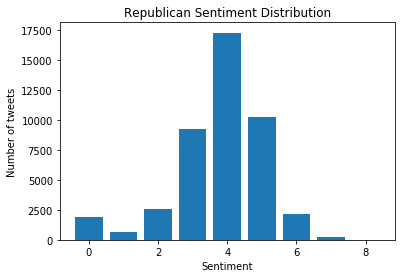

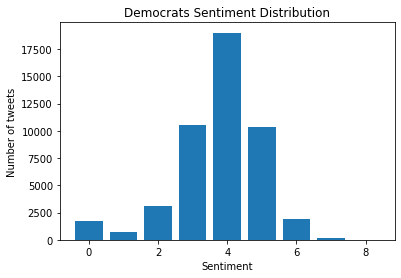

In [19]:
max_rep = np.amax(rep_sentiments)
min_rep = np.amin(rep_sentiments)

max_dem = np.amax(dem_sentiments)
min_dem = np.amin(dem_sentiments)

v=range(int(min_rep), int(max_rep+2))

hist,bins=np.histogram(rep_sentiments, v)

bins = bins[:-1]

plt.subplot()
plt.bar(bins, hist)
plt.title("Republican Sentiment Distribution")
plt.ylabel("Number of tweets")
plt.xlabel("Sentiment")
plt.show()

v=range(int(min_dem), int(max_dem+2))

hist,bins=np.histogram(dem_sentiments, v)

bins = bins[:-1]

plt.subplot()
plt.bar(bins, hist)
plt.title("Democrats Sentiment Distribution")
plt.ylabel("Number of tweets")
plt.xlabel("Sentiment")
plt.show()

<b> Looking at the distributions above, we can see that the republican party is slightly more positive than the Democrats. They at least have more positive tweets in total. But we should also consider the fact that parsing the tweet files gave us more tweets for republicans than for the democrats so the difference in the number of positive tweets could also come from there</b>

* Compute the average $m$ and standard deviation $\sigma$  of the Tweets sentiment (considering tweets by both republican and democrats). 

In [20]:
all_sentiments = rep_sentiments + dem_sentiments
m = np.mean(all_sentiments)
sigma = np.std(all_sentiments)

print(f"m: {m} sigma: {sigma}")

m: 4.26615016747917 sigma: 1.2961432260232393


* Now only tweets with sentiment lower than $m-2\sigma$. We will refer to them as *negative* tweets.  Build a list containing *negative* tweets written by democrats, and one for republicans. Compute the TF-IDF on these two lists. Create a word-cloud for each of them. Are there differences between the positive content posted by republican and democrats?


<b> Sorting tweets </b>

In [21]:
rep_negative_tweets = []
rep_positive_tweets = []

dem_negative_tweets = []
dem_positive_tweets = []

up_lvl = m+(2*sigma)
low_lvl = m-(2*sigma)

for ii in range(0,len(rep_tweets)):
    if rep_sentiments[ii] < low_lvl:
        rep_negative_tweets.append(rep_tweets[ii])
    elif rep_sentiments[ii] > up_lvl:
        rep_positive_tweets.append(rep_tweets[ii])

In [22]:
for ii in range(0,len(rep_tweets)):
    if dem_sentiments[ii] < low_lvl:
        dem_negative_tweets.append(dem_tweets[ii])
    elif dem_sentiments[ii] > up_lvl:
        dem_positive_tweets.append(dem_tweets[ii])

<b> Computing TF IDF and Word Cloud </b>

In [23]:
dem_neg = []
for x in dem_negative_tweets:
    dem_neg += x

rep_neg = []
for x in rep_negative_tweets:
    rep_neg += x

#TF for negative Democrats tweets
countD={}
for token in dem_neg:
    if token in countD:
        countD[token]+=1
    else:
        countD[token]=1

#TF for negative Republicans tweets
countR={}
for token in rep_neg:
    if token in countR:
        countR[token]+=1
    else:
        countR[token]=1

In [24]:
#IDF for Democrats
idf_D={}
for ii in countD:
    if ii in countR:
        n=2
    else:
        n=1
    idf_D[ii]=math.log(2/n)
    
#IDF for Republicans
idf_R={}
for ii in countR:
    if ii in countD:
        n=2
    else:
        n=1
    idf_R[ii]=math.log(2/n)

In [25]:
#TF-IDF for Democrats
tfidf_D={}
for ii in countD:
    tfidf_D[ii]=countD[ii]*idf_D[ii]

#TF-IDF for Republicans
tfidf_R={}
for ii in countR:
    tfidf_R[ii]=countR[ii]*idf_R[ii]  

In [26]:
#10 most popular words in either of parties
print("Top 10 words of Democrats:")
c1=Counter(tfidf_D)
h1=c1.most_common(10)
for ii in h1:
    print(ii[0])

print("\nTop 10 words of Republicans:")
c2=Counter(tfidf_R)
h2=c2.most_common(10)
for ii in h2:
    print(ii[0])

Top 10 words of Democrats:
restinpower
theblackcaucus
truthexposed
de
threatening
publiclands
sula
hispaniccaucus
enoughisenough
repeliotengel

Top 10 words of Republicans:
usmca
usmcanow
repscottperry
stoptheschiffshow
repmobrooks
mythbustingmonday
sham
repjeffduncan
congressmanhice
partisan


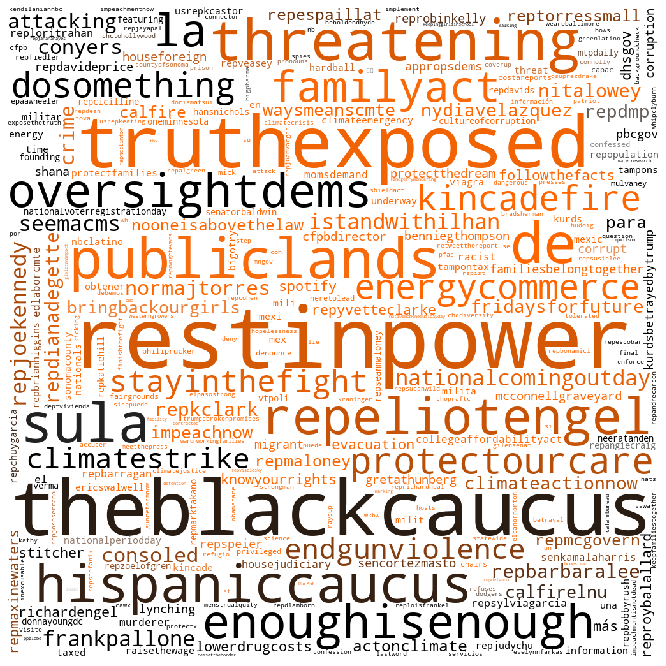

In [27]:
#Dem
path = os.getcwd() + '\square.png'

text_D = ""
for ii in countD:
    text_D+=((ii+' ')*round(tfidf_D[ii]))

mask = np.array(PIL.Image.open(path))

wc =  WordCloud(background_color="white", mode="RGBA", max_words=300, mask=mask, collocations=False).generate(text_D)

image_colors = wordcloud.ImageColorGenerator(mask)
plt.figure(figsize=[12,12])
plt.imshow(wc.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")

plt.imshow(wc.recolor(color_func=image_colors))

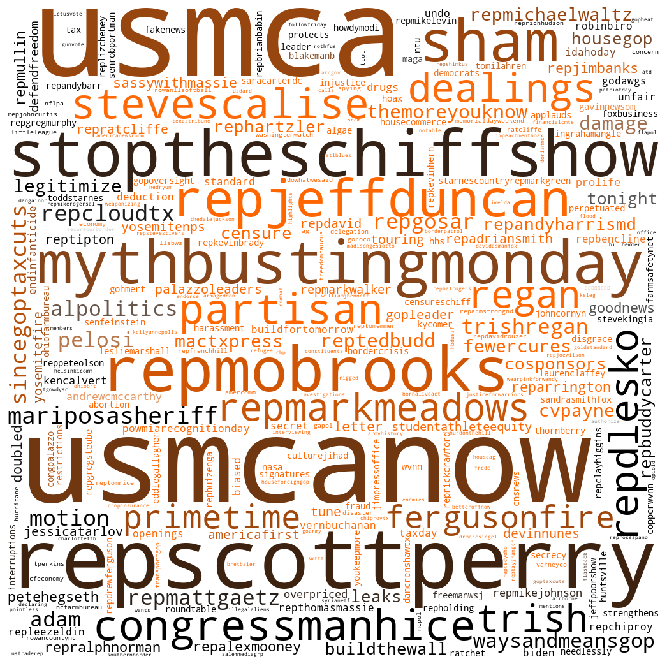

In [28]:
#Rep
path = os.getcwd() + '\square.png'

text_R = ""
for ii in countR:
    text_R+=((ii+' ')*round(tfidf_R[ii]))

mask = np.array(PIL.Image.open(path))

wc =  WordCloud(background_color="white", mode="RGBA", max_words=300, mask=mask, collocations=False).generate(text_R)

image_colors = wordcloud.ImageColorGenerator(mask)
plt.figure(figsize=[12,12])
plt.imshow(wc.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")

plt.imshow(wc.recolor(color_func=image_colors))

* Repeat the point above, but considering _positive_ tweets (e.g. with sentiment larger than $m+2\sigma$). Comment on your results.

In [29]:
dem_pos = []
for x in dem_positive_tweets:
      dem_pos += x

rep_pos = []
for x in rep_positive_tweets:
      rep_pos += x

#TF for negative Democrats tweets
alt_countD={}
for token in dem_pos:
    if token in alt_countD:
        alt_countD[token]+=1
    else:
        alt_countD[token]=1

#TF for negative Republicans tweets
alt_countR={}
for token in rep_pos:
    if token in alt_countR:
        alt_countR[token]+=1
    else:
        alt_countR[token]=1

In [30]:
#IDF for negative Democrats tweets
alt_idf_D={}
for ii in alt_countD:
    if ii in alt_countR:
        n=2
    else:
        n=1
    alt_idf_D[ii]=math.log(2/n)
    
#IDF for negative Republicans tweets
alt_idf_R={}
for ii in alt_countR:
    if ii in alt_countD:
        n=2
    else:
        n=1
    alt_idf_R[ii]=math.log(2/n)

In [31]:
#TF-IDF for negative Democrats tweets
alt_tfidf_D={}
for ii in alt_countD:
    alt_tfidf_D[ii]=alt_countD[ii]*alt_idf_D[ii]

#TF-IDF for negative Republicans tweets
alt_tfidf_R={}
for ii in alt_countR:
    alt_tfidf_R[ii]=alt_countR[ii]*alt_idf_R[ii]  

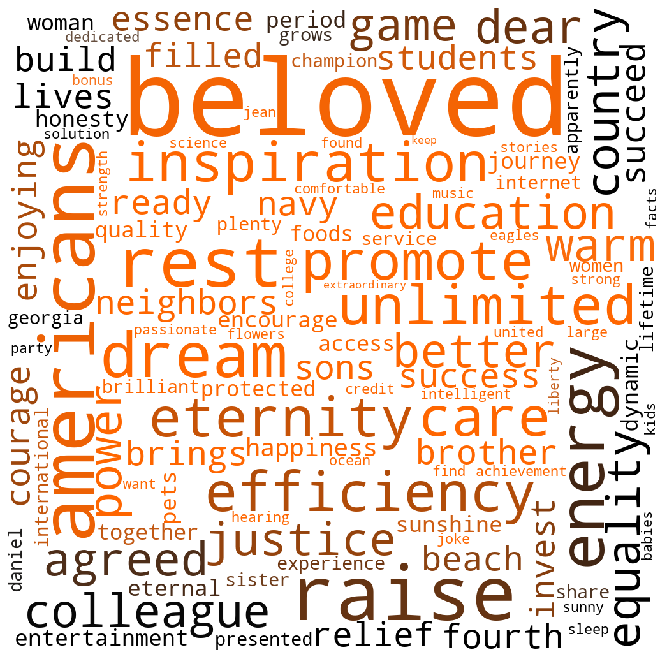

In [32]:
#Dem
path = os.getcwd() + '\square.png'

text_D = ""
for ii in alt_countD:
    text_D += ((ii+' ') * round(alt_tfidf_D[ii]))

mask = np.array(PIL.Image.open(path))

wc =  WordCloud(background_color="white", mode="RGBA", max_words=300, mask=mask, collocations=False).generate(text_D)

image_colors = wordcloud.ImageColorGenerator(mask)
plt.figure(figsize=[12,12])
plt.imshow(wc.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")

plt.imshow(wc.recolor(color_func=image_colors))

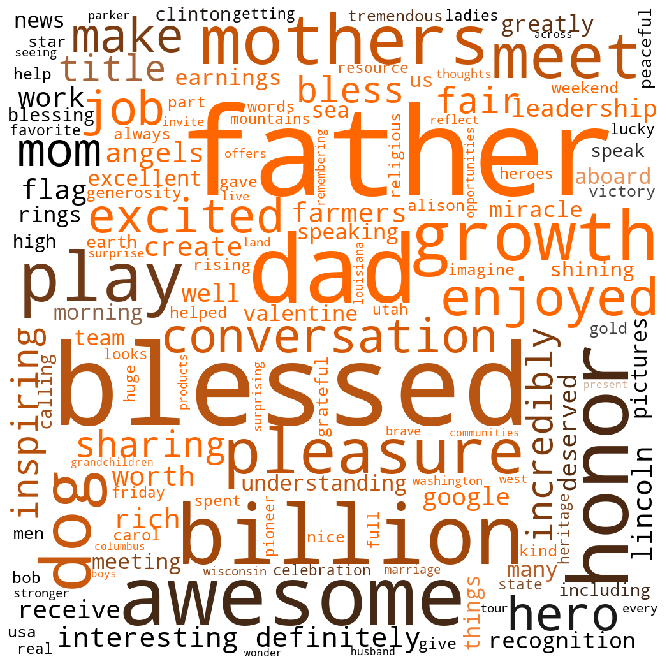

In [33]:
#Rep
path = os.getcwd() + '\square.png'

text_R = ""
for ii in alt_countR:
    text_R += ((ii+' ') * round(alt_tfidf_R[ii]))

mask = np.array(PIL.Image.open(path))

wc =  WordCloud(background_color="white", mode="RGBA", max_words=300, mask=mask, collocations=False).generate(text_R)

image_colors = wordcloud.ImageColorGenerator(mask)
plt.figure(figsize=[12,12])
plt.imshow(wc.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")

plt.imshow(wc.recolor(color_func=image_colors))

<b> Comment </b>

> <b> Looking at the wordcloud we can first see that they make sense in terms of context. The negative words are mostly negative, and same thing for the positives ones. The words use for democrats and republicans also respect the context of the parties, we can see that by the amount of religious terms appearing in the Republicans wordcloud. </b>